In [1]:
import pandas as pd

from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from nltk.corpus import wordnet

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix

In [2]:

trainingData = pd.read_csv('../NLP/User_Reviews/User_movie_review.csv')

In [3]:
flipkart = pd.read_csv('Flipkart.csv',error_bad_lines=False)
imbd = pd.read_csv('IMDBReviewData.csv')

In [4]:
trainingData.head()

,class,text
0,Pos,stuart little is one of the best family ...
1,Neg,a movie like mortal kombat annihilation wor...
2,Neg,and just when you thought joblo was getting a...
3,Pos,every now and then a movie comes along from a...
4,Neg,for about twenty minutes into mission impossi...


In [5]:
trainingData['class'] = trainingData['class'].map({'Pos':1,'Neg':0})



In [6]:
trainingData['class'].value_counts()

1    1000
0    1000
Name: class, dtype: int64

In [7]:
def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
    

In [8]:
for x in range(len(trainingData)):
    stop = [x for x in word_tokenize(trainingData.iloc[x,1]) if x not in stopwords.words('english')]
    stop = [x for x in stop if len(x)>0]
    ps = pos_tag(stop)
    lem = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in ps]
    lem = [t for t in lem if len(t) > 1]
    lem = ' '.join(lem)
    trainingData.iloc[x,1] = lem
    print(ps)

[('stuart', 'RB'), ('little', 'JJ'), ('one', 'CD'), ('best', 'JJS'), ('family', 'NN'), ('films', 'NNS'), ('come', 'VBP'), ('year', 'NN'), ('cute', 'NN'), ('funny', 'VBP'), ('good', 'JJ'), ('natured', 'JJ'), ('film', 'NN'), ('nothing', 'NN'), ('parents', 'NNS'), ('squirm', 'VBP'), ('except', 'IN'), ('mild', 'JJ'), ('cusswords', 'NNS'), ('though', 'IN'), ('read', 'JJ'), ('book', 'NN'), ('long', 'JJ'), ('time', 'NN'), ('ago', 'IN'), ('really', 'RB'), ('remember', 'VB'), ('know', 'JJ'), ('film', 'NN'), ('disappoint', 'NN'), ('finally', 'RB'), ('movie', 'NN'), ('gets', 'VBZ'), ('released', 'VBN'), ('good', 'JJ'), ('trailer', 'NN'), ('makes', 'VBZ'), ('surprising', 'JJ'), ('twists', 'NNS'), ('funny', 'JJ'), ('moments', 'NNS'), ('sentimental', 'JJ'), ('moments', 'NNS'), ('mixed', 'JJ'), ('one', 'CD'), ('great', 'JJ'), ('little', 'JJ'), ('movie', 'NN'), ('stuart', 'NN'), ('little', 'JJ'), ('mouse', 'NN'), ('finally', 'RB'), ('gotten', 'JJ'), ('new', 'JJ'), ('home', 'NN'), ('put', 'VBN'), ('ado

[('every', 'DT'), ('movie', 'NN'), ('comes', 'VBZ'), ('along', 'RB'), ('suspect', 'JJ'), ('studio', 'NN'), ('every', 'DT'), ('indication', 'NN'), ('stinker', 'NN'), ('everybody', 'NN'), ('surprise', 'NN'), ('perhaps', 'RB'), ('even', 'RB'), ('studio', 'NN'), ('film', 'NN'), ('becomes', 'VBZ'), ('critical', 'JJ'), ('darling', 'NN'), ('mtv', 'NN'), ('films', 'NNS'), ('election', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('comedy', 'NN'), ('starring', 'VBG'), ('matthew', 'NNS'), ('broderick', 'JJ'), ('reese', 'JJ'), ('witherspoon', 'NN'), ('current', 'JJ'), ('example', 'NN'), ('anybody', 'NN'), ('know', 'VBP'), ('film', 'NN'), ('existed', 'VBD'), ('week', 'NN'), ('opened', 'VBN'), ('plot', 'RB'), ('deceptively', 'RB'), ('simple', 'JJ'), ('george', 'NN'), ('washington', 'NN'), ('carver', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('student', 'NN'), ('elections', 'NNS'), ('tracy', 'VBP'), ('flick', 'JJ'), ('reese', 'JJ'), ('witherspoon', 'NN'), ('achiever', 'NN'), ('hand', 'NN'), ('raised', 'V

[('great', 'JJ'), ('idea', 'NN'), ('movie', 'NN'), ('one', 'CD'), ('miss', 'NN'), ('see', 'NN'), ('got', 'VBD'), ('coolio', 'NNS'), ('song', 'JJ'), ('soundtrack', 'NN'), ('fifty', 'NN'), ('athletes', 'VBZ'), ('celebrities', 'NNS'), ('cameo', 'NN'), ('appearances', 'NNS'), ('professional', 'JJ'), ('basketball', 'NN'), ('release', 'NN'), ('right', 'RB'), ('around', 'IN'), ('nba', 'JJ'), ('finals', 'NNS'), ('guarantee', 'NN'), ('added', 'VBD'), ('publicity', 'NN'), ('movie', 'NN'), ('actually', 'RB'), ('well', 'RB'), ('sort', 'VB'), ('eventually', 'RB'), ('figure', 'JJ'), ('comedy', 'NN'), ('throw', 'NN'), ('half', 'NN'), ('dozen', 'NN'), ('writers', 'NNS'), ('take', 'VBP'), ('best', 'JJS'), ('whatever', 'WDT'), ('come', 'VBP'), ('maybe', 'RB'), ('put', 'VBN'), ('gender', 'NN'), ('spin', 'NN'), ('see', 'VBP'), ('get', 'JJ'), ('women', 'NNS'), ('see', 'VBP'), ('eddie', 'JJ'), ('one', 'CD'), ('phenomenally', 'RB'), ('lazy', 'JJ'), ('films', 'NNS'), ('infuriates', 'VBZ'), ('kind', 'NN'), ('t

[('one', 'CD'), ('thing', 'NN'), ('common', 'JJ'), ('hollywood', 'NN'), ('major', 'JJ'), ('studios', 'NNS'), ('productions', 'NNS'), ('moving', 'VBG'), ('toward', 'IN'), ('mainstream', 'JJ'), ('although', 'IN'), ('twentieth', 'JJ'), ('century', 'NN'), ('fox', 'VBD'), ('new', 'JJ'), ('line', 'NN'), ('cinema', 'NN'), ('spawned', 'VBD'), ('subsidiaries', 'NNS'), ('specialize', 'VBP'), ('independant', 'JJ'), ('controversial', 'JJ'), ('motion', 'NN'), ('pictures', 'NNS'), ('fox', 'VBP'), ('searchlight', 'JJ'), ('fine', 'JJ'), ('line', 'NN'), ('respectively', 'RB'), ('obvious', 'JJ'), ('significant', 'JJ'), ('movement', 'NN'), ('underway', 'JJ'), ('promote', 'JJ'), ('inventive', 'JJ'), ('ideas', 'NNS'), ('theater', 'VBP'), ('movie', 'NN'), ('like', 'IN'), ('gary', 'JJ'), ('ross', 'NN'), ('pleasantville', 'NN'), ('comes', 'VBZ'), ('along', 'RB'), ('wrapped', 'JJ'), ('blanket', 'NN'), ('innovative', 'JJ'), ('ideas', 'NNS'), ('served', 'VBD'), ('platter', 'JJ'), ('fine', 'JJ'), ('production', '

[('want', 'JJ'), ('hearty', 'NN'), ('laughs', 'VBZ'), ('rat', 'JJ'), ('race', 'NN'), ('movie', 'NN'), ('unpretentious', 'JJ'), ('little', 'JJ'), ('comedy', 'NN'), ('sneaks', 'VBZ'), ('theaters', 'NNS'), ('today', 'NN'), ('little', 'JJ'), ('hype', 'NN'), ('bouncing', 'VBG'), ('theater', 'JJ'), ('seat', 'NN'), ('film', 'NN'), ('fits', 'NNS'), ('neatly', 'RB'), ('low', 'JJ'), ('brow', 'NN'), ('slapstick', 'JJ'), ('school', 'NN'), ('comedy', 'NN'), ('one', 'CD'), ('refreshing', 'NN'), ('aspect', 'JJ'), ('lack', 'NN'), ('mean', 'NN'), ('spiritedness', 'NN'), ('plot', 'NN'), ('follows', 'VBZ'), ('group', 'NN'), ('people', 'NNS'), ('chosen', 'VBP'), ('random', 'JJ'), ('eccentric', 'JJ'), ('las', 'NN'), ('vegas', 'NN'), ('casino', 'NN'), ('owner', 'NN'), ('john', 'NN'), ('cleese', 'JJ'), ('must', 'MD'), ('race', 'NN'), ('vegas', 'NN'), ('bus', 'NN'), ('station', 'NN'), ('locker', 'NN'), ('700', 'CD'), ('miles', 'NNS'), ('away', 'RB'), ('silver', 'VBP'), ('city', 'NN'), ('n', 'NN'), ('inside', 

[('let', 'VB'), ('get', 'VB'), ('one', 'CD'), ('quickly', 'RB'), ('possible', 'JJ'), ('possibility', 'NN'), ('receive', 'VBP'), ('refund', 'NN'), ('review', 'NN'), ('would', 'MD'), ('forthcoming', 'VB'), ('godzilla', 'NN'), ('without', 'IN'), ('doubt', 'NN'), ('loudest', 'JJS'), ('longest', 'JJS'), ('ultimately', 'RB'), ('amateurishly', 'JJ'), ('written', 'VBN'), ('film', 'NN'), ('ever', 'RB'), ('released', 'VBN'), ('major', 'JJ'), ('studio', 'NN'), ('producer', 'NN'), ('dean', 'JJ'), ('devlin', 'NN'), ('director', 'NN'), ('roland', 'NN'), ('emmerich', 'NN'), ('ashamed', 'VBD'), ('penance', 'NN'), ('forced', 'VBD'), ('return', 'NN'), ('film', 'NN'), ('school', 'NN'), ('watch', 'NN'), ('last', 'JJ'), ('year', 'NN'), ('merienbad', 'VBD'), ('grasp', 'JJ'), ('idea', 'NN'), ('content', 'NN'), ('plot', 'NN'), ('amount', 'NN'), ('hype', 'NN'), ('amount', 'NN'), ('money', 'NN'), ('hide', 'NN'), ('fact', 'NN'), ('filmmakers', 'NNS'), ('90s', 'CD'), ('equivalent', 'JJ'), ('william', 'NN'), ('bea

[('okay', 'NNS'), ('know', 'VBP'), ('seem', 'VBP'), ('getting', 'VBG'), ('diversion', 'NN'), ('disney', 'NN'), ('made', 'VBN'), ('real', 'JJ'), ('life', 'NN'), ('actors', 'NNS'), ('movies', 'NNS'), ('well', 'RB'), ('real', 'JJ'), ('life', 'NN'), ('acting', 'VBG'), ('tim', 'NN'), ('allen', 'NN'), ('movies', 'NNS'), ('even', 'RB'), ('make', 'VBP'), ('santa', 'NN'), ('clause', 'NN'), ('even', 'RB'), ('see', 'VB'), ('make', 'JJR'), ('idle', 'JJ'), ('point', 'NN'), ('like', 'IN'), ('toy', 'JJ'), ('story', 'NN'), ('good', 'NN'), ('also', 'RB'), ('aversion', 'NN'), ('bad', 'JJ'), ('french', 'JJ'), ('farces', 'NNS'), ('remake', 'VBP'), ('american', 'JJ'), ('films', 'NNS'), ('well', 'RB'), ('excuse', 'RB'), ('prom', 'JJ'), ('night', 'NN'), ('prom', 'IN'), ('person', 'NN'), ('best', 'JJS'), ('friend', 'NN'), ('impulsively', 'RB'), ('went', 'VBD'), ('drive', 'JJ'), ('ins', 'NNS'), ('playing', 'VBG'), ('grosse', 'NN'), ('pointe', 'NN'), ('blank', 'VBD'), ('mind', 'IN'), ('seeing', 'VBG'), ('suffer

[('steven', 'RB'), ('spielberg', 'VBZ'), ('amistad', 'NNS'), ('based', 'VBN'), ('true', 'JJ'), ('story', 'NN'), ('group', 'NN'), ('africans', 'VBZ'), ('revolted', 'VBN'), ('board', 'NN'), ('slave', 'VBP'), ('ship', 'VBN'), ('captured', 'JJ'), ('taken', 'VBN'), ('america', 'JJ'), ('legal', 'JJ'), ('dispute', 'NN'), ('ensued', 'VBD'), ('owned', 'VBN'), ('concerned', 'JJ'), ('several', 'JJ'), ('different', 'JJ'), ('aspects', 'NNS'), ('story', 'NN'), ('first', 'RB'), ('film', 'NN'), ('addresses', 'NNS'), ('issue', 'VBP'), ('inherent', 'JJ'), ('evils', 'NNS'), ('slavery', 'JJ'), ('second', 'JJ'), ('deals', 'NNS'), ('historical', 'JJ'), ('involvement', 'JJ'), ('several', 'JJ'), ('american', 'JJ'), ('politicians', 'NNS'), ('case', 'NN'), ('including', 'VBG'), ('president', 'NN'), ('martin', 'NN'), ('van', 'NN'), ('buren', 'JJ'), ('former', 'JJ'), ('president', 'NN'), ('john', 'NN'), ('quincy', 'NN'), ('adams', 'NNS'), ('anthony', 'VBP'), ('hopkins', 'NNS'), ('last', 'JJ'), ('importantly', 'RB

[('summer', 'NN'), ('movie', 'NN'), ('season', 'NN'), ('always', 'RB'), ('biggest', 'JJS'), ('brightest', 'JJS'), ('season', 'NN'), ('movies', 'NNS'), ('throughout', 'IN'), ('year', 'NN'), ('introduced', 'VBN'), ('blockbuster', 'NN'), ('hits', 'NNS'), ('usually', 'RB'), ('trashed', 'VBD'), ('critics', 'NNS'), ('loved', 'JJ'), ('people', 'NNS'), ('make', 'VBP'), ('tons', 'NNS'), ('money', 'NN'), ('box', 'NN'), ('office', 'NN'), ('year', 'NN'), ('tradition', 'NN'), ('continues', 'VBZ'), ('update', 'JJ'), ('universal', 'JJ'), ('1932', 'CD'), ('classic', 'JJ'), ('mummy', 'NN'), ('always', 'RB'), ('sucker', 'NN'), ('kind', 'NN'), ('monster', 'NN'), ('movies', 'NNS'), ('always', 'RB'), ('seem', 'VBP'), ('critic', 'JJ'), ('really', 'RB'), ('likes', 'VBZ'), ('tradition', 'NN'), ('continues', 'VBZ'), ('well', 'RB'), ('fun', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('extravaganza', 'VBP'), ('mummy', 'JJ'), ('coming', 'VBG'), ('brendan', 'NN'), ('fraser', 'NN'), ('stars', 'VBZ'), ('adventuro

[('weir', 'RB'), ('well', 'RB'), ('respected', 'VBN'), ('hollywood', 'NN'), ('turning', 'VBG'), ('scripts', 'NNS'), ('difficult', 'JJ'), ('subject', 'JJ'), ('matter', 'NN'), ('deceptively', 'RB'), ('simple', 'JJ'), ('powerful', 'JJ'), ('films', 'NNS'), ('mosquito', 'VBP'), ('coast', 'NN'), ('utopia', 'JJ'), ('fearless', 'NN'), ('post', 'NN'), ('traumatic', 'JJ'), ('stress', 'NN'), ('disorder', 'NN'), ('among', 'IN'), ('truman', 'JJ'), ('show', 'VBP'), ('weir', 'JJ'), ('essentially', 'RB'), ('breathes', 'VBZ'), ('life', 'NN'), ('tired', 'VBD'), ('concept', 'JJ'), ('media', 'NNS'), ('manipulation', 'NN'), ('tackling', 'VBG'), ('material', 'NN'), ('inside', 'IN'), ('certainly', 'RB'), ('helps', 'VBZ'), ('underrated', 'JJ'), ('performer', 'NN'), ('top', 'JJ'), ('form', 'NN'), ('playing', 'NN'), ('title', 'NN'), ('character', 'NN'), ('truman', 'JJ'), ('burbank', 'NN'), ('must', 'MD'), ('aware', 'VB'), ('premise', 'NN'), ('unbeknownst', 'JJ'), ('truman', 'NN'), ('carrey', 'NN'), ('star', 'JJ

[('carolco', 'NN'), ('pictures', 'NNS'), ('dutch', 'VBP'), ('director', 'NN'), ('paul', 'NN'), ('verhoeven', 'NN'), ('robocop', 'NN'), ('came', 'VBD'), ('together', 'RB'), ('create', 'JJ'), ('1990', 'CD'), ('mega', 'JJ'), ('hit', 'VBD'), ('total', 'JJ'), ('recall', 'NN'), ('film', 'NN'), ('masterpiece', 'JJ'), ('sets', 'NNS'), ('action', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('action', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('get', 'VB'), ('better', 'JJR'), ('!', '.'), ('story', 'NN'), ('involves', 'VBZ'), ('construction', 'NN'), ('worker', 'NN'), ('named', 'VBN'), ('douglas', 'NNS'), ('quaid', 'VBD'), ('arnold', 'RB'), ('schwarzenegger', 'JJ'), ('lives', 'NNS'), ('earth', 'VBP'), ('beautiful', 'JJ'), ('wife', 'NN'), ('lori', 'VBD'), ('sharon', 'NNP'), ('stone', 'NN'), ('quaid', 'NN'), ('obsessed', 'VBD'), ('mars', 'NNS'), ('decides', 'NNS'), ('go', 'VBP'), ('second', 'JJ'), ('best', 'RBS'), ('choice', 'NN'), ('brain', 'NN'), ('implant', 'JJ'), ('fake', 'JJ'), ('memory', 

[('historical', 'JJ'), ('epic', 'NN'), ('genre', 'NN'), ('almost', 'RB'), ('banished', 'VBD'), ('hollywood', 'VBD'), ('early', 'RB'), ('1990s', 'CD'), ('many', 'JJ'), ('critics', 'NNS'), ('scholars', 'NNS'), ('importantly', 'RB'), ('film', 'NN'), ('producers', 'NNS'), ('thing', 'NN'), ('past', 'IN'), ('something', 'NN'), ('could', 'MD'), ('attracted', 'VB'), ('crowds', 'JJ'), ('era', 'NN'), ('black', 'JJ'), ('white', 'JJ'), ('television', 'NN'), ('non', 'NN'), ('cgi', 'VBZ'), ('special', 'JJ'), ('effects', 'NNS'), ('1995', 'CD'), ('case', 'NN'), ('dances', 'VBZ'), ('wolves', 'VBZ'), ('five', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('came', 'VBD'), ('man', 'NN'), ('decided', 'VBD'), ('use', 'NN'), ('energy', 'NN'), ('talents', 'NNS'), ('actor', 'JJ'), ('producer', 'NN'), ('director', 'NN'), ('order', 'NN'), ('revitalise', 'NN'), ('particular', 'JJ'), ('genre', 'NN'), ('case', 'NN'), ('dances', 'VBZ'), ('wolves', 'NNS'), ('awarded', 'VBD'), ('effort', 'NN'), ('oscars', 'NNS'), ('name', '

[('feel', 'VB'), ('hesitation', 'NN'), ('saying', 'VBG'), ('something', 'NN'), ('mary', 'JJ'), ('best', 'RBS'), ('film', 'NN'), ('see', 'VBP'), ('year', 'NN'), ('moment', 'NN'), ('credits', 'NNS'), ('started', 'VBD'), ('roll', 'JJ'), ('end', 'NN'), ('picture', 'NN'), ('doubt', 'NN'), ('mind', 'NN'), ('seen', 'VBN'), ('masterpiece', 'RB'), ('remain', 'VBP'), ('unsurpassed', 'JJ'), ('remaining', 'VBG'), ('months', 'NNS'), ('1998', 'CD'), ('good', 'JJ'), ('film', 'NN'), ('gene', 'NN'), ('siskel', 'NN'), ('said', 'VBD'), ('fargo', 'JJ'), ('months', 'NNS'), ('96', 'CD'), ('dismissed', 'JJ'), ('notion', 'NN'), ('ridiculous', 'NN'), ('could', 'MD'), ('possibly', 'RB'), ('know', 'VB'), ('film', 'NN'), ('great', 'JJ'), ('nothing', 'NN'), ('could', 'MD'), ('possibly', 'RB'), ('see', 'VB'), ('future', 'NN'), ('could', 'MD'), ('beat', 'VB'), ('seeing', 'VBG'), ('farrelly', 'RB'), ('hilarious', 'JJ'), ('surprisingly', 'RB'), ('heartfelt', 'JJ'), ('masterwork', 'NN'), ('know', 'VBP'), ('siskel', 'NN

[('chance', 'NN'), ('see', 'VBP'), ('sneak', 'JJ'), ('preview', 'NN'), ('city', 'NN'), ('slickers', 'NNS'), ('ii', 'VBP'), ('campus', 'NN'), ('last', 'JJ'), ('night', 'NN'), ('went', 'VBD'), ('expectation', 'NN'), ('film', 'NN'), ('similar', 'JJ'), ('flavor', 'NN'), ('made', 'VBD'), ('original', 'JJ'), ('success', 'NN'), ('personal', 'JJ'), ('growth', 'NN'), ('insightful', 'JJ'), ('humor', 'NN'), ('life', 'NN'), ('came', 'VBD'), ('away', 'RB'), ('somewhat', 'RB'), ('disappointed', 'JJ'), ('regard', 'NN'), ('getting', 'VBG'), ('latter', 'RB'), ('much', 'JJ'), ('former', 'JJ'), ('basic', 'NN'), ('plot', 'NN'), ('revolves', 'VBZ'), ('around', 'RP'), ('billy', 'RB'), ('crystal', 'JJ'), ('plays', 'NNS'), ('mitch', 'VBP'), ('robbins', 'NNS'), ('turning', 'VBG'), ('forty', 'JJ'), ('become', 'JJ'), ('station', 'NN'), ('manager', 'NN'), ('radio', 'NN'), ('station', 'NN'), ('worked', 'VBD'), ('original', 'JJ'), ('given', 'VBN'), ('job', 'NN'), ('radio', 'NN'), ('station', 'NN'), ('best', 'JJS'),

[('battle', 'NN'), ('dreamworks', 'VBZ'), ('versus', 'IN'), ('disney', 'NN'), ('earlier', 'RBR'), ('year', 'NN'), ('mammoth', 'NN'), ('companies', 'NNS'), ('fought', 'VBD'), ('death', 'NN'), ('end', 'NN'), ('world', 'NN'), ('asteroid', 'NN'), ('flicks', 'NNS'), ('deep', 'JJ'), ('impact', 'NN'), ('armageddon', 'JJ'), ('months', 'NNS'), ('later', 'RB'), ('dueling', 'VBG'), ('bug', 'NN'), ('movies', 'NNS'), ('antz', 'VBP'), ('bug', 'JJ'), ('life', 'NN'), ('find', 'VBP'), ('astonishing', 'JJ'), ('pairs', 'NNS'), ('movies', 'NNS'), ('inherently', 'RB'), ('similar', 'JJ'), ('story', 'NN'), ('execution', 'NN'), ('mean', 'VBP'), ('come', 'VBN'), ('chances', 'NNS'), ('two', 'CD'), ('studios', 'NNS'), ('deciding', 'VBG'), ('bring', 'NN'), ('computer', 'NN'), ('animated', 'VBD'), ('films', 'NNS'), ('bugs', 'NNS'), ('case', 'NN'), ('meteor', 'NN'), ('movies', 'NNS'), ('disney', 'VBP'), ('come', 'VBN'), ('top', 'JJ'), ('though', 'IN'), ('antz', 'JJ'), ('likable', 'JJ'), ('movie', 'NN'), ('bug', 'NN

[('synopsis', 'NN'), ('big', 'JJ'), ('breasted', 'VBD'), ('dim', 'NN'), ('witted', 'VBD'), ('sculptress', 'JJ'), ('britt', 'JJ'), ('gets', 'VBZ'), ('really', 'RB'), ('mad', 'JJ'), ('grad', 'NN'), ('student', 'NN'), ('boyfriend', 'VB'), ('spends', 'VBZ'), ('much', 'JJ'), ('time', 'NN'), ('thought', 'VBN'), ('transference', 'NN'), ('experiments', 'NNS'), ('instead', 'RB'), ('art', 'VBP'), ('showings', 'NNS'), ('elderly', 'RB'), ('evil', 'JJ'), ('scientist', 'NN'), ('everett', 'JJ'), ('longstreet', 'NN'), ('switches', 'NNS'), ('minds', 'VBZ'), ('britt', 'JJ'), ('boy', 'NN'), ('meantime', 'NN'), ('goes', 'VBZ'), ('completely', 'RB'), ('mental', 'JJ'), ('comments', 'NNS'), ('naked', 'JJ'), ('souls', 'NNS'), ('opens', 'VBZ'), ('naked', 'JJ'), ('woman', 'NN'), ('movie', 'NN'), ('makes', 'VBZ'), ('illusion', 'NN'), ('sci', 'JJ'), ('fi', 'JJ'), ('vehicle', 'NN'), ('designed', 'VBN'), ('show', 'NN'), ('pamela', 'NN'), ('anderson', 'NN'), ('um', 'JJ'), ('talents', 'NNS'), ('really', 'RB'), ('inte

[('kind', 'NN'), ('movie', 'NN'), ('makes', 'VBZ'), ('one', 'CD'), ('appreciate', 'NN'), ('disney', 'NN'), ('live', 'JJ'), ('action', 'NN'), ('george', 'NN'), ('jungle', 'NN'), ('tarzan', 'NN'), ('lost', 'VBD'), ('city', 'NN'), ('latest', 'JJS'), ('attempt', 'NN'), ('bring', 'NN'), ('edgar', 'NN'), ('rice', 'NN'), ('burrough', 'IN'), ('legendary', 'JJ'), ('hero', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('one', 'CD'), ('inept', 'NN'), ('ill', 'NN'), ('timed', 'VBD'), ('tarzan', 'JJ'), ('adventure', 'NN'), ('far', 'RB'), ('badly', 'RB'), ('conceived', 'VBD'), ('poorly', 'RB'), ('executed', 'VBN'), ('tarzan', 'NN'), ('lost', 'VBN'), ('city', 'NN'), ('appears', 'VBZ'), ('headed', 'VBN'), ('quick', 'JJ'), ('trip', 'NN'), ('video', 'NN'), ('store', 'NN'), ('shelves', 'NNS'), ('idea', 'NN'), ('producers', 'NNS'), ('chose', 'VBD'), ('bring', 'VBG'), ('back', 'RB'), ('tarzan', 'JJ'), ('legions', 'NNS'), ('new', 'JJ'), ('fans', 'NNS'), ('clamoring', 'VBG'), ('next', 'JJ'), ('movie', 'NN'), ('fur

[('andy', 'JJ'), ('leaves', 'VBZ'), ('cowboy', 'JJ'), ('camp', 'NN'), ('mother', 'NN'), ('holds', 'VBZ'), ('yard', 'RB'), ('sale', 'NN'), ('scrounges', 'NNS'), ('room', 'NN'), ('old', 'JJ'), ('toys', 'VBZ'), ('one', 'CD'), ('toys', 'NN'), ('wheezy', 'NN'), ('penguin', 'NN'), ('broken', 'VBN'), ('squeaker', 'NN'), ('woody', 'NN'), ('tom', 'JJ'), ('hanks', 'NNS'), ('saddles', 'NNS'), ('andy', 'VBP'), ('dog', 'JJ'), ('rides', 'NNS'), ('yard', 'RB'), ('rescue', 'VBP'), ('wheezy', 'NNS'), ('woody', 'JJ'), ('succeeds', 'VBZ'), ('mission', 'NN'), ('make', 'VB'), ('back', 'RB'), ('house', 'NN'), ('al', 'NN'), ('unscrupulous', 'JJ'), ('owner', 'NN'), ('al', 'NN'), ('toy', 'NN'), ('barn', 'NN'), ('recognizes', 'VBZ'), ('woody', 'NN'), ('rare', 'JJ'), ('collector', 'NN'), ('item', 'NN'), ('steals', 'NNS'), ('buzz', 'VBP'), ('lightyear', 'JJ'), ('tim', 'NN'), ('allen', 'VBN'), ('leads', 'VBZ'), ('hamm', 'NN'), ('john', 'NN'), ('ratzenberger', 'NN'), ('mr', 'NN'), ('potato', 'NN'), ('head', 'NN'), 

[('wizards', 'NNS'), ('animated', 'VBN'), ('feature', 'NN'), ('begins', 'VBZ'), ('narration', 'JJ'), ('epic', 'NN'), ('proportions', 'NNS'), ('black', 'JJ'), ('white', 'JJ'), ('drawings', 'NNS'), ('told', 'VBD'), ('earth', 'NN'), ('destroyed', 'VBN'), ('apocalyptic', 'JJ'), ('nuclear', 'JJ'), ('exchange', 'NN'), ('sending', 'VBG'), ('remnants', 'NNS'), ('humanity', 'NN'), ('generations', 'NNS'), ('radiation', 'NN'), ('induced', 'VBN'), ('mutation', 'NN'), ('original', 'JJ'), ('inhabitants', 'NNS'), ('earth', 'JJ'), ('fairies', 'NNS'), ('elves', 'VBZ'), ('return', 'VBP'), ('populate', 'JJ'), ('globe', 'NN'), ('along', 'IN'), ('evil', 'JJ'), ('mutant', 'NN'), ('counterparts', 'NNS'), ('one', 'CD'), ('day', 'NN'), ('say', 'VBP'), ('one', 'CD'), ('day', 'NN'), ('trite', 'VB'), ('exactly', 'RB'), ('happened', 'VBN'), ('advance', 'NN'), ('notice', 'NN'), ('fairy', 'NN'), ('queen', 'JJ'), ('gives', 'VBZ'), ('birth', 'NN'), ('twins', 'NNS'), ('one', 'CD'), ('good', 'JJ'), ('one', 'CD'), ('evil

[('cold', 'JJ'), ('molecules', 'NNS'), ('moving', 'VBG'), ('everything', 'NN'), ('clean', 'JJ'), ('essential', 'JJ'), ('words', 'NNS'), ('mikey', 'VBP'), ('carver', 'RB'), ('elijah', 'RB'), ('wood', 'NN'), ('young', 'JJ'), ('teenage', 'NN'), ('boy', 'NN'), ('living', 'NN'), ('1973', 'CD'), ('new', 'JJ'), ('canaan', 'NN'), ('connecticut', 'NN'), ('ice', 'NN'), ('storm', 'NN'), ('mikey', 'NN'), ('delivers', 'NNS'), ('words', 'NNS'), ('bored', 'VBD'), ('science', 'NN'), ('class', 'NN'), ('unlikely', 'JJ'), ('anyone', 'NN'), ('realizes', 'VBZ'), ('much', 'RB'), ('parallel', 'JJ'), ('mikey', 'JJ'), ('life', 'NN'), ('lives', 'VBZ'), ('surround', 'RP'), ('father', 'RB'), ('jim', 'NN'), ('jamey', 'NN'), ('sheridan', 'NN'), ('rarely', 'RB'), ('seen', 'VBN'), ('mother', 'NN'), ('janey', 'NN'), ('sigourney', 'NN'), ('weaver', 'WRB'), ('affair', 'NN'), ('married', 'VBD'), ('neighbor', 'JJ'), ('ben', 'NN'), ('hood', 'NN'), ('kevin', 'FW'), ('kline', 'NN'), ('ben', 'NN'), ('wife', 'NN'), ('elena', '

[('american', 'JJ'), ('werewolf', 'NN'), ('paris', 'NN'), ('failed', 'VBD'), ('attempt', 'JJ'), ('recapture', 'NN'), ('humor', 'NN'), ('horror', 'NN'), ('john', 'NN'), ('landis', 'NN'), ('1981', 'CD'), ('feature', 'NN'), ('american', 'JJ'), ('werewolf', 'NN'), ('london', 'VBD'), ('original', 'JJ'), ('comedy', 'NN'), ('sequel', 'NN'), ('kind', 'NN'), ('revolting', 'VBG'), ('silliness', 'NN'), ('found', 'VBD'), ('tv', 'NN'), ('sit', 'NN'), ('coms', 'NNS'), ('first', 'JJ'), ('installment', 'JJ'), ('chills', 'NNS'), ('one', 'CD'), ('sequences', 'NNS'), ('inappropriately', 'RB'), ('unintentionally', 'RB'), ('funny', 'JJ'), ('short', 'JJ'), ('american', 'JJ'), ('werewolf', 'NN'), ('london', 'VBD'), ('become', 'JJ'), ('something', 'NN'), ('minor', 'JJ'), ('classic', 'JJ'), ('genre', 'NN'), ('woeful', 'JJ'), ('american', 'JJ'), ('werewolf', 'NN'), ('paris', 'NN'), ('seems', 'VBZ'), ('destined', 'VBN'), ('late', 'JJ'), ('nights', 'NNS'), ('cinemax', 'VBD'), ('even', 'RB'), ('necessary', 'JJ'), 

[('confession', 'NN'), ('time', 'NN'), ('never', 'RB'), ('ever', 'RB'), ('seen', 'VBN'), ('gone', 'VBN'), ('wind', 'NN'), ('know', 'VBP'), ('really', 'RB'), ('wanted', 'JJ'), ('check', 'NN'), ('video', 'NN'), ('home', 'NN'), ('nights', 'NNS'), ('network', 'NN'), ('tv', 'NN'), ('far', 'RB'), ('drive', 'JJ'), ('last', 'JJ'), ('time', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('right', 'JJ'), ('front', 'NN'), ('admit', 'NN'), ('know', 'VBP'), ('heck', 'NN'), ('talking', 'VBG'), ('goes', 'VBZ'), ('titanic', 'JJ'), ('gone', 'VBN'), ('wind', 'NN'), ('1990', 'CD'), ('maybe', 'RB'), ('going', 'VBG'), ('little', 'JJ'), ('bit', 'NN'), ('far', 'RB'), ('good', 'JJ'), ('job', 'NN'), ('leonardo', 'NNS'), ('dicaprio', 'VBP'), ('kate', 'JJ'), ('winslet', 'NN'), ('movie', 'NN'), ('clark', 'NN'), ('gable', 'JJ'), ('vivien', 'NN'), ('leigh', 'JJ'), ('parallels', 'NNS'), ('gwtw', 'VBP'), ('first', 'JJ'), ('movie', 'NN'), ('take', 'VB'), ('real', 'JJ'), ('advantage', 'NN'), ('revolutionary', 'JJ'), ('technol

[('soft', 'JJ'), ('spot', 'NN'), ('heart', 'NN'), ('pure', 'NN'), ('amoral', 'JJ'), ('sleaze', 'NN'), ('liked', 'VBD'), ('showgirls', 'NNS'), ('said', 'VBD'), ('typically', 'RB'), ('enjoy', 'JJ'), ('sitting', 'VBG'), ('eszterhaz', 'JJ'), ('sex', 'NN'), ('filled', 'VBN'), ('cinematic', 'JJ'), ('tabloid', 'NN'), ('ish', 'JJ'), ('trash', 'NN'), ('wild', 'JJ'), ('things', 'NNS'), ('best', 'JJS'), ('sleazy', 'NN'), ('film', 'NN'), ('ever', 'RB'), ('seen', 'VBN'), ('filled', 'VBN'), ('great', 'JJ'), ('performances', 'NNS'), ('graphic', 'JJ'), ('sex', 'NN'), ('three', 'CD'), ('way', 'NN'), ('sex', 'NN'), ('rape', 'NN'), ('charges', 'NNS'), ('double', 'JJ'), ('crosses', 'NNS'), ('plot', 'NN'), ('twists', 'NNS'), ('genitalia', 'VBP'), ('genders', 'NNS'), ('graphic', 'JJ'), ('violence', 'NN'), ('death', 'NN'), ('witty', 'JJ'), ('humor', 'NN'), ('best', 'JJS'), ('denise', 'NN'), ('richards', 'NNS'), ('criticizing', 'VBG'), ('film', 'NN'), ('disgusting', 'VBG'), ('raucous', 'JJ'), ('plain', 'NN'),

[('essence', 'RB'), ('good', 'JJ'), ('hunting', 'VBG'), ('ordinary', 'JJ'), ('story', 'NN'), ('told', 'VBD'), ('well', 'RB'), ('taken', 'VBN'), ('whole', 'JJ'), ('little', 'JJ'), ('special', 'JJ'), ('tale', 'NN'), ('follows', 'VBZ'), ('traditional', 'JJ'), ('narrative', 'JJ'), ('path', 'NN'), ('leaves', 'VBZ'), ('audience', 'NN'), ('warm', 'JJ'), ('fuzzy', 'NN'), ('feeling', 'NN'), ('never', 'RB'), ('really', 'RB'), ('challenges', 'VBZ'), ('surprises', 'NNS'), ('us', 'PRP'), ('intelligently', 'RB'), ('written', 'VBN'), ('dialogue', 'NN'), ('occasionally', 'RB'), ('brilliant', 'JJ'), ('strongly', 'RB'), ('directed', 'VBN'), ('nicely', 'RB'), ('acted', 'VBN'), ('good', 'JJ'), ('hunting', 'NN'), ('far', 'RB'), ('late', 'JJ'), ('year', 'NN'), ('masterpiece', 'RB'), ('worthwhile', 'JJ'), ('sample', 'JJ'), ('entertainment', 'NN'), ('like', 'IN'), ('scent', 'JJ'), ('woman', 'NN'), ('released', 'VBN'), ('around', 'IN'), ('time', 'NN'), ('season', 'NN'), ('five', 'CD'), ('years', 'NNS'), ('ago'

[('make', 'VB'), ('1954', 'CD'), ('japanese', 'JJ'), ('monster', 'NN'), ('film', 'NN'), ('godzilla', 'NN'), ('transformed', 'VBD'), ('jurassic', 'JJ'), ('park', 'NN'), ('copy', 'NN'), ('swims', 'VBZ'), ('south', 'RB'), ('pacific', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('real', 'JJ'), ('reason', 'NN'), ('trashes', 'NNS'), ('town', 'NN'), ('although', 'IN'), ('destruction', 'NN'), ('entertaining', 'VBG'), ('gets', 'VBZ'), ('old', 'JJ'), ('fast', 'NN'), ('film', 'NN'), ('often', 'RB'), ('makes', 'VBZ'), ('sense', 'JJ'), ('several', 'JJ'), ('hundred', 'CD'), ('foot', 'NN'), ('tall', 'JJ'), ('beast', 'NN'), ('hides', 'NNS'), ('subway', 'VBP'), ('tunnels', 'NNS'), ('sports', 'NNS'), ('second', 'JJ'), ('rate', 'NN'), ('effects', 'NNS'), ('baby', 'VBP'), ('godzillas', 'NNS'), ('seem', 'VBP'), ('one', 'CD'), ('computer', 'NN'), ('effect', 'NN'), ('multiplied', 'VBD'), ('screen', 'JJ'), ('lame', 'NN'), ('jokes', 'NNS'), ('mayor', 'VBP'), ('ebert', 'JJ'), ('assistant', 'NN'), ('gene', 'NN'), ('ne

[('scream', 'NN'), ('2', 'CD'), ('quite', 'RB'), ('clever', 'JJ'), ('predecessor', 'NN'), ('fills', 'NNS'), ('gap', 'VBP'), ('cutting', 'VBG'), ('wit', 'NN'), ('death', 'NN'), ('even', 'RB'), ('gruesome', 'JJ'), ('bloody', 'NN'), ('death', 'NN'), ('funny', 'NN'), ('handled', 'VBD'), ('right', 'JJ'), ('way', 'NN'), ('offended', 'VBD'), ('statement', 'NN'), ('need', 'NN'), ('look', 'VBP'), ('pulp', 'NN'), ('fiction', 'NN'), ('example', 'NN'), ('plenty', 'NN'), ('horror', 'NN'), ('go', 'VBP'), ('around', 'RB'), ('scream', 'RB'), ('2', 'CD'), ('latest', 'JJS'), ('90s', 'CD'), ('slasher', 'NN'), ('flick', 'NN'), ('incarnation', 'NN'), ('also', 'RB'), ('laughs', 'VBZ'), ('scream', 'NN'), ('2', 'CD'), ('slice', 'NN'), ('dice', 'NN'), ('movie', 'NN'), ('take', 'VB'), ('horror', 'NN'), ('seriously', 'RB'), ('success', 'NN'), ('original', 'JJ'), ('scream', 'NN'), ('took', 'VBD'), ('everyone', 'NN'), ('industry', 'NN'), ('surprise', 'NN'), ('unexpected', 'JJ'), ('blockbuster', 'NN'), ('whose', 'W

[('synopsis', 'NN'), ('man', 'NN'), ('whose', 'WP$'), ('lover', 'JJ'), ('paris', 'NN'), ('murdered', 'VBD'), ('agrees', 'JJ'), ('test', 'NN'), ('experimental', 'JJ'), ('virtual', 'JJ'), ('reality', 'NN'), ('home', 'NN'), ('unit', 'NN'), ('system', 'NN'), ('subject', 'JJ'), ('escapes', 'NNS'), ('real', 'JJ'), ('world', 'NN'), ('current', 'JJ'), ('girlfriend', 'NN'), ('laura', 'NN'), ('becomes', 'VBZ'), ('addicted', 'VBN'), ('virtual', 'JJ'), ('reality', 'NN'), ('due', 'JJ'), ('design', 'NN'), ('flaw', 'NN'), ('unit', 'NN'), ('recreates', 'VBZ'), ('dead', 'JJ'), ('paris', 'NN'), ('comments', 'NNS'), ('virtual', 'JJ'), ('seduction', 'NN'), ('executive', 'NN'), ('produced', 'VBD'), ('roger', 'JJR'), ('corman', 'JJ'), ('lance', 'NN'), ('h', 'NN'), ('robbins', 'VBZ'), ('serves', 'NNS'), ('cheaply', 'RB'), ('made', 'VBD'), ('precursor', 'NN'), ('strange', 'JJ'), ('days', 'NNS'), ('far', 'RB'), ('superior', 'JJ'), ('film', 'NN'), ('movies', 'NNS'), ('deal', 'VBP'), ('desperate', 'JJ'), ('men',

[('screen', 'JJ'), ('adaptations', 'NNS'), ('john', 'VBP'), ('irving', 'VBG'), ('novels', 'NNS'), ('disappointingly', 'RB'), ('uneven', 'JJ'), ('films', 'NNS'), ('shared', 'VBD'), ('one', 'CD'), ('particular', 'JJ'), ('strength', 'NN'), ('key', 'JJ'), ('casting', 'NN'), ('forget', 'NN'), ('john', 'NN'), ('lithgow', 'NN'), ('roberta', 'NN'), ('muldoon', 'NN'), ('transsexual', 'JJ'), ('quarterback', 'NN'), ('world', 'NN'), ('according', 'VBG'), ('garp', 'JJ'), ('nastassja', 'JJ'), ('kinski', 'NN'), ('susie', 'JJ'), ('bear', 'JJ'), ('hotel', 'NN'), ('new', 'JJ'), ('hampshire', 'NN'), ('lot', 'NN'), ('good', 'JJ'), ('casting', 'NN'), ('decisions', 'NNS'), ('gone', 'VBN'), ('making', 'VBG'), ('cider', 'NN'), ('house', 'NN'), ('rules', 'NNS'), ('adaptation', 'VBP'), ('irving', 'VBG'), ('poetic', 'JJ'), ('1994', 'CD'), ('novel', 'NN'), ('restless', 'NN'), ('young', 'JJ'), ('man', 'NN'), ('called', 'VBN'), ('homer', 'NN'), ('wells', 'NNS'), ('among', 'IN'), ('sound', 'JJ'), ('judgments', 'NNS'

[('jaws', 'NNS'), ('rare', 'JJ'), ('film', 'NN'), ('grabs', 'NN'), ('attention', 'NN'), ('shows', 'VBZ'), ('single', 'JJ'), ('image', 'NN'), ('screen', 'JJ'), ('movie', 'NN'), ('opens', 'VBZ'), ('blackness', 'JJ'), ('distant', 'JJ'), ('alien', 'NN'), ('like', 'IN'), ('underwater', 'JJ'), ('sounds', 'NNS'), ('comes', 'VBZ'), ('first', 'RB'), ('ominous', 'JJ'), ('bars', 'NNS'), ('composer', 'VBP'), ('john', 'JJ'), ('williams', 'NNS'), ('infamous', 'JJ'), ('score', 'NN'), ('dah', 'NN'), ('dum', 'NN'), ('director', 'NN'), ('steven', 'JJ'), ('spielberg', 'NN'), ('wastes', 'NNS'), ('time', 'NN'), ('taking', 'VBG'), ('us', 'PRP'), ('water', 'NN'), ('midnight', 'NN'), ('swim', 'NN'), ('beautiful', 'JJ'), ('girl', 'NN'), ('turns', 'VBZ'), ('deadly', 'RB'), ('right', 'JJ'), ('away', 'RB'), ('lets', 'VBZ'), ('us', 'PRP'), ('know', 'VB'), ('vulnerable', 'JJ'), ('floating', 'VBG'), ('ocean', 'JJ'), ('jaws', 'NN'), ('attacked', 'VBD'), ('never', 'RB'), ('relinquishes', 'NNS'), ('grip', 'VBP'), ('per

[('celebration', 'NN'), ('one', 'CD'), ('elite', 'NN'), ('kind', 'NN'), ('films', 'NNS'), ('completely', 'RB'), ('absorbant', 'VBP'), ('know', 'JJ'), ('sit', 'NN'), ('watch', 'NN'), ('matter', 'NN'), ('heard', 'NN'), ('help', 'NN'), ('totally', 'RB'), ('drawn', 'JJ'), ('story', 'NN'), ('shocked', 'VBN'), ('every', 'DT'), ('single', 'JJ'), ('turn', 'NN'), ('occurs', 'VBZ'), ('prefer', 'VBP'), ('films', 'NNS'), ('like', 'IN'), ('best', 'JJS'), ('kind', 'NN'), ('films', 'NNS'), ('like', 'IN'), ('really', 'RB'), ('feel', 'VB'), ('real', 'JJ'), ('rules', 'NNS'), ('cinema', 'VBP'), ('film', 'NN'), ('anything', 'NN'), ('long', 'JJ'), ('makes', 'VBZ'), ('work', 'NN'), ('ask', 'JJ'), ('films', 'NNS'), ('one', 'CD'), ('thing', 'NN'), ('common', 'JJ'), ('create', 'NN'), ('experiences', 'NNS'), ('watch', 'VBP'), ('film', 'NN'), ('matter', 'NN'), ('kind', 'NN'), ('film', 'NN'), ('want', 'VBP'), ('able', 'JJ'), ('take', 'VB'), ('certain', 'JJ'), ('memories', 'NNS'), ('along', 'IN'), ('celebration', 

[('`', '``'), ('bats', 'NNS'), ('insulting', 'VBG'), ('slap', 'NN'), ('across', 'IN'), ('face', 'NN'), ('dedicated', 'VBN'), ('horror', 'JJ'), ('movie', 'NN'), ('fan', 'NN'), ('pull', 'JJ'), ('something', 'NN'), ('like', 'IN'), ('need', 'NN'), ('sense', 'NN'), ('wit', 'NN'), ('style', 'NN'), ('heavy', 'JJ'), ('dosage', 'NN'), ('humor', 'NN'), ('back', 'RB'), ('process', 'NN'), ('fright', 'NN'), ('factor', 'NN'), ('ever', 'RB'), ('declines', 'VBZ'), ('something', 'NN'), ('like', 'IN'), ('underground', 'JJ'), ('worm', 'NN'), ('thriller', 'NN'), ('`', '``'), ('tremors', 'NNS'), ('perfect', 'JJ'), ('mixture', 'NN'), ('elements', 'NNS'), ('return', 'VBP'), ('film', 'NN'), ('tremendous', 'JJ'), ('fun', 'NN'), ('notable', 'JJ'), ('exception', 'NN'), ('wisecracking', 'VBG'), ('supporting', 'VBG'), ('player', 'NN'), ('`', '``'), ('bats', 'NNS'), ('mainly', 'RB'), ('plays', 'VBZ'), ('premise', 'NN'), ('straight', 'JJ'), ('arrow', 'NN'), ('horror', 'NN'), ('judging', 'VBG'), ('ridiculous', 'JJ'),

[('much', 'RB'), ('wanted', 'VBN'), ('like', 'IN'), ('film', 'NN'), ('went', 'VBD'), ('pleased', 'JJ'), ('left', 'NN'), ('first', 'RB'), ('getting', 'VBG'), ('usual', 'JJ'), ('lines', 'NNS'), ('newspaper', 'NN'), ('glitz', 'NN'), ('liked', 'VBD'), ('scream', 'JJ'), ('love', 'NN'), ('wild', 'JJ'), ('things', 'NNS'), ('!', '.'), ('campbell', 'NN'), ('gives', 'VBZ'), ('stunning', 'JJ'), ('performance', 'NN'), ('!', '.'), ('twisty', 'NN'), ('plot', 'NN'), ('dazzled', 'VBD'), ('days', 'NNS'), ('!', '.'), ('oh', 'JJ'), ('yeah', 'UH'), ('day', 'NN'), ('newspaper', 'NN'), ('uses', 'VBZ'), ('day', 'NN'), ('neve', 'RB'), ('campbell', 'NN'), ('falls', 'VBZ'), ('love', 'VB'), ('onto', 'IN'), ('serious', 'JJ'), ('stuff', 'NN'), ('film', 'NN'), ('mean', 'VBP'), ('nearly', 'RB'), ('sarcastic', 'JJ'), ('way', 'NN'), ('wild', 'JJ'), ('things', 'NNS'), ('single', 'JJ'), ('handedly', 'RB'), ('broken', 'JJ'), ('rules', 'NNS'), ('surrounding', 'VBG'), ('r', 'NN'), ('rating', 'NN'), ('mpaa', 'NN'), ('saying

[('delicatessen', 'NN'), ('directors', 'NNS'), ('marc', 'VBP'), ('caro/jean', 'JJ'), ('pierre', 'JJ'), ('jeunet', 'NN'), ('screenwriters', 'NNS'), ('gilles', 'NNS'), ('adrien/marc', 'VBP'), ('caro', 'NN'), ('cinematographer', 'NN'), ('darius', 'NN'), ('khondji', 'NN'), ('editor', 'NN'), ('herve', 'NN'), ('schneid', 'VBD'), ('cast', 'JJ'), ('dominique', 'NN'), ('pinon', 'NN'), ('louison', 'NN'), ('marie', 'NN'), ('laure', 'NN'), ('dougnac', 'NN'), ('julie', 'NN'), ('clapet', 'NN'), ('jean', 'JJ'), ('claude', 'NN'), ('dreyfus', 'NN'), ('clapet', 'NN'), ('butcher', 'NN'), ('karin', 'FW'), ('viard', 'NN'), ('mademoiselle', 'FW'), ('plusse', 'NN'), ('ticky', 'JJ'), ('holgado', 'NN'), ('marcel', 'NN'), ('tapioca', 'NN'), ('anne', 'NN'), ('marie', 'NN'), ('pisani', 'NN'), ('madame', 'NN'), ('tapioca', 'NN'), ('jacques', 'NNS'), ('mathou', 'VBP'), ('roger', 'JJR'), ('rufus', 'NN'), ('robert', 'NN'), ('kube', 'NNP'), ('howard', 'NN'), ('vernon', 'NN'), ('frog', 'NN'), ('man', 'NN'), ('edith', '

[('many', 'JJ'), ('us', 'PRP'), ('would', 'MD'), ('become', 'VB'), ('strippers', 'NNS'), ('us', 'PRP'), ('moral', 'JJ'), ('reason', 'NN'), ('purely', 'RB'), ('lack', 'JJ'), ('confidence', 'NN'), ('probably', 'RB'), ('fair', 'JJ'), ('question', 'NN'), ('lot', 'NN'), ('us', 'PRP'), ('could', 'MD'), ('well', 'RB'), ('neither', 'CC'), ('reasons', 'NNS'), ('watch', 'VBP'), ('full', 'JJ'), ('monty', 'NN'), ('however', 'RB'), ('may', 'MD'), ('begin', 'VB'), ('asking', 'VBG'), ('kinds', 'NNS'), ('questions', 'NNS'), ('would', 'MD'), ('willing', 'JJ'), ('grin', 'NN'), ('bare', 'NN'), ('bring', 'VBG'), ('much', 'RB'), ('needed', 'VBN'), ('dough', 'NN'), ('case', 'NN'), ('guessed', 'VBD'), ('full', 'JJ'), ('monty', 'NN'), ('stripping', 'VBG'), ('striptease', 'NN'), ('actually', 'RB'), ('quite', 'RB'), ('charming', 'JJ'), ('comedy', 'NN'), ('uses', 'VBZ'), ('ideas', 'NNS'), ('great', 'JJ'), ('deal', 'NN'), ('tact', 'JJ'), ('sophistication', 'NN'), ('story', 'NN'), ('six', 'CD'), ('work', 'NN'), ('

[('rare', 'JJ'), ('treat', 'NN'), ('quality', 'NN'), ('horror', 'NN'), ('film', 'NN'), ('released', 'VBN'), ('theater', 'NN'), ('unfortunately', 'RB'), ('man', 'NN'), ('best', 'JJS'), ('friend', 'NN'), ('waiting', 'VBG'), ('longer', 'JJR'), ('film', 'NN'), ('stars', 'NNS'), ('ally', 'RB'), ('sheedy', 'JJ'), ('lance', 'NN'), ('henrikson', 'NN'), ('tale', 'NN'), ('bio', 'NN'), ('genetics', 'NNS'), ('gone', 'VBN'), ('wrong', 'JJ'), ('sheedy', 'NN'), ('plays', 'NNS'), ('nosy', 'JJ'), ('reporter', 'NN'), ('whose', 'WP$'), ('need', 'NN'), ('good', 'JJ'), ('story', 'NN'), ('provokes', 'NNS'), ('snoop', 'VBP'), ('inside', 'IN'), ('emax', 'FW'), ('poorly', 'RB'), ('guarded', 'VBN'), ('million', 'CD'), ('dollar', 'NN'), ('bio', 'NN'), ('lab', 'NN'), ('finds', 'VBZ'), ('effortlessly', 'RB'), ('intruding', 'JJ'), ('result', 'NN'), ('unleashes', 'NNS'), ('experimental', 'JJ'), ('wonder', 'NN'), ('dog', 'NN'), ('named', 'VBN'), ('max', 'JJ'), ('german', 'JJ'), ('shepherd', 'NN'), ('genetic', 'JJ'), 

[('since', 'IN'), ('movies', 'NNS'), ('slavery', 'VBP'), ('shield', 'JJ'), ('us', 'PRP'), ('true', 'JJ'), ('horrors', 'NNS'), ('portraying', 'VBG'), ('fitting', 'VBG'), ('say', 'VBP'), ('beloved', 'VBN'), ('come', 'JJ'), ('real', 'JJ'), ('shock', 'NN'), ('film', 'NN'), ('confusing', 'VBG'), ('bizarre', 'JJ'), ('tough', 'JJ'), ('film', 'NN'), ('watch', 'NN'), ('film', 'NN'), ('seen', 'VBN'), ('year', 'NN'), ('necessarily', 'RB'), ('three', 'CD'), ('hour', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('beloved', 'VBD'), ('challenging', 'JJ'), ('watch', 'NN'), ('filled', 'VBN'), ('tough', 'JJ'), ('powerful', 'JJ'), ('poetry', 'NN'), ('takes', 'VBZ'), ('us', 'PRP'), ('completely', 'RB'), ('guard', 'VBP'), ('instead', 'RB'), ('straight', 'RB'), ('forward', 'RB'), ('hollywood', 'NN'), ('ized', 'JJ'), ('story', 'NN'), ('happened', 'VBD'), ('slaves', 'NNS'), ('freed', 'VBP'), ('beloved', 'VBN'), ('comes', 'VBZ'), ('cry', 'JJ'), ('anguish', 'JJ'), ('actually', 'RB'), ('lived', 'VBD'), ('happened'

[('synopsis', 'NN'), ('sullen', 'VBN'), ('julie', 'NN'), ('james', 'NNS'), ('still', 'RB'), ('haunted', 'VBN'), ('nightmares', 'NNS'), ('killer', 'VB'), ('ben', 'NN'), ('willis', 'NN'), ('know', 'VBP'), ('last', 'JJ'), ('summer', 'NN'), ('perks', 'VBD'), ('new', 'JJ'), ('best', 'JJS'), ('friend', 'NN'), ('karla', 'NN'), ('wilson', 'NN'), ('wins', 'VBZ'), ('trip', 'NN'), ('four', 'CD'), ('bahamas', 'NN'), ('arriving', 'VBG'), ('start', 'NN'), ('hurricane', 'NN'), ('season', 'NN'), ('julie', 'NN'), ('karla', 'NN'), ('run', 'VBP'), ('around', 'RB'), ('tight', 'JJ'), ('clothing', 'NN'), ('realize', 'NN'), ('walked', 'VBD'), ('trap', 'JJ'), ('set', 'NN'), ('rainslickered', 'VBD'), ('slasher', 'JJR'), ('huge', 'JJ'), ('hook', 'NN'), ('hand', 'NN'), ('comments', 'NNS'), ('may', 'MD'), ('showing', 'VBG'), ('pop', 'JJ'), ('culture', 'NN'), ('illiteracy', 'NN'), ('never', 'RB'), ('seen', 'VBN'), ('episode', 'NN'), ('fox', 'JJ'), ('tv', 'NN'), ('series', 'NN'), ('party', 'NN'), ('five', 'CD'), ('

[('sum', 'NN'), ('entire', 'JJ'), ('film', 'NN'), ('54', 'CD'), ('one', 'CD'), ('sentence', 'NN'), ('would', 'MD'), ('watch', 'VB'), ('vh1', 'RB'), ('documentary', 'JJ'), ('instead', 'RB'), ('54', 'CD'), ('seems', 'VBZ'), ('like', 'IN'), ('someone', 'NN'), ('brought', 'VBD'), ('william', 'WP'), ('faulkner', 'NN'), ('1978', 'CD'), ('brought', 'VBD'), ('studio', 'NN'), ('54', 'CD'), ('got', 'VBD'), ('really', 'RB'), ('drunk', 'JJ'), ('told', 'VBD'), ('write', 'JJ'), ('dumbed', 'NNS'), ('released', 'VBN'), ('public', 'JJ'), ('sloppy', 'JJ'), ('version', 'NN'), ('almost', 'RB'), ('stream', 'JJ'), ('conciousness', 'NN'), ('spirals', 'NNS'), ('oblivion', 'VBP'), ('illusion', 'NN'), ('sex', 'NN'), ('drugs', 'NNS'), ('disco', 'VBP'), ('narrator', 'NN'), ('shane', 'NN'), ('shae', 'NN'), ('ryan', 'JJ'), ('phillippe', 'NN'), ('works', 'VBZ'), ('grease', 'NN'), ('monkey', 'JJ'), ('new', 'JJ'), ('jersey', 'NN'), ('course', 'NN'), ('whim', 'NN'), ('decides', 'NNS'), ('go', 'VBP'), ('new', 'JJ'), ('y

[('warning', 'NN'), ('may', 'MD'), ('contain', 'VB'), ('slight', 'JJ'), ('mild', 'NN'), ('spoilers', 'NNS'), ('rated', 'VBD'), ('r', 'JJ'), ('intense', 'JJ'), ('violence/gore', 'NN'), ('strong', 'JJ'), ('sexuality', 'NN'), ('language', 'NN'), ('starring', 'VBG'), ('arnold', 'JJ'), ('schwarzeneggar', 'NN'), ('robin', 'NN'), ('tunney', 'NN'), ('rod', 'NN'), ('stieger', 'NN'), ('gabriel', 'JJ'), ('byrne', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('132', 'CD'), ('minutes', 'NNS'), ('go', 'VBP'), ('movie', 'NN'), ('theater', 'NN'), ('boom', 'NN'), ('!', '.'), ('lights', 'NNS'), ('go', 'VB'), ('hearts', 'NNS'), ('race', 'NN'), ('go', 'VBP'), ('ten', 'JJ'), ('minutes', 'NNS'), ('preview', 'VBP'), ('finally', 'RB'), ('movie', 'NN'), ('waiting', 'VBG'), ('see', 'VB'), ('long', 'JJ'), ('time', 'NN'), ('comes', 'VBZ'), ('sit', 'JJ'), ('watch', 'NN'), ('disbelief', 'NN'), ('movie', 'NN'), ('bad', 'JJ'), ('know', 'VBP'), ('getting', 'VBG'), ('like', 'IN'), ('past', 'JJ'), ('summers', 'NNS'), ('hi

[('first', 'RB'), ('big', 'JJ'), ('fan', 'NN'), ('x', 'JJ'), ('files', 'NNS'), ('tv', 'NN'), ('series', 'NN'), ('nothing', 'NN'), ('particularly', 'RB'), ('happen', 'JJ'), ('watch', 'NN'), ('said', 'VBD'), ('say', 'VBP'), ('liked', 'VBN'), ('x', 'JJ'), ('files', 'NNS'), ('pretty', 'RB'), ('well', 'RB'), ('us', 'PRP'), ('non', 'VBP'), ('fans', 'NNS'), ('nothing', 'NN'), ('big', 'JJ'), ('going', 'VBG'), ('lot', 'NN'), ('little', 'JJ'), ('things', 'NNS'), ('movie', 'NN'), ('opens', 'VBZ'), ('ice', 'NN'), ('cave', 'VBP'), ('north', 'JJ'), ('texas', 'JJ'), ('35', 'CD'), ('000', 'CD'), ('b', 'NNS'), ('c', 'VBP'), ('two', 'CD'), ('proto', 'NN'), ('humans', 'NNS'), ('enter', 'VBP'), ('cave', 'VBP'), ('find', 'JJ'), ('space', 'NN'), ('alien', 'NN'), ('cocooned', 'VBD'), ('inside', 'IN'), ('alien', 'JJ'), ('breaks', 'NNS'), ('free', 'JJ'), ('kills', 'NNS'), ('one', 'CD'), ('man', 'NN'), ('struggle', 'NN'), ('seemingly', 'RB'), ('captured', 'VBD'), ('bloody', 'JJ'), ('ooze', 'JJ'), ('alien', 'JJ'

[('really', 'RB'), ('starting', 'VBG'), ('wonder', 'NN'), ('alicia', 'IN'), ('silverstone', 'NN'), ('sure', 'JJ'), ('one', 'CD'), ('beautiful', 'NN'), ('creatures', 'VBZ'), ('god', 'VBP'), ('green', 'JJ'), ('earth', 'JJ'), ('second', 'JJ'), ('movie', 'NN'), ('critic', 'JJ'), ('large', 'JJ'), ('guy', 'NN'), ('comes', 'VBZ'), ('choosing', 'VBG'), ('movies', 'NNS'), ('stars', 'NNS'), ('always', 'RB'), ('strikes', 'VBP'), ('crush', 'JJ'), ('slow', 'JJ'), ('moving', 'VBG'), ('predictable', 'JJ'), ('piece', 'NN'), ('fluff', 'NN'), ('hideaway', 'NN'), ('horrific', 'NN'), ('novel', 'JJ'), ('adaptation', 'NN'), ('alicia', 'IN'), ('minor', 'JJ'), ('role', 'NN'), ('clueless', 'NN'), ('annoying', 'VBG'), ('unfunny', 'JJ'), ('waste', 'NN'), ('time', 'NN'), ('people', 'NNS'), ('e', 'VBP'), ('mailed', 'VBN'), ('saying', 'VBG'), ('clueless', 'NN'), ('good', 'JJ'), ('movie', 'NN'), ('one', 'CD'), ('like', 'IN'), ('one', 'CD'), ('girl', 'NN'), ('said', 'VBD'), ('seen', 'VBN'), ('movie', 'NN'), ('open', 

[('ladies', 'NNS'), ('gentlemen', 'NNS'), ('1997', 'CD'), ('independence', 'NN'), ('day', 'NN'), ('!', '.'), ('title', 'NN'), ('starship', 'NN'), ('troopers', 'NNS'), ('surprisingly', 'RB'), ('entertaining', 'VBG'), ('id4', 'JJ'), ('realize', 'NN'), ('gave', 'VBD'), ('last', 'JJ'), ('year', 'NN'), ('sci', 'VBD'), ('fi', 'JJ'), ('hit', 'NN'), ('4', 'CD'), ('star', 'NN'), ('rating', 'NN'), ('spell', 'NN'), ('powerful', 'JJ'), ('first', 'JJ'), ('hour', 'NN'), ('subsequent', 'JJ'), ('viewings', 'NNS'), ('feel', 'VBP'), ('independence', 'RB'), ('day', 'NN'), ('really', 'RB'), ('great', 'JJ'), ('seemed', 'VBD'), ('though', 'IN'), ('still', 'RB'), ('give', 'VB'), ('positive', 'JJ'), ('review', 'NN'), ('starship', 'NN'), ('troopers', 'NNS'), ('hand', 'NN'), ('mocking', 'VBG'), ('sense', 'NN'), ('humor', 'NN'), ('knowing', 'VBG'), ('perfectly', 'RB'), ('well', 'RB'), ('ridiculous', 'JJ'), ('may', 'MD'), ('seem', 'VB'), ('result', 'NN'), ('starship', 'NN'), ('troopers', 'NNS'), ('exciting', 'VBG

[('slavery', 'NN'), ('bad', 'JJ'), ('hundreds', 'NNS'), ('years', 'NNS'), ('finally', 'RB'), ('figured', 'VBD'), ('one', 'CD'), ('almost', 'RB'), ('universal', 'JJ'), ('belief', 'JJ'), ('strength', 'NN'), ('weakness', 'NN'), ('director', 'NN'), ('steven', 'JJ'), ('spielberg', 'NN'), ('latest', 'JJS'), ('serious', 'JJ'), ('film', 'NN'), ('late', 'RB'), ('1830s', 'CD'), ('portuguese', 'JJ'), ('slave', 'VBP'), ('ship', 'JJ'), ('carries', 'VBZ'), ('cargo', 'JJ'), ('black', 'JJ'), ('men', 'NNS'), ('women', 'NNS'), ('kidnapped', 'VBD'), ('home', 'NN'), ('africa', 'NN'), ('west', 'JJS'), ('coast', 'NN'), ('cuba', 'NN'), ('sold', 'VBN'), ('slavery', 'NN'), ('fifty', 'JJ'), ('three', 'CD'), ('stuffed', 'NN'), ('la', 'CC'), ('amistad', 'JJ'), ('spanish', 'JJ'), ('word', 'NN'), ('friendship', 'NN'), ('new', 'JJ'), ('spanish', 'JJ'), ('owners', 'NNS'), ('freeing', 'VBG'), ('chains', 'NNS'), ('senge', 'VBP'), ('pieh', 'JJ'), ('djimon', 'NN'), ('hounsou', 'NN'), ('renamed', 'VBD'), ('cinque', 'JJ'),

[('titantic', 'JJ'), ('writer', 'NN'), ('director', 'NN'), ('james', 'VBZ'), ('cameron', 'RB'), ('much', 'JJ'), ('anticipated', 'VBN'), ('sometimes', 'RB'), ('ridiculed', 'JJ'), ('$', '$'), ('200', 'CD'), ('000', 'CD'), ('000', 'CD'), ('epic', 'NN'), ('arrives', 'NNS'), ('shortly', 'RB'), ('theaters', 'NNS'), ('question', 'VBP'), ('naturally', 'RB'), ('arises', 'VBZ'), ('whether', 'IN'), ('film', 'NN'), ('worth', 'NN'), ('business', 'NN'), ('proposition', 'NN'), ('seems', 'VBZ'), ('hard', 'JJ'), ('see', 'VBP'), ('ever', 'RB'), ('break', 'VB'), ('even', 'JJ'), ('movie', 'NN'), ('nothing', 'NN'), ('short', 'JJ'), ('wonderful', 'NN'), ('already', 'RB'), ('neatly', 'RB'), ('categorized', 'VBN'), ('yet', 'RB'), ('another', 'DT'), ('disaster', 'NN'), ('movie', 'NN'), ('la', 'NN'), ('volcano', 'FW'), ('poseidon', 'JJ'), ('adventure', 'NN'), ('think', 'VBP'), ('movie', 'NN'), ('great', 'JJ'), ('love', 'NN'), ('story', 'NN'), ('told', 'VBD'), ('disaster', 'NN'), ('backdrop', 'NN'), ('portrayal'

[('truman', 'NN'), ('true', 'JJ'), ('man', 'NN'), ('burbank', 'NN'), ('perfect', 'JJ'), ('name', 'NN'), ('jim', 'NN'), ('carrey', 'VBP'), ('character', 'NN'), ('film', 'NN'), ('president', 'NN'), ('truman', 'NN'), ('unassuming', 'JJ'), ('man', 'NN'), ('became', 'VBD'), ('known', 'JJ'), ('worldwide', 'IN'), ('spite', 'JJ'), ('stature', 'NN'), ('truman', 'NN'), ('also', 'RB'), ('recalls', 'VBZ'), ('era', 'JJ'), ('plenty', 'NN'), ('following', 'VBG'), ('grim', 'JJ'), ('war', 'NN'), ('era', 'NN'), ('planned', 'VBN'), ('communities', 'NNS'), ('built', 'VBN'), ('government', 'NN'), ('scientists', 'NNS'), ('promised', 'VBD'), ('idyllic', 'JJ'), ('life', 'NN'), ('americans', 'NNS'), ('burbank', 'VBP'), ('california', 'JJ'), ('brings', 'NNS'), ('mind', 'NN'), ('tonight', 'NN'), ('show', 'NN'), ('home', 'NN'), ('nbc', 'RB'), ('hollywood', 'VBD'), ('center', 'NN'), ('film', 'NN'), ('world', 'NN'), ('burbank', 'NN'), ('center', 'NN'), ('tv', 'NN'), ('world', 'NN'), ('world', 'NN'), ('protagonist',

[('originally', 'RB'), ('saw', 'VBD'), ('trailer', 'JJ'), ('analyze', 'JJ'), ('months', 'NNS'), ('ago', 'RB'), ('must', 'MD'), ('admit', 'VB'), ('thought', 'NN'), ('looked', 'VBD'), ('kind', 'NN'), ('lame', 'NN'), ('commercials', 'NNS'), ('started', 'VBD'), ('popping', 'VBG'), ('week', 'NN'), ('two', 'CD'), ('ago', 'RB'), ('thought', 'VBD'), ('looked', 'VBD'), ('outright', 'RB'), ('bad', 'JJ'), ('analyze', 'NNS'), ('finally', 'RB'), ('opened', 'VBD'), ('days', 'NNS'), ('ago', 'RB'), ('odd', 'JJ'), ('thing', 'NN'), ('happened', 'VBD'), ('got', 'VBD'), ('great', 'JJ'), ('reviews', 'NNS'), ('critics', 'NNS'), ('proclaiming', 'VBG'), ('hilarious', 'JJ'), ('dead', 'JJ'), ('parody', 'NN'), ('mob', 'NN'), ('movies', 'NNS'), ('well', 'RB'), ('praise', 'VBP'), ('like', 'IN'), ('figured', 'VBN'), ('must', 'MD'), ('good', 'VB'), ('headed', 'VBN'), ('theater', 'NN'), ('know', 'VBP'), ('expression', 'NN'), ('says', 'VBZ'), ('always', 'RB'), ('trust', 'JJ'), ('gut', 'NN'), ('instincts', 'NNS'), ('we

[('holy', 'JJ'), ('man', 'NN'), ('boasts', 'VBZ'), ('sweet', 'JJ'), ('gentle', 'JJ'), ('comic', 'JJ'), ('performance', 'NN'), ('unusually', 'RB'), ('subdued', 'VBN'), ('eddie', 'JJ'), ('murphy', 'NN'), ('moderately', 'RB'), ('funny', 'JJ'), ('skits', 'NNS'), ('unfortunately', 'RB'), ('get', 'VBP'), ('good', 'JJ'), ('stuff', 'NN'), ('sit', 'NN'), ('painfully', 'RB'), ('long', 'RB'), ('set', 'VBN'), ('loads', 'RB'), ('tedious', 'JJ'), ('filler', 'NN'), ('interminable', 'JJ'), ('shots', 'NNS'), ('jeff', 'VBP'), ('goldblum', 'NN'), ('stammering', 'VBG'), ('twitching', 'VBG'), ('superfluous', 'JJ'), ('romantic', 'JJ'), ('subplot', 'NN'), ('quite', 'RB'), ('possibly', 'RB'), ('annoying', 'VBG'), ('performance', 'NN'), ('robert', 'NN'), ('loggia', 'NN'), ('career', 'NN'), ('ever', 'RB'), ('movie', 'NN'), ('screamed', 'VBD'), ('wait', 'JJ'), ('video', 'NN'), ('fast', 'RB'), ('forward', 'RB'), ('dull', 'JJ'), ('annoying', 'NN'), ('parts', 'NNS'), ('eddie', 'VBP'), ('murphy', 'NN'), ('plays', 'N

[('bad', 'JJ'), ('things', 'NNS'), ('delightfully', 'RB'), ('morbid', 'VBP'), ('film', 'NN'), ('year', 'NN'), ('movie', 'NN'), ('goes', 'VBZ'), ('far', 'RB'), ('deep', 'JJ'), ('end', 'NN'), ('outrageousness', 'NN'), ('violence', 'NN'), ('help', 'NN'), ('material', 'NN'), ('film', 'NN'), ('starts', 'VBZ'), ('five', 'CD'), ('friends', 'NNS'), ('leaving', 'VBG'), ('homes', 'NNS'), ('los', 'JJ'), ('angeles', 'NNS'), ('bachelor', 'NN'), ('party', 'NN'), ('las', 'NN'), ('vegas', 'NN'), ('groom', 'NN'), ('kyle', 'VBZ'), ('fisher', 'RB'), ('jon', 'JJ'), ('favreau', 'NN'), ('married', 'VBD'), ('controlling', 'VBG'), ('wedding', 'NN'), ('obsessed', 'VBD'), ('laura', 'JJ'), ('cameron', 'NN'), ('diaz', 'NN'), ('friends', 'NNS'), ('real', 'JJ'), ('estate', 'NN'), ('agent', 'NN'), ('robert', 'NN'), ('boyd', 'NN'), ('christian', 'JJ'), ('slater', 'NN'), ('quiet', 'JJ'), ('charles', 'NNS'), ('leland', 'VBP'), ('orser', 'JJR'), ('brothers', 'NNS'), ('michael', 'VBP'), ('jeremy', 'NN'), ('piven', 'JJ'),

[('couple', 'NN'), ('criminals', 'NNS'), ('mario', 'VBP'), ('van', 'NN'), ('peebles', 'NNS'), ('loretta', 'VBP'), ('devine', 'JJ'), ('move', 'NN'), ('rich', 'JJ'), ('family', 'NN'), ('house', 'NN'), ('hopes', 'VBZ'), ('conning', 'VBG'), ('jewels', 'NNS'), ('however', 'RB'), ('someone', 'NN'), ('else', 'JJ'), ('steals', 'NNS'), ('jewels', 'NNS'), ('able', 'JJ'), ('get', 'VBP'), ('writer', 'JJ'), ('mario', 'NN'), ('van', 'NN'), ('peebles', 'VBZ'), ('delivers', 'NNS'), ('clever', 'JJ'), ('script', 'JJ'), ('several', 'JJ'), ('unexpected', 'JJ'), ('plot', 'NN'), ('twists', 'NNS'), ('director', 'NN'), ('mario', 'NN'), ('van', 'NN'), ('peebles', 'VBZ'), ('undermines', 'RB'), ('high', 'JJ'), ('points', 'NNS'), ('haphazard', 'VBP'), ('camera', 'NN'), ('work', 'NN'), ('editing', 'VBG'), ('pacing', 'VBG'), ('felt', 'VBD'), ('though', 'IN'), ('film', 'NN'), ('wrapping', 'VBG'), ('hour', 'NN'), ('mark', 'NN'), ('alas', 'NN'), ('still', 'RB'), ('35', 'CD'), ('minutes', 'NNS'), ('go', 'VBP'), ('danie

[('attempt', 'NN'), ('florida', 'NN'), ('film', 'NN'), ('noir', 'JJ'), ('palmetto', 'NN'), ('fails', 'VBZ'), ('fundamental', 'JJ'), ('levels', 'NNS'), ('slow', 'VBP'), ('moving', 'VBG'), ('uninvolving', 'VBG'), ('plain', 'NN'), ('uninteresting', 'JJ'), ('harry', 'NN'), ('barber', 'VB'), ('woody', 'NN'), ('harrelson', 'NN'), ('ex', 'FW'), ('newspaper', 'NN'), ('man', 'NN'), ('jail', 'NN'), ('framed', 'VBN'), ('crime', 'NN'), ('luck', 'NN'), ('best', 'JJS'), ('things', 'NNS'), ('looking', 'VBG'), ('mysterious', 'JJ'), ('woman', 'NN'), ('rhea', 'NN'), ('malroux', 'NN'), ('elisabeth', 'VBZ'), ('shue', 'JJ'), ('approaches', 'NNS'), ('proposition', 'NN'), ('wants', 'VBZ'), ('harry', 'VB'), ('help', 'NN'), ('stepdaughter', 'NN'), ('odette', 'NN'), ('chloe', 'NN'), ('sevigny', 'NN'), ('pull', 'JJ'), ('fake', 'NN'), ('kidnapping', 'VBG'), ('scheme', 'JJ'), ('get', 'VB'), ('$', '$'), ('500', 'CD'), ('000', 'CD'), ('stingy', 'NN'), ('rich', 'JJ'), ('husband', 'NN'), ('felix', 'NN'), ('rolf', 'NN'

[('director', 'NN'), ('jan', 'NN'), ('de', 'IN'), ('bont', 'FW'), ('certainly', 'RB'), ('knows', 'VBZ'), ('make', 'VB'), ('top', 'JJ'), ('quality', 'NN'), ('action', 'NN'), ('films', 'NNS'), ('need', 'VBP'), ('look', 'VBP'), ('die', 'JJ'), ('hard', 'JJ'), ('director', 'NN'), ('photography', 'NN'), ('speed', 'NN'), ('last', 'JJ'), ('years', 'NNS'), ('twister', 'VBD'), ('examples', 'NNS'), ('hi', 'VBP'), ('octane', 'NN'), ('edge', 'NN'), ('seat', 'NN'), ('thrill', 'NN'), ('prowess', 'VB'), ('speed', 'NN'), ('2', 'CD'), ('exception', 'NN'), ('time', 'NN'), ('action', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('huge', 'JJ'), ('cruise', 'NN'), ('liner', 'NN'), ('sandra', 'NN'), ('bullock', 'NN'), ('jason', 'NN'), ('patrick', 'NN'), ('trying', 'VBG'), ('develop', 'VB'), ('relationship', 'NN'), ('yep', 'RB'), ('right', 'JJ'), ('keanu', 'NN'), ('reeves', 'NNS'), ('time', 'NN'), ('fear', 'VBP'), ('jason', 'NN'), ('patrick', 'JJ'), ('job', 'NN'), ('speaking', 'VBG'), ('job', 'NN'), ('hand', 'NN'

[('many', 'JJ'), ('people', 'NNS'), ('procrastination', 'VBP'), ('problem', 'NN'), ('overcome', 'NN'), ('high', 'JJ'), ('art', 'NN'), ('anything', 'NN'), ('put', 'VBD'), ('task', 'RP'), ('deadline', 'JJ'), ('column', 'NN'), ('nears', 'NNS'), ('time', 'NN'), ('week', 'NN'), ('dishes', 'NNS'), ('get', 'VBP'), ('washed', 'VBN'), ('bed', 'NN'), ('made', 'VBN'), ('laundry', 'JJ'), ('done', 'VBN'), ('plants', 'NNS'), ('watered', 'VBD'), ('eventually', 'RB'), ('hopefully', 'RB'), ('sometimes', 'RB'), ('breakthrough', 'IN'), ('actually', 'RB'), ('get', 'VB'), ('work', 'NN'), ('amazingly', 'RB'), ('almost', 'RB'), ('always', 'RB'), ('easier', 'JJR'), ('dreaded', 'JJ'), ('finishing', 'NN'), ('sense', 'NN'), ('oppressive', 'JJ'), ('apprehension', 'NN'), ('melts', 'NNS'), ('away', 'RP'), ('next', 'JJ'), ('time', 'NN'), ('english', 'JJ'), ('professor', 'NN'), ('grady', 'JJ'), ('tripp', 'NN'), ('michael', 'NN'), ('douglas', 'VBP'), ('master', 'NN'), ('seven', 'CD'), ('years', 'NNS'), ('ago', 'RB'), 

[('went', 'VBD'), ('blair', 'NN'), ('witch', 'NN'), ('project', 'NN'), ('2', 'CD'), ('book', 'NN'), ('shadows', 'NNS'), ('highest', 'JJS'), ('hopes', 'NNS'), ('original', 'JJ'), ('film', 'NN'), ('released', 'VBN'), ('last', 'JJ'), ('summer', 'NN'), ('genuinely', 'RB'), ('scary', 'JJ'), ('terrifying', 'NN'), ('hoped', 'VBD'), ('movie', 'NN'), ('would', 'MD'), ('live', 'VB'), ('predecessor', 'NN'), ('unfortunately', 'RB'), ('hopes', 'VBZ'), ('soon', 'RB'), ('dashed', 'JJ'), ('movie', 'NN'), ('opens', 'VBZ'), ('audience', 'NN'), ('shown', 'VBN'), ('pseudo', 'JJ'), ('documentary', 'JJ'), ('clips', 'NNS'), ('burkittsville', 'VBP'), ('maryland', 'NN'), ('residents', 'NNS'), ('interviewed', 'VBD'), ('sudden', 'JJ'), ('tourist', 'NN'), ('influx', 'NN'), ('town', 'NN'), ('result', 'NN'), ('original', 'JJ'), ('blair', 'NN'), ('witch', 'NN'), ('project', 'NN'), ('movie', 'NN'), ('mostly', 'RB'), ('humorous', 'JJ'), ('self', 'NN'), ('aware', 'JJ'), ('poke', 'JJ'), ('media', 'NNS'), ('hype', 'NN'),

[('john', 'NN'), ('cusack', 'NN'), ('kind', 'NN'), ('actor', 'NN'), ('seems', 'VBZ'), ('effortlessly', 'RB'), ('slide', 'JJ'), ('respective', 'JJ'), ('film', 'NN'), ('roles', 'NNS'), ('effortlessly', 'RB'), ('people', 'NNS'), ('tend', 'VBP'), ('forget', 'VB'), ('much', 'JJ'), ('way', 'NN'), ('people', 'NNS'), ('rarely', 'RB'), ('recall', 'VBP'), ('many', 'JJ'), ('great', 'JJ'), ('character', 'NN'), ('actors', 'NNS'), ('anyone', 'NN'), ('put', 'VBD'), ('name', 'NN'), ('james', 'NNS'), ('rebhorn', 'VBP'), ('actor', 'JJ'), ('face', 'NN'), ('invited', 'VBN'), ('treat', 'JJ'), ('product', 'NN'), ('one', 'CD'), ('sponsors', 'NNS'), ('example', 'NN'), ('day', 'NN'), ('mother', 'NN'), ('asked', 'VBD'), ('expert', 'JJ'), ('course', 'NN'), ('movies', 'NNS'), ('worth', 'IN'), ('seeing', 'VBG'), ('never', 'RB'), ('mind', 'VB'), ('tastes', 'NNS'), ('divergent', 'JJ'), ('never', 'RB'), ('forget', 'VBP'), ('day', 'NN'), ('recommended', 'VBD'), ('go', 'VB'), ('see', 'JJ'), ('night', 'NN'), ('roxbury',

[('people', 'NNS'), ('fit', 'VBP'), ('two', 'CD'), ('different', 'JJ'), ('categories', 'NNS'), ('either', 'CC'), ('love', 'VB'), ('woody', 'NN'), ('allen', 'JJ'), ('hate', 'NN'), ('guts', 'NNS'), ('family', 'NN'), ('part', 'NN'), ('hates', 'VBZ'), ('movies', 'NNS'), ('think', 'VBP'), ('funny', 'JJ'), ('shtick', 'NN'), ('gotten', 'NN'), ('forced', 'VBN'), ('contrived', 'JJ'), ('years', 'NNS'), ('maybe', 'RB'), ('taking', 'VBG'), ('body', 'NN'), ('away', 'RB'), ('best', 'JJS'), ('decision', 'NN'), ('producer', 'NN'), ('could', 'MD'), ('thought', 'VB'), ('unrestrained', 'JJ'), ('physical', 'JJ'), ('boundaries', 'NNS'), ('allen', 'VBN'), ('humor', 'NN'), ('comes', 'VBZ'), ('shining', 'VBG'), ('problems', 'NNS'), ('physical', 'JJ'), ('appearance', 'NN'), ('able', 'JJ'), ('join', 'NN'), ('rest', 'VB'), ('us', 'PRP'), ('laughing', 'VBG'), ('allen', 'JJ'), ('intelligent', 'JJ'), ('observations', 'NNS'), ('life', 'NN'), ('problems', 'NNS'), ('verbal', 'JJ'), ('comedy', 'NN'), ('may', 'MD'), ('w

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('quick', 'JJ'), ('robin', 'NN'), ('!', '.'), ('anti', 'NN'), ('shark', 'NN'), ('repellant', 'NN'), ('!', '.'), ('adam', 'NN'), ('west', 'NN'), ('1966', 'CD'), ('batman', 'JJ'), ('feature', 'NN'), ('film', 'NN'), ('casually', 'RB'), ('kicking', 'VBG'), ('pathetic', 'JJ'), ('looking', 'VBG'), ('rubber', 'NN'), ('shark', 'NN'), ('attached', 'VBN'), ('leg', 'NN'), ('never', 'RB'), ('thought', 'VBD'), ('entry', 'NN'), ('modern', 'JJ'), ('incarnation', 'NN'), ('batman', 'NN'), ('feature', 'NN'), ('film', 'NN'), ('would', 'MD'), ('approach', 'VB'), ('level', 'NN'), ('campiness', 'RB'), ('many', 'JJ'), ('instances', 'NNS'), ('batman', 'VBP'), ('robin', 'JJ'), ('nears', 'NNS'), ('point', 'VB'), ('even', 'RB'), ('exceeds', 'VBZ'), ('standard', 'JJ'), ('disasterously', 'RB'), ('bad', 'JJ'), ('film', 'NN'), ('easily', 'RB'), ('worst', 'JJS'), (

[('synopsis', 'NN'), ('1977', 'CD'), ('small', 'JJ'), ('italian', 'JJ'), ('american', 'JJ'), ('neighborhood', 'NN'), ('new', 'JJ'), ('york', 'NN'), ('disco', 'NN'), ('music', 'NN'), ('popular', 'JJ'), ('sexual', 'JJ'), ('revolution', 'NN'), ('people', 'NNS'), ('new', 'JJ'), ('york', 'NN'), ('happy', 'JJ'), ('fact', 'NN'), ('terrified', 'VBN'), ('spike', 'IN'), ('lee', 'RB'), ('right', 'JJ'), ('thing', 'NN'), ('heat', 'NN'), ('wave', 'VBP'), ('city', 'NN'), ('grip', 'NN'), ('peoples', 'VBZ'), ('tempers', 'NNS'), ('flaring', 'VBG'), ('cool', 'JJ'), ('night', 'NN'), ('offers', 'NNS'), ('respite', 'VBP'), ('neighborhood', 'NN'), ('terrorized', 'VBN'), ('nocturnal', 'JJ'), ('psychotic', 'JJ'), ('killer', 'NN'), ('calls', 'VBZ'), ('son', 'NN'), ('sam', 'VBD'), ('one', 'CD'), ('knows', 'VBZ'), ('son', 'NN'), ('sam', 'VBD'), ('one', 'CD'), ('safe', 'JJ'), ('around', 'IN'), ('new', 'JJ'), ('york', 'NN'), ('people', 'NNS'), ('different', 'JJ'), ('aside', 'RB'), ('cultural', 'JJ'), ('groupings', 

[('common', 'JJ'), ('many', 'JJ'), ('cases', 'NNS'), ('complaint', 'VBP'), ('francis', 'JJ'), ('ford', 'NN'), ('coppola', 'NN'), ('1972', 'CD'), ('masterpiece', 'NN'), ('godfather', 'NN'), ('glamorising', 'VBG'), ('mafia', 'NN'), ('presented', 'VBN'), ('institution', 'NN'), ('guided', 'VBD'), ('ancient', 'JJ'), ('tradition', 'NN'), ('virtues', 'NNS'), ('like', 'IN'), ('honour', 'NN'), ('loyalty', 'NN'), ('solidarity', 'NN'), ('suitable', 'JJ'), ('gentler', 'NN'), ('kinder', 'NN'), ('ages', 'VBZ'), ('martin', 'RBS'), ('scorsese', 'JJ'), ('another', 'DT'), ('italoamerican', 'JJ'), ('moviemaker', 'NN'), ('confronted', 'VBD'), ('perspective', 'JJ'), ('earth', 'NN'), ('vision', 'NN'), ('mafia', 'NN'), ('1973', 'CD'), ('mean', 'JJ'), ('streets', 'NNS'), ('movie', 'NN'), ('dealt', 'VBZ'), ('lower', 'JJR'), ('echelons', 'NNS'), ('organised', 'VBD'), ('crime', 'NN'), ('unfortunately', 'RB'), ('scorsese', 'JJ'), ('film', 'NN'), ('unspectacular', 'JJ'), ('artsy', 'NN'), ('compete', 'NN'), ('coppo

[('requirement', 'JJ'), ('potential', 'JJ'), ('viewer', 'NN'), ('certain', 'JJ'), ('film', 'NN'), ('iq', 'NN'), ('order', 'NN'), ('see', 'VBP'), ('mission', 'NN'), ('mars', 'NNS'), ('probably', 'RB'), ('quite', 'RB'), ('people', 'NNS'), ('going', 'VBG'), ('enjoy', 'NN'), ('probably', 'RB'), ('seen', 'VBN'), ('films', 'NNS'), ('kind', 'NN'), ('likely', 'JJ'), ('people', 'NNS'), ('already', 'RB'), ('seen', 'VBN'), ('one', 'CD'), ('following', 'VBG'), ('movies', 'NNS'), ('2001', 'CD'), ('space', 'NN'), ('odyssey', 'NN'), ('armageddon', 'VBD'), ('apollo', 'JJ'), ('13', 'CD'), ('abyss', 'NN'), ('close', 'JJ'), ('encounters', 'NNS'), ('third', 'JJ'), ('kind', 'NN'), ('e', 'NN'), ('extra', 'JJ'), ('terrestrial', 'JJ'), ('alien', 'NN'), ('aliens', 'VBZ'), ('one', 'CD'), ('original', 'JJ'), ('idea', 'NN'), ('mission', 'NN'), ('mars', 'NNS'), ('cribbed', 'VBD'), ('films', 'JJ'), ('cases', 'NNS'), ('better', 'RBR'), ('films', 'NNS'), ('sort', 'JJ'), ('thing', 'NN'), ('mind', 'NN'), ('might', 'MD'

[('unzipped', 'JJ'), ('cinematic', 'JJ'), ('portrait', 'NN'), ('isaac', 'NN'), ('mizrahi', 'JJ'), ('artist', 'NN'), ('whose', 'WP$'), ('palette', 'NN'), ('fabric', 'NN'), ('ostensibly', 'RB'), ('film', 'NN'), ('documentary', 'JJ'), ('use', 'NN'), ('term', 'NN'), ('requires', 'VBZ'), ('stretching', 'VBG'), ('meaning', 'VBG'), ('many', 'JJ'), ('scenes', 'NNS'), ('appear', 'VBP'), ('staged', 'VBN'), ('great', 'JJ'), ('deal', 'NN'), ('cutting', 'VBG'), ('pasting', 'VBG'), ('done', 'VBN'), ('editing', 'VBG'), ('room', 'NN'), ('cinema', 'NN'), ('verite', 'JJ'), ('effect', 'NN'), ('conceit', 'NN'), ('genuine', 'JJ'), ('spontaneity', 'NN'), ('premium', 'NN'), ('everyone', 'NN'), ('aware', 'JJ'), ('playing', 'VBG'), ('camera', 'NN'), ('especially', 'RB'), ('would', 'MD'), ('actresses', 'VB'), ('like', 'IN'), ('cindy', 'NN'), ('crawford', 'NN'), ('director', 'NN'), ('douglas', 'NNS'), ('keeve', 'VBP'), ('mizrahi', 'NN'), ('lover', 'NN'), ('time', 'NN'), ('freely', 'RB'), ('admits', 'VBZ'), ('car

[('bruce', 'NN'), ('lee', 'NN'), ('bigger', 'JJR'), ('life', 'NN'), ('martial', 'JJ'), ('artist', 'NN'), ('actor', 'NN'), ('bruce', 'NN'), ('unique', 'JJ'), ('character', 'NN'), ('e', 'NN'), ('self', 'NN'), ('produced', 'VBN'), ('sound', 'JJ'), ('effects', 'NNS'), ('etc', 'VBP'), ('seemingly', 'RB'), ('perfected', 'VBN'), ('martial', 'JJ'), ('art', 'NN'), ('physique', 'NN'), ('well', 'RB'), ('portrayed', 'JJ'), ('actor', 'NN'), ('james', 'NNS'), ('lee', 'VBP'), ('story', 'NN'), ('told', 'VBD'), ('wife', 'NN'), ('linda', 'NN'), ('point', 'NN'), ('view', 'NN'), ('put', 'VBD'), ('lot', 'CC'), ('family', 'NN'), ('practical', 'JJ'), ('side', 'NN'), ('bruce', 'NN'), ('lee', 'JJ'), ('life', 'NN'), ('however', 'RB'), ('help', 'VBP'), ('like', 'VB'), ('whenever', 'WRB'), ('fight', 'NN'), ('scenes', 'NNS'), ('body', 'NN'), ('familiar', 'JJ'), ('bruce', 'JJ'), ('attitude', 'NN'), ('character', 'NN'), ('also', 'RB'), ('like', 'JJ'), ('little', 'JJ'), ('bits', 'NNS'), ('insight', 'VBN'), ('scenes',

[('plot', 'NN'), ('graph', 'CD'), ('year', 'NN'), ('movie', 'NN'), ('plot', 'NN'), ('ridiculity', 'NN'), ('=', 'NNP'), ('hollywood', 'NN'), ('movies', 'NNS'), ('probably', 'RB'), ('see', 'VBP'), ('line', 'NN'), ('constant', 'JJ'), ('gradient', 'NN'), ('=', 'NN'), ('plot', 'NN'), ('graph', 'NN'), ('movies', 'NNS'), ('michael', 'VBP'), ('=', 'NNP'), ('bay/jerry', 'NN'), ('bruckheimer', 'NN'), ('made', 'VBD'), ('last', 'JJ'), ('4', 'CD'), ('years', 'NNS'), ('line', 'NN'), ('would', 'MD'), ('=', 'VB'), ('exponential', 'JJ'), ('growth', 'NN'), ('team', 'NN'), ('started', 'VBD'), ('smith', 'JJ'), ('vehicle', 'NN'), ('=', 'NNP'), ('bad', 'JJ'), ('boys', 'NNS'), ('2hr', 'CD'), ('long', 'JJ'), ('action', 'NN'), ('music', 'NN'), ('video', 'NN'), ('=', 'NNP'), ('nevertheless', 'RB'), ('entertaining', 'VBG'), ('came', 'VBD'), ('rock', 'NN'), ('audiences', 'NNS'), ('flocked', 'VBD'), ('=', 'JJ'), ('see', 'NN'), ('nicholas', 'JJ'), ('cage', 'NN'), ('team', 'NN'), ('sean', 'JJ'), ('connery', 'NN'), (

[('luckily', 'RB'), ('people', 'NNS'), ('got', 'VBD'), ('starship', 'JJ'), ('troopers', 'NNS'), ('people', 'NNS'), ('knew', 'VBD'), ('supposed', 'VBN'), ('silly', 'RB'), ('could', 'MD'), ('miss', 'VB'), ('beginning', 'VBG'), ('see', 'VB'), ('interactive', 'JJ'), ('internet', 'NN'), ('like', 'IN'), ('promotional', 'JJ'), ('video', 'NN'), ('armed', 'VBD'), ('forces', 'NNS'), ('future', 'JJ'), ('obvious', 'JJ'), ('film', 'NN'), ('taken', 'VBN'), ('lightly', 'RB'), ('guess', 'JJ'), ('without', 'IN'), ('blatant', 'JJ'), ('one', 'CD'), ('liners', 'VBZ'), ('home', 'NN'), ('alone', 'RB'), ('style', 'NN'), ('slapstick', 'JJ'), ('people', 'NNS'), ('recognize', 'VBP'), ('goofy', 'JJ'), ('humor', 'NN'), ('dry', 'JJ'), ('approach', 'NN'), ('intentionally', 'RB'), ('campy', 'JJ'), ('humor', 'NN'), ('must', 'MD'), ('left', 'VB'), ('disillusioned', 'VBD'), ('first', 'JJ'), ('thing', 'NN'), ('seeing', 'VBG'), ('movie', 'NN'), ('lighten', 'JJ'), ('meet', 'NN'), ('equivalent', 'JJ'), ('beverly', 'RB'), (

[('richard', 'NN'), ('gere', 'WRB'), ('commanding', 'VBG'), ('actor', 'NN'), ('always', 'RB'), ('great', 'JJ'), ('films', 'NNS'), ('everything', 'NN'), ('comes', 'VBZ'), ('together', 'RB'), ('gere', 'JJ'), ('big', 'JJ'), ('time', 'NN'), ('chicago', 'NN'), ('defense', 'NN'), ('attorney', 'NN'), ('takes', 'VBZ'), ('seemingly', 'RB'), ('unwinable', 'JJ'), ('case', 'NN'), ('hopes', 'VBZ'), ('even', 'RB'), ('publicity', 'NN'), ('go', 'VBP'), ('exactly', 'RB'), ('expects', 'VBZ'), ('gere', 'JJ'), ('client', 'NN'), ('aaron', 'NN'), ('edward', 'IN'), ('norton', 'NN'), ('shy', 'NN'), ('stuttering', 'VBG'), ('tennessee', 'NN'), ('boy', 'NN'), ('accused', 'VBD'), ('brutally', 'RB'), ('murdering', 'VBG'), ('mutilating', 'VBG'), ('catholic', 'JJ'), ('archbishop', 'NN'), ('evidence', 'NN'), ('stacked', 'VBD'), ('caught', 'JJ'), ('running', 'VBG'), ('scene', 'NN'), ('covered', 'VBD'), ('bishop', 'RB'), ('blood', 'NN'), ('bloody', 'NN'), ('footprints', 'NNS'), ('murder', 'VBP'), ('scene', 'NN'), ('rel

[('cartoon', 'NN'), ('way', 'NN'), ('better', 'RBR'), ('bottom', 'JJ'), ('line', 'NN'), ('disney', 'NN'), ('incredibly', 'RB'), ('hyped', 'VBD'), ('live', 'JJ'), ('action', 'NN'), ('version', 'NN'), ('1961', 'CD'), ('animated', 'JJ'), ('feature', 'NN'), ('alliance', 'NN'), ('disney', 'NN'), ('slapstick', 'NN'), ('king', 'VBG'), ('john', 'NN'), ('hughes', 'NNS'), ('produced', 'VBD'), ('frenetic', 'JJ'), ('home', 'NN'), ('alone', 'RB'), ('puppies', 'VBZ'), ('much', 'JJ'), ('else', 'JJ'), ('production', 'NN'), ('remake', 'NN'), ('announced', 'VBD'), ('big', 'JJ'), ('question', 'NN'), ('seemed', 'VBD'), ('original', 'JJ'), ('cartoon', 'NN'), ('still', 'RB'), ('works', 'VBZ'), ('point', 'NN'), ('answer', 'NN'), ('appears', 'VBZ'), ('give', 'JJ'), ('disney', 'NN'), ('excuse', 'NN'), ('yet', 'RB'), ('another', 'DT'), ('massive', 'JJ'), ('merchandising', 'NN'), ('campaign', 'NN'), ('story', 'NN'), ('missed', 'VBD'), ('childhood', 'JJ'), ('simple', 'JJ'), ('two', 'CD'), ('dalmatians', 'NNS'), (

[('deep', 'JJ'), ('end', 'NN'), ('uses', 'VBZ'), ('color', 'NN'), ('palette', 'NN'), ('rich', 'JJ'), ('earth', 'NN'), ('tones', 'NNS'), ('surrounded', 'VBD'), ('vast', 'JJ'), ('array', 'NN'), ('blues', 'NNS'), ('alluring', 'VBG'), ('attractive', 'JJ'), ('blues', 'NNS'), ('also', 'RB'), ('icy', 'VBP'), ('foreboding', 'VBG'), ('taking', 'VBG'), ('beauty', 'NN'), ('eye', 'NN'), ('seeks', 'VBZ'), ('reassuring', 'VBG'), ('browns', 'NNS'), ('greens', 'NNS'), ('like', 'IN'), ('tired', 'JJ'), ('swimmer', 'NN'), ('searching', 'VBG'), ('safety', 'NN'), ('land', 'NN'), ('production', 'NN'), ('works', 'VBZ'), ('way', 'NN'), ('well', 'RB'), ('pulls', 'VBZ'), ('initially', 'RB'), ('crisp', 'JJ'), ('thoroughly', 'RB'), ('modern', 'JJ'), ('thriller', 'NN'), ('clipped', 'VBD'), ('exchanges', 'NNS'), ('defiantly', 'RB'), ('non', 'RB'), ('communicative', 'JJ'), ('characters', 'NNS'), ('real', 'JJ'), ('draw', 'JJ'), ('film', 'NN'), ('submerged', 'VBN'), ('humanity', 'NN'), ('two', 'CD'), ('key', 'NN'), ('

[('big', 'JJ'), ('house', 'NN'), ('big', 'JJ'), ('director', 'NN'), ('jan', 'NN'), ('de', 'IN'), ('bont', 'FW'), ('speed', 'NN'), ('twister', 'NN'), ('fame', 'NN'), ('big', 'JJ'), ('star', 'NN'), ('catherine', 'NN'), ('zeta', 'NN'), ('jones', 'NNS'), ('hot', 'JJ'), ('heels', 'NNS'), ('entrapment', 'VBP'), ('6', 'CD'), ('5/10', 'CD'), ('zorro', 'NN'), ('big', 'JJ'), ('remake', 'NN'), ('haunting', 'NN'), ('big', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('amount', 'NN'), ('unfortunately', 'RB'), ('us', 'PRP'), ('big', 'JJ'), ('bore', 'NN'), ('!', '.'), ('plot', 'NN'), ('hotshot', 'JJ'), ('doctor', 'NN'), ('brings', 'NNS'), ('three', 'CD'), ('insomniacs', 'VBP'), ('old', 'JJ'), ('spooky', 'NN'), ('mansion', 'NN'), ('controlled', 'VBD'), ('testing', 'VBG'), ('unbeknownst', 'JJ'), ('patients', 'NNS'), ('good', 'JJ'), ('doctor', 'NN'), ('actually', 'RB'), ('conducting', 'VBG'), ('cover', 'NN'), ('project', 'NN'), ('psychology', 'NN'), ('fear', 'VBP'), ('critique', 'JJ'), ('movie', 'NN'),

[('remake', 'VB'), ('psycho', 'JJ'), ('appears', 'VBZ'), ('got', 'VBD'), ('suffer', 'NNS'), ('remake', 'VB'), ('earlier', 'JJR'), ('hitchcock', 'NN'), ('film', 'NN'), ('dial', 'JJ'), ('murder', 'NN'), ('usual', 'JJ'), ('hollywood', 'NN'), ('filled', 'VBN'), ('glitz', 'RB'), ('big', 'JJ'), ('name', 'NN'), ('stars', 'VBZ'), ('amounts', 'NNS'), ('loud', 'JJ'), ('sounding', 'VBG'), ('nothing', 'NN'), ('film', 'NN'), ('opens', 'VBZ'), ('emily', 'RB'), ('paltrow', 'VB'), ('david', 'JJ'), ('viggo', 'NN'), ('mortensen', 'NN'), ('fun', 'NN'), ('loft', 'JJ'), ('apartment', 'NN'), ('problem', 'NN'), ('paltrow', 'NN'), ('married', 'VBD'), ('stephen', 'JJ'), ('douglas', 'NNS'), ('happy', 'JJ'), ('discovers', 'NNS'), ('affair', 'VBP'), ('paltrow', 'JJ'), ('though', 'IN'), ('definitely', 'RB'), ('go', 'VBP'), ('mortensen', 'RB'), ('less', 'JJR'), ('wrinkles', 'NNS'), ('anyhow', 'VBP'), ('stephen', 'JJ'), ('approaches', 'NNS'), ('david', 'VBP'), ('interesting', 'VBG'), ('proposition', 'NN'), ('pay', '

[('edward', 'RB'), ('zwick', 'NN'), ('siege', 'NN'), ('raises', 'VBZ'), ('questions', 'NNS'), ('convincingly', 'RB'), ('answer', 'VB'), ('even', 'RB'), ('clearly', 'RB'), ('articulate', 'VBP'), ('subject', 'JJ'), ('rising', 'VBG'), ('threat', 'NN'), ('terrorism', 'NN'), ('american', 'JJ'), ('cities', 'NNS'), ('denzel', 'VBP'), ('washington', 'NN'), ('anthony', 'NN'), ('hub', 'NN'), ('hubbard', 'NN'), ('runs', 'VBZ'), ('fbi', 'JJ'), ('anti', 'JJ'), ('terrorism', 'NN'), ('task', 'NN'), ('force', 'NN'), ('new', 'JJ'), ('york', 'NN'), ('investigation', 'NN'), ('arab', 'JJ'), ('terrorist', 'JJ'), ('cells', 'NNS'), ('intensifies', 'NNS'), ('suicide', 'VBP'), ('bombers', 'NNS'), ('take', 'VBP'), ('busload', 'NN'), ('people', 'NNS'), ('hub', 'VBP'), ('focuses', 'VBZ'), ('mysterious', 'JJ'), ('cia', 'NNS'), ('operative', 'JJ'), ('annette', 'NN'), ('bening', 'VBG'), ('whose', 'WP$'), ('goes', 'VBZ'), ('elise', 'RB'), ('sharon', 'JJ'), ('terrorist', 'JJ'), ('attacks', 'NNS'), ('continue', 'VBP'),

[('ingredients', 'NNS'), ('neophyte', 'JJ'), ('lawyer', 'NN'), ('legal', 'JJ'), ('situations', 'NNS'), ('corrupt', 'VBP'), ('insurance', 'NN'), ('company', 'NN'), ('synopsis', 'NN'), ('rudy', 'NN'), ('baylor', 'NN'), ('matt', 'NN'), ('damon', 'JJ'), ('ethical', 'JJ'), ('kid', 'NN'), ('fresh', 'JJ'), ('law', 'NN'), ('school', 'NN'), ('must', 'MD'), ('juggle', 'VB'), ('three', 'CD'), ('legal', 'JJ'), ('situations', 'NNS'), ('time', 'NN'), ('rudy', 'JJ'), ('girlfriend', 'NN'), ('attacked', 'VBD'), ('violent', 'JJ'), ('husband', 'NN'), ('rudy', 'VBD'), ('elderly', 'JJ'), ('landlady', 'JJ'), ('wants', 'VBZ'), ('arrange', 'JJ'), ('children', 'NNS'), ('excluded', 'VBD'), ('family', 'NN'), ('rudy', 'NN'), ('friend', 'NN'), ('leukemia', 'NN'), ('suing', 'VBG'), ('corrupt', 'JJ'), ('insurance', 'NN'), ('company', 'NN'), ('pay', 'VB'), ('bone', 'NN'), ('marrow', 'NN'), ('transplant', 'NN'), ('rudy', 'VBD'), ('new', 'JJ'), ('lawyer', 'NN'), ('thoroughly', 'RB'), ('outgunned', 'VBD'), ('luckily', '

[('krippendorf', 'NN'), ('tribe', 'NN'), ('formula', 'NN'), ('comedy', 'NN'), ('done', 'VBN'), ('poorly', 'RB'), ('formulaic', 'JJ'), ('comedies', 'NNS'), ('might', 'MD'), ('seem', 'VB'), ('signify', 'VB'), ('downfall', 'JJ'), ('american', 'JJ'), ('cinema', 'NN'), ('however', 'RB'), ('every', 'DT'), ('one', 'CD'), ('emerges', 'VBZ'), ('like', 'IN'), ('krippendorf', 'NN'), ('tribe', 'NN'), ('actually', 'RB'), ('works', 'VBZ'), ('professor', 'JJ'), ('james', 'NNS'), ('krippendorf', 'VBP'), ('richard', 'JJ'), ('dreyfuss', 'NN'), ('renowned', 'VBD'), ('anthropologist', 'JJ'), ('trouble', 'NN'), ('university', 'NN'), ('gave', 'VBD'), ('hefty', 'JJ'), ('grant', 'NN'), ('discover', 'NN'), ('lost', 'VBD'), ('tribe', 'JJ'), ('new', 'JJ'), ('guinea', 'NN'), ('however', 'RB'), ('found', 'VBD'), ('nothing', 'NN'), ('wife', 'NN'), ('recently', 'RB'), ('died', 'VBD'), ('spent', 'JJ'), ('remainder', 'NN'), ('grant', 'NN'), ('money', 'NN'), ('raising', 'VBG'), ('three', 'CD'), ('kids', 'NNS'), ('shell

[('summer', 'NN'), ('recently', 'RB'), ('saved', 'VBD'), ('two', 'CD'), ('different', 'JJ'), ('movies', 'NNS'), ('opening', 'VBG'), ('night', 'NN'), ('saw', 'VBD'), ('american', 'JJ'), ('pie', 'NN'), ('2', 'CD'), ('laughed', 'VBN'), ('like', 'IN'), ('moron', 'NN'), ('nights', 'NNS'), ('later', 'RB'), ('watched', 'VBD'), ('thoroughly', 'RB'), ('enjoyed', 'VBN'), ('joel', 'NN'), ('hershman', 'NN'), ('greenfingers', 'NNS'), ('even', 'RB'), ('though', 'IN'), ('feature', 'NN'), ('trip', 'NN'), ('band', 'NN'), ('camp', 'NN'), ('girl', 'NN'), ('girl', 'JJ'), ('action', 'NN'), ('seann', 'NN'), ('william', 'NN'), ('scott', 'NN'), ('however', 'RB'), ('felt', 'VBD'), ('good', 'JJ'), ('leaving', 'VBG'), ('american', 'JJ'), ('pie', 'NN'), ('2', 'CD'), ('leaving', 'VBG'), ('greenfingers', 'NNS'), ('tells', 'NNS'), ('offbeat', 'VBP'), ('tale', 'JJ'), ('british', 'JJ'), ('murderer', 'NN'), ('colin', 'NN'), ('briggs', 'NNS'), ('clive', 'JJ'), ('owen', 'NNS'), ('croupier', 'VBP'), ('spending', 'VBG'), (

[('starring', 'VBG'), ('arnold', 'JJ'), ('schwarzenegger', 'NN'), ('danny', 'NN'), ('devito', 'NN'), ('emma', 'NN'), ('thompson', 'NN'), ('&', 'CC'), ('frank', 'JJ'), ('langella', 'JJ'), ('thing', 'NN'), ('say', 'VBP'), ('junior', 'JJ'), ('disappointment', 'NN'), ('big', 'JJ'), ('one', 'CD'), ('junior', 'JJ'), ('brings', 'VBZ'), ('together', 'RB'), ('arnold', 'JJ'), ('schwarzenegger', 'NN'), ('danny', 'NN'), ('devito', 'NNS'), ('director', 'NN'), ('ivan', 'VBP'), ('reitman', 'NN'), ('men', 'NNS'), ('brought', 'VBD'), ('us', 'PRP'), ('funny', 'JJ'), ('twins', 'NNS'), ('foolish', 'JJ'), ('hoping', 'VBG'), ('something', 'NN'), ('would', 'MD'), ('least', 'VB'), ('come', 'JJ'), ('close', 'JJ'), ('level', 'NN'), ('quality', 'NN'), ('twins', 'NNS'), ('much', 'JJ'), ('hopes', 'NNS'), ('schwarzenegger', 'NN'), ('devito', 'VBP'), ('play', 'VB'), ('two', 'CD'), ('scientists', 'NNS'), ('doctors', 'NNS'), ('hesse', 'VBP'), ('arbogast', 'IN'), ('working', 'VBG'), ('new', 'JJ'), ('drug', 'NN'), ('red

[('first', 'JJ'), ('scene', 'NN'), ('operation', 'NN'), ('condor', 'NN'), ('jackie', 'NN'), ('chan', 'NN'), ('preparing', 'VBG'), ('secret', 'JJ'), ('mission', 'NN'), ('attempts', 'NNS'), ('pop', 'VBP'), ('couple', 'JJ'), ('pieces', 'NNS'), ('chewing', 'VBG'), ('gum', 'NN'), ('mouth', 'NN'), ('misses', 'VBZ'), ('ricochet', 'JJ'), ('face', 'NN'), ('says', 'VBZ'), ('good', 'JJ'), ('start', 'NN'), ('turns', 'VBZ'), ('line', 'NN'), ('gives', 'VBZ'), ('foreshadowing', 'VBG'), ('opening', 'VBG'), ('sequence', 'NN'), ('rest', 'NN'), ('movie', 'NN'), ('well', 'RB'), ('latest', 'JJS'), ('jackie', 'NN'), ('chan', 'NN'), ('movies', 'NNS'), ('released', 'VBN'), ('america', 'NN'), ('first', 'JJ'), ('runs', 'VBZ'), ('hong', 'RB'), ('kong', 'JJ'), ('chan', 'NN'), ('plays', 'VBZ'), ('international', 'JJ'), ('operative', 'NN'), ('codenamed', 'VBN'), ('condor', 'NN'), ('tasked', 'VBD'), ('united', 'JJ'), ('nations', 'NNS'), ('finding', 'VBG'), ('stash', 'JJ'), ('gold', 'NN'), ('hidden', 'NN'), ('secret'

[('well', 'RB'), ('distasteful', 'JJ'), ('thoroughly', 'RB'), ('amateurish', 'JJ'), ('item', 'NN'), ('surprisingly', 'RB'), ('actually', 'RB'), ('box', 'JJ'), ('office', 'NN'), ('hit', 'VBD'), ('time', 'NN'), ('release', 'NN'), ('viewing', 'VBG'), ('film', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('primary', 'JJ'), ('question', 'NN'), ('anyone', 'NN'), ('iq', 'JJ'), ('north', 'RB'), ('35', 'CD'), ('enjoy', 'JJ'), ('movie', 'NN'), ('cheap', 'JJ'), ('idiotic', 'JJ'), ('unfunny', 'JJ'), ('nearly', 'RB'), ('raunchy', 'JJ'), ('heard', 'NN'), ('least', 'JJS'), ('smut', 'NN'), ('would', 'MD'), ('livened', 'VB'), ('things', 'NNS'), ('bit', 'RB'), ('porky', 'JJ'), ('tells', 'NNS'), ('story', 'NN'), ('call', 'VBP'), ('four', 'CD'), ('clueless', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('buddies', 'NNS'), ('pee', 'VBP'), ('wee', 'JJ'), ('dan', 'NN'), ('monahan', 'NN'), ('billy', 'RB'), ('mark', 'NNP'), ('herrier', 'NN'), ('tommy', 'NN'), ('wyatt', 'NN'), ('knight', 'VBD'), ('mickey', 'JJ'), ('roge

[('slight', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('feminist', 'JJ'), ('bent', 'NN'), ('one', 'CD'), ('edge', 'NN'), ('turns', 'VBZ'), ('conventional', 'JJ'), ('film', 'NN'), ('filled', 'VBN'), ('usual', 'JJ'), ('clich', 'JJ'), ('stock', 'NN'), ('characters', 'NNS'), ('genre', 'VBD'), ('though', 'RB'), ('well', 'RB'), ('written', 'VBN'), ('well', 'RB'), ('acted', 'VBN'), ('fluff', 'NN'), ('piece', 'NN'), ('still', 'RB'), ('much', 'JJ'), ('say', 'VBP'), ('surprising', 'VBG'), ('made', 'VBD'), ('gentle', 'JJ'), ('art', 'JJ'), ('house', 'NN'), ('set', 'VBN'), ('want', 'VBP'), ('something', 'NN'), ('disturbing', 'VBG'), ('think', 'VBP'), ('critically', 'RB'), ('successful', 'JJ'), ('writer', 'NN'), ('husband', 'NN'), ('alec', 'NN'), ('pryce', 'NN'), ('self', 'NN'), ('absorbed', 'VBN'), ('threatened', 'JJ'), ('department', 'NN'), ('store', 'NN'), ('floor', 'NN'), ('walking', 'VBG'), ('model', 'JJ'), ('wife', 'NN'), ('kate', 'VB'), ('bouquet', 'NN'), ('wants', 'VBZ'), ('writer', 'JJ')

[('experience', 'NN'), ('like', 'IN'), ('baby', 'NN'), ('geniuses', 'NNS'), ('certain', 'JJ'), ('effects', 'NNS'), ('average', 'JJ'), ('moviegoer', 'NN'), ('may', 'MD'), ('scarred', 'VB'), ('life', 'NN'), ('seeing', 'VBG'), ('petrified', 'JJ'), ('piece', 'NN'), ('garbage', 'NN'), ('disarmingly', 'RB'), ('horrible', 'JJ'), ('may', 'MD'), ('cause', 'VB'), ('ponder', 'NN'), ('hollywood', 'NN'), ('existence', 'NN'), ('think', 'NN'), ('screenwriters', 'NNS'), ('behind', 'IN'), ('film', 'NN'), ('picture', 'NN'), ('room', 'NN'), ('full', 'JJ'), ('monkeys', 'NN'), ('monkeys', 'NNS'), ('pounding', 'VBG'), ('typewriters', 'NNS'), ('scratching', 'VBG'), ('monkeys', 'NNS'), ('combine', 'VBP'), ('efforts', 'NNS'), ('hop', 'NN'), ('cab', 'NNS'), ('take', 'VBP'), ('finished', 'VBN'), ('product', 'NN'), ('downtown', 'NN'), ('director', 'NN'), ('bob', 'VBD'), ('clark', 'JJ'), ('office', 'NN'), ('designated', 'VBN'), ('monkey', 'NN'), ('explains', 'VBZ'), ('plot', 'NN'), ('jumping', 'VBG'), ('clark', 'N

[('good', 'JJ'), ('ten', 'CD'), ('years', 'NNS'), ('super', 'JJ'), ('cool', 'NN'), ('chow', 'NN'), ('yun', 'JJ'), ('fat', 'JJ'), ('enjoyed', 'VBN'), ('god', 'NN'), ('hood', 'NN'), ('status', 'NN'), ('hong', 'NN'), ('kong', 'JJ'), ('action', 'NN'), ('scene', 'NN'), ('followed', 'VBD'), ('footsteps', 'NNS'), ('director', 'NN'), ('john', 'NN'), ('woo', 'NN'), ('launched', 'VBD'), ('chow', 'NN'), ('super', 'JJ'), ('stardom', 'NN'), ('acclaimed', 'VBD'), ('better', 'JJR'), ('tomorrow', 'NN'), ('moving', 'VBG'), ('hollywood', 'NN'), ('reservations', 'NNS'), ('move', 'VBP'), ('would', 'MD'), ('seem', 'VB'), ('right', 'JJ'), ('chow', 'NN'), ('plays', 'VBZ'), ('hitman', 'NN'), ('jobs', 'NNS'), ('order', 'NN'), ('repay', 'VBP'), ('debt', 'NN'), ('final', 'JJ'), ('job', 'NN'), ('requires', 'VBZ'), ('kill', 'JJ'), ('policeman', 'NNS'), ('seven', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('boy', 'NN'), ('refuses', 'VBZ'), ('runs', 'VBZ'), ('however', 'RB'), ('forced', 'VBN'), ('violent', 'JJ'), ('confr

[('want', 'NN'), ('correct', 'JJ'), ('wrote', 'VBD'), ('former', 'JJ'), ('retrospective', 'NN'), ('david', 'NN'), ('lean', 'JJ'), ('war', 'NN'), ('picture', 'NN'), ('still', 'RB'), ('think', 'VBP'), ('deserve', 'VB'), ('number', 'NN'), ('13', 'CD'), ('american', 'JJ'), ('film', 'NN'), ('institute', 'JJ'), ('list', 'NN'), ('100', 'CD'), ('greatest', 'JJS'), ('american', 'JJ'), ('movies', 'NNS'), ('think', 'VBP'), ('lumet', '$'), ('12', 'CD'), ('angry', 'JJ'), ('men', 'NNS'), ('wilder', 'VBP'), ('witness', 'JJ'), ('prosecution', 'NN'), ('kubrick', 'VB'), ('paths', 'JJ'), ('glory', 'NN'), ('would', 'MD'), ('better', 'VB'), ('choices', 'NNS'), ('best', 'JJS'), ('picture', 'NN'), ('oscar', 'NN'), ('1958', 'CD'), ('deny', 'NN'), ('importance', 'NN'), ('bridge', 'NN'), ('river', 'NN'), ('kwai', 'VBP'), ('cinematically', 'RB'), ('contents', 'NNS'), ('film', 'NN'), ('set', 'VBN'), ('burma', 'NN'), ('1943', 'CD'), ('bataillon', 'NN'), ('british', 'JJ'), ('soldiers', 'NNS'), ('japanese', 'JJ'), (

[('line', 'NN'), ('duty', 'NN'), ('critically', 'RB'), ('praised', 'VBN'), ('series', 'NN'), ('television', 'NN'), ('movies', 'NNS'), ('dealing', 'VBG'), ('real', 'JJ'), ('life', 'NN'), ('incidents', 'NNS'), ('claimed', 'VBD'), ('lives', 'NNS'), ('law', 'NN'), ('enforcement', 'NN'), ('officers', 'NNS'), ('usa', 'JJ'), ('twilight', 'JJ'), ('murders', 'NNS'), ('another', 'DT'), ('one', 'CD'), ('series', 'NN'), ('dealing', 'VBG'), ('case', 'NN'), ('gordon', 'NN'), ('kahl', 'VBD'), ('played', 'VBN'), ('rod', 'NN'), ('steiger', 'NN'), ('old', 'JJ'), ('farmer', 'JJ'), ('north', 'NN'), ('dakota', 'NN'), ('would', 'MD'), ('rather', 'RB'), ('spend', 'VB'), ('year', 'NN'), ('prison', 'NN'), ('pay', 'NN'), ('taxes', 'NNS'), ('despised', 'VBD'), ('u', 'JJ'), ('government', 'NN'), ('released', 'VBD'), ('still', 'RB'), ('refuses', 'VBZ'), ('pay', 'NN'), ('taxes', 'NNS'), ('warrant', 'VBP'), ('issued', 'VBN'), ('arrest', 'JJ'), ('u', 'JJ'), ('marshals', 'NNS'), ('come', 'VBP'), ('arrest', 'NN'), ('tu

[('one', 'CD'), ('way', 'NN'), ('telling', 'VBG'), ('film', 'NN'), ('good', 'JJ'), ('length', 'NN'), ('film', 'NN'), ('90', 'CD'), ('minutes', 'NNS'), ('feels', 'NNS'), ('like', 'IN'), ('300', 'CD'), ('minutes', 'NNS'), ('crap', 'NN'), ('film', 'NN'), ('last', 'JJ'), ('2', 'CD'), ('1/2', 'CD'), ('hours', 'NNS'), ('feels', 'NNS'), ('like', 'IN'), ('90', 'CD'), ('minutes', 'NNS'), ('excellent', 'JJ'), ('boogie', 'NN'), ('nights', 'NNS'), ('falls', 'VBZ'), ('latter', 'JJ'), ('catagory', 'NN'), ('director', 'NN'), ('anderson', 'NN'), ('delivers', 'NNS'), ('funny', 'VBP'), ('hip', 'NN'), ('yet', 'RB'), ('sometimes', 'RB'), ('violent', 'JJ'), ('film', 'NN'), ('flies', 'NNS'), ('along', 'IN'), ('mark', 'NN'), ('whalberg', 'NN'), ('k', 'NN'), ('marky', 'NNP'), ('mark', 'NN'), ('plays', 'VBZ'), ('eddie', 'JJ'), ('adams', 'NNS'), ('seventeen', 'JJ'), ('year', 'NN'), ('old', 'JJ'), ('certain', 'JJ'), ('gift', 'NN'), ('midriff', 'JJ'), ('area', 'NN'), ('jack', 'NN'), ('horner', 'NN'), ('reynolds',

[('film', 'NN'), ('may', 'MD'), ('called', 'VB'), ('mercury', 'NN'), ('rising', 'VBG'), ('title', 'NN'), ('describe', 'JJ'), ('trajectory', 'NN'), ('taken', 'VBN'), ('motion', 'NN'), ('picture', 'NN'), ('routine', 'JJ'), ('thriller', 'NN'), ('combines', 'JJ'), ('government', 'NN'), ('cover', 'NN'), ('ups', 'IN'), ('cloying', 'VBG'), ('poorly', 'RB'), ('motivated', 'VBN'), ('buddy', 'JJ'), ('story', 'NN'), ('hook', 'NN'), ('supposed', 'VBD'), ('make', 'JJ'), ('mercury', 'NN'), ('rising', 'VBG'), ('unique', 'JJ'), ('young', 'JJ'), ('protagonist', 'NN'), ('autistic', 'JJ'), ('however', 'RB'), ('aside', 'RB'), ('giving', 'VBG'), ('actor', 'NN'), ('miko', 'NN'), ('hughes', 'VBZ'), ('chance', 'NN'), ('win', 'JJ'), ('raves', 'NNS'), ('performance', 'NN'), ('particular', 'JJ'), ('aspect', 'NN'), ('film', 'NN'), ('comes', 'VBZ'), ('across', 'IN'), ('nothing', 'NN'), ('convenient', 'NN'), ('plot', 'NN'), ('device', 'NN'), ('expecting', 'VBG'), ('see', 'VB'), ('even', 'RB'), ('semi', 'VB'), ('tho

[('plot', 'NN'), ('big', 'JJ'), ('momma', 'NN'), ('house', 'NN'), ('martin', 'NN'), ('lawrence', 'NN'), ('fat', 'JJ'), ('suit', 'NN'), ('dress', 'NN'), ('high', 'JJ'), ('concept', 'NN'), ('premise', 'NN'), ('fully', 'RB'), ('realized', 'VBN'), ('encompassing', 'NN'), ('plot', 'NN'), ('emphasis', 'NN'), ('unheard', 'JJ'), ('world', 'NN'), ('hollywood', 'NN'), ('summer', 'NN'), ('entertainment', 'NN'), ('one', 'CD'), ('need', 'NN'), ('merely', 'RB'), ('look', 'VB'), ('back', 'RB'), ('last', 'JJ'), ('summer', 'NN'), ('plot', 'NN'), ('big', 'JJ'), ('daddy', 'NN'), ('adam', 'NN'), ('sandler', 'NN'), ('incompetent', 'NN'), ('surrogate', 'NN'), ('parent', 'NN'), ('trap', 'NN'), ('inherent', 'JJ'), ('approach', 'NN'), ('high', 'JJ'), ('concept', 'NN'), ('plot', 'NN'), ('idea', 'NN'), ('better', 'RBR'), ('pretty', 'RB'), ('well', 'RB'), ('realized', 'VBN'), ('rest', 'NN'), ('shoulders', 'NNS'), ('extremely', 'RB'), ('talented', 'VBD'), ('performer', 'JJ'), ('bet', 'NN'), ('nothing', 'NN'), ('el

[('well', 'RB'), ('conceived', 'VBN'), ('ultra', 'JJ'), ('sugary', 'JJ'), ('coming', 'VBG'), ('age', 'NN'), ('film', 'NN'), ('everyone', 'NN'), ('include', 'VBP'), ('one', 'CD'), ('found', 'VBN'), ('sappy', 'JJ'), ('digestion', 'NN'), ('joseph', 'NN'), ('cross', 'NN'), ('joshua', 'NN'), ('beal', 'NN'), ('10', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('saddened', 'VBD'), ('recent', 'JJ'), ('loss', 'NN'), ('grandfather', 'NN'), ('loggia', 'VBD'), ('bone', 'NN'), ('marrow', 'NN'), ('cancer', 'NN'), ('loggia', 'VBZ'), ('wonderful', 'JJ'), ('relating', 'VBG'), ('child', 'JJ'), ('wholesome', 'JJ'), ('manner', 'NN'), ('almost', 'RB'), ('saves', 'VBZ'), ('film', 'NN'), ('drowning', 'VBG'), ('syrup', 'JJ'), ('beals', 'NNS'), ('like', 'IN'), ('sitcom', 'NN'), ('idyllic', 'JJ'), ('family', 'NN'), ('everyone', 'NN'), ('nice', 'JJ'), ('affluent', 'JJ'), ('properly', 'RB'), ('religious', 'JJ'), ('without', 'IN'), ('fanatical', 'JJ'), ('beals', 'NNS'), ('father', 'VBP'), ('denis', 'NN'), ('leary', 'JJ')

[('desperate', 'JJ'), ('measures', 'NNS'), ('something', 'NN'), ('excited', 'VBD'), ('seeing', 'VBG'), ('back', 'RB'), ('originally', 'RB'), ('scheduled', 'VBN'), ('released', 'VBN'), ('summer', 'NN'), ('97', 'CD'), ('reason', 'NN'), ('delayed', 'VBN'), ('hollywood', 'NN'), ('traditional', 'JJ'), ('dumping', 'NN'), ('ground', 'NN'), ('january', 'JJ'), ('see', 'NN'), ('real', 'JJ'), ('reason', 'NN'), ('delay', 'NN'), ('simple', 'NN'), ('yet', 'RB'), ('highly', 'RB'), ('entertaining', 'JJ'), ('film', 'NN'), ('michael', 'NNS'), ('keaton', 'VBP'), ('stars', 'NNS'), ('maniacial', 'JJ'), ('murderer', 'NN'), ('bone', 'NN'), ('marrow', 'NN'), ('save', 'VBP'), ('life', 'NN'), ('dying', 'VBG'), ('son', 'JJ'), ('san', 'JJ'), ('francisco', 'JJ'), ('police', 'NN'), ('detective', 'JJ'), ('garcia', 'NN'), ('keaton', 'NN'), ('agrees', 'VBZ'), ('transplant', 'JJ'), ('attempt', 'NN'), ('escape', 'NN'), ('succeeds', 'VBZ'), ('plan', 'NN'), ('course', 'NN'), ('could', 'MD'), ('work', 'VB'), ('movies', 'NN

[('barb', 'NN'), ('wire', 'NN'), ('pamela', 'NN'), ('anderson', 'NN'), ('lee', 'NN'), ('first', 'RB'), ('foray', 'JJ'), ('films', 'NNS'), ('highlights', 'NNS'), ('fact', 'NN'), ('talent', 'NN'), ('lies', 'VBZ'), ('silicone', 'NN'), ('enhanced', 'VBD'), ('assets', 'NNS'), ('notable', 'JJ'), ('member', 'NN'), ('cast', 'NN'), ('camera', 'NN'), ('lingers', 'VBZ'), ('lustily', 'RB'), ('n', 'JJ'), ('body', 'NN'), ('every', 'DT'), ('opportunity', 'NN'), ('making', 'VBG'), ('character', 'JJ'), ('catch', 'NN'), ('line', 'NN'), ('call', 'NN'), ('babe', 'NN'), ('sound', 'NN'), ('ironic', 'JJ'), ('indeed', 'RB'), ('opening', 'VBG'), ('movie', 'NN'), ('treated', 'VBN'), ('striptease', 'JJ'), ('routine', 'JJ'), ('anderson', 'NN'), ('ending', 'VBG'), ('hurling', 'VBG'), ('stiletto', 'JJ'), ('smack', 'JJ'), ('eyes', 'NNS'), ('lusty', 'JJ'), ('male', 'NN'), ('happened', 'VBD'), ('call', 'NN'), ('babe', 'NN'), ('throughout', 'IN'), ('movie', 'NN'), ('ample', 'JJ'), ('footage', 'NN'), ('enormous', 'JJ'),

[('certainly', 'RB'), ('one', 'CD'), ('would', 'MD'), ('rent', 'VB'), ('ed', 'RB'), ('wood', 'NN'), ('glen', 'JJ'), ('glenda', 'NN'), ('expecting', 'VBG'), ('see', 'VB'), ('good', 'JJ'), ('movie', 'NN'), ('screwy', 'JJ'), ('discourse', 'NN'), ('transvestitism', 'NN'), ('betrays', 'VBZ'), ('level', 'JJ'), ('incompetence', 'NN'), ('know', 'VBP'), ('possible', 'JJ'), ('fact', 'NN'), ('wood', 'NN'), ('infamous', 'JJ'), ('plan', 'NN'), ('9', 'CD'), ('outer', 'JJ'), ('space', 'NN'), ('actually', 'RB'), ('seems', 'VBZ'), ('pretty', 'JJ'), ('tame', 'NN'), ('comparison', 'NN'), ('watching', 'VBG'), ('glen', 'JJ'), ('glenda', 'NN'), ('found', 'VBD'), ('occasionally', 'RB'), ('wondering', 'VBG'), ('wood', 'NN'), ('originally', 'RB'), ('made', 'VBD'), ('two', 'CD'), ('three', 'CD'), ('separate', 'JJ'), ('movies', 'NNS'), ('accidentally', 'RB'), ('edited', 'VBN'), ('together', 'RB'), ('result', 'NN'), ('actually', 'RB'), ('quite', 'RB'), ('entertaining', 'JJ'), ('unintentionally', 'RB'), ('hilariou

[('something', 'NN'), ('chew', 'VBZ'), ('favorite', 'JJ'), ('food', 'NN'), ('big', 'JJ'), ('cheesy', 'NN'), ('looking', 'VBG'), ('special', 'JJ'), ('effects', 'NNS'), ('monsters', 'NNS'), ('like', 'IN'), ('one', 'CD'), ('lurking', 'NN'), ('bowels', 'NNS'), ('luxury', 'NN'), ('liner', 'NN'), ('deep', 'JJ'), ('rising', 'VBG'), ('obvious', 'JJ'), ('answer', 'JJ'), ('question', 'NN'), ('cardboard', 'NN'), ('depth', 'NN'), ('fully', 'RB'), ('developed', 'JJ'), ('character', 'NN'), ('painfully', 'RB'), ('generic', 'JJ'), ('creature', 'NN'), ('feature', 'NN'), ('deep', 'JJ'), ('rising', 'NN'), ('demonstrates', 'VBZ'), ('originality', 'JJ'), ('vitality', 'NN'), ('something', 'NN'), ('scripted', 'VBN'), ('computer', 'NN'), ('fact', 'NN'), ('considering', 'VBG'), ('rigid', 'JJ'), ('adherence', 'NN'), ('expected', 'VBN'), ('formulas', 'JJ'), ('perhaps', 'RB'), ('astonishing', 'VBG'), ('thing', 'NN'), ('deep', 'JJ'), ('rising', 'VBG'), ('exceptionally', 'RB'), ('high', 'JJ'), ('level', 'NN'), ('go

[('sure', 'JJ'), ('genius', 'NN'), ('came', 'VBD'), ('idea', 'NN'), ('comparing', 'VBG'), ('disturbing', 'VBG'), ('behavior', 'JJ'), ('scream', 'NN'), ('maybe', 'RB'), ('horror', 'JJ'), ('films', 'NNS'), ('kinda', 'VBP'), ('hot', 'JJ'), ('young', 'JJ'), ('stars', 'NNS'), ('annoying', 'VBG'), ('alternative', 'JJ'), ('soundtrack', 'NN'), ('aimed', 'VBN'), ('teenage', 'NN'), ('crowd', 'NN'), ('guess', 'NN'), ('includes', 'VBZ'), ('next', 'JJ'), ('line', 'NN'), ('scream', 'NN'), ('flicks', 'NNS'), ('well', 'RB'), ('know', 'VBP'), ('last', 'JJ'), ('summer', 'NN'), ('soon', 'RB'), ('flicks', 'NNS'), ('owes', 'RP'), ('less', 'RBR'), ('halloween', 'JJ'), ('kafka', 'NN'), ('orwell', 'VBP'), ('book', 'NN'), ('makes', 'VBZ'), ('interesting', 'JJ'), ('feature', 'NN'), ('basically', 'RB'), ('rehash', 'JJ'), ('stepford', 'NN'), ('wives', 'VBZ'), ('great', 'JJ'), ('70s', 'CD'), ('film', 'NN'), ('never', 'RB'), ('saw', 'VBD'), ('starring', 'VBG'), ('katherine', 'NN'), ('ross', 'NN'), ('dealing', 'VBG'

[('ingredients', 'NNS'), ('luck', 'JJ'), ('evangelist', 'JJ'), ('church', 'NN'), ('synopsis', 'NN'), ('sonny', 'NN'), ('dewey', 'NN'), ('robert', 'VBP'), ('duvall', 'NN'), ('tireless', 'NN'), ('texas', 'IN'), ('pentecostal', 'JJ'), ('preacher', 'NN'), ('unexpectedly', 'RB'), ('catches', 'VBZ'), ('wife', 'NN'), ('farrah', 'JJ'), ('fawcett', 'NN'), ('bed', 'VBD'), ('another', 'DT'), ('guy', 'NN'), ('regrettable', 'JJ'), ('crime', 'NN'), ('passion', 'NN'), ('takes', 'VBZ'), ('baseball', 'NN'), ('bat', 'NN'), ('guy', 'NN'), ('head', 'NN'), ('suddenly', 'RB'), ('finds', 'VBZ'), ('fugitive', 'JJ'), ('murder', 'NN'), ('estranged', 'VBD'), ('wife', 'NN'), ('two', 'CD'), ('kids', 'NNS'), ('atone', 'VBP'), ('sins', 'NNS'), ('sonny', 'JJ'), ('flees', 'NNS'), ('rural', 'JJ'), ('bayou', 'NN'), ('town', 'NN'), ('louisiana', 'NN'), ('baptizes', 'VBZ'), ('new', 'JJ'), ('creature', 'NN'), ('apostle', 'JJ'), ('e', 'NN'), ('f', 'VBD'), ('apostle', 'JJ'), ('e', 'NN'), ('f', 'NN'), ('sonny', 'NN'), ('main'

[('phew', 'NN'), ('mess', 'NN'), ('!', '.'), ('fifth', 'JJ'), ('collaboration', 'NN'), ('director', 'NN'), ('rich', 'JJ'), ('ard', 'NN'), ('donner', 'NN'), ('lethal', 'JJ'), ('weapon', 'NN'), ('iii', 'NN'), ('maverick', 'NN'), ('mel', 'NN'), ('gibson', 'NN'), ('plays', 'VBZ'), ('motormouth', 'RB'), ('maybe', 'RB'), ('mentally', 'RB'), ('ill', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('city', 'NN'), ('cabbie', 'NN'), ('jerry', 'NN'), ('whose', 'WP$'), ('wild', 'JJ'), ('conspiracy', 'NN'), ('theories', 'NNS'), ('ignored', 'VBN'), ('alice', 'RB'), ('julia', 'JJ'), ('roberts', 'NNS'), ('acting', 'VBG'), ('serious', 'JJ'), ('justice', 'NN'), ('department', 'NN'), ('employee', 'NN'), ('crush', 'NN'), ('interested', 'JJ'), ('another', 'DT'), ('person', 'NN'), ('cia', 'JJ'), ('psychiatrist', 'NN'), ('patrick', 'JJ'), ('stewart', 'NN'), ('promptly', 'RB'), ('kidnaps', 'VBZ'), ('one', 'CD'), ('jerry', 'NN'), ('conjectures', 'VBZ'), ('correct', 'JJ'), ('*', 'NNP'), ('*', 'NNP'), ('metal', 'NN'), ('s

[('movies', 'NNS'), ('ask', 'VBP'), ('leave', 'VBP'), ('brain', 'NN'), ('door', 'NN'), ('movies', 'NNS'), ('ask', 'VBP'), ('believe', 'VBP'), ('impossible', 'JJ'), ('really', 'RB'), ('good', 'JJ'), ('time', 'NN'), ('playing', 'VBG'), ('god', 'JJ'), ('asks', 'VBZ'), ('one', 'CD'), ('simple', 'NN'), ('eensy', 'NN'), ('teensy', 'JJ'), ('thing', 'NN'), ('fully', 'RB'), ('entertain', 'RB'), ('accomplished', 'JJ'), ('four', 'CD'), ('easy', 'JJ'), ('follow', 'JJ'), ('steps', 'NNS'), ('crack', 'NN'), ('open', 'JJ'), ('skull', 'NN'), ('scoop', 'NN'), ('brain', 'NN'), ('squish', 'JJ'), ('foot', 'NN'), ('several', 'JJ'), ('times', 'NNS'), ('reverse', 'JJ'), ('steps', 'NNS'), ('two', 'CD'), ('one', 'CD'), ('congratulations', 'NNS'), ('necessary', 'JJ'), ('requirements', 'NNS'), ('fully', 'RB'), ('enjoy', 'VBP'), ('whole', 'JJ'), ('lot', 'NN'), ('nothing', 'NN'), ('movies', 'NNS'), ('fail', 'VBP'), ('box', 'NN'), ('office', 'NN'), ('manage', 'NN'), ('see', 'VBP'), ('producers', 'NNS'), ('thought', 

[('>', 'JJ'), ('man', 'NN'), ('presented', 'VBD'), ('us', 'PRP'), ('henry', 'VB'), ('portrait', 'JJ'), ('serial', 'JJ'), ('killer', 'NN'), ('6', 'CD'), ('5/10', 'CD'), ('comes', 'VBZ'), ('wild', 'JJ'), ('tale', 'JJ'), ('set', 'NN'), ('within', 'IN'), ('elite', 'JJ'), ('white', 'JJ'), ('trash', 'NN'), ('florida', 'NN'), ('south', 'NN'), ('coast', 'NN'), ('plot', 'NN'), ('guidance', 'NN'), ('counselor', 'NN'), ('dillon', 'NN'), ('accused', 'VBD'), ('raping', 'VBG'), ('one', 'CD'), ('students', 'NNS'), ('happens', 'VBZ'), ('daughter', 'NN'), ('one', 'CD'), ('wealthiest', 'JJS'), ('women', 'NNS'), ('florida', 'VBP'), ('counselor', 'NN'), ('brought', 'VBN'), ('court', 'NN'), ('charges', 'VBZ'), ('another', 'DT'), ('white', 'JJ'), ('trash', 'NN'), ('girl', 'NN'), ('campbell', 'NN'), ('also', 'RB'), ('joins', 'VBZ'), ('rape', 'NN'), ('finger', 'NN'), ('pointing', 'VBG'), ('club', 'JJ'), ('story', 'NN'), ('unfolds', 'NNS'), ('find', 'VBP'), ('many', 'JJ'), ('things', 'NNS'), ('exactly', 'RB'),

[('wednesday', 'JJ'), ('march', 'VBD'), ('27', 'CD'), ('murder', 'NN'), ('investigation', 'NN'), ('underway', 'RB'), ('charlotte', 'JJ'), ('south', 'JJ'), ('carolina', 'NN'), ('crime', 'NN'), ('young', 'JJ'), ('prostitute', 'NN'), ('elizabeth', 'VBZ'), ('renee', 'JJ'), ('zellweger', 'NN'), ('brutally', 'RB'), ('slain', 'VBP'), ('one', 'CD'), ('half', 'NN'), ('severed', 'VBD'), ('body', 'NN'), ('found', 'VBD'), ('bag', 'RB'), ('train', 'JJ'), ('station', 'NN'), ('half', 'NN'), ('discovered', 'VBD'), ('trunk', 'JJ'), ('harbor', 'NN'), ('authority', 'NN'), ('miles', 'NNS'), ('away', 'RB'), ('police', 'VBP'), ('duo', 'JJ'), ('braxton', 'NN'), ('chris', 'NN'), ('penn', 'NN'), ('kennesaw', 'VBD'), ('michael', 'JJ'), ('rooker', 'NN'), ('strapped', 'VBD'), ('leads', 'CC'), ('moment', 'NN'), ('one', 'CD'), ('possible', 'JJ'), ('suspect', 'NN'), ('wayland', 'NN'), ('tim', 'NN'), ('roth', 'NN'), ('wealthy', 'JJ'), ('unemployed', 'JJ'), ('genius', 'NN'), ('graduated', 'VBD'), ('summa', 'JJ'), ('cu

[('lean', 'JJ'), ('mean', 'JJ'), ('escapist', 'NN'), ('thrillers', 'NNS'), ('tough', 'JJ'), ('product', 'NN'), ('come', 'VBN'), ('unnecessarily', 'RB'), ('complicated', 'VBN'), ('others', 'NNS'), ('sense', 'VBP'), ('expediency', 'NN'), ('thrill', 'NN'), ('ride', 'VB'), ('effect', 'NN'), ('gets', 'VBZ'), ('lost', 'VBN'), ('cumbersome', 'NN'), ('plot', 'NN'), ('perhaps', 'RB'), ('ultimate', 'JJ'), ('escapist', 'NN'), ('thriller', 'NN'), ('fugitive', 'JJ'), ('featured', 'VBD'), ('none', 'NN'), ('flash', 'NN'), ('bang', 'NN'), ('effects', 'NNS'), ('today', 'NN'), ('market', 'NN'), ('rather', 'RB'), ('bread', 'JJ'), ('butter', 'NN'), ('textbook', 'NN'), ('example', 'NN'), ('clever', 'NN'), ('script', 'NN'), ('good', 'JJ'), ('direction', 'NN'), ('latest', 'JJS'), ('tony', 'JJ'), ('scott', 'NN'), ('movie', 'NN'), ('enemy', 'NN'), ('state', 'NN'), ('make', 'VBP'), ('level', 'NN'), ('true', 'JJ'), ('nineties', 'NNS'), ('product', 'NN'), ('runs', 'VBZ'), ('like', 'IN'), ('greased', 'VBN'), ('lig

[('movies', 'NNS'), ('like', 'IN'), ('six', 'CD'), ('days', 'NNS'), ('seven', 'CD'), ('nights', 'NNS'), ('make', 'VBP'), ('mad', 'JJ'), ('talented', 'JJ'), ('people', 'NNS'), ('like', 'IN'), ('harrison', 'NN'), ('ford', 'NN'), ('anne', 'VBZ'), ('heche', 'NN'), ('ivan', 'NN'), ('reitman', 'NN'), ('put', 'VBD'), ('lot', 'RB'), ('hard', 'JJ'), ('work', 'NN'), ('script', 'NN'), ('worth', 'JJ'), ('ten', 'CD'), ('cents', 'NNS'), ('script', 'JJ'), ('written', 'VBN'), ('michael', 'JJ'), ('browning', 'NN'), ('decided', 'VBD'), ('instead', 'RB'), ('thinking', 'VBG'), ('new', 'JJ'), ('ideas', 'NNS'), ('rehash', 'VBP'), ('lot', 'NN'), ('cliches', 'NNS'), ('omit', 'VBP'), ('even', 'RB'), ('slightest', 'JJS'), ('bit', 'NN'), ('character', 'NN'), ('development', 'NN'), ('throw', 'JJ'), ('drug', 'NN'), ('dealing', 'VBG'), ('pirates', 'NNS'), ('provide', 'VBP'), ('high', 'JJ'), ('level', 'NN'), ('action', 'NN'), ('sequences', 'NNS'), ('explosions', 'RB'), ('good', 'JJ'), ('scripts', 'NNS'), ('high', 'J

[('synopsis', 'NN'), ('maniac', 'NN'), ('crazed', 'VBD'), ('virulent', 'JJ'), ('microphage', 'NN'), ('slaughters', 'NNS'), ('twenty', 'VBP'), ('people', 'NNS'), ('including', 'VBG'), ('street', 'NN'), ('gang', 'VBD'), ('heavily', 'RB'), ('armed', 'VBN'), ('troops', 'NNS'), ('small', 'JJ'), ('knife', 'VBD'), ('even', 'RB'), ('handgun', 'JJ'), ('however', 'RB'), ('take', 'VBP'), ('two', 'CD'), ('cops', 'NNS'), ('despite', 'IN'), ('shot', 'JJ'), ('one', 'CD'), ('total', 'NN'), ('seven', 'CD'), ('times', 'NNS'), ('comments', 'NNS'), ('notable', 'JJ'), ('aspect', 'JJ'), ('adrenalin', 'NN'), ('fear', 'NN'), ('rush', 'NN'), ('marks', 'NNS'), ('striking', 'VBG'), ('career', 'NN'), ('move', 'NN'), ('natasha', 'RB'), ('henstridge', 'NN'), ('manage', 'NN'), ('keep', 'VB'), ('clothes', 'NNS'), ('trademark', 'RB'), ('earlier', 'RBR'), ('films', 'JJ'), ('species', 'NNS'), ('maximum', 'JJ'), ('risk', 'NN'), ('strip', 'NN'), ('naked', 'VBD'), ('often', 'RB'), ('possible', 'JJ'), ('actually', 'RB'), ('

[('synopsis', 'NN'), ('president', 'NN'), ('company', 'NN'), ('wants', 'VBZ'), ('test', 'VB'), ('self', 'NN'), ('appointed', 'VBN'), ('successor', 'NN'), ('psychotic', 'JJ'), ('thinks', 'VBZ'), ('great', 'JJ'), ('idea', 'NN'), ('spend', 'VBP'), ('week', 'NN'), ('wives', 'NNS'), ('isolated', 'VBD'), ('cabin', 'NN'), ('hundred', 'VBD'), ('miles', 'NNS'), ('civilization', 'NN'), ('dependable', 'JJ'), ('transportation', 'NN'), ('means', 'VBZ'), ('communication', 'NN'), ('heavy', 'JJ'), ('snowfall', 'NN'), ('comments', 'NNS'), ('tracks', 'VBZ'), ('killer', 'JJ'), ('couple', 'NN'), ('strikes', 'NNS'), ('even', 'RB'), ('began', 'VBD'), ('watching', 'VBG'), ('strike', 'NN'), ('one', 'CD'), ('fact', 'NN'), ('someone', 'NN'), ('scrawled', 'VBD'), ('word', 'NN'), ('garbage', 'NN'), ('videotape', 'NN'), ('sticker', 'NN'), ('black', 'JJ'), ('marker', 'NN'), ('typically', 'RB'), ('good', 'JJ'), ('sign', 'NN'), ('rent', 'NN'), ('film', 'NN'), ('strike', 'NN'), ('two', 'CD'), ('came', 'VBD'), ('previe

[('vikings', 'NNS'), ('v', 'VBP'), ('bears', 'NNS'), ('lineup', 'VBP'), ('monday', 'JJ'), ('night', 'NN'), ('football', 'NN'), ('rather', 'RB'), ('two', 'CD'), ('opposing', 'VBG'), ('forces', 'NNS'), ('battle', 'NN'), ('death', 'NN'), ('13th', 'CD'), ('warrior', 'JJ'), ('film', 'NN'), ('dramatically', 'RB'), ('flat', 'JJ'), ('gratuitously', 'RB'), ('gory', 'JJ'), ('based', 'VBN'), ('michael', 'NN'), ('crichton', 'NN'), ('book', 'NN'), ('eaters', 'NNS'), ('dead', 'JJ'), ('viking', 'VBG'), ('saga', 'JJ'), ('tries', 'NNS'), ('evoke', 'VBD'), ('mysticism', 'NN'), ('fabled', 'VBN'), ('norsemen', 'RB'), ('glorious', 'JJ'), ('battles', 'NNS'), ('fought', 'JJ'), ('strength', 'NN'), ('honor', 'NN'), ('would', 'MD'), ('eventually', 'RB'), ('etch', 'VB'), ('place', 'NN'), ('history', 'NN'), ('among', 'IN'), ('greatest', 'JJS'), ('warriors', 'NNS'), ('ever', 'RB'), ('picked', 'VBD'), ('sword', 'JJ'), ('luckily', 'RB'), ('vikings', 'NNS'), ('however', 'RB'), ('warring', 'VBG'), ('abilities', 'NNS')

[('even', 'RB'), ('seeing', 'VBG'), ('single', 'JJ'), ('frame', 'NN'), ('film', 'NN'), ('would', 'MD'), ('easy', 'VB'), ('snicker', 'JJR'), ('deep', 'JJ'), ('impact', 'NN'), ('comet', 'JJ'), ('collision', 'NN'), ('course', 'NN'), ('earth', 'NN'), ('threatens', 'VBZ'), ('existence', 'JJ'), ('life', 'NN'), ('planet', 'NN'), ('latest', 'JJS'), ('entry', 'NN'), ('decade', 'NN'), ('dubious', 'JJ'), ('revival', 'NN'), ('70s', 'CD'), ('disaster', 'NN'), ('film', 'NN'), ('first', 'RB'), ('two', 'CD'), ('sky', 'NN'), ('falling', 'VBG'), ('flicks', 'NNS'), ('hit', 'VBN'), ('screens', 'NNS'), ('year', 'NN'), ('coming', 'VBG'), ('july', 'RB'), ('armageddon', 'RB'), ('meteor', 'JJ'), ('threat', 'NN'), ('tagline', 'NN'), ('oceans', 'NNS'), ('rise', 'VBP'), ('cities', 'NNS'), ('fall', 'VBP'), ('hope', 'VBP'), ('survives', 'VBZ'), ('cornball', 'JJ'), ('utterly', 'RB'), ('ridiculous', 'JJ'), ('collapsing', 'VBG'), ('tunnel', 'NN'), ('thriller', 'NN'), ('daylight', 'NN'), ('came', 'VBD'), ('alone', 'RB'

[('ingredients', 'NNS'), ('starving', 'VBG'), ('artist', 'NN'), ('lusting', 'VBG'), ('beautiful', 'JJ'), ('woman', 'NN'), ('childhood', 'NN'), ('synopsis', 'NN'), ('great', 'JJ'), ('expectations', 'NNS'), ('1998', 'CD'), ('modernized', 'JJ'), ('version', 'NN'), ('charles', 'NNS'), ('dickens', 'VBZ'), ('novel', 'JJ'), ('original', 'JJ'), ('charles', 'NNS'), ('dickens', 'VBZ'), ('classic', 'JJ'), ('orphan', 'IN'), ('boy', 'NN'), ('named', 'VBN'), ('pip', 'NN'), ('learns', 'VBZ'), ('life', 'NN'), ('friendship', 'NN'), ('escaped', 'VBD'), ('convict', 'NN'), ('relationship', 'NN'), ('bitter', 'JJ'), ('old', 'JJ'), ('lady', 'NN'), ('named', 'VBN'), ('miss', 'JJ'), ('havisham', 'NN'), ('hopeless', 'NN'), ('lifetime', 'NN'), ('infatuation', 'NN'), ('havisham', 'NN'), ('snobbish', 'JJ'), ('adopted', 'VBN'), ('daughter', 'NN'), ('estella', 'NN'), ('gist', 'NN'), ('story', 'NN'), ('anonymous', 'JJ'), ('benefactor', 'NN'), ('sends', 'VBZ'), ('pip', 'JJ'), ('london', 'NN'), ('pip', 'NN'), ('become'

[('people', 'NNS'), ('enjoy', 'VBP'), ('science', 'JJ'), ('fiction', 'NN'), ('often', 'RB'), ('faced', 'VBD'), ('unpleasant', 'JJ'), ('surprises', 'NNS'), ('due', 'JJ'), ('improper', 'IN'), ('labelling', 'VBG'), ('novels', 'JJ'), ('stories', 'NNS'), ('comic', 'VBP'), ('books', 'NNS'), ('movies', 'NNS'), ('often', 'RB'), ('science', 'JJ'), ('fiction', 'NN'), ('aficionados', 'NN'), ('find', 'VBP'), ('material', 'JJ'), ('previously', 'RB'), ('labelled', 'VBN'), ('science', 'NN'), ('fiction', 'NN'), ('pure', 'NN'), ('fantasy', 'JJ'), ('supernatural', 'JJ'), ('horror', 'NN'), ('rather', 'RB'), ('simple', 'JJ'), ('techno', 'VBP'), ('thriller', 'NN'), ('cases', 'NNS'), ('mistakes', 'NNS'), ('understandable', 'JJ'), ('genre', 'JJ'), ('boundaries', 'NNS'), ('never', 'RB'), ('clearly', 'RB'), ('marked', 'VBN'), ('believe', 'VBP'), ('really', 'RB'), ('cases', 'NNS'), ('movie', 'NN'), ('labelled', 'VBN'), ('science', 'NN'), ('fiction', 'NN'), ('actually', 'RB'), ('happens', 'VBZ'), ('straight', 'J

[('plot', 'NN'), ('rich', 'JJ'), ('psychiatrist', 'NN'), ('great', 'JJ'), ('home', 'NN'), ('life', 'NN'), ('gets', 'VBZ'), ('cute', 'JJ'), ('daughter', 'NN'), ('kidnapped', 'VBD'), ('bad', 'JJ'), ('guys', 'NNS'), ('want', 'VBP'), ('extract', 'JJ'), ('information', 'NN'), ('mind', 'IN'), ('one', 'CD'), ('nutty', 'JJ'), ('patients', 'NNS'), ('course', 'NN'), ('patient', 'JJ'), ('cooperative', 'JJ'), ('doctor', 'NN'), ('hours', 'NNS'), ('comply', 'VBP'), ('demands', 'NNS'), ('kill', 'VB'), ('daughter', 'RB'), ('pretty', 'RB'), ('good', 'JJ'), ('premise', 'NN'), ('critique', 'NN'), ('fan', 'NN'), ('movies', 'NNS'), ('packed', 'VBD'), ('plot', 'NN'), ('holes', 'NNS'), ('inconsistencies', 'NNS'), ('yes', 'RB'), ('even', 'RB'), ('plot', 'NN'), ('holes', 'NNS'), ('heed', 'VBP'), ('words', 'NNS'), ('skip', 'VBP'), ('hollow', 'JJ'), ('thriller', 'NN'), ('like', 'IN'), ('saying', 'VBG'), ('either', 'CC'), ('since', 'IN'), ('film', 'NN'), ('actually', 'RB'), ('potential', 'JJ'), ('started', 'VBD')

[('possibly', 'RB'), ('years', 'NNS'), ('anticipated', 'VBD'), ('film', 'NN'), ('finally', 'RB'), ('arrives', 'VBZ'), ('uk', 'JJ'), ('smashed', 'VBD'), ('u', 'JJ'), ('box', 'NN'), ('office', 'NN'), ('office', 'NN'), ('records', 'NNS'), ('opening', 'VBG'), ('weekend', 'NN'), ('doubt', 'NN'), ('good', 'JJ'), ('word', 'NN'), ('elaborate', 'JJ'), ('story', 'NN'), ('follows', 'VBZ'), ('apparently', 'RB'), ('two', 'CD'), ('islands', 'NNS'), ('dinosaurs', 'VBP'), ('one', 'CD'), ('dinos', 'NN'), ('lived', 'VBD'), ('untouched', 'JJ'), ('mankind', 'NN'), ('tourist', 'NN'), ('attraction', 'NN'), ('failed', 'VBD'), ('even', 'RB'), ('opened', 'VBN'), ('see', 'VBP'), ('jurrasic', 'JJ'), ('park', 'NN'), ('imgen', 'NN'), ('company', 'NN'), ('funded', 'VBD'), ('jurrasic', 'JJ'), ('park', 'NN'), ('want', 'VBP'), ('reccover', 'NN'), ('losses', 'NNS'), ('taking', 'VBG'), ('dinos', 'JJ'), ('island', 'NN'), ('move', 'VB'), ('new', 'JJ'), ('attraction', 'NN'), ('san', 'NN'), ('diago', 'IN'), ('realizing', 'V

[('synopsis', 'NN'), ('aging', 'VBG'), ('master', 'JJ'), ('art', 'NN'), ('thief', 'NN'), ('supplier', 'NN'), ('young', 'JJ'), ('buxom', 'VBP'), ('security', 'NN'), ('consultant', 'NN'), ('first', 'RB'), ('appear', 'RB'), ('convoluted', 'VBN'), ('mess', 'NN'), ('involving', 'VBG'), ('risky', 'JJ'), ('heist', 'NN'), ('millennium', 'NN'), ('comments', 'NNS'), ('movie', 'NN'), ('boring', 'VBG'), ('plain', 'RB'), ('simple', 'JJ'), ('entrapment', 'NN'), ('boring', 'VBG'), ('stars', 'NNS'), ('sean', 'JJ'), ('connery', 'NN'), ('still', 'RB'), ('carry', 'JJ'), ('action', 'NN'), ('film', 'NN'), ('despite', 'IN'), ('age', 'NN'), ('catherine', 'NN'), ('zeta', 'NN'), ('jones', 'NNS'), ('likeable', 'JJ'), ('enough', 'RB'), ('film', 'NN'), ('presence', 'NN'), ('ving', 'VBG'), ('rhames', 'NNS'), ('ultra', 'JJ'), ('cool', 'JJ'), ('star', 'NN'), ('pulp', 'NN'), ('fiction', 'NN'), ('mission', 'NN'), ('impossible', 'JJ'), ('takes', 'VBZ'), ('full', 'JJ'), ('advantage', 'NN'), ('y2k', 'NN'), ('computer', '

[('postman', 'NN'), ('delivers', 'NNS'), ('first', 'JJ'), ('class', 'NN'), ('postman', 'NN'), ('film', 'NN'), ('review', 'NN'), ('michael', 'NN'), ('redman', 'NN'), ('copyright', 'NN'), ('1997', 'CD'), ('michael', 'NN'), ('redman', 'NN'), ('[', 'VBP'), ('warning', 'VBG'), ('opinion', 'NN'), ('film', 'NN'), ('definitely', 'RB'), ('minority', 'NN'), ('reviewers', 'NNS'), ('perhaps', 'RB'), ('hits', 'VBZ'), ('many', 'JJ'), ('cinematic', 'JJ'), ('buttons', 'NNS'), ('post', 'VBP'), ('apocalypse', 'NN'), ('stories', 'NNS'), ('hope', 'VBP'), ('desperate', 'JJ'), ('situation', 'NN'), ('grassroots', 'NNS'), ('uprisings', 'NNS'), ('kevin', 'VBP'), ('costner', 'NN'), ('even', 'RB'), ('worse', 'JJR'), ('thought', 'VBD'), ('waterworld', 'RBR'), ('watchable', 'JJ'), ('read', 'NN'), ('following', 'VBG'), ('particular', 'JJ'), ('grains', 'NNS'), ('salt', 'VBP'), (']', 'CD'), ('year', 'NN'), ('2013', 'CD'), ('things', 'NNS'), ('fallen', 'VBN'), ('apart', 'RB'), ('due', 'JJ'), ('world', 'NN'), ('war', '

[('violence', 'NN'), ('bad', 'JJ'), ('violence', 'NN'), ('ugly', 'RB'), ('violence', 'NN'), ('breeds', 'NNS'), ('yet', 'RB'), ('violence', 'NN'), ('kids', 'NNS'), ('try', 'VBP'), ('home', 'NN'), ('weighty', 'NN'), ('message', 'NN'), ('barrier', 'NN'), ('enjoying', 'VBG'), ('brother', 'NN'), ('certainly', 'RB'), ('one', 'CD'), ('largest', 'JJS'), ('written', 'VBN'), ('directed', 'JJ'), ('starring', 'VBG'), ('infamous', 'JJ'), ('takeshi', 'NN'), ('kitano', 'NN'), ('kikujiro', 'FW'), ('sonatine', 'NN'), ('brother', 'NN'), ('first', 'RB'), ('film', 'NN'), ('made', 'VBD'), ('outside', 'IN'), ('familial', 'JJ'), ('japan', 'NN'), ('bringing', 'VBG'), ('yakuza', 'JJ'), ('tradition', 'NN'), ('los', 'NN'), ('angeles', 'NNS'), ('yakuza', 'RB'), ('translated', 'VBN'), ('average', 'JJ'), ('american', 'JJ'), ('japanese', 'JJ'), ('mafia', 'NN'), ('piss', 'JJ'), ('family', 'NN'), ('member', 'NN'), ('dishonor', 'JJ'), ('way', 'NN'), ('usual', 'JJ'), ('punishment', 'NN'), ('public', 'JJ'), ('display', '

[('hedwig', 'NN'), ('angry', 'JJ'), ('inch', 'NN'), ('2001', 'CD'), ('john', 'NN'), ('cameron', 'NN'), ('mitchell', 'NN'), ('miriam', 'FW'), ('shor', 'NN'), ('stephen', 'NN'), ('trask', 'NN'), ('michael', 'NN'), ('pitt', 'NN'), ('theodore', 'RB'), ('liscinski', 'JJ'), ('michael', 'NN'), ('aronov', 'VBP'), ('andrea', 'JJ'), ('martin', 'NN'), ('maurice', 'NN'), ('dean', 'JJ'), ('wint', 'NN'), ('ben', 'NN'), ('mayer', 'NN'), ('goodman', 'JJ'), ('animation', 'NN'), ('emily', 'RB'), ('hubley', 'RB'), ('adapted', 'VBN'), ('stage', 'NN'), ('play', 'NN'), ('john', 'NN'), ('cameron', 'NN'), ('mitchell', 'NN'), ('stephen', 'NN'), ('trask', 'NN'), ('music', 'NN'), ('lyrics', 'NNS'), ('stephn', 'VBP'), ('trask', 'NN'), ('written', 'VBN'), ('directed', 'VBN'), ('john', 'NN'), ('cameron', 'NN'), ('mitchell', 'NN'), ('91', 'CD'), ('minutes', 'NNS'), ('rated', 'VBN'), ('r', 'JJ'), ('stars', 'NNS'), ('hedwig', 'VBP'), ('angry', 'JJ'), ('inch', 'NN'), ('came', 'VBD'), ('70s', 'CD'), ('right', 'RB'), ('d

[('john', 'NN'), ('boorman', 'NN'), ('zardoz', 'NN'), ('goofy', 'NN'), ('cinematic', 'JJ'), ('debacle', 'NN'), ('fundamentally', 'RB'), ('misconceived', 'VBD'), ('laughably', 'RB'), ('executed', 'VBN'), ('takes', 'VBZ'), ('bizarre', 'JJ'), ('enjoyment', 'NN'), ('quality', 'NN'), ('since', 'IN'), ('rampant', 'JJ'), ('bumblings', 'NNS'), ('one', 'CD'), ('edward', 'NN'), ('wood', 'NN'), ('jr', 'JJ'), ('movie', 'NN'), ('silly', 'RB'), ('serious', 'JJ'), ('time', 'NN'), ('course', 'NN'), ('wood', 'NN'), ('career', 'NN'), ('explained', 'VBD'), ('two', 'CD'), ('things', 'NNS'), ('money', 'NN'), ('talent', 'NN'), ('boorman', 'JJ'), ('hand', 'NN'), ('court', 'NN'), ('excuses', 'VBZ'), ('explain', 'VBP'), ('zardoz', 'NNS'), ('follow', 'VBP'), ('film', 'NN'), ('equally', 'RB'), ('awful', 'JJ'), ('exorcist', 'NN'), ('ii', 'NN'), ('heretic', 'JJ'), ('boorman', 'NN'), ('obviously', 'RB'), ('sizable', 'JJ'), ('budget', 'NN'), ('matinee', 'NN'), ('idol', 'JJ'), ('movie', 'NN'), ('star', 'NN'), ('sean'

[('sydney', 'NN'), ('lumet', 'VBD'), ('director', 'NN'), ('whose', 'WP$'), ('work', 'NN'), ('happens', 'VBZ'), ('varied', 'JJ'), ('quality', 'NN'), ('praised', 'VBN'), ('important', 'JJ'), ('films', 'NNS'), ('previous', 'JJ'), ('decades', 'NNS'), ('like', 'IN'), ('twelve', 'VBP'), ('angry', 'JJ'), ('men', 'NNS'), ('serpico', 'VB'), ('verdict', 'NN'), ('time', 'NN'), ('almost', 'RB'), ('pearls', 'JJ'), ('followed', 'VBD'), ('stinkers', 'NNS'), ('hamper', 'RBR'), ('lumet', 'JJ'), ('reputation', 'NN'), ('stranger', 'NN'), ('among', 'IN'), ('us', 'PRP'), ('1992', 'CD'), ('rip', 'NN'), ('peter', 'NN'), ('weir', 'NN'), ('witness', 'NN'), ('belongs', 'NNS'), ('latter', 'RBR'), ('category', 'JJ'), ('heroine', 'JJ'), ('movie', 'NN'), ('emily', 'RB'), ('eden', 'VBZ'), ('melanie', 'NN'), ('griffith', 'NN'), ('tough', 'JJ'), ('lady', 'NN'), ('cop', 'NN'), ('sometimes', 'RB'), ('shows', 'VBZ'), ('much', 'JJ'), ('enthusiasm', 'IN'), ('battling', 'VBG'), ('bad', 'JJ'), ('guys', 'NNS'), ('streets', 'V

[('original', 'JJ'), ('babe', 'NN'), ('gets', 'VBZ'), ('vote', 'VBP'), ('best', 'JJS'), ('family', 'NN'), ('film', 'NN'), ('since', 'IN'), ('princess', 'NN'), ('bride', 'IN'), ('sequel', 'NN'), ('getting', 'VBG'), ('rave', 'JJ'), ('reviews', 'NNS'), ('internet', 'NN'), ('critics', 'NNS'), ('siskel', 'VBP'), ('ebert', 'JJ'), ('sighting', 'VBG'), ('month', 'NN'), ('ago', 'RB'), ('one', 'CD'), ('year', 'NN'), ('finest', 'JJS'), ('films', 'NNS'), ('naturally', 'RB'), ('entered', 'VBD'), ('screening', 'JJ'), ('room', 'NN'), ('showing', 'VBG'), ('movie', 'NN'), ('nary', 'JJ'), ('another', 'DT'), ('viewer', 'NN'), ('found', 'VBN'), ('notion', 'NN'), ('left', 'VBD'), ('puzzled', 'VBN'), ('rare', 'JJ'), ('thing', 'NN'), ('children', 'NNS'), ('movie', 'NN'), ('praised', 'VBN'), ('highly', 'RB'), ('think', 'VBP'), ('every', 'DT'), ('parent', 'NN'), ('entire', 'JJ'), ('city', 'NN'), ('would', 'MD'), ('flocking', 'VB'), ('kids', 'NNS'), ('see', 'VBP'), ('supposedly', 'RB'), ('magical', 'JJ'), ('pie

[('miracle', 'NN'), ('filmmaking', 'VBG'), ('like', 'IN'), ('hot', 'JJ'), ('brilliant', 'NN'), ('film', 'NN'), ('maybe', 'RB'), ('foremost', 'RB'), ('example', 'NN'), ('slapstick', 'JJ'), ('comedy', 'NN'), ('brought', 'VBD'), ('screen', 'JJ'), ('clever', 'NN'), ('sight', 'NN'), ('gags', 'NNS'), ('plot', 'VBP'), ('twists', 'NNS'), ('pinnacle', 'VBP'), ('writer', 'NN'), ('director', 'NN'), ('billy', 'RB'), ('wilder', 'JJ'), ('career', 'NN'), ('stunning', 'VBG'), ('feat', 'NN'), ('considering', 'VBG'), ('vast', 'JJ'), ('catalogue', 'NN'), ('films', 'NNS'), ('helped', 'VBD'), ('make', 'VB'), ('jerry', 'NN'), ('lemmon', 'JJ'), ('joe', 'NN'), ('curtis', 'NN'), ('two', 'CD'), ('stage', 'NN'), ('musicians', 'NNS'), ('go', 'VBP'), ('gig', 'JJ'), ('gig', 'NN'), ('trying', 'VBG'), ('earn', 'CC'), ('enough', 'JJ'), ('money', 'NN'), ('feed', 'NN'), ('one', 'CD'), ('night', 'NN'), ('playing', 'NN'), ('banned', 'VBN'), ('prohibition', 'NN'), ('speakeasy', 'JJ'), ('place', 'NN'), ('raided', 'VBD'), ('

[('small', 'JJ'), ('boats', 'NNS'), ('rock', 'VBP'), ('slowly', 'RB'), ('toward', 'IN'), ('shore', 'JJR'), ('omaha', 'JJ'), ('beach', 'NN'), ('normandy', 'JJ'), ('day', 'NN'), ('weary', 'JJ'), ('seasick', 'NN'), ('soldiers', 'NNS'), ('take', 'VBP'), ('deep', 'JJ'), ('breath', 'NN'), ('open', 'JJ'), ('large', 'JJ'), ('protective', 'JJ'), ('shield', 'NN'), ('back', 'RB'), ('boat', 'NN'), ('unaware', 'NN'), ('exactly', 'RB'), ('going', 'VBG'), ('happen', 'VB'), ('one', 'CD'), ('man', 'NN'), ('kisses', 'VBZ'), ('crucifix', 'JJ'), ('hangs', 'NNS'), ('around', 'IN'), ('neck', 'NN'), ('flap', 'NN'), ('falls', 'VBZ'), ('battle', 'NN'), ('begins', 'VBZ'), ('trapped', 'VBN'), ('like', 'IN'), ('rats', 'NNS'), ('cage', 'VBP'), ('proceed', 'VB'), ('blown', 'JJ'), ('pieces', 'NNS'), ('wake', 'VBP'), ('enemy', 'NN'), ('gunfire', 'NN'), ('amid', 'IN'), ('chaos', 'JJ'), ('massacre', 'NN'), ('stands', 'NNS'), ('shot', 'JJ'), ('least', 'JJS'), ('hangs', 'NNS'), ('air', 'NN'), ('like', 'IN'), ('girl', 'NN

[('say', 'NN'), ('dated', 'VBD'), ('seen', 'VBN'), ('rosemary', 'JJ'), ('baby', 'NN'), ('like', 'IN'), ('exorcist', 'NN'), ('thrilling', 'VBG'), ('horror', 'NN'), ('film', 'NN'), ('time', 'NN'), ('seems', 'VBZ'), ('boring', 'VBG'), ('laughable', 'JJ'), ('decades', 'NNS'), ('passed', 'VBN'), ('since', 'IN'), ('original', 'JJ'), ('release', 'NN'), ('mystery', 'NN'), ('science', 'NN'), ('theater', 'NN'), ('3000', 'CD'), ('skewered', 'VBD'), ('bad', 'JJ'), ('films', 'NNS'), ('past', 'JJ'), ('let', 'NN'), ('tell', 'NN'), ('could', 'MD'), ('number', 'NN'), ('good', 'JJ'), ('ones', 'NNS'), ('rosemary', 'JJ'), ('baby', 'NN'), ('stars', 'NNS'), ('mia', 'VBP'), ('farrow', 'JJ'), ('time', 'NN'), ('actually', 'RB'), ('good', 'JJ'), ('looking', 'VBG'), ('innocent', 'JJ'), ('housewife', 'NN'), ('innocent', 'JJ'), ('husband', 'NN'), ('john', 'NN'), ('cassavettes', 'NNS'), ('actor', 'VBP'), ('takes', 'VBZ'), ('easy', 'JJ'), ('albeit', 'IN'), ('evil', 'JJ'), ('road', 'NN'), ('success', 'NN'), ('seems',

[('life', 'NN'), ('eddie', 'NN'), ('murphy', 'NN'), ('martin', 'NN'), ('lawrence', 'NN'), ('play', 'NN'), ('two', 'CD'), ('young', 'JJ'), ('men', 'NNS'), ('wrongfully', 'RB'), ('convicted', 'VBN'), ('murder', 'NN'), ('sentenced', 'VBN'), ('life', 'NN'), ('prison', 'NN'), ('hour', 'NN'), ('watching', 'VBG'), ('movie', 'NN'), ('begin', 'NN'), ('realize', 'VBP'), ('characters', 'NNS'), ('feel', 'VBP'), ('fortunately', 'RB'), ('audience', 'NN'), ('members', 'NNS'), ('chance', 'NN'), ('escape', 'NN'), ('nearest', 'JJS'), ('exit', 'NN'), ('undoubtedly', 'RB'), ('eddie', 'JJ'), ('murphy', 'NN'), ('worst', 'JJS'), ('movie', 'NN'), ('accomplishment', 'JJ'), ('remember', 'VB'), ('golden', 'JJ'), ('child', 'NN'), ('harlem', 'NN'), ('nights', 'NNS'), ('compared', 'VBN'), ('life', 'NN'), ('look', 'NN'), ('like', 'IN'), ('citizen', 'NN'), ('kane', 'NN'), ('life', 'NN'), ('long', 'RB'), ('predictable', 'JJ'), ('foul', 'NN'), ('mouthed', 'VBD'), ('intermittently', 'RB'), ('funny', 'JJ'), ('100', 'CD')

[('kids', 'NNS'), ('today', 'NN'), ('want', 'VBP'), ('see', 'NN'), ('heartthrob', 'JJ'), ('master', 'NN'), ('thespian', 'JJ'), ('freddie', 'NN'), ('prinze', 'NN'), ('jr', 'NN'), ('loving', 'VBG'), ('ladies', 'NNS'), ('want', 'VBP'), ('see', 'VB'), ('something', 'NN'), ('takes', 'VBZ'), ('little', 'JJ'), ('acting', 'JJ'), ('department', 'NN'), ('namely', 'RB'), ('playing', 'VBG'), ('baseball', 'NN'), ('series', 'NN'), ('drippy', 'JJ'), ('voiceovers', 'NNS'), ('informed', 'VBD'), ('better', 'RBR'), ('proving', 'VBG'), ('ground', 'NN'), ('major', 'JJ'), ('league', 'NN'), ('baseball', 'NN'), ('cape', 'NN'), ('cod', 'NN'), ('summer', 'NN'), ('baseball', 'NN'), ('leagues', 'NNS'), ('college', 'NN'), ('also', 'RB'), ('rans', 'VBZ'), ('hopeful', 'JJ'), ('dropouts', 'NNS'), ('go', 'VBP'), ('play', 'VBP'), ('hopes', 'NNS'), ('attracting', 'VBG'), ('big', 'JJ'), ('league', 'NN'), ('attention', 'NN'), ('man', 'NN'), ('freddie', 'NN'), ('landed', 'VBD'), ('spot', 'NN'), ('pitcher', 'RB'), ('prestig

[('making', 'VBG'), ('sequel', 'NN'), ('widely', 'RB'), ('beloved', 'VBN'), ('film', 'NN'), ('weighty', 'NN'), ('proposition', 'NN'), ('indeed', 'RB'), ('especially', 'RB'), ('first', 'JJ'), ('film', 'NN'), ('considered', 'VBN'), ('many', 'JJ'), ('masterpiece', 'NN'), ('comes', 'VBZ'), ('living', 'VBG'), ('expectations', 'NNS'), ('filmmaker', 'VBP'), ('almost', 'RB'), ('doomed', 'VBN'), ('degree', 'JJ'), ('failure', 'NN'), ('sequel', 'NN'), ('live', 'JJ'), ('even', 'RB'), ('surpass', 'VBP'), ('original', 'JJ'), ('greatness', 'NN'), ('rare', 'JJ'), ('indeed', 'RB'), ('whereas', 'VBP'), ('babe', 'JJ'), ('pig', 'NN'), ('city', 'NN'), ('misses', 'VBZ'), ('equaling', 'VBG'), ('greatness', 'JJ'), ('best', 'JJS'), ('picture', 'NN'), ('nominated', 'VBN'), ('predecessor', 'NN'), ('babe', 'NN'), ('worthy', 'JJ'), ('companion', 'NN'), ('piece', 'NN'), ('spectacular', 'JJ'), ('work', 'NN'), ('art', 'NN'), ('deserves', 'VBZ'), ('stand', 'VBP'), ('alone', 'RB'), ('right', 'JJ'), ('babe', 'NN'), ('pi

[('ripe', 'JJ'), ('explosions', 'NNS'), ('mass', 'VBP'), ('death', 'NN'), ('really', 'RB'), ('weird', 'JJ'), ('hairdos', 'NN'), ('tsui', 'NN'), ('hark', 'NN'), ('double', 'JJ'), ('team', 'NN'), ('must', 'MD'), ('result', 'VB'), ('tipsy', 'RB'), ('hollywood', 'NN'), ('power', 'NN'), ('lunch', 'NN'), ('decided', 'VBD'), ('jean', 'JJ'), ('claude', 'NN'), ('van', 'NN'), ('damme', 'NN'), ('needs', 'VBZ'), ('another', 'DT'), ('notch', 'NN'), ('bad', 'JJ'), ('movie', 'NN'), ('bedpost', 'NN'), ('nba', 'JJ'), ('superstar', 'NN'), ('dennis', 'NN'), ('rodman', 'NN'), ('acting', 'VBG'), ('career', 'NN'), ('actually', 'RB'), ('double', 'JJ'), ('team', 'NN'), ('neither', 'DT'), ('performance', 'NN'), ('bad', 'JJ'), ('always', 'RB'), ('one', 'CD'), ('critic', 'JJ'), ('defend', 'NN'), ('van', 'NN'), ('damme', 'NN'), ('possesses', 'VBZ'), ('high', 'JJ'), ('charisma', 'NNS'), ('level', 'VBP'), ('genre', 'JJ'), ('stars', 'NNS'), ('namely', 'RB'), ('steven', 'JJ'), ('seagal', 'JJ'), ('never', 'RB'), ('aim

[('weighed', 'VBN'), ('tired', 'VBD'), ('plot', 'NN'), ('lines', 'NNS'), ('spielberg', 'VBD'), ('reliance', 'NN'), ('formulas', 'NNS'), ('saving', 'VBG'), ('private', 'JJ'), ('ryan', 'JJ'), ('mediocre', 'NN'), ('film', 'NN'), ('nods', 'NNS'), ('direction', 'NN'), ('realism', 'NN'), ('descending', 'VBG'), ('abyss', 'JJ'), ('cliches', 'NNS'), ('ought', 'MD'), ('law', 'NN'), ('steven', 'RB'), ('spielberg', 'VBD'), ('making', 'VBG'), ('movies', 'NNS'), ('truly', 'RB'), ('serious', 'JJ'), ('topics', 'NNS'), ('spielberg', 'VBP'), ('greatest', 'JJS'), ('strength', 'NN'), ('director', 'NN'), ('polished', 'VBD'), ('formulaic', 'JJ'), ('way', 'NN'), ('every', 'DT'), ('aspect', 'NN'), ('film', 'NN'), ('falls', 'VBZ'), ('carefully', 'RB'), ('place', 'JJ'), ('make', 'VBP'), ('perfect', 'JJ'), ('story', 'NN'), ('topic', 'NN'), ('weight', 'VBD'), ('combat', 'NN'), ('second', 'JJ'), ('world', 'NN'), ('war', 'NN'), ('holocaust', 'NN'), ('technique', 'NN'), ('backfires', 'VBZ'), ('creates', 'VBZ'), ('co

[('initially', 'RB'), ('set', 'VBN'), ('review', 'NN'), ('film', 'NN'), ('tag', 'NN'), ('line', 'NN'), ('going', 'VBG'), ('believe', 'VBP'), ('whales', 'NNS'), ('fly', 'VBP'), ('going', 'VBG'), ('believe', 'VBP'), ('pastel', 'NN'), ('triangles', 'NNS'), ('fly', 'VBP'), ('going', 'VBG'), ('believe', 'VBP'), ('wood', 'NN'), ('sprites', 'NNS'), ('fly', 'VBP'), ('finally', 'RB'), ('gave', 'VBD'), ('trying', 'VBG'), ('come', 'JJ'), ('tag', 'NN'), ('line', 'NN'), ('decided', 'VBD'), ('say', 'VBP'), ('lot', 'NN'), ('flying', 'VBG'), ('going', 'VBG'), ('film', 'NN'), ('!', '.'), ('first', 'RB'), ('host', 'NN'), ('steve', 'NN'), ('martin', 'NN'), ('tells', 'VBZ'), ('us', 'PRP'), ('original', 'JJ'), ('concept', 'NN'), ('behind', 'IN'), ('fantasia', 'JJ'), ('bring', 'NN'), ('every', 'DT'), ('year', 'NN'), ('old', 'JJ'), ('segments', 'NNS'), ('retained', 'VBD'), ('new', 'JJ'), ('segments', 'NNS'), ('added', 'VBN'), ('well', 'RB'), ('apparently', 'RB'), ('plan', 'VBP'), ('fell', 'VBD'), ('wayside',

[('release', 'NN'), ('gattaca', 'NN'), ('began', 'VBD'), ('wonder', 'JJR'), ('science', 'NN'), ('fiction', 'NN'), ('films', 'NNS'), ('deal', 'VBP'), ('destructive', 'JJ'), ('aliens', 'NNS'), ('aliens', 'VBZ'), ('general', 'JJ'), ('hollywood', 'NN'), ('given', 'VBN'), ('audiences', 'NNS'), ('plenty', 'JJ'), ('thrills', 'NNS'), ('alien', 'JJ'), ('films', 'NNS'), ('usually', 'RB'), ('lacking', 'VBG'), ('good', 'JJ'), ('story', 'NN'), ('good', 'JJ'), ('characters', 'NNS'), ('good', 'JJ'), ('acting', 'VBG'), ('etc', 'NN'), ('contact', 'NN'), ('exception', 'NN'), ('reason', 'NN'), ('hollywood', 'NN'), ('never', 'RB'), ('taken', 'VBN'), ('look', 'NN'), ('aliens', 'VBZ'), ('earth', 'JJ'), ('closest', 'JJS'), ('seen', 'VBN'), ('anyway', 'RB'), ('2001', 'CD'), ('space', 'NN'), ('odyssey', 'NN'), ('made', 'VBD'), ('mankind', 'NN'), ('alien', 'JJ'), ('race', 'NN'), ('dwarfed', 'NN'), ('technology', 'NN'), ('created', 'VBD'), ('comes', 'VBZ'), ('gattaca', 'JJ'), ('another', 'DT'), ('film', 'NN'), (

[('tarzan', 'NN'), ('lost', 'VBD'), ('city', 'NN'), ('one', 'CD'), ('anemic', 'JJ'), ('movies', 'NNS'), ('come', 'VBP'), ('quite', 'RB'), ('poorly', 'RB'), ('written', 'VBN'), ('badly', 'RB'), ('acted', 'VBN'), ('generally', 'RB'), ('incompetent', 'JJ'), ('cinematic', 'JJ'), ('areas', 'NNS'), ('thoroughly', 'RB'), ('uninspired', 'JJ'), ('insipid', 'JJ'), ('unfortunately', 'RB'), ('bad', 'JJ'), ('way', 'NN'), ('great', 'JJ'), ('colossal', 'JJ'), ('misfires', 'NNS'), ('like', 'IN'), ('heaven', 'RB'), ('gate', 'JJ'), ('1980', 'CD'), ('ishtar', 'NN'), ('1987', 'CD'), ('bad', 'JJ'), ('instead', 'RB'), ('literally', 'RB'), ('drips', 'VBZ'), ('screen', 'NN'), ('like', 'IN'), ('movie', 'NN'), ('nobody', 'NN'), ('wanted', 'VBD'), ('associated', 'VBN'), ('begs', 'JJ'), ('question', 'NN'), ('made', 'VBD'), ('first', 'JJ'), ('place', 'NN'), ('good', 'JJ'), ('scripts', 'NNS'), ('lying', 'VBG'), ('around', 'RB'), ('hollywood', 'NN'), ('un', 'NN'), ('produced', 'VBD'), ('needless', 'JJ'), ('drek', 'N

[('alexander', 'NN'), ('dumas', 'NNS'), ('three', 'CD'), ('musketeers', 'NNS'), ('one', 'CD'), ('often', 'RB'), ('adapted', 'JJ'), ('literary', 'JJ'), ('works', 'NNS'), ('good', 'JJ'), ('reason', 'NN'), ('swashbuckler', 'NN'), ('legend', 'VBP'), ('rather', 'RB'), ('story', 'NN'), ('perhaps', 'RB'), ('musketeer', 'VB'), ('new', 'JJ'), ('film', 'NN'), ('reimagines', 'NNS'), ('novel', 'JJ'), ('spirit', 'JJ'), ('style', 'NN'), ('matrix', 'NN'), ('one', 'CD'), ('adaptation', 'NN'), ('many', 'JJ'), ('awful', 'JJ'), ('spiritless', 'NN'), ('silly', 'RB'), ('unforgivably', 'RB'), ('boring', 'VBG'), ('transforming', 'VBG'), ('timeless', 'JJ'), ('classic', 'JJ'), ('mish', 'NN'), ('mash', 'NN'), ('old', 'JJ'), ('time', 'NN'), ('clich', 'JJ'), ('incoherent', 'NN'), ('repetitive', 'JJ'), ('action', 'NN'), ('sequences', 'NNS'), ('time', 'NN'), ('artagnan', 'JJ'), ('played', 'VBD'), ('calvin', 'NN'), ('klein', 'NN'), ('model', 'NN'), ('justin', 'NN'), ('chambers', 'NNS'), ('even', 'RB'), ('pronounce',

[('one', 'CD'), ('scene', 'NN'), ('people', 'NNS'), ('vs', 'VBP'), ('larry', 'JJ'), ('flynt', 'VBP'), ('hustler', 'JJ'), ('magazine', 'NN'), ('publisher', 'NN'), ('appears', 'VBZ'), ('self', 'PRP'), ('staged', 'VBD'), ('free', 'JJ'), ('speech', 'NN'), ('rally', 'NN'), ('graphic', 'JJ'), ('photos', 'VBZ'), ('flash', 'JJ'), ('huge', 'JJ'), ('screen', 'NN'), ('behind', 'IN'), ('flynt', 'JJ'), ('strides', 'NNS'), ('confidently', 'RB'), ('across', 'IN'), ('stage', 'NN'), ('delivering', 'VBG'), ('rousing', 'VBG'), ('speech', 'NN'), ('really', 'RB'), ('constitutes', 'VBZ'), ('obscenity', 'NN'), ('spectacle', 'NN'), ('reminiscent', 'JJ'), ('scene', 'NN'), ('patton', 'NN'), ('general', 'JJ'), ('spoke', 'VBD'), ('front', 'JJ'), ('giant', 'JJ'), ('american', 'JJ'), ('flag', 'NN'), ('scenes', 'NNS'), ('stirring', 'VBG'), ('larger', 'JJR'), ('life', 'NN'), ('richly', 'RB'), ('entertaining', 'VBG'), ('felt', 'VBD'), ('totally', 'RB'), ('like', 'JJ'), ('contrived', 'VBD'), ('set', 'NN'), ('pieces', '

[('ingredients', 'NNS'), ('lost', 'VBD'), ('parrot', 'NN'), ('trying', 'VBG'), ('get', 'VB'), ('home', 'NN'), ('friends', 'NNS'), ('synopsis', 'JJ'), ('russian', 'JJ'), ('janitor', 'NN'), ('named', 'VBN'), ('misha', 'NN'), ('tony', 'NN'), ('shalhoub', 'NN'), ('discovers', 'VBZ'), ('little', 'JJ'), ('old', 'JJ'), ('parrot', 'NN'), ('languishing', 'VBG'), ('basement', 'JJ'), ('science', 'NN'), ('research', 'NN'), ('facility', 'NN'), ('paulie', 'IN'), ('talking', 'VBG'), ('parrot', 'JJ'), ('voice', 'NN'), ('jay', 'NN'), ('mohr', 'NN'), ('soon', 'RB'), ('regales', 'VBZ'), ('misha', 'JJ'), ('life', 'NN'), ('story', 'NN'), ('young', 'JJ'), ('bird', 'NN'), ('paulie', 'NNS'), ('raised', 'VBD'), ('marie', 'NNS'), ('hallie', 'VB'), ('kate', 'NNP'), ('eisenberg', 'JJ'), ('little', 'JJ'), ('girl', 'NN'), ('speech', 'NN'), ('impediment', 'NN'), ('attending', 'VBG'), ('marie', 'NN'), ('speech', 'NN'), ('lessons', 'NNS'), ('paulie', 'VBP'), ('learns', 'VBZ'), ('act/speak', 'NN'), ('like', 'IN'), ('re

[('terribly', 'RB'), ('unfortunate', 'JJ'), ('stir', 'NN'), ('echoes', 'NNS'), ('tautly', 'RB'), ('written', 'VBN'), ('directed', 'VBN'), ('david', 'NN'), ('koepp', 'NN'), ('made', 'VBD'), ('one', 'CD'), ('1996', 'CD'), ('unsung', 'JJ'), ('treasures', 'NNS'), ('trigger', 'VBP'), ('effect', 'NN'), ('released', 'VBN'), ('little', 'JJ'), ('month', 'NN'), ('sixth', 'VBD'), ('sense', 'NN'), ('still', 'RB'), ('going', 'VBG'), ('strong', 'JJ'), ('box', 'JJ'), ('office', 'NN'), ('two', 'CD'), ('films', 'NNS'), ('undoubtedly', 'RB'), ('going', 'VBG'), ('compared', 'VBN'), ('judging', 'VBG'), ('practically', 'RB'), ('fellow', 'JJ'), ('audience', 'NN'), ('members', 'NNS'), ('last', 'JJ'), ('night', 'NN'), ('although', 'IN'), ('eerily', 'RB'), ('similar', 'JJ'), ('storylines', 'NNS'), ('stir', 'NN'), ('echoes', 'VBZ'), ('straightforward', 'RB'), ('psychological', 'JJ'), ('horror', 'NN'), ('film', 'NN'), ('sixth', 'JJ'), ('sense', 'NN'), ('closer', 'RBR'), ('psychological', 'JJ'), ('drama', 'NN'), 

[('lauded', 'VBD'), ('genius', 'NN'), ('many', 'JJ'), ('stanley', 'NN'), ('kubrick', 'VB'), ('commands', 'NNS'), ('superlative', 'JJ'), ('filmography', 'NN'), ('includes', 'VBZ'), ('critically', 'RB'), ('acclaimed', 'VBN'), ('films', 'NNS'), ('2001', 'CD'), ('space', 'NN'), ('odyssey', 'NN'), ('clockwork', 'NN'), ('orange', 'NN'), ('lolita', 'JJ'), ('dr', 'NN'), ('strangelove', 'NN'), ('learned', 'VBD'), ('stop', 'JJ'), ('worrying', 'NN'), ('love', 'NN'), ('bomb', 'NN'), ('sadly', 'RB'), ('added', 'VBD'), ('eyes', 'NNS'), ('wide', 'JJ'), ('shut', 'VBD'), ('impeccable', 'JJ'), ('body', 'NN'), ('work', 'NN'), ('final', 'JJ'), ('film', 'NN'), ('first', 'JJ'), ('blot', 'NN'), ('near', 'IN'), ('flawless', 'JJ'), ('copybook', 'NN'), ('kubrick', 'NNP'), ('alas', 'VBZ'), ('quit', 'VB'), ('ahead', 'RB'), ('much', 'JJ'), ('publicized', 'VBN'), ('psycho', 'JJ'), ('sexual', 'JJ'), ('tease', 'NN'), ('thon', 'NN'), ('star', 'NN'), ('billing', 'NN'), ('real', 'JJ'), ('life', 'NN'), ('marrieds', 'NNS'

[('mary', 'JJ'), ('norton', 'NN'), ('children', 'NNS'), ('book', 'NN'), ('series', 'NN'), ('borrowers', 'NNS'), ('made', 'VBD'), ('several', 'JJ'), ('average', 'JJ'), ('television', 'NN'), ('movies', 'NNS'), ('enthused', 'VBD'), ('entered', 'JJ'), ('theater', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('debut', 'NN'), ('minute', 'NN'), ('clan', 'NN'), ('shock', 'NN'), ('borrowers', 'NNS'), ('actually', 'RB'), ('thoroughly', 'RB'), ('delightful', 'JJ'), ('movie', 'NN'), ('plenty', 'NN'), ('good', 'JJ'), ('laughs', 'NNS'), ('even', 'RB'), ('decent', 'VBP'), ('special', 'JJ'), ('effects', 'NNS'), ('lender', 'VBP'), ('family', 'NN'), ('thrown', 'VBN'), ('longtime', 'JJ'), ('home', 'NN'), ('aunt', 'NN'), ('owned', 'VBD'), ('property', 'NN'), ('never', 'RB'), ('left', 'VBD'), ('unscrupulous', 'JJ'), ('lawyer', 'NN'), ('ocious', 'JJ'), ('potter', 'NN'), ('john', 'NN'), ('goodman', 'NN'), ('plans', 'VBZ'), ('demolish', 'JJ'), ('house', 'NN'), ('replace', 'VB'), ('ultra', 'JJ'), ('modern', 'JJ'), 

[('nearly', 'RB'), ('every', 'DT'), ('film', 'NN'), ('tim', 'IN'), ('burton', 'NN'), ('directed', 'VBN'), ('homage', 'NN'), ('horror', 'NN'), ('genre', 'NN'), ('frankenweenie', 'NN'), ('beetlejuice', 'NN'), ('batman', 'NN'), ('edward', 'NN'), ('scissorhands', 'VBZ'), ('ed', 'JJ'), ('wood', 'NN'), ('mars', 'NNS'), ('attacks', 'VBZ'), ('!', '.'), ('yet', 'RB'), ('none', 'JJ'), ('horror', 'NN'), ('films', 'NNS'), ('sleepy', 'VBP'), ('hollow', 'NN'), ('first', 'RB'), ('attempt', 'VBZ'), ('actually', 'RB'), ('scare', 'JJ'), ('people', 'NNS'), ('greeted', 'VBN'), ('prospect', 'JJ'), ('high', 'JJ'), ('anticipation', 'NN'), ('burton', 'NN'), ('whole', 'JJ'), ('career', 'NN'), ('seemed', 'VBD'), ('leading', 'JJ'), ('left', 'RB'), ('disappointed', 'JJ'), ('andrew', 'NN'), ('kevin', 'NN'), ('walker', 'NN'), ('screenplay', 'NN'), ('takes', 'VBZ'), ('character', 'NN'), ('names', 'NNS'), ('classic', 'JJ'), ('short', 'JJ'), ('story', 'NN'), ('legend', 'VBP'), ('sleepy', 'NN'), ('hollow', 'JJ'), ('mov

[('one', 'CD'), ('observe', 'NN'), ('star', 'NN'), ('trek', 'JJ'), ('movie', 'NN'), ('expect', 'VBP'), ('see', 'VBP'), ('serious', 'JJ'), ('science', 'NN'), ('fiction', 'NN'), ('purpose', 'JJ'), ('star', 'NN'), ('trek', 'NN'), ('provide', 'VBP'), ('flashy', 'JJ'), ('innocent', 'JJ'), ('fun', 'NN'), ('sometimes', 'RB'), ('stories', 'VBZ'), ('compelling', 'VBG'), ('sometimes', 'RB'), ('exception', 'NN'), ('first', 'JJ'), ('film', 'NN'), ('series', 'NN'), ('provides', 'VBZ'), ('little', 'JJ'), ('endless', 'JJ'), ('shots', 'NNS'), ('amazed', 'VBN'), ('faces', 'VBZ'), ('never', 'RB'), ('bored', 'VBN'), ('enterprise', 'RB'), ('numerous', 'JJ'), ('missions', 'NNS'), ('star', 'VBP'), ('trek', 'JJ'), ('insurrection', 'NN'), ('exception', 'NN'), ('film', 'NN'), ('gotten', 'VBP'), ('negative', 'JJ'), ('reviews', 'NNS'), ('friend', 'VBP'), ('mine', 'PRP'), ('actually', 'RB'), ('thinks', 'VBZ'), ('worst', 'JJ'), ('series', 'NN'), ('really', 'RB'), ('sure', 'JJ'), ('exciting', 'VBG'), ('often', 'RB'

[('plot', 'NN'), ('two', 'CD'), ('teen', 'NN'), ('couples', 'NNS'), ('go', 'VBP'), ('church', 'NN'), ('party', 'NN'), ('drink', 'VBP'), ('drive', 'JJ'), ('get', 'NN'), ('accident', 'JJ'), ('one', 'CD'), ('guys', 'NN'), ('dies', 'VBZ'), ('girlfriend', 'VBP'), ('continues', 'VBZ'), ('see', 'VBP'), ('life', 'NN'), ('nightmares', 'NNS'), ('deal', 'VBP'), ('watch', 'JJ'), ('movie', 'NN'), ('sorta', 'NN'), ('find', 'VBP'), ('critique', 'JJ'), ('mind', 'NN'), ('fuck', 'JJ'), ('movie', 'NN'), ('teen', 'JJ'), ('generation', 'NN'), ('touches', 'NNS'), ('cool', 'VBP'), ('idea', 'NN'), ('presents', 'NNS'), ('bad', 'JJ'), ('package', 'NN'), ('makes', 'VBZ'), ('review', 'VB'), ('even', 'RB'), ('harder', 'RBR'), ('one', 'CD'), ('write', 'NN'), ('since', 'IN'), ('generally', 'RB'), ('applaud', 'VBN'), ('films', 'NNS'), ('attempt', 'VB'), ('break', 'JJ'), ('mold', 'NN'), ('mess', 'NN'), ('head', 'NN'), ('lost', 'VBD'), ('highway', 'NN'), ('&', 'CC'), ('memento', 'NN'), ('good', 'JJ'), ('bad', 'JJ'), ('

[('starting', 'VBG'), ('little', 'JJ'), ('mermaid', 'NN'), ('recently', 'RB'), ('lion', 'VBD'), ('king', 'NN'), ('walt', 'NN'), ('disney', 'NN'), ('company', 'NN'), ('proved', 'VBD'), ('could', 'MD'), ('consistently', 'RB'), ('make', 'VB'), ('modern', 'JJ'), ('day', 'NN'), ('animated', 'VBD'), ('classics', 'NNS'), ('particularly', 'RB'), ('touch', 'JJ'), ('general', 'JJ'), ('viewing', 'VBG'), ('public', 'JJ'), ('particularly', 'RB'), ('kids', 'NNS'), ('wanted', 'VBD'), ('see', 'NN'), ('therefore', 'RB'), ('surprise', 'RB'), ('big', 'JJ'), ('fan', 'NN'), ('mentioned', 'VBD'), ('movies', 'NNS'), ('disappointed', 'VBN'), ('pocahontas', 'NNS'), ('despite', 'IN'), ('innovation', 'NN'), ('risk', 'NN'), ('taking', 'VBG'), ('story', 'NN'), ('surprisingly', 'RB'), ('straightforward', 'JJ'), ('dramatized', 'VBN'), ('broad', 'JJ'), ('strokes', 'NNS'), ('characters', 'NNS'), ('group', 'NN'), ('englishmen', 'NNS'), ('lead', 'VBP'), ('evil', 'JJ'), ('governor', 'NN'), ('ratcliffe', 'NN'), ('come', '

[('previews', 'NNS'), ('movie', 'NN'), ('pretty', 'RB'), ('good', 'JJ'), ('show', 'NN'), ('little', 'JJ'), ('plot', 'NN'), ('characters', 'NNS'), ('emotional', 'JJ'), ('highlights', 'NNS'), ('spliced', 'VBD'), ('together', 'RB'), ('give', 'JJ'), ('general', 'JJ'), ('impression', 'NN'), ('script', 'NN'), ('unfortunately', 'RB'), ('full', 'JJ'), ('movie', 'NN'), ('adds', 'VBZ'), ('nothing', 'NN'), ('115', 'CD'), ('minutes', 'NNS'), ('residents', 'NNS'), ('mystery', 'RB'), ('love', 'VBP'), ('hockey', 'JJ'), ('mystery', 'NN'), ('hockey', 'NN'), ('go', 'VBP'), ('together', 'RB'), ('like', 'IN'), ('texas', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('football', 'NN'), ('townsfolk', 'NN'), ('love', 'VB'), ('hockey', 'NN'), ('much', 'RB'), ('even', 'RB'), ('acquit', 'VB'), ('player', 'NN'), ('guilty', 'JJ'), ('shooting', 'VBG'), ('another', 'DT'), ('man', 'NN'), ('yes', 'VBZ'), ('one', 'CD'), ('movie', 'NN'), ('jokes', 'VBZ'), ('every', 'DT'), ('saturday', 'NN'), ('best', 'JJS'), ('players', 'NN

[('tv', 'NN'), ('buffy', 'NN'), ('finds', 'VBZ'), ('side', 'JJ'), ('supernatural', 'JJ'), ('spectrum', 'NN'), ('simply', 'RB'), ('irresistible', 'JJ'), ('sarah', 'NN'), ('michelle', 'NN'), ('gellar', 'JJ'), ('never', 'RB'), ('ceasing', 'VBG'), ('crusader', 'NN'), ('never', 'RB'), ('ending', 'VBG'), ('evil', 'JJ'), ('every', 'DT'), ('tuesday', 'NN'), ('night', 'NN'), ('wb', 'NN'), ('network', 'NN'), ('plays', 'NNS'), ('luck', 'VBP'), ('chef', 'NN'), ('suspected', 'VBD'), ('dabbling', 'VBG'), ('witchcraft', 'NN'), ('flailing', 'VBG'), ('restaurant', 'NN'), ('receives', 'NNS'), ('help', 'VBP'), ('form', 'VB'), ('magically', 'RB'), ('scrumptious', 'JJ'), ('meals', 'NNS'), ('taste', 'VBP'), ('test', 'NN'), ('results', 'NNS'), ('vampire', 'VBP'), ('slaying', 'VBG'), ('though', 'IN'), ('place', 'NN'), ('would', 'MD'), ('really', 'RB'), ('livened', 'VB'), ('excruciating', 'VBG'), ('movie', 'NN'), ('simply', 'RB'), ('irresistible', 'JJ'), ('actually', 'RB'), ('quite', 'RB'), ('easy', 'JJ'), ('d

[('standoff', 'NN'), ('man', 'NN'), ('holds', 'VBZ'), ('woman', 'NN'), ('diplomat', 'NN'), ('daughter', 'NN'), ('hostage', 'NN'), ('embrace', 'NN'), ('gun', 'NN'), ('pressed', 'VBN'), ('head', 'NN'), ('cop', 'NN'), ('impaired', 'JJ'), ('drink', 'NN'), ('due', 'JJ'), ('wife', 'NN'), ('philandering', 'VBG'), ('trains', 'NNS'), ('gun', 'JJ'), ('man', 'NN'), ('nether', 'CC'), ('regions', 'NNS'), ('threatening', 'VBG'), ('shoot', 'NN'), ('another', 'DT'), ('cop', 'NN'), ('holds', 'VBZ'), ('gun', 'JJ'), ('partner', 'NN'), ('temple', 'JJ'), ('forcing', 'VBG'), ('disarm', 'JJ'), ('scene', 'NN'), ('unfolds', 'NNS'), ('like', 'IN'), ('foursome', 'JJ'), ('bidding', 'NN'), ('bridge', 'NN'), ('upping', 'VBG'), ('ante', 'JJ'), ('signaling', 'VBG'), ('tacitly', 'RB'), ('going', 'VBG'), ('game', 'NN'), ('second', 'JJ'), ('cop', 'NN'), ('retrieves', 'NNS'), ('first', 'RB'), ('cop', 'VBP'), ('weapon', 'NN'), ('suspect', 'NN'), ('lowers', 'NNS'), ('woman', 'NN'), ('caught', 'VBD'), ('middle', 'JJ'), ('mo

[('bob', 'NN'), ('happy', 'JJ'), ('bastard', 'NN'), ('quickie', 'NN'), ('review', 'NN'), ('matrix', 'NN'), ('worse', 'JJR'), ('y2k', 'NN'), ('fully', 'RB'), ('digital', 'JJ'), ('future', 'NN'), ('nothing', 'NN'), ('real', 'JJ'), ('computer', 'NN'), ('programmer', 'NN'), ('neo', 'IN'), ('keanu', 'JJ'), ('reeves', 'NNS'), ('slowly', 'RB'), ('learns', 'VBZ'), ('enters', 'NNS'), ('dangerous', 'JJ'), ('world', 'NN'), ('matrix', 'NN'), ('movie', 'NN'), ('directed', 'VBD'), ('wachowski', 'JJ'), ('brothers', 'NNS'), ('guys', 'VBP'), ('behind', 'IN'), ('hip', 'NN'), ('thriller', 'NN'), ('bound', 'NN'), ('groan', 'NN'), ('presence', 'NN'), ('reeves', 'NNS'), ('lead', 'VBP'), ('role', 'NN'), ('hold', 'VBP'), ('actually', 'RB'), ('story', 'NN'), ('depth', 'JJ'), ('seems', 'VBZ'), ('group', 'NN'), ('hackers', 'NNS'), ('stop', 'VBP'), ('system', 'NN'), ('matrix', 'NN'), ('led', 'VBD'), ('bald', 'NN'), ('brilliant', 'NN'), ('laurence', 'NN'), ('fishburne', 'NN'), ('assisted', 'VBD'), ('carrie', 'JJ')

[('figured', 'VBN'), ('seen', 'VBN'), ('every', 'DT'), ('alfred', 'JJ'), ('hitchcock', 'NN'), ('film', 'NN'), ('least', 'JJS'), ('half', 'NN'), ('dozen', 'NN'), ('times', 'NNS'), ('complaining', 'VBG'), ('call', 'NN'), ('master', 'NN'), ('suspense', 'NN'), ('understatement', 'JJ'), ('paradine', 'NN'), ('case', 'NN'), ('1947', 'CD'), ('admittedly', 'RB'), ('one', 'CD'), ('hitchcock', 'NN'), ('lesser', 'JJR'), ('movies', 'NNS'), ('turned', 'VBD'), ('one', 'CD'), ('missed', 'VBD'), ('one', 'CD'), ('like', 'IN'), ('hitchcock', 'NN'), ('films', 'NNS'), ('well', 'RB'), ('worth', 'IN'), ('savoring', 'VBG'), ('story', 'NN'), ('opens', 'VBZ'), ('rich', 'JJ'), ('mrs', 'NN'), ('maddalena', 'NN'), ('anna', 'NN'), ('paradine', 'NN'), ('arrested', 'VBN'), ('home', 'NN'), ('poisoning', 'VBG'), ('blind', 'JJ'), ('husband', 'NN'), ('mrs', 'NN'), ('paradine', 'NN'), ('alida', 'NN'), ('valli', 'NN'), ('plays', 'VBZ'), ('aloof', 'RB'), ('alluring', 'VBG'), ('woman', 'NN'), ('world', 'NN'), ('franz', 'NN')

[('director', 'NN'), ('david', 'VBZ'), ('fincher', 'JJR'), ('eye', 'NN'), ('detail', 'NN'), ('rare', 'JJ'), ('hollywood', 'NN'), ('days', 'NNS'), ('terry', 'VBP'), ('gilliam', 'JJ'), ('comes', 'VBZ'), ('mind', 'RB'), ('another', 'DT'), ('one', 'CD'), ('film', 'NN'), ('one', 'CD'), ('best', 'JJS'), ('art', 'NN'), ('forms', 'NNS'), ('tell', 'VBP'), ('story', 'NN'), ('use', 'NN'), ('camera', 'NN'), ('capture', 'NN'), ('smallest', 'JJS'), ('detail', 'NN'), ('mean', 'NN'), ('something', 'NN'), ('directors', 'NNS'), ('seem', 'VBP'), ('go', 'VB'), ('action', 'NN'), ('slightest', 'JJS'), ('ounce', 'NN'), ('story', 'NN'), ('whenever', 'WRB'), ('director', 'NN'), ('uses', 'VBZ'), ('camera', 'NN'), ('fullest', 'JJS'), ('potential', 'NN'), ('film', 'NN'), ('almost', 'RB'), ('automatically', 'RB'), ('deserves', 'VBZ'), ('good', 'JJ'), ('review', 'NN'), ('add', 'VBP'), ('fascinating', 'VBG'), ('story', 'NN'), ('nearly', 'RB'), ('perfect', 'JJ'), ('entertainment', 'NN'), ('fincher', 'RB'), ('game', '

[('every', 'DT'), ('film', 'NN'), ('sneaks', 'NNS'), ('takes', 'VBZ'), ('completely', 'RB'), ('surprise', 'JJ'), ('necessarily', 'RB'), ('mean', 'VB'), ('terms', 'NNS'), ('quality', 'NN'), ('rather', 'RB'), ('referring', 'VBG'), ('mere', 'JJ'), ('knowledge', 'NN'), ('existence', 'NN'), ('usually', 'RB'), ('know', 'VBP'), ('films', 'NNS'), ('way', 'NN'), ('year', 'NN'), ('advance', 'RB'), ('two', 'CD'), ('weeks', 'NNS'), ('ago', 'RB'), ('never', 'RB'), ('heard', 'VBN'), ('princess', 'NN'), ('caraboo', 'NN'), ('slipped', 'VBD'), ('rather', 'RB'), ('quietly', 'RB'), ('limited', 'JJ'), ('release', 'NN'), ('appears', 'VBZ'), ('destined', 'VBN'), ('slip', 'NN'), ('quietly', 'RB'), ('shame', 'JJ'), ('princess', 'NN'), ('caraboo', 'NN'), ('delightful', 'JJ'), ('fable', 'JJ'), ('romantic', 'JJ'), ('gentle', 'NN'), ('appealing', 'VBG'), ('surprisingly', 'RB'), ('insightful', 'JJ'), ('provides', 'VBZ'), ('sharp', 'JJ'), ('witted', 'JJ'), ('lesson', 'NN'), ('english', 'JJ'), ('social', 'JJ'), ('hi

[('see', 'VB'), ('decent', 'JJ'), ('sports', 'NNS'), ('movie', 'NN'), ('struggling', 'VBG'), ('break', 'JJ'), ('free', 'JJ'), ('oliver', 'IN'), ('stone', 'NN'), ('`', '``'), ('given', 'VBN'), ('sunday', 'JJ'), ('entertaining', 'JJ'), ('movie', 'NN'), ('offers', 'NNS'), ('insight', 'JJ'), ('excitement', 'NN'), ('rock', 'NN'), ('em', 'NN'), ('sock', 'NN'), ('em', 'NN'), ('profession', 'NN'), ('pro', 'FW'), ('football', 'NN'), ('unfortunately', 'RB'), ('director', 'NN'), ('seems', 'VBZ'), ('one', 'CD'), ('priority', 'NN'), ('mind', 'NN'), ('sprucing', 'VBG'), ('film', 'NN'), ('assortment', 'NN'), ('fancy', 'NN'), ('camera', 'NN'), ('maneuvers', 'NNS'), ('altering', 'VBG'), ('frame', 'NN'), ('quick', 'JJ'), ('flash', 'NN'), ('photography', 'NN'), ('dizzying', 'VBG'), ('face', 'NN'), ('editing', 'VBG'), ('stone', 'NN'), ('appears', 'VBZ'), ('completely', 'RB'), ('ignored', 'VBN'), ('matter', 'NN'), ('plausible', 'JJ'), ('character', 'NN'), ('development', 'NN'), ('football', 'NN'), ('politi

[('past', 'JJ'), ('tim', 'NN'), ('burton', 'NN'), ('taken', 'VBN'), ('cinema', 'NN'), ('storm', 'NN'), ('action', 'NN'), ('packed', 'VBD'), ('batman', 'RB'), ('hilarious', 'JJ'), ('ed', 'NNS'), ('wood', 'NN'), ('lately', 'RB'), ('films', 'JJ'), ('cut', 'NN'), ('sleepy', 'NN'), ('hollow', 'NN'), ('unique', 'NN'), ('features', 'NNS'), ('script', 'VBP'), ('terrible', 'JJ'), ('mess', 'NN'), ('remember', 'VB'), ('disney', 'JJ'), ('fantastic', 'JJ'), ('adventures', 'NNS'), ('ichabod', 'VBP'), ('crane', 'NN'), ('actually', 'RB'), ('superior', 'JJ'), ('disney', 'JJ'), ('version', 'NN'), ('least', 'JJS'), ('interesting', 'JJ'), ('burton', 'NN'), ('film', 'NN'), ('drags', 'NNS'), ('far', 'RB'), ('long', 'RB'), ('without', 'IN'), ('suspense', 'JJ'), ('frights', 'NNS'), ('stories', 'NNS'), ('similar', 'JJ'), ('new', 'JJ'), ('version', 'NN'), ('adds', 'VBZ'), ('much', 'RB'), ('likable', 'JJ'), ('story', 'NN'), ('throws', 'VBZ'), ('weak', 'JJ'), ('dialogue', 'NN'), ('top', 'NN'), ('ichabod', 'NN'), 

[('jacques', 'NNS'), ('tati', 'VBP'), ('1953', 'CD'), ('classic', 'JJ'), ('les', 'NNS'), ('vacances', 'NNS'), ('de', 'VBP'), ('hulot', 'NN'), ('also', 'RB'), ('known', 'VBN'), ('mr', 'NN'), ('hulot', 'NN'), ('vacation', 'NN'), ('english', 'JJ'), ('ought', 'MD'), ('textbook', 'VB'), ('non', 'JJ'), ('dialogue', 'NN'), ('comedy', 'NN'), ('film', 'NN'), ('characters', 'NNS'), ('hardly', 'RB'), ('ever', 'RB'), ('speak', 'VB'), ('directly', 'RB'), ('film', 'NN'), ('operates', 'VBZ'), ('paper', 'NN'), ('thin', 'JJ'), ('premise', 'NN'), ('monsieur', 'NN'), ('hulot', 'NN'), ('played', 'VBD'), ('tati', 'JJ'), ('awkward', 'JJ'), ('clumsy', 'NN'), ('generally', 'RB'), ('manages', 'VBZ'), ('annoy', 'JJ'), ('guests', 'NNS'), ('beach', 'VBP'), ('resort', 'JJ'), ('hotel', 'NN'), ('taking', 'VBG'), ('week', 'NN'), ('vacation', 'NN'), ('yet', 'RB'), ('film', 'NN'), ('beside', 'IN'), ('laughing', 'VBG'), ('consistently', 'RB'), ('recent', 'JJ'), ('memory', 'NN'), ('part', 'NN'), ('reason', 'NN'), ('film'

[('pulp', 'NN'), ('fiction', 'NN'), ('quentin', 'NN'), ('tarantino', 'NN'), ('anxiously', 'RB'), ('awaited', 'VBD'), ('superb', 'JJ'), ('follow', 'JJ'), ('reservoir', 'NN'), ('dogs', 'NNS'), ('absolutely', 'RB'), ('without', 'IN'), ('doubt', 'NN'), ('progressing', 'VBG'), ('one', 'CD'), ('talked', 'VBD'), ('loved', 'VBN'), ('hated', 'JJ'), ('films', 'NNS'), ('time', 'NN'), ('fairness', 'NN'), ('noted', 'VBD'), ('love', 'NN'), ('film', 'NN'), ('greatly', 'RB'), ('outnumber', 'JJ'), ('hate', 'NN'), ('reservoir', 'NN'), ('dogs', 'NNS'), ('perfect', 'VBP'), ('tarantino', 'JJ'), ('went', 'VBD'), ('ahead', 'RB'), ('improved', 'VBN'), ('perfection', 'NN'), ('creating', 'VBG'), ('pulp', 'NN'), ('fiction', 'NN'), ('fast', 'RB'), ('paced', 'VBD'), ('hard', 'JJ'), ('talking', 'VBG'), ('roller', 'NN'), ('coaster', 'NN'), ('ride', 'VBP'), ('movie', 'NN'), ('combines', 'NNS'), ('violence', 'NN'), ('extraordinary', 'JJ'), ('dialogue', 'NN'), ('seemingly', 'RB'), ('perfect', 'JJ'), ('way', 'NN'), ('ev

[('long', 'RB'), ('kiss', 'JJ'), ('goodnight', 'NN'), ('r', 'NN'), ('meryl', 'NN'), ('streep', 'VBP'), ('tried', 'VBN'), ('failed', 'VBD'), ('even', 'RB'), ('pamela', 'JJ'), ('anderson', 'NN'), ('lee', 'NN'), ('made', 'VBD'), ('attempt', 'NN'), ('fell', 'VBD'), ('flat', 'JJ'), ('well', 'RB'), ('bared', 'VBN'), ('assets', 'NNS'), ('however', 'RB'), ('geena', 'VBP'), ('davis', 'NN'), ('could', 'MD'), ('well', 'RB'), ('become', 'VB'), ('first', 'JJ'), ('bankable', 'JJ'), ('american', 'JJ'), ('female', 'NN'), ('action', 'NN'), ('star', 'NN'), ('long', 'RB'), ('kiss', 'JJ'), ('goodnight', 'NN'), ('preposterous', 'JJ'), ('incredibly', 'RB'), ('fun', 'JJ'), ('action', 'NN'), ('thriller', 'NN'), ('directed', 'VBD'), ('husband', 'NN'), ('renny', 'NN'), ('harlin', 'NN'), ('davis', 'NN'), ('plays', 'VBZ'), ('samantha', 'JJ'), ('caine', 'NN'), ('mousy', 'JJ'), ('suburban', 'JJ'), ('school', 'NN'), ('teacher', 'NN'), ('mother', 'NN'), ('whose', 'WP$'), ('memories', 'NNS'), ('go', 'VBP'), ('back', '

[('vannesa', 'JJ'), ('kensington', 'NN'), ('`', '``'), ('austin', 'JJ'), ('smoke', 'NN'), ('sex', 'NN'), ('austin', 'NN'), ('powers', 'NNS'), ('`', '``'), ('know', 'VBP'), ('baby', 'NN'), ('never', 'RB'), ('looked', 'VBD'), ('!', '.'), ('begins', 'NNS'), ('journey', 'VBP'), ('anticipated', 'VBN'), ('sequel', 'NN'), ('summer', 'NN'), ('season', 'NN'), ('austin', 'NN'), ('powers', 'NNS'), ('2', 'CD'), ('sequel', 'NN'), ('sleeper', 'NN'), ('hit', 'NN'), ('1997', 'CD'), ('filled', 'VBD'), ('brim', 'RB'), ('uproarious', 'JJ'), ('sight', 'NN'), ('gags', 'NNS'), ('lurid', 'JJ'), ('toilet', 'NN'), ('jokes', 'NNS'), ('make', 'VBP'), ('keel', 'NN'), ('hilarity', 'NN'), ('mind', 'NN'), ('mike', 'NN'), ('myers', 'NNS'), ('obviously', 'RB'), ('bizarre', 'JJ'), ('place', 'NN'), ('myers', 'NNS'), ('returns', 'VBP'), ('swinging', 'VBG'), ('60', 'CD'), ('spy', 'JJ'), ('arch', 'NN'), ('nemesis', 'NN'), ('bald', 'NN'), ('headed', 'VBD'), ('dr', 'JJ'), ('evil', 'VB'), ('given', 'VBN'), ('much', 'JJ'), ('s

[('know', 'VB'), ('plot', 'NN'), ('dimwit', 'NN'), ('shady', 'JJ'), ('past', 'NN'), ('seduced', 'VBD'), ('committing', 'VBG'), ('crime', 'NN'), ('double', 'NN'), ('crossed', 'VBD'), ('fatal', 'JJ'), ('femme', 'NN'), ('palmetto', 'NN'), ('dimwit', 'NN'), ('harry', 'NN'), ('barber', 'VB'), ('woody', 'NN'), ('harrelson', 'NN'), ('reporter', 'NN'), ('released', 'VBN'), ('prison', 'NN'), ('framed', 'VBD'), ('gangsters', 'NNS'), ('corrupt', 'JJ'), ('officials', 'NNS'), ('investigating', 'VBG'), ('enter', 'NN'), ('la', 'FW'), ('femme', 'NN'), ('rhea', 'NN'), ('malroux', 'NN'), ('elisabeth', 'VBZ'), ('shue', 'JJ'), ('sexy', 'JJ'), ('young', 'JJ'), ('wife', 'NN'), ('richest', 'JJS'), ('man', 'NN'), ('palmetto', 'NN'), ('florida', 'JJ'), ('rolf', 'NN'), ('hoppe', 'NN'), ('stepdaughter', 'NN'), ('odette', 'NN'), ('chlo', 'NN'), ('sevigny', 'NN'), ('plot', 'NN'), ('extort', 'NN'), ('500k', 'CD'), ('old', 'JJ'), ('man', 'NN'), ('harry', 'NN'), ('kidnap', 'VB'), ('odette', 'IN'), ('groping', 'VBG'),

[('hot', 'JJ'), ('shot', 'NN'), ('defense', 'NN'), ('attorney', 'NN'), ('kevin', 'NN'), ('lomax', 'NN'), ('keanu', 'NN'), ('reeves', 'VBZ'), ('special', 'JJ'), ('talent', 'NN'), ('picking', 'VBG'), ('juries', 'NNS'), ('ultimately', 'RB'), ('acquit', 'VBP'), ('clients', 'NNS'), ('also', 'RB'), ('excellent', 'JJ'), ('judge', 'NN'), ('character', 'NN'), ('knowing', 'VBG'), ('strings', 'NNS'), ('pull', 'JJ'), ('sway', 'RB'), ('jury', 'NN'), ('breaking', 'VBG'), ('potentially', 'RB'), ('damaging', 'JJ'), ('witness', 'JJ'), ('testimony', 'NN'), ('top', 'NN'), ('damn', 'NN'), ('good', 'JJ'), ('trial', 'NN'), ('lawyer', 'NN'), ('opening', 'VBG'), ('scene', 'NN'), ('obvious', 'JJ'), ('defendant', 'NN'), ('represents', 'VBZ'), ('guilty', 'JJ'), ('hamper', 'NN'), ('lomax', 'NN'), ('desire', 'NN'), ('creatively', 'RB'), ('squeeze', 'JJ'), ('client', 'NN'), ('doors', 'NNS'), ('reasonable', 'JJ'), ('doubt', 'NN'), ('thereby', 'IN'), ('getting', 'VBG'), ('acquittal', 'JJ'), ('unblemished', 'JJ'), ('r

[('hate', 'NN'), ('burst', 'NN'), ('bubble', 'JJ'), ('star', 'NN'), ('power', 'NN'), ('mega', 'NN'), ('bucks', 'VBZ'), ('screenwriters', 'NNS'), ('directors', 'NNS'), ('cool', 'VBP'), ('trailers', 'NNS'), ('men', 'NNS'), ('black', 'JJ'), ('best', 'JJS'), ('movie', 'NN'), ('summer', 'NN'), ('pretty', 'RB'), ('good', 'JJ'), ('right', 'JJ'), ('yes', 'NNS'), ('would', 'MD'), ('probably', 'RB'), ('split', 'VB'), ('best', 'JJS'), ('movie', 'NN'), ('honors', 'NNS'), ('among', 'IN'), ('face/off', 'JJ'), ('spawn', 'NN'), ('con', 'NN'), ('air', 'NN'), ('maybe', 'RB'), ('event', 'NN'), ('horizon', 'NN'), ('main', 'JJ'), ('problem', 'NN'), ('quickly', 'RB'), ('forgettable', 'JJ'), ('remember', 'VB'), ('one', 'CD'), ('truly', 'RB'), ('good', 'JJ'), ('scene', 'NN'), ('con', 'NN'), ('air', 'NN'), ('scene', 'NN'), ('desert', 'NN'), ('digging', 'VBG'), ('plane', 'NN'), ('dirt', 'NN'), ('spawn', 'NN'), ('living', 'NN'), ('room', 'NN'), ('hell', 'NN'), ('conclusion', 'NN'), ('end', 'NN'), ('event', 'NN')

[('let', 'VB'), ('say', 'VB'), ('live', 'JJ'), ('end', 'NN'), ('airport', 'NN'), ('runway', 'NN'), ('large', 'JJ'), ('jetliners', 'NNS'), ('continuously', 'RB'), ('pass', 'VBP'), ('house', 'NN'), ('rattling', 'NN'), ('windows', 'VBZ'), ('allowing', 'VBG'), ('moments', 'NNS'), ('peace', 'JJ'), ('let', 'NNS'), ('say', 'VBP'), ('ground', 'NN'), ('beneath', 'NN'), ('feet', 'NNS'), ('also', 'RB'), ('contaminated', 'VBD'), ('toxic', 'JJ'), ('substances', 'NNS'), ('high', 'JJ'), ('voltage', 'NN'), ('power', 'NN'), ('lines', 'NNS'), ('run', 'VBN'), ('across', 'IN'), ('steel', 'NN'), ('towers', 'NNS'), ('yards', 'VBP'), ('home', 'NN'), ('let', 'NNS'), ('say', 'VBP'), ('airport', 'VB'), ('conglomerate', 'NN'), ('wants', 'VBZ'), ('buy', 'VB'), ('property', 'NN'), ('order', 'NN'), ('lengthen', 'NN'), ('runway', 'NN'), ('offers', 'NNS'), ('worth', 'JJ'), ('jump', 'NN'), ('air', 'NN'), ('bags', 'NNS'), ('packed', 'VBD'), ('landed', 'JJ'), ('course', 'NN'), ('would', 'MD'), ('bit', 'VB'), ('land', 'J

[('richard', 'NN'), ('linklater', 'NN'), ('slacker', 'NN'), ('made', 'VBD'), ('1991', 'CD'), ('budget', 'NN'), ('$', '$'), ('23', 'CD'), ('000', 'CD'), ('immerses', 'NNS'), ('twentysomething', 'VBG'), ('college', 'NN'), ('town', 'NN'), ('culture', 'NN'), ('austin', 'NN'), ('texas', 'NN'), ('characters', 'NNS'), ('either', 'CC'), ('unemployed', 'JJ'), ('work', 'NN'), ('jobs', 'NNS'), ('apparently', 'RB'), ('menial', 'JJ'), ('worth', 'JJ'), ('mentioning', 'VBG'), ('lifestyle', 'JJ'), ('sort', 'NN'), ('passive', 'JJ'), ('resistance', 'NN'), ('idea', 'NN'), ('people', 'NNS'), ('go', 'VBP'), ('actively', 'RB'), ('pursue', 'JJ'), ('career', 'NN'), ('graduation', 'NN'), ('seem', 'VBP'), ('content', 'JJ'), ('sit', 'NN'), ('around', 'IN'), ('spouting', 'VBG'), ('inadequacy', 'JJ'), ('american', 'JJ'), ('democracy', 'NN'), ('pervasiveness', 'NN'), ('slave', 'VBP'), ('morality', 'NN'), ('subtle', 'NN'), ('messages', 'NNS'), ('pop', 'VBP'), ('culture', 'NN'), ('ask', 'NN'), ('lately', 'RB'), ('lik

[('much', 'JJ'), ('sweet', 'JJ'), ('returns', 'NNS'), ('smart', 'JJ'), ('horror', 'NN'), ('films', 'NNS'), ('starting', 'VBG'), ('made', 'VBD'), ('exploitative', 'JJ'), ('80', 'CD'), ('slasher', 'NN'), ('movies', 'NNS'), ('starting', 'VBG'), ('1996', 'CD'), ('scream', 'NN'), ('followed', 'VBD'), ('scream', 'JJ'), ('2', 'CD'), ('urban', 'JJ'), ('legend', 'VBP'), ('original', 'JJ'), ('know', 'VBP'), ('last', 'JJ'), ('summer', 'NN'), ('film', 'NN'), ('like', 'IN'), ('still', 'RB'), ('know', 'VB'), ('last', 'JJ'), ('summer', 'NN'), ('bound', 'IN'), ('made', 'VBD'), ('sooner', 'NN'), ('late', 'JJ'), ('perfect', 'JJ'), ('example', 'NN'), ('exact', 'JJ'), ('reason', 'NN'), ('horror', 'NN'), ('films', 'NNS'), ('temporarily', 'RB'), ('burned', 'VBN'), ('reached', 'VBN'), ('lowest', 'JJS'), ('common', 'JJ'), ('denominator', 'NN'), ('filmmaking', 'VBG'), ('favoring', 'VBG'), ('non', 'JJ'), ('stop', 'JJ'), ('deaths', 'NNS'), ('gore', 'VBP'), ('suspense', 'JJ'), ('trading', 'NN'), ('fleshed', 'VBD'

[('grandfather', 'NN'), ('italian', 'JJ'), ('horror', 'NN'), ('late', 'JJ'), ('mario', 'NN'), ('bava', 'NN'), ('credits', 'NNS'), ('nearly', 'RB'), ('100', 'CD'), ('films', 'NNS'), ('tv', 'NN'), ('movies', 'NNS'), ('produced', 'VBD'), ('italy', 'JJ'), ('1939', 'CD'), ('death', 'NN'), ('early', 'JJ'), ('80', 'CD'), ('practiced', 'VBD'), ('cinematographer', 'NN'), ('director', 'NN'), ('bava', 'VBD'), ('nonetheless', 'RB'), ('sat', 'JJ'), ('director', 'NN'), ('chair', 'NN'), ('beyond', 'IN'), ('door', 'NN'), ('ii', 'NN'), ('project', 'NN'), ('turned', 'VBD'), ('last', 'JJ'), ('full', 'JJ'), ('length', 'NN'), ('feature', 'NN'), ('film', 'NN'), ('alongside', 'IN'), ('appalling', 'VBG'), ('zombie', 'NN'), ('schlock', 'NN'), ('hacks', 'NNS'), ('like', 'IN'), ('lucio', 'NN'), ('fulci', 'NN'), ('beyond', 'IN'), ('door', 'NN'), ('ii', 'NN'), ('simply', 'RB'), ('revelation', 'JJ'), ('day', 'NN'), ('bava', 'NN'), ('considered', 'VBN'), ('great', 'JJ'), ('filmmaker', 'NN'), ('yet', 'RB'), ('fashion

[('star', 'NN'), ('wars', 'NNS'), ('came', 'VBD'), ('twenty', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('image', 'NN'), ('traveling', 'VBG'), ('throughout', 'IN'), ('stars', 'NNS'), ('become', 'VBP'), ('commonplace', 'JJ'), ('image', 'NN'), ('millenium', 'NN'), ('falcon', 'NN'), ('moves', 'NNS'), ('throughout', 'IN'), ('stars', 'NNS'), ('see', 'VBP'), ('constellations', 'NNS'), ('meteor', 'VBP'), ('showers', 'NNS'), ('cool', 'JJ'), ('space', 'NN'), ('ships', 'NNS'), ('han', 'VBP'), ('solo', 'NN'), ('goes', 'VBZ'), ('light', 'JJ'), ('speed', 'NN'), ('stars', 'NNS'), ('change', 'VBP'), ('bright', 'JJ'), ('lines', 'NNS'), ('going', 'VBG'), ('towards', 'NNS'), ('viewer', 'JJR'), ('lines', 'NNS'), ('converge', 'RBR'), ('invisible', 'JJ'), ('point', 'NN'), ('cool', 'JJ'), ('october', 'NNP'), ('sky', 'NN'), ('offers', 'NNS'), ('much', 'RB'), ('simpler', 'JJR'), ('image', 'NN'), ('single', 'JJ'), ('white', 'JJ'), ('dot', 'NN'), ('traveling', 'VBG'), ('horizontally', 'RB'), ('across', 'IN'), ('n

[('take', 'VB'), ('number', 'NN'), ('fill', 'JJ'), ('form', 'JJ'), ('wait', 'NN'), ('turn', 'NN'), ('starring', 'VBG'), ('kati', 'NNS'), ('outinen', 'RB'), ('kari', 'VBP'), ('v', 'JJ'), ('n', 'JJ'), ('nen', 'NN'), ('sakari', 'NN'), ('kuosmanen', 'NN'), ('elina', 'VBP'), ('salo', 'NN'), ('written', 'VBN'), ('&', 'CC'), ('directed', 'VBN'), ('aki', 'JJ'), ('kaurism', 'NN'), ('ki', 'NN'), ('cinematography', 'NN'), ('timo', 'NN'), ('salminen', 'NN'), ('might', 'MD'), ('possible', 'JJ'), ('call', 'VB'), ('drifting', 'VBG'), ('clouds', 'JJ'), ('satire', 'NN'), ('black', 'JJ'), ('comedy', 'NN'), ('would', 'MD'), ('imply', 'VB'), ('sense', 'NN'), ('anger', 'NN'), ('vitriol', 'NN'), ('energy', 'NN'), ('drifting', 'VBG'), ('clouds', 'NNS'), ('get', 'VBP'), ('rage', 'JJ'), ('vitality', 'NN'), ('gone', 'VBN'), ('sad', 'JJ'), ('slow', 'JJ'), ('story', 'NN'), ('lauri', 'NN'), ('ilona', 'NN'), ('married', 'JJ'), ('couple', 'NN'), ('caught', 'NN'), ('wheels', 'NNS'), ('capitalism', 'NN'), ('grinds', '

[('*', 'JJ'), ('*', 'NNP'), ('*', 'NNP'), ('warning', 'VBG'), ('following', 'VBG'), ('review', 'NN'), ('contains', 'VBZ'), ('spoilers', 'NNS'), ('*', 'VBP'), ('*', 'JJ'), ('*', 'NNP'), ('cast', 'VBD'), ('gary', 'JJ'), ('sinise', 'NN'), ('cheadle', 'NN'), ('connie', 'NN'), ('nielsen', 'NN'), ('jerry', 'NN'), ('connell', 'VBP'), ('kim', 'VB'), ('delaney', 'NN'), ('tim', 'NN'), ('robbins', 'NNS'), ('elise', 'VBP'), ('neal', 'JJ'), ('jill', 'NN'), ('teed', 'VBD'), ('jody', 'NN'), ('thompson', 'NN'), ('bill', 'NN'), ('timoney', 'NN'), ('written', 'VBN'), ('jim', 'JJ'), ('thomas', 'NN'), ('john', 'NN'), ('thomas', 'NN'), ('graham', 'NN'), ('yost', 'NN'), ('directed', 'VBD'), ('brian', 'JJ'), ('depalma', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('115', 'CD'), ('minutes', 'NNS'), ('first', 'RB'), ('big', 'JJ'), ('event', 'NN'), ('movie', 'NN'), ('2000', 'CD'), ('turns', 'VBZ'), ('anything', 'NN'), ('gary', 'JJ'), ('sinise', 'NN'), ('stars', 'NNS'), ('astronaut', 'VBP'), ('removed', 'JJ'), ('

[('months', 'NNS'), ('release', 'VBP'), ('star', 'NN'), ('wars', 'NNS'), ('episode', 'VBP'), ('1', 'CD'), ('phantom', 'JJ'), ('menace', 'NN'), ('20th', 'JJ'), ('century', 'NN'), ('fox', 'NN'), ('decides', 'VBZ'), ('release', 'NN'), ('another', 'DT'), ('space', 'NN'), ('film', 'NN'), ('complete', 'JJ'), ('rip', 'NN'), ('star', 'NN'), ('wars', 'NNS'), ('point', 'VBP'), ('know', 'VBP'), ('wish', 'JJ'), ('done', 'VBN'), ('considering', 'VBG'), ('wing', 'VBG'), ('commander', 'NN'), ('definitely', 'RB'), ('year', 'NN'), ('worst', 'JJS'), ('film', 'NN'), ('far', 'RB'), ('attract', 'JJ'), ('people', 'NNS'), ('horrible', 'JJ'), ('movie', 'NN'), ('attached', 'VBN'), ('full', 'JJ'), ('trailer', 'NN'), ('phantom', 'NN'), ('menace', 'NN'), ('wing', 'VBG'), ('commander', 'JJR'), ('draw', 'JJ'), ('large', 'JJ'), ('crowds', 'NN'), ('film', 'NN'), ('find', 'VBP'), ('phantom', 'JJ'), ('menace', 'NN'), ('full', 'JJ'), ('trailer', 'NN'), ('attached', 'VBD'), ('time', 'NN'), ('trailer', 'NN'), ('phantom', 

[('casting', 'VBG'), ('doogie', 'NN'), ('howser', 'NN'), ('star', 'NN'), ('neil', 'FW'), ('patrick', 'JJ'), ('harris', 'NN'), ('mind', 'NN'), ('reading', 'VBG'), ('military', 'JJ'), ('intelligence', 'NN'), ('one', 'CD'), ('guilty', 'JJ'), ('pleasures', 'VBZ'), ('starship', 'JJ'), ('troopers', 'NNS'), ('hugely', 'RB'), ('entertaining', 'VBG'), ('mega', 'JJ'), ('budgeted', 'VBN'), ('sci', 'NN'), ('fi', 'NN'), ('yarn', 'NN'), ('directed', 'VBD'), ('paul', 'JJ'), ('verhoeven', 'RB'), ('making', 'VBG'), ('quite', 'RB'), ('recovery', 'NN'), ('1995', 'CD'), ('g', 'NN'), ('string', 'VBG'), ('epic', 'JJ'), ('showgirls', 'JJ'), ('sure', 'JJ'), ('starship', 'NN'), ('troopers', 'NNS'), ('qualifies', 'VBZ'), ('cinematic', 'JJ'), ('junk', 'NN'), ('food', 'NN'), ('forgivable', 'JJ'), ('junk', 'NN'), ('food', 'NN'), ('tasty', 'IN'), ('everyone', 'NN'), ('needs', 'NNS'), ('high', 'JJ'), ('calorie', 'NN'), ('change', 'NN'), ('pace', 'NN'), ('fall', 'NN'), ('onslaught', 'JJ'), ('costume', 'NN'), ('dramas

[('1990', 'CD'), ('surprise', 'NN'), ('success', 'NN'), ('unheralded', 'VBD'), ('little', 'JJ'), ('movie', 'NN'), ('called', 'VBN'), ('ghost', 'NN'), ('instantly', 'RB'), ('rescued', 'VBN'), ('moribund', 'NN'), ('careers', 'NNS'), ('trio', 'VBP'), ('title', 'JJ'), ('stars', 'NNS'), ('patrick', 'VBP'), ('swayze', 'JJ'), ('demi', 'NN'), ('moore', 'NN'), ('whoopi', 'NN'), ('goldberg', 'JJ'), ('eight', 'CD'), ('years', 'NNS'), ('later', 'RB'), ('moore', 'RB'), ('goldberg', 'JJ'), ('careers', 'NNS'), ('exactly', 'RB'), ('thriving', 'VBG'), ('share', 'NN'), ('screen', 'NN'), ('successes', 'NNS'), ('since', 'IN'), ('said', 'VBD'), ('swayze', 'NN'), ('added', 'VBD'), ('yet', 'RB'), ('another', 'DT'), ('turkey', 'NN'), ('resume', 'NN'), ('aptly', 'RB'), ('named', 'VBN'), ('black', 'JJ'), ('dog', 'NN'), ('forget', 'NN'), ('mortal', 'JJ'), ('kombat', 'NN'), ('movies', 'NNS'), ('trucksploitation', 'VBP'), ('flick', 'JJ'), ('closest', 'NN'), ('movies', 'NNS'), ('come', 'VBP'), ('video', 'JJ'), ('ga

[('movies', 'NNS'), ('based', 'VBN'), ('video', 'NN'), ('games', 'NNS'), ('street', 'VBP'), ('fighter', 'RB'), ('mario', 'JJ'), ('bros', 'NNS'), ('never', 'RB'), ('generated', 'VBD'), ('much', 'JJ'), ('interest', 'NN'), ('box', 'NN'), ('office', 'NN'), ('first', 'RB'), ('mortal', 'JJ'), ('kombat', 'NN'), ('movie', 'NN'), ('came', 'VBD'), ('1995', 'CD'), ('surprisingly', 'RB'), ('well', 'RB'), ('simple', 'JJ'), ('story', 'NN'), ('pulsating', 'VBG'), ('soundtrack', 'JJ'), ('lots', 'NNS'), ('awesomely', 'RB'), ('choreographed', 'VBD'), ('fight', 'JJ'), ('scenes', 'NNS'), ('movie', 'NN'), ('moved', 'VBD'), ('quickly', 'RB'), ('displayed', 'VBN'), ('lots', 'NNS'), ('energy', 'NN'), ('got', 'VBD'), ('vote', 'JJ'), ('movie', 'NN'), ('expected', 'VBN'), ('least', 'JJS'), ('got', 'JJ'), ('opportunity', 'NN'), ('would', 'MD'), ('definitely', 'RB'), ('recommend', 'VB'), ('see', 'NN'), ('video', 'JJ'), ('world', 'NN'), ('mortal', 'NN'), ('kombat', 'NN'), ('based', 'VBN'), ('popular', 'JJ'), ('arca

[('inner', 'JJ'), ('flag', 'NN'), ('half', 'NN'), ('mast', 'NN'), ('last', 'JJ'), ('year', 'NN'), ('nick', 'RB'), ('nite', 'RB'), ('pulled', 'JJ'), ('dragnet', 'NN'), ('reruns', 'NNS'), ('air', 'NN'), ('sure', 'JJ'), ('seen', 'VBN'), ('least', 'JJS'), ('could', 'MD'), ('always', 'RB'), ('count', 'VB'), ('least', 'JJS'), ('inadvertent', 'JJ'), ('laughs', 'NNS'), ('ultra', 'JJ'), ('serious', 'JJ'), ('jack', 'NN'), ('webb', 'NN'), ('nothing', 'NN'), ('else', 'RB'), ('tv', 'NN'), ('even', 'RB'), ('though', 'IN'), ('dragnet', 'JJ'), ('circulation', 'NN'), ('moment', 'NN'), ('webb', 'NN'), ('anti', 'NN'), ('fans', 'NNS'), ('still', 'RB'), ('50', 'CD'), ('propaganda', 'NNS'), ('piece', 'JJ'), ('military', 'JJ'), ('almost', 'RB'), ('hilarious', 'JJ'), ('famous', 'JJ'), ('blue', 'NN'), ('boy', 'NN'), ('episode', 'NN'), ('dragnet', 'NN'), ('anyone', 'NN'), ('like', 'IN'), ('got', 'VBD'), ('laughs', 'NNS'), ('webb', 'VBP'), ('rapid', 'JJ'), ('fire', 'NN'), ('speeches', 'NNS'), ('straight', 'VBD')

[('party', 'NN'), ('one', 'CD'), ('classic', 'JJ'), ('slapstick', 'NN'), ('comedies', 'NNS'), ('leave', 'VBP'), ('times', 'NNS'), ('cracking', 'VBG'), ('film', 'NN'), ('takes', 'VBZ'), ('place', 'VBP'), ('part', 'NN'), ('real', 'JJ'), ('time', 'NN'), ('exclusive', 'JJ'), ('evening', 'VBG'), ('party', 'NN'), ('attended', 'VBD'), ('biggest', 'JJS'), ('names', 'RB'), ('hollywood', 'JJ'), ('hrundi', 'NN'), ('v', 'NN'), ('bakshi', 'NN'), ('played', 'VBD'), ('well', 'RB'), ('peter', 'JJ'), ('sellers', 'NNS'), ('struggling', 'VBG'), ('actor', 'NN'), ('came', 'VBD'), ('america', 'JJ'), ('homeland', 'NN'), ('india', 'NN'), ('hrundi', 'NN'), ('tries', 'NNS'), ('acting', 'VBG'), ('talents', 'NNS'), ('seems', 'VBZ'), ('cut', 'JJ'), ('job', 'NN'), ('set', 'VBN'), ('current', 'JJ'), ('film', 'NN'), ('stars', 'NNS'), ('hrundi', 'VBP'), ('seems', 'VBZ'), ('make', 'VBP'), ('everything', 'NN'), ('go', 'VB'), ('worse', 'RBR'), ('filming', 'JJ'), ('movie', 'NN'), ('set', 'NN'), ('1800', 'CD'), ('hrundi', 

[('thirteenth', 'JJ'), ('floor', 'NN'), ('third', 'NN'), ('would', 'MD'), ('call', 'VB'), ('reality', 'NN'), ('check', 'NN'), ('movie', 'NN'), ('series', 'NN'), ('similar', 'JJ'), ('reality', 'NN'), ('check', 'NN'), ('movies', 'NNS'), ('released', 'VBN'), ('year', 'NN'), ('matrix', 'NN'), ('existenz', 'VBD'), ('three', 'CD'), ('made', 'VBN'), ('think', 'NN'), ('made', 'VBN'), ('wonder', 'VBP'), ('real', 'JJ'), ('world', 'NN'), ('huge', 'JJ'), ('game', 'NN'), ('thirteenth', 'JJ'), ('floor', 'NN'), ('reach', 'VBP'), ('level', 'NN'), ('originality', 'NN'), ('creativity', 'NN'), ('curiosity', 'NN'), ('sparked', 'VBD'), ('matrix', 'JJ'), ('existenz', 'NN'), ('certainly', 'RB'), ('gives', 'VBZ'), ('great', 'JJ'), ('shot', 'NN'), ('matrix', 'NN'), ('told', 'VBD'), ('humans', 'NNS'), ('simply', 'RB'), ('virus', 'JJ'), ('existenz', 'NN'), ('learned', 'VBD'), ('life', 'NN'), ('could', 'MD'), ('game', 'NN'), ('thirteenth', 'JJ'), ('floor', 'NN'), ('learn', 'NN'), ('electronic', 'JJ'), ('devices',

[('scene', 'NN'), ('early', 'JJ'), ('jakob', 'NN'), ('liar', 'NN'), ('hints', 'NNS'), ('much', 'RB'), ('better', 'JJR'), ('could', 'MD'), ('scene', 'VB'), ('set', 'VBN'), ('jewish', 'JJ'), ('ghetto', 'NN'), ('poland', 'NN'), ('circa', 'NN'), ('1944', 'CD'), ('one', 'CD'), ('time', 'NN'), ('cafe', 'JJ'), ('proprietor', 'NN'), ('named', 'VBN'), ('jakob', 'NN'), ('heym', 'NN'), ('walking', 'VBG'), ('resolutely', 'RB'), ('streets', 'JJ'), ('fists', 'NNS'), ('stuffed', 'VBD'), ('coat', 'JJ'), ('pockets', 'NNS'), ('one', 'CD'), ('side', 'NN'), ('residents', 'NNS'), ('scavenge', 'VBP'), ('food', 'NN'), ('street', 'NN'), ('side', 'JJ'), ('german', 'JJ'), ('troops', 'NNS'), ('beat', 'VBP'), ('group', 'NN'), ('jews', 'NNS'), ('jakob', 'VBP'), ('however', 'RB'), ('never', 'RB'), ('stops', 'VBP'), ('moving', 'VBG'), ('efficient', 'JJ'), ('effective', 'JJ'), ('set', 'NN'), ('character', 'NN'), ('clearly', 'RB'), ('nobody', 'JJ'), ('idea', 'NN'), ('hero', 'NN'), ('outset', 'VBN'), ('man', 'NN'), ('r

[('good', 'JJ'), ('know', 'VB'), ('much', 'RB'), ('someone', 'NN'), ('charlie', 'NN'), ('charles', 'NNS'), ('warns', 'VBZ'), ('niece', 'RB'), ('charlie', 'JJ'), ('margaret', 'JJ'), ('welsh', 'NN'), ('devilish', 'JJ'), ('grin', 'NN'), ('charlie', 'NN'), ('infatuated', 'VBD'), ('namesake', 'JJ'), ('uncle', 'JJ'), ('soul', 'NN'), ('mate', 'NN'), ('calls', 'VBZ'), ('since', 'IN'), ('mother', 'NN'), ('gave', 'VBD'), ('name', 'NN'), ('lot', 'NN'), ('know', 'VBP'), ('charles', 'NNS'), ('least', 'RBS'), ('strangled', 'VBD'), ('3', 'CD'), ('widows', 'NNS'), ('back', 'RB'), ('east', 'VBP'), ('mark', 'NN'), ('harmon', 'NN'), ('looks', 'VBZ'), ('like', 'IN'), ('anything', 'NN'), ('killer', 'NN'), ('specializes', 'VBZ'), ('playing', 'VBG'), ('plays', 'NNS'), ('charles', 'NNS'), ('merry', 'VBP'), ('widow', 'JJ'), ('murderer', 'NN'), ('1991', 'CD'), ('hallmark', 'NN'), ('hall', 'NN'), ('fame', 'NN'), ('remake', 'NN'), ('1943', 'CD'), ('hitchcock', 'NN'), ('film', 'NN'), ('shadow', 'VBD'), ('doubt', '

[('heard', 'RB'), ('many', 'JJ'), ('critics', 'NNS'), ('describe', 'VBP'), ('return', 'NN'), ('old', 'JJ'), ('fashioned', 'VBD'), ('hollywood', 'NN'), ('romance', 'NN'), ('kept', 'VBD'), ('asking', 'VBG'), ('going', 'VBG'), ('movie', 'NN'), ('exactly', 'RB'), ('old', 'JJ'), ('fashioned', 'VBN'), ('hollywood', 'NN'), ('romance', 'NN'), ('made', 'VBD'), ('return', 'NN'), ('old', 'JJ'), ('fashioned', 'VBD'), ('old', 'JJ'), ('hollywood', 'NN'), ('tunes', 'NNS'), ('sinatra', 'VBP'), ('etc', 'JJ'), ('legendary', 'JJ'), ('singers', 'NNS'), ('senior', 'JJ'), ('citizens', 'NNS'), ('film', 'NN'), ('constantly', 'RB'), ('harp', 'VBZ'), ('glamorous', 'JJ'), ('sophisticated', 'JJ'), ('feel', 'NN'), ('charisma', 'RB'), ('two', 'CD'), ('leads', 'NNS'), ('even', 'RB'), ('say', 'VBP'), ('gotten', 'NNS'), ('closer', 'RBR'), ('real', 'JJ'), ('answer', 'NN'), ('see', 'VBP'), ('many', 'JJ'), ('old', 'JJ'), ('fashioned', 'VBN'), ('hollywood', 'NN'), ('romances', 'NNS'), ('think', 'VBP'), ('romances', 'NNS')

[('sure', 'JJ'), ('silvio', 'NN'), ('horta', 'NN'), ('wrote', 'VBD'), ('urban', 'JJ'), ('legend', 'NN'), ('success', 'NN'), ('scream', 'NN'), ('guessing', 'VBG'), ('seems', 'VBZ'), ('may', 'MD'), ('time', 'NN'), ('write', 'VB'), ('second', 'JJ'), ('draft', 'NN'), ('seriously', 'RB'), ('idea', 'NN'), ('psycho', 'NN'), ('bumping', 'VBG'), ('people', 'NNS'), ('style', 'NN'), ('urban', 'JJ'), ('legends', 'VBZ'), ('great', 'JJ'), ('one', 'CD'), ('wish', 'NN'), ('could', 'MD'), ('pulled', 'VB'), ('first', 'RB'), ('sign', 'NN'), ('trouble', 'NN'), ('comes', 'VBZ'), ('painfully', 'RB'), ('insipid', 'JJ'), ('dialogue', 'NN'), ('example', 'NN'), ('[', 'NNP'), ('car', 'NN'), ('crash', 'NN'), (']', 'NN'), ('must', 'MD'), ('awful', 'VB'), ('everyone', 'NN'), ('involved', 'VBN'), ('tell', 'VBP'), ('writer', 'RBR'), ('intended', 'VBN'), ('something', 'NN'), ('little', 'JJ'), ('airy', 'NN'), ('supposed', 'VBN'), ('said', 'VBD'), ('one', 'CD'), ('figured', 'VBN'), ('know', 'VBP'), ('slasher', 'JJR'), (

[('moviemaking', 'VBG'), ('lot', 'NN'), ('like', 'IN'), ('general', 'JJ'), ('manager', 'NN'), ('nfl', 'NN'), ('team', 'NN'), ('post', 'NN'), ('salary', 'JJ'), ('cap', 'NN'), ('era', 'NN'), ('got', 'VBD'), ('know', 'JJ'), ('allocate', 'JJ'), ('resources', 'NNS'), ('every', 'DT'), ('dollar', 'NN'), ('spent', 'VBD'), ('free', 'JJ'), ('agent', 'NN'), ('defensive', 'JJ'), ('tackle', 'NN'), ('one', 'CD'), ('less', 'JJR'), ('dollar', 'NN'), ('spend', 'NN'), ('linebackers', 'NNS'), ('safeties', 'VBZ'), ('centers', 'NNS'), ('nfl', 'JJ'), ('leads', 'VBZ'), ('teams', 'NNS'), ('like', 'IN'), ('detroit', 'JJ'), ('lions', 'NNS'), ('boast', 'VBP'), ('superstar', 'NN'), ('running', 'VBG'), ('back', 'RB'), ('huge', 'JJ'), ('contract', 'NN'), ('field', 'NN'), ('five', 'CD'), ('guys', 'NNS'), ('named', 'VBN'), ('herb', 'NN'), ('block', 'NN'), ('movies', 'NNS'), ('end', 'VBP'), ('films', 'NNS'), ('like', 'IN'), ('spawn', 'NN'), ('huge', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('budget', 'NN'), ('eno

[('remember', 'VB'), ('back', 'RB'), ('mid', 'JJ'), ('1990s', 'CD'), ('crime', 'NN'), ('macabre', 'NN'), ('movies', 'NNS'), ('rage', 'VBP'), ('pulp', 'NN'), ('fiction', 'NN'), ('fargo', 'NN'), ('managed', 'VBD'), ('get', 'NN'), ('oscar', 'NN'), ('nominations', 'NNS'), ('best', 'JJS'), ('picture', 'NN'), ('surprisingly', 'RB'), ('slew', 'JJ'), ('rip', 'NN'), ('offs', 'NNS'), ('followed', 'VBD'), ('years', 'NNS'), ('thereafter', 'RB'), ('fad', 'VBP'), ('seems', 'VBZ'), ('comes', 'VBZ'), ('christopher', 'RB'), ('mcquarrie', 'JJ'), ('writing', 'VBG'), ('directing', 'VBG'), ('way', 'NN'), ('gun', 'NN'), ('first', 'JJ'), ('glance', 'NN'), ('looks', 'VBZ'), ('like', 'IN'), ('another', 'DT'), ('wan', 'NN'), ('na', 'TO'), ('upon', 'IN'), ('closer', 'JJR'), ('inspection', 'NN'), ('look', 'NN'), ('like', 'IN'), ('anything', 'NN'), ('comprehendable', 'JJ'), ('crime', 'NN'), ('story', 'NN'), ('wrapped', 'VBD'), ('little', 'JJ'), ('world', 'NN'), ('claustrophobic', 'NN'), ('atmosphere', 'NN'), ('fil

[('star', 'NN'), ('wars', 'NNS'), ('episode', 'VBP'), ('phantom', 'JJ'), ('menace', 'NN'), ('review', 'NN'), ('review', 'NN'), ('jamey', 'NN'), ('hughton', 'NN'), ('stars', 'VBZ'), ('starring', 'VBG'), ('liam', 'JJ'), ('neeson', 'JJ'), ('ewan', 'NN'), ('mcgregor', 'NN'), ('natalie', 'JJ'), ('portman', 'JJ'), ('jake', 'NN'), ('lloyd', 'NNS'), ('director', 'NN'), ('george', 'NN'), ('lucas', 'NN'), ('rated', 'VBN'), ('g', 'JJ'), ('hype', 'NN'), ('star', 'NN'), ('wars', 'NNS'), ('episode', 'VBP'), ('1', 'CD'), ('phantom', 'JJ'), ('menace', 'NN'), ('receiving', 'VBG'), ('seems', 'VBZ'), ('almost', 'RB'), ('impossible', 'JJ'), ('avoid', 'JJ'), ('interest', 'NN'), ('seeing', 'NN'), ('film', 'NN'), ('movie', 'NN'), ('easily', 'RB'), ('anticipated', 'VBN'), ('motion', 'NN'), ('picture', 'NN'), ('ever', 'RB'), ('marketing', 'VBG'), ('campaign', 'NN'), ('strong', 'JJ'), ('brought', 'VBD'), ('colonel', 'NN'), ('sanders', 'NNS'), ('taco', 'VBP'), ('bell', 'RB'), ('chihuahua', 'JJ'), ('pizza', 'NN')

[('word', 'NN'), ('describe', 'NN'), ('sharon', 'NN'), ('stone', 'NN'), ('wonder', 'NN'), ('wonder', 'NN'), ('rather', 'RB'), ('wonder', 'VB'), ('inconsistent', 'JJ'), ('dynamic', 'JJ'), ('screen', 'JJ'), ('presence', 'NN'), ('basic', 'JJ'), ('instinct', 'NN'), ('turns', 'VBZ'), ('surprisingly', 'RB'), ('fine', 'JJ'), ('acting', 'VBG'), ('job', 'NN'), ('casino', 'NN'), ('possesses', 'VBZ'), ('neither', 'CC'), ('stone', 'JJ'), ('teams', 'NNS'), ('private', 'JJ'), ('school', 'NN'), ('headmaster', 'NN'), ('wife', 'NN'), ('isabelle', 'VBP'), ('adjani', 'NN'), ('kill', 'NN'), ('adjani', 'VBZ'), ('thoroughly', 'RB'), ('unlikable', 'JJ'), ('husband', 'NN'), ('chazz', 'NN'), ('palminteri', 'JJ'), ('comedy', 'NN'), ('errors', 'NNS'), ('unexpected', 'JJ'), ('twists', 'NNS'), ('straight', 'VBD'), ('hitchcock', 'NN'), ('`', '``'), ('homage', 'NN'), ('[', 'NN'), ('read', 'VBD'), ('steal', 'JJ'), (']', 'NNP'), ('turns', 'VBZ'), ('someone', 'NN'), ('saw', 'VBD'), ('dead', 'JJ'), ('maybe', 'RB'), ('ka

[('fond', 'NN'), ('writer', 'NN'), ('use', 'NN'), ('cheap', 'JJ'), ('easy', 'JJ'), ('puns', 'NNS'), ('completely', 'RB'), ('using', 'VBG'), ('situation', 'NN'), ('merits', 'NNS'), ('witness', 'VBP'), ('review', 'NN'), ('pecker', 'NN'), ('couple', 'NN'), ('issues', 'NNS'), ('ago', 'RB'), ('goes', 'VBZ'), ('juvenile', 'JJ'), ('college', 'NN'), ('set', 'VBN'), ('black', 'JJ'), ('comedy', 'NN'), ('dead', 'JJ'), ('man', 'NN'), ('campus', 'NN'), ('dead', 'JJ'), ('arrival', 'NN'), ('strait', 'NN'), ('laced', 'VBD'), ('med', 'JJ'), ('student', 'NN'), ('josh', 'NN'), ('tom', 'NN'), ('everett', 'VBP'), ('scott', 'NN'), ('manages', 'NNS'), ('remain', 'VBP'), ('somewhat', 'RB'), ('likable', 'JJ'), ('throughout', 'IN'), ('blemish', 'JJ'), ('free', 'JJ'), ('academic', 'JJ'), ('record', 'NN'), ('breaks', 'NNS'), ('fs', 'VBP'), ('thanks', 'NNS'), ('influence', 'NN'), ('ever', 'RB'), ('partying', 'VBG'), ('roommate', 'NN'), ('cooper', 'NN'), ('mark', 'NN'), ('paul', 'NN'), ('gosselaar', 'NN'), ('introd

[('13th', 'CD'), ('warrior', 'JJ'), ('comes', 'VBZ'), ('end', 'JJ'), ('summer', 'NN'), ('already', 'RB'), ('experienced', 'JJ'), ('man', 'NN'), ('eating', 'VBG'), ('sharks', 'NNS'), ('deep', 'JJ'), ('blue', 'JJ'), ('sea', 'NN'), ('man', 'NN'), ('eating', 'VBG'), ('crocodiles', 'NNS'), ('lake', 'VBP'), ('placid', 'JJ'), ('even', 'RB'), ('man', 'NN'), ('hunting', 'VBG'), ('witch', 'NN'), ('blair', 'NN'), ('witch', 'NN'), ('project', 'NN'), ('13th', 'CD'), ('warrior', 'JJ'), ('presents', 'NNS'), ('tribe', 'VBP'), ('flesh', 'JJ'), ('eating', 'VBG'), ('men', 'NNS'), ('believe', 'VBP'), ('bears', 'VBZ'), ('story', 'NN'), ('want', 'VBP'), ('call', 'NN'), ('follows', 'VBZ'), ('ahmed', 'VBN'), ('ibn', 'JJ'), ('fahdlan', 'NN'), ('antonio', 'VBP'), ('banderas', 'NNS'), ('arabian', 'JJ'), ('poet', 'NN'), ('falls', 'VBZ'), ('love', 'IN'), ('king', 'VBG'), ('wife', 'NN'), ('banished', 'VBD'), ('home', 'NN'), ('land', 'NN'), ('travels', 'NNS'), ('land', 'VBP'), ('vikings', 'NNS'), ('becomes', 'NNS'),

[('fit', 'JJ'), ('ghoul', 'NN'), ('night', 'NN'), ('fat', 'JJ'), ('girl', 'NN'), ('stands', 'VBZ'), ('cast', 'JJ'), ('iron', 'NN'), ('firm', 'NN'), ('simplistic', 'RB'), ('fatuous', 'JJ'), ('built', 'VBN'), ('excuse', 'IN'), ('woman', 'NN'), ('director', 'NN'), ('baring', 'VBG'), ('harsh', 'JJ'), ('sexual', 'JJ'), ('realities', 'NNS'), ('adolescent', 'JJ'), ('girls', 'NNS'), ('boy', 'NN'), ('might', 'MD'), ('understand', 'VB'), ('female', 'JJ'), ('behavior', 'NN'), ('unequipped', 'VBD'), ('analyze', 'JJ'), ('particular', 'JJ'), ('pseudo', 'NNS'), ('feminist', 'VBP'), ('coming', 'VBG'), ('age', 'NN'), ('story', 'NN'), ('fair', 'JJ'), ('enough', 'RB'), ('pretend', 'VBP'), ('ignore', 'RB'), ('mannered', 'JJ'), ('posturing', 'VBG'), ('health', 'NN'), ('class', 'NN'), ('101', 'CD'), ('dialogue', 'NN'), ('older', 'JJR'), ('teenage', 'NN'), ('boy', 'NN'), ('coaxes', 'NNS'), ('younger', 'JJR'), ('teenage', 'JJ'), ('girl', 'NN'), ('let', 'VBD'), ('fuck', 'JJ'), ('ass', 'NN'), ('speaking', 'NN')

[('film', 'NN'), ('unexpected', 'VBD'), ('scary', 'JJ'), ('original', 'JJ'), ('caught', 'NN'), ('guard', 'NN'), ('threw', 'VBD'), ('loop', 'JJ'), ('okay', 'IN'), ('quite', 'RB'), ('original', 'JJ'), ('considering', 'VBG'), ('sequel', 'NN'), ('box', 'NN'), ('office', 'NN'), ('hit', 'NN'), ('species', 'NNS'), ('certainly', 'RB'), ('smart', 'VBP'), ('films', 'NNS'), ('genre', 'JJ'), ('reminiscent', 'JJ'), ('cheesy', 'NN'), ('b', 'NN'), ('horror', 'NN'), ('films', 'VBD'), ('50s', 'CD'), ('60s', 'CD'), ('even', 'RB'), ('become', 'VB'), ('however', 'RB'), ('learned', 'JJ'), ('1995', 'CD'), ('small', 'JJ'), ('budget', 'NN'), ('horror/sci', 'NN'), ('fi', 'NN'), ('film', 'NN'), ('sometimes', 'RB'), ('expectations', 'NNS'), ('shattered', 'VBD'), ('lot', 'NN'), ('criticism', 'NN'), ('gone', 'VBN'), ('film', 'NN'), ('read', 'NN'), ('far', 'RB'), ('anyway', 'RB'), ('yep', 'JJ'), ('two', 'CD'), ('reviews', 'NNS'), ('makes', 'VBZ'), ('wonder', 'VBP'), ('types', 'NNS'), ('films', 'NNS'), ('automatical

[('always', 'RB'), ('bad', 'JJ'), ('sign', 'NN'), ('core', 'NN'), ('audience', 'NN'), ('film', 'NN'), ('children', 'NNS'), ('either', 'CC'), ('walking', 'VBG'), ('early', 'JJ'), ('half', 'NN'), ('asleep', 'JJ'), ('credits', 'NNS'), ('roll', 'VBP'), ('end', 'NN'), ('film', 'NN'), ('sums', 'NNS'), ('dreadful', 'JJ'), ('ugliness', 'JJ'), ('102', 'CD'), ('dalmatians', 'NNS'), ('cold', 'JJ'), ('pea', 'NN'), ('soup', 'NN'), ('cute', 'NN'), ('animals', 'NNS'), ('stupid', 'JJ'), ('home', 'NN'), ('alone', 'RB'), ('antics', 'NNS'), ('boring', 'VBG'), ('puppy', 'JJ'), ('love', 'NN'), ('subplot', 'NN'), ('dumb', 'JJ'), ('humans', 'NNS'), ('glenn', 'VBP'), ('close', 'JJ'), ('reprising', 'NN'), ('best', 'JJS'), ('joan', 'NN'), ('crawford', 'NN'), ('impression', 'NN'), ('indeed', 'RB'), ('walt', 'JJ'), ('disney', 'NN'), ('rolling', 'VBG'), ('grave', 'JJ'), ('cursing', 'NN'), ('john', 'NN'), ('hughes', 'NNS'), ('name', 'VBP'), ('making', 'VBG'), ('original', 'JJ'), ('live', 'JJ'), ('action', 'NN'), ('

[('army', 'NN'), ('comedy', 'NN'), ('genre', 'NN'), ('never', 'RB'), ('turned', 'VBN'), ('truly', 'RB'), ('good', 'JJ'), ('movie', 'NN'), ('count', 'NN'), ('neil', 'JJ'), ('simon', 'NN'), ('biloxi', 'NN'), ('blues', 'NNS'), ('year', 'NN'), ('year', 'NN'), ('predictably', 'RB'), ('cliched', 'VBD'), ('military', 'JJ'), ('movies', 'NNS'), ('come', 'VBP'), ('recently', 'RB'), ('sgt', 'JJ'), ('bilko', 'NN'), ('none', 'NN'), ('ever', 'RB'), ('manage', 'VB'), ('anything', 'NN'), ('rehash', 'JJ'), ('last', 'JJ'), ('thought', 'NN'), ('stripes', 'NNS'), ('would', 'MD'), ('different', 'JJ'), ('ivan', 'VB'), ('reitman', 'JJ'), ('director', 'NN'), ('bill', 'NN'), ('murray', 'NNP'), ('star', 'NN'), ('harold', 'VBD'), ('ramis', 'JJ'), ('co', 'NN'), ('star', 'NN'), ('co', 'NN'), ('screenwriter', 'NN'), ('seemed', 'VBD'), ('like', 'IN'), ('would', 'MD'), ('ghostbusters', 'NNS'), ('army', 'VB'), ('instead', 'RB'), ('bunch', 'JJ'), ('unfunny', 'JJ'), ('crap', 'NN'), ('army', 'NN'), ('murray', 'NN'), ('fu

[('happy', 'JJ'), ('bastard', 'NN'), ('quick', 'JJ'), ('movie', 'NN'), ('review', 'NN'), ('damn', 'NN'), ('y2k', 'JJ'), ('bug', 'NN'), ('got', 'VBD'), ('head', 'JJ'), ('start', 'JJ'), ('movie', 'NN'), ('starring', 'VBG'), ('jamie', 'NN'), ('lee', 'NN'), ('curtis', 'NN'), ('another', 'DT'), ('baldwin', 'NN'), ('brother', 'NN'), ('william', 'JJ'), ('time', 'NN'), ('story', 'NN'), ('regarding', 'VBG'), ('crew', 'NN'), ('tugboat', 'NN'), ('comes', 'VBZ'), ('across', 'IN'), ('deserted', 'JJ'), ('russian', 'JJ'), ('tech', 'NN'), ('ship', 'NN'), ('strangeness', 'NN'), ('kick', 'NN'), ('power', 'NN'), ('back', 'RB'), ('little', 'RB'), ('know', 'JJ'), ('power', 'NN'), ('within', 'IN'), ('going', 'VBG'), ('gore', 'NN'), ('bringing', 'VBG'), ('action', 'NN'), ('sequences', 'NNS'), ('virus', 'NN'), ('still', 'RB'), ('feels', 'VBZ'), ('empty', 'JJ'), ('like', 'IN'), ('movie', 'NN'), ('going', 'VBG'), ('flash', 'JJ'), ('substance', 'NN'), ('know', 'VBP'), ('crew', 'NN'), ('really', 'RB'), ('middle',

[('want', 'VBP'), ('like', 'IN'), ('mike', 'NN'), ('mike', 'NN'), ('badly', 'RB'), ('embarrassingly', 'RB'), ('bad', 'JJ'), ('broke', 'VBD'), ('six', 'CD'), ('year', 'NN'), ('relationship', 'NN'), ('six', 'CD'), ('months', 'NNS'), ('ago', 'RB'), ('move', 'VBP'), ('n', 'RB'), ('l', 'NN'), ('still', 'RB'), ('result', 'VB'), ('jokes', 'NNS'), ('fall', 'VB'), ('flat', 'JJ'), ('tries', 'NNS'), ('impress', 'JJ'), ('comedian', 'JJ'), ('well', 'RB'), ('unemployed', 'JJ'), ('comedian', 'JJ'), ('one', 'CD'), ('hollywood', 'NN'), ('little', 'JJ'), ('fish', 'JJ'), ('gotten', 'NNS'), ('bad', 'JJ'), ('asked', 'VBD'), ('application', 'NN'), ('starbuck', 'NN'), ('actually', 'RB'), ('starbuck', 'JJ'), ('thing', 'NN'), ('gets', 'VBZ'), ('even', 'RB'), ('worse', 'JJR'), ('worse', 'JJR'), ('fail', 'VBP'), ('like', 'IN'), ('mike', 'NN'), ('however', 'RB'), ('played', 'VBD'), ('endearingly', 'RB'), ('jon', 'JJ'), ('favreau', 'NN'), ('swingers', 'NNS'), ('revolves', 'VBP'), ('around', 'IN'), ('mike', 'IN'), 

[('apparantly', 'RB'), ('money', 'NN'), ('talks', 'NNS'), ('uses', 'VBZ'), ('quite', 'RB'), ('bit', 'JJ'), ('obscenities', 'NNS'), ('!', '.'), ('always', 'RB'), ('considered', 'VBN'), ('pretty', 'RB'), ('open', 'JJ'), ('gratuity', 'NN'), ('film', 'NN'), ('possess', 'NN'), ('whether', 'IN'), ('language', 'NN'), ('violence', 'NN'), ('sex', 'NN'), ('find', 'VBP'), ('fact', 'NN'), ('gives', 'VBZ'), ('little', 'JJ'), ('leverage', 'NN'), ('complain', 'NN'), ('movie', 'NN'), ('goes', 'VBZ'), ('overboard', 'JJ'), ('money', 'NN'), ('talks', 'NNS'), ('definitely', 'RB'), ('!', '.'), ('much', 'JJ'), ('movie', 'NN'), ('swore', 'RB'), ('nearly', 'RB'), ('constantly', 'RB'), ('mean', 'JJ'), ('constantly', 'RB'), ('!', '.'), ('swore', 'RB'), ('much', 'JJ'), ('seemed', 'VBD'), ('overly', 'RB'), ('prominent', 'JJ'), ('way', 'NN'), ('staged', 'VBD'), ('perhaps', 'RB'), ('one', 'CD'), ('character', 'NN'), ('foul', 'NN'), ('mouthed', 'VBD'), ('film', 'NN'), ('everybody', 'NN'), ('swears', 'VBZ'), ('nearly

[('capsule', 'NN'), ('silly', 'RB'), ('inane', 'JJ'), ('adaptation', 'NN'), ('gibson', 'NN'), ('short', 'JJ'), ('story', 'NN'), ('nowhere', 'RB'), ('sight', 'VBD'), ('gibson', 'JJ'), ('script', 'NN'), ('adds', 'VBZ'), ('insult', 'JJ'), ('injury', 'NN'), ('johnny', 'NN'), ('mnemonic', 'NN'), ('awesomely', 'RB'), ('bad', 'JJ'), ('movie', 'NN'), ('say', 'VBP'), ('awesomely', 'RB'), ('one', 'CD'), ('thing', 'NN'), ('fail', 'VBZ'), ('another', 'DT'), ('thing', 'NN'), ('entirely', 'RB'), ('fail', 'VBP'), ('completely', 'RB'), ('even', 'RB'), ('chances', 'NNS'), ('camp', 'VBP'), ('value', 'NN'), ('sabotaged', 'VBN'), ('keanur', 'VBP'), ('reeves', 'NNS'), ('terrible', 'JJ'), ('stars', 'NNS'), ('johnny', 'JJ'), ('information', 'NN'), ('courier', 'NN'), ('carry', 'NN'), ('dozens', 'VBZ'), ('gigabytes', 'NNS'), ('data', 'NNS'), ('head', 'NN'), ('given', 'VBN'), ('one', 'CD'), ('last', 'JJ'), ('job', 'NN'), ('whenever', 'WRB'), ('movie', 'NN'), ('hear', 'NN'), ('words', 'NNS'), ('run', 'VBP'), ('i

[('must', 'MD'), ('admit', 'VB'), ('tad', 'JJ'), ('skeptical', 'JJ'), ('good', 'JJ'), ('hunting', 'NN'), ('based', 'VBN'), ('previews', 'NNS'), ('first', 'RB'), ('fifteen', 'JJ'), ('minutes', 'NNS'), ('film', 'NN'), ('main', 'JJ'), ('character', 'NN'), ('hunting', 'VBG'), ('matt', 'JJ'), ('damon', 'JJ'), ('mit', 'NN'), ('janitor', 'NN'), ('early', 'JJ'), ('twenties', 'NNS'), ('discovered', 'VBN'), ('einstein', 'RB'), ('level', 'JJ'), ('closet', 'NN'), ('genius', 'NN'), ('solves', 'VBZ'), ('two', 'CD'), ('extraordinarily', 'RB'), ('difficult', 'JJ'), ('math', 'NN'), ('problems', 'NNS'), ('overnight', 'VBD'), ('problem', 'NN'), ('tough', 'JJ'), ('street', 'NN'), ('kid', 'NNS'), ('share', 'NN'), ('run', 'VBP'), ('ins', 'NNS'), ('law', 'NN'), ('long', 'RB'), ('hauled', 'VBD'), ('assault', 'NN'), ('parking', 'NN'), ('lot', 'NN'), ('fight', 'NN'), ('professor', 'NN'), ('lambeau', 'NN'), ('stellan', 'NN'), ('skarsgard', 'RB'), ('brought', 'VBD'), ('math', 'NN'), ('problems', 'NNS'), ('lecture

[('seemed', 'VBN'), ('like', 'IN'), ('perfect', 'JJ'), ('concept', 'NN'), ('better', 'RBR'), ('farrelly', 'RB'), ('brothers', 'NNS'), ('famous', 'JJ'), ('writing', 'VBG'), ('directing', 'VBG'), ('comedies', 'NNS'), ('offensive', 'JJ'), ('subject', 'JJ'), ('matter', 'NN'), ('make', 'VBP'), ('movie', 'NN'), ('guy', 'NN'), ('split', 'NN'), ('personality', 'NN'), ('exactly', 'RB'), ('sort', 'JJ'), ('thing', 'NN'), ('brothers', 'NNS'), ('relish', 'VBP'), ('poking', 'VBG'), ('fun', 'NN'), ('something', 'NN'), ('serious', 'JJ'), ('case', 'NN'), ('mental', 'JJ'), ('illness', 'NN'), ('throwing', 'VBG'), ('care', 'NN'), ('wind', 'NN'), ('get', 'VBP'), ('laugh', 'IN'), ('jim', 'NN'), ('carrey', 'NN'), ('signed', 'VBD'), ('even', 'RB'), ('better', 'RBR'), ('national', 'JJ'), ('alliance', 'NN'), ('mentally', 'RB'), ('ill', 'VB'), ('even', 'RB'), ('helped', 'VBD'), ('levying', 'VBG'), ('complaints', 'NNS'), ('brothers', 'NNS'), ('new', 'JJ'), ('film', 'NN'), ('opening', 'VBG'), ('claiming', 'VBG'), 

[('kadosh', 'NN'), ('means', 'VBZ'), ('sacred', 'JJ'), ('hebrew', 'NNS'), ('amos', 'VBP'), ('gitai', 'JJ'), ('fictional', 'JJ'), ('work', 'NN'), ('spending', 'NN'), ('career', 'NN'), ('documentaries', 'NNS'), ('grim', 'VBP'), ('story', 'NN'), ('failed', 'VBD'), ('hasidic', 'JJ'), ('marriage', 'NN'), ('even', 'RB'), ('though', 'IN'), ('marriage', 'NN'), ('loving', 'VBG'), ('one', 'CD'), ('marriage', 'NN'), ('symbolize', 'VB'), ('clash', 'NN'), ('cultures', 'NNS'), ('modern', 'JJ'), ('israel', 'JJ'), ('native', 'JJ'), ('israeli', 'JJ'), ('modern', 'JJ'), ('viewpoint', 'NN'), ('toward', 'IN'), ('religion', 'NN'), ('political', 'JJ'), ('savvy', 'NN'), ('hasidic', 'NN'), ('intolerable', 'JJ'), ('one', 'CD'), ('groups', 'NNS'), ('vying', 'VBG'), ('control', 'NN'), ('secular', 'JJ'), ('government', 'NN'), ('gitai', 'NN'), ('devarim/yom', 'NN'), ('yom', 'NNP'), ('labor', 'NN'), ('party', 'NN'), ('leftist', 'JJ'), ('believes', 'VBZ'), ('rigid', 'JJ'), ('hasidic', 'JJ'), ('ever', 'RB'), ('got', 

[('seen', 'VBN'), ('may', 'MD'), ('31', 'CD'), ('1999', 'CD'), ('home', 'NN'), ('video', 'NN'), ('rented', 'VBD'), ('one', 'CD'), ('best', 'JJS'), ('things', 'NNS'), ('movies', 'NNS'), ('make', 'VBP'), ('really', 'RB'), ('start', 'VB'), ('wonder', 'JJR'), ('analyze', 'JJ'), ('things', 'NNS'), ('everyday', 'JJ'), ('life', 'NN'), ('might', 'MD'), ('thought', 'VB'), ('much', 'RB'), ('otherwise', 'RB'), ('films', 'JJ'), ('might', 'MD'), ('secondary', 'JJ'), ('issue', 'NN'), ('`', '``'), ('dark', 'JJ'), ('city', 'NN'), ('get', 'VBP'), ('nearly', 'RB'), ('entire', 'JJ'), ('film', 'NN'), ('committed', 'VBD'), ('philosophizing', 'VBG'), ('theorizing', 'VBG'), ('human', 'JJ'), ('memory', 'NN'), ('defines', 'NNS'), ('poignant', 'JJ'), ('theme', 'NN'), ('made', 'VBD'), ('absolutely', 'RB'), ('beautifully', 'RB'), ('constructed', 'VBN'), ('film', 'NN'), ('kind', 'NN'), ('story', 'NN'), ('setting', 'NN'), ('could', 'MD'), ('happen', 'VB'), ('movie', 'NN'), ('old', 'JJ'), ('role', 'NN'), ('playing',

[('staring', 'VBG'), ('george', 'NN'), ('clooney', 'NN'), ('arnold', 'JJ'), ('schwarzenegger', 'NN'), ('chris', 'NN'), ('donnell', 'NN'), ('uma', 'JJ'), ('thurman', 'NN'), ('alicia', 'NN'), ('silverstone', 'NN'), ('well', 'RB'), ('start', 'VB'), ('like', 'IN'), ('say', 'JJ'), ('couple', 'NN'), ('things', 'NNS'), ('first', 'RB'), ('miss', 'VBP'), ('michael', 'JJ'), ('keaton', 'NNP'), ('miss', 'NN'), ('tim', 'NN'), ('burton', 'NN'), ('would', 'MD'), ('much', 'RB'), ('prefer', 'VB'), ('think', 'VB'), ('last', 'JJ'), ('two', 'CD'), ('batman', 'JJ'), ('films', 'NNS'), ('like', 'IN'), ('dallas', 'NNS'), ('dream', 'VBP'), ('sequence', 'NN'), ('even', 'RB'), ('first', 'JJ'), ('film', 'NN'), ('batman', 'NN'), ('really', 'RB'), ('star', 'JJ'), ('though', 'IN'), ('damn', 'NN'), ('close', 'RB'), ('first', 'JJ'), ('couple', 'NN'), ('anyway', 'RB'), ('batman', 'JJ'), ('forever', 'RB'), ('batman', 'NN'), ('&', 'CC'), ('robin', 'NN'), ('almost', 'RB'), ('pushed', 'VBD'), ('bit', 'NN'), ('player', 'NN'

[('year', 'NN'), ('ago', 'RB'), ('john', 'NN'), ('travolta', 'NN'), ('career', 'NN'), ('consisted', 'VBD'), ('look', 'NN'), ('talking', 'VBG'), ('movies', 'NNS'), ('notice', 'RB'), ('never', 'RB'), ('called', 'VBN'), ('look', 'NN'), ('talented', 'VBD'), ('1991', 'CD'), ('bomb', 'NN'), ('shout', 'NN'), ('bad', 'JJ'), ('enough', 'RB'), ('make', 'VBP'), ('people', 'NNS'), ('scream', 'VBP'), ('somewhere', 'RB'), ('along', 'RB'), ('line', 'NN'), ('travolta', 'NN'), ('got', 'VBD'), ('starring', 'JJ'), ('role', 'NN'), ('tarantino', 'NN'), ('masterpiece', 'VBP'), ('pulp', 'NN'), ('fiction', 'NN'), ('career', 'NN'), ('soared', 'VBD'), ('weird', 'JJ'), ('someone', 'NN'), ('whose', 'WP$'), ('career', 'NN'), ('par', 'NN'), ('bee', 'NN'), ('gees', 'NNS'), ('back', 'RB'), ('1978', 'CD'), ('would', 'MD'), ('experience', 'VB'), ('fame', 'NN'), ('fortune', 'NN'), ('barry', 'VBP'), ('robin', 'JJ'), ('maurice', 'NN'), ('gibb', 'NN'), ('could', 'MD'), ('better', 'VB'), ('1993', 'CD'), ('straight', 'JJ'), 

[('warning', 'VBG'), ('contains', 'NNS'), ('matrix', 'RB'), ('rated', 'VBN'), ('r', 'JJ'), ('sci', 'NN'), ('fi', 'JJ'), ('violence', 'NN'), ('starring', 'VBG'), ('keanu', 'NN'), ('reeves', 'NNS'), ('laurence', 'VBP'), ('fishburne', 'JJ'), ('joe', 'NN'), ('panteliano', 'NN'), ('may', 'MD'), ('disappointed', 'VB'), ('matrix', 'NN'), ('tell', 'NN'), ('sat', 'VBD'), ('sat', 'JJ'), ('sat', 'NNS'), ('waiting', 'VBG'), ('something', 'NN'), ('happen', 'JJ'), ('wait', 'NN'), ('wait', 'NN'), ('know', 'VBP'), ('loved', 'VBN'), ('saying', 'VBG'), ('like', 'IN'), ('saying', 'VBG'), ('first', 'JJ'), ('half', 'NN'), ('extremely', 'RB'), ('slow', 'JJ'), ('seeing', 'VBG'), ('trailer', 'NN'), ('makes', 'VBZ'), ('think', 'VBP'), ('whole', 'JJ'), ('entire', 'JJ'), ('movie', 'NN'), ('one', 'CD'), ('big', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('show', 'VBP'), ('fooled', 'JJ'), ('movie', 'NN'), ('big', 'JJ'), ('story', 'NN'), ('big', 'JJ'), ('chunks', 'NNS'), ('talky', 'JJ'), ('moments', 'NNS'), ('ad

[('seen', 'VBN'), ('moment', 'NN'), ('recently', 'RB'), ('particularly', 'RB'), ('troubled', 'JJ'), ('character', 'NN'), ('senses', 'NNS'), ('danger', 'VBP'), ('paranormal', 'JJ'), ('kind', 'NN'), ('room', 'NN'), ('temperature', 'NN'), ('inexplicably', 'RB'), ('plummets', 'VBZ'), ('freezing', 'VBG'), ('difference', 'NN'), ('happens', 'VBZ'), ('lili', 'JJ'), ('taylor', 'NN'), ('nell', 'NN'), ('haunting', 'VBG'), ('care', 'NN'), ('hero', 'NN'), ('sixth', 'JJ'), ('sense', 'NN'), ('young', 'JJ'), ('boy', 'NN'), ('named', 'VBN'), ('cole', 'NN'), ('rich', 'JJ'), ('creation', 'NN'), ('wish', 'JJ'), ('nothing', 'NN'), ('ghosts', 'NNS'), ('haunt', 'VBP'), ('take', 'VB'), ('hike', 'NN'), ('seasons', 'NNS'), ('changed', 'VBD'), ('since', 'IN'), ('ex', 'FW'), ('patient', 'NN'), ('shot', 'NN'), ('jaded', 'VBD'), ('child', 'JJ'), ('psychologist', 'NN'), ('malcolm', 'NN'), ('crowe', 'NN'), ('willis', 'NN'), ('comfort', 'NN'), ('bedroom', 'NN'), ('desperate', 'JJ'), ('get', 'NN'), ('career', 'NN'), ('

[('press', 'NN'), ('screening', 'VBG'), ('planet', 'JJ'), ('apes', 'NNS'), ('one', 'CD'), ('day', 'NN'), ('past', 'IN'), ('last', 'JJ'), ('issue', 'NN'), ('deadline', 'NN'), ('afforded', 'VBD'), ('opportunity', 'NN'), ('see', 'NN'), ('film', 'NN'), ('second', 'JJ'), ('time', 'NN'), ('listen', 'JJ'), ('audience', 'NN'), ('reactions', 'NNS'), ('read', 'VBP'), ('heap', 'JJ'), ('reviews', 'NNS'), ('writing', 'VBG'), ('piece', 'NN'), ('chief', 'NN'), ('complaints', 'NNS'), ('disliked', 'VBD'), ('futuristic', 'JJ'), ('adventure', 'NN'), ('appear', 'VBP'), ('movie', 'NN'), ('focused', 'VBN'), ('visuals', 'NNS'), ('instead', 'RB'), ('substance', 'VB'), ('story', 'NN'), ('thin', 'JJ'), ('mark', 'NN'), ('wahlberg', 'NN'), ('character', 'NN'), ('colorless', 'NN'), ('surprise', 'NN'), ('ending', 'VBG'), ('sucked', 'JJ'), ('people', 'NNS'), ('would', 'MD'), ('like', 'VB'), ('say', 'VB'), ('hell', 'NN'), ('expect', 'VBP'), ('tim', 'IN'), ('burton', 'NN'), ('movie', 'NN'), ('boys', 'VBZ'), ('girls', 

[('love', 'NN'), ('movies', 'NNS'), ('really', 'RB'), ('every', 'DT'), ('time', 'NN'), ('watch', 'NN'), ('great', 'JJ'), ('movies', 'NNS'), ('like', 'IN'), ('goodfellas', 'NN'), ('1990', 'CD'), ('raiders', 'NNS'), ('lost', 'VBD'), ('ark', 'JJ'), ('1981', 'CD'), ('tear', 'NN'), ('comes', 'VBZ'), ('eye', 'NN'), ('due', 'JJ'), ('awesome', 'JJ'), ('talent', 'NN'), ('skill', 'NN'), ('entertainment', 'NN'), ('display', 'NN'), ('even', 'RB'), ('lower', 'JJR'), ('grade', 'NN'), ('films', 'NNS'), ('naked', 'VBD'), ('gun', 'JJ'), ('33', 'CD'), ('1/3', 'CD'), ('1994', 'CD'), ('ghostbusters', 'NNS'), ('ii', 'JJ'), ('1988', 'CD'), ('exactly', 'RB'), ('brilliantly', 'RB'), ('well', 'RB'), ('made', 'VBN'), ('certainly', 'RB'), ('waste', 'NN'), ('celluloid', 'JJ'), ('present', 'JJ'), ('entertainment', 'NN'), ('value', 'NN'), ('favourite', 'JJ'), ('martian', 'JJ'), ('exact', 'JJ'), ('opposite', 'JJ'), ('movie', 'NN'), ('hurried', 'VBD'), ('poorly', 'RB'), ('written', 'VBN'), ('acted', 'JJ'), ('movie', 

[('simply', 'RB'), ('amazing', 'VBG'), ('green', 'JJ'), ('mile', 'NN'), ('developed', 'VBD'), ('three', 'CD'), ('hour', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('based', 'VBN'), ('stephen', 'NN'), ('king', 'VBG'), ('series', 'NN'), ('title', 'NN'), ('film', 'NN'), ('starts', 'VBZ'), ('painfully', 'RB'), ('slow', 'JJ'), ('underdeveloped', 'VBD'), ('characters', 'NNS'), ('idiotic', 'JJ'), ('dialogue', 'NN'), ('however', 'RB'), ('plot', 'NN'), ('begins', 'VBZ'), ('progress', 'JJ'), ('film', 'NN'), ('turns', 'VBZ'), ('pure', 'JJ'), ('perfection', 'NN'), ('outstanding', 'JJ'), ('performances', 'NNS'), ('wonderful', 'JJ'), ('direction', 'NN'), ('frank', 'VBD'), ('darabont', 'JJ'), ('masterfully', 'RB'), ('followed', 'VBD'), ('prisoner', 'JJ'), ('story', 'NN'), ('shawshank', 'JJ'), ('redemption', 'NN'), ('time', 'NN'), ('follows', 'VBZ'), ('perspective', 'JJ'), ('prison', 'NN'), ('guard', 'NN'), ('paul', 'NN'), ('edgecomb', 'NN'), ('tom', 'JJ'), ('hanks', 'NNS'), ('edgecomb', 'VBP'), ('exp

[('overblown', 'RB'), ('remake', 'VB'), ('1963', 'CD'), ('robert', 'JJ'), ('wise', 'NN'), ('film', 'NN'), ('name', 'NN'), ('based', 'VBN'), ('shirley', 'NN'), ('jackson', 'NN'), ('novel', 'IN'), ('haunting', 'VBG'), ('hill', 'NN'), ('house', 'NN'), ('stars', 'VBZ'), ('lili', 'JJ'), ('taylor', 'NN'), ('one', 'CD'), ('three', 'CD'), ('lab', 'NN'), ('rats', 'NNS'), ('participate', 'VBP'), ('supposed', 'VBN'), ('insomnia', 'NN'), ('study', 'NN'), ('initiated', 'VBD'), ('liam', 'JJ'), ('neeson', 'NN'), ('actually', 'RB'), ('conducting', 'VBG'), ('study', 'NN'), ('causes', 'NNS'), ('fear', 'VBP'), ('human', 'JJ'), ('mind', 'NN'), ('still', 'RB'), ('affected', 'VBD'), ('drags', 'JJ'), ('test', 'NN'), ('subjects', 'NNS'), ('foreboding', 'VBG'), ('mansion', 'NN'), ('types', 'NNS'), ('creepy', 'VBP'), ('cgi', 'JJ'), ('effects', 'NNS'), ('scare', 'VBP'), ('cast', 'JJ'), ('try', 'NN'), ('audience', 'NN'), ('patience', 'NN'), ('know', 'VBP'), ('question', 'NN'), ('posed', 'VBN'), ('people', 'NNS'),

[('salaries', 'NNS'), ('hollywood', 'VBD'), ('top', 'JJ'), ('actors', 'NNS'), ('getting', 'VBG'), ('obscenely', 'RB'), ('large', 'JJ'), ('days', 'NNS'), ('many', 'JJ'), ('find', 'VBP'), ('main', 'JJ'), ('reason', 'NN'), ('skyrocketing', 'VBG'), ('movie', 'NN'), ('budgets', 'NNS'), ('actors', 'NNS'), ('demand', 'VBP'), ('salaries', 'NNS'), ('might', 'MD'), ('greedy', 'VB'), ('instances', 'NNS'), ('quite', 'RB'), ('justified', 'VBD'), ('many', 'JJ'), ('films', 'NNS'), ('would', 'MD'), ('never', 'RB'), ('watched', 'VB'), ('even', 'RB'), ('made', 'VBN'), ('without', 'IN'), ('participation', 'NN'), ('proof', 'NN'), ('found', 'VBD'), ('even', 'RB'), ('realm', 'JJ'), ('low', 'JJ'), ('budget', 'NN'), ('movies', 'NNS'), ('one', 'CD'), ('fine', 'JJ'), ('example', 'NN'), ('breakaway', 'NN'), ('1995', 'CD'), ('thriller', 'NN'), ('directed', 'VBD'), ('sean', 'JJ'), ('dash', 'NN'), ('starring', 'VBG'), ('famous', 'JJ'), ('figure', 'NN'), ('skater', 'NN'), ('tonya', 'NN'), ('harding', 'VBG'), ('face'

[('four', 'CD'), ('movies', 'NNS'), ('earned', 'VBD'), ('jamie', 'NN'), ('lee', 'NN'), ('curtis', 'NN'), ('title', 'NN'), ('scream', 'NN'), ('queen', 'VBD'), ('early', 'JJ'), ('80s', 'CD'), ('two', 'CD'), ('halloween', 'JJ'), ('movies', 'NNS'), ('two', 'CD'), ('prom', 'NN'), ('night', 'NN'), ('terror', 'NN'), ('train', 'NN'), ('uninspired', 'JJ'), ('knockoffs', 'NNS'), ('came', 'VBD'), ('directly', 'RB'), ('success', 'NN'), ('halloween', 'JJ'), ('god', 'NN'), ('scared', 'VBD'), ('guy', 'JJ'), ('mask', 'NN'), ('coming', 'VBG'), ('routine', 'JJ'), ('john', 'NN'), ('carpenter', 'NN'), ('classic', 'JJ'), ('jamie', 'NN'), ('lee', 'NN'), ('copies', 'NNS'), ('none', 'NN'), ('urgency', 'NN'), ('suspense', 'NN'), ('terror', 'NN'), ('train', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('else', 'RB'), ('train', 'RB'), ('charted', 'JJ'), ('pre', 'NN'), ('med', 'VBD'), ('students', 'NNS'), ('finishing', 'VBG'), ('first', 'RB'), ('four', 'CD'), ('years', 'NNS'), ('higher', 'JJR'), ('education', 'NN'),

[('errol', 'NN'), ('morris', 'VBZ'), ('critically', 'RB'), ('acclaimed', 'VBN'), ('director', 'NN'), ('1997', 'CD'), ('documentary', 'JJ'), ('fast', 'RB'), ('cheap', 'JJ'), ('control', 'NN'), ('vaults', 'NNS'), ('new', 'JJ'), ('heights', 'NNS'), ('mr', 'VBP'), ('death', 'NN'), ('film', 'NN'), ('examination', 'NN'), ('life', 'NN'), ('work', 'NN'), ('controversial', 'JJ'), ('execution', 'NN'), ('equipment', 'NN'), ('designer', 'NN'), ('revisionist', 'NN'), ('historian', 'JJ'), ('fred', 'VBD'), ('leuchter', 'RBR'), ('jr', 'JJ'), ('sure', 'JJ'), ('draw', 'NN'), ('audiences', 'NNS'), ('malaise', 'VBP'), ('stunning', 'VBG'), ('even', 'RB'), ('jaded', 'VBN'), ('minds', 'NNS'), ('among', 'IN'), ('us', 'PRP'), ('let', 'VB'), ('film', 'NN'), ('cheesy', 'VB'), ('dissuade', 'NN'), ('following', 'VBG'), ('sideshow', 'NN'), ('horror', 'NN'), ('lab', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('plunged', 'VBD'), ('quickly', 'RB'), ('non', 'JJ'), ('stop', 'JJ'), ('exploration', 'NN'), ('weirdness',

[('respects', 'NNS'), ('rush', 'VBP'), ('hour', 'NN'), ('ultimate', 'JJ'), ('exercise', 'NN'), ('cliched', 'VBD'), ('filmmaking', 'VBG'), ('hero', 'NN'), ('renegade', 'NN'), ('cop', 'NN'), ('prefers', 'NNS'), ('work', 'VBP'), ('alone', 'RB'), ('cop', 'JJ'), ('question', 'NN'), ('solve', 'VB'), ('case', 'NN'), ('gets', 'VBZ'), ('trouble', 'NN'), ('chinese', 'JJ'), ('people', 'NNS'), ('somehow', 'VBP'), ('involved', 'JJ'), ('criminal', 'JJ'), ('element', 'NN'), ('duo', 'NN'), ('must', 'MD'), ('always', 'RB'), ('completely', 'RB'), ('mismatched', 'JJ'), ('hero', 'NNS'), ('say', 'VBP'), ('smart', 'JJ'), ('assed', 'JJ'), ('comment', 'NN'), ('shooting', 'VBG'), ('someone', 'NN'), ('however', 'RB'), ('necessarily', 'RB'), ('make', 'VB'), ('bad', 'JJ'), ('film', 'NN'), ('rush', 'VB'), ('hour', 'NN'), ('jackie', 'NN'), ('chan', 'NN'), ('first', 'RB'), ('major', 'JJ'), ('hollywood', 'NN'), ('film', 'NN'), ('since', 'IN'), ('dismal', 'NN'), ('protector', 'NN'), ('1985', 'CD'), ('proving', 'VBG'),

[('matthew', 'NN'), ('broderick', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('comedy', 'NN'), ('two', 'CD'), ('terms', 'NNS'), ('practically', 'RB'), ('inseparable', 'JJ'), ('since', 'IN'), ('ferris', 'JJ'), ('buehler', 'NN'), ('took', 'VBD'), ('day', 'NN'), ('1986', 'CD'), ('13', 'CD'), ('years', 'NNS'), ('later', 'RB'), ('broderick', 'VBP'), ('another', 'DT'), ('high', 'JJ'), ('school', 'NN'), ('comedy', 'NN'), ('election', 'NN'), ('show', 'NN'), ('world', 'NN'), ('ferris', 'JJ'), ('buehler', 'NN'), ('day', 'NN'), ('showed', 'VBD'), ('educational', 'JJ'), ('setting', 'NN'), ('similar', 'JJ'), ('pile', 'NN'), ('marshmallows', 'NNS'), ('light', 'VBD'), ('fluffy', 'JJ'), ('tasty', 'JJ'), ('sparkling', 'VBG'), ('clean', 'JJ'), ('election', 'NN'), ('far', 'RB'), ('different', 'JJ'), ('production', 'NN'), ('dark', 'NN'), ('frighteningly', 'RB'), ('realistic', 'JJ'), ('one', 'CD'), ('much', 'JJ'), ('entertain', 'NN'), ('103', 'CD'), ('minutes', 'NNS'), ('occupies', 'NNS'), ('shocks', 'NNS'),

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('east', 'JJ'), ('meets', 'NNS'), ('west', 'VBP'), ('mulan', 'NN'), ('latest', 'JJS'), ('installment', 'NN'), ('disney', 'NN'), ('parade', 'NN'), ('annual', 'JJ'), ('animated', 'JJ'), ('feature', 'NN'), ('films', 'NNS'), ('odd', 'JJ'), ('fusion', 'NN'), ('ancient', 'NN'), ('asian', 'JJ'), ('traditions', 'NNS'), ('disconcerting', 'VBG'), ('elements', 'NNS'), ('betray', 'RB'), ('obvious', 'JJ'), ('mass', 'NN'), ('market', 'NN'), ('commercial', 'JJ'), ('sensibilities', 'NNS'), ('confident', 'JJ'), ('entry', 'NN'), ('easily', 'RB'), ('engaging', 'VBG'), ('satisfying', 'VBG'), ('hollywood', 'NN'), ('animated', 'VBN'), ('feature', 'NN'), ('years', 'NNS'), ('falls', 'VBZ'), ('short', 'JJ'), ('actualizing', 'VBG'), ('potential', 'JJ'), ('though', 'IN'), ('lack', 'JJ'), ('trying', 'VBG'), ('many', 'JJ'), ('respects', 'NNS'), ('mulan', 'VBP'),

[('seeing', 'VBG'), ('outrageous', 'JJ'), ('previews', 'NNS'), ('bulworth', 'IN'), ('one', 'CD'), ('wonders', 'NNS'), ('plot', 'NN'), ('could', 'MD'), ('possibly', 'RB'), ('allow', 'VB'), ('beatty', 'NN'), ('get', 'VB'), ('away', 'RB'), ('making', 'VBG'), ('statements', 'NNS'), ('case', 'NN'), ('missed', 'VBD'), ('warren', 'NNS'), ('beatty', 'JJ'), ('plays', 'NNS'), ('politician', 'VBP'), ('campaign', 'NN'), ('trail', 'NN'), ('says', 'VBZ'), ('black', 'JJ'), ('congregation', 'NN'), ('cut', 'NN'), ('malt', 'NN'), ('liquor', 'VBZ'), ('chicken', 'VBN'), ('wings', 'NNS'), ('get', 'VBP'), ('behind', 'IN'), ('someone', 'NN'), ('running', 'VBG'), ('back', 'RB'), ('stabs', 'JJ'), ('wife', 'NN'), ('never', 'RB'), ('gon', 'VBD'), ('na', 'TO'), ('get', 'VB'), ('rid', 'JJ'), ('well', 'RB'), ('plot', 'NN'), ('works', 'NNS'), ('well', 'RB'), ('comedy', 'VBP'), ('beatty', 'NNS'), ('plays', 'NNS'), ('jay', 'VBP'), ('billington', 'JJ'), ('bulworth', 'NN'), ('long', 'JJ'), ('time', 'NN'), ('democratic',

[('plot', 'NN'), ('movie', 'NN'), ('takes', 'VBZ'), ('place', 'VBP'), ('one', 'CD'), ('day', 'NN'), ('rookie', 'NN'), ('cop', 'NN'), ('narcotics', 'NNS'), ('training', 'VBG'), ('alongside', 'RB'), ('seasoned', 'VBN'), ('police', 'NN'), ('veteran', 'NN'), ('rookie', 'NN'), ('know', 'VBP'), ('much', 'JJ'), ('street', 'NN'), ('justice', 'NN'), ('older', 'JJR'), ('cop', 'NN'), ('teaches', 'NNS'), ('way', 'NN'), ('things', 'NNS'), ('work', 'VBP'), ('real', 'JJ'), ('world', 'NN'), ('even', 'RB'), ('cops', 'NNS'), ('like', 'IN'), ('bend', 'NN'), ('rules', 'NNS'), ('break', 'VBP'), ('law', 'NN'), ('every', 'DT'), ('order', 'NN'), ('catch', 'NN'), ('really', 'RB'), ('bad', 'JJ'), ('guys', 'NNS'), ('critique', 'VBP'), ('pretty', 'RB'), ('intense', 'JJ'), ('little', 'JJ'), ('movie', 'NN'), ('solid', 'JJ'), ('acting', 'VBG'), ('across', 'IN'), ('board', 'NN'), ('ups', 'NN'), ('downs', 'NNS'), ('thrilling', 'VBG'), ('ending', 'VBG'), ('despite', 'IN'), ('couple', 'NN'), ('small', 'JJ'), ('flaws', '

[('sandra', 'NN'), ('bullock', 'NN'), ('high', 'JJ'), ('heels', 'NNS'), ('wielding', 'VBG'), ('chainsaw', 'NN'), ('yup', 'NN'), ('got', 'VBD'), ('ta', 'JJ'), ('summer', 'NN'), ('thought', 'VBD'), ('pointless', 'NN'), ('sequel', 'NN'), ('gone', 'VBN'), ('way', 'NN'), ('franchise', 'NN'), ('films', 'NNS'), ('direct', 'JJ'), ('video', 'NN'), ('releases', 'VBZ'), ('port', 'JJ'), ('slams', 'NNS'), ('speed', 'VBD'), ('2', 'CD'), ('cruise', 'NN'), ('control', 'NN'), ('gloriously', 'RB'), ('godawful', 'JJ'), ('follow', 'JJ'), ('1994', 'CD'), ('sleeper', 'NN'), ('bus', 'NN'), ('rigged', 'VBD'), ('explode', 'NN'), ('slowed', 'VBD'), ('certain', 'JJ'), ('speed', 'NN'), ('gimmick', 'NN'), ('time', 'NN'), ('ocean', 'JJ'), ('liner', 'NN'), ('rigged', 'VBD'), ('well', 'RB'), ('crash', 'JJ'), ('stuff', 'NN'), ('sound', 'NN'), ('exciting', 'VBG'), ('dennis', 'JJ'), ('hopper', 'NN'), ('disgruntled', 'VBD'), ('bomb', 'NN'), ('squader', 'NN'), ('villain', 'NN'), ('first', 'JJ'), ('film', 'NN'), ('given', 

[('synopsis', 'NN'), ('upper', 'JJ'), ('middle', 'JJ'), ('class', 'NN'), ('suburban', 'JJ'), ('family', 'NN'), ('man', 'NN'), ('lester', 'NN'), ('kevin', 'VBD'), ('spacey', 'JJ'), ('realizes', 'NNS'), ('going', 'VBG'), ('motions', 'NNS'), ('unable', 'JJ'), ('feel', 'JJ'), ('passion', 'NN'), ('soulless', 'NN'), ('cynical', 'JJ'), ('longer', 'RBR'), ('able', 'JJ'), ('feel', 'NN'), ('edge', 'NN'), ('success', 'NN'), ('failure', 'NN'), ('everyone', 'NN'), ('else', 'RB'), ('around', 'IN'), ('similar', 'JJ'), ('symptoms', 'NNS'), ('lester', 'RBR'), ('unassertive', 'JJ'), ('daughter', 'NN'), ('jane', 'NN'), ('thora', 'IN'), ('birch', 'NN'), ('lethargic', 'JJ'), ('change', 'NN'), ('world', 'NN'), ('yet', 'RB'), ('ready', 'JJ'), ('whine', 'NN'), ('complain', 'VBP'), ('wife', 'NN'), ('carolyn', 'NN'), ('annette', 'NN'), ('bening', 'NN'), ('reduced', 'VBD'), ('keeping', 'VBG'), ('appearances', 'NNS'), ('reciting', 'VBG'), ('commercialist', 'JJ'), ('slogans', 'NNS'), ('people', 'NNS'), ('big', 'JJ

[('true', 'JJ'), ('faith', 'JJ'), ('expression', 'NN'), ('organized', 'VBN'), ('religion', 'NN'), ('difficult', 'JJ'), ('subject', 'JJ'), ('motion', 'NN'), ('picture', 'NN'), ('tackle', 'JJ'), ('head', 'NN'), ('probably', 'RB'), ('even', 'RB'), ('religious', 'JJ'), ('directors', 'NNS'), ('like', 'IN'), ('martin', 'NN'), ('scorsese', 'JJ'), ('ingmar', 'JJ'), ('bergman', 'NN'), ('usually', 'RB'), ('address', 'JJ'), ('issues', 'NNS'), ('faith', 'VBP'), ('implicit', 'JJ'), ('rather', 'RB'), ('explicit', 'VBP'), ('religious', 'JJ'), ('terms', 'NNS'), ('hard', 'JJ'), ('see', 'VBP'), ('took', 'VBD'), ('robert', 'VB'), ('duvall', 'JJ'), ('fifteen', 'JJ'), ('years', 'NNS'), ('get', 'VBP'), ('apostle', 'RB'), ('onto', 'IN'), ('big', 'JJ'), ('screen', 'JJ'), ('matter', 'NN'), ('fact', 'NN'), ('even', 'RB'), ('fifteen', 'JJ'), ('years', 'NNS'), ('still', 'RB'), ('never', 'RB'), ('managed', 'VBN'), ('get', 'VBP'), ('financial', 'JJ'), ('backing', 'NN'), ('ended', 'VBD'), ('paying', 'VBG'), ('$', '$

[('rather', 'RB'), ('die', 'NN'), ('today', 'NN'), ('go', 'VB'), ('heaven', 'RB'), ('live', 'JJ'), ('hundred', 'VBD'), ('go', 'VB'), ('hell', 'RB'), ('earnestly', 'RB'), ('proclaims', 'VBZ'), ('pentecostal', 'JJ'), ('preacher', 'RB'), ('line', 'NN'), ('coming', 'VBG'), ('fundamentalist', 'JJ'), ('christian', 'JJ'), ('minister', 'NN'), ('hollywood', 'NN'), ('taught', 'VBD'), ('us', 'PRP'), ('fill', 'VB'), ('rest', 'VB'), ('story', 'NN'), ('turn', 'NN'), ('scoundrel', 'NN'), ('less', 'RBR'), ('actual', 'JJ'), ('belief', 'NN'), ('god', 'JJ'), ('average', 'JJ'), ('american', 'JJ'), ('preaching', 'NN'), ('turn', 'VB'), ('cynical', 'JJ'), ('ruse', 'NN'), ('extort', 'NN'), ('money', 'NN'), ('naive', 'JJ'), ('congregation', 'NN'), ('elmer', 'NN'), ('gantry', 'NN'), ('learned', 'VBD'), ('expect', 'JJ'), ('movies', 'NNS'), ('go', 'VBP'), ('church', 'RB'), ('well', 'RB'), ('think', 'VB'), ('apostle', 'NN'), ('robert', 'NN'), ('duvall', 'NN'), ('wanted', 'VBD'), ('make', 'NN'), ('decade', 'NN'), (

[('aliens', 'NNS'), ('!', '.'), ('!', '.'), ('well', 'RB'), ('movie', 'NN'), ('computer', 'NN'), ('generated', 'VBD'), ('aliens', 'NNS'), ('ok', 'JJ'), ('movie', 'NN'), ('computer', 'NN'), ('generated', 'VBD'), ('aliens', 'NNS'), ('computer', 'NN'), ('generated', 'VBD'), ('aliens', 'NNS'), ('secret', 'JJ'), ('organization', 'NN'), ('known', 'VBN'), ('mib', 'RB'), ('one', 'CD'), ('green', 'JJ'), ('running', 'VBG'), ('around', 'RB'), ('would', 'MD'), ('exist', 'VB'), ('known', 'VBN'), ('computer', 'NN'), ('graphics', 'NNS'), ('movie', 'NN'), ('spectacular', 'JJ'), ('make', 'VBP'), ('want', 'JJ'), ('believe', 'VBP'), ('aliens', 'NNS'), ('like', 'IN'), ('ones', 'NNS'), ('depicted', 'VBN'), ('exits', 'NNS'), ('since', 'IN'), ('seeing', 'VBG'), ('movie', 'NN'), ('agree', 'JJ'), ('concede', 'NN'), ('denis', 'NN'), ('rodman', 'JJ'), ('alien', 'NN'), ('simply', 'RB'), ('well', 'RB'), ('seriousness', 'JJ'), ('aliens', 'NNS'), ('created', 'VBN'), ('monster', 'NN'), ('variety', 'NN'), ('also', 'RB

[('attention', 'NN'), ('moviegoers', 'NNS'), ('enter', 'VBP'), ('meaning', 'VBG'), ('free', 'JJ'), ('zone', 'NN'), ('sound', 'NN'), ('system', 'NN'), ('malfunction', 'NN'), ('viewing', 'VBG'), ('200', 'CD'), ('cigarettes', 'NNS'), ('panic', 'JJ'), ('film', 'NN'), ('work', 'NN'), ('well', 'RB'), ('silent', 'JJ'), ('movie', 'NN'), ('chronicling', 'VBG'), ('meaningless', 'NN'), ('lives', 'NNS'), ('vain', 'VBP'), ('yuppie', 'JJ'), ('types', 'NNS'), ('movie', 'NN'), ('covers', 'VBZ'), ('ground', 'NN'), ('wilt', 'JJ'), ('stillman', 'NN'), ('films', 'NNS'), ('last', 'JJ'), ('days', 'NNS'), ('disco', 'VBD'), ('barcelona', 'JJ'), ('metropolitan', 'NN'), ('without', 'IN'), ('acerbic', 'JJ'), ('wit', 'NN'), ('inviting', 'VBG'), ('style', 'NN'), ('writing', 'VBG'), ('first', 'JJ'), ('time', 'NN'), ('writer', 'NN'), ('shana', 'NN'), ('larsen', 'NN'), ('makes', 'VBZ'), ('mistake', 'VBP'), ('creating', 'VBG'), ('couple', 'NN'), ('dozen', 'NN'), ('characters', 'NNS'), ('giving', 'VBG'), ('depth', 'NN'

[('must', 'MD'), ('admit', 'VB'), ('going', 'VBG'), ('bit', 'NN'), ('biased', 'VBD'), ('review', 'VB'), ('new', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('serendipity', 'NN'), ('also', 'RB'), ('defines', 'VBZ'), ('met', 'VBD'), ('current', 'JJ'), ('girlfriend', 'NN'), ('magic', 'NN'), ('mystery', 'NN'), ('fated', 'VBD'), ('encounter', 'NN'), ('also', 'RB'), ('embodied', 'VBD'), ('quirkiness', 'JJ'), ('freshness', 'NN'), ('funny', 'JJ'), ('romantic', 'JJ'), ('serendipity', 'NN'), ('big', 'JJ'), ('fan', 'NN'), ('romantic', 'JJ'), ('comedy', 'NN'), ('genre', 'NN'), ('something', 'NN'), ('drew', 'VBD'), ('film', 'NN'), ('maybe', 'RB'), ('casting', 'VBG'), ('underrated', 'JJ'), ('jeremy', 'NN'), ('piven', 'RB'), ('supporting', 'VBG'), ('role', 'NN'), ('hilarious', 'JJ'), ('eugene', 'NN'), ('levy', 'NN'), ('maybe', 'RB'), ('hope', 'VBP'), ('john', 'JJ'), ('cusack', 'NN'), ('would', 'MD'), ('get', 'VB'), ('redemption', 'NN'), ('justly', 'RB'), ('deserves', 'VBZ'), ('crap', 'NN'), ('high',

[('1989', 'CD'), ('tim', 'JJ'), ('burton', 'NN'), ('took', 'VBD'), ('legendary', 'JJ'), ('comic', 'JJ'), ('book', 'NN'), ('figure', 'NN'), ('batman', 'NN'), ('turned', 'VBD'), ('huge', 'JJ'), ('box', 'NN'), ('office', 'NN'), ('hit', 'VBD'), ('atmospheric', 'JJ'), ('little', 'JJ'), ('film', 'NN'), ('created', 'VBD'), ('utterly', 'RB'), ('distinct', 'JJ'), ('feeling', 'NN'), ('somewhere', 'RB'), ('film', 'NN'), ('noir', 'IN'), ('godfather', 'NN'), ('deep', 'JJ'), ('nope', 'NN'), ('however', 'RB'), ('perfect', 'JJ'), ('entertainment', 'NN'), ('audience', 'NN'), ('ate', 'JJ'), ('natural', 'JJ'), ('roger', 'NN'), ('ebert', 'NN'), ('trashed', 'VBD'), ('writing', 'VBG'), ('without', 'IN'), ('comic', 'JJ'), ('book', 'NN'), ('uplift', 'NN'), ('indiana', 'NN'), ('jones', 'NNS'), ('superman', 'JJ'), ('pictures', 'NNS'), ('true', 'JJ'), ('looking', 'VBG'), ('tale', 'JJ'), ('heroic', 'NN'), ('man', 'NN'), ('escadapes', 'VBZ'), ('adventures', 'VBZ'), ('looking', 'VBG'), ('wrong', 'JJ'), ('place', 'N

[('okay', 'JJ'), ('bear', 'NN'), ('cause', 'NN'), ('first', 'JJ'), ('get', 'VB'), ('chest', 'JJS'), ('hell', 'NN'), ('damn', 'NN'), ('crab', 'NN'), ('whew', 'VBP'), ('okay', 'NN'), ('cause', 'NN'), ('clip', 'NN'), ('shown', 'VBN'), ('beginning', 'VBG'), ('get', 'NN'), ('nerves', 'NNS'), ('towards', 'NNS'), ('end', 'VBP'), ('cute', 'NN'), ('crab', 'NN'), ('maybe', 'RB'), ('even', 'RB'), ('know', 'VBP'), ('need', 'VBP'), ('footage', 'JJ'), ('*', 'NNP'), ('*', 'NNP'), ('thing', 'NN'), ('getting', 'VBG'), ('nerves', 'NNS'), ('cutesy', 'VBP'), ('gimmicks', 'NNS'), ('saccharine', 'VBP'), ('sweet', 'JJ'), ('score', 'NN'), ('/', 'NNP'), ('soundtrack', 'NN'), ('pretty', 'RB'), ('young', 'JJ'), ('faces', 'VBZ'), ('sarah', 'JJ'), ('michelle', 'NNS'), ('gellar', 'JJ'), ('amanda', 'JJ'), ('sean', 'JJ'), ('patrick', 'NN'), ('flannery', 'NN'), ('tom', 'NN'), ('might', 'MD'), ('held', 'VB'), ('appeal', 'JJ'), ('oh', 'NNS'), ('say', 'VBP'), ('first', 'JJ'), ('10', 'CD'), ('minutes', 'NNS'), ('movie', '

[('plot', 'NN'), ('10', 'CD'), ('week', 'NN'), ('span', 'NN'), ('london', 'VBP'), ('fall', 'NN'), ('1888', 'CD'), ('jack', 'NN'), ('ripper', 'NN'), ('man', 'NN'), ('whose', 'WP$'), ('identity', 'NN'), ('never', 'RB'), ('uncovered', 'VBD'), ('committed', 'JJ'), ('five', 'CD'), ('ritualistic', 'JJ'), ('grisly', 'NN'), ('murders', 'NNS'), ('prostitutes', 'VBZ'), ('film', 'NN'), ('based', 'VBN'), ('graphic', 'JJ'), ('novel', 'NN'), ('assembled', 'VBD'), ('theory', 'NN'), ('behind', 'IN'), ('century', 'NN'), ('old', 'JJ'), ('mystery', 'NN'), ('critique', 'NN'), ('awesome', 'JJ'), ('!', '.'), ('love', 'VB'), ('dark', 'JJ'), ('movies', 'NNS'), ('love', 'VBP'), ('stylish', 'JJ'), ('movies', 'NNS'), ('love', 'VBP'), ('good', 'JJ'), ('mysteries', 'NNS'), ('love', 'VBP'), ('johnny', 'JJ'), ('depp', 'NNS'), ('yes', 'VBP'), ('really', 'RB'), ('dug', 'JJ'), ('movie', 'NN'), ('!', '.'), ('hughes', 'VBZ'), ('brothers', 'NNS'), ('back', 'RB'), ('vengeance', 'NN'), ('show', 'NN'), ('world', 'NN'), ('dir

[('sick', 'JJ'), ('life', 'NN'), ('death', 'NN'), ('bob', 'NN'), ('flanagan', 'JJ'), ('supermasochist', 'JJ'), ('fernando', 'NN'), ('vallejo', 'NN'), ('starring', 'VBG'), ('bob', 'NN'), ('flanagan', 'JJ'), ('sheree', 'NN'), ('rose', 'VBD'), ('interviews', 'NNS'), ('kathe', 'VB'), ('burkhart', 'NN'), ('kirby', 'FW'), ('dick', 'NN'), ('rita', 'NN'), ('valencia', 'NN'), ('produced', 'VBD'), ('directed', 'VBN'), ('kirby', 'JJ'), ('dick', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('90', 'CD'), ('mins', 'NNS'), ('film', 'NN'), ('rated', 'VBN'), ('central', 'JJ'), ('themes', 'NNS'), ('sick', 'JJ'), ('life', 'NN'), ('death', 'NN'), ('bob', 'NN'), ('flanagan', 'JJ'), ('supermasochist', 'NN'), ('pain', 'NN'), ('love', 'VB'), ('subsequent', 'JJ'), ('effect', 'NN'), ('person', 'NN'), ('life', 'NN'), ('protagonist', 'NN'), ('bob', 'NN'), ('flanagan', 'NN'), ('died', 'VBD'), ('age', 'NN'), ('52', 'CD'), ('suffered', 'VBD'), ('cystic', 'JJ'), ('fibrosis', 'NN'), ('mortal', 'JJ'), ('disease', 'NN'), 

[('ads', 'NNS'), ('batman', 'VBP'), ('robin', 'JJ'), ('scream', 'NN'), ('event', 'NN'), ('summer', 'NN'), ('problem', 'NN'), ('producers', 'NNS'), ('apparently', 'RB'), ('intent', 'JJ'), ('creating', 'VBG'), ('spectacle', 'NN'), ('forgot', 'VBD'), ('put', 'VBN'), ('actual', 'JJ'), ('movie', 'NN'), ('inside', 'IN'), ('batman', 'NN'), ('robin', 'VBP'), ('126', 'CD'), ('minutes', 'NNS'), ('lavish', 'JJ'), ('sets', 'NNS'), ('flashy', 'JJ'), ('costumes', 'NNS'), ('big', 'JJ'), ('confusing', 'VBG'), ('fight', 'NN'), ('scenes', 'NNS'), ('barely', 'RB'), ('hint', 'VBP'), ('substance', 'NN'), ('like', 'IN'), ('one', 'CD'), ('cheesy', 'NN'), ('kings', 'NNS'), ('island', 'VBP'), ('stage', 'NN'), ('shows', 'NNS'), ('bright', 'VBD'), ('busy', 'JJ'), ('visually', 'RB'), ('diverting', 'VBG'), ('much', 'JJ'), ('fun', 'NN'), ('always', 'RB'), ('way', 'NN'), ('tim', 'JJ'), ('burton', 'NN'), ('batman', 'NN'), ('epic', 'VBZ'), ('story', 'NN'), ('obsession', 'NN'), ('duality', 'NN'), ('darkness', 'NN'), ('

[('catch', 'NN'), ('phrase', 'NN'), ('disney', 'NN'), ('rocket', 'NN'), ('man', 'NN'), ('one', 'CD'), ('spoken', 'NN'), ('fred', 'VBD'), ('z', 'CD'), ('randall', 'NN'), ('harland', 'NN'), ('williams', 'NNS'), ('bumbling', 'VBG'), ('idiot', 'NN'), ('computer', 'NN'), ('programmer', 'NN'), ('turned', 'VBD'), ('astronaut', 'RB'), ('continuously', 'RB'), ('wreaks', 'VBZ'), ('havoc', 'NN'), ('everywhere', 'RB'), ('goes', 'VBZ'), ('!', '.'), ('proclaims', 'NNS'), ('aftermath', 'VBP'), ('stupidity', 'NN'), ('brings', 'NNS'), ('looks', 'VBZ'), ('disgust', 'JJ'), ('others', 'NNS'), ('well', 'RB'), ('comes', 'VBZ'), ('movie', 'NN'), ('horrible', 'JJ'), ('williams', 'NNS'), ('take', 'VBP'), ('blame', 'JJ'), ('sure', 'JJ'), ('justify', 'NN'), ('simple', 'JJ'), ('tag', 'NN'), ('line', 'NN'), ('either', 'RB'), ('fred', 'VBD'), ('dreamed', 'JJ'), ('space', 'NN'), ('travel', 'NN'), ('since', 'IN'), ('young', 'JJ'), ('boy', 'NN'), ('turning', 'VBG'), ('clothes', 'NNS'), ('dryer', 'NN'), ('mock', 'NN'),

[('scene', 'NN'), ('patch', 'NN'), ('adams', 'VBZ'), ('patch', 'VBP'), ('center', 'NN'), ('courtroom', 'NN'), ('surrounded', 'VBD'), ('people', 'NNS'), ('giving', 'VBG'), ('lively', 'RB'), ('standing', 'VBG'), ('ovation', 'NN'), ('strong', 'JJ'), ('worded', 'VBD'), ('attack', 'NN'), ('group', 'NN'), ('stoic', 'VBD'), ('doctors', 'NNS'), ('noticed', 'VBD'), ('audience', 'NN'), ('saw', 'NN'), ('film', 'NN'), ('reacting', 'VBG'), ('way', 'NN'), ('realized', 'VBN'), ('going', 'VBG'), ('hard', 'JJ'), ('time', 'NN'), ('finding', 'VBG'), ('someone', 'NN'), ('agrees', 'VBZ'), ('quality', 'JJ'), ('picture', 'NN'), ('see', 'VBP'), ('patch', 'JJ'), ('adams', 'NNS'), ('revolted', 'VBD'), ('beyond', 'IN'), ('boundaries', 'NNS'), ('hated', 'VBN'), ('movie', 'NN'), ('every', 'DT'), ('second', 'JJ'), ('sat', 'NN'), ('watching', 'VBG'), ('actively', 'RB'), ('hate', 'JJ'), ('days', 'NNS'), ('later', 'RB'), ('simpering', 'VBG'), ('superficial', 'JJ'), ('nauseatingly', 'RB'), ('sentimental', 'JJ'), ('imag

[('know', 'JJ'), ('poker', 'NN'), ('like', 'IN'), ('rounders', 'NNS'), ('might', 'MD'), ('help', 'VB'), ('great', 'JJ'), ('deal', 'VB'), ('sharp', 'JJ'), ('little', 'JJ'), ('drama', 'NN'), ('set', 'VBN'), ('back', 'RB'), ('rooms', 'NNS'), ('new', 'JJ'), ('york', 'NN'), ('cardshark', 'NN'), ('underground', 'JJ'), ('astoundingly', 'RB'), ('limit', 'VBP'), ('accessibility', 'NN'), ('even', 'RB'), ('tell', 'VB'), ('royal', 'JJR'), ('straight', 'NN'), ('flushes', 'NNS'), ('apart', 'VBP'), ('rounders', 'NNS'), ('success', 'NN'), ('owed', 'VBN'), ('proficient', 'JJ'), ('cast', 'NN'), ('intriguing', 'JJ'), ('portrayal', 'NN'), ('world', 'NN'), ('many', 'JJ'), ('viewers', 'NNS'), ('familiar', 'JJ'), ('dialogue', 'NN'), ('may', 'MD'), ('filled', 'VB'), ('terms', 'NNS'), ('true', 'JJ'), ('players', 'NNS'), ('grasp', 'VBP'), ('speak', 'JJ'), ('language', 'NN'), ('understand', 'NN'), ('words', 'NNS'), ('statement', 'NN'), ('pretty', 'RB'), ('much', 'JJ'), ('sums', 'NNS'), ('effectiveness', 'JJ'), (

[('80', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('woman', 'NN'), ('jumps', 'VBZ'), ('enthusiastically', 'RB'), ('couch', 'JJ'), ('wearing', 'VBG'), ('tight', 'JJ'), ('fitting', 'VBG'), ('leather', 'NN'), ('cheers', 'NNS'), ('favorite', 'JJ'), ('tv', 'NN'), ('wrestler', 'NN'), ('calling', 'VBG'), ('opponent', 'JJ'), ('`', '``'), ('pump', 'NNS'), ('bitch', 'VB'), ('two', 'CD'), ('men', 'NNS'), ('messily', 'RB'), ('eat', 'VBP'), ('fast', 'JJ'), ('food', 'NN'), ('septic', 'JJ'), ('truck', 'NN'), ('leaks', 'NNS'), ('raw', 'JJ'), ('sewage', 'NN'), ('directly', 'RB'), ('behind', 'IN'), ('roughly', 'RB'), ('17', 'CD'), ('people', 'NNS'), ('booted', 'VBD'), ('crotch', 'JJ'), ('welcome', 'NN'), ('`', '``'), ('ready', 'JJ'), ('rumble', 'JJ'), ('judging', 'VBG'), ('fact', 'NN'), ('potty', 'JJ'), ('mouth', 'NN'), ('adam', 'JJ'), ('sandler', 'NN'), ('reigning', 'VBG'), ('box', 'JJ'), ('office', 'NN'), ('comedy', 'NN'), ('champion', 'NN'), ('realize', 'VB'), ('albeit', 'IN'), ('shaking', 'VBG'), ('head

[('clue', 'NN'), ('unfairly', 'RB'), ('ignored', 'VBN'), ('comedy', 'NN'), ('similar', 'JJ'), ('1976', 'CD'), ('murder', 'NN'), ('death', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('version', 'NN'), ('classic', 'JJ'), ('board', 'NN'), ('game', 'NN'), ('next', 'IN'), ('chutes', 'VBZ'), ('ladders', 'NNS'), ('motion', 'NN'), ('picture', 'NN'), ('filled', 'VBN'), ('slapstick', 'JJ'), ('antics', 'NNS'), ('silly', 'RB'), ('dialogue', 'VBP'), ('plot', 'NN'), ('worth', 'JJ'), ('characters', 'NNS'), ('game', 'NN'), ('case', 'NN'), ('names', 'NNS'), ('game', 'NN'), ('used', 'VBN'), ('aliases', 'NNS'), ('meeting', 'VBG'), ('isolated', 'JJ'), ('mansion', 'NN'), ('confront', 'NN'), ('mr', 'NN'), ('boddy', 'NN'), ('lee', 'NN'), ('ving', 'VBG'), ('man', 'NN'), ('blackmailing', 'VBG'), ('turns', 'NNS'), ('dead', 'JJ'), ('everyone', 'NN'), ('including', 'VBG'), ('audience', 'NN'), ('must', 'MD'), ('figure', 'VB'), ('whodunnit', 'NN'), ('room', 'NN'), ('object', 'VBP'), ('witty', 'JJ'), ('neil', 'JJ'), ('

[('something', 'NN'), ('bad', 'JJ'), ('must', 'MD'), ('sitting', 'VBG'), ('movie', 'NN'), ('sheer', 'NN'), ('punishment', 'NN'), ('plot', 'NN'), ('ricky', 'JJ'), ('jeff', 'NN'), ('goldblum', 'NN'), ('producer', 'NN'), ('good', 'JJ'), ('buy', 'NN'), ('network', 'NN'), ('one', 'CD'), ('24', 'CD'), ('hour', 'NN'), ('home', 'NN'), ('shopping', 'NN'), ('channels', 'NNS'), ('new', 'JJ'), ('boss', 'IN'), ('robert', 'JJ'), ('loggia', 'NN'), ('plans', 'NNS'), ('ricky', 'VBP'), ('behind', 'IN'), ('turn', 'VBP'), ('previous', 'JJ'), ('months', 'NNS'), ('flat', 'JJ'), ('sales', 'NNS'), ('numbers', 'NNS'), ('around', 'IN'), ('add', 'VBP'), ('problems', 'NNS'), ('ricky', 'VBP'), ('also', 'RB'), ('work', 'VBP'), ('kate', 'VB'), ('kelly', 'RB'), ('preston', 'JJ'), ('ivy', 'NN'), ('league', 'NN'), ('wunderkind', 'NN'), ('boss', 'NN'), ('brought', 'VBD'), ('kate', 'VB'), ('ricky', 'JJ'), ('get', 'NN'), ('along', 'IN'), ('great', 'JJ'), ('ideas', 'NNS'), ('meet', 'VBP'), ('g', 'JJ'), ('eddie', 'FW'), ('m

[('go', 'VB'), ('gloriously', 'RB'), ('slick', 'JJ'), ('hip', 'NN'), ('machine', 'NN'), ('director', 'NN'), ('liman', 'NN'), ('also', 'RB'), ('photographed', 'VBD'), ('go', 'VB'), ('screenwriter', 'JJ'), ('august', 'NN'), ('celebrate', 'NN'), ('drug/rave', 'VBP'), ('scene', 'NN'), ('l', 'NN'), ('preferring', 'VBG'), ('take', 'VB'), ('comedic', 'JJ'), ('snapshots', 'NNS'), ('troubled', 'VBD'), ('youth', 'RB'), ('rather', 'RB'), ('critique', 'JJ'), ('ninety', 'NN'), ('minutes', 'NNS'), ('pill', 'NN'), ('popping', 'VBG'), ('tantric', 'JJ'), ('sex', 'NN'), ('car', 'NN'), ('chases', 'NNS'), ('attempted', 'VBD'), ('murder', 'NN'), ('go', 'VB'), ('even', 'RB'), ('happy', 'JJ'), ('ending', 'VBG'), ('sort', 'NN'), ('film', 'NN'), ('gives', 'VBZ'), ('members', 'NNS'), ('dove', 'VB'), ('foundation', 'NN'), ('splitting', 'NN'), ('headaches', 'NNS'), ('go', 'VBP'), ('wound', 'RB'), ('anticipated', 'VBN'), ('anti', 'NN'), ('pill', 'NN'), ('popping', 'VBG'), ('casual', 'JJ'), ('tantric', 'JJ'), ('sex

[('french', 'JJ'), ('phrase', 'NN'), ('film', 'NN'), ('noir', 'FW'), ('literally', 'RB'), ('means', 'VBZ'), ('black', 'JJ'), ('film', 'NN'), ('webster', 'NN'), ('defines', 'NNS'), ('type', 'NN'), ('crime', 'NN'), ('film', 'NN'), ('featuring', 'VBG'), ('cynical', 'JJ'), ('malevolent', 'NN'), ('characters', 'NNS'), ('sleazy', 'VBP'), ('setting', 'VBG'), ('ominous', 'JJ'), ('atmosphere', 'RB'), ('conveyed', 'VBN'), ('shadowy', 'NN'), ('photography', 'NN'), ('foreboding', 'VBG'), ('background', 'NN'), ('music', 'NN'), ('classic', 'JJ'), ('film', 'NN'), ('noir', 'NN'), ('including', 'VBG'), ('memorable', 'JJ'), ('fare', 'NN'), ('big', 'JJ'), ('sleep', 'NN'), ('original', 'JJ'), ('cape', 'NN'), ('fear', 'NN'), ('orson', 'NN'), ('welles', 'NNS'), ('striking', 'VBG'), ('touch', 'JJ'), ('evil', 'JJ'), ('employed', 'VBN'), ('black', 'JJ'), ('white', 'JJ'), ('photography', 'NN'), ('emphasize', 'VB'), ('long', 'JJ'), ('shadows', 'NNS'), ('associated', 'VBN'), ('genre', 'JJ'), ('color', 'NN'), ('ca

[('robin', 'NN'), ('williams', 'NNS'), ('rarest', 'VBP'), ('gifts', 'NNS'), ('ability', 'NN'), ('rise', 'VBP'), ('inept', 'JJ'), ('material', 'NN'), ('suffuse', 'NN'), ('irreverent', 'JJ'), ('style', 'NN'), ('overwhelmingly', 'RB'), ('worst', 'JJ'), ('films', 'NNS'), ('pleasantly', 'RB'), ('diverting', 'VBG'), ('worst', 'JJS'), ('enjoyable', 'JJ'), ('best', 'RBS'), ('notable', 'JJ'), ('exception', 'NN'), ('flubber', 'VB'), ('one', 'CD'), ('person', 'NN'), ('refused', 'VBD'), ('abandon', 'RB'), ('despite', 'IN'), ('patch', 'JJ'), ('adams', 'NNS'), ('tell', 'VBP'), ('even', 'RB'), ('williams', 'NNS'), ('save', 'VBP'), ('latest', 'JJS'), ('project', 'NN'), ('know', 'VBP'), ('trouble', 'NN'), ('jakob', 'NN'), ('liar', 'NN'), ('confused', 'VBD'), ('muddled', 'JJ'), ('little', 'JJ'), ('movie', 'NN'), ('generically', 'RB'), ('uplifting', 'JJ'), ('film', 'NN'), ('fundamental', 'JJ'), ('contradiction', 'NN'), ('message', 'NN'), ('delivers', 'NNS'), ('depressing', 'VBG'), ('opposed', 'JJ'), ('in

[('take', 'VB'), ('two', 'CD'), ('old', 'JJ'), ('dying', 'VBG'), ('men', 'NNS'), ('lifetime', 'JJ'), ('regrets', 'NNS'), ('house', 'NN'), ('full', 'JJ'), ('sins', 'VBZ'), ('thoroughly', 'RB'), ('despicable', 'JJ'), ('man', 'NN'), ('enough', 'JJ'), ('lies', 'VBZ'), ('insecurities', 'NNS'), ('character', 'NN'), ('defects', 'NNS'), ('keep', 'VBP'), ('team', 'NN'), ('psychiatrists', 'NNS'), ('gainfully', 'RB'), ('employed', 'VBN'), ('add', 'VBP'), ('inexplicable', 'JJ'), ('meteorological', 'JJ'), ('amphibian', 'NN'), ('based', 'VBN'), ('phenomenon', 'NN'), ('summed', 'VBD'), ('magnolia', 'JJ'), ('newest', 'JJS'), ('film', 'NN'), ('paul', 'NN'), ('thomas', 'NN'), ('anderson', 'NN'), ('boogie', 'NN'), ('nights', 'NNS'), ('movie', 'NN'), ('tells', 'VBZ'), ('multiple', 'JJ'), ('stories', 'NNS'), ('weaving', 'VBG'), ('together', 'RB'), ('overlapping', 'VBG'), ('course', 'NN'), ('three', 'CD'), ('hour', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('would', 'MD'), ('stories', 'VB'), ('worth', 'IN'

[('verdict', 'NN'), ('spine', 'NN'), ('chilling', 'VBG'), ('drama', 'NN'), ('horror', 'NN'), ('maestro', 'NN'), ('stephen', 'NN'), ('king', 'VBG'), ('featuring', 'VBG'), ('outstanding', 'JJ'), ('oscar', 'NN'), ('winning', 'VBG'), ('performance', 'NN'), ('kathy', 'NN'), ('bates', 'VBZ'), ('geez', 'JJ'), ('french', 'JJ'), ('saunders', 'NNS'), ('field', 'NN'), ('day', 'NN'), ('set', 'VBN'), ('work', 'NN'), ('parodying', 'VBG'), ('!', '.'), ('sorry', 'NN'), ('non', 'JJ'), ('british', 'JJ'), ('readers', 'NNS'), ('may', 'MD'), ('familiar', 'JJ'), ('french', 'JJ'), ('saunders', 'NNS'), ('apologies', 'NNS'), ('pair', 'VBP'), ('british', 'JJ'), ('comediennes', 'NNS'), ('jennifer', 'VBP'), ('saunders', 'NNS'), ('later', 'RBR'), ('went', 'VBD'), ('become', 'VB'), ('edina', 'JJ'), ('monsoon', 'NN'), ('absolutely', 'RB'), ('fabulous', 'JJ'), ('series', 'NN'), ('film', 'NN'), ('spoofs', 'CD'), ('years', 'NNS'), ('back', 'RB'), ('including', 'VBG'), ('alien', 'JJ'), ('exorcist', 'JJ'), ('misery', 'NN

[('haunting', 'VBG'), ('arrived', 'VBD'), ('theaters', 'NNS'), ('kept', 'VBD'), ('hearing', 'VBG'), ('overdone', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('fact', 'NN'), ('often', 'RB'), ('unseen', 'JJ'), ('bumps', 'NNS'), ('night', 'NN'), ('horror', 'NN'), ('film', 'NN'), ('far', 'RB'), ('scarier', 'JJR'), ('put', 'VBD'), ('face', 'NN'), ('courtesy', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('agree', 'VBP'), ('remake', 'VB'), ('haunting', 'NN'), ('goes', 'VBZ'), ('bit', 'RB'), ('overboard', 'JJ'), ('visual', 'JJ'), ('effects', 'NNS'), ('department', 'NN'), ('think', 'VBP'), ('completely', 'RB'), ('blame', 'JJ'), ('movie', 'NN'), ('failure', 'NN'), ('appears', 'VBZ'), ('people', 'NNS'), ('failed', 'VBD'), ('take', 'JJ'), ('account', 'NN'), ('original', 'JJ'), ('haunting', 'NN'), ('unseen', 'JJ'), ('terrors', 'NNS'), ('scary', 'JJ'), ('dust', 'NN'), ('bunny', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('story', 'NN'), ('least', 'JJS'), ('bit', 'NN'), ('scary', 'JJ'), ('goin

[('according', 'VBG'), ('hitchcock', 'NN'), ('various', 'JJ'), ('filmmakers', 'NNS'), ('isolated', 'VBD'), ('motels', 'NNS'), ('diners', 'NNS'), ('gas', 'NN'), ('stations', 'NNS'), ('similar', 'JJ'), ('establishments', 'NNS'), ('american', 'JJ'), ('southwest', 'JJS'), ('rather', 'RB'), ('dangerous', 'JJ'), ('place', 'NN'), ('weary', 'JJ'), ('travellers', 'NNS'), ('beginning', 'VBG'), ('eye', 'NN'), ('storm', 'NN'), ('1991', 'CD'), ('german', 'JJ'), ('american', 'JJ'), ('thriller', 'NN'), ('directed', 'VBD'), ('yuri', 'JJR'), ('zeltser', 'NN'), ('one', 'CD'), ('places', 'VBZ'), ('becomes', 'VBZ'), ('deadly', 'RB'), ('owners', 'NNS'), ('get', 'VBP'), ('murdered', 'VBN'), ('stick', 'JJ'), ('ten', 'CD'), ('years', 'NNS'), ('later', 'RB'), ('son', 'VBD'), ('steven', 'JJ'), ('played', 'VBD'), ('bradley', 'NN'), ('gregg', 'NN'), ('blinded', 'VBD'), ('incident', 'NN'), ('still', 'RB'), ('runs', 'VBZ'), ('motel', 'NN'), ('together', 'RB'), ('older', 'JJR'), ('brother', 'NN'), ('ray', 'NN'), ('p

[('august', 'JJ'), ('september', 'NN'), ('wasteland', 'NN'), ('comes', 'VBZ'), ('children', 'NNS'), ('films', 'NNS'), ('october', 'VBP'), ('dumping', 'VBG'), ('ground', 'NN'), ('munchkin', 'FW'), ('movies', 'NNS'), ('studios', 'VBP'), ('want', 'VBP'), ('see', 'NN'), ('slaughtered', 'VBN'), ('family', 'NN'), ('oriented', 'VBN'), ('thanksgiving', 'VBG'), ('films', 'NNS'), ('last', 'JJ'), ('year', 'NN'), ('benevolent', 'NN'), ('studio', 'NN'), ('gods', 'NNS'), ('gave', 'VBD'), ('us', 'PRP'), ('digimon', 'JJ'), ('year', 'NN'), ('bestow', 'NN'), ('max', 'NN'), ('keeble', 'JJ'), ('big', 'JJ'), ('move', 'NN'), ('delighted', 'VBD'), ('moviegoers', 'NNS'), ('across', 'IN'), ('country', 'NN'), ('parents', 'NNS'), ('thrilled', 'VBD'), ('finally', 'RB'), ('something', 'NN'), ('drag', 'JJ'), ('little', 'JJ'), ('austin', 'JJ'), ('kayla', 'NN'), ('see', 'VBP'), ('smell', 'RB'), ('nearly', 'RB'), ('much', 'JJ'), ('like', 'IN'), ('ass', 'NN'), ('digimon', 'NN'), ('get', 'VBP'), ('wrong', 'JJ'), ('keebl

[('bruce', 'NN'), ('willis', 'NNS'), ('sixth', 'JJ'), ('sense', 'NN'), ('director', 'NN'), ('night', 'NN'), ('shyamalan', 'NN'), ('team', 'NN'), ('tell', 'VB'), ('story', 'NN'), ('david', 'NN'), ('dunne', 'NN'), ('willis', 'VBP'), ('stadium', 'NN'), ('security', 'NN'), ('guard', 'NN'), ('problems', 'NNS'), ('home', 'VBP'), ('affecting', 'VBG'), ('relationship', 'NN'), ('wife', 'NN'), ('child', 'NN'), ('return', 'VB'), ('trip', 'NN'), ('new', 'JJ'), ('york', 'NN'), ('trying', 'VBG'), ('get', 'VB'), ('job', 'NN'), ('dunne', 'NN'), ('horrible', 'JJ'), ('train', 'NN'), ('accident', 'NN'), ('survivor', 'NN'), ('make', 'VBP'), ('things', 'NNS'), ('even', 'RB'), ('stranger', 'VBP'), ('dunne', 'NNS'), ('also', 'RB'), ('escaped', 'VBD'), ('accident', 'NN'), ('completely', 'RB'), ('unscathed', 'JJ'), ('comic', 'JJ'), ('book', 'NN'), ('art', 'NN'), ('dealer', 'NN'), ('named', 'VBN'), ('elijah', 'JJ'), ('price', 'NN'), ('samuel', 'NN'), ('l', 'NN'), ('jackson', 'NN'), ('born', 'VBN'), ('degenerati

[('gere', 'RB'), ('willis', 'WRB'), ('poitier', 'JJ'), ('chase', 'NN'), ('around', 'IN'), ('world', 'NN'), ('jackal', 'NN'), ('film', 'NN'), ('review', 'NN'), ('michael', 'NN'), ('redman', 'NN'), ('copyright', 'NN'), ('1997', 'CD'), ('michael', 'NN'), ('redman', 'NN'), ('soviet', 'JJ'), ('union', 'NN'), ('imploded', 'VBD'), ('western', 'JJ'), ('countries', 'NNS'), ('lost', 'VBD'), ('shadow', 'NN'), ('united', 'JJ'), ('states', 'NNS'), ('friendly', 'RB'), ('russians', 'VBZ'), ('longer', 'JJR'), ('entity', 'NN'), ('blame', 'JJ'), ('world', 'NN'), ('problems', 'NNS'), ('showed', 'VBD'), ('hollywood', 'JJ'), ('films', 'NNS'), ('communist', 'JJ'), ('government', 'NN'), ('longer', 'RB'), ('easy', 'JJ'), ('bad', 'JJ'), ('guy', 'NN'), ('time', 'NN'), ('rejoice', 'NN'), ('found', 'VBD'), ('new', 'JJ'), ('villain', 'NN'), ('longer', 'JJR'), ('russian', 'JJ'), ('government', 'NN'), ('sends', 'VBZ'), ('killers', 'NNS'), ('foreign', 'JJ'), ('lands', 'NNS'), ('russian', 'JJ'), ('mafia', 'NN'), ('per

[('got', 'VBD'), ('admit', 'RB'), ('huge', 'JJ'), ('jim', 'NN'), ('carrey', 'NN'), ('fan', 'NN'), ('loved', 'VBD'), ('first', 'JJ'), ('ace', 'NN'), ('ventura', 'NN'), ('well', 'RB'), ('mask', 'RB'), ('dumb', 'JJ'), ('dumber', 'VB'), ('even', 'RB'), ('batman', 'JJ'), ('forever', 'RB'), ('pretty', 'RB'), ('awful', 'JJ'), ('movie', 'NN'), ('carrey', 'VBZ'), ('one', 'CD'), ('people', 'NNS'), ('come', 'VBP'), ('looking', 'VBG'), ('reasonably', 'RB'), ('good', 'JJ'), ('saw', 'NN'), ('ace', 'NN'), ('ventura', 'NN'), ('2', 'CD'), ('idea', 'NN'), ('people', 'NNS'), ('could', 'MD'), ('find', 'VB'), ('guy', 'JJ'), ('annoying', 'VBG'), ('sadly', 'RB'), ('ace', 'JJ'), ('ventura', 'NN'), ('2', 'CD'), ('shows', 'NNS'), ('irritating', 'VBG'), ('annoying', 'VBG'), ('carrey', 'NN'), ('carrey', 'NN'), ('goes', 'VBZ'), ('schtick', 'JJ'), ('went', 'VBD'), ('first', 'JJ'), ('ace', 'NN'), ('movie', 'NN'), ('time', 'NN'), ('longer', 'RBR'), ('funny', 'JJ'), ('rehash', 'NN'), ('many', 'JJ'), ('jokes', 'NNS'), 

[('instinct', 'JJ'), ('kind', 'NN'), ('movie', 'NN'), ('inexperienced', 'VBD'), ('moviegoers', 'NNS'), ('undoubtedly', 'RB'), ('label', 'VBP'), ('powerful', 'JJ'), ('touching', 'JJ'), ('name', 'NN'), ('gross', 'JJ'), ('sort', 'NN'), ('film', 'NN'), ('somebody', 'NN'), ('stands', 'VBZ'), ('bully', 'RB'), ('bully', 'RB'), ('looks', 'VBZ'), ('rebel', 'JJ'), ('threateningly', 'RB'), ('hurt', 'VBP'), ('everyone', 'NN'), ('else', 'RB'), ('bully', 'RB'), ('heretofore', 'VB'), ('controlled', 'JJ'), ('stands', 'NNS'), ('scene', 'NN'), ('still', 'RB'), ('present', 'JJ'), ('many', 'JJ'), ('movies', 'NNS'), ('today', 'NN'), ('appalls', 'VBP'), ('present', 'JJ'), ('day', 'NN'), ('moviegoers', 'NNS'), ('beyond', 'IN'), ('inspired', 'JJ'), ('something', 'NN'), ('like', 'IN'), ('one', 'CD'), ('example', 'NN'), ('actually', 'RB'), ('instinct', 'JJ'), ('alone', 'JJ'), ('filmmakers', 'NNS'), ('insulting', 'VBG'), ('audience', 'NN'), ('intelligence', 'NN'), ('instinct', 'NN'), ('plot', 'NN'), ('brimming',

[('one', 'CD'), ('biggest', 'JJS'), ('cliches', 'VBZ'), ('serial', 'JJ'), ('killer', 'NN'), ('film', 'NN'), ('also', 'RB'), ('one', 'CD'), ('believable', 'NN'), ('know', 'VB'), ('one', 'CD'), ('detective', 'JJ'), ('looks', 'VBZ'), ('wall', 'JJ'), ('pictures', 'NNS'), ('police', 'VBP'), ('information', 'NN'), ('suddenly', 'RB'), ('spots', 'VBZ'), ('clue', 'NN'), ('reveals', 'NNS'), ('killer', 'VBP'), ('sure', 'JJ'), ('used', 'VBN'), ('reason', 'NN'), ('always', 'RB'), ('fun', 'RB'), ('watch', 'JJ'), ('cliche', 'NN'), ('pretty', 'RB'), ('much', 'JJ'), ('describes', 'NNS'), ('level', 'VBP'), ('kiss', 'JJ'), ('girls', 'NNS'), ('works', 'NNS'), ('overused', 'VBD'), ('always', 'RB'), ('fun', 'RB'), ('one', 'CD'), ('personal', 'JJ'), ('rules', 'NNS'), ('watching', 'VBG'), ('film', 'NN'), ('original', 'JJ'), ('film', 'NN'), ('goes', 'VBZ'), ('around', 'IN'), ('giving', 'VBG'), ('story', 'NN'), ('rule', 'NN'), ('applies', 'NNS'), ('highly', 'RB'), ('kiss', 'JJ'), ('girls', 'NNS'), ('something',

[('review', 'NN'), ('ghost', 'NN'), ('dog', 'JJ'), ('way', 'NN'), ('samurai', 'NN'), ('1999', 'CD'), ('cast', 'NN'), ('forest', 'NN'), ('whitaker', 'NN'), ('henry', 'NN'), ('silva', 'NN'), ('cliff', 'NN'), ('gorman', 'NN'), ('john', 'NN'), ('tormey', 'NN'), ('gene', 'NN'), ('riffini', 'NN'), ('victor', 'NN'), ('argo', 'NN'), ('tricia', 'NN'), ('vessey', 'FW'), ('isaach', 'NN'), ('de', 'IN'), ('bankole', 'FW'), ('camille', 'NN'), ('winbush', 'NN'), ('director', 'NN'), ('jim', 'NN'), ('jarmusch', 'NN'), ('writer', 'NN'), ('jim', 'NN'), ('jarmusch', 'NN'), ('rating', 'NN'), ('good', 'JJ'), ('shot', 'NN'), ('stars', 'NNS'), ('languid', 'VBP'), ('yet', 'RB'), ('pointed', 'VBN'), ('focused', 'VBD'), ('ghost', 'NN'), ('dog', 'NN'), ('way', 'NN'), ('samurai', 'NN'), ('sublimely', 'RB'), ('savages', 'VBZ'), ('cultural', 'JJ'), ('fascination', 'NN'), ('mafia', 'NN'), ('sleek', 'JJ'), ('ultra', 'JJ'), ('cool', 'NN'), ('cinematic', 'JJ'), ('image', 'NN'), ('hitman', 'NN'), ('juxtaposing', 'VBG'), 

[('seen', 'VBN'), ('july', 'RB'), ('8', 'CD'), ('1998', 'CD'), ('crossgates', 'NNS'), ('cinema', 'VBP'), ('18', 'CD'), ('albany', 'JJ'), ('ny', 'RB'), ('theater', 'NN'), ('#', '#'), ('7', 'CD'), ('8', 'CD'), ('15', 'CD'), ('p', 'NN'), ('mom', 'NN'), ('using', 'VBG'), ('hoyts', 'JJ'), ('cinema', 'NN'), ('cash', 'NN'), ('[', 'NNP'), ('theater', 'NN'), ('rating', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('*', 'NNP'), ('1/2', 'CD'), ('good', 'JJ'), ('sound', 'NN'), ('picture', 'NN'), ('seats', 'NNS'), (']', 'VBP'), ('rare', 'JJ'), ('medium', 'NN'), ('entertainment', 'NN'), ('give', 'VB'), ('one', 'CD'), ('authentic', 'JJ'), ('vivid', 'NN'), ('sense', 'NN'), ('reality', 'NN'), ('life', 'NN'), ('stories', 'NNS'), ('select', 'VBP'), ('moments', 'NNS'), ('time', 'NN'), ('places', 'VBZ'), ('characters', 'NNS'), ('lives', 'VBZ'), ('truly', 'RB'), ('great', 'JJ'), ('ones', 'NNS'), ('able', 'JJ'), ('define', 'NN'), ('realities', 'NNS'), ('well', 'RB'), ('enough', 'RB'), ('audience', 'NN'), ('experience'

[('showgirls', 'NNS'), ('second', 'JJ'), ('major', 'JJ'), ('outing', 'VBG'), ('production', 'NN'), ('team', 'NN'), ('pual', 'JJ'), ('verhoeven', 'RB'), ('director', 'NN'), ('joe', 'NN'), ('eszterhas', 'VBP'), ('writer', 'NN'), ('last', 'JJ'), ('effort', 'NN'), ('basic', 'VBD'), ('instinct', 'JJ'), ('played', 'NNS'), ('like', 'IN'), ('sumptuous', 'JJ'), ('classic', 'JJ'), ('hitchcock', 'NN'), ('dash', 'NN'), ('raw', 'JJ'), ('sex', 'NN'), ('sensuality', 'NN'), ('made', 'VBD'), ('come', 'JJ'), ('across', 'IN'), ('hit', 'VBN'), ('like', 'IN'), ('curry', 'NN'), ('spiced', 'VBD'), ('tabasco', 'JJ'), ('sauce', 'JJ'), ('dish', 'NN'), ('everyone', 'NN'), ('taste', 'NN'), ('certainly', 'RB'), ('well', 'RB'), ('crafted', 'VBN'), ('movie', 'NN'), ('possibly', 'RB'), ('movie', 'NN'), ('greatest', 'JJS'), ('strength', 'NN'), ('important', 'JJ'), ('events', 'NNS'), ('happened', 'VBD'), ('offstage', 'JJ'), ('prior', 'JJ'), ('movie', 'NN'), ('movie', 'NN'), ('movie', 'NN'), ('bringing', 'VBG'), ('plotl

[('dialogue', 'NN'), ('film', 'NN'), ('taken', 'VBN'), ('almost', 'RB'), ('completely', 'RB'), ('context', 'JJ'), ('jazzed', 'JJ'), ('bit', 'NN'), ('make', 'VBP'), ('inept', 'JJ'), ('spoken', 'VBN'), ('two', 'CD'), ('protagonists', 'NNS'), ('somewhere', 'RB'), ('film', 'NN'), ('basically', 'RB'), ('serves', 'VBZ'), ('perfect', 'JJ'), ('example', 'NN'), ('film', 'NN'), ('especially', 'RB'), ('realize', 'VB'), ('exchange', 'NN'), ('meant', 'NN'), ('taken', 'VBN'), ('seriously', 'RB'), ('mr', 'JJ'), ('gregg', 'NN'), ('mid', 'JJ'), ('life', 'NN'), ('crisis', 'NN'), ('araki', 'JJ'), ('writer', 'NN'), ('director', 'NN'), ('film', 'NN'), ('wants', 'VBZ'), ('show', 'VBP'), ('important', 'JJ'), ('teenagers', 'NNS'), ('wants', 'VBZ'), ('show', 'VBP'), ('feel', 'VB'), ('horrible', 'JJ'), ('horrible', 'JJ'), ('world', 'NN'), ('show', 'NN'), ('really', 'RB'), ('cheap', 'JJ'), ('surrealism', 'NN'), ('moronic', 'JJ'), ('exchanges', 'NNS'), ('like', 'IN'), ('oh', 'JJ'), ('gets', 'VBZ'), ('better', 'JJ

[('cryptic', 'JJ'), ('teaser', 'NN'), ('trailer', 'NN'), ('unspooling', 'JJ'), ('moviehouses', 'NNS'), ('quite', 'RB'), ('sometime', 'RB'), ('mu5t', 'JJ'), ('found', 'VBN'), ('exactly', 'RB'), ('fifth', 'JJ'), ('element', 'NN'), ('seeing', 'VBG'), ('luc', 'JJ'), ('besson', 'NN'), ('ambitious', 'JJ'), ('much', 'RB'), ('shrouded', 'VBD'), ('secrecy', 'JJ'), ('science', 'NN'), ('fiction', 'NN'), ('fantasy', 'NN'), ('could', 'MD'), ('help', 'VB'), ('let', 'VB'), ('actual', 'JJ'), ('answer', 'VB'), ('nearly', 'RB'), ('exciting', 'JJ'), ('clever', 'NN'), ('one', 'CD'), ('would', 'MD'), ('think', 'VB'), ('far', 'RB'), ('letdown', 'JJ'), ('film', 'NN'), ('whole', 'JJ'), ('wildly', 'RB'), ('imaginative', 'JJ'), ('feast', 'NN'), ('senses', 'NNS'), ('best', 'RBS'), ('science', 'NN'), ('fiction', 'NN'), ('films', 'NNS'), ('create', 'VBP'), ('universe', 'JJ'), ('unlike', 'IN'), ('presented', 'VBN'), ('silver', 'NN'), ('screen', 'NN'), ('biggest', 'JJS'), ('irony', 'NN'), ('fifth', 'JJ'), ('element'

[('happy', 'JJ'), ('bastard', 'NN'), ('30', 'CD'), ('second', 'JJ'), ('review', 'NN'), ('notting', 'VBG'), ('hill', 'JJ'), ('cute', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('writer', 'NN'), ('hit', 'VBD'), ('comedy', 'JJ'), ('four', 'CD'), ('weddings', 'NNS'), ('funeral', 'JJ'), ('notting', 'VBG'), ('hill', 'NN'), ('stars', 'NNS'), ('julia', 'VBP'), ('roberts', 'NNS'), ('anna', 'VBP'), ('scott', 'JJ'), ('popular', 'JJ'), ('actress', 'NN'), ('$', '$'), ('15', 'CD'), ('million', 'CD'), ('asking', 'VBG'), ('price', 'NN'), ('movies', 'NNS'), ('one', 'CD'), ('day', 'NN'), ('wanders', 'NNS'), ('travel', 'VBP'), ('book', 'NN'), ('store', 'NN'), ('owned', 'VBD'), ('simple', 'JJ'), ('london', 'JJ'), ('resident', 'NN'), ('played', 'VBD'), ('hugh', 'NN'), ('grant', 'NN'), ('sparks', 'VBZ'), ('somehow', 'RB'), ('begin', 'JJ'), ('fly', 'VBP'), ('sure', 'JJ'), ('points', 'NNS'), ('turmoil', 'NN'), ('putting', 'VBG'), ('grant', 'NN'), ('slightly', 'RB'), ('disgusting', 'VBG'), ('hilarious', 'JJ'

[('faculty', 'NN'), ('heavily', 'RB'), ('hyped', 'VBD'), ('advertised', 'JJ'), ('sci', 'NN'), ('fi/horror', 'NN'), ('film', 'NN'), ('teamed', 'VBD'), ('director', 'NN'), ('robert', 'NN'), ('rodriguez', 'NN'), ('1995', 'CD'), ('desperado', 'NN'), ('1996', 'CD'), ('dusk', 'NN'), ('till', 'NN'), ('dawn', 'NN'), ('screenwriter', 'NN'), ('kevin', 'NN'), ('williamson', 'NN'), ('1996', 'CD'), ('scream', 'NN'), ('1997', 'CD'), ('scream', 'NN'), ('2', 'CD'), ('called', 'VBN'), ('cross', 'NN'), ('invasion', 'NN'), ('body', 'NN'), ('snatchers', 'NNS'), ('breakfast', 'VBP'), ('club', 'NN'), ('think', 'NN'), ('could', 'MD'), ('describe', 'VB'), ('better', 'JJR'), ('film', 'NN'), ('sets', 'NNS'), ('six', 'CD'), ('central', 'JJ'), ('teenage', 'NN'), ('characters', 'NNS'), ('seem', 'VBP'), ('much', 'JJ'), ('common', 'JJ'), ('science', 'NN'), ('fiction', 'NN'), ('aspect', 'NN'), ('added', 'VBD'), ('involving', 'VBG'), ('fear', 'NN'), ('faculty', 'NN'), ('herrington', 'NN'), ('high', 'JJ'), ('school', '

[('movie', 'NN'), ('laced', 'VBD'), ('good', 'JJ'), ('blend', 'NN'), ('action', 'NN'), ('comedy', 'NN'), ('heavy', 'JJ'), ('dose', 'JJ'), ('musical', 'JJ'), ('celebrity', 'NN'), ('guest', 'JJS'), ('appearances', 'NNS'), ('sounds', 'VBZ'), ('pretty', 'JJ'), ('gourmet', 'VBD'), ('even', 'RB'), ('best', 'JJS'), ('ingredients', 'NNS'), ('thrown', 'RP'), ('together', 'RB'), ('wrong', 'JJ'), ('way', 'NN'), ('creating', 'VBG'), ('dismal', 'JJ'), ('unsatisfactory', 'JJ'), ('product', 'NN'), ('eighteen', 'JJ'), ('years', 'NNS'), ('blues', 'VBZ'), ('brothers', 'NNS'), ('hit', 'VBD'), ('theaters', 'NNS'), ('blues', 'NNS'), ('brothers', 'NNS'), ('2000', 'CD'), ('unleashed', 'VBD'), ('minus', 'CC'), ('half', 'JJ'), ('original', 'JJ'), ('duo', 'NN'), ('late', 'JJ'), ('john', 'NN'), ('belushi', 'VBD'), ('nearly', 'RB'), ('original', 'JJ'), ('charm', 'NN'), ('dan', 'NN'), ('aykroyd', 'NN'), ('reprises', 'VBZ'), ('role', 'NN'), ('well', 'RB'), ('co', 'VBZ'), ('writing', 'VBG'), ('credit', 'NN'), ('elwo

[('times', 'NNS'), ('think', 'VBP'), ('edtv', 'NNS'), ('would', 'MD'), ('entertaining', 'VB'), ('film', 'NN'), ('mean', 'JJ'), ('resist', 'NN'), ('story', 'NN'), ('average', 'JJ'), ('joe', 'NN'), ('becomming', 'NN'), ('celebrity', 'NN'), ('life', 'NN'), ('filmed', 'VBD'), ('every', 'DT'), ('minute', 'NN'), ('every', 'DT'), ('day', 'NN'), ('average', 'JJ'), ('joe', 'NN'), ('ed', 'NN'), ('perkuny', 'NN'), ('matthew', 'NN'), ('mcconaughay', 'NN'), ('sappy', 'JJ'), ('lifeless', 'NN'), ('creation', 'NN'), ('wanders', 'NNS'), ('around', 'IN'), ('trying', 'VBG'), ('solve', 'VB'), ('everyone', 'NN'), ('problems', 'NNS'), ('settle', 'VBP'), ('mcconaughay', 'RB'), ('awful', 'JJ'), ('especially', 'RB'), ('trying', 'VBG'), ('pull', 'JJ'), ('usual', 'JJ'), ('hollywood', 'NN'), ('charm', 'NN'), ('3', 'CD'), ('week', 'NN'), ('beard', 'NN'), ('torn', 'JJ'), ('jeans', 'NNS'), ('frankly', 'RB'), ('charm', 'VBP'), ('devestating', 'VBG'), ('flop', 'NN'), ('newton', 'NN'), ('boys', 'VBZ'), ('overacts', 'NN

[('double', 'JJ'), ('jeopardy', 'NN'), ('stakes', 'NNS'), ('high', 'JJ'), ('think', 'VBP'), ('plot', 'NN'), ('rehash', 'NN'), ('sleeping', 'VBG'), ('enemy', 'JJ'), ('rearrange', 'NN'), ('details', 'NNS'), ('gender', 'VBP'), ('stalker', 'NN'), ('finished', 'VBN'), ('product', 'NN'), ('although', 'IN'), ('able', 'JJ'), ('maintain', 'NN'), ('viewer', 'JJR'), ('attention', 'NN'), ('predictable', 'JJ'), ('unexciting', 'JJ'), ('thriller', 'NN'), ('idiotic', 'JJ'), ('script', 'NN'), ('`', '``'), ('alex', 'JJ'), ('take', 'VB'), ('homicide', 'JJ'), ('$', '$'), ('400', 'CD'), ('libby', 'NN'), ('parsons', 'NNS'), ('ashley', 'VBP'), ('judd', 'NNS'), ('happily', 'RB'), ('married', 'VBD'), ('mom', 'JJ'), ('leading', 'VBG'), ('normal', 'JJ'), ('life', 'NN'), ('one', 'CD'), ('night', 'NN'), ('husband', 'NN'), ('nick', 'NN'), ('bruce', 'NN'), ('greenwood', 'NN'), ('takes', 'VBZ'), ('romantic', 'JJ'), ('escape', 'NN'), ('sailboat', 'NN'), ('libby', 'NN'), ('awakens', 'VBZ'), ('middle', 'JJ'), ('night', 

[('national', 'JJ'), ('lampoon', 'NN'), ('animal', 'NN'), ('house', 'NN'), ('made', 'VBD'), ('1978', 'CD'), ('set', 'NN'), ('1962', 'CD'), ('remains', 'VBZ'), ('one', 'CD'), ('fuck', 'NN'), ('noise', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('funniest', 'JJS'), ('movie', 'NN'), ('ever', 'RB'), ('made', 'VBD'), ('opinion', 'NN'), ('either', 'CC'), ('everybody', 'NN'), ('knows', 'VBZ'), ('gazillion', 'NN'), ('inferior', 'JJ'), ('rip', 'NN'), ('offs', 'NNS'), ('made', 'VBD'), ('trying', 'VBG'), ('duplicate', 'NN'), ('success', 'NN'), ('pcu', 'NN'), ('anyone', 'NN'), ('first', 'RB'), ('person', 'NN'), ('bring', 'VBG'), ('glory', 'NN'), ('daze', 'JJ'), ('gets', 'VBZ'), ('decked', 'VBN'), ('animal', 'JJ'), ('house', 'NN'), ('takes', 'VBZ'), ('place', 'VBP'), ('fictional', 'JJ'), ('faber', 'NN'), ('college', 'NN'), ('circa', 'NN'), ('1962', 'CD'), ('omega', 'JJ'), ('frat', 'NN'), ('calls', 'VBZ'), ('shots', 'NNS'), ('guys', 'NNS'), ('wholesome', 'VBP'), ('clean', 'JJ'), ('cut', 'NN'), ('model', 'NN

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('among', 'IN'), ('fanatical', 'JJ'), ('ticker', 'NN'), ('tape', 'NN'), ('worshipping', 'VBG'), ('friends', 'NNS'), ('one', 'CD'), ('happens', 'VBZ'), ('share', 'NN'), ('philosophy', 'NN'), ('espoused', 'VBD'), ('central', 'JJ'), ('character', 'NN'), ('darren', 'NN'), ('aronofsky', 'JJ'), ('darkly', 'JJ'), ('original', 'JJ'), ('pi', 'NN'), ('entire', 'JJ'), ('stock', 'NN'), ('market', 'NN'), ('reduced', 'VBD'), ('nothing', 'NN'), ('series', 'NN'), ('patterns', 'NNS'), ('analysis', 'IN'), ('produce', 'VBP'), ('information', 'NN'), ('accurately', 'RB'), ('forecast', 'JJ'), ('future', 'JJ'), ('behaviour', 'JJ'), ('example', 'NN'), ('mentality', 'NN'), ('involved', 'VBN'), ('stock', 'NN'), ('price', 'NN'), ('goes', 'VBZ'), ('like', 'IN'), ('like', 'IN'), ('sharply', 'RB'), ('way', 'NN'), ('go', 'VBP'), ('*', 'JJ'), ('*', 'NNP'), ('way', 

[('reflecting', 'VBG'), ('bedazzled', 'VBN'), ('lively', 'RB'), ('comedy', 'JJ'), ('devil', 'NN'), ('seeks', 'VBZ'), ('possess', 'JJ'), ('soul', 'NN'), ('pathetic', 'JJ'), ('loser', 'NN'), ('one', 'CD'), ('sinful', 'NN'), ('thought', 'NN'), ('remains', 'VBZ'), ('mind', 'VB'), ('hell', 'NN'), ('means', 'NNS'), ('spend', 'VBP'), ('eternity', 'NN'), ('elizabeth', 'NN'), ('hurley', 'NN'), ('portrays', 'NNS'), ('fiery', 'RB'), ('demon', 'VBP'), ('use', 'NN'), ('pitchfork', 'NN'), ('point', 'NN'), ('way', 'NN'), ('pouty', 'IN'), ('lips', 'NNS'), ('irresistible', 'JJ'), ('british', 'JJ'), ('accent', 'NN'), ('wild', 'JJ'), ('display', 'NN'), ('haute', 'NN'), ('couture', 'NN'), ('hurley', 'NN'), ('crackles', 'NNS'), ('naughtiness', 'RB'), ('fills', 'NNS'), ('mind', 'VBP'), ('temptation', 'NN'), ('practically', 'RB'), ('impossible', 'JJ'), ('turn', 'NN'), ('beelzu', 'NN'), ('babe', 'VBD'), ('next', 'JJ'), ('target', 'NN'), ('elliot', 'JJ'), ('brendan', 'NN'), ('fraser', 'NN'), ('tech', 'JJ'), ('

[('italian', 'JJ'), ('hitchcock', 'NN'), ('acknowledged', 'VBD'), ('master', 'NN'), ('giallo', 'NN'), ('murder', 'NN'), ('mystery', 'NN'), ('dario', 'NN'), ('argento', 'IN'), ('offers', 'NNS'), ('us', 'PRP'), ('fascinating', 'VBG'), ('turn', 'JJ'), ('formula', 'JJ'), ('pheneomena', 'NN'), ('time', 'NN'), ('twist', 'NN'), ('comes', 'VBZ'), ('form', 'JJ'), ('jennifer', 'NN'), ('corvino', 'NN'), ('jennifer', 'NN'), ('connelly', 'RB'), ('bright', 'JJ'), ('teenager', 'NN'), ('gift', 'NN'), ('telepathically', 'RB'), ('communicating', 'VBG'), ('insects', 'NNS'), ('sent', 'VBD'), ('girls', 'NNS'), ('boarding', 'VBG'), ('school', 'NN'), ('switzerland', 'NN'), ('soon', 'RB'), ('learns', 'VBZ'), ('series', 'NN'), ('bizarre', 'NN'), ('disappearances', 'NNS'), ('least', 'VBP'), ('one', 'CD'), ('murder', 'NN'), ('school', 'NN'), ('population', 'NN'), ('terrified', 'VBD'), ('chance', 'NN'), ('meeting', 'NN'), ('brilliant', 'JJ'), ('entomologist', 'NN'), ('donald', 'NN'), ('pleasance', 'NN'), ('leads'

[('know', 'VB'), ('something', 'NN'), ('christmas', 'JJ'), ('presents', 'NNS'), ('hyped', 'VBD'), ('holiday', 'JJ'), ('films', 'NNS'), ('lots', 'NNS'), ('merchandising', 'VBG'), ('product', 'NN'), ('tie', 'NN'), ('ins', 'NNS'), ('least', 'JJS'), ('would', 'MD'), ('seem', 'VB'), ('message', 'NN'), ('grinch', 'NN'), ('advertised', 'VBD'), ('since', 'IN'), ('last', 'JJ'), ('christmas', 'NN'), ('whose', 'WP$'), ('logo', 'NN'), ('currently', 'RB'), ('plastered', 'VBN'), ('stores', 'NNS'), ('hollywood', 'VBD'), ('expects', 'VBZ'), ('us', 'PRP'), ('ignore', 'VB'), ('cynical', 'JJ'), ('greed', 'NN'), ('movie', 'NN'), ('scolds', 'VBZ'), ('us', 'PRP'), ('losing', 'VBG'), ('true', 'JJ'), ('spirit', 'NN'), ('season', 'NN'), ('know', 'VBP'), ('plot', 'NN'), ('evil', 'JJ'), ('furry', 'NN'), ('green', 'JJ'), ('guy', 'NN'), ('called', 'VBN'), ('grinch', 'NN'), ('jim', 'NN'), ('carrey', 'NN'), ('lives', 'VBZ'), ('mountain', 'RBS'), ('overlooking', 'VBG'), ('whoville', 'NN'), ('whos', 'NN'), ('preparing

[('pleasantville', 'NN'), ('1998', 'CD'), ('taps', 'NN'), ('hollywood', 'VBD'), ('lack', 'JJ'), ('integrity', 'NN'), ('subtle', 'JJ'), ('messages', 'NNS'), ('easily', 'RB'), ('missed', 'VBD'), ('www', 'JJ'), ('pleasantville', 'NN'), ('com', 'NN'), ('april', 'VBZ'), ('2', 'CD'), ('1999', 'CD'), ('friday', 'NN'), ('cast', 'VBD'), ('tobey', 'JJ'), ('maguire', 'NN'), ('reese', 'JJ'), ('witherspoon', 'NN'), ('william', 'NN'), ('h', 'NN'), ('macy', 'NN'), ('joan', 'NN'), ('allen', 'VBN'), ('j', 'NN'), ('walsh', 'NN'), ('jeff', 'NN'), ('daniels', 'NNS'), ('mpaa', 'VBP'), ('rating', 'NN'), ('pg', 'NN'), ('13', 'CD'), ('sexual', 'JJ'), ('content', 'NN'), ('thematic', 'JJ'), ('elements', 'NNS'), ('genre', 'JJ'), ('drama', 'JJ'), ('opinion', 'NN'), ('short', 'JJ'), ('takes', 'VBZ'), ('lot', 'NN'), ('careful', 'JJ'), ('observation', 'NN'), ('see', 'VBP'), ('true', 'JJ'), ('morals', 'NNS'), ('lessons', 'NNS'), ('brought', 'VBD'), ('film', 'NN'), ('one', 'CD'), ('easily', 'RB'), ('misled', 'VBN'), (

[('always', 'RB'), ('kevin', 'VB'), ('kline', 'NN'), ('fan', 'NN'), ('silverado', 'JJ'), ('fish', 'NN'), ('called', 'VBN'), ('wanda', 'NN'), ('pirates', 'VBZ'), ('penzance', 'RB'), ('even', 'RB'), ('hamlet', 'VB'), ('pbs', 'JJ'), ('great', 'JJ'), ('performances', 'NNS'), ('minute', 'VBP'), ('saw', 'JJ'), ('trailer', 'NN'), ('film', 'NN'), ('resolved', 'VBD'), ('see', 'VB'), ('besides', 'IN'), ('fact', 'NN'), ('kline', 'NN'), ('starred', 'VBD'), ('looked', 'VBD'), ('like', 'IN'), ('hilarious', 'JJ'), ('film', 'NN'), ('got', 'VBD'), ('sucker', 'RB'), ('punched', 'VBN'), ('trailer', 'NN'), ('extent', 'NN'), ('however', 'RB'), ('also', 'RB'), ('thought', 'VBN'), ('wow', 'RB'), ('much', 'JJ'), ('funny', 'JJ'), ('stuff', 'NN'), ('trailer', 'NN'), ('must', 'MD'), ('ton', 'VB'), ('laughs', 'VBZ'), ('rest', 'NN'), ('film', 'NN'), ('oops', 'NNS'), ('packed', 'VBD'), ('wife', 'NN'), ('headed', 'VBD'), ('les', 'NNS'), ('cinemas', 'VBP'), ('del', 'JJ'), ('diablo', 'NN'), ('name', 'NN'), ('local', '

[('curious', 'JJ'), ('thing', 'NN'), ('found', 'VBD'), ('willis', 'RB'), ('called', 'VBN'), ('carry', 'NN'), ('whole', 'JJ'), ('movie', 'NN'), ('much', 'RB'), ('better', 'RBR'), ('movie', 'NN'), ('even', 'RB'), ('though', 'IN'), ('sixth', 'JJ'), ('sense', 'NN'), ('name', 'NN'), ('pivotal', 'JJ'), ('role', 'NN'), ('honour', 'NN'), ('goes', 'VBZ'), ('haley', 'JJ'), ('osment', 'NN'), ('plays', 'NNS'), ('cole', 'VBP'), ('sear', 'JJ'), ('cute', 'NN'), ('pun', 'NN'), ('seer', 'NN'), ('9', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('boy', 'NN'), ('see', 'NN'), ('ghosts', 'NNS'), ('osment', 'VBP'), ('cute', 'JJ'), ('precious', 'JJ'), ('director', 'NN'), ('going', 'VBG'), ('maudlin', 'NN'), ('would', 'MD'), ('nothing', 'NN'), ('movie', 'NN'), ('week', 'NN'), ('thankfully', 'RB'), ('osment', 'JJ'), ('better', 'JJR'), ('instances', 'NNS'), ('blows', 'VBZ'), ('everyone', 'NN'), ('else', 'RB'), ('screen', 'JJ'), ('bravura', 'NN'), ('performance', 'NN'), ('get', 'NN'), ('see', 'VBP'), ('fears', 'NNS'), 

[('movies', 'NNS'), ('seem', 'VBP'), ('release', 'JJ'), ('third', 'JJ'), ('movie', 'NN'), ('called', 'VBN'), ('trilogy', 'NN'), ('rocky', 'NN'), ('iii', 'NN'), ('seems', 'VBZ'), ('kind', 'NN'), ('fit', 'JJ'), ('category', 'NN'), ('manages', 'NNS'), ('slightly', 'RB'), ('unique', 'JJ'), ('rocky', 'JJ'), ('formula', 'NN'), ('rocky', 'JJ'), ('loses', 'VBZ'), ('fight/rocky', 'JJ'), ('trains/rocky', 'JJ'), ('wins', 'NNS'), ('fight', 'VBD'), ('carried', 'VBN'), ('letter', 'NN'), ('also', 'RB'), ('tradition', 'NN'), ('showing', 'VBG'), ('last', 'JJ'), ('five', 'CD'), ('minutes', 'NNS'), ('past', 'IN'), ('rocky', 'JJ'), ('film', 'NN'), ('used', 'VBN'), ('well', 'RB'), ('movie', 'NN'), ('begins', 'VBZ'), ('series', 'NN'), ('clips', 'NNS'), ('showing', 'VBG'), ('famous', 'JJ'), ('rocky', 'JJ'), ('sylvester', 'NN'), ('stallone', 'NN'), ('become', 'VBD'), ('even', 'RB'), ('showing', 'VBG'), ('brief', 'JJ'), ('appearance', 'NN'), ('sesame', 'NN'), ('street', 'NN'), ('!', '.'), ('!', '.'), ('moves',

[('17', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('beau', 'NN'), ('hall', 'NN'), ('jonathan', 'NN'), ('tucker', 'NN'), ('virgin', 'NN'), ('suicides', 'NNS'), ('gets', 'VBZ'), ('car', 'NN'), ('accident', 'NN'), ('drinking', 'NN'), ('30', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('companion', 'NN'), ('club', 'NN'), ('owner', 'NN'), ('darby', 'JJ'), ('reese', 'JJ'), ('josh', 'NN'), ('lucas', 'NN'), ('session', 'NN'), ('9', 'CD'), ('mom', 'NN'), ('margaret', 'NN'), ('tilda', 'IN'), ('swinton', 'NNP'), ('war', 'NN'), ('zone', 'NN'), ('pays', 'VBZ'), ('reese', 'JJ'), ('visit', 'NN'), ('convince', 'NN'), ('leave', 'VBP'), ('son', 'NN'), ('alone', 'RB'), ('instead', 'RB'), ('reese', 'JJ'), ('travels', 'NNS'), ('lake', 'VBP'), ('tahoe', 'JJ'), ('home', 'NN'), ('lures', 'NNS'), ('beau', 'VBP'), ('boat', 'NN'), ('house', 'NN'), ('beau', 'NN'), ('learns', 'VBZ'), ('mother', 'RB'), ('right', 'JJ'), ('reese', 'JJ'), ('next', 'JJ'), ('morning', 'NN'), ('margaret', 'NN'), ('discovers', 'NNS'), ('darby', 'VB

[('first', 'RB'), ('clue', 'JJ'), ('something', 'NN'), ('gon', 'NN'), ('na', 'TO'), ('quite', 'RB'), ('right', 'JJ'), ('movie', 'NN'), ('see', 'VBP'), ('heavily', 'RB'), ('christmas', 'VBN'), ('themed', 'VBN'), ('release', 'NN'), ('date', 'NN'), ('oh', 'NNS'), ('say', 'VBP'), ('end', 'JJ'), ('february', 'JJ'), ('second', 'JJ'), ('clue', 'NN'), ('something', 'NN'), ('gon', 'NN'), ('na', 'TO'), ('quite', 'RB'), ('right', 'JJ'), ('movie', 'NN'), ('see', 'VBP'), ('charlize', 'JJ'), ('theron', 'IN'), ('one', 'CD'), ('movie', 'NN'), ('dubious', 'JJ'), ('stars', 'NNS'), ('makes', 'VBZ'), ('appearance', 'JJ'), ('daily', 'JJ'), ('show', 'NN'), ('asked', 'VBD'), ('new', 'JJ'), ('movie', 'NN'), ('good', 'JJ'), ('replies', 'NNS'), ('equivalent', 'VBP'), ('verbal', 'JJ'), ('sigh', 'NN'), ('assuring', 'VBG'), ('us', 'PRP'), ('yeah', 'JJ'), ('sure', 'JJ'), ('movie', 'NN'), ('right', 'NN'), ('!', '.'), ('scenes', 'NNS'), ('like', 'IN'), ('expect', 'VBP'), ('find', 'JJ'), ('movie', 'NN'), ('action', 'N

[('absolute', 'JJ'), ('power', 'NN'), ('new', 'JJ'), ('film', 'NN'), ('produced', 'VBN'), ('directed', 'VBD'), ('clint', 'NN'), ('eastwood', 'NN'), ('attempts', 'NNS'), ('thriller', 'NN'), ('set', 'VBN'), ('world', 'NN'), ('hypocritical', 'JJ'), ('presidents', 'NNS'), ('murderous', 'JJ'), ('political', 'JJ'), ('staff', 'NN'), ('thrilling', 'VBG'), ('lecture', 'NN'), ('mating', 'VBG'), ('habits', 'NNS'), ('south', 'JJ'), ('american', 'JJ'), ('grasshopper', 'NN'), ('one', 'CD'), ('wonder', 'JJR'), ('utterly', 'JJ'), ('absurd', 'JJ'), ('script', 'NN'), ('like', 'IN'), ('one', 'CD'), ('written', 'VBN'), ('william', 'JJ'), ('goldman', 'NN'), ('could', 'MD'), ('ever', 'RB'), ('interested', 'JJ'), ('eastwood', 'NN'), ('plot', 'NN'), ('unbelievable', 'JJ'), ('contrived', 'VBD'), ('even', 'RB'), ('writing', 'VBG'), ('lacks', 'NNS'), ('consistency', 'NN'), ('intelligence', 'NN'), ('continually', 'RB'), ('underestimating', 'JJ'), ('audience', 'NN'), ('film', 'NN'), ('gives', 'VBZ'), ('us', 'PRP')

[('film', 'NN'), ('opens', 'VBZ'), ('expectant', 'JJ'), ('unwed', 'JJ'), ('mother', 'NN'), ('sally', 'RB'), ('played', 'VBD'), ('drew', 'NN'), ('barrymore', 'NN'), ('encounters', 'NNS'), ('baby', 'VBP'), ('father', 'RB'), ('fast', 'RB'), ('food', 'NN'), ('drive', 'NN'), ('window', 'NN'), ('gets', 'VBZ'), ('milkshake', 'VBP'), ('drives', 'NNS'), ('pursued', 'VBD'), ('military', 'JJ'), ('helicopter', 'NN'), ('moment', 'NN'), ('forward', 'RB'), ('know', 'VBD'), ('going', 'VBG'), ('run', 'NN'), ('mill', 'RB'), ('romantic', 'JJ'), ('comedy', 'NN'), ('home', 'NN'), ('fries', 'NNS'), ('tells', 'VBZ'), ('tale', 'JJ'), ('relationship', 'NN'), ('sally', 'RB'), ('dorian', 'JJ'), ('played', 'VBN'), ('luke', 'NN'), ('wilson', 'NN'), ('helicopter', 'NN'), ('pilot', 'NN'), ('different', 'JJ'), ('kind', 'NN'), ('connection', 'NN'), ('sally', 'RB'), ('would', 'MD'), ('care', 'VB'), ('admit', 'JJ'), ('hint', 'NN'), ('something', 'NN'), ('father', 'RB'), ('sally', 'RB'), ('unborn', 'JJ'), ('child', 'NN')

[('best', 'RB'), ('remembered', 'VBN'), ('understated', 'JJ'), ('performance', 'NN'), ('dr', 'NN'), ('hannibal', 'JJ'), ('lecter', 'NN'), ('michael', 'NN'), ('mann', 'VBP'), ('forensics', 'NNS'), ('thriller', 'VBP'), ('manhunter', 'NN'), ('scottish', 'JJ'), ('character', 'NN'), ('actor', 'NN'), ('brian', 'JJ'), ('cox', 'NN'), ('brings', 'VBZ'), ('something', 'NN'), ('special', 'JJ'), ('every', 'DT'), ('movie', 'NN'), ('works', 'VBZ'), ('usually', 'RB'), ('playing', 'VBG'), ('bit', 'NN'), ('role', 'NN'), ('studio', 'NN'), ('schlock', 'NN'), ('dies', 'VBZ'), ('halfway', 'RB'), ('long', 'JJ'), ('kiss', 'JJ'), ('goodnight', 'NN'), ('occasionally', 'RB'), ('given', 'VBN'), ('something', 'NN'), ('meaty', 'JJ'), ('substantial', 'JJ'), ('want', 'NN'), ('see', 'NN'), ('brilliant', 'JJ'), ('acting', 'VBG'), ('check', 'NN'), ('work', 'NN'), ('dogged', 'VBD'), ('police', 'NNS'), ('inspector', 'NN'), ('opposite', 'JJ'), ('frances', 'NNS'), ('mcdormand', 'VBP'), ('ken', 'VBN'), ('loach', 'NN'), ('hi

[('disillusioned', 'VBN'), ('trying', 'VBG'), ('find', 'VB'), ('spice', 'JJ'), ('life', 'NN'), ('richard', 'NN'), ('leonardo', 'VBZ'), ('dicaprio', 'JJ'), ('sets', 'NNS'), ('thailand', 'VBP'), ('meets', 'NNS'), ('crazed', 'VBN'), ('man', 'NN'), ('name', 'NN'), ('daffy', 'NN'), ('robert', 'NN'), ('carlyle', 'JJ'), ('gives', 'VBZ'), ('map', 'JJ'), ('beach', 'NN'), ('secret', 'JJ'), ('utopia', 'JJ'), ('commits', 'NNS'), ('suicide', 'RB'), ('richard', 'VBP'), ('sets', 'NNS'), ('beach', 'VBP'), ('neighbors', 'NNS'), ('hotel', 'VBP'), ('tienne', 'JJ'), ('guillaume', 'JJ'), ('canet', 'NN'), ('fran', 'NN'), ('oise', 'NN'), ('virginie', 'NN'), ('ledoyen', 'NN'), ('get', 'VBP'), ('three', 'CD'), ('discover', 'NN'), ('secret', 'JJ'), ('society', 'NN'), ('existing', 'VBG'), ('beach', 'NN'), ('richard', 'NN'), ('falls', 'VBZ'), ('fran', 'JJ'), ('oise', 'NN'), ('covers', 'VBZ'), ('half', 'PDT'), ('two', 'CD'), ('thirds', 'NNS'), ('movie', 'NN'), ('aside', 'RB'), ('romantic', 'JJ'), ('element', 'NN')

[('five', 'CD'), ('girls', 'NNS'), ('spend', 'VBP'), ('day', 'NN'), ('closed', 'VBD'), ('building', 'NN'), ('inventory', 'NN'), ('strange', 'JJ'), ('box', 'NN'), ('gets', 'VBZ'), ('delivered', 'VBN'), ('starting', 'VBG'), ('sound', 'NN'), ('familiar', 'JJ'), ('mistake', 'NN'), ('girls', 'NNS'), ('accidentlly', 'RB'), ('open', 'JJ'), ('box', 'NN'), ('big', 'JJ'), ('surprise', 'NN'), ('huh', 'NN'), ('!', '.'), ('release', 'NN'), ('evil', 'JJ'), ('spirit', 'NN'), ('killer', 'NN'), ('kills', 'VBZ'), ('girls', 'CC'), ('one', 'CD'), ('one', 'CD'), ('betcha', 'NN'), ('see', 'VBP'), ('one', 'CD'), ('coming', 'VBG'), ('!', '.'), ('hard', 'JJ'), ('die', 'NN'), ('found', 'VBD'), ('watching', 'VBG'), ('film', 'NN'), ('sequel', 'NN'), ('sorority', 'NN'), ('house', 'NN'), ('massacre', 'VBD'), ('2', 'CD'), ('nightie', 'NNS'), ('nightmare', 'JJ'), ('r', 'JJ'), ('r', 'NN'), ('#', '#'), ('1521', 'CD'), ('two', 'CD'), ('actresses', 'NNS'), ('sorority', 'NN'), ('house', 'NN'), ('massacre', 'VBD'), ('2', '

[('jay', 'NN'), ('silent', 'NN'), ('bob', 'NN'), ('strike', 'NN'), ('back', 'RB'), ('rightfully', 'RB'), ('subtitled', 'VBN'), ('kevin', 'NN'), ('smith', 'NN'), ('greatest', 'JJS'), ('hits', 'NNS'), ('film', 'NN'), ('comprised', 'VBD'), ('numerous', 'JJ'), ('references', 'NNS'), ('characters', 'NNS'), ('smith', 'VBP'), ('earlier', 'JJR'), ('works', 'NNS'), ('including', 'VBG'), ('clerks', 'NNS'), ('mall', 'RB'), ('rats', 'NNS'), ('chasing', 'VBG'), ('amy', 'JJ'), ('dogma', 'NN'), ('advised', 'VBD'), ('bone', 'RB'), ('cinematic', 'JJ'), ('quartet', 'NN'), ('order', 'NN'), ('achieve', 'VBP'), ('maximum', 'JJ'), ('enjoyment', 'JJ'), ('smith', 'NN'), ('latest', 'JJS'), ('outing', 'VBG'), ('kevin', 'NN'), ('smith', 'NN'), ('must', 'MD'), ('likable', 'VB'), ('person', 'NN'), ('several', 'JJ'), ('good', 'JJ'), ('sports', 'NNS'), ('took', 'VBD'), ('ton', 'RP'), ('kidding', 'JJ'), ('feature', 'NN'), ('notably', 'RB'), ('miramax', 'JJ'), ('studio', 'NN'), ('whose', 'WP$'), ('subsidiary', 'NN'), 

[('get', 'VB'), ('mix', 'NN'), ('together', 'RB'), ('plot', 'NN'), ('elements', 'NNS'), ('various', 'JJ'), ('successful', 'JJ'), ('sci', 'NN'), ('fi', 'JJ'), ('films', 'NNS'), ('close', 'JJ'), ('encounters', 'NNS'), ('third', 'JJ'), ('kind', 'NN'), ('2001', 'CD'), ('space', 'NN'), ('odyssey', 'NN'), ('apollo', 'VBD'), ('13', 'CD'), ('contact', 'NN'), ('well', 'RB'), ('whatever', 'WDT'), ('sure', 'JJ'), ('hell', 'NN'), ('hope', 'NN'), ('would', 'MD'), ('thousand', 'VB'), ('times', 'NNS'), ('better', 'JJR'), ('shoddy', 'JJ'), ('attempt', 'NN'), ('melange', 'NN'), ('considering', 'VBG'), ('disastrous', 'JJ'), ('results', 'NNS'), ('left', 'VBD'), ('film', 'NN'), ('takes', 'VBZ'), ('little', 'JJ'), ('bit', 'NN'), ('everything', 'NN'), ('ultimately', 'RB'), ('adds', 'VBZ'), ('lot', 'NN'), ('nothing', 'NN'), ('!', '.'), ('like', 'IN'), ('said', 'VBD'), ('movie', 'NN'), ('sucks', 'NNS'), ('plot', 'VBP'), ('rescue', 'NN'), ('crew', 'NN'), ('astronauts', 'VBZ'), ('sent', 'JJ'), ('mars', 'NNS'), 

[('pretty', 'RB'), ('impressive', 'JJ'), ('stars', 'NNS'), ('lost', 'VBD'), ('space', 'NN'), ('none', 'NN'), ('happen', 'JJ'), ('actors', 'NNS'), ('stars', 'NNS'), ('referring', 'VBG'), ('computer', 'NN'), ('generated', 'VBD'), ('ones', 'NNS'), ('make', 'VBP'), ('movie', 'NN'), ('outer', 'NN'), ('space', 'NN'), ('stars', 'VBZ'), ('less', 'RBR'), ('impressive', 'JJ'), ('actors', 'NNS'), ('hurtle', 'VBP'), ('thru', 'JJ'), ('try', 'NN'), ('find', 'VB'), ('way', 'NN'), ('home', 'NN'), ('yes', 'NN'), ('terms', 'NNS'), ('acting', 'VBG'), ('star', 'NN'), ('power', 'NN'), ('well', 'RB'), ('like', 'IN'), ('falling', 'VBG'), ('star', 'NN'), ('kinda', 'NNP'), ('pretty', 'RB'), ('short', 'RB'), ('lived', 'VBD'), ('pretty', 'RB'), ('much', 'JJ'), ('dead', 'JJ'), ('lost', 'VBN'), ('space', 'NN'), ('really', 'RB'), ('know', 'VB'), ('based', 'VBN'), ('60', 'CD'), ('sci', 'JJ'), ('fi', 'JJ'), ('television', 'NN'), ('series', 'NN'), ('name', 'NN'), ('year', 'NN'), ('2058', 'CD'), ('earth', 'NN'), ('prec

[('extraordinary', 'JJ'), ('year', 'NN'), ('australian', 'JJ'), ('films', 'NNS'), ('shine', 'NN'), ('scooped', 'VBD'), ('pool', 'NN'), ('australian', 'JJ'), ('film', 'NN'), ('institute', 'NN'), ('awards', 'NNS'), ('picking', 'VBG'), ('best', 'JJS'), ('film', 'NN'), ('best', 'RBS'), ('actor', 'NN'), ('best', 'JJS'), ('director', 'NN'), ('etc', 'FW'), ('add', 'VB'), ('gritty', 'JJ'), ('life', 'NN'), ('anguish', 'JJ'), ('courage', 'NN'), ('friendship', 'NN'), ('group', 'NN'), ('male', 'NN'), ('prisoners', 'NNS'), ('hiv', 'VBP'), ('positive', 'JJ'), ('section', 'NN'), ('jail', 'NN'), ('love', 'NN'), ('catastrophes', 'NNS'), ('low', 'JJ'), ('budget', 'NN'), ('gem', 'NN'), ('straight', 'VBD'), ('gay', 'NNS'), ('love', 'VB'), ('near', 'IN'), ('university', 'NN'), ('campus', 'NN'), ('recall', 'JJ'), ('year', 'NN'), ('rich', 'JJ'), ('varied', 'VBD'), ('celluloid', 'JJ'), ('library', 'NN'), ('unleashed', 'VBD'), ('australia', 'RB'), ('shine', 'JJ'), ('one', 'CD'), ('bookend', 'NN'), ('stand', 'V

[('america', 'NN'), ('finally', 'RB'), ('gotten', 'VBN'), ('needed', 'VBN'), ('years', 'NNS'), ('compassionate', 'VBP'), ('sincere', 'JJ'), ('president', 'NN'), ('impressive', 'JJ'), ('ethics', 'NNS'), ('charisma', 'VBP'), ('regretfully', 'RB'), ('movie', 'NN'), ('president', 'NN'), ('james', 'NNS'), ('marshall', 'VBP'), ('harrison', 'JJ'), ('ford', 'NN'), ('fed', 'VBN'), ('terrorist', 'JJ'), ('activities', 'NNS'), ('teaming', 'VBG'), ('russian', 'JJ'), ('government', 'NN'), ('orders', 'NNS'), ('strike', 'VBP'), ('force', 'NN'), ('capture', 'NN'), ('alexander', 'NN'), ('radek', 'NN'), ('reactionary', 'JJ'), ('general', 'JJ'), ('ready', 'JJ'), ('unite', 'JJ'), ('soviet', 'JJ'), ('union', 'NN'), ('fascist', 'NN'), ('reign', 'NN'), ('celebration', 'NN'), ('dinner', 'NN'), ('marshall', 'NN'), ('announces', 'VBZ'), ('world', 'NN'), ('send', 'NN'), ('troops', 'NNS'), ('fight', 'VBD'), ('oppression', 'NN'), ('wherever', 'NN'), ('exists', 'VBZ'), ('turn', 'VBP'), ('afraid', 'JJ'), ('declares',

[('review', 'NN'), ('visit', 'NN'), ('clear', 'JJ'), ('illusions', 'NNS'), ('www', 'VBP'), ('clearillusions', 'NNS'), ('com', 'VBP'), ('majority', 'NN'), ('scary', 'JJ'), ('movies', 'NNS'), ('signal', 'JJ'), ('fact', 'NN'), ('character', 'NN'), ('meet', 'NN'), ('demise', 'NN'), ('cheesy', 'NN'), ('music', 'NN'), ('worn', 'VBP'), ('dialogue', 'NN'), ('right', 'NN'), ('back', 'RB'), ('simply', 'RB'), ('overall', 'JJ'), ('tone', 'NN'), ('scene', 'NN'), ('classic', 'JJ'), ('john', 'NN'), ('denver', 'NN'), ('song', 'NN'), ('death', 'NN'), ('signal', 'NN'), ('change', 'NN'), ('kind', 'NN'), ('bursting', 'VBG'), ('originality', 'NN'), ('allows', 'VBZ'), ('final', 'JJ'), ('destination', 'NN'), ('invade', 'NN'), ('viewer', 'NN'), ('mind', 'NN'), ('even', 'RB'), ('days', 'NNS'), ('seeing', 'VBG'), ('making', 'VBG'), ('one', 'CD'), ('pause', 'NN'), ('ever', 'RB'), ('entering', 'VBG'), ('dark', 'JJ'), ('room', 'NN'), ('taking', 'VBG'), ('shower', 'JJR'), ('even', 'RB'), ('going', 'VBG'), ('sleep',

[('meet', 'NN'), ('joe', 'JJ'), ('black', 'JJ'), ('classic', 'JJ'), ('boy', 'NN'), ('meets', 'NNS'), ('girl', 'VBP'), ('boy', 'JJ'), ('likes', 'NNS'), ('girl', 'VBP'), ('boy', 'JJ'), ('gets', 'VBZ'), ('killed', 'VBN'), ('horrible', 'JJ'), ('accident', 'JJ'), ('supernatural', 'JJ'), ('entity', 'NN'), ('takes', 'VBZ'), ('boy', 'IN'), ('body', 'NN'), ('supernatural', 'JJ'), ('entity', 'NN'), ('falls', 'VBZ'), ('love', 'VBP'), ('girl', 'NN'), ('story', 'NN'), ('based', 'VBN'), ('1934', 'CD'), ('film', 'NN'), ('death', 'NN'), ('takes', 'VBZ'), ('holiday', 'JJ'), ('meet', 'VB'), ('joe', 'JJ'), ('black', 'JJ'), ('well', 'RB'), ('acted', 'VBN'), ('romantic', 'JJ'), ('drama', 'NN'), ('explores', 'VBZ'), ('meanings', 'NNS'), ('life', 'NN'), ('love', 'VBP'), ('william', 'NN'), ('parrish', 'JJ'), ('anthony', 'NN'), ('hopkins', 'NNS'), ('billionaire', 'VBP'), ('businessman', 'JJ'), ('brink', 'VBP'), ('65th', 'CD'), ('birthday', 'NN'), ('built', 'VBN'), ('huge', 'JJ'), ('media', 'NNS'), ('empire', '

[('sam', 'NN'), ('matthew', 'NN'), ('broderick', 'JJ'), ('astronomer', 'NN'), ('small', 'JJ'), ('american', 'JJ'), ('town', 'NN'), ('engaged', 'VBD'), ('teacher', 'RB'), ('linda', 'JJ'), ('kelly', 'RB'), ('preston', 'VBP'), ('head', 'NN'), ('heels', 'NNS'), ('love', 'VBP'), ('lindas', 'JJ'), ('sudden', 'JJ'), ('departure', 'NN'), ('new', 'JJ'), ('york', 'NN'), ('city', 'NN'), ('live', 'VBP'), ('new', 'JJ'), ('lover', 'IN'), ('anton', 'JJ'), ('tch', 'NN'), ('ky', 'NN'), ('karyo', 'NN'), ('comes', 'VBZ'), ('complete', 'JJ'), ('surprise', 'NN'), ('know', 'VBP'), ('love', 'IN'), ('blind', 'NN'), ('sam', 'NN'), ('leaves', 'VBZ'), ('new', 'JJ'), ('york', 'NN'), ('well', 'NN'), ('win', 'VB'), ('back', 'RP'), ('moves', 'NNS'), ('abandoned', 'VBN'), ('house', 'NN'), ('across', 'IN'), ('street', 'NN'), ('anton', 'NN'), ('apartment', 'NN'), ('installs', 'NNS'), ('camera', 'VBP'), ('obscura', 'JJ'), ('watch', 'NN'), ('suddenly', 'RB'), ('anton', 'VBZ'), ('ex', 'NN'), ('maggie', 'NN'), ('shows', 'V

[('best', 'JJS'), ('thing', 'NN'), ('fact', 'NN'), ('good', 'JJ'), ('thing', 'NN'), ('say', 'VBP'), ('dark', 'JJ'), ('city', 'NN'), ('made', 'VBD'), ('want', 'JJ'), ('go', 'VB'), ('see', 'VB'), ('l', 'JJ'), ('confidential', 'JJ'), ('go', 'VB'), ('rent', 'JJ'), ('body', 'NN'), ('heat', 'NN'), ('see', 'VBP'), ('william', 'JJ'), ('hurt', 'VBN'), ('real', 'JJ'), ('noir', 'RB'), ('even', 'RB'), ('god', 'VB'), ('help', 'NN'), ('palmetto', 'VB'), ('alex', 'JJ'), ('proyas', 'FW'), ('new', 'JJ'), ('movie', 'NN'), ('screams', 'NNS'), ('atmosphere', 'RB'), ('screamed', 'VBD'), ('get', 'VB'), ('theater', 'NN'), ('!', '.'), ('new', 'JJ'), ('line', 'NN'), ('cinema', 'NN'), ('spent', 'VBD'), ('millions', 'NNS'), ('dollars', 'NNS'), ('creating', 'VBG'), ('expressionistic', 'JJ'), ('film', 'NN'), ('noir', 'JJ'), ('visuals', 'NNS'), ('paying', 'VBG'), ('actors', 'NNS'), ('way', 'NN'), ('get', 'VBP'), ('back', 'RB'), ('paid', 'VBN'), ('$', '$'), ('4', 'CD'), ('25', 'CD'), ('matinee', 'NNS'), ('screening'

[('general', 'JJ'), ('daughter', 'NN'), ('probably', 'RB'), ('cleverest', 'JJS'), ('stupid', 'JJ'), ('film', 'NN'), ('see', 'VBP'), ('year', 'NN'), ('perhaps', 'RB'), ('stupidest', 'VB'), ('clever', 'NN'), ('film', 'NN'), ('confusing', 'VBG'), ('critic', 'JJ'), ('much', 'RB'), ('knuckleheaded', 'VBD'), ('plotting', 'VBG'), ('ostentatious', 'JJ'), ('direction', 'NN'), ('shares', 'NNS'), ('screen', 'VBP'), ('much', 'RB'), ('snappy', 'JJ'), ('dialogue', 'NN'), ('crisp', 'NN'), ('character', 'NN'), ('interaction', 'NN'), ('however', 'RB'), ('happens', 'VBZ'), ('legendary', 'JJ'), ('screenwriter', 'NN'), ('william', 'NN'), ('goldman', 'NN'), ('takes', 'VBZ'), ('pass', 'VBP'), ('otherwise', 'RB'), ('brutally', 'RB'), ('predictable', 'JJ'), ('conspiracy', 'NN'), ('thriller', 'NN'), ('punched', 'VBD'), ('punch', 'NN'), ('lines', 'NNS'), ('ever', 'RB'), ('verge', 'VBP'), ('convincing', 'VBG'), ('general', 'JJ'), ('daughter', 'NN'), ('brain', 'NN'), ('head', 'NN'), ('even', 'RB'), ('remaining', 

[('trailers', 'NNS'), ('beginning', 'VBG'), ('move', 'NN'), ('sum', 'NN'), ('plot', 'NN'), ('easily', 'RB'), ('three', 'CD'), ('filmmakers', 'NNS'), ('venture', 'NN'), ('woods', 'NNS'), ('maryland', 'VBP'), ('track', 'NN'), ('legend', 'NN'), ('blair', 'NN'), ('witch', 'NN'), ('documentary', 'NN'), ('making', 'VBG'), ('disappear', 'JJ'), ('footage', 'NN'), ('discovered', 'VBD'), ('year', 'NN'), ('later', 'RB'), ('buried', 'VBD'), ('underneath', 'JJ'), ('foundation', 'NN'), ('one', 'CD'), ('hundred', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('house', 'NN'), ('things', 'NNS'), ('become', 'VBP'), ('little', 'JJ'), ('complicated', 'JJ'), ('say', 'VBP'), ('absolute', 'JJ'), ('assurance', 'NN'), ('film', 'NN'), ('ever', 'RB'), ('quite', 'RB'), ('impact', 'JJ'), ('little', 'JJ'), ('movie', 'NN'), ('although', 'IN'), ('know', 'FW'), ('staged', 'VBD'), ('mockumentary', 'JJ'), ('denying', 'VBG'), ('psychological', 'JJ'), ('impact', 'NN'), ('film', 'NN'), ('leave', 'VBP'), ('feel', 'VBN'), ('much', '

[('walt', 'NN'), ('disney', 'NN'), ('studios', 'NNS'), ('may', 'MD'), ('finally', 'RB'), ('met', 'VB'), ('match', 'NN'), ('lush', 'NN'), ('animation', 'NN'), ('twentieth', 'JJ'), ('century', 'NN'), ('fox', 'NN'), ('anastasia', 'NN'), ('judging', 'VBG'), ('latest', 'JJS'), ('efforts', 'NNS'), ('bluth', 'NN'), ('studios', 'NNS'), ('visuals', 'NNS'), ('thing', 'NN'), ('fox', 'NN'), ('brag', 'NN'), ('disney', 'NN'), ('recent', 'JJ'), ('classics', 'NNS'), ('occasionally', 'RB'), ('stretched', 'VBN'), ('credibility', 'NN'), ('films', 'NNS'), ('pocahontas', 'VBP'), ('hunchback', 'NN'), ('notre', 'NN'), ('dame', 'NN'), ('lesser', 'RBR'), ('extent', 'NN'), ('hercules', 'NNS'), ('anastasia', 'VBP'), ('fox', 'VB'), ('gone', 'VBN'), ('far', 'RB'), ('throw', 'JJ'), ('facts', 'NNS'), ('completely', 'RB'), ('window', 'VBP'), ('may', 'MD'), ('say', 'VB'), ('kid', 'NN'), ('movie', 'NN'), ('well', 'RB'), ('young', 'JJ'), ('kids', 'NNS'), ('beware', 'NN'), ('may', 'MD'), ('noticeably', 'RB'), ('frightene

[('production', 'NN'), ('early', 'JJ'), ('days', 'NNS'), ('initial', 'JJ'), ('aborted', 'JJ'), ('pre', 'NN'), ('release', 'NN'), ('publicity', 'NN'), ('hard', 'JJ'), ('rain', 'NN'), ('bore', 'NN'), ('appropriate', 'JJ'), ('moniker', 'NN'), ('flood', 'NN'), ('ultimately', 'RB'), ('however', 'RB'), ('paramount', 'JJ'), ('pictures', 'NNS'), ('nervous', 'JJ'), ('movie', 'NN'), ('would', 'MD'), ('confused', 'VB'), ('1996', 'CD'), ('underperforming', 'JJ'), ('disaster', 'NN'), ('films', 'NNS'), ('dante', 'VBP'), ('peak', 'JJ'), ('volcano', 'NN'), ('changed', 'VBD'), ('title', 'NN'), ('shifted', 'VBD'), ('release', 'NN'), ('date', 'NN'), ('nearly', 'RB'), ('year', 'NN'), ('paraphrase', 'NN'), ('bard', 'NN'), ('swill', 'NN'), ('name', 'NN'), ('would', 'MD'), ('smell', 'VB'), ('rank', 'VB'), ('number', 'NN'), ('name', 'NN'), ('changes', 'NNS'), ('help', 'VBP'), ('picture', 'NN'), ('disaster', 'NN'), ('disaster', 'NN'), ('hard', 'JJ'), ('rain', 'NN'), ('case', 'NN'), ('movie', 'NN'), ('gets', 'V

[('original', 'JJ'), ('sin', 'NN'), ('road', 'NN'), ('screen', 'NN'), ('rocky', 'JJ'), ('initially', 'RB'), ('slated', 'VBN'), ('release', 'NN'), ('last', 'JJ'), ('november', 'JJ'), ('film', 'NN'), ('bumped', 'VBD'), ('twice', 'RB'), ('finally', 'RB'), ('landing', 'VBG'), ('dog', 'NN'), ('days', 'NNS'), ('summer', 'NN'), ('2001', 'CD'), ('advance', 'NN'), ('screenings', 'NNS'), ('film', 'NN'), ('denied', 'VBD'), ('critics', 'NNS'), ('generally', 'RB'), ('sign', 'VBP'), ('studio', 'NN'), ('realizes', 'VBZ'), ('dud', 'JJ'), ('hands', 'NNS'), ('original', 'JJ'), ('sin', 'NN'), ('really', 'RB'), ('bad', 'JJ'), ('yes', 'NNS'), ('melodrama', 'NN'), ('offer', 'VBP'), ('rewards', 'NNS'), ('location', 'NN'), ('settings', 'NNS'), ('gorgeous', 'JJ'), ('healthy', 'JJ'), ('sprinkling', 'NN'), ('&', 'CC'), ('angelina', 'NN'), ('jolie', 'NN'), ('providing', 'VBG'), ('antonio', 'JJ'), ('banderas', 'NNS'), ('importantly', 'RB'), ('movie', 'NN'), ('entertainingly', 'RB'), ('bad', 'JJ'), ('veteran', 'NN'

[('movie', 'NN'), ('disco', 'NN'), ('era', 'NN'), ('excess', 'NN'), ('54', 'CD'), ('comes', 'VBZ'), ('surprisingly', 'RB'), ('short', 'JJ'), ('sleazy', 'NN'), ('happenings', 'NNS'), ('titular', 'JJ'), ('late', 'RB'), ('1970s', 'CD'), ('early', 'JJ'), ('1980s', 'CD'), ('manhattan', 'NN'), ('dance', 'NN'), ('club', 'NN'), ('think', 'VBP'), ('sort', 'NN'), ('boogie', 'NN'), ('nights', 'NNS'), ('lite', 'VBP'), ('similarly', 'RB'), ('structured', 'VBN'), ('set', 'VBN'), ('portrayal', 'JJ'), ('porn', 'JJ'), ('industry', 'NN'), ('loaded', 'VBD'), ('salacious', 'JJ'), ('goings', 'NNS'), ('skidded', 'VBD'), ('destructive', 'JJ'), ('midpoint', 'NN'), ('tone', 'NN'), ('shift', 'NN'), ('54', 'CD'), ('leaves', 'NNS'), ('kinkier', 'JJR'), ('details', 'NNS'), ('imagination', 'NN'), ('never', 'RB'), ('needlessly', 'RB'), ('revels', 'JJ'), ('seedy', 'NN'), ('subject', 'JJ'), ('matter', 'NN'), ('thankfully', 'RB'), ('never', 'RB'), ('resorts', 'VBZ'), ('preaching', 'VBG'), ('either', 'CC'), ('fact', 'NN

[('grand', 'JJ'), ('scheme', 'NN'), ('mel', 'NN'), ('gibson', 'NN'), ('movies', 'NNS'), ('payback', 'VBP'), ('better', 'JJR'), ('conspiracy', 'NN'), ('theory', 'NN'), ('good', 'JJ'), ('braveheart', 'NN'), ('lethal', 'VBZ'), ('weapon', 'IN'), ('words', 'NNS'), ('decent', 'JJ'), ('couple', 'NN'), ('hours', 'NNS'), ('entertainment', 'NN'), ('20', 'CD'), ('years', 'NNS'), ('compile', 'JJ'), ('list', 'NN'), ('mel', 'NN'), ('gibson', 'NN'), ('greatest', 'JJS'), ('hits', 'NNS'), ('payback', 'NN'), ('probably', 'RB'), ('gibson', 'NN'), ('plays', 'NNS'), ('crook', 'VBP'), ('gets', 'VBZ'), ('double', 'JJ'), ('crossed', 'JJ'), ('partner', 'NN'), ('heist', 'NN'), ('payroll', 'NN'), ('mel', 'NN'), ('partner', 'NN'), ('needed', 'VBD'), ('money', 'NN'), ('pay', 'NN'), ('mob', 'VBP'), ('debt', 'NN'), ('puts', 'VBZ'), ('couple', 'JJ'), ('bullets', 'NNS'), ('mel', 'VBP'), ('leaving', 'VBG'), ('dead', 'JJ'), ('goes', 'VBZ'), ('pay', 'JJ'), ('creditors', 'NNS'), ('mel', 'VBP'), ('dead', 'JJ'), ('would', '

[('screen', 'JJ'), ('story', 'NN'), ('kevin', 'NN'), ('yagher', 'NN'), ('andrew', 'VBD'), ('kevin', 'JJ'), ('walker', 'NN'), ('screenplay', 'NN'), ('andrew', 'VBD'), ('kevin', 'JJ'), ('walker', 'NN'), ('inspired', 'VBN'), ('short', 'JJ'), ('story', 'NN'), ('legend', 'VBP'), ('sleepy', 'NN'), ('hollow', 'NN'), ('washington', 'NN'), ('irving', 'NN'), ('directed', 'VBD'), ('tim', 'JJ'), ('burton', 'NN'), ('starring', 'VBG'), ('johnny', 'JJ'), ('depp', 'NN'), ('christina', 'NN'), ('ricci', 'NN'), ('casper', 'NN'), ('van', 'NN'), ('dien', 'NN'), ('special', 'JJ'), ('appearances', 'NNS'), ('christopher', 'VBP'), ('lee', 'JJ'), ('christopher', 'NN'), ('walken', 'JJ'), ('synopsis', 'NN'), ('investigator', 'NN'), ('ichabod', 'JJ'), ('crane', 'NN'), ('journeys', 'NN'), ('1799', 'CD'), ('sleepy', 'NN'), ('hollow', 'JJ'), ('investigate', 'NN'), ('series', 'NN'), ('murders', 'NNS'), ('involving', 'VBG'), ('decapitation', 'NN'), ('townspeople', 'NN'), ('believe', 'VBP'), ('spirit', 'NN'), ('dead', '

[('film', 'NN'), ('magnolia', 'NNS'), ('compared', 'VBN'), ('simple', 'JJ'), ('flower', 'JJR'), ('title', 'JJ'), ('movie', 'NN'), ('poster', 'NN'), ('suggests', 'VBZ'), ('dozens', 'VBZ'), ('characters', 'NNS'), ('introduced', 'VBD'), ('developed', 'VBN'), ('like', 'IN'), ('petals', 'NNS'), ('flower', 'VBP'), ('come', 'JJ'), ('stem', 'NN'), ('flower', 'NN'), ('begins', 'VBZ'), ('develop', 'VB'), ('grow', 'VB'), ('farther', 'RB'), ('farther', 'JJ'), ('apart', 'RB'), ('numerous', 'JJ'), ('characters', 'NNS'), ('film', 'NN'), ('closely', 'RB'), ('connected', 'JJ'), ('matter', 'NN'), ('different', 'JJ'), ('one', 'CD'), ('another', 'DT'), ('socially', 'RB'), ('humiliated', 'VBN'), ('kind', 'NN'), ('cop', 'NN'), ('aging', 'VBG'), ('game', 'NN'), ('show', 'NN'), ('host', 'VBD'), ('one', 'CD'), ('characters', 'NNS'), ('suffering', 'VBG'), ('kind', 'NN'), ('pain', 'NN'), ('seriously', 'RB'), ('lonely', 'RB'), ('seek', 'JJ'), ('perfect', 'NN'), ('companion', 'NN'), ('end', 'NN'), ('loneliness', '

[('latest', 'JJS'), ('epos', 'NN'), ('lars', 'NNS'), ('blast', 'VBP'), ('although', 'IN'), ('rather', 'RB'), ('moody', 'NN'), ('one', 'CD'), ('lovestory', 'NN'), ('situated', 'VBD'), ('small', 'JJ'), ('town', 'NN'), ('rough', 'JJ'), ('dreary', 'JJ'), ('cliffs', 'NNS'), ('vestern', 'JJ'), ('part', 'NN'), ('scotland', 'NN'), ('1970', 'CD'), ('something', 'NN'), ('church', 'NN'), ('calvinistic', 'JJ'), ('strict', 'JJ'), ('church', 'NN'), ('bells', 'NNS'), ('removed', 'VBD'), ('clocktower', 'JJR'), ('considered', 'VBN'), ('unrestrained', 'JJ'), ('surroundings', 'NNS'), ('find', 'VBP'), ('weds', 'JJ'), ('jan', 'NN'), ('bess', 'NN'), ('played', 'VBD'), ('stellan', 'JJ'), ('skarsgaard', 'RB'), ('remarkable', 'JJ'), ('new', 'JJ'), ('movie', 'NN'), ('actress', 'NN'), ('emily', 'RB'), ('watson', 'VBZ'), ('jan', 'NNS'), ('leave', 'VBP'), ('oilrig', 'JJ'), ('bess', 'NN'), ('bess', 'NN'), ('bit', 'NN'), ('naive', 'JJ'), ('innocent', 'JJ'), ('every', 'DT'), ('aspect', 'NN'), ('word', 'NN'), ('first'

[('wesley', 'NN'), ('snipes', 'NNS'), ('master', 'RBR'), ('selecting', 'VBG'), ('bad', 'JJ'), ('action', 'NN'), ('roles', 'NNS'), ('murder', 'NN'), ('1600', 'CD'), ('u', 'JJ'), ('marshals', 'NNS'), ('money', 'NN'), ('train', 'VBP'), ('drop', 'NN'), ('zone', 'NN'), ('boiling', 'VBG'), ('point', 'NN'), ('ultimate', 'JJ'), ('camp', 'NN'), ('film', 'NN'), ('passenger', 'NN'), ('57', 'CD'), ('art', 'NN'), ('war', 'NN'), ('another', 'DT'), ('entry', 'NN'), ('ugly', 'RB'), ('unique', 'JJ'), ('category', 'NN'), ('ultimately', 'RB'), ('little', 'JJ'), ('ridiculous', 'JJ'), ('action', 'NN'), ('film', 'NN'), ('plot', 'NN'), ('believable', 'JJ'), ('warren', 'JJ'), ('report', 'NN'), ('ugly', 'RB'), ('violence', 'NN'), ('would', 'MD'), ('made', 'VB'), ('peckinpah', 'JJ'), ('cringe', 'NN'), ('terrible', 'JJ'), ('acting', 'VBG'), ('b', 'NN'), ('list', 'NN'), ('actors', 'NNS'), ('like', 'IN'), ('michael', 'NN'), ('biehn', 'NN'), ('anne', 'IN'), ('archer', 'RB'), ('oddly', 'RB'), ('feels', 'NNS'), ('lik

[('written', 'VBN'), ('alex', 'JJ'), ('cox', 'NN'), ('tod', 'NN'), ('davies', 'NNS'), ('terry', 'VBP'), ('gilliam', 'JJ'), ('tony', 'JJ'), ('grisoni', 'NN'), ('directed', 'VBD'), ('terry', 'JJ'), ('gilliam', 'NN'), ('always', 'RB'), ('preferred', 'VBD'), ('mushrooms', 'NNS'), ('blotter', 'NN'), ('acid', 'VBP'), ('dropping', 'VBG'), ('acid', 'NNS'), ('like', 'IN'), ('riding', 'VBG'), ('roller', 'NN'), ('coaster', 'NN'), ('blindfolded', 'VBD'), ('idea', 'NN'), ('peaks', 'NNS'), ('valleys', 'VBP'), ('idea', 'NN'), ('next', 'IN'), ('terrifying', 'VBG'), ('decent', 'JJ'), ('send', 'NN'), ('stomach', 'NN'), ('throat', 'NN'), ('idea', 'NN'), ('long', 'RB'), ('ride', 'RB'), ('last', 'JJ'), ('hard', 'JJ'), ('knot', 'NN'), ('gut', 'NN'), ('clenched', 'VBD'), ('teeth', 'JJ'), ('come', 'JJ'), ('ingesting', 'NN'), ('strychnine', 'NN'), ('laced', 'VBD'), ('dose', 'JJ'), ('mushrooms', 'NNS'), ('hand', 'NN'), ('offer', 'VBP'), ('psychedelic', 'JJ'), ('equivalent', 'JJ'), ('leisurely', 'RB'), ('ride', 

[('flubber', 'JJ'), ('second', 'JJ'), ('best', 'JJS'), ('example', 'NN'), ('take', 'VB'), ('life', 'NN'), ('film', 'NN'), ('remake', 'VB'), ('adaptation', 'NN'), ('hysterically', 'RB'), ('enough', 'RB'), ('distributed', 'JJ'), ('disney', 'NN'), ('kind', 'NN'), ('film', 'NN'), ('may', 'MD'), ('slightly', 'RB'), ('entertaining', 'VBG'), ('tiny', 'JJ'), ('kids', 'NNS'), ('anyone', 'NN'), ('else', 'RB'), ('feel', 'VB'), ('left', 'RB'), ('boring', 'JJ'), ('slow', 'JJ'), ('incredibly', 'NN'), ('lifeless', 'NN'), ('could', 'MD'), ('film', 'NN'), ('cinematic', 'JJ'), ('magic', 'NN'), ('instead', 'RB'), ('dead', 'JJ'), ('water', 'NN'), ('shame', 'NN'), ('could', 'MD'), ('great', 'JJ'), ('film', 'NN'), ('hypothetically', 'RB'), ('mean', 'JJ'), ('flubber', 'NN'), ('probably', 'RB'), ('know', 'VBD'), ('remake', 'VB'), ('disney', 'NN'), ('classic', 'JJ'), ('never', 'RB'), ('saw', 'VBD'), ('absent', 'NN'), ('minded', 'VBD'), ('professor', 'RB'), ('well', 'RB'), ('absent', 'NN'), ('minded', 'VBD'), (

[('back', 'RB'), ('february', 'JJ'), ('monthly', 'JJ'), ('los', 'NN'), ('angeles', 'NNS'), ('comic', 'JJ'), ('book', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('convention', 'NN'), ('new', 'JJ'), ('line', 'NN'), ('cinema', 'NN'), ('put', 'VBD'), ('lavish', 'JJ'), ('presentation', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('update', 'JJ'), ('cult', 'NN'), ('1960s', 'CD'), ('sci', 'NN'), ('fi', 'JJ'), ('tv', 'NN'), ('show', 'NN'), ('lost', 'VBD'), ('space', 'NN'), ('complete', 'JJ'), ('person', 'NN'), ('appearances', 'NNS'), ('cast', 'VBD'), ('members', 'NNS'), ('mimi', 'FW'), ('rogers', 'NNS'), ('matt', 'VBP'), ('leblanc', 'NN'), ('lacey', 'NN'), ('chabert', 'NN'), ('jack', 'NN'), ('johnson', 'NN'), ('even', 'RB'), ('gary', 'JJ'), ('oldman', 'NN'), ('set', 'VBN'), ('warning', 'NN'), ('alarms', 'NNS'), ('last', 'JJ'), ('time', 'NN'), ('extravagant', 'JJ'), ('film', 'NN'), ('presentation', 'NN'), ('took', 'VBD'), ('place', 'NN'), ('convention', 'NN'), ('nearly', 'RB'), ('five', 'CD'), ('

[('david', 'NN'), ('spade', 'VBD'), ('snide', 'JJ'), ('sarcastic', 'JJ'), ('sense', 'NN'), ('humor', 'NN'), ('works', 'VBZ'), ('perfectly', 'RB'), ('tv', 'JJ'), ('sitcom', 'NN'), ('shoot', 'NN'), ('also', 'RB'), ('served', 'VBD'), ('good', 'JJ'), ('showcase', 'NN'), ('co', 'NN'), ('starred', 'VBD'), ('opposite', 'JJ'), ('late', 'JJ'), ('chris', 'NN'), ('farley', 'NN'), ('tommy', 'NN'), ('boy', 'NN'), ('black', 'JJ'), ('sheep', 'NN'), ('lost', 'VBN'), ('found', 'VBN'), ('marks', 'NNS'), ('comedian', 'JJ'), ('first', 'JJ'), ('attempt', 'NN'), ('going', 'VBG'), ('solo', 'JJ'), ('movie', 'NN'), ('also', 'RB'), ('reveals', 'VBZ'), ('spade', 'NN'), ('reliable', 'JJ'), ('back', 'RB'), ('system', 'NN'), ('brand', 'NN'), ('humor', 'NN'), ('seems', 'VBZ'), ('desperate', 'JJ'), ('one', 'CD'), ('may', 'MD'), ('expect', 'VB'), ('david', 'NN'), ('spade', 'NN'), ('problem', 'NN'), ('lost', 'VBN'), ('found', 'VBD'), ('plays', 'NNS'), ('dylan', 'VB'), ('ramsey', 'JJ'), ('sweet', 'JJ'), ('main', 'JJ'), 

[('always', 'RB'), ('told', 'VBD'), ('two', 'CD'), ('things', 'NNS'), ('life', 'NN'), ('unavoidable', 'JJ'), ('death', 'NN'), ('taxes', 'NNS'), ('oddly', 'RB'), ('never', 'RB'), ('given', 'VBN'), ('much', 'JJ'), ('thought', 'VBN'), ('either', 'RB'), ('two', 'CD'), ('maybe', 'RB'), ('least', 'JJS'), ('stop', 'JJ'), ('getting', 'VBG'), ('collection', 'NN'), ('notices', 'NNS'), ('uncle', 'JJ'), ('sam', 'JJ'), ('yes', 'NNS'), ('let', 'VB'), ('make', 'VB'), ('resolution', 'NN'), ('devote', 'VB'), ('better', 'JJR'), ('record', 'NN'), ('keeping', 'VBG'), ('hold', 'JJ'), ('receipts', 'NNS'), ('takes', 'VBZ'), ('satisfaction', 'NN'), ('returns', 'NNS'), ('mistake', 'VBP'), ('free', 'JJ'), ('keep', 'VB'), ('incurring', 'NN'), ('penalties', 'NNS'), ('seems', 'VBZ'), ('issue', 'JJ'), ('death', 'NN'), ('may', 'MD'), ('different', 'JJ'), ('least', 'JJS'), ('envisioned', 'JJ'), ('film', 'NN'), ('tender', 'NN'), ('love', 'NN'), ('story', 'NN'), ('goes', 'VBZ'), ('good', 'JJ'), ('things', 'NNS'), ('cle

[('jimmy', 'JJ'), ('stewart', 'NN'), ('greatest', 'JJS'), ('actor', 'NN'), ('time', 'NN'), ('quite', 'RB'), ('possible', 'JJ'), ('career', 'NN'), ('spanned', 'VBD'), ('40', 'CD'), ('years', 'NNS'), ('acted', 'VBD'), ('movies', 'NNS'), ('actors', 'NNS'), ('ever', 'RB'), ('could', 'MD'), ('yet', 'RB'), ('talked', 'VBN'), ('media', 'NNS'), ('generally', 'RB'), ('thought', 'VBN'), ('actor', 'NN'), ('played', 'VBD'), ('one', 'CD'), ('type', 'NN'), ('role', 'NN'), ('nice', 'JJ'), ('guy', 'NN'), ('really', 'RB'), ('shame', 'JJ'), ('naked', 'JJ'), ('spur', 'NN'), ('features', 'NNS'), ('jimmy', 'VBP'), ('stewart', 'JJ'), ('role', 'NN'), ('completely', 'RB'), ('different', 'JJ'), ('people', 'NNS'), ('would', 'MD'), ('expect', 'VB'), ('western', 'JJ'), ('stewart', 'JJ'), ('specialized', 'VBN'), ('around', 'IN'), ('period', 'NN'), ('casts', 'NNS'), ('desperate', 'VBP'), ('man', 'NN'), ('collect', 'VBP'), ('bounty', 'NN'), ('man', 'NN'), ('used', 'VBN'), ('friend', 'JJ'), ('finds', 'VBZ'), ('man', 

[('seen', 'VBN'), ('may', 'MD'), ('19', 'CD'), ('1999', 'CD'), ('5', 'CD'), ('p', 'NN'), ('crossgates', 'NNS'), ('cinema', 'VBP'), ('18', 'CD'), ('guilderland', 'NN'), ('n', 'RB'), ('theater', 'RB'), ('#', '#'), ('1', 'CD'), ('brother', 'NN'), ('john', 'VBD'), ('$', '$'), ('8', 'CD'), ('50', 'CD'), ('[', 'JJ'), ('theater', 'NN'), ('rating', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('*', 'NNP'), ('*', 'NNP'), ('excellent', 'JJ'), ('seats', 'NNS'), ('sound', 'JJ'), ('picture', 'NN'), (']', 'NNP'), ('critic', 'JJ'), ('note', 'NN'), ('review', 'NN'), ('longest', 'JJS'), ('ever', 'RB'), ('written', 'VBN'), ('still', 'RB'), ('scratches', 'VBZ'), ('surface', 'JJ'), ('recommend', 'NN'), ('read', 'NN'), ('seen', 'VBN'), ('film', 'NN'), ('form', 'NN'), ('critical', 'JJ'), ('analysis', 'NN'), ('friend', 'NN'), ('fellow', 'NN'), ('film', 'NN'), ('critic', 'NN'), ('ted', 'VBD'), ('prigge', 'NN'), ('said', 'VBD'), ('review', 'NN'), ('`', '``'), ('phantom', 'JJ'), ('menace', 'NN'), ('even', 'RB'), ('write'

[('susan', 'JJ'), ('granger', 'NN'), ('review', 'NN'), ('hearts', 'NNS'), ('atlantis', 'VBP'), ('castle', 'JJ'), ('rock/warner', 'NN'), ('bros', 'IN'), ('timing', 'VBG'), ('everything', 'NN'), ('timing', 'NN'), ('seems', 'VBZ'), ('right', 'JJ'), ('poignant', 'JJ'), ('psychological', 'JJ'), ('drama', 'NN'), ('combines', 'NNS'), ('coming', 'VBG'), ('age', 'NN'), ('nostalgia', 'JJ'), ('stand', 'VBP'), ('mystical', 'JJ'), ('power', 'NN'), ('green', 'NN'), ('mile', 'NN'), ('based', 'VBN'), ('stephen', 'NN'), ('king', 'VBG'), ('stories', 'NNS'), ('adapted', 'VBN'), ('screenwriter', 'NN'), ('william', 'NN'), ('goldman', 'NN'), ('directed', 'VBD'), ('scott', 'JJ'), ('hicks', 'NNS'), ('set', 'VBD'), ('1960', 'CD'), ('harwich', 'JJ'), ('connecticut', 'VBD'), ('fatherless', 'RB'), ('11', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('bobby', 'NN'), ('garfield', 'NN'), ('anton', 'NN'), ('yelchin', 'NN'), ('lives', 'VBZ'), ('boarding', 'VBG'), ('house', 'NN'), ('resentful', 'JJ'), ('self', 'NN'), ('center

[('whenever', 'WRB'), ('u', 'JJ'), ('government', 'NN'), ('starts', 'VBZ'), ('meddling', 'VBG'), ('countries', 'NNS'), ('affairs', 'NNS'), ('pretext', 'JJ'), ('supporting', 'VBG'), ('human', 'JJ'), ('rights', 'NNS'), ('preventing', 'VBG'), ('political', 'JJ'), ('religious', 'JJ'), ('ethnic', 'JJ'), ('persecution', 'NN'), ('side', 'NN'), ('ready', 'JJ'), ('use', 'NN'), ('mantra', 'NN'), ('says', 'VBZ'), ('look', 'VB'), ('talking', 'VBG'), ('!', '.'), ('done', 'VBN'), ('indians', 'VBZ'), ('however', 'RB'), ('even', 'RB'), ('americans', 'VBP'), ('ready', 'JJ'), ('use', 'NN'), ('dark', 'JJ'), ('chapter', 'NN'), ('national', 'JJ'), ('history', 'NN'), ('suits', 'NNS'), ('purposes', 'VBZ'), ('hollywood', 'NN'), ('another', 'DT'), ('example', 'NN'), ('revisionist', 'NN'), ('westerns', 'NNS'), ('made', 'VBD'), ('early', 'JJ'), ('1990s', 'CD'), ('movies', 'NNS'), ('tried', 'VBD'), ('exploit', 'JJ'), ('emerging', 'VBG'), ('wave', 'JJ'), ('political', 'JJ'), ('correctness', 'NN'), ('coinciding', '

[('first', 'RB'), ('admit', 'VBP'), ('expect', 'VBP'), ('much', 'JJ'), ('emperor', 'IN'), ('new', 'JJ'), ('groove', 'NN'), ('celine', 'NN'), ('dion', 'NN'), ('esque', 'NN'), ('song', 'NN'), ('dance', 'NN'), ('numbers', 'NNS'), ('cuddly', 'RB'), ('characters', 'NNS'), ('become', 'VBP'), ('cross', 'JJ'), ('promotion', 'NN'), ('devices', 'NNS'), ('mcdonald', 'VBP'), ('happy', 'JJ'), ('meals', 'NNS'), ('hollywood', 'VBD'), ('stars', 'NNS'), ('trying', 'VBG'), ('gain', 'NN'), ('credibility', 'NN'), ('adding', 'VBG'), ('voice', 'NN'), ('job', 'NN'), ('resume', 'VBP'), ('dead', 'JJ'), ('wrong', 'JJ'), ('things', 'NNS'), ('emperor', 'VBP'), ('new', 'JJ'), ('groove', 'NN'), ('funny', 'NN'), ('damn', 'NN'), ('funny', 'JJ'), ('cute', 'NN'), ('characters', 'NNS'), ('film', 'NN'), ('dangerous', 'JJ'), ('ones', 'NNS'), ('script', 'VBD'), ('fast', 'RB'), ('furious', 'JJ'), ('singing', 'VBG'), ('dancing', 'VBG'), ('animation', 'NN'), ('clean', 'NN'), ('would', 'MD'), ('give', 'VB'), ('walt', 'NN'), ('

[('intolerance', 'NN'), ('w', 'NN'), ('griffith', 'NN'), ('told', 'VBD'), ('four', 'CD'), ('different', 'JJ'), ('historical', 'JJ'), ('stories', 'NNS'), ('time', 'NN'), ('cutting', 'VBG'), ('one', 'CD'), ('stories', 'JJ'), ('builds', 'VBZ'), ('fast', 'RB'), ('paced', 'JJ'), ('climax', 'NN'), ('magnolia', 'NN'), ('paul', 'NN'), ('thomas', 'NN'), ('anderson', 'NN'), ('tells', 'VBZ'), ('several', 'JJ'), ('stories', 'NNS'), ('tangentially', 'RB'), ('connected', 'VBD'), ('others', 'NNS'), ('yet', 'RB'), ('stories', 'NNS'), ('going', 'VBG'), ('independent', 'JJ'), ('strange', 'JJ'), ('stories', 'NNS'), ('synchronized', 'VBD'), ('story', 'NN'), ('builds', 'NNS'), ('tense', 'JJ'), ('moment', 'NN'), ('appears', 'VBZ'), ('intended', 'VBN'), ('tense', 'JJ'), ('moment', 'NN'), ('lets', 'NNS'), ('tension', 'VBP'), ('dissolve', 'VB'), ('tension', 'NN'), ('dissipates', 'VBZ'), ('one', 'CD'), ('character', 'NN'), ('starts', 'VBZ'), ('singing', 'VBG'), ('song', 'RB'), ('plotline', 'JJ'), ('major', 'JJ'

[('continuation', 'NN'), ('warner', 'NN'), ('brother', 'NN'), ('franchise', 'NN'), ('joel', 'NN'), ('schumacher', 'RBR'), ('successfully', 'RB'), ('killed', 'VBN'), ('cash', 'NN'), ('cow', 'NN'), ('makes', 'VBZ'), ('film', 'NN'), ('grand', 'JJ'), ('disappointment', 'NN'), ('tremendous', 'JJ'), ('line', 'NN'), ('talented', 'VBN'), ('people', 'NNS'), ('involved', 'VBN'), ('film', 'NN'), ('avika', 'FW'), ('goldsman', 'NN'), ('screenplay', 'NN'), ('cluttered', 'VBD'), ('mess', 'NN'), ('suspense', 'NN'), ('built', 'VBD'), ('one', 'CD'), ('scene', 'NN'), ('another', 'DT'), ('coming', 'VBG'), ('heals', 'NNS'), ('marvelously', 'RB'), ('written', 'VBN'), ('project', 'NN'), ('client', 'NN'), ('shock', 'NN'), ('gives', 'VBZ'), ('rise', 'NN'), ('thoughts', 'NNS'), ('latter', 'RBR'), ('film', 'NN'), ('fluke', 'JJ'), ('situations', 'NNS'), ('developed', 'VBD'), ('executed', 'VBN'), ('thought', 'RP'), ('reason', 'NN'), ('get', 'NN'), ('characters', 'NNS'), ('one', 'CD'), ('point', 'NN'), ('another', 

[('rocks', 'NNS'), ('actually', 'RB'), ('lots', 'NNS'), ('rocks', 'NNS'), ('fly', 'VBP'), ('us', 'PRP'), ('us', 'PRP'), ('slow', 'VB'), ('fast', 'JJ'), ('motion', 'NN'), ('several', 'JJ'), ('points', 'NNS'), ('film', 'NN'), ('seem', 'VBP'), ('like', 'IN'), ('dangerous', 'JJ'), ('rocks', 'NNS'), ('kind', 'NN'), ('twirl', 'VBP'), ('air', 'NN'), ('instead', 'RB'), ('propelling', 'VBG'), ('forward', 'RB'), ('land', 'VBP'), ('need', 'MD'), ('break', 'VB'), ('space', 'NN'), ('sequences', 'NNS'), ('cause', 'VBP'), ('damage', 'NN'), ('enough', 'JJ'), ('destroy', 'NN'), ('chrysler', 'NN'), ('building', 'NN'), ('like', 'IN'), ('nary', 'JJ'), ('mention', 'NN'), ('apocalyptic', 'JJ'), ('events', 'NNS'), ('made', 'VBN'), ('occur', 'NNS'), ('also', 'RB'), ('might', 'MD'), ('interesting', 'VBG'), ('element', 'JJ'), ('armageddon', 'NN'), ('steroid', 'JJ'), ('user', 'NN'), ('answer', 'NN'), ('deep', 'JJ'), ('impact', 'NN'), ('bruce', 'NN'), ('willis', 'NN'), ('stars', 'NNS'), ('harry', 'VBP'), ('stampe

[('synopsis', 'NN'), ('melissa', 'NN'), ('mentally', 'RB'), ('disturbed', 'JJ'), ('woman', 'NN'), ('likes', 'VBZ'), ('smoke', 'NN'), ('seduces', 'NNS'), ('doug', 'VBP'), ('minor', 'JJ'), ('league', 'NN'), ('baseball', 'NN'), ('player', 'NN'), ('likes', 'NNS'), ('study', 'VBP'), ('anatomy', 'JJ'), ('work', 'NN'), ('motorcycles', 'NNS'), ('make', 'VBP'), ('girlfriend', 'JJ'), ('public', 'JJ'), ('library', 'NN'), ('doug', 'NN'), ('decides', 'VBZ'), ('stop', 'JJ'), ('seeing', 'VBG'), ('melissa', 'NN'), ('maliciously', 'RB'), ('takes', 'VBZ'), ('revenge', 'NN'), ('around', 'IN'), ('including', 'VBG'), ('girlfriend', 'NN'), ('mother', 'NN'), ('cat', 'NN'), ('comments', 'NNS'), ('malicious', 'JJ'), ('suppose', 'VBP'), ('acceptable', 'JJ'), ('moview', 'NN'), ('cheap', 'JJ'), ('b', 'NN'), ('movie', 'NN'), ('thriller', 'NN'), ('rips', 'NNS'), ('dozens', 'VBZ'), ('dozens', 'NNS'), ('spurned', 'VBD'), ('psycho', 'JJ'), ('lover', 'NN'), ('wants', 'VBZ'), ('revenge', 'JJ'), ('films', 'NNS'), ('like'

[('last', 'JJ'), ('vampire', 'NN'), ('films', 'NNS'), ('offers', 'VBZ'), ('plenty', 'JJ'), ('blood', 'NN'), ('gore', 'NN'), ('beyond', 'IN'), ('nothing', 'NN'), ('jack', 'NN'), ('crow', 'NN'), ('james', 'NNS'), ('woods', 'VBP'), ('professional', 'JJ'), ('vampire', 'NN'), ('slayer', 'NN'), ('secretly', 'RB'), ('working', 'VBG'), ('vatican', 'JJ'), ('men', 'NNS'), ('mission', 'NN'), ('clean', 'JJ'), ('earth', 'NN'), ('vampires', 'NNS'), ('lost', 'VBD'), ('count', 'NN'), ('many', 'JJ'), ('vampires', 'NNS'), ('slaughtered', 'VBD'), ('one', 'CD'), ('always', 'RB'), ('escaped', 'VBD'), ('valek', 'JJ'), ('thomas', 'NN'), ('ian', 'JJ'), ('griffith', 'NN'), ('dark', 'NN'), ('messias', 'FW'), ('ruler', 'NN'), ('undead', 'JJ'), ('older', 'JJR'), ('time', 'NN'), ('eternity', 'NN'), ('vampires', 'NNS'), ('searched', 'VBN'), ('salvation', 'NN'), ('black', 'JJ'), ('cross', 'NN'), ('cross', 'NN'), ('possesion', 'NN'), ('vampires', 'NNS'), ('able', 'JJ'), ('walk', 'NN'), ('sunlight', 'VBD'), ('either',

[('thin', 'JJ'), ('line', 'NN'), ('satire', 'NN'), ('controversy', 'NN'), ('mike', 'NN'), ('nichols', 'JJ'), ('birdcage', 'NN'), ('wolf', 'NN'), ('directed', 'VBD'), ('sharp', 'JJ'), ('honest', 'JJ'), ('look', 'NN'), ('us', 'PRP'), ('presidential', 'JJ'), ('election', 'NN'), ('based', 'VBN'), ('book', 'NN'), ('written', 'VBN'), ('anonymous', 'JJ'), ('actually', 'RB'), ('former', 'JJ'), ('newsweek', 'JJ'), ('writer', 'NN'), ('joe', 'NN'), ('klein', 'NN'), ('john', 'NN'), ('travolta', 'NN'), ('plays', 'NNS'), ('governor', 'VBP'), ('jack', 'NN'), ('stanton', 'NN'), ('actually', 'RB'), ('play', 'VB'), ('stanton', 'NN'), ('plays', 'NNS'), ('bill', 'NN'), ('clinton', 'VBP'), ('emma', 'NN'), ('thompson', 'NN'), ('doubt', 'NN'), ('plays', 'NNS'), ('first', 'RB'), ('lady', 'RB'), ('billy', 'RB'), ('bob', 'JJ'), ('thorton', 'NN'), ('campaign', 'NN'), ('manipulator', 'NN'), ('james', 'NNS'), ('carville', 'VBP'), ('although', 'IN'), ('credits', 'NNS'), ('course', 'NN'), ('say', 'VBP'), ('otherwise

[('rebel', 'NN'), ('without', 'IN'), ('cause', 'NN'), ('important', 'JJ'), ('film', 'NN'), ('american', 'JJ'), ('history', 'NN'), ('true', 'JJ'), ('analysis', 'NN'), ('youth', 'NN'), ('america', 'IN'), ('everyone', 'NN'), ('ages', 'NNS'), ('relate', 'VBP'), ('everyone', 'NN'), ('feels', 'NNS'), ('different', 'JJ'), ('way', 'NN'), ('belong', 'JJ'), ('places', 'NNS'), ('rebel', 'VBP'), ('without', 'IN'), ('cause', 'NN'), ('successfully', 'RB'), ('shows', 'VBZ'), ('screen', 'NN'), ('universal', 'JJ'), ('emotions', 'NNS'), ('matter', 'NN'), ('generation', 'NN'), ('belong', 'IN'), ('feelings', 'NNS'), ('present', 'JJ'), ('james', 'NNS'), ('dean', 'VBP'), ('admired', 'VBN'), ('america', 'NN'), ('film', 'NN'), ('represents', 'VBZ'), ('us', 'PRP'), ('actions', 'NNS'), ('actions', 'NNS'), ('would', 'MD'), ('also', 'RB'), ('execute', 'VB'), ('minds', 'NNS'), ('try', 'VB'), ('right', 'JJ'), ('thing', 'NN'), ('like', 'IN'), ('dean', 'NN'), ('jim', 'NN'), ('stark', 'NN'), ('rebel', 'NN'), ('without

[('call', 'NN'), ('crazy', 'NN'), ('see', 'VBP'), ('saving', 'VBG'), ('private', 'JJ'), ('ryan', 'NN'), ('film', 'NN'), ('summer', 'NN'), ('good', 'JJ'), ('movie', 'NN'), ('yes', 'NNS'), ('chillingly', 'RB'), ('realistic', 'JJ'), ('battle', 'NN'), ('scenes', 'NNS'), ('emotion', 'NN'), ('spare', 'VBP'), ('utterly', 'JJ'), ('riviting', 'VBG'), ('movie', 'NN'), ('par', 'NN'), ('steven', 'RB'), ('spielberg', 'JJ'), ('best', 'JJS'), ('work', 'NN'), ('personally', 'RB'), ('spielberg', 'VBD'), ('go', 'VB'), ('back', 'RB'), ('world', 'NN'), ('war', 'NN'), ('ii', 'NN'), ('era', 'NN'), ('one', 'CD'), ('time', 'NN'), ('schindler', 'NN'), ('list', 'NN'), ('indiana', 'NN'), ('jones', 'NNS'), ('movies', 'NNS'), ('guessing', 'VBG'), ('steve', 'JJ'), ('thing', 'NN'), ('nazis', 'NNS'), ('really', 'RB'), ('surprised', 'JJ'), ('velociraptor', 'NN'), ('ate', 'VBP'), ('one', 'CD'), ('swastika', 'NN'), ('wearing', 'VBG'), ('dudes', 'NNS'), ('next', 'IN'), ('jurassic', 'JJ'), ('park', 'NN'), ('movie', 'NN'),

[('contrary', 'JJ'), ('title', 'NN'), ('boxer', 'NN'), ('another', 'DT'), ('rocky', 'JJ'), ('story', 'NN'), ('time', 'NN'), ('spliced', 'VBD'), ('cold', 'JJ'), ('hard', 'JJ'), ('politics', 'NNS'), ('actually', 'RB'), ('three', 'CD'), ('movies', 'NNS'), ('one', 'CD'), ('political', 'JJ'), ('film', 'NN'), ('boxing', 'NN'), ('film', 'NN'), ('love', 'VB'), ('story', 'NN'), ('work', 'NN'), ('respects', 'NNS'), ('pretty', 'RB'), ('decent', 'JJ'), ('balancing', 'VBG'), ('betwixt', 'NN'), ('three', 'CD'), ('elements', 'NNS'), ('story', 'NN'), ('somehow', 'RB'), ('seems', 'VBZ'), ('kind', 'NN'), ('cliched', 'VBD'), ('unoriginal', 'JJ'), ('seen', 'VBN'), ('blown', 'VBN'), ('away', 'RB'), ('like', 'IN'), ('oh', 'RB'), ('well', 'RB'), ('still', 'RB'), ('excellent', 'JJ'), ('irish', 'JJ'), ('story', 'NN'), ('boxer', 'NN'), ('title', 'NN'), ('danny', 'JJ'), ('flynn', 'NN'), ('jim', 'NN'), ('sheridan', 'NN'), ('staple', 'JJ'), ('daniel', 'JJ'), ('day', 'NN'), ('lewis', 'VBD'), ('ex', 'JJ'), ('ira', '

[('think', 'VB'), ('first', 'JJ'), ('thing', 'NN'), ('reviewer', 'NN'), ('mention', 'NN'), ('wether', 'NN'), ('fan', 'NN'), ('x', 'NNP'), ('files', 'NNS'), ('first', 'RB'), ('let', 'VB'), ('assure', 'NN'), ('prior', 'JJ'), ('experience', 'NN'), ('series', 'NN'), ('required', 'VBN'), ('fully', 'RB'), ('enjoy', 'JJ'), ('movie', 'NN'), ('producers', 'NNS'), ('stupid', 'JJ'), ('making', 'VBG'), ('movie', 'NN'), ('fans', 'NNS'), ('series', 'NN'), ('profitable', 'JJ'), ('reach', 'NN'), ('larger', 'JJR'), ('audience', 'NN'), ('therefore', 'RB'), ('movie', 'NN'), ('quite', 'RB'), ('user', 'RB'), ('friendly', 'JJ'), ('altough', 'IN'), ('non', 'NN'), ('fans', 'NNS'), ('fail', 'VBP'), ('understand', 'VBP'), ('certain', 'JJ'), ('emotions', 'NNS'), ('behind', 'IN'), ('looks', 'VBZ'), ('many', 'JJ'), ('characters', 'NNS'), ('exchange', 'VBP'), ('fear', 'JJ'), ('duchovny', 'NN'), ('another', 'DT'), ('man', 'NN'), ('later', 'RB'), ('provide', 'VB'), ('adequate', 'JJ'), ('background', 'NN'), ('info', '

[('seemed', 'VBN'), ('like', 'IN'), ('perfect', 'JJ'), ('concept', 'NN'), ('better', 'RBR'), ('farrelly', 'RB'), ('brothers', 'NNS'), ('famous', 'JJ'), ('writing', 'VBG'), ('directing', 'VBG'), ('comedies', 'NNS'), ('offensive', 'JJ'), ('subject', 'JJ'), ('matter', 'NN'), ('make', 'VBP'), ('movie', 'NN'), ('guy', 'NN'), ('split', 'NN'), ('personality', 'NN'), ('exactly', 'RB'), ('sort', 'JJ'), ('thing', 'NN'), ('brothers', 'NNS'), ('relish', 'VBP'), ('poking', 'VBG'), ('fun', 'NN'), ('something', 'NN'), ('serious', 'JJ'), ('case', 'NN'), ('mental', 'JJ'), ('illness', 'NN'), ('throwing', 'VBG'), ('care', 'NN'), ('wind', 'NN'), ('get', 'VBP'), ('laugh', 'IN'), ('jim', 'NN'), ('carrey', 'NN'), ('signed', 'VBD'), ('even', 'RB'), ('better', 'RBR'), ('national', 'JJ'), ('alliance', 'NN'), ('mentally', 'RB'), ('ill', 'VB'), ('even', 'RB'), ('helped', 'VBD'), ('levying', 'VBG'), ('complaints', 'NNS'), ('brothers', 'NNS'), ('new', 'JJ'), ('film', 'NN'), ('opening', 'VBG'), ('claiming', 'VBG'), 

[('second', 'JJ'), ('1999', 'CD'), ('remakes', 'NNS'), ('classic', 'JJ'), ('horror', 'NN'), ('movies', 'NNS'), ('first', 'RB'), ('dumb', 'JJ'), ('pathetic', 'JJ'), ('ok', 'NNS'), ('remake', 'VBP'), ('classic', 'JJ'), ('haunting', 'NN'), ('comes', 'VBZ'), ('highly', 'RB'), ('awaited', 'JJ'), ('remake', 'NN'), ('house', 'NN'), ('haunted', 'VBN'), ('hill', 'JJ'), ('classic', 'JJ'), ('starred', 'VBD'), ('vincent', 'JJ'), ('price', 'NN'), ('man', 'NN'), ('pays', 'VBZ'), ('group', 'NN'), ('people', 'NNS'), ('100', 'CD'), ('000', 'CD'), ('stay', 'NN'), ('house', 'NN'), ('survive', 'JJ'), ('night', 'NN'), ('get', 'VB'), ('money', 'NN'), ('well', 'RB'), ('get', 'VB'), ('jurisdiction', 'NN'), ('yet', 'RB'), ('seen', 'VBN'), ('film', 'NN'), ('dvd', 'JJ'), ('way', 'NN'), ('sure', 'JJ'), ('would', 'MD'), ('really', 'RB'), ('like', 'VB'), ('remake', 'NN'), ('sure', 'JJ'), ('enough', 'RB'), ('comes', 'VBZ'), ('great', 'JJ'), ('storyline', 'JJ'), ('fall', 'NN'), ('back', 'RB'), ('geoffrey', 'JJ'), ('r

[('keen', 'JJ'), ('wisdom', 'NN'), ('elderly', 'JJ'), ('bank', 'NN'), ('robber', 'VBD'), ('naive', 'JJ'), ('ambitions', 'NNS'), ('sexy', 'VBP'), ('hospital', 'NN'), ('nurse', 'NN'), ('partnership', 'NN'), ('blossoms', 'NNS'), ('two', 'CD'), ('fine', 'JJ'), ('components', 'NNS'), ('make', 'VBP'), ('modest', 'JJ'), ('little', 'JJ'), ('caper', 'JJ'), ('adventure', 'NN'), ('entitled', 'VBN'), ('`', '``'), ('money', 'NN'), ('elderly', 'JJ'), ('bank', 'NN'), ('robber', 'NN'), ('henry', 'NN'), ('paul', 'NN'), ('newman', 'RB'), ('famous', 'JJ'), ('criminal', 'JJ'), ('recently', 'RB'), ('caught', 'VBD'), ('pulled', 'JJ'), ('dozens', 'NNS'), ('successful', 'JJ'), ('heists', 'NNS'), ('probably', 'RB'), ('stashed', 'VBD'), ('away', 'RB'), ('small', 'JJ'), ('fortune', 'NN'), ('always', 'RB'), ('shrewd', 'JJ'), ('thinker', 'NN'), ('begins', 'VBZ'), ('working', 'VBG'), ('plan', 'NN'), ('get', 'VBP'), ('jail', 'JJ'), ('involves', 'NNS'), ('years', 'NNS'), ('studying', 'VBG'), ('buddhism', 'NN'), ('sel

[('ugh', 'JJ'), ('sums', 'NNS'), ('movie', 'NN'), ('ugh', 'IN'), ('original', 'JJ'), ('godzilla', 'NN'), ('movies', 'NNS'), ('somewhat', 'RB'), ('cult', 'VBP'), ('classic', 'JJ'), ('reviewing', 'VBG'), ('previous', 'JJ'), ('films', 'NNS'), ('film', 'NN'), ('certain', 'JJ'), ('degree', 'JJ'), ('intelligence', 'NN'), ('reason', 'NN'), ('found', 'VBD'), ('enviable', 'JJ'), ('cult', 'NN'), ('following', 'VBG'), ('spite', 'JJ'), ('bad', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('horrible', 'JJ'), ('dubbing', 'VBG'), ('man', 'NN'), ('lizard', 'NN'), ('suit', 'NN'), ('maintained', 'VBD'), ('certain', 'JJ'), ('degree', 'NN'), ('put', 'VBD'), ('dignity', 'NN'), ('quite', 'RB'), ('word', 'NN'), ('looking', 'VBG'), ('understand', 'RB'), ('right', 'RB'), ('50', 'CD'), ('years', 'NNS'), ('godzilla', 'RB'), ('maintained', 'VBD'), ('degree', 'JJ'), ('whatever', 'WDT'), ('leave', 'VBP'), ('america', 'VBN'), ('screw', 'JJ'), ('whole', 'JJ'), ('thing', 'NN'), ('>', 'NN'), ('geniuses', 'NNS'), ('bro

[('animal', 'NN'), ('marginally', 'RB'), ('inspired', 'JJ'), ('comedy', 'NN'), ('manages', 'NNS'), ('lumber', 'VBP'), ('along', 'IN'), ('generating', 'VBG'), ('enough', 'JJ'), ('momentum', 'NN'), ('keep', 'VB'), ('stalling', 'VBG'), ('clunky', 'JJ'), ('slow', 'JJ'), ('like', 'IN'), ('watching', 'VBG'), ('18', 'CD'), ('wheeler', 'NN'), ('trying', 'VBG'), ('accelerate', 'NN'), ('hill', 'NN'), ('certainly', 'RB'), ('better', 'RB'), ('things', 'NNS'), ('time', 'NN'), ('actually', 'RB'), ('seen', 'VBN'), ('trailer', 'NN'), ('already', 'RB'), ('know', 'VB'), ('plot', 'NN'), ('seen', 'VBN'), ('funniest', 'JJS'), ('moments', 'NNS'), ('story', 'NN'), ('centers', 'NNS'), ('bland', 'VBP'), ('marvin', 'JJ'), ('rob', 'NN'), ('schneider', 'NN'), ('evidence', 'NN'), ('clerk', 'NN'), ('local', 'JJ'), ('police', 'NN'), ('department', 'NN'), ('yearns', 'NNS'), ('real', 'JJ'), ('officer', 'NN'), ('afflicted', 'VBD'), ('loser', 'JJR'), ('itis', 'NN'), ('dogs', 'NNS'), ('attack', 'VBP'), ('neighbors', 'NNS

[('annie', 'NN'), ('wilson', 'NN'), ('cate', 'NN'), ('blanchett', 'NN'), ('widow', 'NN'), ('struggles', 'VBZ'), ('raise', 'VB'), ('children', 'NNS'), ('small', 'JJ'), ('town', 'NN'), ('georgia', 'NN'), ('asked', 'VBD'), ('help', 'NN'), ('local', 'JJ'), ('authorities', 'NNS'), ('solving', 'VBG'), ('case', 'NN'), ('missing', 'VBG'), ('woman', 'NN'), ('annie', 'IN'), ('something', 'NN'), ('psychic', 'JJ'), ('involuntary', 'JJ'), ('bouts', 'NNS'), ('supernatural', 'JJ'), ('see', 'VBP'), ('past', 'JJ'), ('future', 'NN'), ('physically', 'RB'), ('feel', 'VB'), ('actions', 'NNS'), ('happenning', 'VBG'), ('envisions', 'NNS'), ('gift', 'NN'), ('leads', 'VBZ'), ('arrest', 'RB'), ('nasty', 'JJ'), ('wife', 'NN'), ('beater', 'NN'), ('may', 'MD'), ('may', 'MD'), ('killed', 'VB'), ('pretty', 'RB'), ('rich', 'JJ'), ('girl', 'NN'), ('found', 'VBD'), ('swamp', 'JJ'), ('property', 'NN'), ('ultra', 'JJ'), ('conservative', 'JJ'), ('backwoods', 'NNS'), ('town', 'NN'), ('testimony', 'NN'), ('based', 'VBN'), (

[('capsule', 'NN'), ('one', 'CD'), ('ten', 'NN'), ('worst', 'JJS'), ('movies', 'NNS'), ('ever', 'RB'), ('made', 'VBD'), ('christopher', 'NN'), ('lambert', 'NN'), ('vs', 'NN'), ('evil', 'JJ'), ('ninjas', 'JJ'), ('modern', 'JJ'), ('day', 'NN'), ('japan', 'VB'), ('nobody', 'NN'), ('wins', 'NNS'), ('hunted', 'VBD'), ('bad', 'JJ'), ('movie', 'NN'), ('completely', 'RB'), ('inept', 'JJ'), ('totally', 'RB'), ('brain', 'NN'), ('damaged', 'NN'), ('could', 'MD'), ('almost', 'RB'), ('feel', 'VB'), ('affection', 'NN'), ('could', 'MD'), ('see', 'VB'), ('showing', 'VBG'), ('movie', 'NN'), ('friends', 'NNS'), ('getting', 'VBG'), ('good', 'JJ'), ('jolly', 'RB'), ('guffaw', 'VBP'), ('also', 'RB'), ('insanely', 'RB'), ('xenophobic', 'JJ'), ('insulting', 'VBG'), ('christopher', 'NN'), ('lambert', 'NN'), ('plays', 'VBZ'), ('computer', 'NN'), ('parts', 'NNS'), ('salesman', 'NN'), ('business', 'NN'), ('japan', 'NN'), ('meets', 'NNS'), ('slinky', 'VBP'), ('young', 'JJ'), ('woman', 'NN'), ('joan', 'NN'), ('che

[('depending', 'VBG'), ('degree', 'JJ'), ('cinematic', 'JJ'), ('acumen', 'NNS'), ('last', 'JJ'), ('man', 'NN'), ('standing', 'VBG'), ('either', 'CC'), ('prohibition', 'NN'), ('era', 'NN'), ('remake', 'NN'), ('akira', 'NN'), ('kurosawa', 'NN'), ('1961', 'CD'), ('classic', 'JJ'), ('yojimbo', 'NN'), ('b', 'NN'), ('prohibition', 'NN'), ('era', 'NN'), ('remake', 'NN'), ('sergio', 'NN'), ('leone', 'NN'), ('1964', 'CD'), ('classic', 'JJ'), ('fistful', 'JJ'), ('dollars', 'NNS'), ('c', 'JJ'), ('prohibition', 'NN'), ('era', 'NN'), ('action', 'NN'), ('drama', 'NN'), ('completely', 'RB'), ('original', 'JJ'), ('story', 'NN'), ('line', 'NN'), ('new', 'JJ'), ('line', 'NN'), ('certainly', 'RB'), ('counting', 'VBG'), ('fact', 'NN'), ('far', 'RB'), ('potential', 'JJ'), ('viewers', 'NNS'), ('category', 'JJ'), ('c', 'VBP'), ('two', 'CD'), ('combined', 'VBN'), ('much', 'JJ'), ('recent', 'JJ'), ('remakes', 'NNS'), ('diabolique', 'VBP'), ('vanishing', 'VBG'), ('counted', 'VBD'), ('avoiding', 'VBG'), ('compar

[('imagine', 'NN'), ('good', 'JJ'), ('krippendorf', 'NN'), ('tribe', 'NN'), ('must', 'MD'), ('looked', 'VB'), ('paper', 'NN'), ('surprise', 'NN'), ('least', 'JJS'), ('group', 'NN'), ('extremely', 'RB'), ('talented', 'VBD'), ('actors', 'NNS'), ('led', 'VBD'), ('great', 'JJ'), ('richard', 'NN'), ('dreyfuss', 'NN'), ('good', 'JJ'), ('director', 'NN'), ('todd', 'JJ'), ('holland', 'NN'), ('wanted', 'VBD'), ('make', 'NN'), ('film', 'NN'), ('fact', 'NN'), ('expertise', 'NN'), ('excruciatingly', 'RB'), ('bad', 'JJ'), ('script', 'NN'), ('executed', 'VBN'), ('keeps', 'VBZ'), ('suggesting', 'VBG'), ('stay', 'VB'), ('far', 'RB'), ('away', 'RB'), ('krippendorf', 'JJ'), ('tribe', 'NN'), ('possible', 'JJ'), ('retrospect', 'JJ'), ('imagine', 'NN'), ('bad', 'JJ'), ('film', 'NN'), ('could', 'MD'), ('shudder', 'VB'), ('possibilities', 'NNS'), ('awfulness', 'RB'), ('starred', 'VBD'), ('actor', 'NN'), ('less', 'RBR'), ('able', 'JJ'), ('dreyfuss', 'NN'), ('dreyfuss', 'NN'), ('plays', 'VBZ'), ('james', 'NNS'

[('bet', 'RB'), ('right', 'JJ'), ('lounging', 'VBG'), ('pool', 'NN'), ('humming', 'NN'), ('always', 'RB'), ('love', 'VB'), ('wistfully', 'RB'), ('recalling', 'VBG'), ('candlelight', 'NN'), ('dinners', 'NNS'), ('success', 'NN'), ('necessarily', 'RB'), ('say', 'VB'), ('still', 'RB'), ('enough', 'JJ'), ('charm', 'NN'), ('could', 'MD'), ('avoid', 'VB'), ('starring', 'VBG'), ('kevin', 'JJ'), ('!', '.'), ('least', 'JJS'), ('years', 'NNS'), ('begin', 'VBP'), ('scribbling', 'VBG'), ('star', 'NN'), ('burns', 'NNS'), ('twice', 'RB'), ('bright', 'VBD'), ('burns', 'NNS'), ('half', 'NN'), ('long', 'RB'), ('somewhere', 'RB'), ('always', 'RB'), ('see', 'VB'), ('perhaps', 'RB'), ('fridge', 'VB'), ('door', 'NN'), ('bedroom', 'NN'), ('mirror', 'NN'), ('lipstick', 'JJ'), ('heck', 'NN'), ('thing', 'NN'), ('going', 'VBG'), ('agreed', 'VBD'), ('star', 'JJ'), ('robin', 'NN'), ('hood', 'NN'), ('prince', 'NN'), ('thieves', 'NNS'), ('upstaged', 'VBD'), ('powerhouses', 'NNS'), ('morgan', 'JJ'), ('freeman', 'JJ')

[('one', 'CD'), ('popular', 'JJ'), ('subplots', 'NNS'), ('entire', 'JJ'), ('science', 'NN'), ('fiction', 'NN'), ('genre', 'NN'), ('time', 'NN'), ('travel', 'NN'), ('concept', 'VBD'), ('although', 'IN'), ('many', 'JJ'), ('purists', 'NNS'), ('doubt', 'VBP'), ('scientific', 'JJ'), ('credentials', 'NNS'), ('spawned', 'VBD'), ('many', 'JJ'), ('interesting', 'JJ'), ('novels', 'NNS'), ('comic', 'VBP'), ('books', 'NNS'), ('films', 'NNS'), ('last', 'JJ'), ('century', 'NN'), ('however', 'RB'), ('big', 'JJ'), ('grand', 'JJ'), ('daddy', 'NN'), ('time', 'NN'), ('travels', 'NNS'), ('h', 'VBP'), ('g', 'JJ'), ('wells', 'NNS'), ('novel', 'JJ'), ('time', 'NN'), ('machine', 'NN'), ('written', 'VBN'), ('intention', 'NN'), ('speculate', 'NN'), ('concept', 'NN'), ('consequences', 'NNS'), ('author', 'VBP'), ('h', 'JJ'), ('g', 'NN'), ('wells', 'NNS'), ('merely', 'RB'), ('used', 'VBD'), ('convenient', 'JJ'), ('way', 'NN'), ('express', 'JJ'), ('socialist', 'JJ'), ('views', 'NNS'), ('condemn', 'VBP'), ('great', 

[('premise', 'VB'), ('new', 'JJ'), ('james', 'NNS'), ('wong', 'JJ'), ('film', 'NN'), ('final', 'JJ'), ('destination', 'NN'), ('alex', 'IN'), ('browning', 'VBG'), ('protagonist', 'JJ'), ('prevents', 'NNS'), ('six', 'CD'), ('friends', 'NNS'), ('boarding', 'VBG'), ('doomed', 'VBD'), ('airplane', 'JJ'), ('thereby', 'RB'), ('cheating', 'VBG'), ('fate', 'NN'), ('however', 'RB'), ('fate', 'JJ'), ('easily', 'RB'), ('bested', 'VBN'), ('alex', 'JJ'), ('friends', 'NNS'), ('soon', 'RB'), ('begin', 'VBP'), ('dying', 'VBG'), ('unusual', 'JJ'), ('circumstances', 'NNS'), ('essentially', 'RB'), ('premise', 'VBP'), ('clever', 'JJ'), ('way', 'NN'), ('make', 'VBP'), ('slasher', 'JJR'), ('flick', 'NN'), ('without', 'IN'), ('slasher', 'NN'), ('unfortunately', 'RB'), ('practically', 'RB'), ('clever', 'JJ'), ('thing', 'NN'), ('film', 'NN'), ('far', 'RB'), ('teen', 'JJ'), ('horror', 'NN'), ('flicks', 'NNS'), ('go', 'VBP'), ('final', 'JJ'), ('destination', 'NN'), ('better', 'RBR'), ('many', 'JJ'), ('enough', 'R

[('upon', 'IN'), ('taking', 'VBG'), ('seat', 'NN'), ('theater', 'NN'), ('surveying', 'VBG'), ('crowd', 'JJ'), ('soon', 'RB'), ('realized', 'VBD'), ('person', 'NN'), ('forty', 'NN'), ('premises', 'NNS'), ('twenty', 'VBP'), ('two', 'CD'), ('accused', 'VBD'), ('looking', 'VBG'), ('sixteen', 'JJ'), ('yet', 'RB'), ('film', 'NN'), ('began', 'VBD'), ('consciousness', 'JJ'), ('setting', 'NN'), ('shifted', 'VBD'), ('home', 'RB'), ('five', 'CD'), ('close', 'JJ'), ('knit', 'NN'), ('yet', 'RB'), ('troubled', 'JJ'), ('sisters', 'NNS'), ('director', 'NN'), ('pat', 'VBP'), ('connor', 'NN'), ('inventing', 'VBG'), ('abbots', 'NNS'), ('circle', 'NN'), ('friends', 'VBZ'), ('weaves', 'NNS'), ('quiet', 'JJ'), ('yet', 'RB'), ('affecting', 'VBG'), ('tale', 'JJ'), ('loss', 'NN'), ('need', 'NN'), ('bonds', 'NNS'), ('five', 'CD'), ('sisters', 'NNS'), ('family', 'NN'), ('ruled', 'VBD'), ('kate', 'JJ'), ('meryl', 'NN'), ('streep', 'NN'), ('unconsciously', 'RB'), ('strict', 'JJ'), ('schoolteacher', 'NN'), ('comple

[('warren', 'NNS'), ('beatty', 'JJ'), ('returns', 'NNS'), ('screens', 'NNS'), ('funniest', 'VBP'), ('craziest', 'JJS'), ('hard', 'JJ'), ('hitting', 'VBG'), ('movie', 'NN'), ('career', 'NN'), ('based', 'VBN'), ('story', 'NN'), ('concocted', 'VBN'), ('also', 'RB'), ('written', 'VBN'), ('beatty', 'JJ'), ('bulworth', 'NN'), ('gives', 'VBZ'), ('good', 'JJ'), ('insight', 'NN'), ('beatty', 'RB'), ('thinks', 'VBZ'), ('american', 'JJ'), ('government', 'NN'), ('system', 'NN'), ('beatty', 'JJ'), ('stars', 'NNS'), ('senator', 'VBP'), ('jay', 'JJ'), ('bulworth', 'NN'), ('going', 'VBG'), ('nervous', 'JJ'), ('breakdown', 'IN'), ('hiring', 'VBG'), ('someone', 'NN'), ('kill', 'VB'), ('completely', 'RB'), ('changes', 'NNS'), ('campaign', 'NN'), ('strategy', 'NN'), ('tells', 'VBZ'), ('honest', 'JJS'), ('truth', 'NN'), ('really', 'RB'), ('happening', 'VBG'), ('american', 'JJ'), ('politics', 'NNS'), ('much', 'JJ'), ('annoyance', 'NN'), ('assistant', 'NN'), ('dennis', 'NN'), ('murphy', 'NN'), ('platt', 'NN'

[('opening', 'VBG'), ('scene', 'NN'), ('young', 'JJ'), ('couple', 'NN'), ('van', 'NN'), ('pulling', 'VBG'), ('loading', 'VBG'), ('guns', 'NNS'), ('kissing', 'VBG'), ('uttering', 'JJ'), ('sounds', 'NNS'), ('like', 'IN'), ('rock', 'NN'), ('roll', 'NN'), ('!', '.'), ('actually', 'RB'), ('lock', 'JJ'), ('load', 'NN'), ('help', 'NN'), ('thinking', 'VBG'), ('tarantino', 'JJ'), ('course', 'NN'), ('storyline', 'NN'), ('crazy', 'JJ'), ('girl', 'NN'), ('boy', 'NN'), ('love', 'NN'), ('turn', 'VBP'), ('violent', 'JJ'), ('bank', 'NN'), ('robbery', 'NN'), ('film', 'NN'), ('unapologetically', 'RB'), ('takes', 'VBZ'), ('place', 'NN'), ('alongside', 'RB'), ('films', 'RB'), ('bonnie', 'NN'), ('&', 'CC'), ('clyde', 'JJ'), ('natural', 'JJ'), ('born', 'VBN'), ('killers', 'NNS'), ('movies', 'NNS'), ('roots', 'VBP'), ('pulp', 'NN'), ('fiction', 'NN'), ('exploring', 'VBG'), ('modern', 'JJ'), ('myth', 'NN'), ('doomed', 'VBD'), ('rebels', 'NNS'), ('run', 'VBN'), ('normal', 'JJ'), ('life', 'NN'), ('takes', 'VBZ'

[('wyatt', 'NN'), ('earp', 'NN'), ('lot', 'NN'), ('tell', 'VB'), ('little', 'JJ'), ('say', 'JJ'), ('story', 'NN'), ('legendary', 'JJ'), ('lawman', 'NN'), ('runs', 'VBZ'), ('three', 'CD'), ('hours', 'NNS'), ('nine', 'CD'), ('minutes', 'NNS'), ('long', 'RB'), ('epic', 'RB'), ('wannabe', 'JJ'), ('plays', 'NNS'), ('like', 'IN'), ('tv', 'NN'), ('mini', 'NN'), ('series', 'NN'), ('movie', 'NN'), ('story', 'NN'), ('opens', 'VBZ'), ('earp', 'JJ'), ('family', 'NN'), ('farm', 'NN'), ('young', 'JJ'), ('wyatt', 'VBP'), ('ready', 'JJ'), ('run', 'VB'), ('away', 'RB'), ('home', 'NN'), ('wants', 'VBZ'), ('fight', 'JJ'), ('civil', 'JJ'), ('war', 'NN'), ('dad', 'NN'), ('hackman', 'JJ'), ('different', 'JJ'), ('ideas', 'NNS'), ('wants', 'VBZ'), ('son', 'NN'), ('study', 'NN'), ('law', 'NN'), ('time', 'NN'), ('passes', 'VBZ'), ('wyatt', 'JJ'), ('heads', 'NNS'), ('west', 'VBP'), ('returns', 'VBZ'), ('home', 'NN'), ('marry', 'NN'), ('spell', 'NN'), ('begins', 'VBZ'), ('career', 'JJ'), ('law', 'NN'), ('enforcem

[('press', 'NN'), ('screening', 'VBG'), ('moulin', 'JJ'), ('rouge', 'NN'), ('stood', 'VBD'), ('lobby', 'JJ'), ('theater', 'NN'), ('listening', 'VBG'), ('reactions', 'NNS'), ('friends', 'NNS'), ('colleagues', 'NNS'), ('everyone', 'NN'), ('seemed', 'VBD'), ('bit', 'RB'), ('numb', 'JJ'), ('understandable', 'JJ'), ('sitting', 'VBG'), ('barrage', 'NN'), ('often', 'RB'), ('incongruous', 'JJ'), ('sounds', 'NNS'), ('images', 'NNS'), ('pal', 'VBP'), ('mine', 'NN'), ('simply', 'RB'), ('said', 'VBD'), ('loved', 'VBN'), ('film', 'NN'), ('could', 'MD'), ('hardly', 'RB'), ('wait', 'VB'), ('take', 'VB'), ('wife', 'NN'), ('see', 'VB'), ('another', 'DT'), ('enthusiast', 'FW'), ('immediately', 'RB'), ('began', 'VBD'), ('analyze', 'JJ'), ('production', 'NN'), ('woman', 'NN'), ('flat', 'JJ'), ('hated', 'VBN'), ('movie', 'NN'), ('gave', 'VBD'), ('skunk', 'JJR'), ('eye', 'NN'), ('one', 'CD'), ('fellow', 'NN'), ('quietly', 'RB'), ('stated', 'VBN'), ('never', 'RB'), ('really', 'RB'), ('fan', 'JJ'), ('musicals

[('first', 'RB'), ('glance', 'NN'), ('appears', 'VBZ'), ('home', 'NN'), ('alone', 'RB'), ('movies', 'NNS'), ('brainless', 'IN'), ('slapstick', 'NN'), ('intended', 'VBN'), ('minds', 'NNS'), ('8', 'CD'), ('year', 'NN'), ('olds', 'NNS'), ('true', 'JJ'), ('home', 'NN'), ('alone', 'RB'), ('2', 'CD'), ('bet', 'JJ'), ('money', 'NN'), ('true', 'JJ'), ('home', 'NN'), ('alone', 'RB'), ('3', 'CD'), ('opening', 'VBG'), ('soon', 'RB'), ('home', 'NN'), ('alone', 'RB'), ('actually', 'RB'), ('lot', 'VBZ'), ('going', 'VBG'), ('cartoon', 'NN'), ('slapstick', 'NNS'), ('get', 'VBP'), ('way', 'NN'), ('mcalisters', 'NNS'), ('15', 'CD'), ('going', 'VBG'), ('france', 'NN'), ('holidays', 'NNS'), ('four', 'CD'), ('adults', 'NNS'), ('eleven', 'RB'), ('kids', 'NNS'), ('spending', 'VBG'), ('night', 'NN'), ('together', 'RB'), ('heading', 'VBG'), ('airport', 'NN'), ('en', 'FW'), ('masse', 'FW'), ('littlest', 'JJS'), ('kid', 'NN'), ('kevin', 'NN'), ('victim', 'NN'), ('older', 'JJR'), ('kids', 'NNS'), ('cruelty', 'NN'

[('capsule', 'NN'), ('gal', 'VBD'), ('50s', 'CD'), ('ish', 'JJ'), ('london', 'NN'), ('cockney', 'NN'), ('gangster', 'NN'), ('retired', 'VBD'), ('spain', 'JJ'), ('old', 'JJ'), ('associates', 'NNS'), ('want', 'VBP'), ('one', 'CD'), ('last', 'JJ'), ('job', 'NN'), ('send', 'VBP'), ('vicious', 'JJ'), ('give', 'NN'), ('offer', 'NN'), ('refuse', 'NN'), ('standout', 'NN'), ('performance', 'NN'), ('ben', 'NN'), ('kingsley', 'NN'), ('save', 'VBP'), ('essentially', 'RB'), ('set', 'VBN'), ('cliches', 'NNS'), ('recycled', 'VBD'), ('old', 'JJ'), ('westerns', 'NNS'), ('0', 'CD'), ('4', 'CD'), ('+4', 'JJ'), ('roger', 'NN'), ('ebert', 'NN'), ('asks', 'VBZ'), ('review', 'NN'), ('sexy', 'NN'), ('beast', 'NN'), ('would', 'MD'), ('guessed', 'VBN'), ('savage', 'VB'), ('mad', 'JJ'), ('dog', 'NN'), ('frothing', 'NN'), ('gangster', 'NN'), ('recent', 'JJ'), ('movies', 'NNS'), ('would', 'MD'), ('played', 'VB'), ('ben', 'NN'), ('kingsley', 'NN'), ('response', 'NN'), ('would', 'MD'), ('anyone', 'NN'), ('seen', 'VB

[('movie', 'NN'), ('deep', 'RB'), ('religious', 'JJ'), ('spiritual', 'JJ'), ('undertones', 'NNS'), ('surprising', 'VBG'), ('find', 'VBP'), ('messenger', 'JJ'), ('story', 'NN'), ('joan', 'NN'), ('arc', 'NN'), ('ungodly', 'RB'), ('mess', 'VBD'), ('early', 'RB'), ('mid', 'JJ'), ('1400', 'CD'), ('little', 'JJ'), ('way', 'NN'), ('spiritual', 'JJ'), ('light', 'NN'), ('found', 'VBD'), ('shining', 'VBG'), ('heart', 'NN'), ('man', 'NN'), ('woman', 'NN'), ('church', 'NN'), ('dismally', 'RB'), ('dark', 'JJ'), ('oppressive', 'JJ'), ('place', 'NN'), ('france', 'NN'), ('involved', 'VBN'), ('hundred', 'CD'), ('years', 'NNS'), ('war', 'NN'), ('england', 'VBP'), ('strong', 'JJ'), ('political', 'JJ'), ('leadership', 'NN'), ('country', 'NN'), ('morale', 'VBD'), ('low', 'JJ'), ('little', 'JJ'), ('hope', 'NN'), ('future', 'NN'), ('within', 'IN'), ('setting', 'VBG'), ('young', 'JJ'), ('french', 'JJ'), ('girl', 'NN'), ('began', 'VBD'), ('hearing', 'VBG'), ('voices', 'NNS'), ('seeing', 'VBG'), ('visions', 'NN

[('current', 'JJ'), ('trends', 'NNS'), ('hollywood', 'VBD'), ('filmmaking', 'VBG'), ('continue', 'NN'), ('probably', 'RB'), ('five', 'CD'), ('six', 'CD'), ('years', 'NNS'), ('away', 'RB'), ('moment', 'NN'), ('1980s', 'CD'), ('would', 'MD'), ('become', 'VB'), ('next', 'JJ'), ('golden', 'JJ'), ('age', 'NN'), ('movie', 'NN'), ('nostalgia', 'CC'), ('although', 'IN'), ('hollywood', 'NN'), ('products', 'NNS'), ('already', 'RB'), ('use', 'VBP'), ('last', 'JJ'), ('decade', 'NN'), ('background', 'NN'), ('stories', 'NNS'), ('mostly', 'RB'), ('ironic', 'JJ'), ('way', 'NN'), ('like', 'IN'), ('grosse', 'NN'), ('pointe', 'NN'), ('blank', 'VBD'), ('romy', 'JJ'), ('&', 'CC'), ('michelle', 'JJ'), ('high', 'JJ'), ('school', 'NN'), ('reunion', 'NN'), ('time', 'NN'), ('pass', 'NN'), ('good', 'JJ'), ('memories', 'NNS'), ('era', 'VBP'), ('overcome', 'JJ'), ('bad', 'JJ'), ('ones', 'NNS'), ('happens', 'VBZ'), ('1980s', 'CD'), ('would', 'MD'), ('remembered', 'VB'), ('decade', 'NN'), ('greed', 'NN'), ('revoluti

[('kirk', 'NN'), ('douglas', 'VBZ'), ('one', 'CD'), ('rare', 'JJ'), ('american', 'JJ'), ('actors', 'NNS'), ('say', 'VBP'), ('simple', 'JJ'), ('glance', 'NN'), ('say', 'VBP'), ('pages', 'NNS'), ('dialogue', 'VBP'), ('look', 'VBP'), ('someone', 'NN'), ('raised', 'VBN'), ('eyebrow', 'RB'), ('instantly', 'RB'), ('know', 'VBP'), ('thinking', 'VBG'), ('detective', 'JJ'), ('story', 'NN'), ('features', 'VBZ'), ('one', 'CD'), ('kirk', 'NN'), ('douglas', 'NN'), ('finest', 'JJS'), ('performances', 'NNS'), ('stars', 'VBZ'), ('new', 'JJ'), ('york', 'NN'), ('detective', 'JJ'), ('whole', 'JJ'), ('world', 'NN'), ('fall', 'NN'), ('apart', 'RB'), ('one', 'CD'), ('night', 'NN'), ('film', 'NN'), ('based', 'VBN'), ('play', 'NN'), ('quite', 'RB'), ('evident', 'JJ'), ('movie', 'NN'), ('takes', 'VBZ'), ('place', 'VBP'), ('one', 'CD'), ('room', 'NN'), ('flat', 'JJ'), ('detective', 'JJ'), ('work', 'NN'), ('film', 'NN'), ('opens', 'VBZ'), ('douglas', 'NNS'), ('character', 'NN'), ('getting', 'VBG'), ('ready', 'JJ

[('note', 'NN'), ('ordinarily', 'RB'), ('moviereviews', 'VBZ'), ('org', 'JJ'), ('give', 'VB'), ('away', 'RB'), ('critical', 'JJ'), ('plot', 'NN'), ('points', 'NNS'), ('film', 'NN'), ('could', 'MD'), ('interpreted', 'VB'), ('spoilers', 'NNS'), ('however', 'RB'), ('music', 'NN'), ('heart', 'NN'), ('based', 'VBN'), ('true', 'JJ'), ('story', 'NN'), ('moviereviews', 'NNS'), ('org', 'VBP'), ('feels', 'NNS'), ('film', 'NN'), ('properly', 'RB'), ('credited', 'VBN'), ('without', 'IN'), ('revelations', 'NNS'), ('plot', 'VBP'), ('giveaways', 'NNS'), ('appear', 'VBP'), ('following', 'VBG'), ('review', 'NN'), ('bothers', 'NNS'), ('please', 'VBP'), ('note', 'VB'), ('3', 'CD'), ('star', 'NN'), ('rating', 'NN'), ('film', 'NN'), ('stop', 'VB'), ('reading', 'NN'), ('take', 'VB'), ('play', 'NN'), ('carnegie', 'NN'), ('hall', 'NN'), ('practice', 'NN'), ('takes', 'VBZ'), ('two', 'CD'), ('hours', 'NNS'), ('music', 'NN'), ('heart', 'NN'), ('play', 'NN'), ('carnegie', 'VBP'), ('hall', 'NN'), ('figuratively', 

[('movies', 'NNS'), ('enjoy', 'VBP'), ('even', 'RB'), ('though', 'IN'), ('know', 'VBP'), ('probably', 'RB'), ('difficult', 'JJ'), ('time', 'NN'), ('trying', 'VBG'), ('explain', 'VB'), ('lucky', 'JJ'), ('numbers', 'NNS'), ('perfect', 'VBP'), ('example', 'NN'), ('blatant', 'NN'), ('rip', 'NN'), ('fargo', 'NN'), ('every', 'DT'), ('movie', 'NN'), ('based', 'VBN'), ('elmore', 'RB'), ('leonard', 'JJ'), ('novel', 'NN'), ('yet', 'RB'), ('somehow', 'RB'), ('still', 'RB'), ('works', 'VBZ'), ('know', 'VBP'), ('minority', 'NN'), ('let', 'NN'), ('explain', 'VB'), ('film', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('harrisburg', 'NN'), ('pa', 'NN'), ('1988', 'CD'), ('unseasonably', 'RB'), ('warm', 'JJ'), ('winter', 'NN'), ('john', 'NN'), ('travolta', 'NN'), ('plays', 'VBZ'), ('local', 'JJ'), ('big', 'JJ'), ('shot', 'NN'), ('tv', 'NN'), ('weatherman', 'NN'), ('idolized', 'VBD'), ('townsfolk', 'NN'), ('john', 'NN'), ('travolta', 'NN'), ('bumbling', 'VBG'), ('russ', 'NN'), ('richards', 'NNS'), ('russ',

[('simple', 'NN'), ('looking', 'VBG'), ('little', 'JJ'), ('spacecraft', 'JJ'), ('lands', 'NNS'), ('automobile', 'IN'), ('wrecking', 'VBG'), ('yard', 'JJ'), ('steps', 'NNS'), ('steel', 'NN'), ('gray', 'JJ'), ('human', 'JJ'), ('like', 'IN'), ('creature', 'NN'), ('aquamarine', 'JJ'), ('eyes', 'NNS'), ('clad', 'VBP'), ('muscular', 'JJ'), ('suit', 'NN'), ('spencer', 'NN'), ('boy', 'NN'), ('observes', 'VBZ'), ('seen', 'VBN'), ('fill', 'JJ'), ('science', 'NN'), ('fiction', 'NN'), ('flicks', 'NNS'), ('figures', 'NNS'), ('thing', 'NN'), ('must', 'MD'), ('robot', 'VB'), ('outer', 'JJ'), ('space', 'NN'), ('exception', 'NN'), ('disney', 'NN'), ('others', 'NNS'), ('studios', 'VBP'), ('view', 'NN'), ('children', 'NNS'), ('films', 'VBP'), ('way', 'NN'), ('ship', 'NN'), ('cheap', 'JJ'), ('unimaginative', 'JJ'), ('product', 'NN'), ('thereby', 'RB'), ('make', 'VB'), ('quick', 'JJ'), ('profit', 'NN'), ('star', 'NN'), ('kid', 'VB'), ('stands', 'VBZ'), ('rare', 'JJ'), ('kids', 'NNS'), ('film', 'NN'), ('und

[('eddie', 'JJ'), ('murphy', 'NN'), ('lot', 'NN'), ('riding', 'VBG'), ('harlem', 'JJ'), ('nights', 'NNS'), ('movie', 'NN'), ('writer', 'NN'), ('director', 'NN'), ('executive', 'NN'), ('producer', 'NN'), ('star', 'NN'), ('murphy', 'NN'), ('shoulder', 'NN'), ('blame', 'NN'), ('harlem', 'JJ'), ('nights', 'NNS'), ('fails', 'JJ'), ('time', 'NN'), ('receive', 'JJ'), ('credit', 'NN'), ('succeeds', 'VBZ'), ('sacrifice', 'JJ'), ('hard', 'RB'), ('earned', 'VBD'), ('cash', 'NN'), ('support', 'NN'), ('murphy', 'NN'), ('risky', 'JJ'), ('gamble', 'NN'), ('well', 'RB'), ('depends', 'VBZ'), ('trust', 'NN'), ('eddie', 'JJ'), ('murphy', 'NN'), ('murphy', 'NN'), ('thinks', 'VBZ'), ('think', 'VBP'), ('audience', 'NN'), ('expecting', 'VBG'), ('good', 'JJ'), ('time', 'NN'), ('gon', 'NN'), ('na', 'TO'), ('get', 'VB'), ('sexy', 'JJ'), ('gon', 'NN'), ('na', 'TO'), ('get', 'VB'), ('funny', 'JJ'), ('gon', 'NN'), ('na', 'TO'), ('get', 'VB'), ('drama', 'JJ'), ('gon', 'NN'), ('na', 'TO'), ('get', 'VB'), ('think', '

[('quite', 'RB'), ('sure', 'JJ'), ('best', 'JJS'), ('go', 'VBP'), ('writing', 'VBG'), ('review', 'NN'), ('must', 'MD'), ('admit', 'VB'), ('little', 'JJ'), ('disappointed', 'JJ'), ('barry', 'NN'), ('levinson', 'JJ'), ('political', 'JJ'), ('satire', 'NN'), ('wag', 'NN'), ('dog', 'NN'), ('retrospect', 'NN'), ('less', 'JJR'), ('film', 'NN'), ('false', 'JJ'), ('expectations', 'NNS'), ('going', 'VBG'), ('quite', 'RB'), ('reviews', 'NNS'), ('read', 'VBP'), ('led', 'VBN'), ('believe', 'VBP'), ('film', 'NN'), ('absolutely', 'RB'), ('hilarious', 'JJ'), ('would', 'MD'), ('make', 'VB'), ('laugh', 'JJ'), ('loud', 'JJ'), ('whole', 'JJ'), ('way', 'NN'), ('also', 'RB'), ('led', 'VBD'), ('believe', 'NNS'), ('would', 'MD'), ('deliver', 'VB'), ('vicious', 'JJ'), ('true', 'JJ'), ('attack', 'NN'), ('way', 'NN'), ('american', 'JJ'), ('political', 'JJ'), ('media', 'NNS'), ('works', 'VBZ'), ('quite', 'RB'), ('either', 'RB'), ('even', 'RB'), ('suggested', 'VBD'), ('would', 'MD'), ('prove', 'VB'), ('worthy', 'J

[('often', 'RB'), ('laugh', 'JJ'), ('hard', 'JJ'), ('movie', 'NN'), ('head', 'NN'), ('hurts', 'NNS'), ('happened', 'VBD'), ('uhf', 'JJ'), ('weird', 'JJ'), ('al', 'NN'), ('yankovic', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('debut', 'NN'), ('uhf', 'JJ'), ('television', 'NN'), ('parody', 'NN'), ('la', 'VBZ'), ('airplane', 'IN'), ('like', 'IN'), ('airplane', 'NN'), ('movie', 'NN'), ('extraordinarily', 'RB'), ('stupid', 'JJ'), ('dumb', 'JJ'), ('best', 'JJS'), ('way', 'NN'), ('movie', 'NN'), ('dumb', 'VBZ'), ('silly', 'RB'), ('outrageous', 'JJ'), ('hilarious', 'JJ'), ('movie', 'NN'), ('stars', 'NNS'), ('weird', 'VBP'), ('al', 'JJ'), ('george', 'NN'), ('newman', 'JJ'), ('world', 'NN'), ('class', 'NN'), ('nerd', 'JJ'), ('hyperactive', 'JJ'), ('imagination', 'NN'), ('type', 'NN'), ('fantasizes', 'VBZ'), ('indiana', 'JJ'), ('jones', 'NNS'), ('uses', 'VBZ'), ('hostess', 'JJ'), ('twinkies', 'NNS'), ('hot', 'JJ'), ('dog', 'NN'), ('buns', 'NNS'), ('george', 'VBP'), ('basically', 'RB'), ('loser', 'J

[('sequels', 'NNS'), ('supposed', 'VBN'), ('like', 'IN'), ('toy', 'NN'), ('story', 'NN'), ('2', 'CD'), ('far', 'RB'), ('many', 'JJ'), ('end', 'VBP'), ('hashing', 'VBG'), ('original', 'JJ'), ('adding', 'VBG'), ('little', 'JJ'), ('wonder', 'NN'), ('sequels', 'NNS'), ('fail', 'VBP'), ('live', 'JJ'), ('predecessors', 'NNS'), ('thankfully', 'RB'), ('toy', 'VBP'), ('story', 'NN'), ('2', 'CD'), ('wonderful', 'JJ'), ('exception', 'NN'), ('remember', 'VB'), ('last', 'JJ'), ('time', 'NN'), ('saw', 'VBD'), ('sequel', 'RB'), ('consistently', 'RB'), ('fun', 'JJ'), ('inventive', 'JJ'), ('one', 'NN'), ('yet', 'RB'), ('another', 'DT'), ('sign', 'NN'), ('pixar', 'NN'), ('acclaimed', 'VBD'), ('animation', 'NN'), ('studio', 'NN'), ('behind', 'IN'), ('toy', 'JJ'), ('story', 'NN'), ('bug', 'NN'), ('life', 'NN'), ('still', 'RB'), ('top', 'JJ'), ('game', 'NN'), ('woody', 'NN'), ('buzz', 'VBZ'), ('back', 'RB'), ('sequel', 'JJ'), ('1995', 'CD'), ('hit', 'NN'), ('toy', 'JJ'), ('story', 'NN'), ('things', 'NNS'),

[('often', 'RB'), ('similar', 'JJ'), ('little', 'JJ'), ('boy', 'NN'), ('lost', 'VBD'), ('park', 'NN'), ('right', 'NN'), ('venturing', 'VBG'), ('call', 'VB'), ('oboe', 'JJ'), ('toque', 'NN'), ('oboe', 'IN'), ('disappointing', 'JJ'), ('film', 'NN'), ('seems', 'VBZ'), ('wandered', 'JJ'), ('astray', 'RB'), ('many', 'JJ'), ('elements', 'NNS'), ('film', 'NN'), ('solid', 'JJ'), ('potential', 'NN'), ('far', 'RB'), ('greater', 'JJR'), ('director', 'NN'), ('claudio', 'NN'), ('macdowell', 'NN'), ('ever', 'RB'), ('know', 'VBP'), ('simply', 'RB'), ('convert', 'JJ'), ('solid', 'JJ'), ('work', 'NN'), ('although', 'IN'), ('setting', 'VBG'), ('never', 'RB'), ('established', 'VBN'), ('becomes', 'RB'), ('apparent', 'JJ'), ('film', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('somewhere', 'RB'), ('latin', 'JJ'), ('american', 'JJ'), ('village', 'NN'), ('present', 'JJ'), ('day', 'NN'), ('community', 'NN'), ('dull', 'VBP'), ('one', 'CD'), ('every', 'DT'), ('day', 'NN'), ('downhill', 'VB'), ('slide', 'IN'), ('l

[('one', 'CD'), ('kyle', 'NN'), ('mclachlan', 'NN'), ('earlier', 'RBR'), ('cinematic', 'JJ'), ('features', 'NNS'), ('movie', 'NN'), ('obvious', 'JJ'), ('influence', 'NN'), ('films', 'NNS'), ('terminator', 'VBP'), ('8/10', 'CD'), ('species', 'NNS'), ('7/10', 'CD'), ('recent', 'JJ'), ('fallen', 'VBN'), ('denzel', 'IN'), ('washington', 'NN'), ('plot', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('picture', 'NN'), ('set', 'VBN'), ('modern', 'JJ'), ('times', 'NNS'), ('thriller', 'JJ'), ('follows', 'VBZ'), ('exploits', 'NNS'), ('entity', 'NN'), ('outer', 'RB'), ('space', 'NN'), ('likes', 'NNS'), ('inhabit', 'VBP'), ('human', 'JJ'), ('bodies', 'NNS'), ('use', 'VBP'), ('completely', 'RB'), ('worn', 'JJ'), ('switch', 'NN'), ('next', 'IN'), ('available', 'JJ'), ('receptacle', 'NN'), ('fbi', 'NN'), ('agent', 'NN'), ('mclachlan', 'JJ'), ('local', 'JJ'), ('top', 'NN'), ('cop', 'NN'), ('nouri', 'RB'), ('charged', 'VBN'), ('capture', 'JJ'), ('thing', 'NN'), ('late', 'JJ'), ('critique', 'NN'), ('fast

[('originally', 'RB'), ('entitled', 'VBN'), ('dancing', 'NN'), ('architecture', 'NN'), ('e', 'VBZ'), ('talking', 'VBG'), ('love', 'IN'), ('like', 'IN'), ('dancing', 'VBG'), ('architecture', 'NN'), ('changed', 'VBD'), ('sounded', 'VBD'), ('much', 'RB'), ('like', 'IN'), ('recent', 'JJ'), ('box', 'NN'), ('office', 'NN'), ('dud', 'NN'), ('dancing', 'VBG'), ('lughnasa', 'JJ'), ('film', 'NN'), ('slaps', 'NNS'), ('together', 'RB'), ('stunning', 'VBG'), ('cast', 'NN'), ('hollywood', 'NN'), ('names', 'NNS'), ('playing', 'VBG'), ('interesting', 'VBG'), ('well', 'RB'), ('written', 'VBN'), ('characters', 'NNS'), ('within', 'IN'), ('vignettes', 'NNS'), ('styled', 'VBN'), ('plot', 'NN'), ('arrangement', 'NN'), ('la', 'NN'), ('robert', 'JJ'), ('altman', 'NN'), ('plot', 'NN'), ('follow', 'VBP'), ('lives', 'VBZ'), ('several', 'JJ'), ('couples', 'NNS'), ('falling', 'VBG'), ('love', 'NN'), ('finding', 'VBG'), ('regaining', 'VBG'), ('clearer', 'NN'), ('understanding', 'VBG'), ('people', 'NNS'), ('want', '

[('robocop', 'NN'), ('intelligent', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('thriller', 'IN'), ('social', 'JJ'), ('satire', 'NN'), ('one', 'CD'), ('class', 'NN'), ('style', 'NN'), ('film', 'NN'), ('set', 'VBN'), ('old', 'JJ'), ('detroit', 'CD'), ('year', 'NN'), ('1991', 'CD'), ('stars', 'NNS'), ('peter', 'VBP'), ('weller', 'NN'), ('murphy', 'NN'), ('lieutenant', 'JJ'), ('city', 'NN'), ('police', 'NN'), ('force', 'NN'), ('1991', 'CD'), ('detroit', 'NN'), ('suffers', 'NNS'), ('rampant', 'VBP'), ('crime', 'NN'), ('police', 'NN'), ('department', 'NN'), ('run', 'VB'), ('private', 'JJ'), ('contractor', 'NN'), ('security', 'NN'), ('concepts', 'NNS'), ('inc', 'VBP'), ('whose', 'WP$'), ('employees', 'NNS'), ('cops', 'VBP'), ('threatening', 'VBG'), ('strike', 'NN'), ('make', 'VBP'), ('matters', 'NNS'), ('worse', 'JJR'), ('savage', 'NN'), ('group', 'NN'), ('cop', 'VBZ'), ('killers', 'NNS'), ('terrorizing', 'VBG'), ('city', 'NN'), ('murphy', 'NN'), ('first', 'RB'), ('day', 'NN'), ('duty', 'N

[('first', 'RB'), ('image', 'NN'), ('final', 'JJ'), ('fantasy', 'NN'), ('spirits', 'NNS'), ('within', 'IN'), ('computer', 'NN'), ('animated', 'VBD'), ('close', 'JJ'), ('human', 'JJ'), ('eye', 'NN'), ('beautiful', 'JJ'), ('piece', 'NN'), ('work', 'NN'), ('remarkably', 'RB'), ('detailed', 'VBD'), ('quite', 'RB'), ('convincing', 'JJ'), ('picture', 'NN'), ('pulls', 'VBZ'), ('back', 'RB'), ('reveal', 'JJ'), ('owner', 'NN'), ('eye', 'NN'), ('however', 'RB'), ('things', 'NNS'), ('change', 'VBP'), ('young', 'JJ'), ('woman', 'NN'), ('mesmerizing', 'VBG'), ('hair', 'NN'), ('although', 'IN'), ('hangs', 'NNS'), ('artfully', 'RB'), ('even', 'RB'), ('movie', 'NN'), ('standards', 'NNS'), ('believed', 'VBN'), ('facial', 'JJ'), ('features', 'NNS'), ('detailed', 'VBN'), ('computer', 'NN'), ('animation', 'NN'), ('seen', 'VBN'), ('date', 'NN'), ('result', 'NN'), ('reminiscent', 'NN'), ('well', 'RB'), ('crafted', 'VBN'), ('doll', 'NN'), ('anything', 'NN'), ('human', 'JJ'), ('pretty', 'RB'), ('bland', 'VBP'

[('one', 'CD'), ('presidential', 'JJ'), ('election', 'NN'), ('every', 'DT'), ('four', 'CD'), ('years', 'NNS'), ('seems', 'VBZ'), ('like', 'IN'), ('every', 'DT'), ('months', 'NNS'), ('get', 'VBP'), ('another', 'DT'), ('presidential', 'JJ'), ('conspiracy', 'NN'), ('movie', 'NN'), ('painted', 'VBN'), ('thriller', 'CD'), ('year', 'NN'), ('1997', 'CD'), ('absolute', 'NN'), ('power', 'NN'), ('air', 'NN'), ('force', 'NN'), ('one', 'CD'), ('shadow', 'NN'), ('conspiracy', 'NN'), ('murder', 'NN'), ('1600', 'CD'), ('one', 'CD'), ('lame', 'NN'), ('duck', 'NN'), ('old', 'JJ'), ('gerald', 'NN'), ('ford', 'NN'), ('trying', 'VBG'), ('bring', 'JJ'), ('us', 'PRP'), ('complex', 'JJ'), ('plot', 'NN'), ('cover', 'NN'), ('intrigue', 'NN'), ('copping', 'VBG'), ('rehashes', 'NNS'), ('action', 'NN'), ('flick', 'NN'), ('standbys', 'NN'), ('happens', 'VBZ'), ('time', 'NN'), ('night', 'NN'), ('white', 'JJ'), ('house', 'NN'), ('secretary', 'NN'), ('sex', 'NN'), ('unidentified', 'JJ'), ('guy', 'NN'), ('cute', 'NN')

[('stagy', 'NN'), ('film', 'NN'), ('adapted', 'VBD'), ('roger', 'NN'), ('rueff', 'NN'), ('play', 'NN'), ('hospitality', 'NN'), ('suite', 'VBP'), ('three', 'CD'), ('travelling', 'VBG'), ('salesmen', 'NNS'), ('attending', 'VBG'), ('industrial', 'JJ'), ('convention', 'NN'), ('whose', 'WP$'), ('chicago', 'JJ'), ('company', 'NN'), ('sent', 'VBD'), ('wichita', 'JJ'), ('company', 'NN'), ('paid', 'VBD'), ('expenses', 'NNS'), ('rent', 'JJ'), ('hospitality', 'NN'), ('suite', 'VBD'), ('16th', 'CD'), ('floor', 'NN'), ('hotel', 'NN'), ('aim', 'NN'), ('score', 'VBP'), ('substantial', 'JJ'), ('account', 'NN'), ('big', 'JJ'), ('kahuna', 'NN'), ('someone', 'NN'), ('named', 'VBD'), ('dick', 'JJ'), ('fuller', 'NN'), ('head', 'NN'), ('big', 'JJ'), ('industrial', 'JJ'), ('corporation', 'NN'), ('someone', 'NN'), ('never', 'RB'), ('met', 'VBD'), ('want', 'JJ'), ('sell', 'NN'), ('industrial', 'JJ'), ('lubricants', 'NNS'), ('want', 'VBP'), ('desperately', 'RB'), ('land', 'VBP'), ('new', 'JJ'), ('account', 'NN'

[('various', 'JJ'), ('films', 'NNS'), ('seen', 'VBN'), ('seattle', 'JJ'), ('film', 'NN'), ('festival', 'JJ'), ('true/three', 'JJ'), ('men', 'NNS'), ('raft', 'VBP'), ('u', 'JJ'), ('1942/1986', 'CD'), ('director', 'NN'), ('orson', 'NN'), ('welles', 'NNS'), ('recently', 'RB'), ('uncovered', 'VBD'), ('one', 'CD'), ('fourth', 'JJ'), ('orson', 'NN'), ('welle', 'NN'), ('planned', 'VBD'), ('docu', 'JJ'), ('drama', 'NN'), ('amazing', 'VBG'), ('stories', 'NNS'), ('around', 'IN'), ('world', 'NN'), ('named', 'VBN'), ('true', 'JJ'), ('short', 'JJ'), ('dealt', 'NN'), ('welle', 'WP'), ('attempts', 'VBZ'), ('document', 'JJ'), ('actions', 'NNS'), ('several', 'JJ'), ('brazilian', 'JJ'), ('fisherman', 'NN'), ('1942', 'CD'), ('become', 'NN'), ('folk', 'NN'), ('heroes', 'NNS'), ('fantastic', 'JJ'), ('voyage', 'NN'), ('rio', 'NN'), ('raft', 'NN'), ('several', 'JJ'), ('clips', 'NNS'), ('film', 'NN'), ('seen', 'VBN'), ('short', 'JJ'), ('tends', 'NNS'), ('spend', 'VBP'), ('time', 'NN'), ('trying', 'VBG'), ('re

[('scientist', 'NN'), ('!', '.'), ('dr', 'NN'), ('alexander', 'NN'), ('mccabe', 'NN'), ('bob', 'IN'), ('gunton', 'NN'), ('response', 'NN'), ('created', 'VBD'), ('evil', 'JJ'), ('bats', 'NNS'), ('alright', 'VBD'), ('folks', 'NNS'), ('stop', 'VB'), ('heard', 'NN'), ('one', 'CD'), ('genetically', 'RB'), ('altered', 'VBN'), ('animals', 'NNS'), ('wreak', 'VBP'), ('havoc', 'JJ'), ('town', 'NN'), ('small', 'JJ'), ('band', 'NN'), ('locals', 'NNS'), ('assisted', 'VBD'), ('specialist', 'NN'), ('particular', 'JJ'), ('animal', 'JJ'), ('field', 'NN'), ('must', 'MD'), ('team', 'VB'), ('stop', 'VB'), ('mutant', 'NN'), ('creatures', 'NNS'), ('multiply', 'VBP'), ('spread', 'JJ'), ('across', 'IN'), ('earth', 'NN'), ('oh', 'UH'), ('yeah', 'UH'), ('military', 'JJ'), ('way', 'NN'), ('bomb', 'IN'), ('town', 'NN'), ('well', 'RB'), ('running', 'VBG'), ('short', 'JJ'), ('time', 'NN'), ('sound', 'NN'), ('familiar', 'JJ'), ('plot', 'NN'), ('destination', 'NN'), ('films', 'NNS'), ('release', 'NN'), ('bats', 'NNS'

[('tailor', 'NN'), ('panama', 'NN'), ('different', 'JJ'), ('kind', 'NN'), ('spy', 'NN'), ('movie', 'NN'), ('despite', 'IN'), ('presence', 'NN'), ('pierce', 'NN'), ('brosnan', 'NN'), ('nary', 'JJ'), ('hint', 'NN'), ('james', 'NNS'), ('bond', 'NN'), ('flash', 'NN'), ('instead', 'RB'), ('big', 'JJ'), ('action', 'NN'), ('scenes', 'NNS'), ('leering', 'VBG'), ('super', 'JJ'), ('villains', 'NNS'), ('empty', 'VBP'), ('headed', 'VBN'), ('femme', 'NN'), ('fatales', 'NNS'), ('get', 'VBP'), ('interesting', 'JJ'), ('characters', 'NNS'), ('intriguing', 'VBG'), ('situation', 'NN'), ('based', 'VBN'), ('novel', 'JJ'), ('john', 'NN'), ('le', 'NN'), ('carr', 'NN'), ('also', 'RB'), ('co', 'JJ'), ('wrote', 'VBD'), ('screenplay', 'NN'), ('film', 'NN'), ('offers', 'NNS'), ('viewers', 'NNS'), ('something', 'NN'), ('rarely', 'RB'), ('seen', 'VBN'), ('theaters', 'NNS'), ('time', 'NN'), ('year', 'NN'), ('solid', 'RB'), ('well', 'RB'), ('told', 'JJ'), ('story', 'NN'), ('brosnan', 'NN'), ('plays', 'VBZ'), ('andy',

[('hour', 'NN'), ('jackal', 'NN'), ('character', 'NN'), ('wandered', 'VBD'), ('around', 'IN'), ('people', 'NNS'), ('shot', 'VBP'), ('big', 'JJ'), ('suspense', 'NN'), ('sequence', 'NN'), ('one', 'CD'), ('audience', 'NN'), ('members', 'NNS'), ('theatre', 'VBP'), ('saw', 'JJ'), ('shouted', 'VBN'), ('hope', 'NN'), ('gets', 'VBZ'), ('killed', 'VBN'), ('!', '.'), ('point', 'NN'), ('hit', 'VBD'), ('care', 'JJ'), ('characters', 'NNS'), ('played', 'VBD'), ('actors', 'NNS'), ('really', 'RB'), ('like', 'IN'), ('sole', 'JJ'), ('reason', 'NN'), ('care', 'NN'), ('character', 'NN'), ('played', 'VBD'), ('sidney', 'NN'), ('poitier', 'NN'), ('suspense', 'NN'), ('film', 'NN'), ('played', 'VBD'), ('sidney', 'NN'), ('poitier', 'NN'), ('know', 'VBP'), ('something', 'NN'), ('rotten', 'JJ'), ('state', 'NN'), ('denmark', 'NN'), ('every', 'DT'), ('year', 'NN'), ('couple', 'NN'), ('films', 'NNS'), ('like', 'IN'), ('released', 'VBN'), ('know', 'VBP'), ('cheap', 'JJ'), ('action', 'NN'), ('packed', 'VBD'), ('intern

[('capsule', 'NN'), ('verma', 'NNS'), ('family', 'NN'), ('wedding', 'VBG'), ('relatives', 'NNS'), ('come', 'VBP'), ('multi', 'JJ'), ('day', 'NN'), ('festivities', 'NNS'), ('mira', 'VBP'), ('nair', 'JJ'), ('film', 'NN'), ('pleasant', 'JJ'), ('enough', 'RB'), ('little', 'JJ'), ('human', 'JJ'), ('drama', 'NN'), ('family', 'NN'), ('secrets', 'NNS'), ('sadness', 'JJ'), ('happiness', 'NN'), ('seen', 'VBN'), ('perhaps', 'RB'), ('india', 'JJ'), ('photography', 'NN'), ('colorful', 'JJ'), ('music', 'NN'), ('agreeable', 'JJ'), ('low', 'JJ'), ('+2', 'NN'), ('4', 'CD'), ('+4', 'NN'), ('mira', 'NN'), ('nair', 'NN'), ('previously', 'RB'), ('directed', 'VBD'), ('salaam', 'JJ'), ('bombay', 'NN'), ('mississippi', 'NN'), ('masala', 'NN'), ('newest', 'JJS'), ('film', 'NN'), ('written', 'VBN'), ('sabrina', 'JJ'), ('dhawan', 'NN'), ('similar', 'JJ'), ('previous', 'JJ'), ('films', 'NNS'), ('like', 'IN'), ('betsy', 'NN'), ('wedding', 'NN'), ('set', 'VBN'), ('new', 'JJ'), ('delhi', 'NN'), ('wealthy', 'JJ'), ('

[('know', 'VB'), ('funnest', 'JJS'), ('word', 'NN'), ('fun', 'NN'), ('noun', 'RB'), ('therefore', 'RB'), ('conjugated', 'VBN'), ('like', 'IN'), ('adjective', 'JJ'), ('word', 'NN'), ('came', 'VBD'), ('right', 'JJ'), ('viewing', 'VBG'), ('chicken', 'NN'), ('run', 'VB'), ('wonder', 'JJR'), ('kind', 'NN'), ('movie', 'NN'), ('reduces', 'NNS'), ('childish', 'JJ'), ('expressions', 'NNS'), ('like', 'IN'), ('funnest', 'JJS'), ('movie', 'NN'), ('ever', 'RB'), ('seen', 'VBN'), ('!', '.'), ('hell', 'NN'), ('webster', 'RB'), ('chicken', 'VBN'), ('run', 'VB'), ('one', 'CD'), ('funnest', 'JJS'), ('movies', 'NNS'), ('seen', 'VBN'), ('remember', 'VB'), ('last', 'JJ'), ('time', 'NN'), ('seen', 'VBN'), ('anything', 'NN'), ('funner', 'JJ'), ('chickens', 'NNS'), ('tweedy', 'VBP'), ('farm', 'NN'), ('something', 'NN'), ('living', 'VBG'), ('concentration', 'NN'), ('camp', 'NNS'), ('like', 'IN'), ('atmosphere', 'RB'), ('led', 'VBN'), ('one', 'CD'), ('plucky', 'NN'), ('hen', 'NN'), ('called', 'VBN'), ('ginger',

[('think', 'VB'), ('first', 'JJ'), ('thing', 'NN'), ('reviewer', 'NN'), ('mention', 'NN'), ('wether', 'NN'), ('fan', 'NN'), ('x', 'NNP'), ('files', 'NNS'), ('first', 'RB'), ('let', 'VB'), ('assure', 'NN'), ('prior', 'JJ'), ('experience', 'NN'), ('series', 'NN'), ('required', 'VBN'), ('fully', 'RB'), ('enjoy', 'JJ'), ('movie', 'NN'), ('producers', 'NNS'), ('stupid', 'JJ'), ('making', 'VBG'), ('movie', 'NN'), ('fans', 'NNS'), ('series', 'NN'), ('profitable', 'JJ'), ('reach', 'NN'), ('larger', 'JJR'), ('audience', 'NN'), ('therefore', 'RB'), ('movie', 'NN'), ('quite', 'RB'), ('user', 'RB'), ('friendly', 'JJ'), ('altough', 'IN'), ('non', 'NN'), ('fans', 'NNS'), ('fail', 'VBP'), ('understand', 'VBP'), ('certain', 'JJ'), ('emotions', 'NNS'), ('behind', 'IN'), ('looks', 'VBZ'), ('many', 'JJ'), ('characters', 'NNS'), ('exchange', 'VBP'), ('fear', 'JJ'), ('duchovny', 'NN'), ('another', 'DT'), ('man', 'NN'), ('later', 'RB'), ('provide', 'VB'), ('adequate', 'JJ'), ('background', 'NN'), ('info', '

[('must', 'MD'), ('sort', 'VB'), ('warped', 'VBD'), ('critical', 'JJ'), ('nightmare', 'NN'), ('best', 'JJS'), ('movie', 'NN'), ('year', 'NN'), ('would', 'MD'), ('summer', 'NN'), ('vehicle', 'NN'), ('jim', 'NN'), ('carrey', 'NN'), ('vehicle', 'NN'), ('truman', 'NN'), ('show', 'NN'), ('perplexing', 'VBG'), ('crazed', 'VBN'), ('paranoid', 'JJ'), ('rib', 'NN'), ('tickling', 'VBG'), ('morality', 'NN'), ('play', 'NN'), ('seen', 'VBN'), ('since', 'IN'), ('know', 'FW'), ('credit', 'NN'), ('carrey', 'NN'), ('starts', 'VBZ'), ('andrew', 'RB'), ('niccol', 'JJ'), ('gattaca', 'NN'), ('created', 'VBD'), ('script', 'JJ'), ('ten', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('story', 'NN'), ('replete', 'JJ'), ('sublte', 'RB'), ('religious', 'JJ'), ('philisophical', 'JJ'), ('undertones', 'NNS'), ('man', 'NN'), ('discovers', 'NNS'), ('every', 'DT'), ('day', 'NN'), ('existence', 'NN'), ('televised', 'VBD'), ('mass', 'NN'), ('audience', 'NN'), ('ironically', 'RB'), ('within', 'IN'), ('past', 'JJ'), ('ten', 'C

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('end', 'JJ'), ('day', 'NN'), ('reflecting', 'VBG'), ('upon', 'IN'), ('debacle', 'NN'), ('avengers', 'NNS'), ('would', 'MD'), ('well', 'RB'), ('take', 'VB'), ('note', 'NN'), ('warning', 'VBG'), ('clouds', 'NNS'), ('loomed', 'VBD'), ('horizon', 'NN'), ('project', 'NN'), ('well', 'RB'), ('warner', 'RB'), ('bros', 'NNS'), ('made', 'VBD'), ('contentious', 'JJ'), ('decision', 'NN'), ('abandon', 'VB'), ('preview', 'JJ'), ('press', 'NN'), ('screenings', 'NNS'), ('scrapped', 'VBD'), ('plans', 'NNS'), ('gala', 'VBP'), ('premiere', 'RB'), ('highly', 'RB'), ('anticipated', 'VBN'), ('film', 'NN'), ('rendition', 'NN'), ('cult', 'NN'), ('television', 'NN'), ('show', 'NN'), ('originally', 'RB'), ('slotted', 'VBN'), ('early', 'JJ'), ('june', 'NN'), ('opening', 'VBG'), ('would', 'MD'), ('gone', 'VBN'), ('head', 'JJ'), ('head', 'NN'), ('rival', 'JJ'),

[('coen', 'NN'), ('brothers', 'NNS'), ('back', 'RB'), ('time', 'NN'), ('homer', 'NN'), ('odyssey', 'IN'), ('backdrop', 'NN'), ('tale', 'NN'), ('three', 'CD'), ('fugitives', 'NNS'), ('mississippi', 'VBP'), ('chain', 'NN'), ('gang', 'NN'), ('trek', 'NN'), ('across', 'IN'), ('south', 'JJ'), ('find', 'VBP'), ('secret', 'JJ'), ('treasure', 'NN'), ('brother', 'NN'), ('art', 'NN'), ('thou', 'NN'), ('right', 'RB'), ('beginning', 'VBG'), ('brother', 'RB'), ('coens', 'NNS'), ('grab', 'VBP'), ('attention', 'NN'), ('chain', 'NN'), ('gang', 'NN'), ('prison', 'NN'), ('inmates', 'VBZ'), ('breaking', 'VBG'), ('rocks', 'NNS'), ('along', 'IN'), ('road', 'NN'), ('unison', 'JJ'), ('work', 'NN'), ('song', 'NN'), ('camera', 'NN'), ('flows', 'VBZ'), ('around', 'RP'), ('hard', 'JJ'), ('toiling', 'VBG'), ('men', 'NNS'), ('giving', 'VBG'), ('visually', 'RB'), ('exciting', 'JJ'), ('symmetry', 'NN'), ('scene', 'NN'), ('ends', 'VBZ'), ('three', 'CD'), ('heroes', 'NNS'), ('ulysses', 'VBZ'), ('everett', 'VBP'), ('mc

[('three', 'CD'), ('pre', 'NN'), ('mid', 'NN'), ('teen', 'JJ'), ('children', 'NNS'), ('aging', 'VBG'), ('father', 'NN'), ('law', 'NN'), ('care', 'NN'), ('cooking', 'VBG'), ('cleaning', 'VBG'), ('laundry', 'JJ'), ('drop', 'NN'), ('offs', 'VBD'), ('little', 'JJ'), ('league', 'JJ'), ('practice', 'NN'), ('pick', 'NN'), ('ups', 'JJ'), ('ballet', 'NN'), ('practice', 'NN'), ('margaret', 'NN'), ('hall', 'NN'), ('life', 'NN'), ('rife', 'NN'), ('complications', 'NNS'), ('naval', 'JJ'), ('officer', 'NN'), ('husband', 'NN'), ('stationed', 'VBD'), ('somewhere', 'RB'), ('north', 'JJ'), ('atlantic', 'JJ'), ('virtually', 'RB'), ('impossible', 'JJ'), ('reach', 'NN'), ('telephone', 'NN'), ('margaret', 'JJ'), ('leads', 'VBZ'), ('crazed', 'JJ'), ('life', 'NN'), ('single', 'JJ'), ('parent', 'NN'), ('margaret', 'NNP'), ('hectic', 'JJ'), ('world', 'NN'), ('get', 'NN'), ('lot', 'NN'), ('complicated', 'VBN'), ('teenage', 'JJ'), ('son', 'NN'), ('beau', 'NN'), ('talented', 'VBD'), ('trumpet', 'NN'), ('player', '

[('houses', 'NNS'), ('born', 'VBP'), ('bad', 'JJ'), ('goes', 'VBZ'), ('haunting', 'VBG'), ('tag', 'JJ'), ('line', 'NN'), ('must', 'MD'), ('add', 'VB'), ('movies', 'NNS'), ('nothing', 'NN'), ('short', 'JJ'), ('hiring', 'VBG'), ('new', 'JJ'), ('cast', 'NN'), ('literate', 'NN'), ('screenwriter', 'NN'), ('new', 'JJ'), ('director', 'NN'), ('could', 'MD'), ('saved', 'VB'), ('tragically', 'RB'), ('misguided', 'JJ'), ('adaptation', 'NN'), ('jackson', 'NN'), ('meritorious', 'JJ'), ('novel', 'JJ'), ('haunting', 'NN'), ('late', 'JJ'), ('entry', 'NN'), ('summer', 'NN'), ('dreck', 'NN'), ('slick', 'NN'), ('creepy', 'NN'), ('seemingly', 'RB'), ('endless', 'JJ'), ('stream', 'NN'), ('digital', 'JJ'), ('trickery', 'NN'), ('spooky', 'NN'), ('ooky', 'VBP'), ('sound', 'JJ'), ('effects', 'NNS'), ('frighten', 'RB'), ('much', 'JJ'), ('numb', 'JJ'), ('audience', 'NN'), ('submission', 'NN'), ('film', 'NN'), ('like', 'IN'), ('rube', 'NN'), ('goldberg', 'NN'), ('contraption', 'NN'), ('rigged', 'VBD'), ('shout', 

[('cradle', 'NN'), ('rock', 'NN'), ('latest', 'JJS'), ('effort', 'NN'), ('director/actor', 'NN'), ('tim', 'NN'), ('robbins', 'NNS'), ('may', 'MD'), ('oscar', 'VB'), ('worthy', 'JJ'), ('film', 'NN'), ('back', 'RB'), ('1995', 'CD'), ('dead', 'JJ'), ('man', 'NN'), ('walking', 'VBG'), ('gets', 'VBZ'), ('little', 'JJ'), ('overconfident', 'JJ'), ('sloppy', 'JJ'), ('story', 'NN'), ('confusing', 'VBG'), ('filled', 'VBD'), ('many', 'JJ'), ('subplots', 'NNS'), ('try', 'VBP'), ('best', 'JJS'), ('explain', 'NN'), ('simply', 'RB'), ('possible', 'JJ'), ('film', 'NN'), ('based', 'VBN'), ('mostly', 'RB'), ('true', 'JJ'), ('story', 'NN'), ('federal', 'JJ'), ('theater', 'NN'), ('1930s', 'CD'), ('produced', 'VBN'), ('play', 'NN'), ('cradle', 'NN'), ('rock', 'NN'), ('apparently', 'RB'), ('offensive', 'JJ'), ('government', 'NN'), ('shuts', 'NNS'), ('time', 'NN'), ('depression', 'NN'), ('theater', 'NN'), ('wants', 'VBZ'), ('entertain', 'VBP'), ('cheer', 'NN'), ('jobs', 'NNS'), ('poor', 'JJ'), ('conflict', '

[('anniversary', 'JJ'), ('slayings', 'NNS'), ('julie', 'NN'), ('james', 'NNS'), ('jennifer', 'VBP'), ('love', 'VB'), ('hewitt', 'NN'), ('best', 'JJS'), ('friends', 'NNS'), ('still', 'RB'), ('besieged', 'VBD'), ('nightmarish', 'JJ'), ('memories', 'NNS'), ('man', 'NN'), ('responsible', 'JJ'), ('seems', 'VBZ'), ('verge', 'VBP'), ('nervous', 'JJ'), ('breakdown', 'JJ'), ('concentrate', 'NN'), ('schoolwork', 'NN'), ('get', 'VB'), ('good', 'JJ'), ('night', 'NN'), ('sleep', 'VB'), ('even', 'RB'), ('frightened', 'JJ'), ('shadows', 'NNS'), ('blinking', 'VBG'), ('strobe', 'JJ'), ('lights', 'NNS'), ('local', 'JJ'), ('dance', 'NN'), ('club', 'NN'), ('everywhere', 'RB'), ('looks', 'VBZ'), ('sees', 'JJ'), ('visions', 'NNS'), ('man', 'NN'), ('rubber', 'VBP'), ('slicker', 'NN'), ('hook', 'NN'), ('hand', 'NN'), ('first', 'RB'), ('movie', 'NN'), ('`', '``'), ('know', 'VB'), ('last', 'JJ'), ('summer', 'NN'), ('julie', 'VBD'), ('three', 'CD'), ('friends', 'NNS'), ('accidentally', 'RB'), ('kill', 'VB'), ('m

[('martin', 'NN'), ('scorsese', 'JJ'), ('films', 'NNS'), ('used', 'VBN'), ('intimidate', 'JJ'), ('reputation', 'NN'), ('felt', 'VBD'), ('obligated', 'JJ'), ('appreciate', 'NN'), ('deep', 'JJ'), ('film', 'NN'), ('art', 'NN'), ('rather', 'RB'), ('great', 'JJ'), ('flicks', 'NNS'), ('much', 'RB'), ('enjoyed', 'VBN'), ('usually', 'RB'), ('felt', 'VBP'), ('like', 'IN'), ('missed', 'VBN'), ('something', 'NN'), ('learned', 'VBN'), ('scorsese', 'JJ'), ('casino', 'NN'), ('whatever', 'WDT'), ('techniques', 'NNS'), ('uses', 'VBZ'), ('merely', 'RB'), ('enhance', 'JJ'), ('story', 'NN'), ('mystical', 'JJ'), ('interpretation', 'NN'), ('required', 'VBN'), ('appreciate', 'JJ'), ('movies', 'NNS'), ('example', 'NN'), ('casino', 'NN'), ('uses', 'VBZ'), ('subtitles', 'NNS'), ('robert', 'VBP'), ('deniro', 'JJ'), ('joe', 'NN'), ('pesci', 'NN'), ('using', 'VBG'), ('code', 'NN'), ('words', 'NNS'), ('meaning', 'VBG'), ('exotic', 'JJ'), ('subtitles', 'NNS'), ('succinct', 'JJ'), ('way', 'NN'), ('tell', 'NN'), ('au

[('watching', 'VBG'), ('italian', 'JJ'), ('writer/director', 'NN'), ('dario', 'NN'), ('argento', 'RB'), ('much', 'RB'), ('lauded', 'VBN'), ('murder', 'NN'), ('mystery', 'NN'), ('tenebrae', 'JJ'), ('struck', 'VBD'), ('anything', 'NN'), ('else', 'RB'), ('many', 'JJ'), ('sins', 'NNS'), ('commits', 'NNS'), ('storyteller', 'NN'), ('manages', 'NNS'), ('get', 'VBP'), ('away', 'RB'), ('emphasising', 'VBG'), ('style', 'NN'), ('matters', 'NNS'), ('plot', 'VBP'), ('argento', 'IN'), ('somewhat', 'RB'), ('notorious', 'JJ'), ('cult', 'NN'), ('film', 'NN'), ('circles', 'NNS'), ('aficionados', 'VBP'), ('still', 'RB'), ('praise', 'VB'), ('tenebrae', 'NN'), ('greatest', 'JJS'), ('giallo', 'NN'), ('murder', 'NN'), ('mysteries', 'NNS'), ('certainly', 'RB'), ('perfect', 'VBP'), ('repeated', 'VBN'), ('viewings', 'NNS'), ('reveal', 'VBP'), ('nonetheless', 'RB'), ('densely', 'RB'), ('plotted', 'VBN'), ('terrifically', 'RB'), ('stylish', 'JJ'), ('thriller', 'NN'), ('story', 'NN'), ('follows', 'VBZ'), ('promoti

[('one', 'CD'), ('contributors', 'NNS'), ('destruction', 'NN'), ('batman', 'NN'), ('film', 'NN'), ('franchise', 'NN'), ('chris', 'NN'), ('donnell', 'NN'), ('stars', 'NNS'), ('remake', 'VBP'), ('buster', 'NN'), ('keaton', 'NN'), ('1925', 'CD'), ('silent', 'NN'), ('film', 'NN'), ('seven', 'CD'), ('chances', 'NNS'), ('never', 'RB'), ('seen', 'VBN'), ('seven', 'CD'), ('chances', 'NNS'), ('chaplin', 'VBP'), ('fan', 'JJ'), ('keaton', 'NN'), ('fan', 'NN'), ('seriously', 'RB'), ('doubt', 'VB'), ('classic', 'JJ'), ('version', 'NN'), ('could', 'MD'), ('insipid', 'VB'), ('donnell', 'VB'), ('plays', 'NNS'), ('jimmie', 'VB'), ('shannon', 'NN'), ('manager', 'NN'), ('pool', 'NN'), ('table', 'NN'), ('manufacturing', 'VBG'), ('company', 'NN'), ('also', 'RB'), ('fears', 'VBZ'), ('commitment', 'JJ'), ('despite', 'IN'), ('dating', 'VBG'), ('anne', 'JJ'), ('renee', 'NN'), ('zellweger', 'NN'), ('three', 'CD'), ('years', 'NNS'), ('unwilling', 'JJ'), ('marry', 'NN'), ('reasons', 'NNS'), ('well', 'RB'), ('guy'

[('surprises', 'NNS'), ('long', 'RB'), ('awaited', 'VBD'), ('batman', 'JJ'), ('movie', 'NN'), ('centers', 'NNS'), ('caped', 'VBD'), ('crusader', 'JJR'), ('joker', 'NN'), ('dark', 'NN'), ('knight', 'VBD'), ('actually', 'RB'), ('less', 'JJR'), ('screen', 'JJ'), ('time', 'NN'), ('homicidal', 'JJ'), ('arch', 'NN'), ('nemesis', 'NN'), ('!', '.'), ('hear', 'JJ'), ('batfans', 'NNS'), ('everywhere', 'RB'), ('protesting', 'VBG'), ('first', 'JJ'), ('nerve', 'NN'), ('cast', 'NN'), ('michael', 'NN'), ('keaton', 'NNP'), ('batman', 'NN'), ('think', 'VBP'), ('get', 'VB'), ('away', 'RB'), ('making', 'VBG'), ('second', 'JJ'), ('banana', 'NN'), ('joker', 'NN'), ('!', '.'), ('!', '.'), ('indeed', 'RB'), ('situation', 'NN'), ('would', 'MD'), ('altogether', 'RB'), ('inappropriate', 'VB'), ('intolerable', 'JJ'), ('fact', 'NN'), ('someone', 'NN'), ('warner', 'NN'), ('brothers', 'NNS'), ('savvy', 'VBP'), ('cast', 'JJ'), ('jack', 'NN'), ('nicholson', 'NN'), ('role', 'NN'), ('born', 'VBN'), ('play', 'IN'), ('ni

[('feature', 'NN'), ('film', 'NN'), ('directors', 'NNS'), ('cut', 'VBD'), ('teeth', 'JJ'), ('music', 'NN'), ('videos', 'NN'), ('please', 'NN'), ('raise', 'VB'), ('hands', 'NNS'), ('thank', 'JJ'), ('identifying', 'VBG'), ('would', 'MD'), ('please', 'VB'), ('go', 'VB'), ('away', 'RB'), ('influence', 'NN'), ('rank', 'VBD'), ('one', 'CD'), ('annoying', 'VBG'), ('trends', 'NNS'), ('filmmaking', 'VBG'), ('last', 'JJ'), ('decade', 'NN'), ('shows', 'NNS'), ('sign', 'VB'), ('abating', 'VBG'), ('time', 'NN'), ('soon', 'RB'), ('strobe', 'VBD'), ('light', 'JJ'), ('quality', 'NN'), ('twenty', 'NN'), ('cuts', 'NNS'), ('per', 'IN'), ('minute', 'NN'), ('editing', 'VBG'), ('numbing', 'VBG'), ('use', 'NN'), ('popular', 'JJ'), ('music', 'NN'), ('artists', 'NNS'), ('soundtracks', 'VBP'), ('makes', 'VBZ'), ('suspicious', 'JJ'), ('film', 'NN'), ('advertised', 'VBD'), ('featuring', 'VBG'), ('music', 'NN'), ('kind', 'NN'), ('cynicism', 'NN'), ('perfected', 'VBD'), ('banking', 'NN'), ('idea', 'NN'), ('one', 'C

[('carla', 'NN'), ('gugino', 'NN'), ('graduates', 'VBZ'), ('high', 'JJ'), ('school', 'NN'), ('instead', 'RB'), ('staying', 'VBG'), ('small', 'JJ'), ('farming', 'VBG'), ('town', 'NN'), ('goes', 'VBZ'), ('college', 'NN'), ('california', 'NN'), ('meets', 'NNS'), ('residential', 'JJ'), ('advisor', 'NN'), ('pauly', 'NN'), ('shore', 'VBP'), ('city', 'NN'), ('boy', 'NN'), ('gugino', 'NN'), ('goes', 'VBZ'), ('back', 'RB'), ('home', 'NN'), ('thanksgiving', 'NN'), ('brings', 'VBZ'), ('shore', 'JJR'), ('parents', 'NNS'), ('lane', 'RBR'), ('smith', 'RB'), ('cindy', 'JJ'), ('pickett', 'NN'), ('less', 'RBR'), ('thrilled', 'JJ'), ('dan', 'NN'), ('gauthier', 'NN'), ('gugino', 'NN'), ('boyfriend', 'VBP'), ('high', 'JJ'), ('school', 'NN'), ('proposes', 'NNS'), ('gugino', 'VBP'), ('gugino', 'NN'), ('ready', 'JJ'), ('anything', 'NN'), ('like', 'IN'), ('makes', 'VBZ'), ('story', 'NN'), ('engaged', 'VBN'), ('shore', 'RB'), ('shore', 'JJ'), ('make', 'VBP'), ('look', 'NN'), ('like', 'IN'), ('engaged', 'VBN'),

[('countries', 'NNS'), ('legal', 'JJ'), ('systems', 'NNS'), ('take', 'VBP'), ('rule', 'NN'), ('law', 'NN'), ('principle', 'NN'), ('seriously', 'RB'), ('forbidden', 'JJ'), ('judges', 'NNS'), ('juries', 'NNS'), ('make', 'VBP'), ('judgements', 'NNS'), ('matters', 'NNS'), ('could', 'MD'), ('involve', 'VB'), ('personally', 'RB'), ('luckily', 'JJ'), ('movie', 'NN'), ('reviewers', 'NNS'), ('burdened', 'VBD'), ('legislation', 'NN'), ('otherwise', 'RB'), ('small', 'JJ'), ('pool', 'NN'), ('special', 'JJ'), ('movies', 'NNS'), ('would', 'MD'), ('forever', 'RB'), ('ignored', 'VB'), ('reviewer', 'JJR'), ('case', 'NN'), ('star', 'NN'), ('wars', 'NNS'), ('1977', 'CD'), ('science', 'NN'), ('fiction', 'NN'), ('epic', 'NN'), ('george', 'NN'), ('lucas', 'JJ'), ('consequences', 'NNS'), ('would', 'MD'), ('even', 'RB'), ('severe', 'VB'), ('film', 'NN'), ('special', 'JJ'), ('tens', 'NNS'), ('millions', 'NNS'), ('hundreds', 'NNS'), ('millions', 'NNS'), ('fans', 'NNS'), ('case', 'NN'), ('objectivity', 'NN'), ('

[('ever', 'RB'), ('wondered', 'VBN'), ('death', 'NN'), ('something', 'NN'), ('simply', 'RB'), ('happens', 'VBZ'), ('naturally', 'RB'), ('given', 'VBN'), ('moment', 'NN'), ('life', 'NN'), ('occurrence', 'NN'), ('predetermined', 'VBD'), ('much', 'RB'), ('larger', 'JJR'), ('force', 'NN'), ('within', 'IN'), ('world', 'NN'), ('outside', 'IN'), ('thought', 'NN'), ('provoking', 'VBG'), ('questions', 'NNS'), ('subject', 'JJ'), ('final', 'JJ'), ('destination', 'NN'), ('riveting', 'VBG'), ('horror', 'NN'), ('drama', 'NN'), ('since', 'IN'), ('1999', 'CD'), ('sixth', 'JJ'), ('sense', 'NN'), ('stylishly', 'RB'), ('filmed', 'VBD'), ('tautly', 'RB'), ('directed', 'VBN'), ('x', 'JJ'), ('files', 'NNS'), ('alum', 'VBP'), ('james', 'NNS'), ('wong', 'JJ'), ('film', 'NN'), ('deals', 'NNS'), ('several', 'JJ'), ('fairly', 'RB'), ('heavy', 'JJ'), ('topics', 'NNS'), ('discussed', 'VBN'), ('truthfully', 'RB'), ('teenage', 'JJ'), ('characters', 'NNS'), ('accurately', 'RB'), ('written', 'VBN'), ('teen', 'JJ'), ('

[('steven', 'JJ'), ('seagal', 'JJ'), ('fan', 'NNS'), ('say', 'VBP'), ('mufti', 'JJ'), ('splenetik', 'JJ'), ('real', 'JJ'), ('name', 'NN'), ('probably', 'RB'), ('need', 'MD'), ('explain', 'VB'), ('went', 'VBD'), ('film', 'NN'), ('expecting', 'VBG'), ('great', 'JJ'), ('things', 'NNS'), ('proud', 'JJ'), ('seagal', 'JJ'), ('fan', 'NN'), ('worth', 'JJ'), ('beans', 'NNS'), ('tell', 'VBP'), ('seagal', 'JJ'), ('formula', 'NN'), ('something', 'NN'), ('depend', 'JJ'), ('seagal', 'JJ'), ('films', 'NNS'), ('always', 'RB'), ('counted', 'VBD'), ('minimal', 'JJ'), ('dialogue', 'NN'), ('heaps', 'NNS'), ('expendable', 'JJ'), ('baddies', 'NNS'), ('extemely', 'RB'), ('crunchable', 'JJ'), ('bones', 'NNS'), ('always', 'RB'), ('hear', 'VBP'), ('seagal', 'JJ'), ('limb', 'NN'), ('twisting', 'VBG'), ('thing', 'NN'), ('rarely', 'RB'), ('female', 'JJ'), ('co', 'NNS'), ('lead', 'VBP'), ('sight', 'NN'), ('unless', 'IN'), ('real', 'JJ'), ('life', 'NN'), ('model', 'NN'), ('wife', 'NN'), ('worked', 'VBD'), ('since', 

[('easy', 'JJ'), ('fear', 'NN'), ('worst', 'JJS'), ('begin', 'NN'), ('classic', 'JJ'), ('1960', 'CD'), ('television', 'NN'), ('series', 'NN'), ('add', 'VBP'), ('big', 'JJ'), ('budget', 'NN'), ('list', 'NN'), ('star', 'NN'), ('lead', 'JJ'), ('role', 'NN'), ('stir', 'JJ'), ('script', 'NN'), ('ask', 'NN'), ('needs', 'VBZ'), ('one', 'CD'), ('kid', 'NN'), ('got', 'VBD'), ('formula', 'JJ'), ('fear', 'NN'), ('bloated', 'VBD'), ('monster', 'NN'), ('without', 'IN'), ('sense', 'NN'), ('direction', 'NN'), ('much', 'JJ'), ('amazement', 'NN'), ('everything', 'NN'), ('could', 'MD'), ('possibly', 'RB'), ('go', 'VB'), ('wrong', 'JJ'), ('fugitive', 'JJ'), ('lean', 'JJ'), ('taut', 'NN'), ('tense', 'NN'), ('anything', 'NN'), ('action', 'NN'), ('genre', 'NN'), ('produced', 'VBN'), ('last', 'JJ'), ('several', 'JJ'), ('years', 'NNS'), ('direction', 'NN'), ('andrew', 'VBD'), ('davis', 'JJ'), ('1992', 'CD'), ('siege', 'NN'), ('fugitive', 'JJ'), ('grips', 'NNS'), ('throat', 'VBP'), ('outset', 'VBN'), ('never',

[('robin', 'NN'), ('williams', 'NNS'), ('time', 'NN'), ('without', 'IN'), ('beard', 'NN'), ('returns', 'NNS'), ('drama', 'VBP'), ('sloppy', 'JJ'), ('sickly', 'JJ'), ('sweet', 'NN'), ('fantasy', 'NN'), ('redeeming', 'VBG'), ('features', 'NNS'), ('apart', 'RB'), ('incredible', 'JJ'), ('effects', 'NNS'), ('plays', 'VBZ'), ('chris', 'VBP'), ('nielsen', 'JJ'), ('meets', 'NNS'), ('annie', 'VBP'), ('annabella', 'NN'), ('sciora', 'NNS'), ('promptly', 'RB'), ('marries', 'NNS'), ('two', 'CD'), ('great', 'JJ'), ('kids', 'NNS'), ('sadly', 'RB'), ('die', 'VBP'), ('car', 'NN'), ('crash', 'NN'), ('get', 'VBP'), ('worse', 'JJR'), ('chris', 'JJ'), ('gets', 'VBZ'), ('killed', 'VBN'), ('car', 'NN'), ('crash', 'NN'), ('goes', 'VBZ'), ('heaven', 'RB'), ('meets', 'NNS'), ('guide', 'VBP'), ('albert', 'IN'), ('gooding', 'VBG'), ('jnr', 'NN'), ('annie', 'NNS'), ('take', 'VBP'), ('grief', 'NN'), ('anymore', 'RB'), ('kills', 'VBZ'), ('sounding', 'VBG'), ('like', 'IN'), ('good', 'JJ'), ('fun', 'NN'), ('far', 'RB'

[('`', '``'), ('run', 'VB'), ('tings', 'NNS'), ('tings', 'NNS'), ('run', 'VBP'), ('sound', 'JJ'), ('advice', 'NN'), ('capone', 'NN'), ('paul', 'NN'), ('campbell', 'NN'), ('squaddie', 'NN'), ('partner', 'NN'), ('floyd', 'JJ'), ('winston', 'NN'), ('bell', 'NN'), ('jamaican', 'JJ'), ('film', 'NN'), ('shot', 'NN'), ('entirely', 'RB'), ('video', 'IN'), ('featuring', 'VBG'), ('standard', 'JJ'), ('cop', 'NN'), ('movie', 'NN'), ('plot', 'NN'), ('mixed', 'JJ'), ('dash', 'NN'), ('john', 'NN'), ('woo', 'NN'), ('styled', 'VBD'), ('brotherhood', 'NN'), ('morals', 'NNS'), ('little', 'JJ'), ('gunplay', 'VBP'), ('capone', 'NN'), ('tough', 'JJ'), ('nails', 'NNS'), ('super', 'JJ'), ('cop', 'NN'), ('gets', 'VBZ'), ('transfer', 'VBP'), ('back', 'RB'), ('hometown', 'JJ'), ('kingston', 'NN'), ('successfully', 'RB'), ('taking', 'VBG'), ('gangsters', 'NNS'), ('broken', 'VBN'), ('home', 'NN'), ('lady', 'NN'), ('killed', 'VBD'), ('partner', 'NN'), ('front', 'JJ'), ('arrives', 'VBZ'), ('discovers', 'NNS'), ('ghe

[('apparently', 'RB'), ('crap', 'JJ'), ('calls', 'NNS'), ('jim', 'NN'), ('carrey', 'NN'), ('answers', 'NNS'), ('mugging', 'VBG'), ('countless', 'JJ'), ('unfunny', 'JJ'), ('ways', 'NNS'), ('fifth', 'JJ'), ('time', 'NN'), ('second', 'JJ'), ('go', 'VBP'), ('around', 'RP'), ('role', 'NN'), ('pet', 'NN'), ('detective', 'JJ'), ('ace', 'NN'), ('ventura', 'NN'), ('means', 'VBZ'), ('talking', 'VBG'), ('ass', 'NN'), ('cracks', 'NNS'), ('penis', 'VBP'), ('jokes', 'NNS'), ('cries', 'NNS'), ('al', 'VBP'), ('l', 'JJ'), ('l', 'NN'), ('l', 'NN'), ('l', 'NN'), ('l', 'NN'), ('l', 'NN'), ('l', 'NN'), ('l', 'NN'), ('l', 'NN'), ('lrighty', 'NN'), ('adds', 'VBZ'), ('sequel', 'JJ'), ('makes', 'VBZ'), ('original', 'JJ'), ('resemble', 'JJ'), ('schindler', 'NN'), ('list', 'NN'), ('terms', 'NNS'), ('dramatic', 'JJ'), ('merit', 'NN'), ('lack', 'NN'), ('granted', 'VBD'), ('laughs', 'NNS'), ('amid', 'IN'), ('constant', 'JJ'), ('barrage', 'NN'), ('pre', 'JJ'), ('school', 'NN'), ('humor', 'NN'), ('anyone', 'NN'), ('a

[('regards', 'NNS'), ('making', 'VBG'), ('movie', 'NN'), ('like', 'IN'), ('trying', 'VBG'), ('stretch', 'NN'), ('rubber', 'NN'), ('band', 'NN'), ('far', 'RB'), ('without', 'IN'), ('breaking', 'VBG'), ('try', 'VB'), ('hard', 'JJ'), ('snaps', 'NNS'), ('much', 'JJ'), ('reservation', 'NN'), ('means', 'VBZ'), ('someone', 'NN'), ('else', 'RB'), ('come', 'VBN'), ('along', 'IN'), ('pull', 'NN'), ('farther', 'NN'), ('simon', 'JJ'), ('birch', 'NN'), ('director', 'NN'), ('mark', 'NN'), ('steven', 'NN'), ('johnson', 'NN'), ('shows', 'VBZ'), ('us', 'PRP'), ('master', 'NN'), ('technique', 'NN'), ('takes', 'VBZ'), ('advantage', 'JJ'), ('caution', 'NN'), ('poise', 'NN'), ('also', 'RB'), ('risks', 'VBZ'), ('movie', 'NN'), ('bold', 'JJ'), ('steps', 'NNS'), ('end', 'VBP'), ('holding', 'VBG'), ('unbroken', 'JJ'), ('band', 'NN'), ('makes', 'VBZ'), ('audience', 'NN'), ('appreciate', 'JJ'), ('lengths', 'NNS'), ('went', 'VBD'), ('direct', 'JJ'), ('fine', 'JJ'), ('feature', 'NN'), ('doubt', 'NN'), ('film', 'NN

[('probably', 'RB'), ('inevitable', 'JJ'), ('popular', 'JJ'), ('virtual', 'JJ'), ('reality', 'NN'), ('genre', 'NN'), ('matrix', 'NN'), ('existenz', 'NN'), ('would', 'MD'), ('collide', 'VB'), ('even', 'RB'), ('popular', 'JJ'), ('serial', 'JJ'), ('killer', 'NN'), ('genre', 'NN'), ('kiss', 'JJ'), ('girls', 'NNS'), ('se7en', 'VBP'), ('result', 'NN'), ('interesting', 'VBG'), ('cell', 'NN'), ('movie', 'NN'), ('opens', 'VBZ'), ('therapist', 'JJ'), ('catharine', 'NN'), ('deane', 'NN'), ('jennifer', 'NN'), ('lopez', 'NN'), ('treats', 'VBZ'), ('catatonic', 'JJ'), ('boy', 'IN'), ('colton', 'NN'), ('james', 'NNS'), ('entering', 'VBG'), ('mind', 'NN'), ('sort', 'NN'), ('virtual', 'JJ'), ('reality', 'NN'), ('technique', 'NN'), ('never', 'RB'), ('fully', 'RB'), ('explained', 'JJ'), ('months', 'NNS'), ('therapy', 'IN'), ('sessions', 'NNS'), ('surreal', 'VBP'), ('desert', 'JJ'), ('catharine', 'NN'), ('success', 'NN'), ('report', 'NN'), ('meanwhile', 'RB'), ('killer', 'VB'), ('carl', 'NN'), ('stargher',

[('review', 'NN'), ('peter', 'NN'), ('jackson', 'NN'), ('frighteners', 'NNS'), ('received', 'VBD'), ('notice', 'JJ'), ('setting', 'NN'), ('record', 'NN'), ('computer', 'NN'), ('effects', 'NNS'), ('ever', 'RB'), ('movie', 'NN'), ('still', 'RB'), ('coming', 'VBG'), ('extremely', 'RB'), ('cheap', 'JJ'), ('$', '$'), ('30', 'CD'), ('million', 'CD'), ('price', 'NN'), ('tag', 'NNS'), ('dismayed', 'VBD'), ('year', 'NN'), ('blockbusters', 'NNS'), ('like', 'IN'), ('twister', 'JJ'), ('independence', 'NN'), ('day', 'NN'), ('frighteners', 'NNS'), ('much', 'RB'), ('offer', 'VBP'), ('special', 'JJ'), ('effects', 'NNS'), ('worried', 'VBD'), ('wether', 'RB'), ('peter', 'JJ'), ('jackson', 'NN'), ('would', 'MD'), ('compromise', 'VB'), ('hollywood', 'NN'), ('rest', 'VB'), ('easily', 'RB'), ('frighteners', 'NNS'), ('far', 'RB'), ('removed', 'VBD'), ('hollywood', 'JJ'), ('high', 'JJ'), ('profile', 'NN'), ('movie', 'NN'), ('get', 'NN'), ('michael', 'JJ'), ('j', 'NN'), ('fox', 'NN'), ('stars', 'NNS'), ('frank

[('shakespeare', 'NN'), ('love', 'VB'), ('quite', 'RB'), ('possibly', 'RB'), ('enjoyable', 'JJ'), ('period', 'NN'), ('piece', 'NN'), ('ever', 'RB'), ('made', 'VBD'), ('silver', 'NN'), ('screen', 'NN'), ('humorous', 'JJ'), ('romantic', 'JJ'), ('unique', 'JJ'), ('blend', 'NN'), ('successfully', 'RB'), ('entertain', 'JJ'), ('audience', 'NN'), ('nearly', 'RB'), ('2', 'CD'), ('half', 'NN'), ('hours', 'NNS'), ('occupies', 'VBZ'), ('however', 'RB'), ('say', 'VBP'), ('good', 'JJ'), ('film', 'NN'), ('quality', 'NN'), ('production', 'NN'), ('anything', 'NN'), ('sort', 'NN'), ('shakespeare', 'NN'), ('love', 'NN'), ('incredibly', 'RB'), ('cheap', 'JJ'), ('illusion', 'NN'), ('truly', 'RB'), ('pans', 'VBZ'), ('little', 'JJ'), ('quality', 'JJ'), ('original', 'JJ'), ('work', 'NN'), ('finest', 'JJS'), ('sign', 'NN'), ('may', 'MD'), ('plot', 'VB'), ('looking', 'VBG'), ('back', 'RB'), ('seems', 'VBZ'), ('little', 'JJ'), ('thin', 'JJ'), ('predictable', 'JJ'), ('plot', 'NN'), ('carried', 'VBD'), ('portraya

[('synopsis', 'NN'), ('original', 'JJ'), ('jurassic', 'NN'), ('park', 'NN'), ('survivor', 'NN'), ('alan', 'NN'), ('grant', 'NN'), ('neill', 'NN'), ('tricked', 'VBD'), ('paul', 'JJ'), ('amanda', 'NN'), ('kirby', 'VBD'), ('macy', 'NN'), ('leoni', 'NN'), ('leading', 'VBG'), ('expedition', 'NN'), ('island', 'NN'), ('overrun', 'VBP'), ('dinosaur', 'NN'), ('rescue', 'NN'), ('stranded', 'VBD'), ('son', 'NN'), ('grant', 'NN'), ('team', 'NN'), ('picked', 'VBD'), ('one', 'CD'), ('one', 'CD'), ('encounter', 'NN'), ('dinosaurs', 'VBZ'), ('new', 'JJ'), ('familiar', 'JJ'), ('grant', 'NN'), ('grows', 'NNS'), ('realise', 'VBP'), ('breeds', 'NNS'), ('intelligent', 'JJ'), ('previously', 'RB'), ('thought', 'VBN'), ('review', 'NN'), ('one', 'CD'), ('reason', 'NN'), ('jurassic', 'NN'), ('park', 'NN'), ('iii', 'NN'), ('better', 'RBR'), ('immediate', 'NN'), ('predecessor', 'NN'), ('lost', 'VBD'), ('world', 'NN'), ('jurassic', 'NN'), ('park', 'NN'), ('latter', 'NN'), ('wasted', 'VBD'), ('129', 'CD'), ('minute

[('film', 'NN'), ('secrets', 'NNS'), ('innocent', 'VBP'), ('like', 'IN'), ('cute', 'JJ'), ('little', 'JJ'), ('farm', 'NN'), ('girl', 'NN'), ('frances', 'NNS'), ('boyd', 'VBP'), ('ashley', 'JJ'), ('others', 'NNS'), ('married', 'VBD'), ('couple', 'JJ'), ('impacting', 'VBG'), ('relationship', 'NN'), ('like', 'IN'), ('problems', 'NNS'), ('infertility', 'VBP'), ('affecting', 'VBG'), ('upwardly', 'RB'), ('mobile', 'JJ'), ('couple', 'NN'), ('geoffrey', 'NN'), ('gaines', 'NNS'), ('stephen', 'VBP'), ('ramsey', 'VB'), ('medical', 'JJ'), ('researcher', 'NN'), ('working', 'VBG'), ('big', 'JJ'), ('corporation', 'NN'), ('called', 'VBD'), ('fex', 'NN'), ('striving', 'NN'), ('get', 'VB'), ('patent', 'JJ'), ('experiment', 'NN'), ('become', 'VB'), ('recognized', 'JJ'), ('field', 'NN'), ('artist', 'NN'), ('wife', 'NN'), ('lillian', 'JJ'), ('miriam', 'NN'), ('healy', 'NN'), ('louie', 'VBZ'), ('reluctantly', 'RB'), ('stands', 'VBZ'), ('behind', 'JJ'), ('husband', 'NN'), ('suppressing', 'VBG'), ('natural', 

[('bug', 'JJ'), ('life', 'NN'), ('may', 'MD'), ('toy', 'VB'), ('story', 'NN'), ('close', 'JJ'), ('antz', 'NNS'), ('really', 'RB'), ('liked', 'VBD'), ('antz', 'JJ'), ('basically', 'RB'), ('yes', 'RB'), ('clever', 'JJ'), ('witty', 'JJ'), ('intelligent', 'JJ'), ('temerity', 'NN'), ('take', 'VB'), ('chance', 'NN'), ('put', 'VBN'), ('woody', 'NN'), ('allen', 'JJ'), ('lead', 'NN'), ('perhaps', 'RB'), ('year', 'NN'), ('inspired', 'VBD'), ('casting', 'VBG'), ('fact', 'NN'), ('something', 'NN'), ('missing', 'VBG'), ('first', 'JJ'), ('admit', 'NN'), ('maybe', 'RB'), ('never', 'RB'), ('totally', 'RB'), ('lets', 'VBZ'), ('go', 'VB'), ('takes', 'VBZ'), ('real', 'JJ'), ('innocent', 'JJ'), ('fun', 'NN'), ('obsessed', 'VBD'), ('orwellian', 'JJ'), ('message', 'NN'), ('become', 'VBN'), ('totally', 'RB'), ('engaging', 'JJ'), ('woody', 'NN'), ('allen', 'NN'), ('would', 'MD'), ('really', 'RB'), ('clever', 'VB'), ('good', 'JJ'), ('great', 'JJ'), ('flick', 'NN'), ('bug', 'NN'), ('life', 'NN'), ('similar', 'J

[('[', 'JJ'), ('note', 'NN'), ('followups', 'NNS'), ('directed', 'VBD'), ('rec', 'JJ'), ('arts', 'NNS'), ('movies', 'NNS'), ('current', 'JJ'), ('films', 'NNS'), ('rec', 'NN'), ('arts', 'NNS'), ('movies', 'NNS'), ('startrek', 'VBP'), ('current', 'JJ'), ('rec', 'NN'), ('arts', 'NNS'), ('sf', 'NN'), ('movies', 'NNS'), ('moderator', 'VBP'), (']', 'JJ'), ('star', 'NN'), ('trek', 'NN'), ('first', 'JJ'), ('contact', 'NN'), ('film', 'NN'), ('review', 'NN'), ('michael', 'NN'), ('dequina', 'NN'), ('copyright', 'NN'), ('1996', 'CD'), ('michael', 'NN'), ('dequina', 'NNP'), ('star', 'NN'), ('trek', 'NN'), ('first', 'JJ'), ('contact', 'NN'), ('pg', 'NN'), ('13', 'CD'), ('anyone', 'NN'), ('familiar', 'JJ'), ('series', 'NN'), ('star', 'NN'), ('trek', 'JJ'), ('movies', 'NNS'), ('knows', 'VBZ'), ('even', 'RB'), ('odd', 'JJ'), ('pattern', 'NN'), ('even', 'RB'), ('numbered', 'VBD'), ('installments', 'NNS'), ('series', 'NN'), ('good', 'JJ'), ('odd', 'JJ'), ('numbered', 'VBN'), ('ones', 'NNS'), ('well', 'RB

[('birthdays', 'NNS'), ('often', 'RB'), ('cause', 'VBP'), ('individuals', 'NNS'), ('access', 'NN'), ('lives', 'VBZ'), ('want', 'VBP'), ('happened', 'VBN'), ('dreams', 'NNS'), ('new', 'JJ'), ('millennium', 'NN'), ('collective', 'JJ'), ('big', 'JJ'), ('birthday', 'NN'), ('around', 'IN'), ('corner', 'NN'), ('people', 'NNS'), ('sensing', 'VBG'), ('certain', 'JJ'), ('dissatisfaction', 'NN'), ('existence', 'NN'), ('old', 'JJ'), ('standbys', 'JJ'), ('traditional', 'JJ'), ('religion', 'NN'), ('science', 'NN'), ('many', 'JJ'), ('anymore', 'RB'), ('looking', 'VBG'), ('something', 'NN'), ('else', 'RB'), ('seeing', 'VBG'), ('films', 'NNS'), ('metaphysical', 'JJ'), ('theme', 'JJ'), ('next', 'JJ'), ('years', 'NNS'), ('ricky', 'JJ'), ('hayman', 'NN'), ('jeff', 'NN'), ('goldblum', 'NN'), ('career', 'NN'), ('crisis', 'NN'), ('programming', 'VBG'), ('director', 'NN'), ('good', 'JJ'), ('buy', 'NN'), ('home', 'NN'), ('shopping', 'NN'), ('network', 'NN'), ('going', 'VBG'), ('fired', 'VBD'), ('unless', 'IN'

[('cried', 'VBN'), ('babe', 'JJ'), ('admit', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('story', 'NN'), ('great', 'JJ'), ('dialogue', 'NN'), ('woven', 'VBN'), ('together', 'RB'), ('delicately', 'RB'), ('successfully', 'RB'), ('mind', 'VB'), ('lost', 'VBN'), ('track', 'JJ'), ('children', 'NNS'), ('film', 'NN'), ('much', 'JJ'), ('yes', 'NNS'), ('got', 'VBD'), ('little', 'JJ'), ('overly', 'JJ'), ('sentimental', 'NN'), ('friend', 'NN'), ('power', 'NN'), ('cinema', 'NN'), ('word', 'NN'), ('came', 'VBD'), ('using', 'VBG'), ('newly', 'RB'), ('developed', 'VBN'), ('f/x', 'NN'), ('doctor', 'NN'), ('dolittle', 'JJ'), ('update', 'JJ'), ('eddie', 'NN'), ('murphy', 'NN'), ('plays', 'VBZ'), ('title', 'RB'), ('character', 'JJ'), ('many', 'JJ'), ('great', 'JJ'), ('comic', 'JJ'), ('actors', 'NNS'), ('supply', 'VBP'), ('voices', 'NNS'), ('anticipation', 'NN'), ('rose', 'VBD'), ('great', 'JJ'), ('expectations', 'NNS'), ('possibly', 'RB'), ('drop', 'VB'), ('ball', 'NN'), ('one', 'CD'), ('miss', 'NN'),

[('jarvis', 'NN'), ('cocker', 'NN'), ('pulp', 'NN'), ('said', 'VBD'), ('wrote', 'VBD'), ('common', 'JJ'), ('people', 'NNS'), ('noticing', 'VBG'), ('mike', 'JJ'), ('leigh', 'JJ'), ('box', 'NN'), ('sets', 'NNS'), ('video', 'VBP'), ('shelves', 'NNS'), ('feeling', 'VBG'), ('economic', 'JJ'), ('deprivation', 'NN'), ('becoming', 'VBG'), ('tourist', 'NN'), ('experience', 'NN'), ('well', 'RB'), ('maybe', 'RB'), ('classic', 'JJ'), ('case', 'NN'), ('displacement', 'NN'), ('easier', 'JJR'), ('see', 'NN'), ('jarvis', 'NN'), ('lyrics', 'NNS'), ('obsessed', 'VBD'), ('acrylic', 'JJ'), ('wood', 'NN'), ('chip', 'NN'), ('wall', 'NN'), ('fetishization', 'NN'), ('lowlife', 'IN'), ('rather', 'RB'), ('leigh', 'JJ'), ('films', 'NNS'), ('worth', 'IN'), ('reminded', 'JJ'), ('drab', 'NN'), ('interiors', 'NNS'), ('couple', 'VBP'), ('working', 'VBG'), ('class', 'NN'), ('characters', 'NNS'), ('make', 'VBP'), ('guarantee', 'NN'), ('authenticity', 'NN'), ('let', 'VB'), ('alone', 'RB'), ('good', 'JJ'), ('film', 'NN')

[('circumcision', 'NN'), ('psychic', 'JJ'), ('wounds', 'NNS'), ('family', 'NN'), ('sitcom', 'VBP'), ('opening', 'VBG'), ('segment', 'NN'), ('something', 'NN'), ('foretaste', 'NN'), ('film', 'NN'), ('guy', 'JJ'), ('voice', 'NN'), ('telling', 'VBG'), ('us', 'PRP'), ('tries', 'NNS'), ('imagine', 'VBP'), ('biological', 'JJ'), ('parents', 'NNS'), ('look', 'VBP'), ('like', 'IN'), ('screen', 'NN'), ('see', 'VBP'), ('images', 'NNS'), ('variety', 'VBP'), ('oldish', 'JJ'), ('men', 'NNS'), ('women', 'NNS'), ('imagination', 'NN'), ('plays', 'VBZ'), ('n', 'JJ'), ('picture', 'NN'), ('motley', 'NN'), ('characters', 'NNS'), ('mix', 'VBP'), ('match', 'NN'), ('shuffle', 'NN'), ('unlikely', 'JJ'), ('marriages', 'NNS'), ('businesswomen', 'NNS'), ('bums', 'VBP'), ('matrons', 'NNS'), ('paint', 'VBP'), ('salesmen', 'NNS'), ('images', 'NNS'), ('coming', 'VBG'), ('faster', 'RBR'), ('faster', 'RBR'), ('frenzy', 'JJ'), ('witty', 'JJ'), ('funny', 'JJ'), ('summing', 'NN'), ('film', 'NN'), ('themes', 'NNS'), ('migh

[('playwright', 'NN'), ('tom', 'NN'), ('stoppard', 'NN'), ('screenwriter', 'NN'), ('marc', 'NN'), ('norman', 'JJ'), ('took', 'VBD'), ('astonishingly', 'RB'), ('difficult', 'JJ'), ('task', 'NN'), ('wanted', 'VBD'), ('write', 'JJ'), ('script', 'NN'), ('william', 'NN'), ('shakespeare', 'NN'), ('parallels', 'NNS'), ('shakespeare', 'VBP'), ('works', 'NNS'), ('also', 'RB'), ('wanted', 'VBD'), ('poke', 'NN'), ('fun', 'NN'), ('way', 'NN'), ('us', 'PRP'), ('envision', 'VBP'), ('shakespeare', 'JJ'), ('mean', 'VBP'), ('really', 'RB'), ('think', 'VBP'), ('shakespeare', 'NN'), ('guy', 'NN'), ('seething', 'VBG'), ('much', 'JJ'), ('passion', 'NN'), ('barely', 'RB'), ('write', 'JJ'), ('play', 'NN'), ('without', 'IN'), ('exploding', 'VBG'), ('passionate', 'NN'), ('introspective', 'JJ'), ('verbal', 'JJ'), ('couplet', 'NN'), ('iambic', 'JJ'), ('pentameter', 'NN'), ('stoppard', 'NN'), ('norman', 'JJ'), ('men', 'NNS'), ('love', 'VBP'), ('shakespeare', 'NN'), ('wanted', 'VBD'), ('make', 'JJ'), ('movie', 'NN

[('pollock', 'NN'), ('starring', 'VBG'), ('ed', 'JJ'), ('harris', 'NN'), ('marcia', 'NN'), ('gay', 'NN'), ('harden', 'NN'), ('tom', 'NN'), ('bower', 'NN'), ('jennifer', 'NN'), ('connelly', 'RB'), ('screenplay', 'VBD'), ('barbara', 'JJ'), ('turner', 'NN'), ('susan', 'JJ'), ('j', 'NN'), ('emshwiller', 'NN'), ('based', 'VBN'), ('book', 'NN'), ('jackson', 'NN'), ('pollock', 'JJ'), ('american', 'JJ'), ('saga', 'NN'), ('steven', 'VBN'), ('naifeh', 'JJ'), ('gregory', 'JJ'), ('white', 'JJ'), ('smith', 'NN'), ('directed', 'VBD'), ('ed', 'JJ'), ('harris', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('*', 'NNP'), ('film', 'NN'), ('dvd', 'NN'), ('books', 'NNS'), ('movie', 'NN'), ('reviews', 'VBZ'), ('plus', 'CC'), ('annual', 'JJ'), ('coverage', 'NN'), ('toronto', 'VBD'), ('international', 'JJ'), ('film', 'NN'), ('festival', 'JJ'), ('visit', 'NN'), ('film', 'NN'), ('freak', 'JJ'), ('central', 'JJ'), ('http', 'JJ'), ('//filmfreakcentral', 'JJ'), ('net', 'JJ'), ('|', 'NN'), ('search', 'NN'), ('engine', 'NN'),

[('steve', 'NN'), ('martin', 'NN'), ('took', 'VBD'), ('extended', 'VBN'), ('vacation', 'NN'), ('facets', 'NNS'), ('moviemaking', 'VBG'), ('years', 'NNS'), ('back', 'RB'), ('spent', 'VBD'), ('time', 'NN'), ('writing', 'VBG'), ('essays', 'NNS'), ('short', 'JJ'), ('stories', 'NNS'), ('new', 'JJ'), ('yorker', 'NNP'), ('several', 'JJ'), ('wound', 'RB'), ('hilarious', 'JJ'), ('hardback', 'NN'), ('compilation', 'NN'), ('pure', 'NN'), ('drivel', 'NN'), ('1998', 'CD'), ('much', 'JJ'), ('book', 'NN'), ('spares', 'VBZ'), ('tinseltown', 'JJ'), ('mockery', 'NN'), ('although', 'IN'), ('riff', 'JJ'), ('racist', 'NN'), ('comments', 'NNS'), ('made', 'VBN'), ('marlon', 'NN'), ('brando', 'NN'), ('larry', 'NN'), ('king', 'VBG'), ('interview', 'NN'), ('fine', 'JJ'), ('chapter', 'NN'), ('called', 'VBN'), ('search', 'NN'), ('wily', 'RB'), ('filipino', 'JJ'), ('writer', 'NN'), ('star', 'NN'), ('bowfinger', 'NN'), ('offers', 'VBZ'), ('masses', 'NNS'), ('plenty', 'RB'), ('good', 'JJ'), ('reasons', 'NNS'), ('pur

[('teenagers', 'NNS'), ('lot', 'VBP'), ('power', 'NN'), ('hollywood', 'NN'), ('every', 'DT'), ('year', 'NN'), ('countless', 'NN'), ('films', 'NNS'), ('made', 'VBD'), ('targeting', 'VBG'), ('audience', 'NN'), ('particular', 'NN'), ('rely', 'RB'), ('entire', 'JJ'), ('teenage', 'NN'), ('population', 'NN'), ('turn', 'NN'), ('friday', 'JJ'), ('saturday', 'JJ'), ('nights', 'NNS'), ('wallets', 'NNS'), ('hand', 'NN'), ('formula', 'NN'), ('simple', 'JJ'), ('make', 'VBP'), ('film', 'NN'), ('big', 'JJ'), ('name', 'NN'), ('young', 'JJ'), ('actor', 'NN'), ('actress', 'NN'), ('sex', 'NN'), ('appeal', 'NN'), ('add', 'VB'), ('high', 'JJ'), ('school', 'NN'), ('environment', 'NN'), ('features', 'NNS'), ('everyone', 'NN'), ('prom', 'NN'), ('queens', 'VBZ'), ('math', 'NN'), ('club', 'NN'), ('nerds', 'NNS'), ('simple', 'JJ'), ('relationship', 'NN'), ('conflict', 'NN'), ('worked', 'VBD'), ('90', 'CD'), ('minutes', 'NNS'), ('typical', 'JJ'), ('teenage', 'NN'), ('attention', 'NN'), ('span', 'NN'), ('response'

[('film', 'NN'), ('inclined', 'VBN'), ('like', 'IN'), ('outset', 'PRP'), ('two', 'CD'), ('main', 'JJ'), ('characters', 'NNS'), ('involved', 'VBN'), ('fine', 'JJ'), ('television', 'NN'), ('drama', 'NN'), ('st', 'NN'), ('elsewhere', 'RB'), ('several', 'JJ'), ('years', 'NNS'), ('understood', 'JJ'), ('director/screenwriter', 'RB'), ('written', 'VBN'), ('show', 'NN'), ('occasion', 'NN'), ('also', 'RB'), ('sorry', 'JJ'), ('report', 'NN'), ('results', 'NNS'), ('expectations', 'NNS'), ('satisfactory', 'JJ'), ('list', 'JJ'), ('reason', 'NN'), ('would', 'MD'), ('getting', 'VBG'), ('ahead', 'RB'), ('besides', 'IN'), ('immediately', 'RB'), ('clear', 'JJ'), ('many', 'JJ'), ('problems', 'NNS'), ('film', 'NN'), ('adam', 'VBP'), ('arkin', 'NN'), ('plays', 'NNS'), ('grade', 'VBD'), ('school', 'NN'), ('teacher', 'NN'), ('sardonic', 'JJ'), ('cynical', 'JJ'), ('somewhat', 'RB'), ('abrasive', 'JJ'), ('good', 'JJ'), ('teacher', 'NN'), ('spends', 'VBZ'), ('lunches', 'NNS'), ('playing', 'VBG'), ('basketball',

[('well', 'RB'), ('going', 'VBG'), ('expect', 'VBP'), ('movie', 'NN'), ('big', 'JJ'), ('snake', 'NN'), ('eats', 'NNS'), ('people', 'NNS'), ('thinking', 'VBG'), ('viewed', 'VBN'), ('film', 'NN'), ('maybe', 'RB'), ('would', 'MD'), ('enjoyed', 'VB'), ('instead', 'RB'), ('ended', 'VBN'), ('wishing', 'VBG'), ('giant', 'JJ'), ('snake', 'NN'), ('would', 'MD'), ('come', 'VB'), ('along', 'RB'), ('eat', 'JJ'), ('anaconda', 'JJ'), ('documentary', 'NN'), ('film', 'NN'), ('crew', 'VBD'), ('sailing', 'VBG'), ('south', 'JJ'), ('american', 'JJ'), ('river', 'NN'), ('led', 'VBD'), ('anthropologists', 'NNS'), ('dr', 'VBD'), ('steven', 'JJ'), ('cale', 'JJ'), ('eric', 'JJ'), ('stolz', 'NN'), ('terri', 'NN'), ('flores', 'NNS'), ('jennifer', 'VBP'), ('lopez', 'JJ'), ('crew', 'NN'), ('attempting', 'VBG'), ('locate', 'NN'), ('lost', 'VBD'), ('tribe', 'JJ'), ('natives', 'NNS'), ('along', 'IN'), ('way', 'NN'), ('find', 'VBP'), ('poacher', 'NN'), ('paul', 'NN'), ('sarone', 'NN'), ('jon', 'NN'), ('voight', 'VBD'),

[('may', 'MD'), ('heard', 'VB'), ('lucas', 'NN'), ('might', 'MD'), ('think', 'VB'), ('much', 'RB'), ('probably', 'RB'), ('stars', 'VBZ'), ('corey', 'JJ'), ('haim', 'NN'), ('maybe', 'RB'), ('little', 'JJ'), ('geek', 'JJ'), ('collects', 'NNS'), ('insects', 'NNS'), ('maybe', 'RB'), ('feature', 'VBP'), ('slick', 'JJ'), ('one', 'CD'), ('liners', 'NNS'), ('chart', 'VBP'), ('topping', 'VBG'), ('soundtrack', 'NN'), ('albums', 'NNS'), ('almost', 'RB'), ('requirement', 'VBP'), ('teen', 'JJ'), ('films', 'NNS'), ('80', 'CD'), ('however', 'RB'), ('missing', 'VBG'), ('true', 'JJ'), ('masterpeice', 'NN'), ('best', 'JJS'), ('film', 'NN'), ('1986', 'CD'), ('best', 'JJS'), ('film', 'NN'), ('adolescent', 'NN'), ('life', 'NN'), ('ever', 'RB'), ('made', 'VBD'), ('corey', 'JJ'), ('haim', 'JJ'), ('stars', 'NNS'), ('lucas', 'VBP'), ('bligh', 'JJ'), ('tiny', 'JJ'), ('14', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('scruffy', 'NN'), ('hair', 'NN'), ('thick', 'JJ'), ('glasses', 'NNS'), ('interest', 'NN'), ('insects'

[('suave', 'JJ'), ('cool', 'NN'), ('collected', 'VBD'), ('rich', 'JJ'), ('uptight', 'JJ'), ('bad', 'JJ'), ('guy', 'NN'), ('=', 'NNP'), ('cliche', 'NN'), ('clumsy', 'VBD'), ('criminal', 'JJ'), ('oaf', 'NN'), ('add', 'VB'), ('laughs', 'VBZ'), ('=', 'JJ'), ('cliche', 'NN'), ('bad', 'JJ'), ('guy', 'NN'), ('owns', 'VBZ'), ('wild', 'JJ'), ('animal', 'JJ'), ('=', 'NN'), ('cliche', 'NN'), ('crooked', 'VBD'), ('chauvinistic', 'JJ'), ('law', 'NN'), ('enforcer', 'NN'), ('type', 'NN'), ('=', 'NNP'), ('cliche', 'NN'), ('intense', 'JJ'), ('moment', 'NN'), ('main', 'JJ'), ('character', 'NN'), ('tries', 'NNS'), ('get', 'VBP'), ('away', 'RB'), ('car', 'NN'), ('trouble', 'NN'), ('starting', 'VBG'), ('=', 'JJ'), ('cliche', 'NN'), ('complaining', 'VBG'), ('cliches', 'NNS'), ('=', 'NNP'), ('cliche', 'NN'), ('ok', 'NN'), ('ok', 'NN'), ('always', 'RB'), ('hear', 'VBP'), ('cliches', 'NNS'), ('ever', 'RB'), ('prime', 'RB'), ('example', 'NN'), ('real', 'JJ'), ('mccoy', 'NN'), ('!', '.'), ('one', 'CD'), ('uttere

[('anna', 'NN'), ('king', 'VBG'), ('strides', 'NNS'), ('onto', 'IN'), ('screen', 'JJ'), ('full', 'JJ'), ('regalia', 'NN'), ('wearing', 'VBG'), ('brilliant', 'JJ'), ('suit', 'NN'), ('sumptuous', 'JJ'), ('landscapes', 'NNS'), ('deep', 'JJ'), ('vibrant', 'JJ'), ('colors', 'NNS'), ('epic', 'VBP'), ('storyline', 'JJ'), ('true', 'JJ'), ('beauty', 'NN'), ('comes', 'VBZ'), ('subtle', 'JJ'), ('ruminations', 'NNS'), ('politics', 'NNS'), ('power', 'NN'), ('whether', 'IN'), ('governments', 'NNS'), ('interplay', 'VBP'), ('man', 'NN'), ('woman', 'NN'), ('anna', 'VBZ'), ('jodie', 'JJ'), ('foster', 'NN'), ('widowed', 'VBD'), ('british', 'JJ'), ('schoolteacher', 'RB'), ('touch', 'JJ'), ('wanderlust', 'NN'), ('trying', 'VBG'), ('grasp', 'NN'), ('quicksilver', 'NN'), ('feelings', 'NNS'), ('concerning', 'VBG'), ('recent', 'JJ'), ('death', 'NN'), ('husband', 'NN'), ('son', 'NN'), ('tow', 'NN'), ('takes', 'VBZ'), ('employ', 'VBP'), ('king', 'VBG'), ('mongkut', 'NN'), ('chow', 'NN'), ('yun', 'JJ'), ('fat', '

[('big', 'JJ'), ('courtroom', 'NN'), ('thrillers', 'NNS'), ('always', 'RB'), ('captivated', 'VBD'), ('america', 'JJ'), ('j', 'NN'), ('simpson', 'NN'), ('tom', 'JJ'), ('capano', 'NN'), ('menendez', 'NN'), ('brothers', 'NNS'), ('names', 'RB'), ('synonymous', 'JJ'), ('americans', 'NNS'), ('courtrooms', 'VBP'), ('course', 'NN'), ('courtroom', 'NN'), ('dramas', 'VBZ'), ('new', 'JJ'), ('topic', 'NN'), ('hollywood', 'NN'), ('whether', 'IN'), ('john', 'NN'), ('grisham', 'NN'), ('thrilling', 'VBG'), ('novels', 'NNS'), ('television', 'NN'), ('famous', 'JJ'), ('dramas', 'NN'), ('courtroom', 'NN'), ('always', 'RB'), ('provided', 'VBD'), ('big', 'JJ'), ('bucks', 'NNS'), ('rented', 'VBN'), ('civil', 'JJ'), ('action', 'NN'), ('expecting', 'VBG'), ('film', 'NN'), ('like', 'IN'), ('rainmaker', 'NN'), ('brilliant', 'NN'), ('law', 'NN'), ('film', 'NN'), ('kept', 'VBD'), ('viewers', 'NNS'), ('edge', 'VBP'), ('seat', 'NN'), ('however', 'RB'), ('saw', 'VBD'), ('civil', 'JJ'), ('action', 'NN'), ('far', 'RB')

[('field', 'NN'), ('dreams', 'VBZ'), ('almost', 'RB'), ('defies', 'NNS'), ('description', 'VBP'), ('although', 'IN'), ('baseball', 'NN'), ('baseball', 'NN'), ('movie', 'NN'), ('although', 'IN'), ('film', 'NN'), ('extremely', 'RB'), ('spiritual', 'JJ'), ('religion', 'NN'), ('although', 'IN'), ('field', 'NN'), ('dreams', 'NNS'), ('melodramatic', 'JJ'), ('tearjerker', 'NN'), ('really', 'RB'), ('understand', 'JJ'), ('field', 'NN'), ('dreams', 'NNS'), ('see', 'VBP'), ('film', 'NN'), ('kevin', 'NN'), ('costner', 'NN'), ('plays', 'VBZ'), ('ray', 'NN'), ('kinsella', 'NN'), ('baseball', 'NN'), ('fan', 'NN'), ('60s', 'CD'), ('berkeley', 'NN'), ('graduate', 'NN'), ('iowa', 'NN'), ('farmer', 'VBP'), ('one', 'CD'), ('day', 'NN'), ('standing', 'VBG'), ('middle', 'JJ'), ('expansive', 'JJ'), ('corn', 'NN'), ('fields', 'NNS'), ('ray', 'VBP'), ('hears', 'NNS'), ('voice', 'NN'), ('tells', 'NNS'), ('build', 'VBP'), ('come', 'JJ'), ('ray', 'NN'), ('vision', 'NN'), ('somehow', 'RB'), ('concludes', 'VBZ'), (

[('seems', 'VBZ'), ('like', 'IN'), ('reviewing', 'VBG'), ('cheeseball', 'JJ'), ('horror', 'NN'), ('movies', 'NNS'), ('monthly', 'JJ'), ('basis', 'NN'), ('scream', 'NN'), ('revitalized', 'VBD'), ('genre', 'JJ'), ('studios', 'NNS'), ('intent', 'JJ'), ('burying', 'VBG'), ('ground', 'NN'), ('serial', 'JJ'), ('killers', 'NNS'), ('new', 'JJ'), ('slasher', 'JJR'), ('movies', 'NNS'), ('nothing', 'NN'), ('sony', 'NN'), ('miramax', 'NN'), ('relentless', 'NN'), ('department', 'NN'), ('still', 'RB'), ('know', 'VB'), ('last', 'JJ'), ('summer', 'NN'), ('terrible', 'JJ'), ('film', 'NN'), ('many', 'JJ'), ('respects', 'NNS'), ('wake', 'VBP'), ('stupefyingly', 'RB'), ('bad', 'JJ'), ('urban', 'JJ'), ('legend', 'NN'), ('citizen', 'NN'), ('hook', 'NN'), ('jennifer', 'NN'), ('love', 'NN'), ('hewitt', 'NN'), ('reprises', 'VBZ'), ('role', 'NN'), ('buxom', 'NN'), ('teenager', 'NN'), ('julie', 'NN'), ('james', 'NNS'), ('apparently', 'RB'), ('escaped', 'VBD'), ('certain', 'JJ'), ('doom', 'NN'), ('end', 'NN'), ('

[('question', 'NN'), ('asked', 'VBD'), ('venturing', 'VBG'), ('nervously', 'RB'), ('wedding', 'VBG'), ('singer', 'NN'), ('latest', 'JJS'), ('film', 'NN'), ('star', 'NN'), ('saturday', 'JJ'), ('night', 'NN'), ('live', 'JJ'), ('alumnus', 'NN'), ('draw', 'NN'), ('laughs', 'VBZ'), ('sad', 'JJ'), ('puppy', 'JJ'), ('dog', 'NN'), ('expression', 'NN'), ('hate', 'VBP'), ('simpleton', 'NN'), ('observations', 'NNS'), ('fans', 'NNS'), ('giggle', 'VBP'), ('screams', 'NNS'), ('top', 'JJ'), ('lungs', 'NNS'), ('people', 'NNS'), ('fact', 'NN'), ('sings', 'NNS'), ('songs', 'NNS'), ('silly', 'RB'), ('lyrics', 'NNS'), ('bowl', 'NN'), ('audiences', 'NNS'), ('well', 'RB'), ('little', 'JJ'), ('bit', 'NN'), ('wedding', 'JJ'), ('singer', 'NN'), ('exited', 'VBD'), ('theater', 'NN'), ('still', 'RB'), ('one', 'CD'), ('hundred', 'CD'), ('percent', 'NN'), ('sure', 'JJ'), ('mr', 'VBZ'), ('sandler', 'JJ'), ('thing', 'NN'), ('surprisingly', 'RB'), ('good', 'JJ'), ('time', 'NN'), ('nutshell', 'IN'), ('wedding', 'VBG'),

[('makers', 'NNS'), ('jurassic', 'VBP'), ('park', 'NN'), ('&', 'CC'), ('director', 'NN'), ('speed', 'NN'), ('conjure', 'NN'), ('storm', 'NN'), ('!', '.'), ('reviewed', 'VBN'), ('eng', 'JJ'), ('wah', 'JJ'), ('new', 'JJ'), ('jubilee', 'NN'), ('cineplex', 'NN'), ('ang', 'NN'), ('mo', 'NN'), ('kio', 'NN'), ('unlike', 'IN'), ('earthquakes', 'NNS'), ('fury', 'VBP'), ('precise', 'JJ'), ('unlike', 'IN'), ('hurricanes', 'NNS'), ('reach', 'VBP'), ('unlimited', 'JJ'), ('unlike', 'IN'), ('fires', 'NNS'), ('way', 'NN'), ('combat', 'NN'), ('unlike', 'IN'), ('floods', 'NNS'), ('terror', 'NN'), ('sudden', 'JJ'), ('excerpt', 'NN'), ('twister', 'NN'), ('production', 'NN'), ('notes', 'NNS'), ('sure', 'VBP'), ('many', 'JJ'), ('us', 'PRP'), ('living', 'VBG'), ('part', 'NN'), ('world', 'NN'), ('never', 'RB'), ('seen', 'VBN'), ('tornadoes', 'NNS'), ('twisters', 'NNS'), ('one', 'CD'), ('seen', 'VBN'), ('devastating', 'VBG'), ('effects', 'NNS'), ('footage', 'NN'), ('tornadoes', 'NNS'), ('news', 'NN'), ('report

[('get', 'VB'), ('rip', 'JJ'), ('good', 'JJ'), ('movies', 'NNS'), ('like', 'IN'), ('woody', 'NN'), ('allen', 'VBN'), ('bananas', 'NNS'), ('martin', 'IN'), ('scorsese', 'JJ'), ('hours', 'NNS'), ('think', 'VBP'), ('get', 'VB'), ('best', 'JJS'), ('films', 'NNS'), ('instead', 'RB'), ('get', 'VBP'), ('woo', 'JJ'), ('falling', 'VBG'), ('somewhere', 'RB'), ('def', 'VBN'), ('jam', 'NN'), ('player', 'NN'), ('awful', 'JJ'), ('booty', 'NN'), ('call', 'NN'), ('ok', 'NN'), ('woo', 'NN'), ('yet', 'RB'), ('another', 'DT'), ('embarassing', 'VBG'), ('genre', 'NN'), ('showing', 'VBG'), ('african', 'JJ'), ('americans', 'NNS'), ('nothing', 'NN'), ('sexual', 'JJ'), ('buffoons', 'NNS'), ('whole', 'JJ'), ('film', 'NN'), ('plays', 'NNS'), ('black', 'JJ'), ('version', 'NN'), ('hours', 'NNS'), ('wild', 'JJ'), ('woman', 'NN'), ('woo', 'VB'), ('jada', 'NN'), ('pinkett', 'NN'), ('smith', 'NN'), ('goes', 'VBZ'), ('blind', 'JJ'), ('date', 'NN'), ('straight', 'VBD'), ('laced', 'JJ'), ('tim', 'NN'), ('tommy', 'NN'), (

[('welcome', 'JJ'), ('cinematic', 'JJ'), ('trend', 'NN'), ('past', 'JJ'), ('couple', 'NN'), ('years', 'NNS'), ('make', 'VBP'), ('works', 'NNS'), ('shakespeare', 'RBR'), ('accessible', 'JJ'), ('younger', 'JJR'), ('audiences', 'NNS'), ('vast', 'JJ'), ('majority', 'NN'), ('moviegoers', 'NNS'), ('contemporizing', 'VBG'), ('bard', 'NN'), ('altering', 'VBG'), ('settings', 'NNS'), ('familiar', 'JJ'), ('surroundings', 'NNS'), ('prime', 'JJ'), ('example', 'NN'), ('1999', 'CD'), ('10', 'CD'), ('things', 'NNS'), ('hate', 'VBP'), ('basically', 'RB'), ('taming', 'VBG'), ('shrew', 'JJ'), ('high', 'JJ'), ('school', 'NN'), ('less', 'RBR'), ('successful', 'JJ'), ('last', 'JJ'), ('year', 'NN'), ('adaptation', 'NN'), ('hamlet', 'NN'), ('ethan', 'NN'), ('hawke', 'VBP'), ('heir', 'PRP$'), ('apparent', 'JJ'), ('denmark', 'NN'), ('corp', 'NN'), ('setting', 'VBG'), ('corporate', 'JJ'), ('world', 'NN'), ('new', 'JJ'), ('york', 'NN'), ('comes', 'VBZ'), ('faithful', 'JJ'), ('retelling', 'VBG'), ('one', 'CD'), ('

[('bad', 'JJ'), ('bad', 'JJ'), ('bad', 'JJ'), ('one', 'CD'), ('word', 'NN'), ('seems', 'VBZ'), ('pretty', 'RB'), ('much', 'JJ'), ('sums', 'NNS'), ('beyond', 'IN'), ('valley', 'NN'), ('dolls', 'NNS'), ('summary', 'JJ'), ('enough', 'RB'), ('&', 'CC'), ('&', 'CC'), ('&', 'CC'), ('still', 'RB'), ('got', 'VBD'), ('point', 'JJ'), ('director', 'NN'), ('russ', 'VBD'), ('meyer', 'JJ'), ('predilection', 'NN'), ('casting', 'VBG'), ('attractive', 'JJ'), ('large', 'JJ'), ('breasted', 'VBN'), ('women', 'NNS'), ('ultimately', 'RB'), ('expose', 'VBP'), ('afore', 'RB'), ('mentioned', 'JJ'), ('anatomical', 'JJ'), ('areas', 'NNS'), ('really', 'RB'), ('one', 'CD'), ('reason', 'NN'), ('recommend', 'VB'), ('even', 'RB'), ('taking', 'VBG'), ('look', 'NN'), ('movie', 'NN'), ('fact', 'NN'), ('co', 'NN'), ('written', 'VBN'), ('famed', 'VBN'), ('film', 'NN'), ('critic', 'JJ'), ('roger', 'NN'), ('ebert', 'NN'), ('also', 'RB'), ('responsible', 'JJ'), ('screenplay', 'NN'), ('watching', 'VBG'), ('movie', 'NN'), ('ne

[('capsule', 'NN'), ('much', 'RB'), ('anticipated', 'VBN'), ('adaptation', 'NN'), ('pierre', 'NN'), ('boulle', 'NN'), ('novel', 'NN'), ('comes', 'VBZ'), ('screen', 'JJ'), ('dark', 'JJ'), ('little', 'JJ'), ('dreary', 'JJ'), ('film', 'NN'), ('lots', 'NNS'), ('chases', 'VBZ'), ('fighting', 'VBG'), ('little', 'JJ'), ('intelligence', 'NN'), ('visually', 'RB'), ('much', 'JJ'), ('like', 'IN'), ('version', 'NN'), ('approach', 'NN'), ('take', 'VB'), ('adventure', 'NN'), ('style', 'NN'), ('gulliver', 'NN'), ('travels', 'VBZ'), ('treat', 'JJ'), ('action', 'NN'), ('film', 'NN'), ('makes', 'VBZ'), ('film', 'NN'), ('without', 'IN'), ('much', 'JJ'), ('center', 'NN'), ('0', 'CD'), ('4', 'CD'), ('+4', 'NN'), ('pierre', 'NN'), ('boulle', 'NN'), ('author', 'NN'), ('bridge', 'NN'), ('river', 'NN'), ('kwai', 'FW'), ('wrote', 'VBD'), ('planet', 'NN'), ('apes', 'NNS'), ('k', 'VBP'), ('monkey', 'JJ'), ('planet', 'NN'), ('novel', 'JJ'), ('social', 'JJ'), ('satire', 'NN'), ('reads', 'VBZ'), ('lot', 'NN'), ('lik

[('john', 'NN'), ('carpenter', 'NN'), ('makes', 'VBZ'), ('b', 'NN'), ('movies', 'NNS'), ('always', 'RB'), ('halloween', 'VBP'), ('escape', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('thing', 'NN'), ('looks', 'VBZ'), ('live', 'JJ'), ('escape', 'NN'), ('l', 'NN'), ('vampires', 'NNS'), ('always', 'RB'), ('carpenter', 'VBP'), ('latest', 'JJS'), ('horror', 'NN'), ('opus', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('bent', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('outing', 'VBG'), ('schlock', 'NN'), ('horror', 'NN'), ('bent', 'NN'), ('aptly', 'RB'), ('titled', 'VBN'), ('john', 'NN'), ('carpenter', 'NN'), ('ghosts', 'NNS'), ('mars', 'VBZ'), ('case', 'NN'), ('suppose', 'JJ'), ('went', 'VBD'), ('looking', 'VBG'), ('someone', 'NN'), ('else', 'RB'), ('ghosts', 'VBZ'), ('mars', 'NNS'), ('like', 'IN'), ('films', 'NNS'), ('prefixed', 'JJ'), ('possessive', 'JJ'), ('john', 'NN'), ('carpenter', 'NN'), ('ghosts', 'NNS'), ('mars', 'NNS'), ('unashamed', 'VBD'), ('b', 'JJ'), ('movie', 'NN'), ('punctuat

[('talk', 'NN'), ('beating', 'VBG'), ('dead', 'JJ'), ('horse', 'NN'), ('!', '.'), ('home', 'NN'), ('alone', 'RB'), ('released', 'VBN'), ('1990', 'CD'), ('breath', 'NN'), ('fresh', 'JJ'), ('air', 'NN'), ('final', 'JJ'), ('box', 'NN'), ('office', 'NN'), ('tally', 'RB'), ('indicated', 'VBD'), ('much', 'JJ'), ('audiences', 'NNS'), ('appreciated', 'VBD'), ('genuinely', 'RB'), ('funny', 'JJ'), ('family', 'NN'), ('film', 'NN'), ('unexpectedly', 'RB'), ('high', 'JJ'), ('gross', 'JJ'), ('guaranteed', 'VBN'), ('sequel', 'JJ'), ('two', 'CD'), ('years', 'NNS'), ('later', 'RB'), ('subjected', 'VBD'), ('home', 'NN'), ('alone', 'RB'), ('2', 'CD'), ('might', 'MD'), ('well', 'RB'), ('called', 'VB'), ('clone', 'NN'), ('alone', 'RB'), ('originality', 'NN'), ('exhibited', 'VBN'), ('john', 'JJ'), ('hughes', 'NNS'), ('two', 'CD'), ('home', 'NN'), ('alone', 'RB'), ('movies', 'NNS'), ('enough', 'RB'), ('began', 'VBD'), ('recycling', 'VBG'), ('kinds', 'NNS'), ('villains', 'NNS'), ('situations', 'NNS'), ('almos

[('paraphrase', 'NN'), ('song', 'NN'), ('title', 'NN'), ('earlier', 'RBR'), ('disney', 'JJ'), ('movie', 'NN'), ('mulan', 'NN'), ('whole', 'JJ'), ('new', 'JJ'), ('world', 'NN'), ('mouse', 'NN'), ('factory', 'NN'), ('latest', 'JJS'), ('feature', 'NN'), ('treasure', 'NN'), ('featuring', 'VBG'), ('magnificent', 'JJ'), ('animation', 'NN'), ('strong', 'JJ'), ('story', 'NN'), ('finely', 'RB'), ('drawn', 'VBN'), ('characters', 'NNS'), ('mulan', 'VBP'), ('story', 'NN'), ('fiesty', 'JJ'), ('head', 'NN'), ('strong', 'JJ'), ('young', 'JJ'), ('woman', 'NN'), ('unlike', 'IN'), ('disney', 'NN'), ('heroines', 'NNS'), ('seeking', 'VBG'), ('prince', 'NN'), ('charming', 'VBG'), ('mulan', 'JJ'), ('motivations', 'NNS'), ('simple', 'JJ'), ('save', 'VBP'), ('father', 'RB'), ('serve', 'JJ'), ('country', 'NN'), ('find', 'VB'), ('place', 'JJ'), ('world', 'NN'), ('females', 'NNS'), ('say', 'VBP'), ('story', 'NN'), ('mulan', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('ancient', 'JJ'), ('china', 'NN'), ('time', 'N

[('first', 'RB'), ('heard', 'VBN'), ('scream', 'NN'), ('1996', 'CD'), ('told', 'VBD'), ('spoof', 'JJ'), ('horror', 'NN'), ('movies', 'NNS'), ('master', 'RBR'), ('horror', 'NN'), ('wes', 'NN'), ('craven', 'NN'), ('ridiculed', 'VBD'), ('cliches', 'NNS'), ('genre', 'JJ'), ('overemphasizing', 'VBG'), ('making', 'VBG'), ('teenagers', 'NNS'), ('know', 'VBP'), ('supposed', 'VBN'), ('serial', 'JJ'), ('killer', 'NN'), ('stalking', 'VBG'), ('run', 'VB'), ('stairs', 'NNS'), ('easily', 'RB'), ('go', 'VBP'), ('front', 'JJ'), ('door', 'NN'), ('never', 'RB'), ('say', 'VB'), ('right', 'JJ'), ('back', 'RB'), ('etc', 'VBP'), ('first', 'JJ'), ('heard', 'NN'), ('description', 'NN'), ('figured', 'VBD'), ('easy', 'JJ'), ('way', 'NN'), ('making', 'VBG'), ('bad', 'JJ'), ('movie', 'NN'), ('hard', 'JJ'), ('make', 'VBP'), ('extremely', 'RB'), ('terrible', 'JJ'), ('film', 'NN'), ('claim', 'NN'), ('actually', 'RB'), ('mockery', 'RB'), ('bad', 'JJ'), ('movies', 'NNS'), ('wes', 'VBP'), ('craven', 'JJ'), ('remedy', '

[('well', 'RB'), ('mission', 'NN'), ('difficult', 'JJ'), ('mr', 'NN'), ('hunt', 'NN'), ('mission', 'NN'), ('impossible', 'JJ'), ('difficult', 'JJ'), ('walk', 'NN'), ('park', 'NN'), ('agent', 'NN'), ('swanbeck', 'NN'), ('sir', 'NN'), ('anthony', 'NN'), ('hopkins', 'VBZ'), ('series', 'NN'), ('new', 'JJ'), ('agent', 'NN'), ('phelps', 'VBZ'), ('takes', 'VBZ'), ('ethan', 'NN'), ('hunt', 'NN'), ('tom', 'NN'), ('cruise', 'NN'), ('notch', 'NN'), ('russian', 'JJ'), ('scientist', 'NN'), ('rade', 'NN'), ('serbedzija', 'NN'), ('created', 'VBD'), ('new', 'JJ'), ('virus', 'NN'), ('antidote', 'NN'), ('called', 'VBN'), ('chimera', 'NN'), ('destroys', 'VBZ'), ('host', 'NN'), ('within', 'IN'), ('twenty', 'JJ'), ('hours', 'NNS'), ('injection', 'NN'), ('rogue', 'NN'), ('imf', 'NN'), ('agent', 'NN'), ('sean', 'JJ'), ('ambrose', 'JJ'), ('dougray', 'NN'), ('scott', 'NN'), ('wants', 'VBZ'), ('use', 'JJ'), ('disease', 'NN'), ('cure', 'NN'), ('blackmail', 'NN'), ('pharmaceutical', 'JJ'), ('company', 'NN'), ('se

[('everything', 'NN'), ('phantom', 'NN'), ('seen', 'VBN'), ('many', 'JJ'), ('times', 'NNS'), ('nothing', 'NN'), ('new', 'JJ'), ('presented', 'VBN'), ('wincer', 'NN'), ('displays', 'NNS'), ('absolutely', 'RB'), ('skill', 'VBP'), ('setting', 'VBG'), ('exciting', 'VBG'), ('action', 'NN'), ('sequence', 'NN'), ('billy', 'RB'), ('zane', 'NNP'), ('wooden', 'NN'), ('hero', 'NN'), ('kristy', 'NN'), ('swanson', 'NN'), ('given', 'VBN'), ('little', 'JJ'), ('little', 'JJ'), ('treat', 'NN'), ('williams', 'NNS'), ('looking', 'VBG'), ('like', 'IN'), ('rhett', 'NN'), ('butler', 'NN'), ('sounding', 'VBG'), ('like', 'IN'), ('mickey', 'NN'), ('mouse', 'VBP'), ('one', 'CD'), ('worst', 'JJS'), ('villains', 'NNS'), ('ever', 'RB'), ('seen', 'VBN'), ('movie', 'NN'), ('catherine', 'NN'), ('zeta', 'NN'), ('jones', 'VBZ'), ('one', 'CD'), ('williams', 'NN'), ('cohorts', 'NNS'), ('turns', 'VBZ'), ('good', 'JJ'), ('performance', 'NN'), ('energy', 'NN'), ('spunk', 'NN'), ('movie', 'NN'), ('needed', 'VBN'), ('much', '

[('one', 'CD'), ('arrogant', 'JJ'), ('critics', 'NNS'), ('thinks', 'VBZ'), ('review', 'NN'), ('great', 'JJ'), ('impact', 'NN'), ('success', 'NN'), ('failure', 'NN'), ('certain', 'JJ'), ('films', 'NNS'), ('might', 'MD'), ('say', 'VB'), ('review', 'NN'), ('movies', 'NNS'), ('look', 'VBP'), ('particularly', 'RB'), ('good', 'JJ'), ('service', 'NN'), ('readers', 'NNS'), ('warning', 'VBG'), ('seeing', 'VBG'), ('true', 'JJ'), ('could', 'MD'), ('put', 'VB'), ('banner', 'RP'), ('top', 'JJ'), ('site', 'NN'), ('reads', 'NNS'), ('shay', 'VBP'), ('casey', 'JJ'), ('seeing', 'VBG'), ('bad', 'JJ'), ('movies', 'NNS'), ('know', 'VBP'), ('bunk', 'NN'), ('going', 'VBG'), ('see', 'VB'), ('whatever', 'WDT'), ('movies', 'NNS'), ('want', 'VBP'), ('matter', 'NN'), ('say', 'VBP'), ('tell', 'VBP'), ('truth', 'RB'), ('every', 'DT'), ('get', 'NN'), ('nasty', 'JJ'), ('masochistic', 'JJ'), ('urge', 'NN'), ('see', 'VBP'), ('bad', 'JJ'), ('movie', 'NN'), ('know', 'VBP'), ('feeling', 'VBG'), ('sick', 'JJ'), ('seeing', 

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('incredulous', 'JJ'), ('first', 'JJ'), ('heard', 'NN'), ('mgm', 'NN'), ('planning', 'NN'), ('sequel', 'NN'), ('1995', 'CD'), ('science', 'NN'), ('fiction', 'NN'), ('flick', 'NN'), ('species', 'NNS'), ('squandering', 'VBG'), ('intriguing', 'JJ'), ('premise', 'NN'), ('original', 'JJ'), ('film', 'NN'), ('turned', 'VBD'), ('dreadful', 'JJ'), ('mess', 'NN'), ('widely', 'RB'), ('disliked', 'VBD'), ('audiences', 'NNS'), ('critics', 'NNS'), ('alike', 'RB'), ('nonetheless', 'RB'), ('still', 'RB'), ('somehow', 'RB'), ('succeeded', 'JJ'), ('becoming', 'VBG'), ('financial', 'JJ'), ('success', 'NN'), ('raking', 'VBG'), ('$', '$'), ('60', 'CD'), ('million', 'CD'), ('domestic', 'JJ'), ('competitive', 'JJ'), ('summer', 'NN'), ('season', 'NN'), ('despite', 'IN'), ('distinct', 'JJ'), ('lack', 'NN'), ('star', 'NN'), ('power', 'NN'), ('cast', 'VBD'), (

[('one', 'CD'), ('indicator', 'NN'), ('badness', 'NN'), ('film', 'NN'), ('hype', 'NN'), ('remembered', 'VBD'), ('film', 'NN'), ('case', 'NN'), ('boxing', 'VBG'), ('helena', 'NN'), ('1993', 'CD'), ('directorial', 'JJ'), ('debut', 'NN'), ('jennifer', 'NN'), ('chambers', 'NNS'), ('lynch', 'VBP'), ('daughter', 'RB'), ('great', 'JJ'), ('david', 'NN'), ('lynch', 'NN'), ('made', 'VBD'), ('dying', 'VBG'), ('years', 'NNS'), ('post', 'RB'), ('twin', 'VBP'), ('peaks', 'NNS'), ('lynch', 'JJ'), ('craze', 'VBP'), ('among', 'IN'), ('movie', 'NN'), ('snobs', 'NN'), ('hyped', 'VBD'), ('another', 'DT'), ('warped', 'VBN'), ('twisted', 'VBN'), ('masterpiece', 'RBR'), ('lynch', 'JJ'), ('clan', 'NN'), ('kim', 'NN'), ('basinger', 'NN'), ('also', 'RB'), ('provided', 'VBD'), ('extra', 'JJ'), ('publicity', 'NN'), ('quitting', 'VBG'), ('lead', 'JJ'), ('role', 'NN'), ('sued', 'VBD'), ('breech', 'JJ'), ('contract', 'NN'), ('result', 'NN'), ('extremely', 'RB'), ('disappointing', 'JJ'), ('film', 'NN'), ('quickly', '

[('scream', 'RB'), ('2', 'CD'), ('like', 'IN'), ('predecessor', 'NN'), ('genre', 'NN'), ('crossing', 'VBG'), ('film', 'NN'), ('50', 'CD'), ('%', 'NN'), ('horror', 'NN'), ('film', 'NN'), ('50', 'CD'), ('%', 'NN'), ('murder', 'NN'), ('mystery', 'NN'), ('mix', 'NN'), ('worked', 'VBN'), ('well', 'RB'), ('last', 'JJ'), ('time', 'NN'), ('continues', 'VBZ'), ('entertain', 'JJ'), ('time', 'NN'), ('scream', 'NN'), ('also', 'RB'), ('known', 'VBN'), ('self', 'PRP'), ('referential', 'JJ'), ('tone', 'RB'), ('many', 'JJ'), ('inside', 'IN'), ('jokes', 'NNS'), ('made', 'VBN'), ('reference', 'NN'), ('horror', 'NN'), ('movies', 'NNS'), ('wes', 'VBP'), ('craven', 'JJ'), ('scream', 'NN'), ('2', 'CD'), ('follows', 'VBZ'), ('suit', 'NN'), ('characters', 'NNS'), ('saying', 'VBG'), ('things', 'NNS'), ('sequels', 'NNS'), ('suck', 'VBP'), ('entire', 'JJ'), ('horror', 'NN'), ('genre', 'NN'), ('destroyed', 'VBD'), ('sequels', 'NNS'), ('scream', 'VBP'), ('2', 'CD'), ('story', 'NN'), ('similar', 'JJ'), ('predecesso

[('rapid', 'JJ'), ('fire', 'NN'), ('formula', 'NN'), ('worked', 'VBN'), ('well', 'RB'), ('airplane', 'RB'), ('!', '.'), ('police', 'NN'), ('squad', 'NN'), ('!', '.'), ('television', 'NN'), ('series', 'NN'), ('top', 'NN'), ('secret', 'NN'), ('!', '.'), ('three', 'CD'), ('naked', 'JJ'), ('gun', 'NN'), ('films', 'NNS'), ('two', 'CD'), ('hot', 'JJ'), ('shots', 'NNS'), ('!', '.'), ('movies', 'NNS'), ('finally', 'RB'), ('reached', 'VBD'), ('desperate', 'JJ'), ('dead', 'JJ'), ('end', 'NN'), ('spy', 'NN'), ('hard', 'JJ'), ('even', 'RB'), ('ezio', 'VBP'), ('gregio', 'JJ'), ('silence', 'NN'), ('hams', 'NN'), ('arguably', 'RB'), ('funnier', 'RBR'), ('extended', 'JJ'), ('spy', 'JJ'), ('action', 'NN'), ('movie', 'NN'), ('spoof', 'NN'), ('leslie', 'NN'), ('nielsen', 'JJ'), ('stars', 'NNS'), ('secret', 'JJ'), ('agent', 'NN'), ('wd', 'VBD'), ('40', 'CD'), ('returns', 'NNS'), ('retirement', 'NN'), ('battle', 'NN'), ('old', 'JJ'), ('nemesis', 'NN'), ('general', 'JJ'), ('rancor', 'NN'), ('cackling', 'VBG

[('well', 'RB'), ('damned', 'JJ'), ('canadians', 'NNS'), ('make', 'VBP'), ('good', 'JJ'), ('movie', 'NN'), ('world', 'NN'), ('coming', 'VBG'), ('end', 'NN'), ('know', 'VBP'), ('apparently', 'RB'), ('way', 'NN'), ('stop', 'JJ'), ('world', 'NN'), ('information', 'NN'), ('months', 'NNS'), ('rioting', 'VBG'), ('assorted', 'JJ'), ('chaos', 'NN'), ('passed', 'VBD'), ('governments', 'NNS'), ('shut', 'VB'), ('operations', 'NNS'), ('yet', 'RB'), ('handful', 'VBP'), ('toronto', 'NN'), ('citizens', 'NNS'), ('life', 'NN'), ('goes', 'VBZ'), ('going', 'VBG'), ('crazy', 'JJ'), ('attacking', 'VBG'), ('people', 'NNS'), ('streets', 'NNS'), ('instead', 'RB'), ('simply', 'RB'), ('preparing', 'VBG'), ('end', 'NN'), ('engaging', 'VBG'), ('activities', 'NNS'), ('always', 'RB'), ('wanted', 'VBD'), ('gathering', 'VBG'), ('family', 'NN'), ('friends', 'VBZ'), ('others', 'NNS'), ('seeking', 'VBG'), ('alone', 'RB'), ('people', 'NNS'), ('lives', 'VBZ'), ('however', 'RB'), ('intersect', 'JJ'), ('final', 'JJ'), ('six

[('run', 'VB'), ('old', 'JJ'), ('tv', 'NN'), ('shows', 'VBZ'), ('turn', 'NN'), ('movies', 'NNS'), ('guess', 'VBP'), ('try', 'VB'), ('video', 'NN'), ('games', 'NNS'), ('go', 'VBP'), ('see', 'VBP'), ('mortal', 'JJ'), ('kombat', 'NN'), ('annihilation', 'NN'), ('quest', 'JJS'), ('seek', 'NN'), ('answer', 'NN'), ('query', 'NN'), ('may', 'MD'), ('prove', 'VB'), ('better', 'JJR'), ('movie', 'NN'), ('one', 'CD'), ('saw', 'NN'), ('film', 'NN'), ('bunch', 'NN'), ('fighting', 'VBG'), ('yelling', 'VBG'), ('special', 'JJ'), ('effects', 'NNS'), ('bad', 'JJ'), ('acting', 'VBG'), ('set', 'NN'), ('oppressive', 'JJ'), ('techno', 'NN'), ('music', 'NN'), ('soundtrack', 'NN'), ('plot', 'NN'), ('fairly', 'RB'), ('simple', 'JJ'), ('portal', 'NN'), ('opened', 'VBD'), ('world', 'NN'), ('outworld', 'NN'), ('allowing', 'VBG'), ('evil', 'JJ'), ('forces', 'NNS'), ('commanded', 'VBD'), ('shao', 'JJ'), ('kahn', 'NN'), ('brian', 'JJ'), ('thompson', 'NN'), ('wreak', 'NN'), ('havoc', 'NN'), ('attempt', 'NN'), ('destroy

[('dimension', 'NN'), ('films', 'NNS'), ('scream', 'VBP'), ('2', 'CD'), ('distributor', 'NN'), ('asked', 'VBD'), ('press', 'JJ'), ('say', 'VBP'), ('extremely', 'RB'), ('little', 'JJ'), ('anything', 'NN'), ('film', 'NN'), ('twisty', 'NN'), ('plot', 'NN'), ('easy', 'JJ'), ('task', 'NN'), ('considering', 'VBG'), ('wit', 'JJ'), ('deserves', 'NNS'), ('mentioned', 'VBD'), ('best', 'JJS'), ('vague', 'NN'), ('first', 'RB'), ('first', 'RB'), ('one', 'CD'), ('[', 'NN'), ('good', 'JJ'), (']', 'NN'), ('rest', 'NN'), ('sucked', 'VBN'), ('said', 'VBD'), ('cinematically', 'RB'), ('savvy', 'JJ'), ('teen', 'NN'), ('last', 'JJ'), ('winter', 'NN'), ('wes', 'VBD'), ('craven', 'JJ'), ('thriller', 'NN'), ('scream', 'NN'), ('statement', 'NN'), ('referring', 'VBG'), ('films', 'NNS'), ('nightmare', 'JJ'), ('elm', 'JJ'), ('street', 'NN'), ('series', 'NN'), ('really', 'RB'), ('putting', 'VBG'), ('franchise', 'NN'), ('overkill', 'RB'), ('general', 'JJ'), ('comment', 'NN'), ('certainly', 'RB'), ('carries', 'VBZ'),

[('right', 'RB'), ('right', 'JJ'), ('get', 'VB'), ('point', 'JJ'), ('despite', 'IN'), ('similarities', 'NNS'), ('best', 'JJS'), ('selling', 'VBG'), ('story', 'NN'), ('speechless', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('based', 'VBN'), ('romance', 'NN'), ('1992', 'CD'), ('presidential', 'JJ'), ('campaign', 'NN'), ('rivals', 'NNS'), ('james', 'NNS'), ('carville', 'VBP'), ('mary', 'JJ'), ('matalin', 'NN'), ('fact', 'NN'), ('script', 'NN'), ('development', 'NN'), ('well', 'RB'), ('1992', 'CD'), ('still', 'RB'), ('comparisons', 'NNS'), ('inevitable', 'JJ'), ('one', 'CD'), ('realizes', 'VBZ'), ('critical', 'JJ'), ('difference', 'NN'), ('speechless', 'NN'), ('twosome', 'JJ'), ('speech', 'NN'), ('writers', 'NNS'), ('campaign', 'NN'), ('managers', 'NNS'), ('carville', 'VBP'), ('matalin', 'JJ'), ('story', 'NN'), ('actually', 'RB'), ('interesting', 'JJ'), ('speechless', 'JJ'), ('limp', 'NN'), ('poorly', 'RB'), ('structured', 'VBN'), ('would', 'MD'), ('romantic', 'JJ'), ('comedy', 'NN'), ('speechles

[('little', 'JJ'), ('remakes', 'NNS'), ('updates', 'NNS'), ('older', 'VBP'), ('films', 'NNS'), ('tv', 'NN'), ('series', 'NN'), ('way', 'NN'), ('believe', 'VBP'), ('anything', 'NN'), ('matter', 'NN'), ('great', 'JJ'), ('revered', 'VBD'), ('effectively', 'RB'), ('improved', 'VBN'), ('upon', 'IN'), ('reason', 'NN'), ('responded', 'VBD'), ('well', 'RB'), ('gus', 'JJ'), ('van', 'NN'), ('sant', 'NN'), ('universally', 'RB'), ('panned', 'VBD'), ('update', 'JJ'), ('psycho', 'NN'), ('thought', 'VBD'), ('intriguing', 'JJ'), ('cinematic', 'JJ'), ('experience', 'NN'), ('also', 'RB'), ('par', 'VBP'), ('original', 'JJ'), ('big', 'JJ'), ('problem', 'NN'), ('remakes', 'VBZ'), ('blatantly', 'RB'), ('bad', 'JJ'), ('see', 'VBP'), ('point', 'JJ'), ('remake', 'VB'), ('least', 'JJS'), ('iron', 'NN'), ('original', 'JJ'), ('flaws', 'NNS'), ('bring', 'VBP'), ('work', 'NN'), ('much', 'RB'), ('closer', 'RBR'), ('greatness', 'RB'), ('even', 'RB'), ('perfection', 'NN'), ('source', 'NN'), ('material', 'NN'), ('remak

[('zoolander', 'NN'), ('world', 'NN'), ('successful', 'JJ'), ('influential', 'JJ'), ('intellectually', 'RB'), ('challenged', 'VBN'), ('male', 'NN'), ('model', 'NN'), ('derek', 'JJ'), ('zoolander', 'NN'), ('wonders', 'NNS'), ('life', 'NN'), ('really', 'RB'), ('really', 'RB'), ('really', 'RB'), ('good', 'JJ'), ('looking', 'VBG'), ('obviously', 'RB'), ('film', 'NN'), ('creator', 'NN'), ('star', 'NN'), ('ben', 'NN'), ('stiller', 'NN'), ('asked', 'VBD'), ('similar', 'JJ'), ('question', 'NN'), ('crafting', 'NN'), ('feature', 'NN'), ('length', 'NN'), ('movie', 'NN'), ('hilarious', 'JJ'), ('vh1/vogue', 'NN'), ('fashion', 'NN'), ('awards', 'NNS'), ('short', 'JJ'), ('film', 'NN'), ('subject', 'JJ'), ('film', 'NN'), ('really', 'RB'), ('really', 'RB'), ('really', 'RB'), ('silly', 'JJ'), ('course', 'NN'), ('never', 'RB'), ('aspires', 'VBZ'), ('anything', 'NN'), ('much', 'JJ'), ('like', 'IN'), ('derek', 'JJ'), ('zoolander', 'NN'), ('sweet', 'JJ'), ('simpleton', 'JJ'), ('movie', 'NN'), ('complex', 'N

[('exactly', 'RB'), ('long', 'RB'), ('movie', 'NN'), ('felt', 'VBD'), ('even', 'RB'), ('nine', 'CD'), ('laughs', 'NNS'), ('nine', 'CD'), ('months', 'NNS'), ('terrible', 'JJ'), ('mess', 'JJ'), ('movie', 'NN'), ('starring', 'VBG'), ('terrible', 'JJ'), ('mess', 'NN'), ('man', 'NN'), ('mr', 'VBZ'), ('hugh', 'JJ'), ('grant', 'NN'), ('huge', 'JJ'), ('dork', 'NN'), ('whole', 'JJ'), ('oral', 'JJ'), ('sex/prostitution', 'NN'), ('thing', 'NN'), ('referring', 'VBG'), ('grant', 'JJ'), ('bugs', 'NNS'), ('fact', 'NN'), ('grant', 'JJ'), ('annoying', 'VBG'), ('adam', 'JJ'), ('sandler', 'NN'), ('annoying', 'VBG'), ('talking', 'VBG'), ('jim', 'NN'), ('carrey', 'NN'), ('annoying', 'VBG'), ('since', 'IN'), ('eye', 'NN'), ('flutters', 'NNS'), ('nervous', 'JJ'), ('smiles', 'NNS'), ('pass', 'VBP'), ('acting', 'VBG'), ('hand', 'NN'), ('since', 'IN'), ('really', 'RB'), ('bad', 'JJ'), ('slapstick', 'NN'), ('fistfight', 'NN'), ('delivery', 'NN'), ('room', 'NN'), ('culminating', 'VBG'), ('grant', 'JJ'), ('head', 

[('woody', 'NN'), ('allen', 'VBZ'), ('one', 'CD'), ('successful', 'JJ'), ('artist', 'NN'), ('directors', 'NNS'), ('hollywood', 'VBD'), ('becoming', 'VBG'), ('less', 'JJR'), ('less', 'RBR'), ('reliable', 'JJ'), ('filmmaker', 'NN'), ('early', 'JJ'), ('years', 'NNS'), ('film', 'NN'), ('making', 'NN'), ('mastered', 'VBD'), ('simple', 'JJ'), ('comedy', 'NN'), ('went', 'VBD'), ('second', 'JJ'), ('phase', 'NN'), ('took', 'VBD'), ('risks', 'NNS'), ('experimenting', 'VBG'), ('different', 'JJ'), ('approaches', 'NNS'), ('styles', 'NNS'), ('work', 'VBP'), ('better', 'JJR'), ('others', 'NNS'), ('zelig', 'VBP'), ('crimes', 'NNS'), ('misdemeanors', 'NNS'), ('work', 'VBP'), ('creative', 'JJ'), ('intelligent', 'JJ'), ('artist', 'NN'), ('deconstructing', 'VBG'), ('harry', 'NN'), ('goes', 'VBZ'), ('extreme', 'JJ'), ('bizarre', 'JJ'), ('experiment', 'NN'), ('demanding', 'VBG'), ('viewer', 'JJR'), ('gives', 'VBZ'), ('back', 'RB'), ('harry', 'JJ'), ('block', 'NN'), ('allen', 'VBN'), ('life', 'NN'), ('two', 

[('`', '``'), ('skulls', 'NNS'), ('laughably', 'RB'), ('bad', 'JJ'), ('thriller', 'NN'), ('teen', 'NN'), ('orientated', 'VBN'), ('doppelganger', 'NN'), ('`', '``'), ('firm', 'NN'), ('blazingly', 'RB'), ('ridiculous', 'JJ'), ('caused', 'VBD'), ('drift', 'JJ'), ('hypnotic', 'JJ'), ('stupor', 'NN'), ('certain', 'JJ'), ('moments', 'NNS'), ('preposterous', 'JJ'), ('nearly', 'RB'), ('herniated', 'VBN'), ('attempt', 'NN'), ('stifle', 'NN'), ('laughter', 'NN'), ('chuckled', 'VBD'), ('incessantly', 'RB'), ('way', 'NN'), ('home', 'NN'), ('let', 'NN'), ('share', 'NN'), ('skulls', 'VBZ'), ('secret', 'JJ'), ('society', 'NN'), ('conceived', 'VBD'), ('inside', 'RB'), ('walls', 'NNS'), ('yale', 'VBP'), ('designed', 'VBN'), ('sure', 'JJ'), ('mirror', 'NN'), ('actual', 'JJ'), ('skull', 'NN'), ('&', 'CC'), ('bones', 'NNS'), ('college', 'NN'), ('luke', 'VBP'), ('mcnamara', 'NN'), ('joshua', 'NN'), ('jackson', 'NN'), ('townie', 'VBD'), ('local', 'JJ'), ('varsity', 'NN'), ('rowing', 'VBG'), ('championship',

[('back', 'RB'), ('1998', 'CD'), ('dreamworks', 'NNS'), ('unveiled', 'VBD'), ('first', 'RB'), ('computer', 'NN'), ('animated', 'VBD'), ('movie', 'NN'), ('antz', 'NN'), ('film', 'NN'), ('critically', 'RB'), ('acclaimed', 'VBD'), ('went', 'VBD'), ('gross', 'JJ'), ('almost', 'RB'), ('$', '$'), ('100m', 'CD'), ('dollars', 'NNS'), ('domestic', 'JJ'), ('box', 'NN'), ('office', 'NN'), ('1998', 'CD'), ('released', 'VBD'), ('traditional', 'JJ'), ('animated', 'JJ'), ('film', 'NN'), ('prince', 'NN'), ('egypt', 'NN'), ('named', 'VBN'), ('instant', 'JJ'), ('classic', 'JJ'), ('became', 'VBD'), ('huge', 'JJ'), ('hit', 'NN'), ('well', 'RB'), ('winning', 'VBG'), ('streak', 'NN'), ('released', 'VBN'), ('road', 'NN'), ('el', 'NN'), ('dorado', 'NN'), ('big', 'JJ'), ('hoped', 'VBD'), ('still', 'RB'), ('ok', 'JJ'), ('fantastic', 'JJ'), ('chicken', 'NN'), ('run', 'VB'), ('summer', 'NN'), ('2001', 'CD'), ('dreamworks', 'NNS'), ('released', 'VBN'), ('safely', 'RB'), ('name', 'JJ'), ('one', 'CD'), ('top', 'NN')

[('natural', 'JJ'), ('born', 'JJ'), ('killers', 'NNS'), ('really', 'RB'), ('simple', 'JJ'), ('story', 'NN'), ('essence', 'NN'), ('already', 'RB'), ('told', 'VBD'), ('bonnie', 'NNP'), ('&', 'CC'), ('clyde', 'NN'), ('major', 'JJ'), ('variations', 'NNS'), ('emphasis', 'VBP'), ('mood', 'NN'), ('degree', 'JJ'), ('films', 'NNS'), ('glamorize', 'VBP'), ('outlaws', 'IN'), ('one', 'CD'), ('case', 'NN'), ('bank', 'NN'), ('robbers', 'NNS'), ('killers', 'NNS'), ('mass', 'VBP'), ('murderers', 'NNS'), ('relate', 'VBP'), ('story', 'NN'), ('couple', 'NN'), ('liberated', 'VBD'), ('love', 'NN'), ('bonnie', 'NN'), ('&', 'CC'), ('clyde', 'JJ'), ('partial', 'JJ'), ('subtle', 'JJ'), ('natural', 'JJ'), ('born', 'VBN'), ('killers', 'NNS'), ('total', 'JJ'), ('blatant', 'JJ'), ('bonnie', 'NN'), ('&', 'CC'), ('clyde', 'NN'), ('social', 'JJ'), ('natural', 'JJ'), ('born', 'JJ'), ('killers', 'NNS'), ('psychological', 'JJ'), ('bonnie', 'NN'), ('&', 'CC'), ('clyde', 'NN'), ('hinted', 'VBD'), ('natural', 'JJ'), ('born

[('pre', 'NN'), ('review', 'NN'), ('note', 'NN'), ('seeing', 'VBG'), ('concern', 'NN'), ('body', 'NN'), ('shots', 'NNS'), ('sex', 'NN'), ('forced', 'VBD'), ('refer', 'JJR'), ('particular', 'JJ'), ('act', 'NN'), ('innumerable', 'JJ'), ('times', 'NNS'), ('throughout', 'IN'), ('duration', 'NN'), ('review', 'NN'), ('try', 'VBP'), ('vary', 'JJ'), ('word', 'NN'), ('descriptions', 'NNS'), ('sex', 'NN'), ('meaning', 'NN'), ('offended', 'VBD'), ('pejorative', 'JJ'), ('terms', 'NNS'), ('\\', 'VBP'), ('name', 'NN'), ('jerry', 'NN'), ('falwell', 'VBP'), ('kindly', 'RB'), ('invited', 'VBN'), ('hit', 'NN'), ('x', 'NN'), ('left', 'VBD'), ('corner', 'JJR'), ('screen', 'JJ'), ('happens', 'NNS'), ('word', 'NN'), ('come', 'VBN'), ('across', 'IN'), ('comprehend', 'NN'), ('fret', 'NN'), ('likely', 'RB'), ('another', 'DT'), ('way', 'NN'), ('referring', 'VBG'), ('sex', 'NN'), ('think', 'VBP'), ('agree', 'JJ'), ('word', 'NN'), ('used', 'VBN'), ('incessantly', 'RB'), ('becomes', 'VBZ'), ('bit', 'RB'), ('monoto

[('stars', 'NNS'), ('armand', 'VBP'), ('assante', 'RB'), ('mike', 'JJ'), ('hammer', 'NN'), ('barbara', 'NN'), ('carrera', 'NN'), ('dr', 'NN'), ('charlotte', 'NN'), ('bennett', 'NN'), ('laurene', 'NN'), ('landon', 'VBP'), ('velda', 'NN'), ('alan', 'NN'), ('king', 'VBG'), ('charles', 'NNS'), ('kalecki', 'FW'), ('geoffrey', 'FW'), ('lewis', 'FW'), ('joe', 'NN'), ('butler', 'NN'), ('paul', 'NN'), ('sorvino', 'NN'), ('detective', 'JJ'), ('pat', 'NN'), ('chambers', 'NNS'), ('judson', 'VBP'), ('scott', 'NN'), ('charles', 'NNS'), ('hendricks', 'NNS'), ('barry', 'VBP'), ('snider', 'JJR'), ('romero', 'NN'), ('julia', 'NN'), ('barr', 'NN'), ('norma', 'JJ'), ('childs', 'NNS'), ('/', 'VBP'), ('mpaa', 'NN'), ('rating', 'NN'), ('r', 'NN'), ('/', 'NNP'), ('review', 'NN'), ('1982', 'CD'), ('updating', 'VBG'), ('mickey', 'NN'), ('spillane', 'NN'), ('1947', 'CD'), ('novel', 'JJ'), ('jury', 'NN'), ('hard', 'RB'), ('boiled', 'VBD'), ('detective', 'JJ'), ('mike', 'NN'), ('hammer', 'NN'), ('vietnam', 'IN'), 

[('calendar', 'NN'), ('year', 'NN'), ('even', 'RB'), ('reached', 'VBD'), ('midway', 'PRP'), ('point', 'NN'), ('prevented', 'VBD'), ('columbia', 'JJ'), ('pictures', 'NNS'), ('trotting', 'VBG'), ('lavish', 'JJ'), ('period', 'NN'), ('drama', 'NN'), ('befitting', 'VBG'), ('winter', 'NN'), ('oscar', 'NN'), ('bait', 'NN'), ('season', 'NN'), ('bille', 'NN'), ('august', 'RB'), ('high', 'JJ'), ('profile', 'NN'), ('adaptation', 'NN'), ('victor', 'NN'), ('hugo', 'NN'), ('classic', 'JJ'), ('les', 'NNS'), ('miserables', 'VBZ'), ('delivers', 'NNS'), ('everything', 'NN'), ('one', 'CD'), ('would', 'MD'), ('expect', 'VB'), ('classy', 'JJ'), ('hollywood', 'NN'), ('epic', 'NN'), ('handsome', 'JJ'), ('production', 'NN'), ('values', 'NNS'), ('strong', 'JJ'), ('performances', 'NNS'), ('top', 'JJ'), ('notch', 'NN'), ('cast', 'NN'), ('literate', 'NN'), ('screenplay', 'VBD'), ('one', 'CD'), ('critically', 'RB'), ('missing', 'VBG'), ('element', 'JJ'), ('emotional', 'JJ'), ('sweep', 'NN'), ('familiar', 'JJ'), ('

[('scenes', 'NNS'), ('big', 'JJ'), ('hit', 'NN'), ('awful', 'JJ'), ('simply', 'RB'), ('defy', 'JJ'), ('description', 'NN'), ('movie', 'NN'), ('infected', 'VBN'), ('kind', 'NN'), ('blunderheaded', 'VBD'), ('idiocy', 'NN'), ('misplaced', 'VBN'), ('confidence', 'NN'), ('made', 'VBN'), ('last', 'JJ'), ('action', 'NN'), ('hero', 'NN'), ('1993', 'CD'), ('chore', 'NN'), ('sit', 'NN'), ('presumably', 'RB'), ('big', 'JJ'), ('hit', 'NN'), ('action', 'NN'), ('comedy', 'NN'), ('difficult', 'JJ'), ('impossible', 'JJ'), ('genre', 'NN'), ('pull', 'NN'), ('movies', 'NNS'), ('sort', 'VBP'), ('require', 'VBP'), ('fine', 'JJ'), ('balance', 'NN'), ('careful', 'JJ'), ('tone', 'JJ'), ('comedy', 'NN'), ('usually', 'RB'), ('meant', 'JJ'), ('work', 'NN'), ('catharsis', 'NN'), ('violence', 'NN'), ('lethal', 'JJ'), ('weapon', 'NN'), ('2', 'CD'), ('1989', 'CD'), ('perfect', 'JJ'), ('example', 'NN'), ('action', 'NN'), ('thriller', 'NN'), ('also', 'RB'), ('funny', 'JJ'), ('unfortunately', 'RB'), ('big', 'JJ'), ('hi

[('touchstone', 'NN'), ('pictures', 'VBZ'), ('spyglass', 'JJ'), ('entertainment', 'NN'), ('presents', 'NNS'), ('birnbaum', 'VBP'), ('/', 'JJ'), ('barber', 'NNP'), ('production', 'NN'), ('association', 'NN'), ('jackie', 'NN'), ('chan', 'NN'), ('films', 'NNS'), ('limited', 'JJ'), ('production', 'NN'), ('jackie', 'NN'), ('chan', 'NN'), ('owen', 'IN'), ('wilson', 'NN'), ('shanghai', 'NN'), ('noon', 'NN'), ('lucy', 'NN'), ('liu', 'NN'), ('music', 'NN'), ('randy', 'NN'), ('edelman', 'JJ'), ('co', 'NN'), ('producers', 'NNS'), ('ned', 'VBD'), ('dowd', 'JJ'), ('jules', 'NNS'), ('daly', 'VBP'), ('executive', 'JJ'), ('producer', 'NN'), ('jackie', 'NN'), ('chan', 'NN'), ('willie', 'WP'), ('chan', 'NN'), ('solon', 'NN'), ('produced', 'VBD'), ('roger', 'JJR'), ('birnbaum', 'NN'), ('gary', 'JJ'), ('barber', 'NN'), ('jonathan', 'NN'), ('glickman', 'NN'), ('written', 'VBN'), ('alfred', 'VBN'), ('gough', 'IN'), ('&', 'CC'), ('miles', 'NNS'), ('millar', 'RB'), ('directed', 'VBD'), ('tom', 'JJ'), ('dey', 

[('television', 'NN'), ('shows', 'NNS'), ('gay', 'VBP'), ('characters', 'NNS'), ('even', 'RB'), ('infamous', 'JJ'), ('ellen', 'NNS'), ('sitcom', 'NN'), ('centered', 'VBD'), ('life', 'NN'), ('lesbian', 'JJ'), ('movie', 'NN'), ('industry', 'NN'), ('seems', 'VBZ'), ('gaining', 'VBG'), ('homosexual', 'NNS'), ('based', 'VBN'), ('plot', 'NN'), ('lines', 'NNS'), ('birdcage', 'NN'), ('critically', 'RB'), ('acclaimed', 'VBD'), ('years', 'NNS'), ('chasing', 'VBG'), ('amy', 'RB'), ('along', 'IN'), ('came', 'VBD'), ('&', 'CC'), ('three', 'CD'), ('films', 'NNS'), ('top', 'JJ'), ('ten', 'JJ'), ('list', 'NN'), ('years', 'NNS'), ('released', 'VBN'), ('also', 'RB'), ('noticeable', 'JJ'), ('alternative', 'JJ'), ('lifestyle', 'JJ'), ('becomes', 'VBZ'), ('less', 'JJR'), ('less', 'RBR'), ('taboo', 'JJ'), ('years', 'NNS'), ('go', 'VBP'), ('seems', 'VBZ'), ('using', 'VBG'), ('comedy', 'NN'), ('medium', 'NN'), ('proving', 'VBG'), ('worthwhile', 'JJ'), ('effort', 'NN'), ('serious', 'JJ'), ('issue', 'NN'), ('ma

[('success', 'NN'), ('surprise', 'NN'), ('hit', 'VBD'), ('alien', 'JJ'), ('directed', 'JJ'), ('ridley', 'NN'), ('scott', 'NN'), ('sequel', 'NN'), ('inevitable', 'JJ'), ('fact', 'NN'), ('watching', 'VBG'), ('first', 'JJ'), ('film', 'NN'), ('sequel', 'NN'), ('wanted', 'VBD'), ('particularly', 'RB'), ('reviewer', 'JJR'), ('handing', 'VBG'), ('director', 'NN'), ('chair', 'NN'), ('recent', 'JJ'), ('box', 'NN'), ('office', 'NN'), ('gem', 'NN'), ('james', 'NNS'), ('cameron', 'VBP'), ('made', 'VBN'), ('two', 'CD'), ('films', 'NNS'), ('previous', 'JJ'), ('one', 'CD'), ('pirahna', 'NN'), ('ii', 'NN'), ('surprisingly', 'RB'), ('dull', 'JJ'), ('film', 'NN'), ('terminator', 'NN'), ('making', 'VBG'), ('cameron', 'NN'), ('household', 'NN'), ('name', 'NN'), ('alien', 'JJ'), ('series', 'NN'), ('got', 'VBD'), ('face', 'JJ'), ('lift', 'NN'), ('immense', 'JJ'), ('proportions', 'NNS'), ('instead', 'RB'), ('suspense/science', 'VB'), ('fiction', 'NN'), ('film', 'NN'), ('cameron', 'NN'), ('alters', 'NNS'), ('

[('would', 'MD'), ('think', 'VB'), ('film', 'NN'), ('dismal', 'JJ'), ('failure', 'NN'), ('would', 'MD'), ('due', 'VB'), ('american', 'JJ'), ('filmmakers', 'NNS'), ('getting', 'VBG'), ('hold', 'VBP'), ('brilliant', 'JJ'), ('british', 'JJ'), ('comedy', 'NN'), ('americanizing', 'VBG'), ('wrong', 'JJ'), ('since', 'IN'), ('full', 'JJ'), ('blame', 'NN'), ('placed', 'VBD'), ('folks', 'NNS'), ('wrote', 'VBD'), ('created', 'JJ'), ('series', 'NN'), ('rowan', 'NN'), ('atkinson', 'IN'), ('robin', 'JJ'), ('driscoll', 'NN'), ('richard', 'NN'), ('curtis', 'NN'), ('ever', 'RB'), ('happen', 'VB'), ('meet', 'NN'), ('chaps', 'NNS'), ('favor', 'VBP'), ('grab', 'JJ'), ('hair', 'NN'), ('yell', 'NNP'), ('really', 'RB'), ('loudly', 'RB'), ('ear', 'JJ'), ('thinking', 'NN'), ('!', '.'), ('ever', 'RB'), ('heard', 'RB'), ('phrase', 'NN'), ('broke', 'VBD'), ('fix', 'RB'), ('!', '.'), ('walk', 'VB'), ('away', 'RB'), ('film', 'NN'), ('concerns', 'NNS'), ('mr', 'JJ'), ('bean', 'JJ'), ('atkinson', 'NN'), ('visit', 'NN

[('capsule', 'NN'), ('running', 'VBG'), ('gag', 'JJ'), ('pair', 'NN'), ('characters', 'NNS'), ('kevin', 'VBP'), ('smith', 'JJ'), ('films', 'NNS'), ('gets', 'VBZ'), ('movie', 'NN'), ('gags', 'NNS'), ('sporadically', 'RB'), ('funny', 'VBP'), ('occasionally', 'RB'), ('funny', 'JJ'), ('teens', 'NNS'), ('fond', 'VBP'), ('scatological', 'JJ'), ('humor', 'NN'), ('anti', 'NN'), ('gay', 'NN'), ('jokes', 'NNS'), ('plot', 'VBP'), ('weak', 'JJ'), ('leads', 'NNS'), ('particularly', 'RB'), ('funny', 'JJ'), ('comic', 'JJ'), ('team', 'NN'), ('little', 'JJ'), ('inside', 'JJ'), ('jokes', 'NNS'), ('digs', 'VBP'), ('entertainment', 'NN'), ('particularly', 'RB'), ('kevin', 'JJ'), ('smith', 'NN'), ('films', 'NNS'), ('best', 'RB'), ('features', 'NNS'), ('film', 'NN'), ('sadly', 'RB'), ('funny', 'JJ'), ('enough', 'RB'), ('make', 'VBP'), ('film', 'NN'), ('worth', 'NN'), ('watching', 'VBG'), ('feels', 'NNS'), ('like', 'IN'), ('high', 'JJ'), ('school', 'NN'), ('skit', 'NN'), ('principal', 'NN'), ('would', 'MD'),

[('lucas', 'JJ'), ('wise', 'JJ'), ('start', 'NN'), ('star', 'NN'), ('wars', 'NNS'), ('trilogy', 'VBP'), ('episode', 'RB'), ('4', 'CD'), ('episode', 'NN'), ('1', 'CD'), ('boring', 'NN'), ('empty', 'JJ'), ('spectacle', 'NN'), ('features', 'NNS'), ('nice', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('familiar', 'JJ'), ('long', 'JJ'), ('time', 'NN'), ('ago', 'IN'), ('opening', 'VBG'), ('film', 'NN'), ('starts', 'NNS'), ('opening', 'VBG'), ('yellow', 'JJ'), ('crawl', 'NN'), ('features', 'NNS'), ('every', 'DT'), ('star', 'NN'), ('wars', 'NNS'), ('movie', 'NN'), ('computer', 'NN'), ('game', 'NN'), ('plot', 'NN'), ('trade', 'NN'), ('confederation', 'NN'), ('blocking', 'VBG'), ('supplies', 'NNS'), ('peaceful', 'JJ'), ('planet', 'JJ'), ('naboo', 'NN'), ('ruled', 'VBD'), ('queen', 'JJ'), ('amidala', 'JJ'), ('portman', 'NN'), ('jedi', 'NN'), ('knights', 'NNS'), ('qui', 'VBP'), ('gon', 'NN'), ('neeson', 'NN'), ('obi', 'IN'), ('wan', 'JJ'), ('mcgregor', 'NN'), ('sent', 'VBD'), ('negotiate', 'JJ')

[('one', 'CD'), ('90s', 'CD'), ('unwelcome', 'JJ'), ('thriller', 'NN'), ('trends', 'NNS'), ('returns', 'NNS'), ('grave', 'VBP'), ('hell', 'JJ'), ('movie', 'NN'), ('!', '.'), ('starting', 'VBG'), ('early', 'JJ'), ('nineties', 'NNS'), ('subjected', 'VBD'), ('nearly', 'RB'), ('every', 'DT'), ('conceivable', 'JJ'), ('combination', 'NN'), ('relationships', 'NNS'), ('hell', 'VBP'), ('!', '.'), ('boyfriends', 'NNS'), ('hell', 'VBP'), ('friendly', 'RB'), ('neighborhood', 'JJ'), ('cops', 'NNS'), ('hell', 'NN'), ('nannies', 'NNS'), ('hell', 'VBP'), ('even', 'RB'), ('secretaries', 'NNS'), ('hell', 'VBP'), ('hush', 'NN'), ('found', 'VBN'), ('old', 'JJ'), ('standby', 'NN'), ('somehow', 'RB'), ('forgotten', 'JJ'), ('rush', 'NN'), ('mother', 'NN'), ('law', 'NN'), ('hell', 'NN'), ('!', '.'), ('!', '.'), ('!', '.'), ('!', '.'), ('!', '.'), ('mother', 'NN'), ('law', 'NN'), ('question', 'NN'), ('martha', 'FW'), ('played', 'VBN'), ('jessica', 'NN'), ('lange', 'NN'), ('single', 'JJ'), ('handedly', 'RB'), (

[('seen', 'VBN'), ('february', 'JJ'), ('15', 'CD'), ('1998', 'CD'), ('home', 'NN'), ('video', 'NN'), ('borrowed', 'VBD'), ('chris', 'NN'), ('wessell', 'NN'), ('comes', 'VBZ'), ('modern', 'JJ'), ('gangster', 'NN'), ('movies', 'NNS'), ('really', 'RB'), ('difficult', 'JJ'), ('describe', 'NN'), ('review', 'NN'), ('without', 'IN'), ('making', 'VBG'), ('comparisons', 'NNS'), ('films', 'NNS'), ('genre', 'VBP'), ('and/or', 'JJ'), ('using', 'VBG'), ('word', 'NN'), ('routine', 'NN'), ('always', 'RB'), ('subscribed', 'VBD'), ('philosophy', 'NN'), ('idea', 'NN'), ('matter', 'RB'), ('many', 'JJ'), ('times', 'NNS'), ('used', 'VBN'), ('provide', 'RB'), ('good', 'JJ'), ('story', 'NN'), ('donnie', 'NN'), ('brasco', 'NN'), ('clinches', 'NNS'), ('idea', 'NN'), ('unlike', 'IN'), ('great', 'JJ'), ('films', 'NNS'), ('genre', 'VBP'), ('yet', 'RB'), ('never', 'RB'), ('apes', 'VBZ'), ('another', 'DT'), ('style', 'NN'), ('good', 'JJ'), ('layer', 'NN'), ('authenticity', 'NN'), ('even', 'RB'), ('core', 'RBR'), ('

[('premise', 'NN'), ('wag', 'NN'), ('dog', 'NN'), ('simple', 'NN'), ('adequately', 'RB'), ('explained', 'VBD'), ('commercials', 'NNS'), ('11', 'CD'), ('days', 'NNS'), ('go', 'VB'), ('election', 'NN'), ('president', 'NN'), ('never', 'RB'), ('see', 'VBP'), ('calls', 'VBZ'), ('political', 'JJ'), ('dirty', 'NN'), ('tricks', 'NNS'), ('artist', 'VBP'), ('robert', 'JJ'), ('deniro', 'NN'), ('distract', 'JJ'), ('attention', 'NN'), ('burgeoning', 'VBG'), ('sex', 'NN'), ('scandal', 'NN'), ('deniro', 'NN'), ('enlists', 'VBZ'), ('hollywood', 'NN'), ('producer', 'NN'), ('dustin', 'NN'), ('hoffman', 'NN'), ('produce', 'VBP'), ('pageant', 'JJ'), ('phony', 'JJ'), ('war', 'NN'), ('albania', 'NN'), ('fought', 'VBD'), ('blue', 'JJ'), ('screens', 'NNS'), ('hollywood', 'VBD'), ('recording', 'VBG'), ('studios', 'NNS'), ('nashville', 'IN'), ('woody', 'NN'), ('harrelson', 'NN'), ('reluctant', 'JJ'), ('psychotic', 'JJ'), ('hero', 'NN'), ('anything', 'NN'), ('movie', 'NN'), ('would', 'MD'), ('second', 'VB'), ('r

[('waiting', 'VBG'), ('train', 'NN'), ('station', 'NN'), ('near', 'IN'), ('beginning', 'VBG'), ('fury', 'NN'), ('joe', 'NN'), ('says', 'VBZ'), ('`', '``'), ('human', 'JJ'), ('context', 'NN'), ('events', 'NNS'), ('transpire', 'VBP'), ('joe', 'NN'), ('line', 'NN'), ('prophetic', 'JJ'), ('foreshadowing', 'NN'), ('internal', 'JJ'), ('conflict', 'NN'), ('protagonist', 'NN'), ('latter', 'JJ'), ('half', 'NN'), ('film', 'NN'), ('human', 'JJ'), ('necessarily', 'RB'), ('imply', 'VBP'), ('humane', 'JJ'), ('behavior', 'NN'), ('baseness', 'NN'), ('human', 'JJ'), ('character', 'NN'), ('exemplified', 'VBD'), ('formation', 'NN'), ('mob', 'NN'), ('fritz', 'NN'), ('lang', 'NN'), ('prompts', 'NNS'), ('viewer', 'VBP'), ('consider', 'VB'), ('whether', 'IN'), ('inclination', 'NN'), ('towards', 'NNS'), ('impulsiveness', 'NN'), ('supersedes', 'NNS'), ('civility', 'NN'), ('expressing', 'VBG'), ('abhorrence', 'NN'), ('towards', 'NNS'), ('rise', 'VBP'), ('nazism', 'NN'), ('homeland', 'NN'), ('lang', 'NN'), ('tak

[('certainly', 'RB'), ('monster', 'RB'), ('story', 'NN'), ('kenneth', 'NNS'), ('branagh', 'VBP'), ('director/actor/co', 'JJ'), ('writer', 'NN'), ('mary', 'JJ'), ('shelley', 'NN'), ('frankenstein', 'NN'), ('kenneth', 'VBZ'), ('branagh', 'JJ'), ('new', 'JJ'), ('motion', 'NN'), ('picture', 'NN'), ('compete', 'VBP'), ('previous', 'JJ'), ('frankenstein', 'NN'), ('films', 'NNS'), ('made', 'VBN'), ('throughout', 'IN'), ('years', 'NNS'), ('almost', 'RB'), ('every', 'DT'), ('part', 'NN'), ('world', 'NN'), ('including', 'VBG'), ('controversial', 'JJ'), ('version', 'NN'), ('directed', 'VBD'), ('james', 'NNS'), ('whale', 'JJ'), ('dark', 'JJ'), ('stormy', 'NN'), ('nights', 'NNS'), ('lightning', 'VBG'), ('bolts', 'NNS'), ('charnel', 'NN'), ('houses', 'NNS'), ('spare', 'VBP'), ('body', 'NN'), ('parts', 'NNS'), ('laboratory', 'NN'), ('victor', 'NN'), ('frankenstein', 'NN'), ('stirs', 'VBZ'), ('steaming', 'VBG'), ('cauldron', 'JJ'), ('life', 'NN'), ('effectful', 'JJ'), ('center', 'NN'), ('film', 'NN'),

[('1', 'CD'), ('hard', 'JJ'), ('decipher', 'NN'), ('accent', 'NN'), ('2', 'CD'), ('always', 'RB'), ('speak', 'VBP'), ('monotone', 'CD'), ('3', 'CD'), ('face', 'NN'), ('always', 'RB'), ('wear', 'VBP'), ('impassive', 'JJ'), ('expression', 'NN'), ('short', 'JJ'), ('former', 'JJ'), ('nfl', 'NN'), ('player', 'NN'), ('turned', 'VBD'), ('fox', 'JJ'), ('sportscaster', 'NN'), ('turned', 'VBD'), ('actor', 'RP'), ('good', 'JJ'), ('bad', 'JJ'), ('bad', 'JJ'), ('good', 'JJ'), ('unfortunately', 'RB'), ('said', 'VBD'), ('first', 'JJ'), ('star', 'NN'), ('vehicle', 'NN'), ('firestorm', 'NN'), ('plain', 'NN'), ('awful', 'JJ'), ('one', 'CD'), ('glaring', 'NN'), ('problems', 'NNS'), ('long', 'RB'), ('made', 'VBD'), ('acting', 'VBG'), ('debut', 'NN'), ('john', 'NN'), ('woo', 'VBP'), ('broken', 'VBN'), ('arrow', 'JJ'), ('mediocre', 'NN'), ('often', 'RB'), ('blends', 'VBZ'), ('scenery', 'JJ'), ('ace', 'NN'), ('firefighter', 'NN'), ('jesse', 'NN'), ('graves', 'NNS'), ('long', 'RB'), ('supposed', 'VBD'), ('pla

[('remake', 'NN'), ('alfred', 'VBD'), ('hitchcock', 'NN'), ('film', 'NN'), ('best', 'JJS'), ('uncertain', 'NN'), ('project', 'NN'), ('perfect', 'JJ'), ('murder', 'NN'), ('illustrates', 'VBZ'), ('frankly', 'RB'), ('dial', 'JJ'), ('murder', 'NN'), ('one', 'CD'), ('master', 'NN'), ('director', 'NN'), ('greatest', 'JJS'), ('efforts', 'NNS'), ('ample', 'JJ'), ('room', 'NN'), ('improvement', 'NN'), ('unfortunately', 'RB'), ('instead', 'RB'), ('updating', 'VBG'), ('script', 'NN'), ('ironing', 'VBG'), ('faults', 'NNS'), ('speeding', 'VBG'), ('pace', 'NN'), ('little', 'JJ'), ('perfect', 'JJ'), ('murder', 'NN'), ('inexplicably', 'RB'), ('managed', 'VBD'), ('eliminate', 'VB'), ('almost', 'RB'), ('everything', 'NN'), ('worthwhile', 'JJ'), ('dial', 'JJ'), ('murder', 'NN'), ('leaving', 'VBG'), ('behind', 'IN'), ('nearly', 'RB'), ('unwatchable', 'JJ'), ('wreckage', 'NN'), ('would', 'MD'), ('90s', 'CD'), ('thriller', 'NN'), ('almost', 'RB'), ('suspense', 'JJ'), ('films', 'NNS'), ('loaded', 'VBD'), ('p

[('hey', 'NN'), ('got', 'VBD'), ('great', 'JJ'), ('idea', 'NN'), ('movie', 'NN'), ('!', '.'), ('ok', 'JJ'), ('get', 'NN'), ('tim', 'NN'), ('allen', 'VBN'), ('pull', 'JJ'), ('angry', 'JJ'), ('faces', 'VBZ'), ('two', 'CD'), ('hours', 'NNS'), ('!', '.'), ('sounds', 'NNS'), ('boring', 'VBG'), ('ok', 'NN'), ('still', 'RB'), ('tim', 'VBZ'), ('allen', 'JJ'), ('pull', 'JJ'), ('faces', 'VBZ'), ('two', 'CD'), ('hours', 'NNS'), ('half', 'JJ'), ('angry', 'JJ'), ('looks', 'VBZ'), ('half', 'JJ'), ('pain', 'NN'), ('!', '.'), ('looks', 'VBZ'), ('!', '.'), ('still', 'RB'), ('sound', 'JJ'), ('funny', 'JJ'), ('ewwwww', 'NN'), ('!', '.'), ('looks', 'VBZ'), ('still', 'RB'), ('funny', 'JJ'), ('answered', 'VBN'), ('sound', 'NN'), ('funny', 'JJ'), ('ding', 'VBG'), ('ding', 'VBG'), ('ding', 'VBG'), ('!', '.'), ('absolutely', 'RB'), ('correct', 'JJ'), ('!', '.'), ('richer', 'JJR'), ('poorer', 'NN'), ('moronic', 'JJ'), ('farce', 'NN'), ('rich', 'JJ'), ('married', 'VBD'), ('couple', 'JJ'), ('played', 'JJ'), ('tim

[('recent', 'JJ'), ('years', 'NNS'), ('harrison', 'VBP'), ('ford', 'NN'), ('grave', 'NN'), ('screen', 'NN'), ('presence', 'NN'), ('scowling', 'VBG'), ('likes', 'NNS'), ('tom', 'JJ'), ('clancy', 'NN'), ('jack', 'NN'), ('ryan', 'JJ'), ('series', 'NN'), ('fugitive', 'NN'), ('last', 'JJ'), ('year', 'NN'), ('smash', 'VBD'), ('air', 'NN'), ('force', 'NN'), ('one', 'CD'), ('one', 'NN'), ('wonders', 'VBZ'), ('rogue', 'JJ'), ('charm', 'NN'), ('made', 'VBD'), ('superstar', 'NN'), ('completely', 'RB'), ('drained', 'VBD'), ('system', 'NN'), ('apparently', 'RB'), ('lying', 'VBG'), ('dormant', 'JJ'), ('ivan', 'NN'), ('reitman', 'NN'), ('enjoyable', 'JJ'), ('romantic', 'JJ'), ('comedy/adventure', 'NN'), ('six', 'CD'), ('days', 'NNS'), ('seven', 'CD'), ('nights', 'NNS'), ('lovable', 'JJ'), ('scoundrel', 'NN'), ('back', 'RB'), ('giving', 'VBG'), ('audiences', 'NNS'), ('fresh', 'JJ'), ('reminder', 'NN'), ('ford', 'NN'), ('one', 'CD'), ('enduring', 'VBG'), ('popular', 'JJ'), ('modern', 'JJ'), ('screen', 

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('three', 'CD'), ('years', 'NNS'), ('since', 'IN'), ('release', 'NN'), ('groundbreaking', 'VBG'), ('success', 'NN'), ('pulp', 'NN'), ('fiction', 'NN'), ('cinematic', 'JJ'), ('output', 'NN'), ('creator', 'NN'), ('quentin', 'NN'), ('tarantino', 'NN'), ('surprisingly', 'RB'), ('low', 'JJ'), ('oh', 'RB'), ('busy', 'JJ'), ('talk', 'NN'), ('show', 'NN'), ('circuit', 'NN'), ('taking', 'VBG'), ('small', 'JJ'), ('roles', 'NNS'), ('various', 'JJ'), ('films', 'NNS'), ('overseeing', 'VBG'), ('production', 'NN'), ('screenplay', 'NN'), ('dusk', 'NN'), ('till', 'NN'), ('dawn', 'NN'), ('making', 'VBG'), ('cameo', 'JJ'), ('appearances', 'NNS'), ('television', 'NN'), ('shows', 'NNS'), ('providing', 'VBG'), ('vignette', 'NN'), ('ill', 'NN'), ('fated', 'VBD'), ('anthology', 'RB'), ('four', 'CD'), ('rooms', 'NNS'), ('everything', 'NN'), ('seems', 'VBZ'),

[('plot', 'NN'), ('bunch', 'NN'), ('bad', 'JJ'), ('guys', 'NNS'), ('dressed', 'VBN'), ('elvis', 'JJ'), ('impersonators', 'NNS'), ('rob', 'VBP'), ('vegas', 'NN'), ('casino', 'NN'), ('presley', 'NN'), ('convention', 'NN'), ('boys', 'VBZ'), ('eventually', 'RB'), ('get', 'VB'), ('together', 'RB'), ('split', 'VB'), ('money', 'NN'), ('plans', 'NNS'), ('change', 'VBP'), ('double', 'JJ'), ('crosses', 'NNS'), ('occur', 'VBP'), ('dealing', 'VBG'), ('wheeling', 'NN'), ('goes', 'VBZ'), ('crew', 'JJ'), ('set', 'VBN'), ('road', 'NN'), ('real', 'JJ'), ('bad', 'JJ'), ('guy', 'NN'), ('gon', 'NN'), ('na', 'TO'), ('get', 'VB'), ('bang', 'JJ'), ('courteney', 'NN'), ('cox', 'NN'), ('questions', 'NNS'), ('answered', 'VBD'), ('rest', 'JJ'), ('movie', 'NN'), ('critique', 'NN'), ('funnest', 'JJS'), ('movie', 'NN'), ('seen', 'VBN'), ('far', 'RB'), ('year', 'NN'), ('!', '.'), ('got', 'VBD'), ('style', 'NN'), ('got', 'VBD'), ('tough', 'JJ'), ('guys', 'NNS'), ('talkin', 'VBP'), ('shite', 'JJ'), ('got', 'VBD'), ('p

[('seen', 'VBN'), ('21st', 'CD'), ('portland', 'JJ'), ('international', 'JJ'), ('film', 'NN'), ('festival', 'NN'), ('film', 'NN'), ('title', 'NN'), ('supermarket', 'NN'), ('woman', 'NN'), ('director', 'NN'), ('juzo', 'NN'), ('itami', 'NN'), ('country', 'NN'), ('japan', 'NN'), ('1997', 'CD'), ('cinematography', 'NN'), ('yonezo', 'CC'), ('maeda', 'NN'), ('music', 'NN'), ('toshiyuki', 'NN'), ('honda', 'NN'), ('cast', 'VBD'), ('nobuko', 'JJ'), ('miyamoto', 'NN'), ('masahitko', 'NN'), ('tsugawa', 'NN'), ('shiro', 'NN'), ('ito', 'NN'), ('yuji', 'NNS'), ('miyake', 'VBP'), ('akiko', 'JJ'), ('matsumoto', 'NN'), ('super', 'NN'), ('features', 'VBZ'), ('typical', 'JJ'), ('itami', 'NN'), ('film', 'NN'), ('funny', 'RB'), ('pointed', 'VBD'), ('way', 'NN'), ('care', 'NN'), ('food', 'NN'), ('buy', 'NN'), ('goes', 'VBZ'), ('local', 'JJ'), ('supermarket', 'NN'), ('film', 'NN'), ('maybe', 'RB'), ('better', 'RB'), ('ignore', 'VB'), ('strong', 'JJ'), ('biting', 'VBG'), ('satire', 'NN'), ('juzo', 'NN'), ('it

[('marvelous', 'JJ'), ('british', 'JJ'), ('actor', 'NN'), ('derek', 'NN'), ('jacobi', 'NN'), ('stars', 'NNS'), ('writer', 'VBP'), ('director', 'NN'), ('john', 'JJ'), ('maybury', 'NN'), ('love', 'VBP'), ('devil', 'NN'), ('popular', 'JJ'), ('modern', 'JJ'), ('artist', 'NN'), ('francis', 'NN'), ('bacon', 'NN'), ('always', 'RB'), ('jacobi', 'VBD'), ('acting', 'VBG'), ('impeccable', 'JJ'), ('movie', 'NN'), ('tries', 'NNS'), ('hard', 'JJ'), ('succeeds', 'VBZ'), ('unentertaining', 'JJ'), ('opaque', 'JJ'), ('movie', 'NN'), ('convincingly', 'RB'), ('argues', 'VBZ'), ('francis', 'JJ'), ('played', 'VBN'), ('jacobi', 'NN'), ('completely', 'RB'), ('despicable', 'JJ'), ('vain', 'NN'), ('individual', 'JJ'), ('never', 'RB'), ('provides', 'VBZ'), ('insight', 'JJ'), ('work', 'NN'), ('motivation', 'NN'), ('attitude', 'NN'), ('interviewed', 'VBD'), ('fawning', 'JJ'), ('talk', 'NN'), ('show', 'NN'), ('host', 'NN'), ('francis', 'JJ'), ('calls', 'VBZ'), ('style', 'NN'), ('chance', 'NN'), ('brushstrokes', 'NN

[('watching', 'VBG'), ('movie', 'NN'), ('vowed', 'VBD'), ('subtract', 'JJ'), ('half', 'JJ'), ('star', 'NN'), ('review', 'NN'), ('filmmakers', 'NNS'), ('included', 'VBD'), ('saccharine', 'JJ'), ('syrup', 'NN'), ('cute', 'NN'), ('n', 'RB'), ('cuddly', 'RB'), ('computer', 'NN'), ('generated', 'VBD'), ('monkey', 'JJ'), ('monkey', 'JJ'), ('died', 'VBD'), ('movie', 'NN'), ('got', 'VBD'), ('extra', 'JJ'), ('half', 'NN'), ('star', 'NN'), ('alas', 'NNS'), ('monkey', 'NN'), ('showed', 'VBD'), ('end', 'NN'), ('unharmed', 'JJ'), ('wet', 'JJ'), ('sickly', 'JJ'), ('sound', 'NN'), ('gagging', 'VBG'), ('rolling', 'VBG'), ('eyeballs', 'NNS'), ('means', 'VBZ'), ('lost', 'JJ'), ('space', 'NN'), ('actually', 'RB'), ('deserved', 'VBD'), ('2', 'CD'), ('stars', 'NNS'), ('pretty', 'RB'), ('generous', 'JJ'), ('considering', 'VBG'), ('movie', 'NN'), ('camp', 'NN'), ('lacked', 'VBD'), ('hint', 'NN'), ('tongue', 'NN'), ('cheek', 'NN'), ('robinson', 'NN'), ('jack', 'NN'), ('johnson', 'NN'), ('teaches', 'NNS'), ('p

[('saw', 'NN'), ('trailer', 'NN'), ('film', 'NN'), ('laughed', 'VBD'), ('harder', 'JJR'), ('quite', 'JJ'), ('time', 'NN'), ('therefore', 'NN'), ('pretty', 'RB'), ('well', 'RB'), ('psyched', 'VBN'), ('see', 'VBP'), ('ever', 'RB'), ('mindful', 'JJ'), ('trailer', 'NN'), ('make', 'VB'), ('even', 'RB'), ('mediocre', 'JJ'), ('film', 'NN'), ('look', 'NN'), ('good', 'JJ'), ('happy', 'JJ'), ('say', 'VBP'), ('something', 'NN'), ('mary', 'JJ'), ('one', 'CD'), ('trailer', 'NN'), ('let', 'NN'), ('downs', 'VB'), ('fact', 'NN'), ('watching', 'VBG'), ('film', 'NN'), ('quite', 'RB'), ('fine', 'JJ'), ('way', 'NN'), ('spend', 'VBP'), ('two', 'CD'), ('hours', 'NNS'), ('film', 'NN'), ('opens', 'VBZ'), ('flashback', 'NN'), ('1985', 'CD'), ('high', 'JJ'), ('school', 'NN'), ('cumberland', 'NN'), ('rhode', 'NN'), ('island', 'NN'), ('ted', 'VBD'), ('stroehmann', 'JJ'), ('ben', 'NN'), ('stiller', 'NN'), ('social', 'JJ'), ('reject', 'NN'), ('seem', 'VBP'), ('get', 'VB'), ('date', 'NN'), ('upcoming', 'VBG'), ('pro

[('*', 'JJ'), ('review', 'NN'), ('contains', 'VBZ'), ('spoilers', 'NNS'), ('*', 'NNP'), ('films', 'NNS'), ('director', 'NN'), ('amy', 'IN'), ('heckerling', 'VBG'), ('latest', 'JJS'), ('loser', 'NN'), ('seesaws', 'NN'), ('unpleasant', 'JJ'), ('artificial', 'JJ'), ('sometimes', 'NNS'), ('tackles', 'VBZ'), ('big', 'JJ'), ('issues', 'NNS'), ('abortion', 'NN'), ('fast', 'RB'), ('times', 'NNS'), ('ridgemont', 'VBP'), ('high', 'JJ'), ('impossible', 'JJ'), ('tell', 'NN'), ('whether', 'IN'), ('matter', 'NN'), ('fact', 'NN'), ('glib', 'NN'), ('carry', 'VBP'), ('almost', 'RB'), ('documentary', 'JJ'), ('starkness', 'NN'), ('whatever', 'WDT'), ('case', 'NN'), ('continually', 'RB'), ('refuses', 'VBZ'), ('comment', 'NN'), ('politically', 'RB'), ('sitcom', 'JJ'), ('tendency', 'NN'), ('work', 'NN'), ('jeopardize', 'NN'), ('innocence', 'NN'), ('characters', 'NNS'), ('hit', 'VBP'), ('reset', 'VB'), ('button', 'NN'), ('fear', 'NN'), ('drama', 'NN'), ('soured', 'VBD'), ('fast', 'JJ'), ('times', 'NNS'), ('l

[('backdrop', 'NN'), ('new', 'JJ'), ('year', 'NN'), ('eve', 'NN'), ('1981', 'CD'), ('would', 'MD'), ('seem', 'VB'), ('lend', 'RB'), ('great', 'JJ'), ('party', 'NN'), ('movie', 'NN'), ('decor', 'NN'), ('possibilities', 'NNS'), ('endless', 'VBP'), ('disco', 'NN'), ('balls', 'NNS'), ('yet', 'RB'), ('migrate', 'VBP'), ('dark', 'JJ'), ('corners', 'NNS'), ('attic', 'JJ'), ('big', 'JJ'), ('hair', 'NN'), ('worth', 'JJ'), ('weight', 'JJ'), ('aquanet', 'NN'), ('louder', 'NN'), ('fashion', 'NN'), ('better', 'RBR'), ('look', 'NN'), ('despite', 'IN'), ('setting', 'VBG'), ('details', 'NNS'), ('soundtrack', 'RB'), ('includes', 'VBZ'), ('40', 'CD'), ('plus', 'CC'), ('irresistible', 'JJ'), ('hits', 'NNS'), ('early', 'JJ'), ('days', 'NNS'), ('decade', 'NN'), ('something', 'NN'), ('inherently', 'RB'), ('wrong', 'JJ'), ('200', 'CD'), ('cigarettes', 'NNS'), ('better', 'RBR'), ('title', 'NN'), ('nostalgic', 'JJ'), ('mess', 'NN'), ('would', 'MD'), ('50', 'CD'), ('missed', 'JJ'), ('opportunities', 'NNS'), ('m

[('another', 'DT'), ('independent', 'JJ'), ('film', 'NN'), ('comedy', 'NN'), ('brought', 'VBD'), ('miramax', 'RB'), ('$', '$'), ('5', 'CD'), ('million', 'CD'), ('good', 'JJ'), ('fun', 'NN'), ('favreau', 'NN'), ('vaughn', 'NN'), ('lost', 'VBD'), ('world', 'NN'), ('jurassic', 'NN'), ('park', 'NN'), ('1997', 'CD'), ('play', 'NN'), ('mike', 'FW'), ('trent', 'NN'), ('two', 'CD'), ('everyday', 'JJ'), ('20somethings', 'CD'), ('lookout', 'IN'), ('women', 'NNS'), ('film', 'NN'), ('basically', 'RB'), ('follows', 'VBZ'), ('plight', 'NN'), ('lookout', 'NN'), ('lurve', 'NN'), ('along', 'IN'), ('way', 'NN'), ('get', 'VBP'), ('meet', 'JJ'), ('friends', 'NNS'), ('see', 'VBP'), ('attempts', 'NNS'), ('chatting', 'VBG'), ('girls', 'NNS'), ('basically', 'RB'), ('get', 'VBP'), ('insight', 'JJ'), ('lives', 'NNS'), ('great', 'JJ'), ('fun', 'NN'), ('swingers', 'NNS'), ('rely', 'VBP'), ('huge', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('big', 'JJ'), ('name', 'NN'), ('stars', 'NNS'), ('provide', 'VBP'), ('

[('denzel', 'JJ'), ('washington', 'NN'), ('among', 'IN'), ('many', 'JJ'), ('actors', 'NNS'), ('holiday', 'VBP'), ('season', 'NN'), ('give', 'VBP'), ('impressive', 'JJ'), ('milestone', 'NN'), ('performances', 'NNS'), ('perhaps', 'RB'), ('may', 'MD'), ('washington', 'VB'), ('best', 'JJS'), ('date', 'NN'), ('joins', 'VBZ'), ('matt', 'JJ'), ('damon', 'NN'), ('jim', 'NN'), ('carrey', 'NN'), ('talent', 'NN'), ('season', 'NN'), ('become', 'VBP'), ('character', 'NN'), ('copying', 'NN'), ('mannerisms', 'JJ'), ('personal', 'JJ'), ('styles', 'NNS'), ('perfectly', 'RB'), ('believable', 'JJ'), ('performance', 'NN'), ('makes', 'VBZ'), ('long', 'RB'), ('uninteresting', 'JJ'), ('hurricane', 'NN'), ('much', 'RB'), ('better', 'RBR'), ('film', 'NN'), ('actually', 'RB'), ('rubin', 'VBZ'), ('hurricane', 'NN'), ('carter', 'NN'), ('feels', 'NNS'), ('pain', 'VBP'), ('tormented', 'JJ'), ('racism', 'NN'), ('creates', 'VBZ'), ('audience', 'NN'), ('great', 'JJ'), ('sense', 'NN'), ('sympathy', 'NN'), ('disgust', '

[('hong', 'RB'), ('kong', 'JJ'), ('cinema', 'NN'), ('going', 'VBG'), ('bad', 'JJ'), ('spell', 'NN'), ('last', 'JJ'), ('productions', 'NNS'), ('effect', 'NN'), ('laded', 'VBN'), ('action', 'NN'), ('adventures', 'VBZ'), ('combine', 'JJ'), ('best', 'RBS'), ('worst', 'JJ'), ('american', 'JJ'), ('filmmaking', 'NN'), ('qualities', 'NNS'), ('hong', 'VBP'), ('kong', 'JJ'), ('films', 'NNS'), ('nutshell', 'RB'), ('current', 'JJ'), ('crop', 'NN'), ('films', 'NNS'), ('hong', 'RB'), ('kong', 'RB'), ('maddeningly', 'RB'), ('convoluted', 'VBN'), ('visually', 'RB'), ('sumptuous', 'JJ'), ('one', 'CD'), ('time', 'NN'), ('british', 'JJ'), ('colony', 'NN'), ('reverting', 'VBG'), ('back', 'RB'), ('mainland', 'NN'), ('ownership', 'NN'), ('lot', 'NN'), ('hong', 'JJ'), ('kong', 'NN'), ('best', 'JJS'), ('talents', 'NNS'), ('crossed', 'VBD'), ('pacific', 'JJ'), ('work', 'NN'), ('u', 'JJ'), ('productions', 'NNS'), ('talents', 'NNS'), ('jackie', 'NN'), ('chan', 'VBP'), ('rush', 'VB'), ('hour', 'NN'), ('chow', 'NN

[('really', 'RB'), ('sure', 'JJ'), ('think', 'VBP'), ('crash', 'JJ'), ('surface', 'NN'), ('cold', 'VBD'), ('boring', 'JJ'), ('unerotic', 'JJ'), ('porn', 'NN'), ('name', 'NN'), ('starts', 'VBZ'), ('name', 'NN'), ('director', 'NN'), ('cool', 'JJ'), ('camerawork', 'NN'), ('mean', 'NN'), ('left', 'VBD'), ('completely', 'RB'), ('bored', 'VBN'), ('unsatisfied', 'JJ'), ('generally', 'RB'), ('kinda', 'VBP'), ('weirded', 'VBN'), ('every', 'DT'), ('film', 'NN'), ('supposed', 'VBN'), ('leave', 'VBP'), ('entertained', 'VBN'), ('crash', 'NN'), ('structured', 'VBD'), ('play', 'NN'), ('like', 'IN'), ('porn', 'JJ'), ('flick', 'NN'), ('significantly', 'RB'), ('plot', 'VBZ'), ('dialogue', 'NN'), ('see', 'VB'), ('several', 'JJ'), ('extremely', 'RB'), ('taboo', 'JJ'), ('scenes', 'NNS'), ('weirdo', 'WP'), ('sex', 'NN'), ('also', 'RB'), ('skimpy', 'VBD'), ('little', 'JJ'), ('plot', 'NN'), ('going', 'VBG'), ('mostly', 'RB'), ('towards', 'IN'), ('beginning', 'VBG'), ('maybe', 'RB'), ('hair', 'JJ'), ('characte

[('oh', 'UH'), ('god', 'NN'), ('many', 'JJ'), ('john', 'NNS'), ('grisham', 'VBP'), ('lawyer', 'NN'), ('films', 'NNS'), ('munundated', 'VBD'), ('!', '.'), ('perfect', 'JJ'), ('world', 'NN'), ('civil', 'JJ'), ('action', 'NN'), ('would', 'MD'), ('breath', 'VB'), ('fresh', 'JJ'), ('air', 'NN'), ('cynical', 'JJ'), ('lawyers', 'NNS'), ('way', 'NN'), ('grisham', 'JJ'), ('romantic', 'JJ'), ('exact', 'NN'), ('opposite', 'JJ'), ('way', 'NN'), ('grisham', 'NN'), ('book/film', 'NN'), ('capper', 'NN'), ('distinct', 'VBZ'), ('ending', 'VBG'), ('law', 'NN'), ('hollywood', 'NN'), ('films', 'NNS'), ('else', 'RB'), ('must', 'MD'), ('ending', 'VBG'), ('even', 'RB'), ('based', 'VBN'), ('true', 'JJ'), ('story', 'NN'), ('true', 'JJ'), ('story', 'NN'), ('yet', 'RB'), ('ended', 'VBN'), ('must', 'MD'), ('supply', 'VB'), ('ending', 'VBG'), ('false', 'JJ'), ('one', 'CD'), ('ending', 'VBG'), ('nevertheless', 'RB'), ('hell', 'RB'), ('civil', 'JJ'), ('action', 'NN'), ('even', 'RB'), ('sly', 'RB'), ('witty', 'JJ'), 

[('best', 'JJS'), ('thing', 'NN'), ('lake', 'NN'), ('placid', 'NN'), ('80', 'CD'), ('minutes', 'NNS'), ('long', 'RB'), ('glad', 'JJ'), ('waste', 'NN'), ('hour', 'NN'), ('half', 'NN'), ('time', 'NN'), ('nothing', 'NN'), ('bad', 'JJ'), ('rip', 'NN'), ('jaws', 'NN'), ('think', 'VBP'), ('kind', 'NN'), ('written', 'VBN'), ('david', 'JJ'), ('e', 'NN'), ('kelly', 'RB'), ('ally', 'RB'), ('mcbeal', 'JJ'), ('horror', 'NN'), ('comedy', 'NN'), ('fails', 'VBZ'), ('miserably', 'RB'), ('never', 'RB'), ('scared', 'VBN'), ('think', 'VBP'), ('laughed', 'VBN'), ('crocodile', 'RB'), ('even', 'RB'), ('fails', 'VBZ'), ('comparison', 'NN'), ('snake', 'NN'), ('anaconda', 'NN'), ('plot', 'NN'), ('begins', 'VBZ'), ('man', 'NN'), ('eaten', 'VBZ'), ('half', 'JJ'), ('giant', 'JJ'), ('crocodile', 'JJ'), ('black', 'JJ'), ('lake', 'NN'), ('maine', 'NN'), ('brings', 'VBZ'), ('local', 'JJ'), ('sheriff', 'NN'), ('brendan', 'NN'), ('gleeson', 'NN'), ('fish', 'JJ'), ('game', 'NN'), ('warden', 'JJ'), ('bill', 'NN'), ('pulm

[('watching', 'VBG'), ('first', 'RB'), ('ten', 'VBN'), ('minutes', 'NNS'), ('japanese', 'JJ'), ('film', 'NN'), ('never', 'RB'), ('eat', 'VBD'), ('bowl', 'JJ'), ('ramen', 'NNS'), ('way', 'NN'), ('scene', 'NN'), ('old', 'JJ'), ('man', 'NN'), ('teaching', 'VBG'), ('young', 'JJ'), ('one', 'CD'), ('eat', 'NN'), ('soupy', 'NN'), ('bowl', 'NN'), ('noodles', 'NNS'), ('master', 'RB'), ('would', 'MD'), ('teach', 'VB'), ('eager', 'JJ'), ('apprentice', 'NN'), ('caress', 'NN'), ('noodles', 'NNS'), ('chopsticks', 'NNS'), ('says', 'VBZ'), ('put', 'VB'), ('roast', 'JJ'), ('pork', 'NN'), ('side', 'NN'), ('bowl', 'NN'), ('apologize', 'NN'), ('saying', 'VBG'), ('see', 'VBP'), ('soon', 'RB'), ('course', 'NN'), ('meant', 'JJ'), ('parody', 'NN'), ('earnestness', 'JJ'), ('underneath', 'JJ'), ('silliness', 'NN'), ('makes', 'VBZ'), ('take', 'VBP'), ('certain', 'JJ'), ('degree', 'JJ'), ('sobriety', 'NN'), ('begin', 'NN'), ('appreciate', 'VB'), ('food', 'NN'), ('merely', 'RB'), ('something', 'NN'), ('eat', 'JJ')

[('bats', 'NNS'), ('year', 'NN'), ('camp', 'NN'), ('flick', 'NN'), ('world', 'NN'), ('worst', 'JJS'), ('dialogue', 'NN'), ('cheesiest', 'NN'), ('premise', 'NN'), ('stupidest', 'JJS'), ('editor', 'NN'), ('one', 'CD'), ('heaven', 'NN'), ('enjoy', 'NN'), ('films', 'NNS'), ('humorous', 'JJ'), ('inanity', 'NN'), ('rest', 'VBP'), ('us', 'PRP'), ('well', 'RB'), ('say', 'VBP'), ('skip', 'NNS'), ('looking', 'VBG'), ('box', 'NN'), ('office', 'NN'), ('figures', 'VBZ'), ('one', 'CD'), ('seems', 'VBZ'), ('though', 'IN'), ('america', 'NN'), ('following', 'VBG'), ('advice', 'NN'), ('anyway', 'RB'), ('follow', 'JJ'), ('lead', 'NN'), ('spare', 'NN'), ('90', 'CD'), ('minutes', 'NNS'), ('life', 'NN'), ('8', 'CD'), ('bucks', 'NNS'), ('boot', 'VBP'), ('love', 'VB'), ('alfred', 'JJ'), ('hitchcock', 'NN'), ('birds', 'NNS'), ('almost', 'RB'), ('much', 'JJ'), ('love', 'IN'), ('short', 'JJ'), ('story', 'NN'), ('based', 'VBN'), ('saddens', 'NNS'), ('even', 'RB'), ('see', 'VBP'), ('american', 'JJ'), ('treasure', 

[('deuce', 'NN'), ('bigalow', 'NN'), ('rob', 'NN'), ('schneider', 'NN'), ('cleans', 'NNS'), ('fish', 'JJ'), ('tanks', 'NNS'), ('yeah', 'RB'), ('know', 'VBP'), ('real', 'JJ'), ('job', 'NN'), ('either', 'DT'), ('one', 'CD'), ('customers', 'NNS'), ('antoine', 'VBP'), ('leconte', 'NN'), ('oded', 'VBN'), ('fehr', 'RB'), ('successful', 'JJ'), ('gigolo', 'NN'), ('antoine', 'NN'), ('go', 'VBP'), ('sweden', 'JJ'), ('three', 'CD'), ('weeks', 'NNS'), ('lets', 'VBZ'), ('deuce', 'VBP'), ('use', 'NN'), ('house', 'NN'), ('look', 'NN'), ('ailing', 'VBG'), ('$', '$'), ('800', 'CD'), ('fish', 'JJ'), ('fooling', 'VBG'), ('around', 'RB'), ('deuce', 'JJ'), ('sets', 'NNS'), ('fire', 'VBP'), ('kitchen', 'NN'), ('smashes', 'NNS'), ('$', '$'), ('6000', 'CD'), ('fish', 'JJ'), ('tank', 'NN'), ('taking', 'VBG'), ('try', 'VB'), ('one', 'CD'), ('antoine', 'JJ'), ('clients', 'NNS'), ('earning', 'VBG'), ('$', '$'), ('10', 'CD'), ('deuce', 'NN'), ('decides', 'NNS'), ('prostitute', 'VBP'), ('raise', 'VB'), ('money', 'N

[('happens', 'NNS'), ('every', 'DT'), ('year', 'NN'), ('days', 'NNS'), ('get', 'VBP'), ('longer', 'JJR'), ('weather', 'JJR'), ('gets', 'VBZ'), ('warmer', 'JJR'), ('studios', 'NNS'), ('start', 'VBP'), ('releasing', 'VBG'), ('big', 'JJ'), ('budget', 'NN'), ('blockbusters', 'NNS'), ('year', 'NN'), ('crop', 'NN'), ('already', 'RB'), ('seems', 'VBZ'), ('inferior', 'JJ'), ('past', 'IN'), ('summers', 'NNS'), ('even', 'RB'), ('1997', 'CD'), ('lackluster', 'JJR'), ('trio', 'NN'), ('batman', 'NN'), ('&', 'CC'), ('robin', 'NN'), ('fifth', 'JJ'), ('element', 'NN'), ('lost', 'VBD'), ('world', 'NN'), ('marketing', 'NN'), ('blitz', 'NN'), ('1998', 'CD'), ('centered', 'VBD'), ('godzilla', 'NN'), ('heeere', 'RB'), ('lee', 'JJ'), ('zerd', 'NNP'), ('lee', 'NN'), ('zerd', 'NNP'), ('make', 'VBP'), ('optimistic', 'JJ'), ('future', 'NN'), ('summers', 'NNS'), ('godzilla', 'VBP'), ('course', 'NN'), ('based', 'VBN'), ('series', 'NN'), ('cult', 'NN'), ('movies', 'NNS'), ('translation', 'VBP'), ('really', 'RB'), 

[('one', 'CD'), ('night', 'NN'), ('torrential', 'JJ'), ('downpour', 'NN'), ('flooded', 'VBD'), ('streets', 'NNS'), ('went', 'VBD'), ('see', 'NN'), ('else', 'RB'), ('hard', 'JJ'), ('rain', 'NN'), ('going', 'VBG'), ('die', 'JJ'), ('sheriff', 'JJ'), ('randy', 'NN'), ('quaid', 'NN'), ('asks', 'VBZ'), ('story', 'NN'), ('opening', 'VBG'), ('line', 'NN'), ('evacuates', 'NNS'), ('flooded', 'VBD'), ('town', 'NN'), ('answer', 'NN'), ('pretty', 'RB'), ('much', 'JJ'), ('yes', 'NNS'), ('nearly', 'RB'), ('soon', 'RB'), ('enough', 'JJ'), ('add', 'NN'), ('insult', 'NN'), ('injury', 'NN'), ('supposedly', 'RB'), ('dead', 'JJ'), ('regretfully', 'RB'), ('often', 'RB'), ('turn', 'VBP'), ('populating', 'VBG'), ('bad', 'JJ'), ('tv', 'NN'), ('movie', 'NN'), ('week', 'NN'), ('material', 'NN'), ('host', 'NN'), ('talented', 'VBD'), ('actors', 'NNS'), ('one', 'CD'), ('hope', 'NN'), ('rewarded', 'VBD'), ('handsomely', 'RB'), ('acting', 'VBG'), ('hopelessly', 'RB'), ('muddled', 'VBN'), ('picture', 'NN'), ('besides'

[('synopsis', 'NN'), ('rumored', 'VBD'), ('true', 'JJ'), ('person', 'NN'), ('story', 'NN'), ('mulan', 'NN'), ('circulated', 'VBD'), ('oral', 'JJ'), ('tradition', 'NN'), ('thousand', 'CD'), ('years', 'NNS'), ('inspired', 'VBN'), ('operas', 'JJ'), ('literature', 'NN'), ('even', 'RB'), ('coinage', 'NN'), ('since', 'IN'), ('1984', 'CD'), ('china', 'NN'), ('issuing', 'VBG'), ('annual', 'JJ'), ('gold', 'NN'), ('silver', 'NN'), ('coin', 'NN'), ('sets', 'NNS'), ('commemorating', 'VBG'), ('famous', 'JJ'), ('historical', 'JJ'), ('figures', 'NNS'), ('1992', 'CD'), ('set', 'NN'), ('includes', 'VBZ'), ('mulan', 'JJ'), ('ballad', 'JJ'), ('mulan', 'NN'), ('written', 'VBN'), ('5th', 'CD'), ('6th', 'JJ'), ('century', 'NN'), ('imperial', 'JJ'), ('edict', 'NN'), ('khan', 'NN'), ('emperor', 'NN'), ('orders', 'NNS'), ('men', 'NNS'), ('family', 'NN'), ('drafted', 'VBN'), ('army', 'JJ'), ('defend', 'NN'), ('china', 'NN'), ('girl', 'NN'), ('parents', 'NNS'), ('hear', 'VBP'), ('sighing', 'VBG'), ('think', 'VBP

[('put', 'VBN'), ('bluntly', 'RB'), ('ed', 'JJ'), ('wood', 'NN'), ('would', 'MD'), ('proud', 'VB'), ('totally', 'RB'), ('ridiculous', 'JJ'), ('plot', 'NN'), ('encompassed', 'VBD'), ('bad', 'JJ'), ('humor', 'NN'), ('hokey', 'JJ'), ('drama', 'NN'), ('zero', 'CD'), ('logic', 'JJ'), ('crap', 'NN'), ('screenplay', 'NN'), ('also', 'RB'), ('beautifully', 'RB'), ('anti', 'JJ'), ('climactic', 'JJ'), ('ending', 'VBG'), ('say', 'VBP'), ('look', 'NN'), ('intriguing', 'JJ'), ('saw', 'VBD'), ('previews', 'NNS'), ('much', 'RB'), ('truth', 'IN'), ('advertising', 'NN'), ('roland', 'NN'), ('emmerich', 'NN'), ('later', 'RB'), ('independence', 'NN'), ('day', 'NN'), ('would', 'MD'), ('look', 'VB'), ('like', 'IN'), ('400', 'CD'), ('blows', 'NNS'), ('compared', 'VBN'), ('co', 'RB'), ('writed', 'VBN'), ('directed', 'VBN'), ('inane', 'JJ'), ('sci', 'NN'), ('fi', 'NN'), ('film', 'NN'), ('uses', 'VBZ'), ('cliche', 'NN'), ('connection', 'NN'), ('eqypt', 'NN'), ('aliens', 'VBZ'), ('useless', 'JJ'), ('opening', 'VB

[('would', 'MD'), ('one', 'CD'), ('could', 'MD'), ('see', 'VB'), ('well', 'RB'), ('super', 'JJ'), ('smart', 'JJ'), ('bio', 'NN'), ('molecular', 'JJ'), ('research', 'NN'), ('scientist', 'NN'), ('working', 'VBG'), ('military', 'JJ'), ('grope', 'NN'), ('co', 'NN'), ('worker', 'NN'), ('rough', 'IN'), ('neighbor', 'NN'), ('across', 'IN'), ('street', 'NN'), ('right', 'RB'), ('non', 'JJ'), ('criminal', 'JJ'), ('possibilities', 'NNS'), ('brought', 'VBD'), ('rendering', 'VBG'), ('oneself', 'PRP'), ('invisible', 'JJ'), ('hollow', 'JJ'), ('man', 'NN'), ('kevin', 'VB'), ('bacon', 'JJ'), ('character', 'NN'), ('opts', 'NNS'), ('commit', 'VBP'), ('sex', 'NN'), ('crimes', 'NNS'), ('er', 'VBP'), ('kevin', 'JJ'), ('bacon', 'NN'), ('plays', 'VBZ'), ('super', 'JJR'), ('smart', 'JJ'), ('military', 'JJ'), ('bio', 'NN'), ('molecular', 'JJ'), ('research', 'NN'), ('scientist', 'NN'), ('something', 'NN'), ('sounds', 'VBZ'), ('horribly', 'RB'), ('wrong', 'JJ'), ('already', 'RB'), ('paul', 'VB'), ('verhoeven', 'N

[('capsule', 'NN'), ('short', 'JJ'), ('punchy', 'NN'), ('action', 'NN'), ('sequel', 'NN'), ('two', 'CD'), ('dinosaur', 'NN'), ('films', 'NNS'), ('made', 'VBD'), ('steven', 'JJ'), ('spielberg', 'JJ'), ('joe', 'NN'), ('johnston', 'NN'), ('directs', 'VBZ'), ('straightforward', 'JJ'), ('story', 'NN'), ('excursion', 'NN'), ('back', 'RB'), ('island', 'NN'), ('dinosaurs', 'NNS'), ('lets', 'VBZ'), ('us', 'PRP'), ('see', 'VB'), ('new', 'JJ'), ('dinosaurs', 'NNS'), ('oxymoron', 'VBP'), ('gives', 'VBZ'), ('us', 'PRP'), ('nice', 'JJ'), ('generally', 'RB'), ('reasonably', 'RB'), ('written', 'VBN'), ('adventure', 'NN'), ('film', 'NN'), ('neither', 'RB'), ('ambitious', 'JJ'), ('pretentious', 'JJ'), ('good', 'JJ'), ('time', 'NN'), ('low', 'JJ'), ('+2', 'RB'), ('4', 'CD'), ('+4', 'NN'), ('goes', 'VBZ'), ('credibility', 'NN'), ('film', 'NN'), ('expect', 'VBP'), ('minority', 'NN'), ('liked', 'JJ'), ('third', 'JJ'), ('jurassic', 'JJ'), ('park', 'NN'), ('film', 'NN'), ('even', 'RB'), ('liked', 'VBD'), ('se

[('born', 'JJ'), ('1970', 'CD'), ('makes', 'VBZ'), ('barely', 'RB'), ('old', 'JJ'), ('enough', 'JJ'), ('remember', 'NN'), ('bell', 'NN'), ('buttons', 'NNS'), ('8', 'CD'), ('tracks', 'NNS'), ('disco', 'VBP'), ('however', 'RB'), ('since', 'IN'), ('17', 'CD'), ('years', 'NNS'), ('old', 'JJ'), ('seen', 'VBN'), ('share', 'NN'), ('adult', 'NN'), ('films', 'NNS'), ('mention', 'NN'), ('thinks', 'VBZ'), ('important', 'JJ'), ('state', 'NN'), ('front', 'NN'), ('pornogrpahy', 'NN'), ('seen', 'VBN'), ('enough', 'JJ'), ('films', 'NNS'), ('know', 'VBP'), ('range', 'NN'), ('content', 'JJ'), ('quality', 'NN'), ('available', 'JJ'), ('director', 'NN'), ('paul', 'NN'), ('thomas', 'NN'), ('anderson', 'NN'), ('boogie', 'NN'), ('nights', 'NNS'), ('offers', 'VBZ'), ('us', 'PRP'), ('view', 'VBP'), ('world', 'NN'), ('porn', 'NN'), ('period', 'NN'), ('considered', 'VBN'), ('golden', 'JJ'), ('age', 'NN'), ('adult', 'NN'), ('cinema', 'NN'), ('mid', 'NN'), ('late', 'JJ'), ('70s', 'CD'), ('period', 'NN'), ('x', 'NNP

[('like', 'IN'), ('good', 'JJ'), ('action', 'NN'), ('film', 'NN'), ('metro', 'JJ'), ('action', 'NN'), ('keeps', 'NNS'), ('involved', 'VBN'), ('action', 'NN'), ('films', 'NNS'), ('action', 'NN'), ('sequences', 'NNS'), ('conventional', 'JJ'), ('attention', 'NN'), ('detracted', 'VBD'), ('diverted', 'JJ'), ('thoughts', 'NNS'), ('ghost', 'NN'), ('darkness', 'NN'), ('opened', 'VBD'), ('months', 'NNS'), ('ago', 'IN'), ('film', 'NN'), ('action', 'NN'), ('bland', 'NN'), ('uninvolving', 'VBG'), ('invited', 'VBN'), ('thoughts', 'NNS'), ('divert', 'VBP'), ('nearly', 'RB'), ('put', 'VBN'), ('asleep', 'JJ'), ('metro', 'NN'), ('one', 'CD'), ('best', 'JJS'), ('action', 'NN'), ('films', 'NNS'), ('hip', 'NN'), ('sharp', 'JJ'), ('nifty', 'JJ'), ('nice', 'JJ'), ('little', 'JJ'), ('pieces', 'NNS'), ('suspense', 'JJ'), ('comedy', 'NN'), ('eddie', 'NN'), ('murphy', 'NN'), ('bad', 'JJ'), ('shape', 'NN'), ('invites', 'VBZ'), ('mention', 'NN'), ('last', 'JJ'), ('year', 'NN'), ('nutty', 'RB'), ('professor', 'NN'

[('martial', 'JJ'), ('arts', 'NNS'), ('master', 'NN'), ('steven', 'RB'), ('seagal', 'JJ'), ('mention', 'NN'), ('director', 'NN'), ('!', '.'), ('built', 'VBN'), ('career', 'NN'), ('playing', 'VBG'), ('allegedly', 'RB'), ('fictitious', 'JJ'), ('martial', 'JJ'), ('arts', 'NNS'), ('superman', 'VBD'), ('never', 'RB'), ('gets', 'VBZ'), ('hurt', 'JJ'), ('fights', 'NNS'), ('talks', 'NNS'), ('hushed', 'VBD'), ('tone', 'NN'), ('squints', 'NNS'), ('sign', 'NN'), ('danger', 'NN'), ('also', 'RB'), ('consistent', 'JJ'), ('individual', 'JJ'), ('hollywood', 'NN'), ('today', 'NN'), ('since', 'IN'), ('movies', 'NNS'), ('suck', 'VBP'), ('basically', 'RB'), ('represent', 'JJ'), ('egotisitical', 'JJ'), ('tendencies', 'NNS'), ('art', 'VBP'), ('martial', 'JJ'), ('art', 'NN'), ('sure', 'JJ'), ('guy', 'NN'), ('good', 'JJ'), ('seems', 'VBZ'), ('like', 'IN'), ('nice', 'JJ'), ('guy', 'NN'), ('talk', 'NN'), ('shows', 'VBZ'), ('although', 'IN'), ('tad', 'NN'), ('haughty', 'JJ'), ('movies', 'NNS'), ('makes', 'VBZ'),

[('starring', 'VBG'), ('shawnee', 'NN'), ('smith', 'NN'), ('donovan', 'NN'), ('leitch', 'NN'), ('ricky', 'VBP'), ('paull', 'NN'), ('goldin', 'NN'), ('kevin', 'NNP'), ('dillon', 'NN'), ('&', 'CC'), ('billy', 'RB'), ('beck', 'VB'), ('blob', 'NNS'), ('remake', 'VB'), ('1960', 'CD'), ('classic', 'JJ'), ('term', 'NN'), ('use', 'NN'), ('loosely', 'RB'), ('define', 'JJ'), ('original', 'JJ'), ('really', 'RB'), ('mean', 'JJ'), ('glob', 'NN'), ('goop', 'NN'), ('takes', 'VBZ'), ('anything', 'NN'), ('gets', 'VBZ'), ('way', 'NN'), ('original', 'JJ'), ('version', 'NN'), ('virtue', 'NN'), ('cheesy', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('give', 'VBP'), ('kind', 'NN'), ('nostalgic', 'JJ'), ('campy', 'NN'), ('feel', 'NN'), ('fact', 'NN'), ('steve', 'VBP'), ('mcqueen', 'JJ'), ('star', 'NN'), ('film', 'NN'), ('exactly', 'RB'), ('hurt', 'VBD'), ('either', 'CC'), ('fast', 'RB'), ('forward', 'RB'), ('late', 'RB'), ('80', 'CD'), ('steve', 'NNS'), ('mcqueen', 'JJ'), ('remake', 'NN'), ('might', 'MD'),

[('reviewer', 'NN'), ('ignorant', 'JJ'), ('hands', 'VBZ'), ('responsible', 'JJ'), ('delivering', 'VBG'), ('original', 'JJ'), ('version', 'NN'), ('abyss', 'IN'), ('1989', 'CD'), ('whether', 'IN'), ('meddling', 'VBG'), ('studio', 'NN'), ('executives', 'NNS'), ('work', 'VBP'), ('writer/director', 'NN'), ('james', 'NNS'), ('cameron', 'VBP'), ('original', 'JJ'), ('cut', 'NN'), ('underwater', 'JJ'), ('sci', 'NN'), ('fi', 'VBP'), ('thriller', 'NN'), ('entertaining', 'VBG'), ('enough', 'RB'), ('also', 'RB'), ('quite', 'RB'), ('seriously', 'RB'), ('flawed', 'VBN'), ('main', 'JJ'), ('problem', 'NN'), ('fairly', 'RB'), ('simple', 'JJ'), ('film', 'NN'), ('climax', 'NN'), ('unworthy', 'JJ'), ('build', 'VB'), ('someone', 'NN'), ('20th', 'JJ'), ('century', 'NN'), ('fox', 'VBD'), ('doubt', 'NN'), ('cameron', 'NN'), ('must', 'MD'), ('agreed', 'VB'), ('1993', 'CD'), ('came', 'VBD'), ('theatrical', 'JJ'), ('release', 'NN'), ('abyss', 'VBZ'), ('special', 'JJ'), ('edition', 'NN'), ('available', 'JJ'), ('vi

[('many', 'JJ'), ('big', 'JJ'), ('budget', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('films', 'NNS'), ('great', 'JJ'), ('ideas', 'NNS'), ('often', 'RB'), ('wasted', 'VBD'), ('bad', 'JJ'), ('scripts', 'NNS'), ('cheesy', 'VBP'), ('plot', 'NN'), ('twists', 'NNS'), ('terrible', 'JJ'), ('acting', 'VBG'), ('fifth', 'JJ'), ('element', 'NN'), ('abyss', 'NN'), ('godzilla', 'NN'), ('great', 'JJ'), ('concepts', 'NNS'), ('squandered', 'VBD'), ('bad', 'JJ'), ('acting', 'VBG'), ('writing', 'VBG'), ('first', 'JJ'), ('glance', 'NN'), ('matrix', 'NN'), ('larry', 'NN'), ('&', 'CC'), ('andy', 'JJ'), ('wachowski', 'NN'), ('sci', 'NN'), ('fi/kung', 'JJ'), ('fu/shoot', 'NN'), ('em', 'NN'), ('spectacular', 'JJ'), ('looks', 'NNS'), ('like', 'IN'), ('prime', 'JJ'), ('candidate', 'NN'), ('join', 'NN'), ('list', 'NN'), ('high', 'JJ'), ('concept', 'NN'), ('bad', 'JJ'), ('movies', 'NNS'), ('especially', 'RB'), ('dopey', 'VBP'), ('keanu', 'JJ'), ('reeves', 'NNS'), ('leading', 'VBG'), ('role', 'NN'), ('despite',

[('thought', 'VBN'), ('stigmata', 'NNS'), ('would', 'MD'), ('worst', 'VB'), ('religiously', 'RB'), ('oriented', 'VBN'), ('thriller', 'NN'), ('released', 'VBN'), ('year', 'NN'), ('turns', 'VBZ'), ('wrong', 'JJ'), ('stigmata', 'NNS'), ('merely', 'RB'), ('boring', 'VBG'), ('self', 'PRP'), ('important', 'JJ'), ('end', 'NN'), ('days', 'NNS'), ('completely', 'RB'), ('inept', 'JJ'), ('fronts', 'NNS'), ('silly', 'RB'), ('incomprehensible', 'JJ'), ('endlessly', 'RB'), ('stupid', 'JJ'), ('mess', 'NN'), ('guy', 'NN'), ('like', 'IN'), ('grew', 'VBD'), ('watching', 'VBG'), ('arnold', 'RB'), ('schwarzenegger', 'NN'), ('best', 'JJS'), ('extremely', 'RB'), ('disconcerting', 'VBG'), ('see', 'NN'), ('big', 'JJ'), ('man', 'NN'), ('ended', 'VBD'), ('first', 'JJ'), ('time', 'NN'), ('recent', 'JJ'), ('memory', 'NN'), ('arnold', 'JJ'), ('action', 'NN'), ('movie', 'NN'), ('batman', 'NN'), ('&', 'CC'), ('robin', 'NN'), ('count', 'NN'), ('fun', 'JJ'), ('end', 'NN'), ('days', 'NNS'), ('major', 'JJ'), ('stinker',

[('filmmakers', 'NNS'), ('use', 'VBP'), ('manner', 'NN'), ('tricks', 'NNS'), ('flesh', 'VBP'), ('brighten', 'JJ'), ('dull', 'JJ'), ('dreary', 'NN'), ('overused', 'VBD'), ('idea', 'NN'), ('doug', 'NN'), ('liman', 'JJ'), ('swingers', 'NNS'), ('director', 'NN'), ('ultra', 'JJ'), ('hip', 'NN'), ('severely', 'RB'), ('dark', 'JJ'), ('comedy', 'NN'), ('go', 'VBP'), ('example', 'NN'), ('filmmaker', 'NN'), ('latest', 'JJS'), ('gives', 'VBZ'), ('viewers', 'NNS'), ('raucous', 'JJ'), ('neon', 'JJ'), ('lit', 'NN'), ('backdrop', 'NN'), ('cinematographer', 'NN'), ('points', 'NNS'), ('audience', 'NN'), ('drug', 'NN'), ('infested', 'VBN'), ('path', 'JJ'), ('misadventure', 'NN'), ('director', 'NN'), ('fails', 'VBZ'), ('come', 'JJ'), ('parallel', 'JJ'), ('structure', 'NN'), ('multi', 'NN'), ('tiered', 'VBD'), ('movie', 'NN'), ('fails', 'NNS'), ('connect', 'VBP'), ('audience', 'NN'), ('level', 'NN'), ('bringing', 'VBG'), ('worth', 'JJ'), ('efforts', 'NNS'), ('nil', 'IN'), ('value', 'NN'), ('go', 'VBP'), (

[('concept', 'JJ'), ('jean', 'JJ'), ('claude', 'NN'), ('van', 'NN'), ('damme', 'NN'), ('gets', 'VBZ'), ('killed', 'VBN'), ('within', 'IN'), ('first', 'JJ'), ('ten', 'JJ'), ('minutes', 'NNS'), ('movie', 'NN'), ('enough', 'JJ'), ('get', 'NN'), ('finally', 'RB'), ('see', 'VB'), ('van', 'JJ'), ('damme', 'JJ'), ('movie', 'NN'), ('know', 'VBP'), ('sarcasm', 'NN'), ('aside', 'RB'), ('certainly', 'RB'), ('different', 'JJ'), ('way', 'NN'), ('start', 'JJ'), ('movie', 'NN'), ('course', 'NN'), ('minutes', 'NNS'), ('later', 'RB'), ('find', 'VBP'), ('newly', 'RB'), ('deceased', 'VBN'), ('twin', 'NN'), ('brother', 'NN'), ('lucky', 'VBD'), ('us', 'PRP'), ('get', 'VB'), ('see', 'JJ'), ('jean', 'JJ'), ('claude', 'NN'), ('van', 'NN'), ('damme', 'NN'), ('#', '#'), ('1', 'CD'), ('works', 'NNS'), ('russian', 'JJ'), ('mafia', 'NN'), ('united', 'JJ'), ('states', 'NNS'), ('killed', 'VBN'), ('operatives', 'NNS'), ('van', 'VBP'), ('damme', 'JJ'), ('#', '#'), ('2', 'CD'), ('police', 'JJ'), ('officer', 'NN'), ('fr

[('wish', 'NN'), ('could', 'MD'), ('say', 'VB'), ('something', 'NN'), ('new', 'JJ'), ('star', 'NN'), ('wars', 'NNS'), ('installment', 'JJ'), ('see', 'VBP'), ('commercials', 'NNS'), ('george', 'VBP'), ('lucas', 'JJ'), ('expert', 'NN'), ('crafting', 'VBG'), ('triumphant', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('bound', 'IN'), ('flicks', 'NNS'), ('done', 'VBN'), ('first', 'JJ'), ('star', 'NN'), ('wars', 'NNS'), ('film', 'NN'), ('seen', 'VBN'), ('big', 'JJ'), ('screen', 'JJ'), ('course', 'NN'), ('impact', 'NN'), ('much', 'JJ'), ('greater', 'JJR'), ('watched', 'VBD'), ('three', 'CD'), ('original', 'JJ'), ('episodes', 'NNS'), ('video', 'IN'), ('compelling', 'VBG'), ('phantom', 'JJ'), ('menace', 'NN'), ('disposable', 'JJ'), ('story', 'NN'), ('amazing', 'JJ'), ('visuals', 'NNS'), ('basically', 'RB'), ('film', 'NN'), ('plot', 'NN'), ('centered', 'VBN'), ('around', 'IN'), ('trade', 'NN'), ('disputes', 'NNS'), ('two', 'CD'), ('planets', 'NNS'), ('qui', 'VBP'), ('gon', 'NN'), ('liam', 'NN'

[('one', 'CD'), ('fun', 'NN'), ('activity', 'NN'), ('parents', 'NNS'), ('holidays', 'VBZ'), ('suggest', 'VBP'), ('old', 'JJ'), ('film', 'NN'), ('see', 'VBP'), ('interest', 'NN'), ('kids', 'NNS'), ('although', 'IN'), ('black', 'JJ'), ('white', 'JJ'), ('films', 'NNS'), ('frequently', 'RB'), ('viewed', 'VBD'), ('suspect', 'JJ'), ('ones', 'NNS'), ('color', 'NN'), ('greeted', 'VBD'), ('open', 'JJ'), ('mind', 'NN'), ('find', 'VBP'), ('colorful', 'JJ'), ('action', 'NN'), ('film', 'NN'), ('even', 'RB'), ('six', 'CD'), ('decades', 'NNS'), ('ago', 'RB'), ('real', 'JJ'), ('possibility', 'NN'), ('take', 'VBP'), ('home', 'NN'), ('hit', 'VBN'), ('family', 'NN'), ('wandered', 'VBD'), ('classic', 'JJ'), ('section', 'NN'), ('local', 'JJ'), ('video', 'NN'), ('store', 'NN'), ('day', 'NN'), ('picked', 'VBD'), ('copy', 'NN'), ('adventures', 'NNS'), ('robin', 'VBP'), ('hood', 'RB'), ('high', 'JJ'), ('spirited', 'VBN'), ('version', 'NN'), ('walter', 'NN'), ('scott', 'NN'), ('story', 'NN'), ('nominated', 'JJ'

[('seen', 'VBN'), ('september', '$'), ('13', 'CD'), ('1998', 'CD'), ('4', 'CD'), ('p', 'NN'), ('rotterdam', 'NN'), ('square', 'NN'), ('mall', 'NN'), ('cinema', 'VBZ'), ('6', 'CD'), ('theater', 'NN'), ('#', '#'), ('2', 'CD'), ('chris', 'NN'), ('wessell', 'NN'), ('free', 'JJ'), ('using', 'VBG'), ('sony/loews', 'JJ'), ('critic', 'JJ'), ('pass', 'NN'), ('[', 'NNP'), ('theater', 'NN'), ('rating', 'NN'), ('*', 'NNP'), ('*', 'VBZ'), ('1/2', 'CD'), ('good', 'JJ'), ('seats', 'NNS'), ('average', 'VBP'), ('sound', 'JJ'), ('picture', 'NN'), ('unstable', 'JJ'), (']', 'NN'), ('rounders', 'NNS'), ('exactly', 'RB'), ('kind', 'NN'), ('movie', 'NN'), ('parents', 'NNS'), ('want', 'VBP'), ('kids', 'NNS'), ('see', 'VBP'), ('drunken', 'JJ'), ('orgy', 'NN'), ('sex', 'NN'), ('violence', 'NN'), ('film', 'NN'), ('flat', 'JJ'), ('says', 'VBZ'), ('make', 'VB'), ('career', 'NN'), ('gambling', 'VBG'), ('take', 'VB'), ('make', 'JJ'), ('things', 'NNS'), ('worse', 'JJR'), ('proves', 'NNS'), ('original', 'JJ'), ('fasci

[('relaxed', 'JJ'), ('dude', 'NN'), ('rides', 'NNS'), ('roller', 'VBP'), ('coaster', 'NN'), ('big', 'JJ'), ('lebowski', 'NN'), ('film', 'NN'), ('review', 'NN'), ('michael', 'NN'), ('redman', 'NN'), ('copyright', 'NN'), ('1998', 'CD'), ('michael', 'NN'), ('redman', 'NN'), ('surreal', 'JJ'), ('situations', 'NNS'), ('ordinary', 'JJ'), ('everyday', 'JJ'), ('life', 'NN'), ('viewed', 'VBD'), ('outsider', 'JJR'), ('observers', 'NNS'), ('joel', 'VBP'), ('ethan', 'JJ'), ('coen', 'NN'), ('surreal', 'NN'), ('becomes', 'VBZ'), ('bizarre', 'JJ'), ('life', 'NN'), ('jeff', 'NN'), ('dude', 'NN'), ('leboswki', 'NN'), ('bizarre', 'NN'), ('falls', 'VBZ'), ('edge', 'JJ'), ('world', 'NN'), ('sgoingonaroundhere', 'RB'), ('marvelous', 'JJ'), ('sound', 'JJ'), ('stranger', 'NN'), ('sam', 'NN'), ('elliot', 'JJ'), ('voice', 'NN'), ('introduces', 'NNS'), ('film', 'NN'), ('least', 'JJS'), ('forgets', 'NNS'), ('going', 'VBG'), ('say', 'VBP'), ('gives', 'VBZ'), ('dude', 'VBP'), ('jeff', 'NN'), ('bridges', 'NNS'), ('

[('three', 'CD'), ('hour', 'NN'), ('movie', 'NN'), ('opens', 'VBZ'), ('view', 'NN'), ('singer/guitar', 'NN'), ('player/musician/composer', 'NN'), ('frank', 'NN'), ('zappa', 'NN'), ('rehearsing', 'VBG'), ('fellow', 'JJ'), ('band', 'NN'), ('members', 'NNS'), ('rest', 'VBP'), ('displays', 'NNS'), ('compilation', 'NN'), ('footage', 'NN'), ('mostly', 'RB'), ('concert', 'JJ'), ('palladium', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('city', 'NN'), ('halloween', 'JJ'), ('1979', 'CD'), ('footage', 'NN'), ('shows', 'VBZ'), ('backstage', 'NN'), ('foolishness', 'NN'), ('amazing', 'JJ'), ('clay', 'NN'), ('animation', 'NN'), ('bruce', 'NN'), ('bickford', 'NN'), ('performance', 'NN'), ('titties', 'NNS'), ('beer', 'NN'), ('played', 'VBD'), ('movie', 'NN'), ('entertaining', 'VBG'), ('drummer', 'NN'), ('terry', 'NN'), ('bozzio', 'NN'), ('supplying', 'VBG'), ('voice', 'NN'), ('devil', 'NNS'), ('frank', 'VBD'), ('guitar', 'JJ'), ('solos', 'NN'), ('outdo', 'NN'), ('van', 'NN'), ('halen', 'NN'), ('hendrix', 'N

[('meg', 'NN'), ('ryan', 'NN'), ('irresistible', 'JJ'), ('comedy', 'NN'), ('celebrates', 'NNS'), ('sisterhood', 'VBD'), ('!', '.'), ('screams', 'JJ'), ('television', 'NN'), ('ads', 'NNS'), ('hanging', 'VBG'), ('disastrously', 'RB'), ('written', 'VBN'), ('real', 'JJ'), ('life', 'NN'), ('sisters', 'NNS'), ('delia', 'VBP'), ('nora', 'JJ'), ('ephron', 'FW'), ('sloppily', 'RB'), ('directed', 'VBN'), ('diane', 'NN'), ('keaton', 'NNS'), ('make', 'VBP'), ('laugh', 'NN'), ('!', '.'), ('hanging', 'NN'), ('misadvertised', 'VBD'), ('since', 'IN'), ('film', 'NN'), ('wholeheartedly', 'RB'), ('focuses', 'VBZ'), ('middle', 'JJ'), ('sister', 'NN'), ('meg', 'NN'), ('ryan', 'JJ'), ('gives', 'VBZ'), ('two', 'CD'), ('co', 'NN'), ('stars', 'NNS'), ('lisa', 'VBP'), ('kudrow', 'VB'), ('diane', 'JJ'), ('keaton', 'NN'), ('little', 'RB'), ('extended', 'JJ'), ('cameos', 'NNS'), ('actually', 'RB'), ('come', 'VBP'), ('together', 'RB'), ('final', 'JJ'), ('ten', 'NN'), ('fifteen', 'JJ'), ('minutes', 'NNS'), ('suppose

[('capsule', 'NN'), ('director', 'NN'), ('cure', 'NN'), ('brings', 'VBZ'), ('weird', 'JJ'), ('complex', 'JJ'), ('concept', 'NN'), ('screen', 'NN'), ('one', 'CD'), ('viewing', 'NN'), ('enough', 'JJ'), ('understand', 'NN'), ('fully', 'RB'), ('premise', 'VBP'), ('pulse', 'JJ'), ('idea', 'NN'), ('something', 'NN'), ('ghosts', 'NNS'), ('internet', 'VBP'), ('film', 'NN'), ('amazing', 'JJ'), ('apocalyptic', 'JJ'), ('style', 'NN'), ('+2', 'VBZ'), ('4', 'CD'), ('+4', 'NN'), ('perhaps', 'RB'), ('disturbing', 'VBG'), ('disturbed', 'VBN'), ('filmmaker', 'JJ'), ('world', 'NN'), ('kiyoshi', 'NN'), ('kurosawa', 'VBP'), ('films', 'NNS'), ('seem', 'VBP'), ('one', 'CD'), ('style', 'NN'), ('bleak', 'NN'), ('worlds', 'NNS'), ('creates', 'VBZ'), ('terrifying', 'VBG'), ('cold', 'JJ'), ('little', 'JJ'), ('known', 'VBN'), ('us', 'PRP'), ('date', 'NN'), ('films', 'NNS'), ('deliver', 'RB'), ('kind', 'NN'), ('horror', 'NN'), ('many', 'JJ'), ('filmmakers', 'NNS'), ('promise', 'VBP'), ('unable', 'JJ'), ('deliver',

[('word', 'NN'), ('analogy', 'NN'), ('amistad', 'NN'), ('lost', 'VBD'), ('world', 'NN'), ('schindler', 'NN'), ('list', 'NN'), ('jurassic', 'NN'), ('park', 'NN'), ('1993', 'CD'), ('steven', 'NN'), ('spielberg', 'NN'), ('made', 'VBD'), ('monster', 'NN'), ('dino', 'NN'), ('hit', 'VBD'), ('many', 'JJ'), ('critics', 'NNS'), ('described', 'VBD'), ('schindler', 'JJ'), ('list', 'NN'), ('director', 'NN'), ('penance', 'NN'), ('need', 'NN'), ('apologize', 'VB'), ('making', 'VBG'), ('crowd', 'JJ'), ('pleasing', 'NN'), ('blockbuster', 'NN'), ('three', 'CD'), ('year', 'NN'), ('layoff', 'NN'), ('spielberg', 'NN'), ('back', 'RB'), ('vengeance', 'NN'), ('summer', 'NN'), ('release', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('loaded', 'VBN'), ('action/adventure', 'NN'), ('flick', 'NN'), ('dinosaurs', 'VBZ'), ('munching', 'VBG'), ('human', 'JJ'), ('appetizers', 'NNS'), ('following', 'VBG'), ('1993', 'CD'), ('pattern', 'NN'), ('fashioned', 'VBN'), ('another', 'DT'), ('serious', 'JJ'), ('inspirational'

[('come', 'VBN'), ('city', 'NN'), ('angels', 'NNS'), ('expecting', 'VBG'), ('greatness', 'NN'), ('never', 'RB'), ('seen', 'VBN'), ('wim', 'NN'), ('wenders', 'NNS'), ('wings', 'NNS'), ('desire', 'VBP'), ('classic', 'JJ'), ('movie', 'NN'), ('upon', 'IN'), ('city', 'NN'), ('loosely', 'RB'), ('based', 'VBN'), ('seen', 'VBN'), ('enough', 'JJ'), ('stories', 'NNS'), ('based', 'VBN'), ('upon', 'IN'), ('similar', 'JJ'), ('plot', 'NN'), ('device', 'NN'), ('little', 'JJ'), ('mermaid', 'JJ'), ('disney', 'NN'), ('version', 'NN'), ('original', 'JJ'), ('folktale', 'NN'), ('among', 'IN'), ('high', 'JJ'), ('expectations', 'NNS'), ('possible', 'JJ'), ('power', 'NN'), ('story', 'NN'), ('impossible', 'JJ'), ('love', 'NN'), ('hold', 'NN'), ('unfortunately', 'JJ'), ('city', 'NN'), ('angels', 'NNS'), ('ended', 'VBD'), ('fulfilling', 'VBG'), ('plot', 'NN'), ('tell', 'NN'), ('previews', 'VBZ'), ('revolves', 'NNS'), ('around', 'IN'), ('angel', 'JJ'), ('seth', 'NN'), ('played', 'VBD'), ('almost', 'RB'), ('creepy

[('keeps', 'NNS'), ('jane', 'NN'), ('austen', 'VBP'), ('sense', 'NN'), ('sensibility', 'NN'), ('pride', 'IN'), ('prejudice', 'NN'), ('may', 'MD'), ('apply', 'VB'), ('posthumous', 'JJ'), ('membership', 'NN'), ('screen', 'NN'), ('writers', 'NNS'), ('guild', 'VBP'), ('yet', 'RB'), ('another', 'DT'), ('novel', 'NN'), ('made', 'VBN'), ('transition', 'NN'), ('silver', 'NN'), ('screen', 'NN'), ('mansfield', 'VBN'), ('park', 'NN'), ('turn', 'JJ'), ('century', 'NN'), ('18th', 'JJ'), ('century', 'NN'), ('going', 'VBG'), ('19th', 'CD'), ('story', 'NN'), ('love', 'NN'), ('among', 'IN'), ('classes', 'NNS'), ('well', 'RB'), ('examination', 'VBP'), ('proper', 'JJ'), ('society', 'NN'), ('family', 'NN'), ('ties', 'NNS'), ('ten', 'VBP'), ('year', 'NN'), ('old', 'JJ'), ('fanny', 'JJ'), ('price', 'NN'), ('hannah', 'NN'), ('taylor', 'NN'), ('gordon', 'NN'), ('jakob', 'NN'), ('liar', 'VBZ'), ('taken', 'VBN'), ('mother', 'RB'), ('father', 'JJ'), ('poverty', 'NN'), ('dwell', 'NN'), ('sent', 'VBD'), ('live', '

[('son', 'NN'), ('share', 'NN'), ('perverse', 'JJ'), ('predilection', 'NN'), ('bad', 'JJ'), ('movies', 'NNS'), ('amused', 'VBD'), ('entertained', 'JJ'), ('cheap', 'JJ'), ('thrills', 'NNS'), ('corny', 'VBP'), ('dialog', 'RB'), ('ludicrous', 'JJ'), ('premises', 'NNS'), ('bad', 'JJ'), ('acting', 'VBG'), ('since', 'IN'), ('family', 'NN'), ('members', 'NNS'), ('aspire', 'VBP'), ('higher', 'JJR'), ('forms', 'NNS'), ('entertainment', 'NN'), ('usually', 'RB'), ('wind', 'VBP'), ('indulging', 'VBG'), ('proclivity', 'NN'), ('together', 'RB'), ('remember', 'VB'), ('disagreed', 'JJ'), ('relative', 'JJ'), ('merits', 'NNS'), ('clunker', 'NN'), ('species', 'VBZ'), ('2', 'CD'), ('came', 'VBD'), ('along', 'RB'), ('amused', 'JJ'), ('hand', 'NN'), ('able', 'JJ'), ('easily', 'RB'), ('suspend', 'VBP'), ('applicable', 'JJ'), ('requirements', 'NNS'), ('usual', 'JJ'), ('manner', 'NN'), ('declare', 'NN'), ('suitably', 'RB'), ('entertained', 'VBD'), ('perhaps', 'RB'), ('evident', 'JJ'), ('skills', 'NNS'), ('brou

[('read', 'VB'), ('novel', 'JJ'), ('thomas', 'NNS'), ('hardy', 'JJ'), ('jude', 'JJ'), ('obscure', 'JJ'), ('final', 'JJ'), ('novel', 'NN'), ('final', 'JJ'), ('film', 'NN'), ('created', 'VBD'), ('outrage', 'NN'), ('never', 'RB'), ('wrote', 'VBD'), ('see', 'JJ'), ('research', 'NN'), ('man', 'NN'), ('plagued', 'VBD'), ('bad', 'JJ'), ('luck', 'NN'), ('throughout', 'IN'), ('entire', 'JJ'), ('life', 'NN'), ('watching', 'VBG'), ('movie', 'NN'), ('imagine', 'NN'), ('incredibly', 'RB'), ('depressing', 'VBG'), ('jude', 'JJ'), ('satirical', 'JJ'), ('film', 'NN'), ('start', 'VBP'), ('finish', 'VB'), ('society', 'NN'), ('way', 'NN'), ('spitting', 'VBG'), ('chewing', 'VBG'), ('unwanted', 'JJ'), ('system', 'NN'), ('remarkable', 'JJ'), ('timeless', 'NN'), ('film', 'NN'), ('film', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('late', 'RB'), ('19th', 'JJ'), ('century', 'NN'), ('early', 'RB'), ('20th', 'CD'), ('really', 'RB'), ('sure', 'JJ'), ('story', 'NN'), ('could', 'MD'), ('even', 'RB'), ('retold', 'VB')

[('porter', 'RB'), ('stoddard', 'JJ'), ('warren', 'NN'), ('beatty', 'RB'), ('successful', 'JJ'), ('architect', 'NN'), ('married', 'VBD'), ('successful', 'JJ'), ('fabric', 'NN'), ('designer', 'NN'), ('ellie', 'VBD'), ('diane', 'JJ'), ('keaton', 'NNP'), ('twenty', 'NN'), ('five', 'CD'), ('years', 'NNS'), ('best', 'RB'), ('friends', 'VBZ'), ('mona', 'JJ'), ('goldie', 'JJ'), ('hawn', 'NN'), ('griffin', 'NN'), ('garry', 'NN'), ('shandling', 'VBG'), ('face', 'NN'), ('marital', 'JJ'), ('crises', 'NNS'), ('film', 'NN'), ('well', 'RB'), ('known', 'VBN'), ('torturous', 'JJ'), ('path', 'NN'), ('screen', 'NN'), ('town', 'NN'), ('country', 'NN'), ('town', 'NN'), ('country', 'NN'), ('pedigree', 'VBP'), ('befitting', 'VBG'), ('title', 'NN'), ('star', 'NN'), ('cast', 'NN'), ('photographed', 'VBD'), ('oscar', 'RB'), ('nominated', 'VBN'), ('cinematographer', 'NN'), ('william', 'NN'), ('fraker', 'NN'), ('mouthing', 'VBG'), ('words', 'NNS'), ('screenwriter', 'RBR'), ('buck', 'VBP'), ('henry', 'JJ'), ('gra

[('two', 'CD'), ('things', 'NNS'), ('american', 'JJ'), ('film', 'NN'), ('industry', 'NN'), ('avoid', 'NN'), ('costs', 'VBZ'), ('one', 'CD'), ('letting', 'VBG'), ('ambitious', 'JJ'), ('actor', 'NN'), ('convert', 'VBP'), ('one', 'CD'), ('favorite', 'JJ'), ('novels', 'NNS'), ('feature', 'VBP'), ('film', 'NN'), ('two', 'CD'), ('never', 'RB'), ('greenlight', 'JJ'), ('sci', 'NN'), ('fi', 'NN'), ('film', 'NN'), ('starring', 'VBG'), ('john', 'NN'), ('travolta', 'NN'), ('wit', 'NN'), ('present', 'JJ'), ('disaster', 'NN'), ('battlefield', 'VBD'), ('earth', 'JJ'), ('science', 'NN'), ('fiction', 'NN'), ('opus', 'IN'), ('starring', 'VBG'), ('barbarino', 'NN'), ('actors', 'NNS'), ('guild', 'VBP'), ('battlefield', 'JJ'), ('earth', 'NN'), ('shown', 'VBN'), ('maximum', 'JJ'), ('security', 'NN'), ('prisons', 'NNS'), ('prisoner', 'VBP'), ('tossed', 'JJ'), ('solitary', 'JJ'), ('bad', 'JJ'), ('behavior', 'NN'), ('sci', 'NN'), ('fi', 'VBP'), ('always', 'RB'), ('tricky', 'JJ'), ('beast', 'NN'), ('tight', 'JJ

[('well', 'RB'), ('guess', 'NN'), ('time', 'NN'), ('year', 'NN'), ('one', 'CD'), ('time', 'NN'), ('year', 'NN'), ('movie', 'NN'), ('craftors', 'NNS'), ('exonerated', 'VBD'), ('need', 'MD'), ('even', 'RB'), ('*', 'VB'), ('try', 'NN'), ('*', 'NN'), ('writing', 'VBG'), ('script', 'JJ'), ('dialogue', 'NN'), ('explosions', 'NNS'), ('also', 'RB'), ('best', 'VBP'), ('time', 'NN'), ('handful', 'JJ'), ('existing', 'VBG'), ('bigtime', 'JJ'), ('hollywood', 'NN'), ('mr', 'NNS'), ('action', 'NN'), ('heroes', 'NNS'), ('dust', 'VBP'), ('miniscule', 'NN'), ('vocabularies', 'NNS'), ('pull', 'VBP'), ('black', 'JJ'), ('vests', 'NNS'), ('charge', 'VBP'), ('onto', 'IN'), ('screens', 'NNS'), ('tersely', 'RB'), ('expirating', 'VBG'), ('hope', 'NN'), ('become', 'VBN'), ('memorable', 'JJ'), ('catchphrases', 'NNS'), ('america', 'VBP'), ('call', 'JJ'), ('time', 'NN'), ('summer', 'NN'), ('happens', 'NNS'), ('every', 'DT'), ('year', 'NN'), ('maybe', 'RB'), ('exposure', 'NN'), ('nasty', 'JJ'), ('sun', 'NN'), ('proc

[('respecting', 'VBG'), ('director', 'NN'), ('must', 'MD'), ('also', 'RB'), ('respect', 'VB'), ('fact', 'NN'), ('perfect', 'JJ'), ('woody', 'NN'), ('allen', 'NN'), ('made', 'VBD'), ('couple', 'NN'), ('less', 'RBR'), ('good', 'JJ'), ('films', 'NNS'), ('favorite', 'RB'), ('even', 'RB'), ('martin', 'VB'), ('scorsese', 'JJ'), ('perfect', 'JJ'), ('track', 'NN'), ('record', 'NN'), ('kevin', 'NN'), ('smith', 'NN'), ('smashing', 'VBG'), ('debut', 'NN'), ('classic', 'JJ'), ('clerks', 'NNS'), ('stooped', 'VBD'), ('low', 'JJ'), ('sell', 'NNS'), ('make', 'VBP'), ('dreadful', 'JJ'), ('mallrats', 'NNS'), ('mean', 'VBP'), ('far', 'RB'), ('director', 'NN'), ('made', 'VBD'), ('several', 'JJ'), ('films', 'NNS'), ('none', 'RB'), ('bad', 'JJ'), ('richard', 'NN'), ('linklater', 'NN'), ('slacker', 'NN'), ('dazed', 'VBD'), ('confused', 'JJ'), ('sunrise', 'NN'), ('suburbia', 'NN'), ('great', 'JJ'), ('adore', 'NN'), ('quentin', 'NN'), ('tarantino', 'NN'), ('first', 'RB'), ('two', 'CD'), ('films', 'NNS'), ('cla

[('*', 'JJ'), ('*', 'NNP'), ('*', 'NNP'), ('warned', 'VBD'), ('following', 'VBG'), ('review', 'NN'), ('contains', 'NNS'), ('harsh', 'JJ'), ('language', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('*', 'NNP'), ('blair', 'NN'), ('witch', 'NN'), ('project', 'NN'), ('quite', 'RB'), ('possibly', 'RB'), ('least', 'JJS'), ('scariest', 'JJ'), ('movie', 'NN'), ('time', 'NN'), ('want', 'VBP'), ('see', 'VB'), ('real', 'JJ'), ('terror', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('go', 'VBP'), ('back', 'RB'), ('watch', 'JJ'), ('scene', 'NN'), ('jar', 'NN'), ('jar', 'NN'), ('binks', 'NNS'), ('phantom', 'VBP'), ('menace', 'JJ'), ('movie', 'NN'), ('scary', 'JJ'), ('even', 'RB'), ('remotely', 'RB'), ('creepy', 'JJ'), ('colleague', 'NN'), ('friend', 'NN'), ('chuck', 'VBD'), ('dowling', 'VBG'), ('wrote', 'VBD'), ('less', 'JJR'), ('blair', 'JJ'), ('witch', 'NN'), ('filmmakers', 'NNS'), ('must', 'MD'), ('thought', 'VB'), ('nothing', 'NN'), ('worked', 'VBN'), ('well', 'RB'), ('sorry', 'JJ'), ('nothing', 'NN'), ('noth

[('confucius', 'NN'), ('said', 'VBD'), ('governing', 'VBG'), ('nation', 'NN'), ('like', 'IN'), ('cooking', 'VBG'), ('small', 'JJ'), ('fish', 'JJ'), ('overdo', 'NN'), ('maxim', 'NN'), ('might', 'MD'), ('easily', 'RB'), ('applied', 'VBN'), ('writing', 'VBG'), ('comedy', 'NN'), ('script', 'NN'), ('quantity', 'NN'), ('quality', 'NN'), ('one', 'CD'), ('worst', 'WDT'), ('mistakes', 'NNS'), ('amateur', 'VBP'), ('scribe', 'NNS'), ('make', 'VBP'), ('granted', 'VBN'), ('mike', 'IN'), ('judge', 'NN'), ('writer', 'NN'), ('director', 'NN'), ('workplace', 'NN'), ('satire', 'NN'), ('office', 'NN'), ('space', 'NN'), ('exactly', 'RB'), ('amateur', 'RB'), ('infamous', 'JJ'), ('work', 'NN'), ('mtv', 'NN'), ('series', 'NN'), ('beavis', 'NN'), ('butt', 'IN'), ('head', 'NN'), ('pure', 'NN'), ('gold', 'NN'), ('network', 'NN'), ('unfailingly', 'RB'), ('judge', 'NN'), ('manages', 'NNS'), ('make', 'VBP'), ('rather', 'RB'), ('inexcusable', 'JJ'), ('mistakes', 'NNS'), ('office', 'NN'), ('space', 'NN'), ('spreadin

[('finding', 'VBG'), ('courage', 'NN'), ('face', 'NN'), ('life', 'NN'), ('full', 'JJ'), ('difficult', 'JJ'), ('task', 'NN'), ('summoning', 'VBG'), ('audacity', 'NN'), ('fall', 'NN'), ('love', 'NN'), ('harder', 'NN'), ('job', 'NN'), ('total', 'JJ'), ('jerk', 'NN'), ('like', 'IN'), ('melvin', 'NN'), ('udall', 'NN'), ('odds', 'NNS'), ('even', 'RB'), ('melvin', 'VBP'), ('jack', 'NN'), ('nicholson', 'NN'), ('successful', 'JJ'), ('romance', 'NN'), ('author', 'NN'), ('opposite', 'NN'), ('would', 'MD'), ('expect', 'VB'), ('someone', 'NN'), ('profession', 'NN'), ('solitary', 'JJ'), ('man', 'NN'), ('hidden', 'VBZ'), ('away', 'RB'), ('new', 'JJ'), ('york', 'NN'), ('apartment', 'NN'), ('human', 'JJ'), ('interaction', 'NN'), ('even', 'RB'), ('hint', 'VBD'), ('ever', 'RB'), ('passionate', 'JJ'), ('relationship', 'NN'), ('avoids', 'NNS'), ('outside', 'IN'), ('world', 'NN'), ('much', 'JJ'), ('possible', 'JJ'), ('obsessive', 'JJ'), ('compulsive', 'JJ'), ('disorder', 'NN'), ('rules', 'NNS'), ('life', 'N

[('jet', 'NN'), ('li', 'NN'), ('busted', 'VBD'), ('onto', 'IN'), ('american', 'JJ'), ('action', 'NN'), ('movie', 'NN'), ('scene', 'NN'), ('stole', 'NN'), ('show', 'NN'), ('1998', 'CD'), ('lethal', 'JJ'), ('weapon', 'NN'), ('4', 'CD'), ('wicked', 'VBD'), ('looks', 'NNS'), ('nasty', 'JJ'), ('moves', 'NNS'), ('undeniable', 'JJ'), ('charisma', 'JJ'), ('took', 'VBD'), ('another', 'DT'), ('two', 'CD'), ('years', 'NNS'), ('mega', 'JJ'), ('producer', 'NN'), ('joel', 'NN'), ('silver', 'NN'), ('set', 'VBN'), ('american', 'JJ'), ('movie', 'NN'), ('primed', 'VBD'), ('take', 'VB'), ('empty', 'JJ'), ('action', 'NN'), ('hero', 'NN'), ('seats', 'NNS'), ('left', 'VBD'), ('alleged', 'JJ'), ('coke', 'NN'), ('head', 'NN'), ('van', 'NN'), ('damme', 'NN'), ('pudgy', 'NN'), ('guy', 'NN'), ('named', 'VBN'), ('steven', 'JJ'), ('seagal', 'NNS'), ('would', 'MD'), ('film', 'NN'), ('take', 'VB'), ('li', 'NN'), ('past', 'IN'), ('rival', 'JJ'), ('asian', 'JJ'), ('action', 'NN'), ('counterparts', 'NNS'), ('namely', '

[('long', 'RB'), ('ago', 'RB'), ('films', 'RB'), ('constructed', 'VBN'), ('strong', 'JJ'), ('dialogue', 'NN'), ('original', 'JJ'), ('characters', 'NNS'), ('memorable', 'JJ'), ('plot', 'NN'), ('points', 'NNS'), ('solid', 'JJ'), ('acting', 'VBG'), ('one', 'CD'), ('best', 'JJS'), ('examples', 'NNS'), ('hollywood', 'RBR'), ('completely', 'RB'), ('ignore', 'VB'), ('qualities', 'NNS'), ('found', 'VBN'), ('new', 'JJ'), ('film', 'NN'), ('heart', 'NN'), ('opus', 'VBZ'), ('power', 'NN'), ('love', 'NN'), ('redemption', 'NN'), ('family', 'NN'), ('follows', 'VBZ'), ('tragic', 'JJ'), ('mean', 'NN'), ('tragic', 'JJ'), ('life', 'NN'), ('novalee', 'JJ'), ('nation', 'NN'), ('natalie', 'IN'), ('portman', 'JJ'), ('hitting', 'VBG'), ('road', 'NN'), ('hick', 'NN'), ('guitar', 'NN'), ('playing', 'VBG'), ('boyfriend', 'NN'), ('rusted', 'VBD'), ('gm', 'JJ'), ('novalee', 'JJ'), ('dreams', 'NNS'), ('blue', 'JJ'), ('skies', 'NNS'), ('bakersfield', 'VBD'), ('sipping', 'VBG'), ('chocolate', 'NN'), ('milk', 'NN'), (

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('startling', 'VBG'), ('consider', 'NN'), ('years', 'NNS'), ('ago', 'RB'), ('film', 'NN'), ('distributors', 'NNS'), ('would', 'MD'), ('worriedly', 'RB'), ('rearrange', 'VB'), ('summer', 'NN'), ('release', 'NN'), ('schedules', 'NNS'), ('order', 'NN'), ('give', 'VBP'), ('annual', 'JJ'), ('disney', 'NN'), ('animated', 'VBN'), ('feature', 'NN'), ('juggernaut', 'NN'), ('wide', 'JJ'), ('berth', 'NN'), ('lion', 'NN'), ('king', 'VBG'), ('cracked', 'VBD'), ('$', '$'), ('300', 'CD'), ('million', 'CD'), ('domestic', 'JJ'), ('gross', 'JJ'), ('become', 'VB'), ('one', 'CD'), ('profitable', 'JJ'), ('ventures', 'NNS'), ('film', 'NN'), ('history', 'NN'), ('continuing', 'VBG'), ('build', 'JJ'), ('sturdy', 'JJ'), ('base', 'NN'), ('left', 'VBD'), ('prior', 'JJ'), ('flicks', 'NNS'), ('aladdin', 'VBP'), ('beauty', 'NN'), ('beast', 'NN'), ('since', 'IN'), 

[('originally', 'RB'), ('launched', 'VBN'), ('1978', 'CD'), ('popular', 'JJ'), ('film', 'NN'), ('introduced', 'VBN'), ('1998', 'CD'), ('whole', 'JJ'), ('new', 'JJ'), ('generation', 'NN'), ('moviegoers', 'NNS'), ('based', 'VBN'), ('mighty', 'RB'), ('successful', 'JJ'), ('musical', 'JJ'), ('broadway', 'NN'), ('grease', 'NN'), ('followed', 'VBD'), ('1980', 'CD'), ('less', 'JJR'), ('stellar', 'JJ'), ('grease', 'NN'), ('2', 'CD'), ('6', 'CD'), ('5/10', 'CD'), ('starring', 'VBG'), ('young', 'JJ'), ('michelle', 'NNS'), ('pheiffer', 'VBP'), ('one', 'CD'), ('first', 'JJ'), ('feature', 'NN'), ('film', 'NN'), ('roles', 'NNS'), ('plot', 'VBP'), ('high', 'JJ'), ('school', 'NN'), ('musical', 'JJ'), ('set', 'NN'), ('1950', 'CD'), ('showcasing', 'VBG'), ('relationship', 'NN'), ('cool', 'JJ'), ('danny', 'NN'), ('zuko', 'NN'), ('birds', 'NNS'), ('travolta', 'JJ'), ('innocent', 'JJ'), ('pure', 'NN'), ('sandy', 'NN'), ('olsen', 'IN'), ('newton', 'JJ'), ('john', 'NN'), ('australia', 'NN'), ('film', 'NN'), 

[('phaedra', 'NN'), ('cinema', 'NN'), ('distributor', 'NN'), ('never', 'RB'), ('heard', 'VBN'), ('classics', 'NNS'), ('soft', 'JJ'), ('toilet', 'NN'), ('seats', 'NNS'), ('trailer', 'VBP'), ('movie', 'NN'), ('one', 'CD'), ('armed', 'VBN'), ('boxer', 'NN'), ('vs', 'NN'), ('flying', 'VBG'), ('guillotine', 'NN'), ('sneaked', 'VBN'), ('latest', 'JJS'), ('release', 'NN'), ('sculptress', 'NN'), ('theaters', 'NNS'), ('weekend', 'NN'), ('hoping', 'VBG'), ('cash', 'NN'), ('handful', 'NN'), ('halloween', 'JJ'), ('holidaygoers', 'NNS'), ('looking', 'VBG'), ('right', 'RB'), ('good', 'JJ'), ('scare', 'NN'), ('sculptress', 'NN'), ('scary', 'JJ'), ('proposition', 'NN'), ('right', 'JJ'), ('way', 'NN'), ('producers', 'NNS'), ('intended', 'VBD'), ('outset', 'PRP'), ('easy', 'JJ'), ('see', 'VB'), ('larger', 'JJR'), ('reputable', 'JJ'), ('chains', 'NNS'), ('carrying', 'VBG'), ('film', 'NN'), ('looks', 'NNS'), ('like', 'IN'), ('straight', 'JJ'), ('video', 'NN'), ('release', 'VBD'), ('early', 'RB'), ('80s', 

[('warner', 'NN'), ('brothers', 'NNS'), ('rated', 'VBD'), ('pg', 'JJ'), ('13', 'CD'), ('mild', 'JJ'), ('violence', 'NN'), ('sexual', 'JJ'), ('situations', 'NNS'), ('132', 'CD'), ('minutes', 'NNS'), ('director', 'NN'), ('luis', 'VBP'), ('mandoki', 'NN'), ('screenplay', 'NN'), ('gerald', 'NN'), ('di', 'VBZ'), ('pego', 'NN'), ('novel', 'NN'), ('nicholas', 'NNS'), ('sparks', 'VBZ'), ('cast', 'NN'), ('kevin', 'NN'), ('costner', 'NN'), ('robin', 'NN'), ('wright', 'VBD'), ('penn', 'NN'), ('paul', 'NN'), ('newman', 'NN'), ('illeana', 'VBZ'), ('douglas', 'NNS'), ('robbie', 'NN'), ('coltrane', 'NN'), ('jesse', 'NN'), ('james', 'NNS'), ('john', 'JJ'), ('savage', 'NN'), ('review', 'NN'), ('geoff', 'NN'), ('berkshire', 'NN'), ('overly', 'RB'), ('cynical', 'JJ'), ('guy', 'NN'), ('many', 'JJ'), ('glossy', 'JJ'), ('hollywood', 'NN'), ('romances', 'NNS'), ('carried', 'VBD'), ('away', 'RB'), ('romanticism', 'NN'), ('years', 'NNS'), ('however', 'RB'), ('limits', 'NNS'), ('also', 'RB'), ('standards', 'NNS

[('bulworth', 'NN'), ('ended', 'VBD'), ('allowed', 'VBN'), ('sigh', 'JJ'), ('relief', 'NN'), ('possible', 'JJ'), ('enjoy', 'JJ'), ('political', 'JJ'), ('satire', 'NN'), ('several', 'JJ'), ('recent', 'JJ'), ('political', 'JJ'), ('films', 'NNS'), ('whole', 'JJ'), ('lot', 'NN'), ('wag', 'WP'), ('dog', 'NN'), ('instance', 'NN'), ('found', 'VBD'), ('intelligent', 'JJ'), ('heartless', 'NN'), ('film', 'NN'), ('primary', 'JJ'), ('colors', 'NNS'), ('unbearable', 'JJ'), ('unwatchable', 'JJ'), ('awfulness', 'NN'), ('bulworth', 'NN'), ('far', 'RB'), ('better', 'RBR'), ('film', 'NN'), ('execution', 'NN'), ('lasting', 'VBG'), ('impression', 'NN'), ('tremendously', 'RB'), ('funny', 'JJ'), ('intelligent', 'JJ'), ('picture', 'NN'), ('also', 'RB'), ('emotional', 'JJ'), ('center', 'NN'), ('writer/director/star', 'NN'), ('warren', 'NN'), ('beatty', 'JJ'), ('allows', 'VBZ'), ('audience', 'NN'), ('identify', 'NN'), ('character', 'NN'), ('turn', 'VBP'), ('like', 'IN'), ('actually', 'RB'), ('care', 'VB'), ('s

[('200', 'CD'), ('cigarettes', 'NNS'), ('takes', 'VBZ'), ('place', 'NN'), ('new', 'JJ'), ('year', 'NN'), ('eve', 'VBP'), ('1981', 'CD'), ('monica', 'NN'), ('played', 'VBD'), ('martha', 'NNP'), ('plimpton', 'NN'), ('huge', 'JJ'), ('new', 'JJ'), ('year', 'NN'), ('party', 'NN'), ('everyone', 'NN'), ('town', 'NN'), ('trying', 'VBG'), ('get', 'VB'), ('caught', 'JJ'), ('things', 'NNS'), ('basic', 'JJ'), ('plot', 'NN'), ('200', 'CD'), ('cigarettes', 'NNS'), ('meet', 'JJ'), ('characters', 'NNS'), ('headed', 'VBD'), ('towards', 'NNS'), ('party', 'NN'), ('sent', 'VBD'), ('many', 'JJ'), ('subplots', 'NNS'), ('unoriginal', 'JJ'), ('interesting', 'JJ'), ('disappointed', 'VBN'), ('greatly', 'RB'), ('film', 'NN'), ('party', 'NN'), ('people', 'NNS'), ('trying', 'VBG'), ('get', 'VB'), ('opinion', 'NN'), ('lucy', 'FW'), ('played', 'VBD'), ('courtney', 'NN'), ('love', 'NN'), ('kevin', 'NN'), ('played', 'VBD'), ('paul', 'JJ'), ('rudd', 'NN'), ('two', 'CD'), ('relationship', 'NN'), ('friendship', 'NN'), ('

[('among', 'IN'), ('multitude', 'JJ'), ('erotic', 'JJ'), ('thrillers', 'NNS'), ('released', 'VBD'), ('early', 'JJ'), ('1990s', 'CD'), ('woman', 'NN'), ('desire', 'NN'), ('interesting', 'NN'), ('directed', 'VBD'), ('robert', 'JJ'), ('ginty', 'NN'), ('star', 'NN'), ('b', 'NN'), ('grade', 'NN'), ('action', 'NN'), ('films', 'NNS'), ('previous', 'JJ'), ('decade', 'NN'), ('tend', 'VBP'), ('nostalgic', 'JJ'), ('1980s', 'CD'), ('find', 'RB'), ('good', 'JJ'), ('reason', 'NN'), ('type', 'NN'), ('movies', 'NNS'), ('made', 'VBD'), ('ginty', 'JJ'), ('star', 'NN'), ('director', 'NN'), ('ginty', 'NN'), ('little', 'JJ'), ('improve', 'JJ'), ('impression', 'NN'), ('protagonist', 'NN'), ('movie', 'NN'), ('jack', 'NN'), ('played', 'VBD'), ('jeff', 'NN'), ('fahey', 'NN'), ('yacht', 'VBP'), ('skipper', 'JJR'), ('falls', 'NNS'), ('madly', 'RB'), ('love', 'VBP'), ('christina', 'NN'), ('ford', 'NN'), ('played', 'VBD'), ('bo', 'NN'), ('derek', 'NN'), ('however', 'RB'), ('relationship', 'NN'), ('rich', 'JJ'), ('

[('beware', 'NN'), ('movies', 'NNS'), ('director', 'NN'), ('name', 'NN'), ('title', 'JJ'), ('take', 'NN'), ('john', 'NN'), ('carpenter', 'NN'), ('ghosts', 'NNS'), ('mars', 'VBZ'), ('please', 'JJ'), ('carpenter', 'NN'), ('brand', 'NN'), ('name', 'NN'), ('superglued', 'VBD'), ('title', 'JJ'), ('embarrassment', 'NN'), ('would', 'MD'), ('surely', 'RB'), ('bypassed', 'VBN'), ('theaters', 'NNS'), ('entirely', 'RB'), ('gone', 'VBN'), ('straight', 'JJ'), ('proper', 'JJ'), ('home', 'NN'), ('usa', 'NN'), ('network', 'NN'), ('would', 'MD'), ('spared', 'VB'), ('headache', 'NN'), ('latest', 'JJS'), ('director', 'NN'), ('starman', 'NN'), ('halloween', 'JJ'), ('escape', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('lousy', 'JJ'), ('western', 'JJ'), ('gussied', 'VBN'), ('look', 'VBP'), ('like', 'IN'), ('futuristic', 'JJ'), ('horror', 'NN'), ('flick', 'JJ'), ('production', 'NN'), ('set', 'VBN'), ('mars', 'NNS'), ('2176', 'CD'), ('humanity', 'NN'), ('looks', 'VBZ'), ('relief', 'JJ'), ('overpopulation', 'NN'),

[('bruce', 'NN'), ('willis', 'NN'), ('stars', 'NNS'), ('malcolm', 'VBP'), ('award', 'RB'), ('winning', 'VBG'), ('child', 'JJ'), ('psychologist', 'NN'), ('discovers', 'NNS'), ('one', 'CD'), ('night', 'NN'), ('one', 'CD'), ('former', 'JJ'), ('patients', 'NNS'), ('still', 'RB'), ('suffering', 'VBG'), ('inner', 'JJ'), ('demons', 'NNS'), ('grown', 'VBN'), ('man', 'NN'), ('breaks', 'NNS'), ('apartment', 'JJ'), ('wife', 'NN'), ('olivia', 'JJ'), ('williams', 'NNS'), ('rushmore', 'VBP'), ('celebrating', 'VBG'), ('award', 'NN'), ('shoots', 'NNS'), ('malcolm', 'VBP'), ('stomach', 'NN'), ('takes', 'VBZ'), ('life', 'NN'), ('almost', 'RB'), ('nine', 'CD'), ('months', 'NNS'), ('later', 'RB'), ('malcolm', 'VBP'), ('discovers', 'NNS'), ('cole', 'VBP'), ('haley', 'NN'), ('joel', 'NN'), ('osment', 'JJ'), ('brilliant', 'JJ'), ('performance', 'NN'), ('another', 'DT'), ('young', 'JJ'), ('man', 'NN'), ('afflicted', 'VBD'), ('turmoil', 'JJ'), ('former', 'JJ'), ('patient', 'NN'), ('takes', 'VBZ'), ('child', 'J

[('gord', 'NN'), ('brody', 'NN'), ('tom', 'NN'), ('green', 'JJ'), ('aspiring', 'VBG'), ('animator', 'NN'), ('approaching', 'VBG'), ('thirty', 'NN'), ('still', 'RB'), ('lives', 'VBZ'), ('parents', 'NNS'), ('jim', 'JJ'), ('rip', 'VBP'), ('torn', 'JJ'), ('julie', 'NN'), ('julie', 'NN'), ('hagerty', 'NN'), ('airplane', 'NN'), ('basement', 'NN'), ('dad', 'NN'), ('declares', 'VBZ'), ('war', 'NN'), ('gord', 'NN'), ('secures', 'VBZ'), ('job', 'NN'), ('cheese', 'JJ'), ('sandwich', 'JJ'), ('factory', 'NN'), ('far', 'RB'), ('la', 'JJ'), ('sets', 'NNS'), ('make', 'VBP'), ('dreams', 'JJ'), ('come', 'VB'), ('true', 'JJ'), ('gord', 'NN'), ('make', 'VB'), ('much', 'JJ'), ('go', 'VB'), ('first', 'JJ'), ('attempt', 'NN'), ('lands', 'VBZ'), ('back', 'RB'), ('home', 'NN'), ('fawning', 'NN'), ('mom', 'NN'), ('outraged', 'VBD'), ('dad', 'NN'), ('freddy', 'NN'), ('got', 'VBD'), ('fingered', 'JJ'), ('tom', 'NN'), ('green', 'JJ'), ('cowrites', 'NNS'), ('tom', 'VBP'), ('green', 'JJ'), ('show', 'NN'), ('scribe',

[('hedwig', 'NN'), ('john', 'NN'), ('cameron', 'NN'), ('mitchell', 'NN'), ('born', 'VBN'), ('boy', 'NN'), ('named', 'VBN'), ('hansel', 'NN'), ('east', 'JJ'), ('berlin', 'NN'), ('teen', 'NN'), ('seeking', 'VBG'), ('half', 'NN'), ('reluctantly', 'RB'), ('agrees', 'VBZ'), ('sex', 'NN'), ('change', 'NN'), ('operation', 'NN'), ('order', 'NN'), ('marry', 'JJ'), ('american', 'JJ'), ('g', 'NN'), ('luther', 'RBR'), ('maurice', 'JJ'), ('dean', 'JJ'), ('wint', 'NN'), ('operation', 'NN'), ('performed', 'VBD'), ('hack', 'NN'), ('surgeon', 'NN'), ('botched', 'VBD'), ('angry', 'JJ'), ('inch', 'NN'), ('left', 'VBD'), ('hedwig', 'NN'), ('comes', 'VBZ'), ('america', 'RB'), ('abandoned', 'VBN'), ('luther', 'JJR'), ('forms', 'NNS'), ('rock', 'VBP'), ('band', 'NN'), ('falls', 'VBZ'), ('17', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('lover/prot', 'NN'), ('g', 'NN'), ('tommy', 'NN'), ('rejected', 'VBD'), ('later', 'RB'), ('band', 'JJ'), ('angry', 'JJ'), ('inch', 'NN'), ('shadows', 'VBZ'), ('famous', 'JJ'), ('to

[('miramax', 'RB'), ('disinvited', 'VBN'), ('line', 'NN'), ('media', 'NNS'), ('press', 'NN'), ('screenings', 'NNS'), ('scream', 'VBP'), ('3', 'CD'), ('ostensibly', 'RB'), ('feared', 'VBD'), ('folks', 'NNS'), ('like', 'IN'), ('would', 'MD'), ('write', 'VB'), ('spoiler', 'NN'), ('filled', 'VBN'), ('reviews', 'VBZ'), ('post', 'NN'), ('prior', 'RB'), ('film', 'NN'), ('february', 'JJ'), ('4th', 'CD'), ('release', 'NN'), ('date', 'NN'), ('unsound', 'IN'), ('reasoning', 'VBG'), ('see', 'JJ'), ('net', 'JJ'), ('critics', 'NNS'), ('established', 'VBN'), ('enough', 'RB'), ('sort', 'NN'), ('vip', 'NNS'), ('list', 'NN'), ('professionals', 'NNS'), ('miramax', 'VBP'), ('surely', 'RB'), ('knows', 'VBZ'), ('difference', 'NN'), ('member', 'NN'), ('line', 'NN'), ('film', 'NN'), ('critics', 'NNS'), ('society', 'NN'), ('ofcs', 'VBP'), ('type', 'NN'), ('fanboy', 'NN'), ('posts', 'NNS'), ('spy', 'VBP'), ('reports', 'NNS'), ('cool', 'JJ'), ('news', 'NN'), ('mini', 'NN'), ('major', 'JJ'), ('afraid', 'JJ'), ('l

[('one', 'CD'), ('blatantly', 'RB'), ('obvious', 'JJ'), ('signs', 'NNS'), ('often', 'RB'), ('acclaimed', 'VBD'), ('director', 'NN'), ('sidney', 'NN'), ('lumet', 'VBD'), ('gloria', 'NNS'), ('remake', 'VB'), ('1980', 'CD'), ('john', 'NN'), ('cassavetes', 'NNS'), ('film', 'NN'), ('absolutely', 'RB'), ('effect', 'NN'), ('occurred', 'VBD'), ('driving', 'VBG'), ('home', 'NN'), ('theatre', 'NN'), ('suddenly', 'RB'), ('realized', 'VBN'), ('since', 'IN'), ('stood', 'NN'), ('theatre', 'JJ'), ('seat', 'NN'), ('five', 'CD'), ('minutes', 'NNS'), ('thought', 'VBD'), ('film', 'NN'), ('invested', 'VBD'), ('nearly', 'RB'), ('two', 'CD'), ('hours', 'NNS'), ('life', 'NN'), ('movie', 'NN'), ('supposed', 'VBN'), ('think', 'VBP'), ('conversation', 'NN'), ('acquaintances', 'NNS'), ('watched', 'VBD'), ('thought', 'VBD'), ('one', 'CD'), ('saw', 'NN'), ('particular', 'JJ'), ('picture', 'NN'), ('#', '#'), ('2', 'CD'), ('even', 'RB'), ('someone', 'NN'), ('anything', 'NN'), ('talk', 'NN'), ('first', 'JJ'), ('place

[('roger', 'NN'), ('ebert', 'NN'), ('asks', 'VBZ'), ('review', 'NN'), ('sexy', 'NN'), ('beast', 'NN'), ('would', 'MD'), ('guessed', 'VBN'), ('savage', 'VB'), ('mad', 'JJ'), ('dog', 'NN'), ('frothing', 'NN'), ('gangster', 'NN'), ('recent', 'JJ'), ('movies', 'NNS'), ('would', 'MD'), ('played', 'VB'), ('ben', 'NN'), ('kingsley', 'NN'), ('response', 'NN'), ('would', 'MD'), ('anyone', 'NN'), ('seen', 'VBN'), ('alan', 'JJ'), ('arkin', 'JJ'), ('wait', 'NN'), ('dark', 'NN'), ('henry', 'NN'), ('fonda', 'NN'), ('upon', 'IN'), ('time', 'NN'), ('west', 'NN'), ('anthony', 'NN'), ('hopkins', 'NNS'), ('silence', 'NN'), ('lambs', 'NNS'), ('guessed', 'VBD'), ('know', 'JJ'), ('way', 'NN'), ('film', 'NN'), ('create', 'VBP'), ('really', 'RB'), ('creepy', 'JJ'), ('sociopath', 'NN'), ('cast', 'NN'), ('someone', 'NN'), ('generally', 'RB'), ('plays', 'VBZ'), ('mild', 'JJ'), ('sympathetic', 'JJ'), ('even', 'RB'), ('ineffectual', 'JJ'), ('character', 'NN'), ('roles', 'NNS'), ('characteristics', 'NNS'), ('make',

[('susan', 'JJ'), ('granger', 'NN'), ('review', 'NN'), ('big', 'JJ'), ('eden', 'JJ'), ('jour', 'NN'), ('de', 'IN'), ('fete', 'JJ'), ('utopia', 'JJ'), ('tiny', 'JJ'), ('town', 'NN'), ('tucked', 'VBD'), ('away', 'RB'), ('timberland', 'JJ'), ('northwestern', 'JJ'), ('montana', 'NN'), ('old', 'JJ'), ('codgers', 'NNS'), ('lounge', 'VBP'), ('porch', 'JJ'), ('general', 'JJ'), ('store', 'NN'), ('pass', 'NN'), ('time', 'NN'), ('away', 'RB'), ('local', 'JJ'), ('matchmakers', 'NNS'), ('nan', 'VBP'), ('martin', 'JJ'), ('louise', 'NN'), ('fletcher', 'RB'), ('eagerly', 'RB'), ('pair', 'JJ'), ('young', 'JJ'), ('people', 'NNS'), ('regardless', 'VBP'), ('sexual', 'JJ'), ('preference', 'NN'), ('nary', 'JJ'), ('homophobe', 'NN'), ('bigot', 'VBD'), ('around', 'RB'), ('much', 'JJ'), ('surprise', 'NN'), ('henry', 'NN'), ('hart', 'NN'), ('arye', 'VBZ'), ('gross', 'JJ'), ('successful', 'JJ'), ('lonely', 'RB'), ('manhattan', 'JJ'), ('artist', 'NN'), ('returns', 'NNS'), ('home', 'NN'), ('care', 'NN'), ('sam', '

[('favorite', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('moment', 'NN'), ('one', 'CD'), ('climbing', 'NN'), ('charts', 'NNS'), ('starring', 'VBG'), ('john', 'NN'), ('cusack', 'NN'), ('kate', 'VB'), ('beckinsale', 'JJ'), ('eugene', 'NN'), ('levy', 'NN'), ('molly', 'RB'), ('shannon', 'RB'), ('directed', 'VBN'), ('peter', 'NN'), ('chelsom', 'NN'), ('rated', 'VBN'), ('pg', 'JJ'), ('13', 'CD'), ('doubt', 'NN'), ('95', 'CD'), ('%', 'NN'), ('romantic', 'JJ'), ('comedies', 'NNS'), ('follow', 'VBP'), ('distinct', 'JJ'), ('pattern', 'NN'), ('guy', 'NN'), ('sees', 'VBZ'), ('girl', 'JJ'), ('guy', 'NN'), ('wants', 'VBZ'), ('girl', 'JJ'), ('guy', 'NN'), ('goes', 'VBZ'), ('unreasonable', 'JJ'), ('obstacles', 'NNS'), ('get', 'VBP'), ('girl', 'JJ'), ('guy', 'NN'), ('gets', 'VBZ'), ('girl', 'JJ'), ('rare', 'JJ'), ('cases', 'NNS'), ('genders', 'NNS'), ('flipped', 'VBD'), ('predictability', 'NN'), ('given', 'VBN'), ('rarely', 'RB'), ('though', 'IN'), ('romantic', 'JJ'), ('comedy', 'NN'), ('cheap', 'RB'), ('o

[('hello', 'NN'), ('kids', 'NNS'), ('today', 'NN'), ('movie', 'NN'), ('studios', 'NNS'), ('want', 'VBP'), ('take', 'VB'), ('critical', 'JJ'), ('review', 'NN'), ('somehow', 'RB'), ('persuade', 'JJ'), ('armageddon', 'NN'), ('summer', 'NN'), ('biggest', 'JJS'), ('blockbuster', 'NN'), ('film', 'NN'), ('everybody', 'NN'), ('remember', 'VB'), ('film', 'NN'), ('everybody', 'NN'), ('makes', 'VBZ'), ('money', 'NN'), ('summer', 'NN'), ('must', 'MD'), ('good', 'VB'), ('right', 'JJ'), ('armageddon', 'NN'), ('comedy', 'NN'), ('capital', 'NN'), ('c', 'NN'), ('stars', 'NNS'), ('bruce', 'VBP'), ('willis', 'NNS'), ('hundred', 'VBD'), ('one', 'CD'), ('liners', 'NNS'), ('!', '.'), ('tiny', 'JJ'), ('rock', 'NN'), ('land', 'NN'), ('directly', 'RB'), ('middle', 'RB'), ('heated', 'VBN'), ('argument', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('city', 'NN'), ('!', '.'), ('!', '.'), ('chuckle', 'NN'), ('chuckle', 'VBP'), ('one', 'CD'), ('new', 'JJ'), ('yorkers', 'NNS'), ('survives', 'VBZ'), ('charcoal', 'JJ'), ('f

[('first', 'JJ'), ('admit', 'NN'), ('mention', 'NN'), ('book', 'NN'), ('great', 'JJ'), ('expectations', 'NNS'), ('immediately', 'RB'), ('begin', 'VBP'), ('experiencing', 'VBG'), ('flashbacks', 'NNS'), ('junior', 'RB'), ('high', 'JJ'), ('english', 'JJ'), ('class', 'NN'), ('confronted', 'VBD'), ('torturously', 'RB'), ('boring', 'JJ'), ('book', 'NN'), ('filled', 'VBN'), ('people', 'NNS'), ('nonsensical', 'JJ'), ('names', 'NNS'), ('pip', 'VBP'), ('magwitch', 'VB'), ('yes', 'UH'), ('classic', 'JJ'), ('literature', 'NN'), ('rather', 'RB'), ('dry', 'JJ'), ('one', 'CD'), ('shoved', 'VBN'), ('young', 'JJ'), ('throat', 'NN'), ('like', 'IN'), ('spoonful', 'JJ'), ('bitter', 'JJ'), ('medicine', 'NN'), ('certainly', 'RB'), ('experience', 'RB'), ('truly', 'RB'), ('bad', 'JJ'), ('quote', 'NN'), ('ethan', 'NN'), ('hawke', 'NN'), ('latest', 'JJS'), ('movie', 'NN'), ('adaptation', 'NN'), ('said', 'VBD'), ('book', 'NN'), ('going', 'VBG'), ('tell', 'JJ'), ('story', 'NN'), ('way', 'NN'), ('happened', 'VBD')

[('1987', 'CD'), ('stock', 'NN'), ('market', 'NN'), ('crashed', 'VBD'), ('oliver', 'RB'), ('stone', 'NN'), ('wall', 'NN'), ('street', 'NN'), ('released', 'VBD'), ('critical', 'JJ'), ('acclaim', 'NN'), ('packed', 'VBD'), ('movie', 'NN'), ('houses', 'NNS'), ('wall', 'VBP'), ('street', 'NN'), ('lucked', 'VBD'), ('timing', 'JJ'), ('recent', 'JJ'), ('crash', 'NN'), ('gave', 'VBD'), ('film', 'NN'), ('resonation', 'NN'), ('might', 'MD'), ('though', 'VB'), ('kill', 'VB'), ('killed', 'VBN'), ('approach', 'NN'), ('business', 'NN'), ('exaggerated', 'VBD'), ('ideology', 'NN'), ('keyed', 'VBN'), ('mind', 'NN'), ('set', 'VBN'), ('quintessential', 'JJ'), ('reagan', 'NN'), ('era', 'NN'), ('businessman', 'NN'), ('stone', 'NN'), ('constructed', 'VBD'), ('film', 'NN'), ('mythical', 'JJ'), ('good', 'JJ'), ('vs', 'NN'), ('evil', 'JJ'), ('tale', 'NN'), ('relayed', 'VBD'), ('fast', 'RB'), ('paced', 'JJ'), ('milieu', 'NN'), ('burgeoning', 'VBG'), ('stock', 'NN'), ('exchange', 'NN'), ('critics', 'NNS'), ('audi

[('understood', 'JJ'), ('passion', 'NN'), ('understood', 'NN'), ('calm', 'JJ'), ('bud', 'JJ'), ('white', 'JJ'), ('walks', 'NNS'), ('home', 'NN'), ('lynn', 'NN'), ('bracken', 'VBN'), ('prostitute', 'JJ'), ('cut', 'NN'), ('look', 'NN'), ('like', 'IN'), ('veronica', 'NNS'), ('lake', 'VBP'), ('one', 'CD'), ('l', 'NN'), ('finest', 'JJS'), ('investigating', 'VBG'), ('murder', 'NN'), ('fellow', 'NN'), ('cop', 'VBP'), ('one', 'CD'), ('leads', 'VBZ'), ('takes', 'VBZ'), ('home', 'NN'), ('understood', 'NN'), ('quiet', 'JJ'), ('thunder', 'NN'), ('guy', 'NN'), ('calm', 'JJ'), ('voice', 'NN'), ('powerful', 'JJ'), ('arms', 'NNS'), ('understood', 'NN'), ('supposed', 'VBN'), ('beautiful', 'JJ'), ('underneath', 'JJ'), ('face', 'NN'), ('pain', 'NN'), ('scraped', 'VBD'), ('lines', 'NNS'), ('say', 'VBP'), ('life', 'NN'), ('could', 'MD'), ('much', 'RB'), ('know', 'VB'), ('without', 'IN'), ('told', 'JJ'), ('first', 'JJ'), ('guy', 'NN'), ('told', 'VBD'), ('look', 'NN'), ('like', 'IN'), ('veronicca', 'NNS'), (

[('let', 'VB'), ('begin', 'VB'), ('saying', 'VBG'), ('easily', 'RB'), ('worst', 'JJS'), ('movie', 'NN'), ('entire', 'JJ'), ('official', 'NN'), ('even', 'RB'), ('unofficial', 'JJ'), ('james', 'NNS'), ('bond', 'NN'), ('series', 'NN'), ('full', 'JJ'), ('self', 'NN'), ('parody', 'NN'), ('silly', 'JJ'), ('characters', 'NNS'), ('would', 'MD'), ('almost', 'RB'), ('believe', 'VB'), ('watching', 'VBG'), ('spoof', 'JJ'), ('omen', 'NNS'), ('come', 'VBP'), ('provided', 'VBN'), ('pre', 'JJ'), ('credits', 'NNS'), ('sequence', 'NN'), ('dull', 'JJ'), ('affair', 'NN'), ('featuring', 'VBG'), ('confrontation', 'NN'), ('man', 'NN'), ('difficult', 'JJ'), ('give', 'JJ'), ('better', 'JJR'), ('description', 'NN'), ('since', 'IN'), ('mention', 'NN'), ('made', 'VBN'), ('elsewhere', 'RB'), ('movie', 'NN'), ('assassin', 'NN'), ('title', 'NN'), ('song', 'NN'), ('woefully', 'RB'), ('terrible', 'JJ'), ('lyrics', 'NNS'), ('follows', 'VBZ'), ('rest', 'VBP'), ('movie', 'NN'), ('even', 'RB'), ('worse', 'JJR'), ('plot', 

[('please', 'VB'), ('mind', 'NN'), ('windbag', 'NN'), ('letting', 'VBG'), ('bit', 'NN'), ('steam', 'NN'), ('want', 'VBP'), ('warn', 'NN'), ('waste', 'NN'), ('hard', 'JJ'), ('earned', 'VBD'), ('$', '$'), ('$', '$'), ('$', '$'), ('anaconda', 'RB'), ('even', 'RB'), ('worth', 'JJ'), ('99', 'CD'), ('cent', 'NN'), ('video', 'NN'), ('rental', 'JJ'), ('listen', 'NN'), ('ebert', 'VBP'), ('one', 'CD'), ('clue', 'NN'), ('talking', 'VBG'), ('!', '.'), ('btw', 'NN'), ('accompanied', 'VBD'), ('friend', 'VBP'), ('one', 'CD'), ('*', 'NN'), ('required', 'VBN'), ('*', 'NNP'), ('watch', 'VB'), ('assignment', 'JJ'), ('reviews', 'NNS'), ('movies', 'NNS'), ('local', 'JJ'), ('paper', 'NN'), ('actually', 'RB'), ('back', 'RB'), ('huffing', 'VBG'), ('puffing', 'NN'), ('goes', 'VBZ'), ('movie', 'NN'), ('anaconda', 'NN'), ('rydain', 'VBP'), ('bottom', 'JJ'), ('line', 'NN'), ('wait', 'VBP'), ('come', 'VBN'), ('usa', 'JJ'), ('night', 'NN'), ('even', 'RB'), ('doubt', 'VB'), ('worth', 'JJ'), ('price', 'NN'), ('jolt',

[('second', 'JJ'), ('serial', 'JJ'), ('killer', 'NN'), ('thriller', 'NN'), ('month', 'NN'), ('awful', 'JJ'), ('oh', 'NN'), ('starts', 'VBZ'), ('deceptively', 'RB'), ('okay', 'JJ'), ('handful', 'NN'), ('intriguing', 'JJ'), ('characters', 'NNS'), ('solid', 'JJ'), ('location', 'NN'), ('work', 'NN'), ('baby', 'NN'), ('sitter', 'JJ'), ('gets', 'VBZ'), ('gutted', 'VBN'), ('suit', 'NN'), ('ably', 'RB'), ('spooky', 'VBD'), ('someone', 'NN'), ('house', 'NN'), ('prologue', 'NN'), ('parallel', 'JJ'), ('stories', 'NNS'), ('unfold', 'VBP'), ('first', 'JJ'), ('involving', 'VBG'), ('texas', 'NN'), ('sheriff', 'NN'), ('r', 'NN'), ('lee', 'JJ'), ('emery', 'VBZ'), ('gruesome', 'NN'), ('double', 'JJ'), ('murder', 'NN'), ('arrival', 'NN'), ('morose', 'VBP'), ('fbi', 'JJ'), ('agent', 'NN'), ('dennis', 'NN'), ('quaid', 'VBD'), ('eve', 'JJ'), ('voting', 'NN'), ('local', 'JJ'), ('lawman', 'NN'), ('reelection', 'NN'), ('second', 'JJ'), ('pairs', 'NNS'), ('hitch', 'NN'), ('hiker', 'NN'), ('jared', 'VBD'), ('let

[('swooping', 'VBG'), ('shots', 'NNS'), ('across', 'IN'), ('darkened', 'JJ'), ('rooftops', 'NNS'), ('suggest', 'VBP'), ('tim', 'JJ'), ('burton', 'NN'), ('movie', 'NN'), ('alas', 'NN'), ('caped', 'VBD'), ('crusader', 'JJR'), ('descends', 'NNS'), ('save', 'VBP'), ('*', 'VBN'), ('*', 'NNP'), ('film', 'NN'), ('instead', 'RB'), ('skeletal', 'JJ'), ('housemaid', 'NN'), ('julia', 'NN'), ('roberts', 'NNS'), ('must', 'MD'), ('bear', 'VB'), ('witness', 'JJ'), ('unfortunate', 'JJ'), ('retelling', 'NN'), ('dr', 'NN'), ('jekyll', 'NN'), ('mr', 'NN'), ('hyde', 'NN'), ('fleeting', 'VBG'), ('maddening', 'VBG'), ('moments', 'NNS'), ('director', 'NN'), ('stephen', 'VBP'), ('frears', 'VBZ'), ('dangerous', 'JJ'), ('liaisons', 'NNS'), ('gets', 'VBZ'), ('everything', 'NN'), ('right', 'NN'), ('tone', 'NN'), ('colors', 'NNS'), ('characters', 'NNS'), ('ingredients', 'NNS'), ('make', 'VBP'), ('powerful', 'JJ'), ('potion', 'NN'), ('valerie', 'NN'), ('martin', 'NN'), ('best', 'RBS'), ('selling', 'NN'), ('novel', 

[('striking', 'VBG'), ('scene', 'NN'), ('early', 'JJ'), ('city', 'NN'), ('angels', 'NNS'), ('angels', 'VBP'), ('live', 'VBP'), ('unseen', 'JJ'), ('midst', 'NN'), ('gather', 'PRP$'), ('beach', 'NN'), ('watch', 'NN'), ('sun', 'NN'), ('rise', 'NN'), ('camera', 'NN'), ('moves', 'VBZ'), ('showing', 'VBG'), ('endless', 'JJ'), ('rows', 'NNS'), ('ethereal', 'VBP'), ('men', 'NNS'), ('women', 'NNS'), ('garbed', 'VBD'), ('black', 'JJ'), ('camera', 'NN'), ('moves', 'VBZ'), ('face', 'VBP'), ('seth', 'JJ'), ('angel', 'JJ'), ('played', 'VBN'), ('nicolas', 'JJ'), ('cage', 'NN'), ('sun', 'NN'), ('rises', 'VBZ'), ('smiles', 'NNS'), ('entire', 'JJ'), ('face', 'NN'), ('lights', 'NNS'), ('see', 'VBP'), ('angels', 'JJ'), ('hear', 'VBP'), ('music', 'NN'), ('sunrises', 'NNS'), ('sunsets', 'VBP'), ('feel', 'VB'), ('human', 'JJ'), ('touch', 'NN'), ('important', 'JJ'), ('scene', 'NN'), ('several', 'JJ'), ('reasons', 'NNS'), ('first', 'RB'), ('one', 'CD'), ('many', 'JJ'), ('instances', 'NNS'), ('film', 'NN'), ('m

[('know', 'VB'), ('never', 'RB'), ('really', 'RB'), ('wondered', 'JJ'), ('tarzan', 'NN'), ('films', 'NNS'), ('would', 'MD'), ('like', 'VB'), ('tarzan', 'NN'), ('old', 'JJ'), ('man', 'NN'), ('watching', 'VBG'), ('instinct', 'JJ'), ('help', 'NN'), ('acknowledge', 'VB'), ('way', 'NN'), ('film', 'NN'), ('carelessly', 'RB'), ('rehashes', 'VBZ'), ('well', 'RB'), ('explored', 'VBN'), ('themes', 'NNS'), ('earlier', 'RBR'), ('movies', 'NNS'), ('even', 'RB'), ('beside', 'VBP'), ('tarzan', 'JJ'), ('comparison', 'NN'), ('instinct', 'RB'), ('good', 'JJ'), ('film', 'NN'), ('painfully', 'RB'), ('idealistic', 'JJ'), ('manipulative', 'NN'), ('silly', 'RB'), ('hate', 'VBP'), ('simply', 'RB'), ('impossible', 'JJ'), ('hate', 'NN'), ('film', 'NN'), ('starring', 'VBG'), ('anthony', 'NN'), ('hopkins', 'NNS'), ('furthermore', 'RB'), ('acting', 'VBG'), ('quite', 'RB'), ('good', 'JJ'), ('recognize', 'NN'), ('instinct', 'JJ'), ('beyond', 'IN'), ('subjective', 'JJ'), ('admiration', 'NN'), ('actors', 'NNS'), ('inv

[('mercury', 'NN'), ('rising', 'VBG'), ('numerous', 'JJ'), ('flaws', 'NNS'), ('one', 'CD'), ('really', 'RB'), ('stands', 'VBZ'), ('central', 'JJ'), ('plot', 'NN'), ('device', 'NN'), ('unnecessary', 'JJ'), ('right', 'RB'), ('major', 'JJ'), ('aspect', 'NN'), ('film', 'NN'), ('supposed', 'VBD'), ('make', 'VB'), ('different', 'JJ'), ('routine', 'JJ'), ('government', 'NN'), ('conspiracy', 'NN'), ('/', 'NNP'), ('action', 'NN'), ('flicks', 'NNS'), ('could', 'MD'), ('dropped', 'VB'), ('beginning', 'VBG'), ('movie', 'NN'), ('would', 'MD'), ('turn', 'VB'), ('exactly', 'RB'), ('better', 'RBR'), ('central', 'JJ'), ('device', 'NN'), ('fact', 'NN'), ('nine', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('boy', 'NN'), ('autistic', 'JJ'), ('name', 'NN'), ('simon', 'JJ'), ('evil', 'JJ'), ('government', 'NN'), ('bureaucrat', 'NN'), ('named', 'VBN'), ('nicholas', 'NNS'), ('kudrow', 'VB'), ('alec', 'RB'), ('baldwin', 'JJ'), ('wants', 'VBZ'), ('dead', 'JJ'), ('unknowingly', 'RB'), ('cracked', 'VBN'), ('supersecre

[('spawn', 'NN'), ('features', 'NNS'), ('good', 'JJ'), ('guys', 'NNS'), ('bad', 'JJ'), ('guys', 'NNS'), ('lots', 'NNS'), ('fighting', 'VBG'), ('bloody', 'JJ'), ('violence', 'NN'), ('leather', 'NN'), ('clad', 'NN'), ('machine', 'NN'), ('gun', 'NN'), ('chick', 'NN'), ('gooey', 'NN'), ('self', 'NN'), ('healing', 'VBG'), ('bullet', 'NN'), ('holes', 'NNS'), ('scatological', 'JJ'), ('humor', 'NN'), ('man', 'NN'), ('eating', 'VBG'), ('monster', 'NN'), ('appears', 'VBZ'), ('tailor', 'NN'), ('made', 'VBD'), ('swarm', 'JJ'), ('12', 'CD'), ('13', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('boys', 'NN'), ('appears', 'VBZ'), ('made', 'VBN'), ('classic', 'JJ'), ('example', 'NN'), ('telling', 'VBG'), ('showing', 'VBG'), ('spawn', 'NN'), ('opens', 'VBZ'), ('truckload', 'JJ'), ('mumbo', 'NN'), ('jumbo', 'NN'), ('forces', 'NNS'), ('darkness', 'JJ'), ('forces', 'NNS'), ('light', 'JJ'), ('men', 'NNS'), ('ones', 'NNS'), ('create', 'VBP'), ('evil', 'JJ'), ('earth', 'NN'), ('much', 'JJ'), ('message', 'NN'), ('mo

[('homicide', 'RB'), ('bad', 'JJ'), ('b', 'NN'), ('movie', 'NN'), ('prophetic', 'JJ'), ('question', 'NN'), ('asked', 'VBD'), ('one', 'CD'), ('leads', 'VBZ'), ('one', 'CD'), ('early', 'JJ'), ('scenes', 'NNS'), ('movie', 'NN'), ('let', 'VBP'), ('clear', 'JJ'), ('things', 'NNS'), ('cupcake', 'VBP'), ('bad', 'JJ'), ('b', 'NN'), ('movie', 'NN'), ('really', 'RB'), ('bad', 'JJ'), ('b', 'NN'), ('movie', 'NN'), ('bad', 'JJ'), ('almost', 'RB'), ('good', 'JJ'), ('almost', 'RB'), ('quite', 'RB'), ('movie', 'NN'), ('starts', 'VBZ'), ('1950', 'CD'), ('space', 'NN'), ('aliens', 'NNS'), ('sending', 'VBG'), ('botched', 'VBD'), ('experiment', 'JJ'), ('earth', 'NN'), ('bunch', 'JJ'), ('slug', 'NN'), ('like', 'IN'), ('creatures', 'NNS'), ('kill', 'VBP'), ('people', 'NNS'), ('take', 'VBP'), ('bodies', 'NNS'), ('slugs', 'NNS'), ('first', 'RB'), ('victim', 'JJ'), ('fifties', 'NNS'), ('cryogenically', 'RB'), ('frozen', 'JJ'), ('danger', 'NN'), ('anybody', 'NN'), ('two', 'CD'), ('loser', 'JJR'), ('university',

[('call', 'VB'), ('911', 'CD'), ('cliche', 'NN'), ('police', 'NN'), ('must', 'MD'), ('eyes', 'VB'), ('window', 'JJ'), ('soul', 'NN'), ('finest', 'JJS'), ('actors', 'NNS'), ('working', 'VBG'), ('films', 'NNS'), ('command', 'VBP'), ('screen', 'JJ'), ('gaze', 'NN'), ('paul', 'NN'), ('newman', 'NN'), ('ralph', 'NN'), ('fiennes', 'NNS'), ('anthony', 'NN'), ('hopkins', 'NNS'), ('morgan', 'JJ'), ('freeman', 'JJ'), ('look', 'NN'), ('men', 'NNS'), ('screen', 'VBP'), ('tell', 'NN'), ('without', 'IN'), ('saying', 'VBG'), ('word', 'NN'), ('something', 'NN'), ('going', 'VBG'), ('minds', 'NNS'), ('characters', 'NNS'), ('play', 'VBP'), ('real', 'JJ'), ('human', 'JJ'), ('beings', 'NNS'), ('never', 'RB'), ('chance', 'NN'), ('discover', 'NN'), ('tupac', 'VBP'), ('shakur', 'NN'), ('could', 'MD'), ('great', 'JJ'), ('actor', 'NN'), ('unique', 'JJ'), ('quality', 'NN'), ('eyes', 'NNS'), ('gridlock', 'VBP'), ('oddly', 'RB'), ('effective', 'JJ'), ('combination', 'NN'), ('gritty', 'JJ'), ('drama', 'NN'), ('soci

[('fact', 'NN'), ('charles', 'NNS'), ('bronson', 'VBP'), ('represents', 'VBZ'), ('one', 'CD'), ('important', 'JJ'), ('movie', 'NN'), ('icons', 'NNS'), ('1980s', 'CD'), ('represents', 'VBZ'), ('one', 'CD'), ('biggest', 'JJS'), ('almost', 'RB'), ('tragic', 'JJ'), ('ironies', 'NNS'), ('decade', 'NN'), ('tragedy', 'NN'), ('lies', 'VBZ'), ('fact', 'NN'), ('icon', 'NN'), ('status', 'NN'), ('earned', 'VBD'), ('less', 'JJR'), ('quality', 'JJ'), ('work', 'NN'), ('movies', 'NNS'), ('quantity', 'NN'), ('movies', 'NNS'), ('produced', 'VBD'), ('cannon', 'NN'), ('group', 'NN'), ('company', 'NN'), ('led', 'VBD'), ('israeli', 'JJ'), ('producers', 'NNS'), ('menahem', 'VBP'), ('golan', 'NN'), ('yoram', 'VBP'), ('globus', 'NN'), ('two', 'CD'), ('men', 'NNS'), ('probably', 'RB'), ('thought', 'VBD'), ('could', 'MD'), ('next', 'VB'), ('roger', 'NN'), ('corman', 'NN'), ('b', 'NN'), ('movie', 'NN'), ('mentors', 'NNS'), ('future', 'VBP'), ('hollywood', 'NN'), ('legends', 'NNS'), ('unfortunately', 'RB'), ('happ

[('anyone', 'NN'), ('able', 'JJ'), ('1983', 'CD'), ('forsee', 'NN'), ('late', 'JJ'), ('night', 'NN'), ('cable', 'NN'), ('show', 'NN'), ('hosted', 'VBD'), ('gilbert', 'JJ'), ('gottfried', 'JJ'), ('showcasing', 'VBG'), ('worst', 'JJS'), ('films', 'NNS'), ('80', 'CD'), ('agree', 'JJ'), ('c', 'NNS'), ('cab', 'VBP'), ('quintessential', 'JJ'), ('usa', 'JJ'), ('nite', 'JJ'), ('movie', 'NN'), ('one', 'CD'), ('childish', 'NN'), ('r', 'NN'), ('rated', 'VBN'), ('movies', 'NNS'), ('kids', 'NNS'), ('would', 'MD'), ('love', 'VB'), ('see', 'NN'), ('edited', 'JJ'), ('tv', 'NN'), ('also', 'RB'), ('one', 'CD'), ('pointless', 'NN'), ('almost', 'RB'), ('plotless', 'JJ'), ('movies', 'NNS'), ('hardly', 'RB'), ('laughs', 'VBZ'), ('strike', 'NN'), ('three', 'CD'), ('pairs', 'NNS'), ('mr', 'VBP'), ('gary', 'JJ'), ('busey', 'NN'), ('heard', 'NN'), ('gilbert', 'NNS'), ('say', 'VBP'), ('c', 'JJ'), ('cab', 'NN'), ('star', 'NN'), ('cast', 'NN'), ('still', 'RB'), ('hoping', 'VBG'), ('degree', 'JJ'), ('facetiousness'

[('hours', 'NNS'), ('since', 'IN'), ('returned', 'VBN'), ('much', 'RB'), ('anticipated', 'VBN'), ('sci', 'NN'), ('fi', "''"), ('opus', 'JJ'), ('`', '``'), ('mission', 'NN'), ('mars', 'NNS'), ('still', 'RB'), ('detect', 'VBP'), ('reek', 'JJ'), ('moldy', 'NN'), ('cheddar', 'NN'), ('movie', 'NN'), ('shoddy', 'JJ'), ('cheesefest', 'JJS'), ('full', 'JJ'), ('digital', 'NN'), ('eye', 'NN'), ('candy', 'NN'), ('stapled', 'VBD'), ('carelessly', 'RB'), ('onto', 'IN'), ('flimsy', 'JJ'), ('screenplay', 'NN'), ('somehow', 'NN'), ('manages', 'VBZ'), ('leapfrog', 'RB'), ('great', 'JJ'), ('promise', 'NN'), ('space', 'NN'), ('opera', 'NN'), ('instead', 'RB'), ('shooting', 'VBG'), ('angle', 'JJ'), ('feel', 'NN'), ('good', 'JJ'), ('science', 'NN'), ('fiction', 'NN'), ('drama', 'NN'), ('akin', 'JJ'), ('`', '``'), ('2001', 'CD'), ('space', 'NN'), ('odyssey', 'NN'), ('got', 'VBD'), ('feeling', 'JJ'), ('fellow', 'JJ'), ('movie', 'NN'), ('going', 'VBG'), ('patrons', 'NNS'), ('expecting', 'VBG'), ('another', 'D

[('40', 'CD'), ('years', 'NNS'), ('ago', 'IN'), ('japanese', 'JJ'), ('production', 'NN'), ('company', 'NN'), ('called', 'VBD'), ('toho', 'NN'), ('introduced', 'VBN'), ('land', 'NN'), ('rising', 'VBG'), ('sun', 'NN'), ('gojira', 'NN'), ('reptilian', 'JJ'), ('creature', 'NN'), ('immense', 'NN'), ('proportions', 'NNS'), ('created', 'VBD'), ('mankind', 'IN'), ('nuclear', 'JJ'), ('testing', 'VBG'), ('partly', 'RB'), ('flight', 'NN'), ('fancy', 'NN'), ('partly', 'RB'), ('commentary', 'JJ'), ('exploitation', 'NN'), ('atomic', 'JJ'), ('power', 'NN'), ('weaponry', 'NN'), ('gojira', 'NN'), ('emerged', 'VBD'), ('ocean', 'JJ'), ('terrorize', 'NN'), ('tokyo', 'NN'), ('year', 'NN'), ('later', 'RB'), ('gojira', 'NN'), ('marketed', 'VBD'), ('united', 'JJ'), ('states', 'NNS'), ('adding', 'VBG'), ('three', 'CD'), ('things', 'NNS'), ('new', 'JJ'), ('name', 'NN'), ('dubbed', 'VBN'), ('english', 'JJ'), ('track', 'NN'), ('raymond', 'NN'), ('burr', 'NN'), ('godzilla', 'NN'), ('film', 'NN'), ('took', 'VBD'), 

[('synopsis', 'NN'), ('captain', 'NN'), ('picard', 'NN'), ('crew', 'VBD'), ('starship', 'JJ'), ('enterprise', 'NN'), ('disobey', 'NN'), ('federation', 'NN'), ('orders', 'NNS'), ('defend', 'VBP'), ('peaceful', 'JJ'), ('community', 'NN'), ('600', 'CD'), ('ba', 'NN'), ('ku', 'NN'), ('evil', 'JJ'), ('admiral', 'JJ'), ('dougherty', 'NN'), ('ru', 'NN'), ('afro', 'NN'), ('enterprise', 'NN'), ('crew', 'NN'), ('meantime', 'JJ'), ('experience', 'NN'), ('rejuvenating', 'VBG'), ('qualities', 'NNS'), ('ba', 'VBP'), ('ku', 'JJ'), ('homeworld', 'NN'), ('lt', 'NN'), ('worf', 'NN'), ('grows', 'VBZ'), ('pimple', 'JJ'), ('data', 'NNS'), ('sings', 'NNS'), ('opera', 'NN'), ('pieces', 'NNS'), ('picard', 'JJ'), ('scores', 'NNS'), ('ba', 'VBP'), ('ku', 'VB'), ('chick', 'JJ'), ('riker', 'NN'), ('shaves', 'VBZ'), ('sharing', 'VBG'), ('bubblebath', 'NN'), ('troi', 'NN'), ('enterprise', 'NN'), ('women', 'NNS'), ('note', 'VBP'), ('firmer', 'JJR'), ('breasts', 'NNS'), ('comments', 'NNS'), ('star', 'VBP'), ('trek', 

[('thirteenth', 'JJ'), ('floor', 'NN'), ('bland', 'NN'), ('obligatory', 'NN'), ('exercise', 'NN'), ('genre', 'NN'), ('film', 'NN'), ('making', 'VBG'), ('recently', 'RB'), ('watched', 'VBN'), ('matrix', 'NN'), ('open', 'JJ'), ('eyes', 'NNS'), ('similar', 'JJ'), ('far', 'RB'), ('superior', 'JJ'), ('might', 'MD'), ('little', 'JJ'), ('nicer', 'JJ'), ('picture', 'NN'), ('craig', 'NN'), ('bierko', 'NN'), ('makes', 'VBZ'), ('adequate', 'JJ'), ('hero', 'NN'), ('douglas', 'NN'), ('hall', 'NN'), ('rich', 'JJ'), ('co', 'NN'), ('creator', 'NN'), ('perfect', 'JJ'), ('human', 'JJ'), ('world', 'NN'), ('simulation', 'NN'), ('suddenly', 'RB'), ('blamed', 'VBD'), ('murder', 'NN'), ('boss', 'NN'), ('armin', 'NN'), ('mueller', 'NN'), ('stahl', 'VBD'), ('everything', 'NN'), ('subtle', 'JJ'), ('smart', 'JJ'), ('previously', 'RB'), ('mentioned', 'VBN'), ('films', 'NNS'), ('battered', 'VBD'), ('heads', 'NNS'), ('one', 'CD'), ('characters', 'NNS'), ('stare', 'VBP'), ('maddeningly', 'RB'), ('long', 'RB'), ('per

[('gordy', 'JJ'), ('movie', 'NN'), ('90', 'CD'), ('minute', 'NN'), ('long', 'RB'), ('sesame', 'JJ'), ('street', 'NN'), ('skit', 'VBD'), ('bad', 'JJ'), ('one', 'CD'), ('movie', 'NN'), ('stupid', 'JJ'), ('dumb', 'JJ'), ('depressing', 'VBG'), ('think', 'NN'), ('hollywood', 'NN'), ('executives', 'NNS'), ('actually', 'RB'), ('gave', 'VBD'), ('green', 'JJ'), ('light', 'NN'), ('even', 'RB'), ('surprising', 'JJ'), ('fact', 'NN'), ('disney', 'NN'), ('movie', 'NN'), ('sure', 'JJ'), ('children', 'NNS'), ('target', 'NN'), ('audience', 'NN'), ('movie', 'NN'), ('kids', 'NNS'), ('age', 'NN'), ('five', 'CD'), ('may', 'MD'), ('able', 'JJ'), ('tolerate', 'VB'), ('story', 'NN'), ('farm', 'NN'), ('piglet', 'NN'), ('named', 'VBN'), ('gordy', 'NN'), ('voiced', 'VBD'), ('garms', 'NNS'), ('whose', 'WP$'), ('family', 'NN'), ('taken', 'VBN'), ('away', 'RB'), ('north', 'JJ'), ('know', 'VBP'), ('means', 'VBZ'), ('death', 'NN'), ('course', 'NN'), ('hear', 'VBP'), ('animals', 'NNS'), ('talk', 'VBP'), ('actually', '

[('gothic', 'JJ'), ('murder', 'NN'), ('mystery', 'NN'), ('yarns', 'VBZ'), ('new', 'JJ'), ('conceit', 'NN'), ('fact', 'NN'), ('around', 'IN'), ('books', 'NNS'), ('film', 'NN'), ('many', 'JJ'), ('many', 'JJ'), ('years', 'NNS'), ('without', 'IN'), ('proper', 'IN'), ('handling', 'VBG'), ('come', 'JJ'), ('old', 'JJ'), ('fashioned', 'VBN'), ('bland', 'NN'), ('outdated', 'VBN'), ('gift', 'NN'), ('directed', 'VBD'), ('sam', 'JJ'), ('raimi', 'JJ'), ('tried', 'VBN'), ('true', 'JJ'), ('effort', 'NN'), ('surprises', 'NNS'), ('little', 'JJ'), ('includes', 'VBZ'), ('everything', 'NN'), ('wide', 'JJ'), ('array', 'NN'), ('suspects', 'NNS'), ('red', 'JJ'), ('herrings', 'NNS'), ('mansions', 'NNS'), ('deep', 'VBP'), ('south', 'JJ'), ('moss', 'NN'), ('trees', 'NNS'), ('front', 'VBP'), ('eventual', 'JJ'), ('discovery', 'NN'), ('waterlogged', 'VBD'), ('corpse', 'NN'), ('found', 'VBD'), ('nearby', 'RB'), ('pond', 'JJ'), ('fairly', 'RB'), ('obvious', 'JJ'), ('killer', 'NN'), ('fact', 'NN'), ('predicted', 'VBN

[('wake', 'NN'), ('smashing', 'VBG'), ('success', 'NN'), ('rumble', 'JJ'), ('bronx', 'NN'), ('looking', 'VBG'), ('likely', 'JJ'), ('jackie', 'NN'), ('chan', 'NN'), ('films', 'NNS'), ('see', 'VBP'), ('american', 'JJ'), ('release', 'NN'), ('rumor', 'NN'), ('one', 'CD'), ('films', 'NN'), ('drunken', 'NN'), ('master', 'NN'), ('ii', 'NN'), ('version', 'NN'), ('copy', 'NN'), ('laserdisc', 'NN'), ('widescreen', 'NN'), ('bilingually', 'RB'), ('subtitled', 'VBN'), ('hong', 'NN'), ('kong', 'NN'), ('films', 'NNS'), ('days', 'NNS'), ('availability', 'NN'), ('united', 'JJ'), ('states', 'NNS'), ('limited', 'JJ'), ('films', 'NNS'), ('must', 'MD'), ('either', 'VB'), ('purchased', 'JJ'), ('via', 'IN'), ('pirates', 'NNS'), ('sought', 'VBD'), ('asian', 'JJ'), ('distributors', 'NNS'), ('tai', 'VBP'), ('seng', 'JJ'), ('subtitling', 'VBG'), ('copy', 'NN'), ('slightly', 'RB'), ('hard', 'JJ'), ('read', 'NN'), ('letters', 'NNS'), ('white', 'JJ'), ('bit', 'RB'), ('small', 'JJ'), ('although', 'IN'), ('american',

[('friend', 'NN'), ('film', 'NN'), ('school', 'NN'), ('made', 'VBD'), ('two', 'CD'), ('minute', 'NN'), ('long', 'RB'), ('film', 'NN'), ('one', 'CD'), ('classes', 'VBZ'), ('includes', 'VBZ'), ('staged', 'VBN'), ('anal', 'JJ'), ('rape', 'NN'), ('scene', 'NN'), ('done', 'VBN'), ('two', 'CD'), ('guys', 'NNS'), ('shot', 'JJ'), ('shadow', 'JJ'), ('incident', 'NN'), ('banana', 'NN'), ('used', 'VBN'), ('instrument', 'JJ'), ('penetration', 'NN'), ('sick', 'VBD'), ('watching', 'VBG'), ('one', 'CD'), ('admittingly', 'RB'), ('hysterical', 'JJ'), ('moments', 'NNS'), ('ever', 'RB'), ('witnessed', 'VBD'), ('sure', 'JJ'), ('may', 'MD'), ('bad', 'JJ'), ('taste', 'NN'), ('hell', 'NN'), ('bad', 'JJ'), ('taste', 'NN'), ('something', 'NN'), ('may', 'MD'), ('offensive', 'VB'), ('riotously', 'RB'), ('amusing', 'VBG'), ('rest', 'NN'), ('caligula', 'NN'), ('film', 'NN'), ('features', 'NNS'), ('incest', 'VBP'), ('necrophilia', 'JJ'), ('beastuality', 'NN'), ('anal', 'JJ'), ('rape', 'NN'), ('homosexual', 'JJ'), (

[('ok', 'JJ'), ('admit', 'NN'), ('bad', 'JJ'), ('attitude', 'NN'), ('film', 'NN'), ('start', 'VBP'), ('romantic', 'JJ'), ('comedy', 'NN'), ('trials', 'NNS'), ('tribulations', 'NNS'), ('single', 'JJ'), ('working', 'VBG'), ('parents', 'NNS'), ('couple', 'NN'), ('incredibly', 'RB'), ('cute', 'JJ'), ('kids', 'NNS'), ('thrown', 'RB'), ('good', 'JJ'), ('measure', 'NN'), ('yuck', 'VBN'), ('really', 'RB'), ('bad', 'JJ'), ('lot', 'NN'), ('working', 'VBG'), ('least', 'JJS'), ('addition', 'NN'), ('typical', 'JJ'), ('lot', 'NN'), ('recent', 'JJ'), ('movies', 'NNS'), ('really', 'RB'), ('glorified', 'VBD'), ('made', 'VBN'), ('tv', 'NN'), ('movie', 'NN'), ('longer', 'RB'), ('bigger', 'JJR'), ('stars', 'NNS'), ('pay', 'VBP'), ('see', 'VB'), ('win', 'JJ'), ('though', 'IN'), ('even', 'RB'), ('painfully', 'RB'), ('predictable', 'JJ'), ('think', 'VBP'), ('two', 'CD'), ('single', 'JJ'), ('parents', 'NNS'), ('cute', 'JJ'), ('kids', 'NNS'), ('thrown', 'IN'), ('together', 'RB'), ('due', 'JJ'), ('missed', 'VBD

[('beast', 'IN'), ('men', 'NNS'), ('meets', 'NNS'), ('match', 'VBP'), ('women', 'NNS'), ('starring', 'VBG'), ('sarah', 'JJ'), ('patterson', 'NN'), ('angela', 'JJ'), ('lansbury', 'NN'), ('tusse', 'NN'), ('silberg', 'NN'), ('david', 'NN'), ('warner', 'NN'), ('directed', 'VBD'), ('neil', 'JJ'), ('jordan', 'NN'), ('written', 'VBN'), ('jordan', 'JJ'), ('angela', 'NNS'), ('carter', 'VBP'), ('story', 'NN'), ('carter', 'NN'), ('cinematography', 'NN'), ('bryan', 'NN'), ('loftus', 'JJ'), ('recent', 'JJ'), ('years', 'NNS'), ('trend', 'NN'), ('field', 'NN'), ('fantasy', 'JJ'), ('writers', 'NNS'), ('revisiting', 'VBG'), ('fertile', 'JJ'), ('world', 'NN'), ('myth', 'NN'), ('fairy', 'JJ'), ('tale', 'NN'), ('reclaiming', 'VBG'), ('world', 'NN'), ('investing', 'VBG'), ('new', 'JJ'), ('life', 'NN'), ('energy', 'NN'), ('modern', 'JJ'), ('times', 'NNS'), ('fairy', 'JJ'), ('tales', 'NNS'), ('become', 'VBP'), ('disneyfied', 'JJ'), ('debased', 'JJ'), ('become', 'NN'), ('trite', 'JJ'), ('adventures', 'NNS'), 

[('capsule', 'NN'), ('insult', 'NN'), ('stupid', 'JJ'), ('incompetent', 'NN'), ('movie', 'NN'), ('even', 'RB'), ('benefit', 'VB'), ('trashily', 'RB'), ('enjoyable', 'JJ'), ('weslely', 'RB'), ('woody', 'NN'), ('would', 'MD'), ('well', 'RB'), ('leave', 'VB'), ('resumes', 'NNS'), ('money', 'NN'), ('train', 'VBP'), ('one', 'CD'), ('worst', 'JJS'), ('movies', 'NNS'), ('ever', 'RB'), ('seen', 'VBN'), ('simply', 'RB'), ('idiotic', 'JJ'), ('contemptuous', 'JJ'), ('audience', 'NN'), ('tries', 'NNS'), ('make', 'VBP'), ('us', 'PRP'), ('swallow', 'JJ'), ('things', 'NNS'), ('better', 'RBR'), ('movie', 'NN'), ('would', 'MD'), ('stopped', 'VB'), ('cold', 'VB'), ('plain', 'JJ'), ('omit', 'NN'), ('entirely', 'RB'), ('waste', 'NN'), ('wesley', 'NN'), ('snipes', 'NNS'), ('woody', 'VBP'), ('harrelson', 'JJ'), ('enjoyable', 'JJ'), ('actors', 'NNS'), ('rights', 'NNS'), ('nauseating', 'VBG'), ('even', 'RB'), ('fun', 'VB'), ('trash', 'NN'), ('woody', 'NN'), ('wesley', 'JJ'), ('star', 'NN'), ('maybe', 'RB'), (

[('associate', 'JJ'), ('italian', 'JJ'), ('cinema', 'NN'), ('fellini', 'NN'), ('high', 'JJ'), ('art', 'NN'), ('son', 'NN'), ('room', 'NN'), ('inventive', 'JJ'), ('subtle', 'JJ'), ('alternative', 'JJ'), ('written', 'VBN'), ('directed', 'VBD'), ('starring', 'VBG'), ('nanni', 'JJ'), ('moretti', 'NNS'), ('takes', 'VBZ'), ('us', 'PRP'), ('slow', 'VB'), ('complicated', 'VBN'), ('path', 'JJ'), ('bereavement', 'NN'), ('slow', 'JJ'), ('best', 'JJS'), ('description', 'NN'), ('film', 'NN'), ('first', 'RB'), ('takes', 'VBZ'), ('time', 'NN'), ('establishing', 'VBG'), ('habits', 'NNS'), ('appears', 'VBZ'), ('normal', 'JJ'), ('happy', 'JJ'), ('family', 'NN'), ('father', 'NN'), ('mother', 'NN'), ('work', 'NN'), ('still', 'RB'), ('find', 'VB'), ('time', 'NN'), ('support', 'NN'), ('son', 'NN'), ('daughter', 'NN'), ('homework', 'NN'), ('school', 'NN'), ('activities', 'NNS'), ('laugh', 'IN'), ('spend', 'VBP'), ('free', 'JJ'), ('time', 'NN'), ('together', 'RB'), ('reprimand', 'VB'), ('kids', 'NNS'), ('inno

[('want', 'NN'), ('correct', 'NN'), ('wrote', 'VBD'), ('last', 'JJ'), ('year', 'NN'), ('retrospective', 'NN'), ('david', 'JJ'), ('lean', 'JJ'), ('war', 'NN'), ('picture', 'NN'), ('still', 'RB'), ('think', 'VBP'), ('bridge', 'NN'), ('river', 'NN'), ('kwai', 'NN'), ('deserve', 'NN'), ('number', 'NN'), ('13', 'CD'), ('american', 'JJ'), ('film', 'NN'), ('institute', 'JJ'), ('list', 'NN'), ('100', 'CD'), ('greatest', 'JJS'), ('american', 'JJ'), ('movies', 'NNS'), ('think', 'VBP'), ('12', 'CD'), ('angry', 'JJ'), ('men', 'NNS'), ('witness', 'JJ'), ('prosecution', 'NN'), ('paths', 'NNS'), ('glory', 'NN'), ('would', 'MD'), ('better', 'VB'), ('choices', 'NNS'), ('oscar', 'RB'), ('best', 'JJS'), ('picture', 'NN'), ('1957', 'CD'), ('deny', 'NN'), ('importance', 'NN'), ('bridge', 'NN'), ('river', 'NN'), ('kwai', 'VBP'), ('cinematically', 'RB'), ('contents', 'NNS'), ('film', 'NN'), ('set', 'VBN'), ('burma', 'NN'), ('1943', 'CD'), ('batallion', 'NN'), ('british', 'JJ'), ('soldiers', 'NNS'), ('japanes

[('present', 'JJ'), ('day', 'NN'), ('hanoi', 'VBD'), ('three', 'CD'), ('sisters', 'NNS'), ('reflect', 'VBP'), ('parents', 'NNS'), ('relationship', 'NN'), ('trying', 'VBG'), ('define', 'NN'), ('writer/director', 'NN'), ('tran', 'VBD'), ('anh', 'RB'), ('hung', 'JJ'), ('scent', 'NN'), ('green', 'JJ'), ('papaya', 'NN'), ('vertical', 'JJ'), ('ray', 'NN'), ('sun', 'NN'), ('youngest', 'JJS'), ('sister', 'NN'), ('lien', 'NN'), ('tran', 'NN'), ('nu', 'JJ'), ('yen', 'NN'), ('khe', 'JJ'), ('greets', 'NNS'), ('day', 'NN'), ('hai', 'VBD'), ('ngo', 'JJ'), ('quanq', 'NN'), ('hai', 'NN'), ('brother', 'NN'), ('rooms', 'NNS'), ('relentlessly', 'RB'), ('flirts', 'NNS'), ('morning', 'NN'), ('ritual', 'JJ'), ('tai', 'NN'), ('chi', 'NN'), ('lou', 'VBP'), ('reed', 'NN'), ('precedes', 'NNS'), ('crossing', 'VBG'), ('street', 'NN'), ('eldest', 'JJS'), ('sister', 'NN'), ('suong', 'JJ'), ('nguyen', 'JJ'), ('nhu', 'NN'), ('quynh', 'NN'), ('cafe', 'JJ'), ('lien', 'NN'), ('works', 'NNS'), ('breakfast', 'VBD'), ('thr

[('movies', 'NNS'), ('teenagers', 'NNS'), ('teenage', 'JJ'), ('culture', 'NN'), ('rarely', 'RB'), ('prove', 'IN'), ('either', 'CC'), ('interesting', 'VBG'), ('entertaining', 'VBG'), ('convincing', 'VBG'), ('one', 'CD'), ('fundamental', 'JJ'), ('reason', 'NN'), ('movies', 'NNS'), ('made', 'VBN'), ('adults', 'NNS'), ('teenagers', 'NNS'), ('occasionally', 'RB'), ('however', 'RB'), ('films', 'NNS'), ('like', 'IN'), ('say', 'VBP'), ('anything', 'NN'), ('dazed', 'VBN'), ('confused', 'VBD'), ('breakfast', 'NN'), ('club', 'NN'), ('break', 'NN'), ('mold', 'NN'), ('offer', 'VBP'), ('genuine', 'JJ'), ('insight', 'NN'), ('lives', 'NNS'), ('bizarre', 'JJ'), ('creatures', 'NNS'), ('surround', 'VBD'), ('us', 'PRP'), ('called', 'VBD'), ('teenagers', 'NNS'), ('hardly', 'RB'), ('wait', 'VBP'), ('however', 'RB'), ('instead', 'RB'), ('writing/directing', 'VBG'), ('team', 'NN'), ('harry', 'NN'), ('elfont', 'VBP'), ('deborah', 'NN'), ('kaplan', 'NN'), ('manages', 'NNS'), ('take', 'VBP'), ('every', 'DT'), ('

[('senseless', 'NN'), ('r', 'NN'), ('marlon', 'NN'), ('wayans', 'NNS'), ('talented', 'VBD'), ('physical', 'JJ'), ('comedian', 'JJ'), ('gift', 'NN'), ('brings', 'VBZ'), ('senseless', 'NN'), ('moments', 'NNS'), ('life', 'NN'), ('alas', 'IN'), ('moments', 'NNS'), ('simply', 'RB'), ('moments', 'NNS'), ('enough', 'RB'), ('lift', 'JJ'), ('fantasy/comedy', 'NN'), ('one', 'CD'), ('joke', 'NN'), ('premise', 'NN'), ('granted', 'VBD'), ('one', 'CD'), ('joke', 'NN'), ('initially', 'RB'), ('amusing', 'VBG'), ('wayans', 'NNS'), ('darryl', 'JJ'), ('witherspoon', 'NN'), ('economics', 'NNS'), ('major', 'JJ'), ('stratford', 'NN'), ('university', 'NN'), ('hits', 'NNS'), ('dire', 'VBP'), ('financial', 'JJ'), ('straits', 'NNS'), ('becomes', 'VBZ'), ('guinea', 'NN'), ('pig', 'JJ'), ('experimental', 'JJ'), ('drug', 'NN'), ('heightens', 'NNS'), ('five', 'CD'), ('senses', 'NNS'), ('initial', 'JJ'), ('side', 'NN'), ('effects', 'NNS'), ('problems', 'NNS'), ('controlling', 'VBG'), ('superhuman', 'JJ'), ('senses',

[('synopsis', 'NN'), ('response', 'NN'), ('accusations', 'NNS'), ('sexual', 'JJ'), ('prejudice', 'NN'), ('armed', 'VBD'), ('forces', 'NNS'), ('female', 'JJ'), ('naval', 'JJ'), ('intelligence', 'NN'), ('officer', 'NN'), ('chosen', 'VBN'), ('test', 'NN'), ('case', 'NN'), ('survive', 'JJ'), ('demanding', 'NN'), ('e', 'NN'), ('l', 'NN'), ('training', 'VBG'), ('open', 'JJ'), ('way', 'NN'), ('women', 'NNS'), ('permitted', 'VBD'), ('follow', 'JJ'), ('footsteps', 'NNS'), ('throw', 'VBP'), ('lot', 'RB'), ('political', 'JJ'), ('machinations', 'NNS'), ('sabotage', 'VBP'), ('brutality', 'JJ'), ('water', 'NN'), ('sand', 'NN'), ('entertaining', 'VBG'), ('movie', 'NN'), ('review', 'NN'), ('title', 'NN'), ('movie', 'NN'), ('turned', 'VBD'), ('first', 'JJ'), ('mean', 'JJ'), ('gi', 'NN'), ('jane', 'NN'), ('titles', 'NNS'), ('considered', 'VBN'), ('promising', 'JJ'), ('pursuit', 'NN'), ('honor', 'NN'), ('matter', 'NN'), ('honor', 'NN'), ('would', 'MD'), ('acceptable', 'VB'), ('although', 'IN'), ('navy', 

[('depressing', 'VBG'), ('thing', 'NN'), ('depressingly', 'RB'), ('pedestrian', 'JJ'), ('james', 'NNS'), ('bond', 'NN'), ('film', 'NN'), ('world', 'NN'), ('enough', 'JJ'), ('final', 'JJ'), ('frame', 'NN'), ('white', 'JJ'), ('letters', 'NNS'), ('black', 'JJ'), ('background', 'IN'), ('proclaiming', 'VBG'), ('james', 'NNS'), ('bond', 'NN'), ('return', 'NN'), ('oh', 'VBZ'), ('certainly', 'RB'), ('hope', 'VBP'), ('pierce', 'NN'), ('brosnan', 'NN'), ('third', 'RB'), ('reportedly', 'RB'), ('last', 'JJ'), ('go', 'VBP'), ('round', 'JJ'), ('james', 'NNS'), ('bond', 'NN'), ('007', 'CD'), ('world', 'NN'), ('enough', 'JJ'), ('best', 'RBS'), ('example', 'NN'), ('date', 'NN'), ('enough', 'JJ'), ('enough', 'RB'), ('19th', 'CD'), ('chapter', 'NN'), ('seemingly', 'RB'), ('endless', 'JJ'), ('franchise', 'NN'), ('featuring', 'VBG'), ('ian', 'JJ'), ('fleming', 'VBG'), ('debonair', 'NN'), ('british', 'JJ'), ('secret', 'JJ'), ('agent', 'NN'), ('likes', 'NNS'), ('martinis', 'VBP'), ('nemeses', 'NNS'), ('shake

[('good', 'JJ'), ('year', 'NN'), ('want', 'VBP'), ('plenty', 'NN'), ('sci', 'NN'), ('fi', 'VBP'), ('multiplex', 'JJ'), ('>', 'NNP'), ('comedies', 'NNS'), ('mars', 'VBZ'), ('attacks', 'NNS'), ('men', 'NNS'), ('black', 'JJ'), ('luc', 'JJ'), ('besson', 'NN'), ('powerful', 'JJ'), ('fifth', 'JJ'), ('element', 'NN'), ('sci', 'NN'), ('fi/horror', 'JJ'), ('event', 'NN'), ('horizon', 'NN'), ('way', 'NN'), ('contact', 'JJ'), ('alien', 'JJ'), ('ressurection', 'NN'), ('released', 'VBN'), ('later', 'RB'), ('year', 'NN'), ('story', 'NN'), ('thus', 'RB'), ('2040', 'CD'), ('explorer', 'NN'), ('ship', 'NN'), ('called', 'VBN'), ('event', 'NN'), ('horizon', 'NN'), ('tests', 'NNS'), ('newly', 'RB'), ('invented', 'VBN'), ('gravity', 'NN'), ('drive', 'NN'), ('device', 'NN'), ('enables', 'VBZ'), ('craft', 'JJR'), ('travel', 'NN'), ('anywhere', 'RB'), ('universe', 'JJ'), ('instantaneously', 'RB'), ('achieved', 'VBD'), ('creating', 'VBG'), ('gateway', 'NN'), ('infact', 'JJ'), ('black', 'JJ'), ('hole', 'NN'), (

[('young', 'JJ'), ('einstein', 'RB'), ('embarrassingly', 'RB'), ('lame', 'JJ'), ('stop', 'JJ'), ('becoming', 'VBG'), ('phenomenon', 'NN'), ('australia', 'NN'), ('became', 'VBD'), ('third', 'JJ'), ('largest', 'JJS'), ('box', 'NN'), ('office', 'NN'), ('hit', 'VBD'), ('time', 'NN'), ('u', 'JJ'), ('warner', 'NN'), ('brothers', 'NNS'), ('hoping', 'VBG'), ('movie', 'NN'), ('follow', 'JJ'), ('footsteps', 'NN'), ('paul', 'NN'), ('hogan', 'NN'), ('inxs', 'JJ'), ('shrimp', 'NN'), ('barby', 'VBD'), ('become', 'JJ'), ('latest', 'JJS'), ('rage', 'NN'), ('personally', 'RB'), ('hoping', 'VBG'), ('americans', 'NNS'), ('everywhere', 'RB'), ('rise', 'VBP'), ('occasion', 'NN'), ('make', 'VBP'), ('young', 'JJ'), ('einstein', 'FW'), ('box', 'JJ'), ('office', 'NN'), ('bomb', 'NN'), ('young', 'JJ'), ('einstein', 'NN'), ('sprang', 'NN'), ('twisted', 'VBD'), ('mind', 'NN'), ('yahoo', 'NN'), ('serious', 'JJ'), ('wrote', 'VBD'), ('produced', 'VBN'), ('edited', 'VBN'), ('directed', 'VBN'), ('film', 'NN'), ('also'

[('adam', 'RB'), ('sandler', 'NN'), ('turns', 'VBZ'), ('charm', 'JJ'), ('latest', 'JJS'), ('romantic', 'JJ'), ('comedy', 'NN'), ('wedding', 'NN'), ('singer', 'NN'), ('unfortunately', 'RB'), ('also', 'RB'), ('effect', 'NN'), ('softening', 'VBG'), ('edge', 'NN'), ('nowhere', 'RB'), ('near', 'IN'), ('peak', 'NN'), ('happy', 'JJ'), ('gilmore', 'RB'), ('much', 'JJ'), ('one', 'CD'), ('certainly', 'RB'), ('helped', 'VBD'), ('rather', 'RB'), ('frail', 'NN'), ('plot', 'NN'), ('year', 'NN'), ('1985', 'CD'), ('letting', 'VBG'), ('whole', 'JJ'), ('film', 'NN'), ('obsess', 'NN'), ('80s', 'CD'), ('nostalgia', 'JJ'), ('adam', 'NN'), ('sandler', 'NN'), ('nice', 'JJ'), ('guy', 'NN'), ('robbie', 'NN'), ('titular', 'JJ'), ('wedding', 'NN'), ('singer', 'NN'), ('entertains', 'VBZ'), ('local', 'JJ'), ('reception', 'NN'), ('hall', 'NN'), ('belting', 'VBG'), ('interpretations', 'NNS'), ('classic', 'JJ'), ('80s', 'CD'), ('hits', 'NNS'), ('robbie', 'JJ'), ('life', 'NN'), ('thrown', 'VBN'), ('turmoil', 'NN'), ('

[('barely', 'RB'), ('scrapping', 'VBG'), ('playing', 'VBG'), ('nyc', 'JJ'), ('piano', 'NN'), ('bar', 'NN'), ('timothy', 'JJ'), ('hutton', 'NN'), ('returns', 'NNS'), ('massachusetts', 'VBP'), ('hometown', 'JJ'), ('couple', 'NN'), ('weeks', 'NNS'), ('surface', 'VBP'), ('coming', 'VBG'), ('home', 'RB'), ('high', 'JJ'), ('school', 'NN'), ('reunion', 'NN'), ('since', 'IN'), ('movie', 'NN'), ('know', 'VBP'), ('really', 'RB'), ('looking', 'VBG'), ('major', 'JJ'), ('life', 'NN'), ('decisions', 'NNS'), ('fairly', 'RB'), ('small', 'JJ'), ('film', 'NN'), ('sports', 'NNS'), ('impressive', 'VBP'), ('ensemble', 'JJ'), ('cast', 'NN'), ('including', 'VBG'), ('uma', 'JJ'), ('thurman', 'NN'), ('rosie', 'NN'), ('donnell', 'NN'), ('bunch', 'NN'), ('actors', 'NNS'), ('seen', 'VBN'), ('quite', 'RB'), ('place', 'JJ'), ('commendable', 'JJ'), ('jobs', 'NNS'), ('around', 'IN'), ('seem', 'VBP'), ('like', 'IN'), ('real', 'JJ'), ('people', 'NNS'), ('hutton', 'VBP'), ('arrives', 'VBZ'), ('past', 'RB'), ('greeted', 

[('felix', 'NN'), ('sami', 'NN'), ('bouajila', 'NN'), ('siege', 'NN'), ('lives', 'NNS'), ('contented', 'VBD'), ('life', 'NN'), ('boyfriend', 'NN'), ('daniel', 'NN'), ('pierre', 'NN'), ('loup', 'NN'), ('rajot', 'VBD'), ('little', 'JJ'), ('town', 'NN'), ('dieppe', 'JJ'), ('northern', 'JJ'), ('france', 'NN'), ('laid', 'VBD'), ('job', 'NN'), ('discovering', 'VBG'), ('address', 'NN'), ('father', 'NN'), ('abandoned', 'VBD'), ('born', 'JJ'), ('decides', 'NNS'), ('journey', 'NN'), ('marseilles', 'NNS'), ('south', 'RB'), ('find', 'VBP'), ('man', 'NN'), ('never', 'RB'), ('met', 'VBD'), ('adventures', 'NNS'), ('felix', 'JJ'), ('writers/directors', 'NNS'), ('olivier', 'VBP'), ('ducastel', 'NN'), ('jacques', 'NNS'), ('martineau', 'VBP'), ('made', 'VBN'), ('debut', 'JJ'), ('musical', 'JJ'), ('comedy', 'NN'), ('jeanne', 'NN'), ('perfect', 'JJ'), ('guy', 'NN'), ('embracing', 'VBG'), ('typically', 'RB'), ('american', 'JJ'), ('genre', 'NNS'), ('second', 'JJ'), ('effort', 'NN'), ('adventures', 'NNS'), ('

[('major', 'JJ'), ('league', 'NN'), ('baseball', 'NN'), ('radio', 'NN'), ('broadcast', 'NN'), ('featuring', 'NN'), ('play', 'NN'), ('play', 'NN'), ('man', 'NN'), ('harry', 'VBP'), ('canary', 'JJ'), ('color', 'NN'), ('man', 'NN'), ('whitey', 'VBD'), ('hashbrown', 'JJ'), ('special', 'JJ'), ('guest', 'NN'), ('commentator', 'NN'), ('james', 'NNS'), ('berardinelli', 'VBP'), ('hc', 'JJ'), ('go', 'VBP'), ('top', 'JJ'), ('8th', 'CD'), ('joined', 'VBD'), ('booth', 'DT'), ('film', 'NN'), ('critic', 'JJ'), ('james', 'NNS'), ('berardinelli', 'VBP'), ('fresh', 'JJ'), ('seeing', 'VBG'), ('new', 'JJ'), ('baseball', 'NN'), ('movie', 'NN'), ('major', 'JJ'), ('league', 'NN'), ('back', 'RB'), ('minors', 'NNS'), ('third', 'VBP'), ('popular', 'JJ'), ('saga', 'NN'), ('taking', 'VBG'), ('lighter', 'JJR'), ('look', 'NN'), ('majors', 'NNS'), ('nice', 'JJ'), ('see', 'VBP'), ('jim', 'JJ'), ('big', 'JJ'), ('baseball', 'NN'), ('fan', 'NN'), ('movie', 'NN'), ('reviewer', 'NN'), ('give', 'VBP'), ('us', 'PRP'), ('sco

[('fortunate', 'JJ'), ('enough', 'RB'), ('attend', 'VBP'), ('advance', 'NN'), ('screening', 'VBG'), ('upcoming', 'JJ'), ('thriller', 'NN'), ('conspiracy', 'NN'), ('theory', 'JJ'), ('course', 'NN'), ('big', 'JJ'), ('deal', 'NN'), ('reviewing', 'VBG'), ('movies', 'NNS'), ('basically', 'RB'), ('hobby', 'VBP'), ('never', 'RB'), ('get', 'VB'), ('chance', 'NN'), ('something', 'NN'), ('like', 'IN'), ('get', 'NN'), ('see', 'VBP'), ('advance', 'NN'), ('screening', 'VBG'), ('able', 'JJ'), ('see', 'NN'), ('advance', 'NN'), ('screening', 'VBG'), ('*', 'JJ'), ('good', 'JJ'), ('*', 'NN'), ('movie', 'NN'), ('fast', 'RB'), ('paced', 'VBD'), ('film', 'NN'), ('stars', 'NNS'), ('mel', 'VBP'), ('gibson', 'NN'), ('jerry', 'NN'), ('fletcher', 'RBR'), ('fast', 'RB'), ('talking', 'VBG'), ('witty', 'JJ'), ('comical', 'JJ'), ('taxi', 'NN'), ('driver', 'NN'), ('new', 'JJ'), ('york', 'NN'), ('city', 'NN'), ('gibson', 'NN'), ('performance', 'NN'), ('terrific', 'NN'), ('character', 'NN'), ('similar', 'JJ'), ('marti

[('robin', 'VB'), ('hood', 'NN'), ('men', 'NNS'), ('tights', 'VBP'), ('another', 'DT'), ('mel', 'NN'), ('brooks', 'NN'), ('produced', 'VBN'), ('film', 'NN'), ('classic', 'JJ'), ('tradition', 'NN'), ('movies', 'NNS'), ('like', 'IN'), ('blazing', 'VBG'), ('saddles', 'NNS'), ('young', 'JJ'), ('frankenstein', 'VBP'), ('mel', 'JJ'), ('brooks', 'NNS'), ('well', 'RB'), ('known', 'VBN'), ('comic', 'JJ'), ('look', 'NN'), ('regular', 'JJ'), ('life', 'NN'), ('fast', 'RB'), ('paced', 'VBD'), ('dialogue', 'NN'), ('sharp', 'JJ'), ('wit', 'NN'), ('unfortunately', 'RB'), ('robin', 'JJ'), ('hood', 'NN'), ('men', 'NNS'), ('tights', 'VBP'), ('none', 'NN'), ('easy', 'JJ'), ('going', 'VBG'), ('humor', 'NN'), ('blazing', 'VBG'), ('saddles', 'NNS'), ('none', 'RB'), ('fun', 'VBP'), ('acting', 'VBG'), ('young', 'JJ'), ('frankenstein', 'NN'), ('devoid', 'JJ'), ('charm', 'NN'), ('spaceballs', 'NNS'), ('even', 'RB'), ('lacking', 'VBG'), ('good', 'JJ'), ('solid', 'JJ'), ('dialogue', 'NN'), ('history', 'NN'), ('wor

[('jack', 'NN'), ('frost', 'NN'), ('one', 'CD'), ('dumb', 'NN'), ('corny', 'NN'), ('concoctions', 'NNS'), ('attempts', 'VBP'), ('heartwarming', 'VBG'), ('family', 'NN'), ('film', 'NN'), ('muddled', 'VBD'), ('cliches', 'NNS'), ('predictability', 'NN'), ('least', 'JJS'), ('bit', 'NN'), ('touching', 'VBG'), ('come', 'VBN'), ('surprise', 'NN'), ('since', 'IN'), ('studio', 'NN'), ('made', 'VBD'), ('warner', 'JJR'), ('brothers', 'NNS'), ('current', 'JJ'), ('streak', 'JJ'), ('one', 'CD'), ('bad', 'JJ'), ('film', 'NN'), ('jack', 'NN'), ('frost', 'NN'), ('michael', 'VBP'), ('keaton', 'NN'), ('struggling', 'VBG'), ('middle', 'JJ'), ('aged', 'VBN'), ('rock', 'NN'), ('musician', 'NN'), ('loves', 'VBZ'), ('wife', 'NN'), ('gabby', 'NN'), ('kelly', 'RB'), ('preston', 'VBZ'), ('11', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('son', 'NN'), ('charlie', 'NN'), ('joseph', 'NN'), ('cross', 'NN'), ('spend', 'VBP'), ('nearly', 'RB'), ('enough', 'JJ'), ('time', 'NN'), ('receives', 'VBZ'), ('call', 'JJ'), ('music'

[('based', 'VBN'), ('boris', 'NNS'), ('karloff', 'VBP'), ('classic', 'JJ'), ('name', 'NN'), ('mummy', 'NN'), ('starts', 'VBZ'), ('high', 'JJ'), ('priest', 'NN'), ('osiris', 'IN'), ('imhotep', 'NN'), ('murders', 'NNS'), ('pharoah', 'VBP'), ('mistress', 'NN'), ('punished', 'VBN'), ('mummified', 'VBD'), ('horrifying', 'VBG'), ('way', 'NN'), ('possible', 'JJ'), ('bandaged', 'VBD'), ('tongue', 'NN'), ('removed', 'VBN'), ('covered', 'JJ'), ('flesh', 'JJ'), ('eating', 'VBG'), ('scarab', 'NN'), ('beetles', 'NNS'), ('entombed', 'VBD'), ('still', 'RB'), ('alive', 'JJ'), ('recap', 'NN'), ('thousand', 'CD'), ('years', 'NNS'), ('later', 'RB'), ('soldier', 'RB'), ('named', 'VBN'), ('rick', 'NN'), ('played', 'VBD'), ('brandan', 'NN'), ('fraser', 'NN'), ('aids', 'NNS'), ('young', 'JJ'), ('historian', 'NN'), ('named', 'VBN'), ('evelyn', 'JJ'), ('played', 'VBN'), ('rachel', 'NN'), ('wiesz', 'NN'), ('brother', 'NN'), ('jonathan', 'NN'), ('played', 'VBD'), ('john', 'NN'), ('hannah', 'NN'), ('finding', 'VB

[('ex', 'NN'), ('universal', 'JJ'), ('soldier', 'JJR'), ('luc', 'JJ'), ('battle', 'NN'), ('group', 'NN'), ('newer', 'JJR'), ('model', 'NN'), ('engineered', 'VBD'), ('fighters', 'NNS'), ('gone', 'VBN'), ('bad', 'JJ'), ('review', 'NN'), ('jean', 'JJ'), ('claude', 'NN'), ('van', 'NN'), ('damme', 'VBZ'), ('one', 'CD'), ('liner', 'NN'), ('early', 'JJ'), ('universal', 'JJ'), ('soldier', 'JJR'), ('return', 'NN'), ('latest', 'JJS'), ('attempt', 'NN'), ('remain', 'NN'), ('relevant', 'JJ'), ('sums', 'NNS'), ('entire', 'JJ'), ('movie', 'NN'), ('says', 'VBZ'), ('done', 'VBN'), ('film', 'NN'), ('critic', 'NN'), ('could', 'MD'), ('possibly', 'RB'), ('sum', 'VB'), ('van', 'NN'), ('damme', 'NN'), ('recent', 'JJ'), ('film', 'NN'), ('choices', 'NNS'), ('better', 'RBR'), ('ageing', 'VBG'), ('action', 'NN'), ('stars', 'NNS'), ('wisely', 'RB'), ('moved', 'VBD'), ('film', 'NN'), ('genres', 'NNS'), ('schwarzenegger', 'VBD'), ('makes', 'VBZ'), ('many', 'JJ'), ('family', 'NN'), ('comedies', 'NNS'), ('action', 

[('rented', 'VBN'), ('brokedown', 'JJ'), ('palace', 'NN'), ('last', 'JJ'), ('night', 'NN'), ('blind', 'VB'), ('heard', 'NN'), ('nothing', 'NN'), ('beforehand', 'RB'), ('enjoyed', 'VBD'), ('immensely', 'RB'), ('despite', 'IN'), ('flaws', 'NNS'), ('anyone', 'NN'), ('wishing', 'VBG'), ('experience', 'NN'), ('would', 'MD'), ('suggest', 'VB'), ('reserving', 'VBG'), ('judgement', 'JJ'), ('movie', 'NN'), ('viewing', 'VBG'), ('entirety', 'NN'), ('easy', 'JJ'), ('task', 'NN'), ('superficially', 'RB'), ('bears', 'VBZ'), ('unfortunate', 'JJ'), ('necessarily', 'RB'), ('unintended', 'JJ'), ('resemblance', 'NN'), ('several', 'JJ'), ('movies', 'NNS'), ('notably', 'RB'), ('return', 'VBP'), ('paradise', 'NN'), ('midnight', 'NN'), ('express', 'NN'), ('result', 'VBP'), ('nearly', 'RB'), ('every', 'DT'), ('review', 'NN'), ('brokedown', 'IN'), ('palace', 'NN'), ('subsequently', 'RB'), ('read', 'VBD'), ('became', 'VBD'), ('hopelessly', 'RB'), ('entangled', 'VBN'), ('making', 'VBG'), ('obvious', 'JJ'), ('com

[('almost', 'RB'), ('amusing', 'JJ'), ('watch', 'NN'), ('21', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('christina', 'NN'), ('ricci', 'NN'), ('get', 'VB'), ('drastically', 'RB'), ('overshadowed', 'VBN'), ('sally', 'RB'), ('potter', 'RB'), ('follow', 'JJ'), ('1997', 'CD'), ('tango', 'NN'), ('lesson', 'NN'), ('man', 'NN'), ('cried', 'VBD'), ('gen', 'JJ'), ('actress', 'NN'), ('cold', 'NN'), ('stare', 'NN'), ('big', 'JJ'), ('black', 'JJ'), ('eyes', 'NNS'), ('appeared', 'VBD'), ('impressive', 'JJ'), ('range', 'NN'), ('films', 'NNS'), ('even', 'RB'), ('come', 'VBP'), ('close', 'RB'), ('bold', 'JJ'), ('heroine', 'NN'), ('film', 'NN'), ('set', 'VBN'), ('historical', 'JJ'), ('backdrop', 'NN'), ('world', 'NN'), ('war', 'NN'), ('2', 'CD'), ('requires', 'VBZ'), ('ricci', 'NNS'), ('whose', 'WP$'), ('character', 'NN'), ('shockingly', 'RB'), ('silent', 'JJ'), ('blank', 'JJ'), ('showing', 'VBG'), ('occasional', 'JJ'), ('smile', 'NN'), ('hint', 'NN'), ('concern', 'NN'), ('shares', 'NNS'), ('scenes', 'VBZ'

[('maybe', 'RB'), ('important', 'JJ'), ('thing', 'NN'), ('movie', 'NN'), ('handled', 'VBN'), ('like', 'IN'), ('hallmark', 'NN'), ('hall', 'NN'), ('fame', 'JJ'), ('movie', 'NN'), ('month', 'NN'), ('well', 'RB'), ('could', 'MD'), ('manipulative', 'VB'), ('tearjerker', 'NN'), ('broadcasted', 'VBN'), ('abc', 'RB'), ('monday', 'JJ'), ('night', 'NN'), ('starring', 'VBG'), ('kelly', 'RB'), ('martin', 'RB'), ('yasmeen', 'JJ'), ('bleeth', 'NNS'), ('respectively', 'RB'), ('handled', 'VBD'), ('like', 'IN'), ('greatest', 'JJS'), ('story', 'NN'), ('ever', 'RB'), ('told', 'VBD'), ('precisely', 'RB'), ('great', 'JJ'), ('underneath', 'JJ'), ('die', 'NN'), ('cinematography', 'NN'), ('brilliant', 'JJ'), ('acting', 'VBG'), ('incessantly', 'RB'), ('wonderful', 'JJ'), ('direction', 'NN'), ('film', 'NN'), ('modesty', 'JJ'), ('sure', 'JJ'), ('whether', 'IN'), ('story', 'NN'), ('totally', 'RB'), ('great', 'JJ'), ('balls', 'NNS'), ('run', 'VBN'), ('tell', 'RB'), ('certain', 'JJ'), ('original', 'JJ'), ('way', '

[('susan', 'JJ'), ('granger', 'NN'), ('review', 'NN'), ('watcher', 'NN'), ('universal', 'JJ'), ('need', 'VBP'), ('another', 'DT'), ('lurid', 'JJ'), ('trashy', 'JJ'), ('serial', 'JJ'), ('killer', 'NN'), ('saga', 'NN'), ('time', 'NN'), ('keanu', 'JJ'), ('reeves', 'NNS'), ('plays', 'NNS'), ('elusive', 'VBP'), ('homicidal', 'JJ'), ('maniac', 'NN'), ('engages', 'VBZ'), ('gruesome', 'JJ'), ('ticking', 'VBG'), ('clock', 'NN'), ('cat', 'NN'), ('mouse', 'NN'), ('game', 'NN'), ('james', 'NNS'), ('spader', 'VBP'), ('burnt', 'JJ'), ('fbi', 'NN'), ('agent', 'NN'), ('suffered', 'VBD'), ('traumatic', 'JJ'), ('nervous', 'JJ'), ('breakdown', 'VBN'), ('many', 'JJ'), ('years', 'NNS'), ('job', 'NN'), ('lapd', 'JJ'), ('taunt', 'NN'), ('spader', 'NN'), ('relocated', 'VBD'), ('chicago', 'JJ'), ('reeves', 'NNS'), ('packs', 'NNS'), ('trusty', 'VBP'), ('piano', 'NN'), ('wire', 'NN'), ('moves', 'NNS'), ('long', 'RB'), ('starts', 'VBZ'), ('mailing', 'VBG'), ('photographs', 'NNS'), ('lonely', 'RB'), ('unsuspecting

[('reunion', 'NN'), ('film', 'NN'), ('original', 'JJ'), ('idea', 'NN'), ('way', 'NN'), ('shape', 'NN'), ('form', 'NN'), ('done', 'VBN'), ('throughout', 'IN'), ('film', 'NN'), ('history', 'NN'), ('become', 'VB'), ('one', 'CD'), ('many', 'JJ'), ('sub', 'JJ'), ('genres', 'NNS'), ('like', 'IN'), ('prep', 'JJ'), ('school', 'NN'), ('sub', 'NN'), ('genre', 'NN'), ('angst', 'NN'), ('filled', 'VBD'), ('teen', 'JJ'), ('sub', 'NN'), ('genre', 'NN'), ('slasher', 'NN'), ('sub', 'NN'), ('genre', 'NN'), ('makes', 'VBZ'), ('peter', 'NN'), ('friends', 'NNS'), ('remarkable', 'JJ'), ('follow', 'JJ'), ('rules', 'NNS'), ('sub', 'VBP'), ('genre', 'NN'), ('follows', 'VBZ'), ('well', 'RB'), ('creates', 'VBZ'), ('characters', 'NNS'), ('mind', 'IN'), ('hanging', 'VBG'), ('rules', 'NNS'), ('reunion', 'NN'), ('sub', 'NN'), ('genre', 'NN'), ('well', 'RB'), ('1', 'CD'), ('need', 'NN'), ('group', 'NN'), ('friends', 'VBZ'), ('married', 'JJ'), ('least', 'JJS'), ('dating', 'VBG'), ('sometimes', 'RB'), ('even', 'RB'), (

[('print', 'NN'), ('television', 'NN'), ('ads', 'NNS'), ('trumpeting', 'VBG'), ('grease', 'NN'), ('still', 'RB'), ('word', 'NN'), ('right', 'JJ'), ('money', 'NN'), ('celebrate', 'NN'), ('20th', 'CD'), ('anniversary', 'JJ'), ('quintessential', 'JJ'), ('movie', 'NN'), ('musical', 'JJ'), ('getting', 'VBG'), ('royal', 'JJ'), ('treatment', 'NN'), ('reserved', 'VBD'), ('classics', 'NNS'), ('like', 'IN'), ('star', 'NN'), ('wars', 'NNS'), ('well', 'RB'), ('deserved', 'VBN'), ('red', 'JJ'), ('carpet', 'NN'), ('rerelease', 'NN'), ('fantastic', 'JJ'), ('especially', 'RB'), ('considering', 'VBG'), ('classic', 'JJ'), ('characters', 'NNS'), ('scenes', 'NNS'), ('film', 'NN'), ('served', 'VBD'), ('forget', 'VB'), ('aspiring', 'VBG'), ('beautician', 'JJ'), ('frenchie', 'NN'), ('didi', 'NN'), ('conn', 'NN'), ('serenaded', 'VBD'), ('tell', 'NN'), ('like', 'IN'), ('guardian', 'JJ'), ('angel', 'NN'), ('frankie', 'NN'), ('avalon', 'RB'), ('hard', 'RB'), ('nosed', 'JJ'), ('principal', 'JJ'), ('eve', 'VBP'), 

[('arriving', 'VBG'), ('barrage', 'NN'), ('hype', 'NN'), ('blair', 'NN'), ('witch', 'NN'), ('project', 'NN'), ('one', 'CD'), ('biggest', 'JJS'), ('box', 'NN'), ('office', 'NN'), ('success', 'NN'), ('year', 'NN'), ('however', 'RB'), ('like', 'IN'), ('golden', 'JJ'), ('child', 'NN'), ('although', 'IN'), ('blair', 'NN'), ('witch', 'NN'), ('made', 'VBD'), ('lot', 'NN'), ('money', 'NN'), ('good', 'JJ'), ('donahue', 'NN'), ('williams', 'NNS'), ('leonard', 'VBP'), ('play', 'NN'), ('three', 'CD'), ('students', 'NNS'), ('set', 'VBD'), ('make', 'VBP'), ('documentary', 'JJ'), ('blair', 'NN'), ('witch', 'NN'), ('myth', 'NN'), ('film', 'NN'), ('made', 'VBD'), ('camcorder', 'NN'), ('footage', 'NN'), ('recorded', 'VBD'), ('means', 'NNS'), ('grainy', 'JJ'), ('footage', 'NN'), ('woozy', 'NN'), ('camera', 'NN'), ('angles', 'VBZ'), ('although', 'IN'), ('events', 'NNS'), ('start', 'VBP'), ('normal', 'JJ'), ('get', 'VBP'), ('weird', 'JJ'), ('pretty', 'RB'), ('quickly', 'RB'), ('threesome', 'VB'), ('argue',

[('based', 'VBN'), ('relatively', 'RB'), ('unknown', 'JJ'), ('comparison', 'NN'), ('spider', 'NN'), ('man', 'NN'), ('marvel', 'VBP'), ('comic', 'JJ'), ('book', 'NN'), ('blade', 'NN'), ('tells', 'NNS'), ('story', 'NN'), ('half', 'NN'), ('vampire', 'NN'), ('half', 'NN'), ('human', 'JJ'), ('played', 'VBD'), ('wesley', 'NN'), ('snipes', 'NNS'), ('born', 'VBN'), ('vampire', 'NN'), ('latest', 'JJS'), ('meal', 'NN'), ('swearing', 'VBG'), ('vengeance', 'NN'), ('vampires', 'NNS'), ('blade', 'VBD'), ('hunts', 'NNS'), ('latest', 'JJS'), ('challenge', 'NN'), ('biggest', 'JJS'), ('though', 'IN'), ('must', 'MD'), ('stop', 'VB'), ('vampire', 'NN'), ('deacon', 'NN'), ('frost', 'VBD'), ('played', 'VBN'), ('stephen', 'NN'), ('dorff', 'NN'), ('summoning', 'VBG'), ('blood', 'NN'), ('god', 'NN'), ('turning', 'VBG'), ('rest', 'JJ'), ('world', 'NN'), ('vampires', 'NNS'), ('admitedly', 'RB'), ('comic', 'JJ'), ('books', 'NNS'), ('one', 'CD'), ('least', 'JJS'), ('appreciated', 'JJ'), ('mediums', 'NNS'), ('often

[('battlefield', 'NN'), ('earth', 'NN'), ('worst', 'JJS'), ('film', 'NN'), ('2000', 'CD'), ('guarantee', 'NN'), ('nothing', 'NN'), ('else', 'RB'), ('year', 'NN'), ('even', 'RB'), ('come', 'VBP'), ('close', 'JJ'), ('fact', 'NN'), ('surprised', 'VBD'), ('see', 'VB'), ('anything', 'NN'), ('bad', 'JJ'), ('next', 'JJ'), ('ten', 'NN'), ('years', 'NNS'), ('based', 'VBN'), ('novel', 'JJ'), ('scientology', 'NN'), ('guru', 'NN'), ('l', 'NN'), ('ron', 'NN'), ('hubbard', 'NN'), ('battlefield', 'VBD'), ('earth', 'JJ'), ('begins', 'NNS'), ('immediately', 'RB'), ('find', 'VBP'), ('two', 'CD'), ('pieces', 'NNS'), ('key', 'JJ'), ('information', 'NN'), ('year', 'NN'), ('3000', 'CD'), ('alien', 'NN'), ('race', 'NN'), ('called', 'VBN'), ('psychlos', 'JJ'), ('sounds', 'NNS'), ('like', 'IN'), ('tag', 'NN'), ('team', 'NN'), ('mexican', 'JJ'), ('wrestlers', 'NNS'), ('conquered', 'VBD'), ('planet', 'JJ'), ('nine', 'CD'), ('minutes', 'NNS'), ('ok', 'RB'), ('10', 'CD'), ('seconds', 'NNS'), ('zillion', 'JJ'), ('q

[('contact', 'NN'), ('film', 'NN'), ('tries', 'VBZ'), ('several', 'JJ'), ('different', 'JJ'), ('things', 'NNS'), ('intended', 'VBN'), ('present', 'JJ'), ('realistic', 'JJ'), ('picture', 'NN'), ('alien', 'JJ'), ('contact', 'NN'), ('might', 'MD'), ('like', 'VB'), ('restore', 'NN'), ('sense', 'NN'), ('wonder', 'NN'), ('mystery', 'NN'), ('issue', 'NN'), ('extraterrestrial', 'JJ'), ('life', 'NN'), ('raise', 'NN'), ('questions', 'NNS'), ('science', 'NN'), ('faith', 'NN'), ('would', 'MD'), ('relevant', 'VB'), ('situation', 'NN'), ('tell', 'VBP'), ('personal', 'JJ'), ('story', 'NN'), ('romance', 'NN'), ('astronomer', 'NN'), ('dr', 'NN'), ('ellie', 'VBZ'), ('arroway', 'RB'), ('jodie', 'JJ'), ('foster', 'RBR'), ('religious', 'JJ'), ('spokesman', 'NN'), ('palmer', 'NN'), ('joss', 'NN'), ('matthew', 'NN'), ('mcconaughey', 'NN'), ('film', 'NN'), ('succeeds', 'VBZ'), ('wonderfully', 'RB'), ('first', 'JJ'), ('two', 'CD'), ('goals', 'NNS'), ('portrayal', 'JJ'), ('communication', 'NN'), ('alien', 'JJ')

[('garry', 'NN'), ('shandling', 'VBG'), ('makes', 'VBZ'), ('long', 'RB'), ('overdue', 'JJ'), ('starring', 'NN'), ('film', 'NN'), ('debut', 'NN'), ('alien', 'JJ'), ('planet', 'NN'), ('populated', 'VBD'), ('genetically', 'RB'), ('created', 'VBN'), ('men', 'NNS'), ('looking', 'VBG'), ('take', 'VB'), ('earth', 'NN'), ('propagating', 'VBG'), ('species', 'NNS'), ('shandling', 'VBG'), ('chosen', 'JJ'), ('mission', 'NN'), ('given', 'VBN'), ('name', 'NN'), ('harold', 'JJ'), ('anderson', 'NN'), ('set', 'VBN'), ('banker', 'NN'), ('seattle', 'RBR'), ('disastrous', 'JJ'), ('mating', 'VBG'), ('attempts', 'JJ'), ('figures', 'NNS'), ('best', 'JJS'), ('bet', 'NN'), ('susan', 'NN'), ('annette', 'NN'), ('bening', 'VBG'), ('former', 'JJ'), ('alcoholic', 'JJ'), ('eventually', 'RB'), ('tells', 'VBZ'), ('harold', 'JJ'), ('sex', 'NN'), ('gets', 'VBZ'), ('married', 'JJ'), ('leader', 'NN'), ('harold', 'VBD'), ('planet', 'JJ'), ('ben', 'NN'), ('kingsley', 'NN'), ('tells', 'NNS'), ('marry', 'VBP'), ('harold', 'JJ

[('never', 'RB'), ('member', 'NN'), ('robin', 'JJ'), ('williams', 'NN'), ('fan', 'NN'), ('club', 'NN'), ('little', 'JJ'), ('bit', 'NN'), ('improvisationaly', 'JJ'), ('schtick', 'NN'), ('goes', 'VBZ'), ('long', 'JJ'), ('way', 'NN'), ('sometimes', 'RB'), ('feel', 'VB'), ('though', 'IN'), ('watching', 'VBG'), ('40', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('class', 'NN'), ('clown', 'NN'), ('films', 'NNS'), ('williams', 'VBP'), ('often', 'RB'), ('tried', 'JJ'), ('balance', 'NN'), ('mania', 'NN'), ('touchy', 'NN'), ('feely', 'RB'), ('emotion', 'NN'), ('leading', 'VBG'), ('wildly', 'RB'), ('uneven', 'JJ'), ('performances', 'NNS'), ('mrs', 'VBP'), ('doubtfire', 'NN'), ('seemed', 'VBD'), ('ready', 'JJ'), ('made', 'VBN'), ('problems', 'NNS'), ('instead', 'RB'), ('proves', 'VBZ'), ('williams', 'JJ'), ('best', 'RB'), ('comic', 'JJ'), ('screen', 'NN'), ('project', 'NN'), ('yet', 'RB'), ('still', 'RB'), ('contains', 'VBZ'), ('characteristic', 'JJ'), ('self', 'NN'), ('indulgence', 'NN'), ('mrs', 'NN')

[('humans', 'NNS'), ('harmed', 'VBD'), ('tested', 'JJ'), ('tasted', 'VBD'), ('making', 'VBG'), ('film', 'NN'), ('recipes', 'NNS'), ('fictions', 'NNS'), ('twentieth', 'JJ'), ('century', 'NN'), ('fox', 'NN'), ('condone', 'NN'), ('cannibalism', 'NN'), ('psychological', 'JJ'), ('thriller', 'NN'), ('scare', 'NN'), ('depth', 'JJ'), ('soul', 'NN'), ('!', '.'), ('director/writer', 'NN'), ('antonia', 'NN'), ('bird', 'NN'), ('shows', 'VBZ'), ('us', 'PRP'), ('terrifying', 'VBG'), ('horror', 'NN'), ('provided', 'VBD'), ('giant', 'JJ'), ('beasts', 'NNS'), ('instead', 'RB'), ('monsters', 'NNS'), ('lurking', 'VBG'), ('party', 'NN'), ('settlers', 'NNS'), ('covered', 'VBD'), ('wagon', 'JJ'), ('times', 'NNS'), ('resent', 'JJ'), ('cannibalism', 'NN'), ('order', 'NN'), ('stay', 'VB'), ('alive', 'JJ'), ('true', 'JJ'), ('story', 'NN'), ('briefly', 'NN'), ('mentioned', 'VBD'), ('shining', 'VBG'), ('turned', 'VBD'), ('143', 'CD'), ('minutes', 'NNS'), ('long', 'JJ'), ('motion', 'NN'), ('picture', 'NN'), ('1847

[('robert', 'JJ'), ('benton', 'NN'), ('assembled', 'VBD'), ('stellar', 'JJ'), ('mature', 'NN'), ('cast', 'VBD'), ('latest', 'JJS'), ('feature', 'NN'), ('twilight', 'NN'), ('film', 'NN'), ('noir', 'JJ'), ('mystery', 'NN'), ('set', 'VBN'), ('amid', 'IN'), ('fading', 'JJ'), ('stars', 'NNS'), ('hollywood', 'VBD'), ('paul', 'JJ'), ('newman', 'JJ'), ('stars', 'NNS'), ('retired', 'VBD'), ('detective', 'JJ'), ('harry', 'NN'), ('ross', 'NN'), ('harry', 'NN'), ('spent', 'VBN'), ('last', 'JJ'), ('couple', 'JJ'), ('years', 'NNS'), ('odd', 'VBP'), ('jobs', 'NNS'), ('jack', 'VBP'), ('catherine', 'NN'), ('ames', 'NNS'), ('gene', 'NN'), ('hackman', 'JJ'), ('susan', 'JJ'), ('sarandon', 'NN'), ('pair', 'NN'), ('married', 'VBD'), ('actors', 'NNS'), ('fallen', 'VBN'), ('limelight', 'JJ'), ('jack', 'NN'), ('sends', 'VBZ'), ('routine', 'JJ'), ('delivery', 'NN'), ('job', 'NN'), ('however', 'RB'), ('old', 'JJ'), ('instincts', 'NNS'), ('kick', 'VBP'), ('soon', 'RB'), ('harry', 'JJ'), ('wading', 'VBG'), ('myste

[('job', 'NN'), ('film', 'NN'), ('critic', 'JJ'), ('see', 'NN'), ('movie', 'NN'), ('write', 'VB'), ('review', 'NN'), ('tells', 'NNS'), ('good', 'JJ'), ('bad', 'JJ'), ('feel', 'NN'), ('kind', 'NN'), ('embarrassed', 'VBD'), ('admit', 'NN'), ('seen', 'VBN'), ('get', 'VBP'), ('carter', 'JJ'), ('really', 'RB'), ('tell', 'VBP'), ('although', 'IN'), ('could', 'MD'), ('go', 'VB'), ('bad', 'JJ'), ('movie', 'NN'), ('get', 'NN'), ('carter', 'NN'), ('falls', 'VBZ'), ('category', 'JJ'), ('movies', 'NNS'), ('continue', 'VBP'), ('made', 'VBN'), ('reasons', 'NNS'), ('unknown', 'IN'), ('anyone', 'NN'), ('outside', 'JJ'), ('hollywood', 'NN'), ('executive', 'NN'), ('board', 'NN'), ('room', 'NN'), ('might', 'MD'), ('call', 'VB'), ('steven', 'RB'), ('seagal/mickey', 'JJ'), ('rourke/jean', 'JJ'), ('claude', 'NN'), ('van', 'NN'), ('damme/wesley', 'NN'), ('snipes', 'VBZ'), ('school', 'NN'), ('mediocre', 'NN'), ('action/crime', 'NN'), ('thrillers', 'NNS'), ('know', 'VBP'), ('potboilers', 'NNS'), ('heavy', 'JJ'

[('upon', 'IN'), ('arriving', 'VBG'), ('theater', 'NN'), ('opening', 'VBG'), ('credits', 'NNS'), ('took', 'VBD'), ('seat', 'NN'), ('prepared', 'VBN'), ('appeared', 'VBD'), ('hellraiser', 'JJR'), ('meets', 'NNS'), ('crow', 'VBP'), ('soon', 'RB'), ('kiefer', 'VBP'), ('sutherland', 'NN'), ('began', 'VBD'), ('speaking', 'VBG'), ('narrative', 'JJ'), ('monologue', 'NN'), ('describing', 'VBG'), ('strangers', 'NNS'), ('reasons', 'NNS'), ('contacting', 'VBG'), ('human', 'JJ'), ('beings', 'NNS'), ('hooked', 'VBD'), ('something', 'NN'), ('especially', 'RB'), ('compelling', 'JJ'), ('nature', 'JJ'), ('voice', 'NN'), ('knew', 'VBD'), ('start', 'RB'), ('going', 'VBG'), ('witness', 'JJ'), ('actions', 'NNS'), ('character', 'VBP'), ('rather', 'RB'), ('actor', 'NN'), ('attempting', 'VBG'), ('character', 'NN'), ('sutherland', 'NN'), ('played', 'VBD'), ('role', 'NN'), ('true', 'JJ'), ('veteran', 'NN'), ('upon', 'IN'), ('completion', 'NN'), ('monologue', 'NN'), ('camera', 'NN'), ('arrives', 'VBZ'), ('suther

[('hath', 'NN'), ('kevin', 'NN'), ('williamson', 'NN'), ('wrought', 'VBD'), ('horror', 'NN'), ('movie', 'NN'), ('revival', 'NN'), ('spurred', 'VBD'), ('scream', 'NN'), ('yielded', 'VBN'), ('decent', 'JJ'), ('entries', 'NNS'), ('genre', 'VBP'), ('know', 'VB'), ('last', 'JJ'), ('summer', 'NN'), ('halloween', 'VBD'), ('h20', 'JJ'), ('scream', 'NN'), ('2', 'CD'), ('must', 'MD'), ('noted', 'VBN'), ('williamson', 'JJ'), ('hand', 'NN'), ('writing', 'VBG'), ('films', 'NNS'), ('williamson', 'NN'), ('less', 'JJR'), ('post', 'JJ'), ('scream', 'NN'), ('efforts', 'NNS'), ('among', 'IN'), ('wishmaster', 'JJ'), ('recent', 'JJ'), ('disturbing', 'VBG'), ('behavior', 'NN'), ('frightening', 'VBG'), ('right', 'RB'), ('frighteningly', 'RB'), ('insultingly', 'RB'), ('bad', 'JJ'), ('add', 'JJ'), ('list', 'NN'), ('urban', 'JJ'), ('legend', 'NN'), ('takes', 'VBZ'), ('promising', 'VBG'), ('premise', 'NN'), ('runs', 'VBZ'), ('predictable', 'JJ'), ('meat', 'NN'), ('grinder', 'NN'), ('idiocy', 'NN'), ('influence',

[('back', 'RB'), ('time', 'NN'), ('motto', 'NN'), ('television', 'NN'), ('series', 'NN'), ('pilot', 'NN'), ('call', 'NN'), ('pilot', 'NN'), ('care', 'NN'), ('fox', 'NN'), ('network', 'NN'), ('says', 'VBZ'), ('revival', 'NN'), ('cult', 'NN'), ('classic', 'JJ'), ('british', 'JJ'), ('tv', 'NN'), ('show', 'NN'), ('doctor', 'NN'), ('spawned', 'VBD'), ('series', 'NN'), ('means', 'NNS'), ('smart', 'JJ'), ('network', 'NN'), ('execs', 'RBR'), ('exactly', 'RB'), ('news', 'NN'), ('lot', 'NN'), ('people', 'NNS'), ('know', 'VBP'), ('motto', 'RB'), ('well', 'RB'), ('chosen', 'VBN'), ('series', 'NN'), ('simple', 'NN'), ('time', 'NN'), ('lord', 'JJ'), ('scientist', 'NN'), ('called', 'VBN'), ('doctor', 'NN'), ('thirteen', 'NN'), ('lives', 'VBZ'), ('traveled', 'VBN'), ('around', 'IN'), ('type', 'JJ'), ('forty', 'NN'), ('spaceship', 'NN'), ('called', 'VBN'), ('tardis', 'NN'), ('outsmarting', 'VBG'), ('kind', 'NN'), ('alien', 'JJ'), ('baddies', 'NNS'), ('including', 'VBG'), ('evil', 'JJ'), ('daleks', 'NN'

[('self', 'NN'), ('proclaimed', 'VBD'), ('professional', 'JJ'), ('film', 'NN'), ('critic', 'NN'), ('somewhat', 'RB'), ('embarrassed', 'VBD'), ('admit', 'NN'), ('seen', 'VBN'), ('lawrence', 'NN'), ('arabia', 'NN'), ('coming', 'VBG'), ('soon', 'RB'), ('dvd', 'RB'), ('recently', 'RB'), ('considered', 'VBN'), ('everyone', 'NN'), ('masterpiece', 'NN'), ('epic', 'FW'), ('director', 'NN'), ('david', 'NN'), ('lean', 'NN'), ('also', 'RB'), ('directed', 'VBD'), ('films', 'NNS'), ('bridge', 'NN'), ('river', 'NN'), ('kwai', 'NN'), ('doctor', 'NN'), ('zhivago', 'IN'), ('one', 'CD'), ('day', 'NN'), ('friend', 'VB'), ('mine', 'NN'), ('loaned', 'VBN'), ('copy', 'NN'), ('video', 'NN'), ('sat', 'VBD'), ('watched', 'VBN'), ('initially', 'RB'), ('skeptical', 'JJ'), ('something', 'NN'), ('made', 'VBD'), ('almost', 'RB'), ('40', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('would', 'MD'), ('able', 'JJ'), ('keep', 'VB'), ('attention', 'NN'), ('butt', 'IN'), ('numbing', 'VBG'), ('3', 'CD'), ('1/2', 'CD'), ('hours

[('capsule', 'NN'), ('best', 'JJS'), ('place', 'NN'), ('start', 'NN'), ('jackie', 'NN'), ('chan', 'NN'), ('newcomer', 'JJ'), ('roars', 'NNS'), ('along', 'IN'), ('never', 'RB'), ('stops', 'VBZ'), ('breath', 'NN'), ('frequently', 'RB'), ('hilarious', 'JJ'), ('talk', 'NN'), ('jackie', 'NN'), ('chan', 'NN'), ('stuntman', 'NN'), ('miss', 'CD'), ('million', 'CD'), ('things', 'NNS'), ('jackie', 'VBP'), ('one', 'CD'), ('accomplished', 'VBN'), ('fearsomely', 'RB'), ('unafraid', 'JJ'), ('physical', 'JJ'), ('adepts', 'NNS'), ('screen', 'NN'), ('today', 'NN'), ('also', 'RB'), ('funny', 'JJ'), ('guy', 'NN'), ('reminds', 'VBZ'), ('way', 'NN'), ('arnold', 'JJ'), ('schwartzenegger', 'NN'), ('*', 'NN'), ('used', 'VBN'), ('*', 'NNP'), ('make', 'VBP'), ('laugh', 'JJ'), ('funny', 'JJ'), ('standing', 'VBG'), ('copping', 'VBG'), ('look', 'NN'), ('supercop', 'JJ'), ('jackie', 'NN'), ('making', 'VBG'), ('us', 'PRP'), ('laugh', 'JJ'), ('scream', 'JJ'), ('duck', 'NN'), ('root', 'NN'), ('gasp', 'NN'), ('breath',

[('directed', 'VBN'), ('pixote', 'NN'), ('hunt', 'NN'), ('hendel', 'NN'), ('butoy', 'NN'), ('eric', 'JJ'), ('goldberg', 'NN'), ('james', 'NNS'), ('algar', 'VBP'), ('francis', 'JJ'), ('glebas', 'NN'), ('gaetan', 'NN'), ('&', 'CC'), ('paul', 'NN'), ('brizzi', 'NN'), ('conducted', 'VBN'), ('james', 'NNS'), ('levine', 'VBP'), ('composed', 'VBN'), ('ludwig', 'JJ'), ('van', 'NN'), ('beethoven', 'RB'), ('ottorino', 'VBZ'), ('respighi', 'NN'), ('george', 'NN'), ('gershwin', 'VBP'), ('dmitri', 'NN'), ('shostakovich', 'JJ'), ('camille', 'NN'), ('saint', 'NN'), ('saens', 'VBZ'), ('paul', 'JJ'), ('dukas', 'NN'), ('sir', 'NN'), ('edward', 'NN'), ('elgar', 'NN'), ('igor', 'NN'), ('stravinsky', 'NN'), ('rated', 'VBD'), ('g', 'JJ'), ('scripture', 'NN'), ('references', 'VBZ'), ('1', 'CD'), ('samuel', 'NN'), ('16', 'CD'), ('23', 'CD'), ('ephesians', 'NNS'), ('5', 'CD'), ('19', 'CD'), ('1', 'CD'), ('chronicles', 'NNS'), ('15', 'CD'), ('15', 'CD'), ('16', 'CD'), ('1940', 'CD'), ('walt', 'NN'), ('disney', 

[('admit', 'NN'), ('thought', 'VBD'), ('arnold', 'RB'), ('schwarzenegger', 'JJ'), ('knack', 'NN'), ('comedy', 'NN'), ('made', 'VBD'), ('twins', 'NNS'), ('true', 'JJ'), ('lies', 'VBZ'), ('watching', 'VBG'), ('jingle', 'JJ'), ('way', 'NN'), ('wondered', 'VBD'), ('anyone', 'NN'), ('ever', 'RB'), ('thought', 'VBD'), ('could', 'MD'), ('carry', 'VB'), ('lame', 'JJ'), ('movie', 'NN'), ('targeted', 'VBN'), ('susceptible', 'JJ'), ('kids', 'NNS'), ('one', 'CD'), ('thing', 'NN'), ('scare', 'NN'), ('crap', 'NN'), ('kids', 'NNS'), ('pg', 'VBP'), ('13', 'CD'), ('kindergarten', 'NNS'), ('cop', 'JJ'), ('parents', 'NNS'), ('let', 'VB'), ('small', 'JJ'), ('children', 'NNS'), ('see', 'VBP'), ('movie', 'NN'), ('explain', 'NN'), ('themes', 'NNS'), ('violence', 'VBP'), ('alcohol', 'NN'), ('consumption', 'NN'), ('burglary', 'JJ'), ('racism', 'NN'), ('child', 'JJ'), ('molestation', 'NN'), ('know', 'VBP'), ('burst', 'RB'), ('tears', 'NNS'), ('arnold', 'VBD'), ('punches', 'NNS'), ('one', 'CD'), ('santa', 'NN'),

[('first', 'RB'), ('death', 'NN'), ('wish', 'JJ'), ('movie', 'NN'), ('mild', 'NN'), ('mannered', 'VBD'), ('new', 'JJ'), ('york', 'NN'), ('architect', 'NN'), ('paul', 'NN'), ('kersey', 'NN'), ('played', 'VBD'), ('charles', 'NNS'), ('bronson', 'IN'), ('avenging', 'VBG'), ('death', 'NN'), ('wife', 'NN'), ('second', 'JJ'), ('avenging', 'JJ'), ('daughter', 'NN'), ('third', 'JJ'), ('instigated', 'VBD'), ('small', 'JJ'), ('war', 'NN'), ('order', 'NN'), ('avenge', 'NN'), ('old', 'JJ'), ('friend', 'NN'), ('fourth', 'JJ'), ('movie', 'NN'), ('hand', 'NN'), ('begins', 'VBZ'), ('kersey', 'JJ'), ('doubting', 'VBG'), ('point', 'NN'), ('violent', 'NN'), ('crusades', 'NNS'), ('living', 'VBG'), ('quiet', 'JJ'), ('life', 'NN'), ('girlfriend', 'VBP'), ('karen', 'NNS'), ('played', 'VBD'), ('kay', 'NN'), ('lenz', 'NN'), ('however', 'RB'), ('since', 'IN'), ('death', 'NN'), ('wish', 'JJ'), ('movie', 'NN'), ('know', 'VBP'), ('sooner', 'RB'), ('later', 'RB'), ('something', 'NN'), ('bad', 'JJ'), ('going', 'VBG')

[('marie', 'NN'), ('charlotte', 'NN'), ('rampling', 'VBG'), ('aberdeen', 'JJ'), ('jean', 'JJ'), ('bruno', 'NN'), ('cremet', 'VBD'), ('sorcerer', 'NN'), ('comfortable', 'JJ'), ('sixty', 'JJ'), ('ish', 'NN'), ('married', 'VBD'), ('couple', 'JJ'), ('looking', 'VBG'), ('forward', 'RB'), ('peaceful', 'JJ'), ('vacation', 'NN'), ('second', 'JJ'), ('home', 'NN'), ('lit', 'NN'), ('et', 'FW'), ('mix', 'NN'), ('first', 'RB'), ('full', 'JJ'), ('day', 'NN'), ('marie', 'VBD'), ('sunbathes', 'NNS'), ('jean', 'NN'), ('goes', 'VBZ'), ('swim', 'JJ'), ('hours', 'NNS'), ('later', 'RB'), ('marie', 'RB'), ('initiated', 'VBN'), ('full', 'JJ'), ('scale', 'NN'), ('search', 'NN'), ('jean', 'NN'), ('returned', 'VBD'), ('trace', 'NN'), ('found', 'VBD'), ('marie', 'RB'), ('returns', 'JJ'), ('paris', 'NN'), ('resumes', 'NNS'), ('life', 'NN'), ('including', 'VBG'), ('chats', 'NNS'), ('jean', 'JJ'), ('end', 'VBP'), ('day', 'NN'), ('francois', 'JJ'), ('ozon', 'NN'), ('sand', 'NN'), ('marie', 'NN'), ('ex', 'FW'), ('pat

[('old', 'JJ'), ('soldiers', 'NNS'), ('never', 'RB'), ('die', 'VBP'), ('turn', 'NN'), ('cliches', 'NNS'), ('soldier', 'JJR'), ('film', 'NN'), ('review', 'NN'), ('michael', 'NN'), ('redman', 'NN'), ('copyright', 'NN'), ('1998', 'CD'), ('michael', 'NN'), ('redman', 'NN'), ('warrior', 'JJ'), ('lover', 'RB'), ('two', 'CD'), ('personality', 'NN'), ('aspects', 'NNS'), ('find', 'VBP'), ('difficult', 'JJ'), ('exist', 'VBP'), ('body', 'NN'), ('jungian', 'JJ'), ('archetypes', 'VBZ'), ('two', 'CD'), ('opposites', 'NNS'), ('need', 'VBP'), ('create', 'JJ'), ('whole', 'JJ'), ('difficult', 'JJ'), ('integrate', 'NN'), ('often', 'RB'), ('encounter', 'JJ'), ('lovers', 'NNS'), ('think', 'VBP'), ('everything', 'NN'), ('wonderful', 'NN'), ('help', 'NN'), ('jung', 'NN'), ('magician', 'JJ'), ('sit', 'NN'), ('around', 'IN'), ('imagining', 'VBG'), ('grand', 'JJ'), ('schemes', 'NNS'), ('without', 'IN'), ('drive', 'NN'), ('manifest', 'NN'), ('plans', 'VBZ'), ('much', 'RB'), ('less', 'JJR'), ('wisdom', 'JJ'), ('r

[('critics', 'NNS'), ('including', 'VBG'), ('siskel', 'NN'), ('&', 'CC'), ('ebert', 'NN'), ('record', 'NN'), ('stating', 'VBG'), ('martin', 'JJ'), ('scorsese', 'JJ'), ('raging', 'VBG'), ('bull', 'JJ'), ('story', 'NN'), ('boxer', 'NNS'), ('jake', 'VBP'), ('la', 'JJ'), ('motta', 'NN'), ('best', 'JJS'), ('film', 'NN'), ('80s', 'CD'), ('since', 'IN'), ('still', 'RB'), ('number', 'NN'), ('80s', 'CD'), ('films', 'NNS'), ('seen', 'VBN'), ('feel', 'VBP'), ('qualified', 'JJ'), ('make', 'VBP'), ('judgment', 'JJ'), ('say', 'NN'), ('without', 'IN'), ('hesitation', 'NN'), ('raging', 'VBG'), ('bull', 'NN'), ('great', 'JJ'), ('motion', 'NN'), ('picture', 'NN'), ('would', 'MD'), ('surprised', 'VB'), ('handful', 'JJ'), ('films', 'NNS'), ('released', 'VBN'), ('january', 'JJ'), ('1', 'CD'), ('1980', 'CD'), ('december', 'NN'), ('31', 'CD'), ('1989', 'CD'), ('come', 'NN'), ('close', 'JJ'), ('level', 'NN'), ('bio', 'NN'), ('pics', 'NNS'), ('often', 'RB'), ('fall', 'VBP'), ('one', 'CD'), ('two', 'CD'), ('cat

[('thought', 'VBN'), ('provoking', 'VBG'), ('question', 'NN'), ('tradition', 'NN'), ('morals', 'NNS'), ('subject', 'VBP'), ('directly', 'RB'), ('core', 'VBP'), ('leila', 'NN'), ('powerfully', 'RB'), ('articulated', 'VBD'), ('subtle', 'JJ'), ('drama', 'NN'), ('famous', 'JJ'), ('iranian', 'JJ'), ('director', 'NN'), ('dariush', 'NN'), ('mehrjui', 'NN'), ('first', 'JJ'), ('motion', 'NN'), ('picture', 'NN'), ('prosperous', 'JJ'), ('thirty', 'JJ'), ('year', 'NN'), ('career', 'NN'), ('gain', 'NN'), ('u', 'JJ'), ('distribution', 'NN'), ('thanks', 'NNS'), ('first', 'RB'), ('run', 'VBP'), ('features', 'NNS'), ('although', 'IN'), ('unfamiliar', 'JJ'), ('mehrjui', 'FW'), ('previous', 'JJ'), ('directing', 'VBG'), ('efforts', 'NNS'), ('perhaps', 'RB'), ('reason', 'NN'), ('predicament', 'JJ'), ('hand', 'NN'), ('doubt', 'NN'), ('exclusive', 'JJ'), ('country', 'NN'), ('heartbreaking', 'VBG'), ('solely', 'RB'), ('truthful', 'JJ'), ('emotions', 'NNS'), ('characters', 'NNS'), ('easily', 'RB'), ('understoo

[('nothing', 'NN'), ('like', 'IN'), ('american', 'JJ'), ('history', 'NN'), ('x', 'NN'), ('theaters', 'NNS'), ('video', 'VBP'), ('feature', 'NN'), ('film', 'NN'), ('takes', 'VBZ'), ('cold', 'JJ'), ('hard', 'JJ'), ('look', 'NN'), ('lure', 'JJ'), ('culture', 'NN'), ('brotherhood', 'NN'), ('white', 'JJ'), ('supremacy', 'NN'), ('nice', 'JJ'), ('guy', 'NN'), ('ed', 'VBP'), ('norton', 'NN'), ('jr', 'NN'), ('sang', 'VBD'), ('everyone', 'NN'), ('says', 'VBZ'), ('love', 'VB'), ('plays', 'NNS'), ('derek', 'VB'), ('twenty', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('skinhead', 'JJ'), ('dad', 'NN'), ('subtle', 'JJ'), ('racism', 'NN'), ('grew', 'VBD'), ('large', 'JJ'), ('derek', 'NNS'), ('gang', 'VBD'), ('members', 'NNS'), ('killed', 'VBN'), ('father', 'RB'), ('dad', 'JJ'), ('fighting', 'VBG'), ('fire', 'NN'), ('shot', 'NN'), ('derek', 'NN'), ('keeps', 'VBZ'), ('head', 'NN'), ('shaved', 'VBD'), ('giant', 'JJ'), ('swastika', 'FW'), ('tattooed', 'JJ'), ('heart', 'NN'), ('derek', 'NN'), ('interested', 'JJ

[('`', '``'), ('run', 'VB'), ('lola', 'NN'), ('run', 'JJ'), ('german', 'JJ'), ('import', 'NN'), ('gained', 'VBD'), ('stellar', 'JJ'), ('reputation', 'NN'), ('sundance', 'NN'), ('film', 'NN'), ('festival', 'NN'), ('dazzling', 'VBG'), ('kinetic', 'JJ'), ('film', 'NN'), ('deals', 'NNS'), ('subjects', 'NNS'), ('fate', 'VBP'), ('chance', 'NN'), ('berserk', 'NN'), ('retroactive', 'JJ'), ('81', 'CD'), ('minutes', 'NNS'), ('non', 'RB'), ('stop', 'VBP'), ('movement', 'NN'), ('follow', 'JJ'), ('fiery', 'NN'), ('haired', 'VBD'), ('heroine', 'NN'), ('named', 'VBN'), ('lola', 'JJ'), ('franka', 'NN'), ('potente', 'NN'), ('sprints', 'NNS'), ('save', 'VBP'), ('boyfriend', 'JJ'), ('clutches', 'NNS'), ('drug', 'NN'), ('dealers', 'NNS'), ('lola', 'VBP'), ('roughly', 'RB'), ('twenty', 'JJ'), ('minutes', 'NNS'), ('somehow', 'VBP'), ('retrieve', 'VBP'), ('100', 'CD'), ('000', 'CD'), ('marks', 'NNS'), ('time', 'NN'), ('save', 'VBP'), ('manni', 'VBN'), ('moritz', 'JJ'), ('bleibtreu', 'NN'), ('killed', 'VBD'),

[('fully', 'RB'), ('loaded', 'VBN'), ('entertainment', 'NN'), ('review', 'NN'), ('website', 'VBP'), ('coming', 'VBG'), ('july', 'NN'), ('!', '.'), ('really', 'RB'), ('expect', 'VB'), ('much', 'RB'), ('rented', 'VBN'), ('stuart', 'JJ'), ('saves', 'NNS'), ('family', 'NN'), ('movie', 'NN'), ('bombed', 'VBD'), ('box', 'JJ'), ('office', 'NN'), ('never', 'RB'), ('really', 'RB'), ('liked', 'JJ'), ('saturday', 'JJ'), ('night', 'NN'), ('live', 'JJ'), ('sketch', 'NN'), ('movie', 'NN'), ('based', 'VBN'), ('real', 'JJ'), ('concern', 'NN'), ('though', 'IN'), ('general', 'JJ'), ('reputation', 'NN'), ('snl', 'NN'), ('related', 'JJ'), ('movies', 'NNS'), ('translating', 'VBG'), ('big', 'JJ'), ('screen', 'NN'), ('less', 'JJR'), ('stellar', 'JJ'), ('results', 'NNS'), ('half', 'NN'), ('baked', 'VBD'), ('anyone', 'NN'), ('surprised', 'VBD'), ('discover', 'RB'), ('truly', 'RB'), ('entertaining', 'JJ'), ('often', 'RB'), ('hilarious', 'JJ'), ('yet', 'RB'), ('also', 'RB'), ('touching', 'VBG'), ('little', 'JJ')

[('brian', 'NN'), ('de', 'IN'), ('palma', 'FW'), ('snake', 'VB'), ('eyes', 'NNS'), ('stars', 'NNS'), ('nicolas', 'JJ'), ('cage', 'NN'), ('evil', 'JJ'), ('twin', 'NN'), ('confusingly', 'RB'), ('uses', 'VBZ'), ('stage', 'NN'), ('name', 'NN'), ('talented', 'VBD'), ('brother', 'NN'), ('like', 'IN'), ('foreign', 'JJ'), ('tourist', 'NN'), ('screams', 'NNS'), ('lines', 'NNS'), ('english', 'JJ'), ('ensure', 'VB'), ('understood', 'JJ'), ('cage', 'NN'), ('yells', 'NNS'), ('ferocity', 'NN'), ('man', 'NN'), ('bad', 'JJ'), ('case', 'NN'), ('caffeine', 'NN'), ('overload', 'NN'), ('de', 'IN'), ('palma', 'FW'), ('whose', 'WP$'), ('last', 'JJ'), ('great', 'JJ'), ('film', 'NN'), ('untouchables', 'NNS'), ('crafted', 'VBN'), ('decade', 'NN'), ('ago', 'RB'), ('seems', 'VBZ'), ('lost', 'VBN'), ('magic', 'JJ'), ('snake', 'JJ'), ('eyes', 'NNS'), ('manages', 'VBZ'), ('elicit', 'VBP'), ('worst', 'JJS'), ('performances', 'NNS'), ('possible', 'JJ'), ('skilled', 'VBD'), ('cast', 'JJ'), ('gary', 'JJ'), ('sinise', '

[('let', 'VB'), ('start', 'VB'), ('review', 'VB'), ('saying', 'VBG'), ('huge', 'JJ'), ('fan', 'NN'), ('professional', 'JJ'), ('wrestling', 'NN'), ('fifteen', 'JJ'), ('years', 'NNS'), ('fond', 'RB'), ('ted', 'VBD'), ('turner', 'JJ'), ('world', 'NN'), ('championship', 'NN'), ('wrestling', 'NN'), ('however', 'RB'), ('even', 'RB'), ('less', 'JJR'), ('fond', 'JJ'), ('seeing', 'VBG'), ('ridiculous', 'JJ'), ('excuse', 'NN'), ('wrestling', 'VBG'), ('movie', 'NN'), ('tonight', 'NN'), ('plot', 'NN'), ('concerns', 'NNS'), ('two', 'CD'), ('losers', 'NNS'), ('named', 'VBD'), ('gordie', 'NN'), ('boggs', 'NN'), ('david', 'NN'), ('arquette', 'NN'), ('aptly', 'RB'), ('cast', 'VBD'), ('neandrathal', 'JJ'), ('sean', 'NN'), ('dawkins', 'NNS'), ('scott', 'VBP'), ('caan', 'NNS'), ('obsessed', 'VBD'), ('professional', 'JJ'), ('wrestling', 'NN'), ('believe', 'VBP'), ('everything', 'NN'), ('see', 'NN'), ('wcw', 'JJ'), ('monday', 'JJ'), ('nitro', 'IN'), ('something', 'NN'), ('flashy', 'JJ'), ('show', 'NN'), ('f

[('bad', 'JJ'), ('film', 'NN'), ('fact', 'NN'), ('good', 'JJ'), ('achieving', 'VBG'), ('=', 'JJ'), ('purpose', 'JJ'), ('actually', 'RB'), ('wished', 'VBD'), ('film', 'NN'), ('end', 'NN'), ('quickly', 'RB'), ('event', 'NN'), ('=', 'NNP'), ('horizon', 'NN'), ('run', 'NN'), ('mill', 'NN'), ('sci', 'VBD'), ('fi', 'JJ'), ('film', 'NN'), ('sure', 'JJ'), ('many', 'JJ'), ('=', 'NN'), ('watched', 'VBD'), ('agree', 'RB'), ('even', 'RB'), ('original', 'JJ'), ('sense', 'NN'), ('=', 'NN'), ('borrow', 'VBD'), ('heavily', 'RB'), ('films', 'NNS'), ('like', 'IN'), ('alien', 'VBP'), ('hellraiser', 'JJR'), ('even', 'RB'), ('=', 'RBR'), ('blade', 'JJ'), ('runner', 'NN'), ('magic', 'NN'), ('film', 'NN'), ('lies', 'VBZ'), ('unorthodox', 'JJ'), ('setting', 'VBG'), ('=', 'JJ'), ('methodical', 'JJ'), ('build', 'NN'), ('makes', 'VBZ'), ('wonderfully', 'RB'), ('horrifying', 'JJ'), ('story', 'NN'), ('brings', 'NNS'), ('us', 'PRP'), ('year', 'NN'), ('2050', 'CD'), ('space', 'NN'), ('travel', 'NN'), ('since', 'IN')

[('quentin', 'NN'), ('tarantino', 'NN'), ('seems', 'VBZ'), ('knack', 'RP'), ('giving', 'VBG'), ('stars', 'NNS'), ('big', 'JJ'), ('careers', 'NNS'), ('pulp', 'NN'), ('fiction', 'VBP'), ('many', 'JJ'), ('actors', 'NNS'), ('began', 'VBD'), ('receiving', 'VBG'), ('many', 'JJ'), ('offers', 'NNS'), ('jobs', 'NNS'), ('john', 'NN'), ('travolta', 'NN'), ('made', 'VBD'), ('come', 'VBN'), ('back', 'RP'), ('one', 'CD'), ('today', 'NN'), ('bankable', 'JJ'), ('stars', 'NNS'), ('bruce', 'VBP'), ('willis', 'NNS'), ('proved', 'VBD'), ('acting', 'VBG'), ('chops', 'NNS'), ('considered', 'VBN'), ('actual', 'JJ'), ('actor', 'NN'), ('jackie', 'NN'), ('brown', 'JJ'), ('hand', 'NN'), ('boasts', 'VBZ'), ('quite', 'RB'), ('well', 'RB'), ('known', 'VBN'), ('cast', 'NN'), ('except', 'IN'), ('main', 'JJ'), ('lead', 'NN'), ('pam', 'NN'), ('grier', 'RBR'), ('likely', 'JJ'), ('heard', 'NN'), ('seen', 'VBN'), ('films', 'NNS'), ('never', 'RB'), ('really', 'RB'), ('breakthrough', 'JJ'), ('performance', 'NN'), ('first', 

[('premise', 'NN'), ('movie', 'NN'), ('well', 'RB'), ('pretty', 'RB'), ('far', 'RB'), ('fetched', 'JJ'), ('tom', 'JJ'), ('berenger', 'NN'), ('plays', 'NNS'), ('shale', 'VBP'), ('mercenary', 'JJ'), ('temporarily', 'RB'), ('work', 'NN'), ('fools', 'NNS'), ('cia', 'VBP'), ('denied', 'VBN'), ('existence', 'NN'), ('buddies', 'NNS'), ('botched', 'VBD'), ('job', 'NN'), ('cuba', 'NNS'), ('fortunately', 'RB'), ('girl', 'VBP'), ('friend', 'VBP'), ('diane', 'NN'), ('venora', 'NNS'), ('teacher', 'RB'), ('christopher', 'VBP'), ('columbus', 'JJ'), ('high', 'JJ'), ('school', 'NN'), ('miami', 'NN'), ('gets', 'VBZ'), ('knee', 'JJ'), ('cap', 'NN'), ('broken', 'NN'), ('disgruntled', 'VBD'), ('student', 'NN'), ('creating', 'VBG'), ('job', 'NN'), ('opening', 'VBG'), ('shale', 'JJ'), ('substitute', 'NN'), ('teacher', 'NN'), ('telling', 'VBG'), ('girl', 'NNS'), ('friend', 'NN'), ('might', 'MD'), ('object', 'VB'), ('pedagogical', 'JJ'), ('grounds', 'NNS'), ('creates', 'VBZ'), ('number', 'NN'), ('fake', 'VB'),

[('movie', 'NN'), ('tries', 'NNS'), ('present', 'JJ'), ('sequel', 'JJ'), ('jan', 'NN'), ('de', 'IN'), ('bont', 'FW'), ('debut', 'NN'), ('director', 'NN'), ('1994', 'CD'), ('surprise', 'NN'), ('hit', 'VBD'), ('speed', 'JJ'), ('thing', 'NN'), ('two', 'CD'), ('movies', 'NNS'), ('common', 'JJ'), ('sandra', 'NN'), ('bullock', 'NN'), ('female', 'JJ'), ('lead', 'NN'), ('annie', 'NN'), ('sandra', 'NN'), ('bullock', 'NN'), ('wrong', 'JJ'), ('place', 'NN'), ('wrong', 'JJ'), ('time', 'NN'), ('going', 'VBG'), ('cruise', 'VB'), ('new', 'JJ'), ('boy', 'NN'), ('friend', 'NN'), ('alex', 'JJ'), ('jason', 'NN'), ('patric', 'JJ'), ('course', 'NN'), ('ship', 'NN'), ('kidnapped', 'VBD'), ('john', 'NN'), ('geiger', 'NN'), ('willem', 'VBP'), ('dafoe', 'NN'), ('bone', 'NN'), ('pick', 'NN'), ('shipping', 'VBG'), ('line', 'NN'), ('sacked', 'VBD'), ('got', 'VBD'), ('sick', 'JJ'), ('wants', 'VBZ'), ('diamonds', 'NNS'), ('stored', 'VBN'), ('ship', 'JJ'), ('safe', 'JJ'), ('compensation', 'NN'), ('actually', 'RB'), 

[('walt', 'NN'), ('disney', 'NN'), ('pictures', 'NNS'), ('announced', 'VBD'), ('live', 'JJ'), ('action', 'NN'), ('feature', 'NN'), ('based', 'VBN'), ('60s', 'CD'), ('cartoon', 'NN'), ('series', 'NN'), ('mr', 'NN'), ('magoo', 'JJ'), ('special', 'JJ'), ('interests', 'NNS'), ('groups', 'NNS'), ('representing', 'VBG'), ('vision', 'NN'), ('impaired', 'VBD'), ('let', 'JJ'), ('cry', 'NN'), ('dismay', 'VB'), ('mr', 'NN'), ('magoo', 'NN'), ('claimed', 'VBD'), ('would', 'MD'), ('insult', 'VB'), ('men', 'NNS'), ('women', 'NNS'), ('represented', 'VBD'), ('fact', 'NN'), ('wrong', 'JJ'), ('mr', 'NN'), ('magoo', 'NN'), ('insult', 'NN'), ('blind', 'IN'), ('near', 'IN'), ('blind', 'IN'), ('insult', 'NN'), ('every', 'DT'), ('human', 'JJ'), ('misfortune', 'NN'), ('suffer', 'VBP'), ('dreadfully', 'RB'), ('unfunny', 'JJ'), ('90', 'CD'), ('minute', 'NN'), ('atrocity', 'NN'), ('stating', 'VBG'), ('obvious', 'JJ'), ('remark', 'NN'), ('disney', 'NN'), ('appears', 'VBZ'), ('run', 'VBP'), ('original', 'JJ'), ('i

[('alex', 'JJ'), ('browning', 'VBG'), ('devon', 'JJ'), ('sawa', 'NN'), ('waits', 'NNS'), ('jfk', 'VBP'), ('leave', 'JJ'), ('school', 'NN'), ('trip', 'NN'), ('paris', 'NN'), ('bad', 'JJ'), ('omens', 'VBZ'), ('seem', 'VBP'), ('surround', 'RB'), ('soon', 'RB'), ('buckles', 'NNS'), ('plane', 'VBP'), ('vision', 'NN'), ('plane', 'NN'), ('exploding', 'VBG'), ('seconds', 'NNS'), ('take', 'VBP'), ('vision', 'NN'), ('begins', 'VBZ'), ('come', 'VBN'), ('true', 'JJ'), ('alex', 'JJ'), ('bolts', 'NNS'), ('door', 'VBP'), ('dragging', 'VBG'), ('several', 'JJ'), ('students', 'NNS'), ('teacher', 'RB'), ('wake', 'VBP'), ('plane', 'NN'), ('takes', 'VBZ'), ('without', 'IN'), ('explodes', 'NNS'), ('alex', 'RB'), ('predicted', 'VBD'), ('becomes', 'NNS'), ('object', 'JJ'), ('fear', 'JJ'), ('suspicion', 'NN'), ('among', 'IN'), ('community', 'NN'), ('tension', 'NN'), ('increases', 'NNS'), ('survivors', 'NNS'), ('begin', 'VBP'), ('die', 'JJ'), ('alex', 'IN'), ('another', 'DT'), ('survivor', 'NN'), ('clear', 'JJ'

[('comedy', 'NN'), ('rated', 'VBN'), ('pg', 'JJ'), ('runs', 'VBZ'), ('1', 'CD'), ('40', 'CD'), ('starring', 'VBG'), ('john', 'NN'), ('goodman', 'NN'), ('kathy', 'VBD'), ('moriarty', 'JJ'), ('bunch', 'NN'), ('teenagers', 'NNS'), ('directed', 'VBD'), ('joe', 'JJ'), ('dante', 'NN'), ('written', 'VBN'), ('charles', 'NNS'), ('hass', 'VBP'), ('summary', 'JJ'), ('lawrence', 'NN'), ('woolsley', 'NN'), ('john', 'NN'), ('goodman', 'NN'), ('brings', 'VBZ'), ('new', 'JJ'), ('horror', 'NN'), ('film', 'NN'), ('mant', 'NN'), ('!', '.'), ('premiere', 'JJ'), ('key', 'JJ'), ('west', 'JJS'), ('height', 'JJ'), ('cuban', 'NN'), ('missile', 'NN'), ('crisis', 'NN'), ('hopes', 'VBZ'), ('capitalize', 'JJ'), ('tense', 'JJ'), ('moment', 'NN'), ('providing', 'VBG'), ('escape', 'JJ'), ('town', 'NN'), ('see', 'VBP'), ('events', 'NNS'), ('stories', 'NNS'), ('four', 'CD'), ('teenagers', 'NNS'), ('life', 'NN'), ('affects', 'VBZ'), ('quick', 'JJ'), ('easy', 'JJ'), ('review', 'NN'), ('really', 'RB'), ('enjoyed', 'JJ'), 

[('warning', 'VBG'), ('seen', 'VBN'), ('seven', 'CD'), ('review', 'NN'), ('contains', 'VBZ'), ('spoiler', 'JJ'), ('information', 'NN'), ('seven', 'CD'), ('powerful', 'JJ'), ('fully', 'RB'), ('realized', 'VBN'), ('film', 'NN'), ('level', 'NN'), ('silence', 'NN'), ('lambs', 'JJ'), ('disturbing', 'NN'), ('film', 'NN'), ('accomplishes', 'NNS'), ('biggest', 'JJS'), ('goals', 'NNS'), ('occupies', 'VBZ'), ('viewers', 'NNS'), ('mind', 'VBP'), ('long', 'JJ'), ('closing', 'NN'), ('credits', 'NNS'), ('rolled', 'VBD'), ('film', 'NN'), ('squeamish', 'JJ'), ('denying', 'VBG'), ('seven', 'CD'), ('demands', 'NNS'), ('attention', 'NN'), ('film', 'NN'), ('transcends', 'NNS'), ('genre', 'JJ'), ('style', 'NN'), ('substance', 'NN'), ('starters', 'NNS'), ('classifying', 'VBG'), ('seven', 'CD'), ('thriller', 'NN'), ('would', 'MD'), ('altogether', 'RB'), ('complete', 'VB'), ('classification', 'NN'), ('film', 'NN'), ('genuinely', 'RB'), ('thrilled', 'VBD'), ('throughout', 'IN'), ('would', 'MD'), ('rather', 'RB

[('rather', 'RB'), ('disappointing', 'JJ'), ('mary', 'JJ'), ('railly', 'RB'), ('stephen', 'JJ'), ('frears', 'NNS'), ('officially', 'RB'), ('back', 'RB'), ('business', 'NN'), ('comeback', 'NN'), ('worthy', 'JJ'), ('praise', 'NN'), ('one', 'CD'), ('best', 'JJS'), ('surprises', 'NNS'), ('season', 'NN'), ('sweet', 'VB'), ('small', 'JJ'), ('budget', 'NN'), ('comedy', 'NN'), ('big', 'JJ'), ('heart', 'NN'), ('fact', 'NN'), ('even', 'RB'), ('comedy', 'VBP'), ('drama', 'NNS'), ('even', 'RB'), ('precise', 'VBP'), ('clever', 'JJ'), ('satire', 'NN'), ('human', 'JJ'), ('relationships', 'NNS'), ('needs', 'NNS'), ('based', 'VBN'), ('1995', 'CD'), ('critically', 'RB'), ('acclaimed', 'VBN'), ('novel', 'JJ'), ('british', 'JJ'), ('author', 'NN'), ('nick', 'NN'), ('hornby', 'NN'), ('``', '``'), ('high', 'JJ'), ('fidelity', 'NN'), ('wry', 'VBP'), ('likable', 'JJ'), ('story', 'NN'), ('man', 'NN'), ('quest', 'JJS'), ('fulfillment', 'JJ'), ('happiness', 'NN'), ('rob', 'NN'), ('gordon', 'NN'), ('dj', 'NN'), ('

[('know', 'VB'), ('many', 'JJ'), ('people', 'NNS'), ('idea', 'NN'), ('cross', 'NN'), ('mind', 'NN'), ('life', 'NN'), ('could', 'MD'), ('ongoing', 'VB'), ('television', 'NN'), ('show', 'NN'), ('watched', 'VBD'), ('another', 'DT'), ('world', 'NN'), ('people', 'NNS'), ('something', 'NN'), ('used', 'VBN'), ('wonder', 'NN'), ('younger', 'JJR'), ('decide', 'IN'), ('first', 'JJ'), ('thought', 'VBN'), ('watched', 'VBN'), ('lot', 'NN'), ('tv', 'NN'), ('brother', 'NN'), ('hit', 'VBD'), ('head', 'JJ'), ('baseball', 'NN'), ('bat', 'NN'), ('pretty', 'JJ'), ('sure', 'JJ'), ('andrew', 'NN'), ('niccol', 'NN'), ('screenwriter', 'NN'), ('truman', 'NN'), ('show', 'VBP'), ('curious', 'JJ'), ('thought', 'VBN'), ('truman', 'NN'), ('show', 'NN'), ('man', 'NN'), ('jim', 'NN'), ('carrey', 'VBP'), ('whose', 'WP$'), ('entire', 'JJ'), ('life', 'NN'), ('engineered', 'VBN'), ('corporation', 'NN'), ('marketed', 'VBN'), ('public', 'JJ'), ('since', 'IN'), ('birth', 'NN'), ('living', 'VBG'), ('fictional', 'JJ'), ('isla

[('mid', 'RB'), ('1980s', 'CD'), ('following', 'VBG'), ('splendid', 'NN'), ('debut', 'NN'), ('hugh', 'IN'), ('hudson', 'NN'), ('greystoke', 'VBD'), ('relative', 'JJ'), ('success', 'NN'), ('first', 'RB'), ('highlander', 'NN'), ('film', 'NN'), ('looked', 'VBD'), ('like', 'IN'), ('christopher', 'NN'), ('lambert', 'NN'), ('acting', 'VBG'), ('career', 'NN'), ('might', 'MD'), ('go', 'VB'), ('somewhere', 'RB'), ('meant', 'VBN'), ('became', 'VBD'), ('obvious', 'JJ'), ('following', 'VBG'), ('highlander', 'NN'), ('ii', 'NNS'), ('decade', 'NN'), ('christopher', 'NN'), ('lambert', 'NN'), ('became', 'VBD'), ('associated', 'JJ'), ('films', 'NNS'), ('low', 'JJ'), ('budgets', 'NNS'), ('even', 'RB'), ('lower', 'JJR'), ('quality', 'NN'), ('often', 'RB'), ('films', 'VBZ'), ('science', 'NN'), ('fiction', 'NN'), ('meant', 'VBD'), ('fans', 'NNS'), ('genre', 'NNS'), ('learned', 'VBD'), ('hard', 'JJ'), ('way', 'NN'), ('evade', 'VBD'), ('anything', 'NN'), ('starring', 'VBG'), ('christopher', 'JJR'), ('lambert'

[('look', 'VB'), ('back', 'RB'), ('two', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('coen', 'VBD'), ('brothers', 'NNS'), ('comedic', 'JJ'), ('gem', 'NN'), ('big', 'JJ'), ('lebowski', 'NN'), ('change', 'NN'), ('actors', 'NNS'), ('take', 'VBP'), ('away', 'RP'), ('bowling', 'VBG'), ('alley', 'JJ'), ('add', 'NN'), ('record', 'NN'), ('store', 'NN'), ('got', 'VBD'), ('high', 'JJ'), ('fidelity', 'NN'), ('maybe', 'RB'), ('way', 'NN'), ('around', 'IN'), ('since', 'IN'), ('nick', 'JJ'), ('hornby', 'NN'), ('novel', 'JJ'), ('high', 'JJ'), ('fidelity', 'NN'), ('came', 'VBD'), ('first', 'RB'), ('either', 'DT'), ('way', 'NN'), ('done', 'VBN'), ('trio', 'NN'), ('losers', 'NNS'), ('cracking', 'VBG'), ('jokes', 'NNS'), ('complaining', 'VBG'), ('failed', 'VBD'), ('romances', 'NNS'), ('yet', 'RB'), ('remains', 'VBZ'), ('consistently', 'RB'), ('funny', 'JJ'), ('maybe', 'RB'), ('know', 'VBP'), ('life', 'NN'), ('much', 'JJ'), ('better', 'JJR'), ('know', 'VBP'), ('guys', 'JJ'), ('pathetic', 'JJ'), ('know', 'VBP

[('plot', 'NN'), ('something', 'NN'), ('bunch', 'JJ'), ('kids', 'NNS'), ('going', 'VBG'), ('haunted', 'VBN'), ('house', 'NN'), ('playing', 'VBG'), ('parodies', 'NNS'), ('horror', 'NN'), ('non', 'RB'), ('horror', 'JJ'), ('movies', 'NNS'), ('oh', 'VBP'), ('yeah', 'NNS'), ('also', 'RB'), ('something', 'NN'), ('ghost', 'NN'), ('possessing', 'VBG'), ('mansion', 'NN'), ('shit', 'VBD'), ('trust', 'RB'), ('care', 'NN'), ('much', 'JJ'), ('plot', 'NN'), ('film', 'NN'), ('critique', 'NN'), ('parody', 'NN'), ('movies', 'NNS'), ('either', 'CC'), ('work', 'NN'), ('one', 'CD'), ('work', 'NN'), ('!', '.'), ('laughs', 'NNS'), ('pronounced', 'VBD'), ('time', 'NN'), ('around', 'IN'), ('energy', 'NN'), ('level', 'NN'), ('gags', 'JJ'), ('characters', 'NNS'), ('seem', 'VBP'), ('going', 'VBG'), ('motions', 'NNS'), ('like', 'IN'), ('hurry', 'NN'), ('finish', 'JJ'), ('film', 'NN'), ('something', 'NN'), ('wink', 'VBP'), ('wink', 'NN'), ('scariest', 'JJS'), ('part', 'NN'), ('check', 'NN'), ('number', 'NN'), ('sc

[('jekyll', 'NN'), ('hyde', 'NN'), ('story', 'NN'), ('told', 'VBD'), ('maid', 'JJ'), ('point', 'NN'), ('view', 'NN'), ('word', 'NN'), ('dark', 'NN'), ('expect', 'VBP'), ('something', 'NN'), ('bright', 'JJ'), ('cheery', 'NN'), ('based', 'VBN'), ('robert', 'JJ'), ('louis', 'NNP'), ('stevenson', 'NN'), ('novel', 'NN'), ('film', 'NN'), ('surprisingly', 'RB'), ('dreary', 'JJ'), ('dismal', 'JJ'), ('jekyll/hyde', 'NN'), ('john', 'NN'), ('malkovich', 'NNP'), ('terminally', 'RB'), ('depressed', 'VBD'), ('desperate', 'JJ'), ('mary', 'JJ'), ('reilly', 'RB'), ('julia', 'JJ'), ('roberts', 'NNS'), ('victim', 'VBP'), ('monstrous', 'JJ'), ('child', 'NN'), ('abuse', 'NN'), ('anti', 'JJ'), ('woman', 'NN'), ('sentiment', 'NN'), ('times', 'NNS'), ('director', 'NN'), ('stephen', 'VBP'), ('fears', 'NNS'), ('version', 'NN'), ('london', 'NN'), ('slums', 'NNS'), ('makes', 'VBZ'), ('us', 'PRP'), ('marvel', 'VB'), ('anyone', 'NN'), ('survived', 'VBD'), ('lighting', 'VBG'), ('level', 'NN'), ('exceedingly', 'RB'),

[('seasoned', 'VBN'), ('capt', 'JJ'), ('dudley', 'NN'), ('smith', 'NN'), ('james', 'NNS'), ('cromwell', 'VBP'), ('questions', 'NNS'), ('new', 'JJ'), ('protege', 'JJ'), ('ed', 'NN'), ('exley', 'NN'), ('guy', 'NN'), ('pearce', 'VB'), ('political', 'JJ'), ('views', 'NNS'), ('comes', 'VBZ'), ('police', 'JJ'), ('work', 'NN'), ('would', 'MD'), ('plant', 'NN'), ('evidence', 'NN'), ('get', 'VB'), ('conviction', 'NN'), ('knew', 'FW'), ('person', 'NN'), ('guilty', 'JJ'), ('would', 'MD'), ('shoot', 'VB'), ('man', 'NN'), ('back', 'RB'), ('knew', 'VBD'), ('way', 'NN'), ('make', 'VBP'), ('sure', 'JJ'), ('got', 'VBD'), ('deserved', 'JJ'), ('exley', 'NN'), ('squeaky', 'JJ'), ('clean', 'JJ'), ('innocent', 'JJ'), ('pent', 'NN'), ('desire', 'NN'), ('perform', 'VB'), ('new', 'JJ'), ('duties', 'NNS'), ('integrity', 'NN'), ('honesty', 'VBP'), ('quickly', 'RB'), ('answers', 'NNS'), ('pointed', 'VBD'), ('stunned', 'JJ'), ('smith', 'NN'), ('pleads', 'NNS'), ('love', 'VBP'), ('god', 'RB'), ('detective', 'JJ'), 

[('knock', 'NN'), ('exactly', 'RB'), ('cheap', 'JJ'), ('knock', 'NN'), ('action', 'NN'), ('movie', 'NN'), ('also', 'RB'), ('worst', 'RB'), ('movie', 'NN'), ('seen', 'VBN'), ('thus', 'RB'), ('far', 'RB'), ('year', 'NN'), ('figured', 'VBN'), ('would', 'MD'), ('least', 'VB'), ('couple', 'JJ'), ('months', 'NNS'), ('saw', 'VBD'), ('worst', 'JJS'), ('film', 'NN'), ('1998', 'CD'), ('alas', 'NN'), ('already', 'RB'), ('found', 'VBN'), ('jean', 'JJ'), ('claude', 'NN'), ('van', 'NN'), ('damme', 'NN'), ('stars', 'NNS'), ('think', 'VBP'), ('designer', 'JJ'), ('jeans', 'NNS'), ('executive', 'VBP'), ('discovers', 'NNS'), ('half', 'JJ'), ('brother', 'NN'), ('supplying', 'VBG'), ('cheaper', 'JJR'), ('goods', 'NNS'), ('rob', 'VB'), ('schneider', 'NN'), ('plays', 'NNS'), ('van', 'VBP'), ('damme', 'JJ'), ('partner', 'NN'), ('rochon', 'NN'), ('plays', 'VBZ'), ('actually', 'RB'), ('idea', 'NN'), ('rochon', 'NN'), ('supposed', 'VBD'), ('sort', 'NN'), ('popped', 'VBD'), ('halfway', 'NN'), ('without', 'IN'), (

[('big', 'JJ'), ('busy', 'JJ'), ('boxing', 'VBG'), ('satire', 'NN'), ('surprisingly', 'RB'), ('paltry', 'JJ'), ('punch', 'NN'), ('great', 'JJ'), ('white', 'JJ'), ('hype', 'NN'), ('stars', 'NNS'), ('samuel', 'VBP'), ('l', 'NN'), ('jackson', 'NN'), ('shameless', 'NN'), ('boxing', 'VBG'), ('promoter', 'NN'), ('whose', 'WP$'), ('plan', 'NN'), ('boost', 'VBD'), ('sagging', 'JJ'), ('pay', 'NN'), ('per', 'IN'), ('view', 'NN'), ('revenues', 'NNS'), ('invent', 'VBP'), ('white', 'JJ'), ('contender', 'NN'), ('peter', 'NN'), ('berg', 'NN'), ('challenge', 'NN'), ('black', 'JJ'), ('heavyweight', 'NN'), ('champ', 'NN'), ('damon', 'NN'), ('wayans', 'VBZ'), ('logic', 'JJ'), ('people', 'NNS'), ('pay', 'VBP'), ('see', 'VB'), ('black', 'JJ'), ('vs', 'JJ'), ('white', 'JJ'), ('black', 'JJ'), ('vs', 'NN'), ('black', 'JJ'), ('may', 'MD'), ('right', 'RB'), ('absurdly', 'RB'), ('accurate', 'JJ'), ('way', 'NN'), ('film', 'NN'), ('give', 'VBP'), ('us', 'PRP'), ('reason', 'NN'), ('care', 'NN'), ('scathing', 'VBG')

[('aggressive', 'JJ'), ('bleak', 'NN'), ('unrelenting', 'JJ'), ('film', 'NN'), ('interracial', 'JJ'), ('couple', 'NN'), ('steve', 'VBP'), ('sam', 'NN'), ('damon', 'NN'), ('jones', 'NNS'), ('elexa', 'VBP'), ('williams', 'NNS'), ('respectively', 'RB'), ('viciously', 'RB'), ('attacked', 'VBN'), ('parking', 'NN'), ('garage', 'NN'), ('one', 'CD'), ('night', 'NN'), ('gang', 'NN'), ('skinheads', 'VBZ'), ('skinheads', 'NNS'), ('beat', 'VBP'), ('steve', 'JJ'), ('force', 'NN'), ('watch', 'NN'), ('brutally', 'RB'), ('rape', 'VB'), ('girlfriend', 'NN'), ('sam', 'NN'), ('kills', 'NNS'), ('later', 'RB'), ('evening', 'VBG'), ('steve', 'VB'), ('decides', 'NNS'), ('skinheads', 'NNS'), ('must', 'MD'), ('taught', 'VB'), ('lesson', 'NN'), ('waiting', 'VBG'), ('seven', 'CD'), ('months', 'NNS'), ('thuggish', 'JJ'), ('skinheads', 'NNS'), ('forget', 'VB'), ('incident', 'NN'), ('entirely', 'RB'), ('steve', 'JJ'), ('shaves', 'NNS'), ('head', 'VBP'), ('dresses', 'NNS'), ('combat', 'VBP'), ('boots', 'JJ'), ('susp

[('capsule', 'NN'), ('earthy', 'JJ'), ('experimental', 'JJ'), ('difficult', 'JJ'), ('shockingly', 'RB'), ('frank', 'VBD'), ('even', 'RB'), ('1997', 'CD'), ('!', '.'), ('ultimately', 'RB'), ('refreshing', 'VBG'), ('story', 'NN'), ('black', 'JJ'), ('man', 'NN'), ('run', 'VB'), ('cops', 'NNS'), ('first', 'RB'), ('minutes', 'NNS'), ('sweet', 'VBP'), ('sweetback', 'JJ'), ('baad', 'NN'), ('asssss', 'NN'), ('song', 'NN'), ('yes', 'RB'), ('checked', 'VBD'), ('correct', 'JJ'), ('number', 'NN'), ('ss', 'NN'), ('without', 'IN'), ('dialogue', 'NN'), ('eerie', 'NN'), ('montages', 'NNS'), ('sounds', 'VBZ'), ('young', 'JJ'), ('boy', 'NN'), ('obviously', 'RB'), ('malnourished', 'VBN'), ('taken', 'VBN'), ('fed', 'JJ'), ('several', 'JJ'), ('loving', 'VBG'), ('mother', 'NN'), ('surrogate', 'NN'), ('figures', 'NNS'), ('one', 'CD'), ('takes', 'VBZ'), ('boy', 'NN'), ('bed', 'VBD'), ('sexual', 'JJ'), ('initation', 'NN'), ('underneath', 'NN'), ('title', 'NN'), ('credits', 'NNS'), ('far', 'RB'), ('confrontator

[('film', 'NN'), ('touted', 'VBD'), ('exploring', 'VBG'), ('relationships', 'NNS'), ('black', 'JJ'), ('sexuality', 'NN'), ('trois', 'NN'), ('surprisingly', 'RB'), ('tame', 'JJ'), ('despite', 'IN'), ('lurid', 'JJ'), ('subject', 'JJ'), ('matter', 'NN'), ('passing', 'VBG'), ('nod', 'JJ'), ('fatal', 'JJ'), ('attraction', 'NN'), ('moves', 'NNS'), ('along', 'IN'), ('flat', 'JJ'), ('uninspired', 'JJ'), ('dialogue', 'NN'), ('sets', 'NNS'), ('surprising', 'JJ'), ('climax', 'JJ'), ('tries', 'NNS'), ('mightily', 'RB'), ('overthrow', 'VBP'), ('considerable', 'JJ'), ('dead', 'JJ'), ('weight', 'NN'), ('rest', 'NN'), ('film', 'NN'), ('freshly', 'RB'), ('moved', 'VBD'), ('atlanta', 'JJ'), ('jermaine', 'NN'), ('dourdan', 'NN'), ('wife', 'NN'), ('jasmine', 'NN'), ('moore', 'NN'), ('trappings', 'NNS'), ('perfect', 'JJ'), ('life', 'NN'), ('beautiful', 'JJ'), ('house', 'NN'), ('suburbia', 'NN'), ('jermaine', 'NN'), ('lawyer', 'NN'), ('fast', 'JJ'), ('track', 'NN'), ('firm', 'NN'), ('jasmine', 'NN'), ('supp

[('james', 'NNS'), ('l', 'VBP'), ('brooks', 'VBZ'), ('one', 'CD'), ('developers', 'NNS'), ('simpsons', 'NNS'), ('director', 'NN'), ('broadcast', 'VBD'), ('news', 'NN'), ('returns', 'NNS'), ('big', 'JJ'), ('screen', 'NN'), ('entertaining', 'VBG'), ('slightly', 'RB'), ('flawed', 'VBN'), ('comedy', 'NN'), ('nicholson', 'NN'), ('plays', 'VBZ'), ('melvin', 'RBS'), ('udall', 'JJ'), ('probably', 'RB'), ('horrible', 'JJ'), ('person', 'NN'), ('ever', 'RB'), ('screen', 'JJ'), ('racist', 'NN'), ('homophobic', 'NN'), ('never', 'RB'), ('good', 'JJ'), ('word', 'NN'), ('say', 'VBP'), ('anyone', 'NN'), ('nobody', 'NN'), ('talks', 'NNS'), ('except', 'IN'), ('waitress', 'JJ'), ('carol', 'NN'), ('conelly', 'RB'), ('v', 'JJ'), ('sitcom', 'NN'), ('star', 'NN'), ('hunt', 'NN'), ('last', 'JJ'), ('seen', 'VBN'), ('twister', 'NN'), ('1996', 'CD'), ('naturally', 'RB'), ('udall', 'JJ'), ('conelly', 'RB'), ('gay', 'JJ'), ('neighbor', 'NN'), ('simon', 'NN'), ('bishop', 'NN'), ('kinnear', 'VBP'), ('nicholson', 'JJ'

[('ready', 'JJ'), ('rumble', 'JJ'), ('masterpiece', 'NN'), ('film', 'NN'), ('problem', 'NN'), ('even', 'RB'), ('regarding', 'VBG'), ('film', 'NN'), ('show', 'NN'), ('big', 'JJ'), ('commercial', 'JJ'), ('ted', 'VBD'), ('turner', 'JJ'), ('world', 'NN'), ('championship', 'NN'), ('wrestling', 'VBG'), ('wcw', 'JJ'), ('movie', 'NN'), ('almost', 'RB'), ('entirely', 'RB'), ('fully', 'RB'), ('showcases', 'VBZ'), ('wrestlers', 'NNS'), ('wcw', 'VBP'), ('like', 'IN'), ('diamond', 'NN'), ('dallas', 'NNS'), ('page', 'VBP'), ('goldberg', 'JJ'), ('sting', 'VBG'), ('story', 'NN'), ('minimal', 'JJ'), ('basic', 'JJ'), ('two', 'CD'), ('guys', 'NNS'), ('gordy', 'VBP'), ('david', 'JJ'), ('arquette', 'NN'), ('sean', 'JJ'), ('scott', 'NN'), ('caan', 'NN'), ('two', 'CD'), ('twenty', 'NN'), ('something', 'NN'), ('wrestling', 'NN'), ('fans', 'NNS'), ('wyoming', 'VBG'), ('go', 'VBP'), ('live', 'JJ'), ('event', 'NN'), ('big', 'JJ'), ('match', 'NN'), ('favorite', 'NN'), ('wrestler', 'NN'), ('jimmy', 'NN'), ('king',

[('friends', 'NNS'), ('went', 'VBD'), ('live', 'JJ'), ('usa', 'NN'), ('complain', 'VBP'), ('one', 'CD'), ('thing', 'NN'), ('country', 'NN'), ('different', 'JJ'), ('one', 'CD'), ('depicted', 'VBN'), ('hollywood', 'NN'), ('movies', 'NNS'), ('especially', 'RB'), ('true', 'JJ'), ('end', 'NN'), ('somewhere', 'RB'), ('unexplored', 'JJ'), ('land', 'NN'), ('los', 'NN'), ('angeles', 'VBZ'), ('new', 'JJ'), ('york', 'NN'), ('find', 'VBP'), ('big', 'JJ'), ('surprise', 'NN'), ('majority', 'NN'), ('people', 'NNS'), ('vote', 'VBP'), ('republican', 'JJ'), ('go', 'VBP'), ('church', 'NN'), ('every', 'DT'), ('sunday', 'NN'), ('usually', 'RB'), ('tolerate', 'JJ'), ('liberal', 'JJ'), ('attitudes', 'NNS'), ('taken', 'VBN'), ('granted', 'JJ'), ('average', 'JJ'), ('american', 'JJ'), ('film', 'NN'), ('rude', 'NN'), ('awakening', 'VBG'), ('however', 'RB'), ('happen', 'VB'), ('another', 'DT'), ('direction', 'NN'), ('conservative', 'JJ'), ('people', 'NNS'), ('sometimes', 'RB'), ('forced', 'VBN'), ('discover', 'NN

[('definitive', 'JJ'), ('hollywood', 'NN'), ('movie', 'NN'), ('extremely', 'RB'), ('predictable', 'JJ'), ('following', 'VBG'), ('basic', 'JJ'), ('formula', 'NN'), ('horrible', 'JJ'), ('ending', 'VBG'), ('overzealous', 'JJ'), ('writing', 'VBG'), ('meaning', 'VBG'), ('writing', 'VBG'), ('bad', 'JJ'), ('seemed', 'VBD'), ('trying', 'VBG'), ('hard', 'JJ'), ('make', 'NN'), ('exciting', 'VBG'), ('therefore', 'IN'), ('making', 'VBG'), ('look', 'VBP'), ('many', 'JJ'), ('things', 'NNS'), ('merely', 'RB'), ('tossed', 'VBD'), ('fill', 'JJ'), ('space', 'NN'), ('tommy', 'NN'), ('lee', 'NN'), ('jones', 'NNS'), ('lovable', 'JJ'), ('wise', 'JJ'), ('ass', 'NN'), ('character', 'NN'), ('seen', 'VBN'), ('fugitive', 'JJ'), ('quite', 'RB'), ('frankly', 'RB'), ('used', 'VBN'), ('enough', 'RB'), ('afraid', 'JJ'), ('film', 'NN'), ('would', 'MD'), ('completely', 'RB'), ('unbearable', 'JJ'), ('film', 'NN'), ('ashley', 'NN'), ('judd', 'NN'), ('plays', 'VBZ'), ('women', 'NNS'), ('wrongfully', 'RB'), ('convicted', '

[('tri', 'JJ'), ('star', 'NN'), ('rated', 'VBN'), ('r', 'JJ'), ('language', 'NN'), ('sexual', 'JJ'), ('situations', 'NNS'), ('violence', 'NN'), ('87', 'CD'), ('minutes', 'NNS'), ('director', 'NN'), ('writer', 'NN'), ('darren', 'NN'), ('stein', 'NN'), ('cast', 'VBD'), ('rose', 'VBD'), ('mcgowan', 'NNP'), ('rebecca', 'JJ'), ('gayheart', 'NN'), ('judy', 'NN'), ('greer', 'NN'), ('julie', 'NN'), ('benz', 'NN'), ('chad', 'VBD'), ('christ', 'NN'), ('ethan', 'NN'), ('erickson', 'NN'), ('carol', 'NN'), ('kane', 'NN'), ('pam', 'NN'), ('grier', 'NN'), ('tatyana', 'NN'), ('ali', 'NN'), ('review', 'NN'), ('geoff', 'NN'), ('berkshire', 'NN'), ('jawbreaker', 'NN'), ('definition', 'NN'), ('rip', 'NN'), ('uninspired', 'VBD'), ('teen', 'JJ'), ('comedy', 'NN'), ('takes', 'VBZ'), ('equal', 'JJ'), ('parts', 'NNS'), ('carrie', 'NN'), ('1976', 'CD'), ('heathers', 'NNS'), ('1989', 'CD'), ('clueless', 'NN'), ('1995', 'CD'), ('mixes', 'NNS'), ('necessary', 'JJ'), ('teen', 'JJ'), ('movie', 'NN'), ('clich', 'NN')

[('arrived', 'VBN'), ('paris', 'NN'), ('june', 'NN'), ('1992', 'CD'), ('surprised', 'JJ'), ('find', 'VB'), ('france', 'NN'), ('plastered', 'JJ'), ('posters', 'NNS'), ('twin', 'VBP'), ('peaks', 'NNS'), ('fire', 'NN'), ('walk', 'NN'), ('since', 'IN'), ('movie', 'NN'), ('scheduled', 'VBN'), ('open', 'JJ'), ('u', 'NN'), ('late', 'JJ'), ('august', 'NN'), ('happily', 'RB'), ('film', 'NN'), ('prequel', 'NN'), ('david', 'NN'), ('lynch', 'NN'), ('cult', 'NN'), ('television', 'NN'), ('series', 'NN'), ('playing', 'VBG'), ('fancy', 'JJ'), ('thx', 'NN'), ('theater', 'NN'), ('unfortunately', 'RB'), ('theater', 'NN'), ('far', 'RB'), ('impressive', 'JJ'), ('movie', 'NN'), ('absolutely', 'RB'), ('stinks', 'RB'), ('much', 'JJ'), ('like', 'IN'), ('french', 'JJ'), ('lavatory', 'JJ'), ('worse', 'JJR'), ('actually', 'RB'), ('fire', 'JJ'), ('walk', 'NN'), ('directed', 'VBD'), ('lynch', 'RBR'), ('completely', 'RB'), ('incomprehensible', 'JJ'), ('anyone', 'NN'), ('seen', 'VBN'), ('tv', 'NN'), ('series', 'NN'),

[('education', 'NN'), ('know', 'VBP'), ('happiness', 'NN'), ('starring', 'VBG'), ('sylvia', 'NN'), ('chang', 'NN'), ('teresa', 'NN'), ('hu', 'NN'), ('hsu', 'NN'), ('ming', 'VBG'), ('li', 'JJ'), ('lieh', 'NN'), ('mao', 'NN'), ('hsueh', 'NN'), ('wei', 'NN'), ('directed', 'VBD'), ('edward', 'RB'), ('yang', 'JJ'), ('written', 'VBN'), ('yang', 'JJ'), ('wu', 'JJ'), ('nien', 'NN'), ('chen', 'NN'), ('cinematography', 'NN'), ('christopher', 'NN'), ('doyle', 'NN'), ('chang', 'NN'), ('hui', 'NN'), ('kung', 'NN'), ('every', 'DT'), ('country', 'NN'), ('eventually', 'RB'), ('new', 'JJ'), ('wave', 'NN'), ('france', 'NN'), ('nouvelle', 'FW'), ('vague', 'JJ'), ('brazil', 'NN'), ('cinema', 'NN'), ('novo', 'JJ'), ('china', 'NN'), ('fifth', 'JJ'), ('generation', 'NN'), ('waves', 'NNS'), ('take', 'VBP'), ('longer', 'JJR'), ('others', 'NNS'), ('wash', 'VBP'), ('us', 'PRP'), ('cleansing', 'VBG'), ('us', 'PRP'), ('balm', 'JJ'), ('discovery', 'NN'), ('taiwan', 'VBD'), ('new', 'JJ'), ('wave', 'NN'), ('came', 'V

[('another', 'DT'), ('formula', 'NN'), ('feel', 'VB'), ('good', 'JJ'), ('quirky', 'NNS'), ('comedy', 'VBP'), ('british', 'JJ'), ('isles', 'NNS'), ('much', 'RB'), ('like', 'IN'), ('waking', 'VBG'), ('ned', 'JJ'), ('devine', 'NN'), ('host', 'NN'), ('popular', 'JJ'), ('low', 'JJ'), ('budget', 'NN'), ('movies', 'NNS'), ('turned', 'VBD'), ('nifty', 'JJ'), ('profit', 'NN'), ('thin', 'JJ'), ('story', 'NN'), ('line', 'NN'), ('filled', 'VBN'), ('likable', 'JJ'), ('establishment', 'NN'), ('types', 'NNS'), ('living', 'VBG'), ('quaint', 'NN'), ('town', 'NN'), ('tolerant', 'JJ'), ('vicars', 'NNS'), ('policemen', 'NNS'), ('plenty', 'VBP'), ('eccentrics', 'NNS'), ('locals', 'NNS'), ('stick', 'VBP'), ('together', 'RB'), ('thick', 'JJ'), ('thin', 'JJ'), ('strength', 'NN'), ('film', 'NN'), ('lies', 'VBZ'), ('rational', 'JJ'), ('theme', 'NN'), ('smoking', 'NN'), ('pot', 'NN'), ('legalized', 'VBN'), ('since', 'IN'), ('even', 'RB'), ('less', 'RBR'), ('dangerous', 'JJ'), ('drinking', 'NN'), ('alcohol', 'NN'

[('read', 'JJ'), ('review', 'NN'), ('got', 'VBD'), ('ta', 'RB'), ('know', 'VBN'), ('love', 'IN'), ('woody', 'NN'), ('allen', 'JJ'), ('important', 'JJ'), ('note', 'NN'), ('allen', 'NN'), ('films', 'NNS'), ('generally', 'RB'), ('acquired', 'VBN'), ('taste', 'NN'), ('definitely', 'RB'), ('everyone', 'NN'), ('know', 'JJ'), ('folks', 'NNS'), ('believe', 'VBP'), ('complete', 'JJ'), ('genius', 'NN'), ('others', 'NNS'), ('see', 'VBP'), ('dirty', 'JJ'), ('ol', 'JJ'), ('schnook', 'NN'), ('keeps', 'VBZ'), ('making', 'VBG'), ('movie', 'NN'), ('love', 'VB'), ('films', 'NNS'), ('admit', 'VBP'), ('quite', 'RB'), ('disappointed', 'JJ'), ('recent', 'JJ'), ('crop', 'NN'), ('90s', 'CD'), ('fact', 'NN'), ('felt', 'VBD'), ('need', 'JJ'), ('make', 'VBP'), ('10', 'CD'), ('movies', 'NNS'), ('10', 'CD'), ('years', 'NNS'), ('beyond', 'IN'), ('!', '.'), ('look', 'NN'), ('quality', 'NN'), ('films', 'NNS'), ('hear', 'VBP'), ('saying', 'VBG'), ('two', 'CD'), ('films', 'NNS'), ('really', 'RB'), ('liked', 'JJ'), ('ti

[('known', 'VBN'), ('damn', 'NNS'), ('known', 'VBN'), ('ewan', 'JJ'), ('mcgregor', 'NN'), ('codename', 'NN'), ('eye', 'NN'), ('pointing', 'VBG'), ('high', 'JJ'), ('tech', 'NN'), ('rifle', 'NN'), ('ly', 'NN'), ('gadget', 'NN'), ('fat', 'JJ'), ('bald', 'NN'), ('business', 'NN'), ('oriented', 'VBD'), ('american', 'JJ'), ('engaging', 'NN'), ('illicit', 'JJ'), ('sexual', 'JJ'), ('activities', 'NNS'), ('window', 'VBP'), ('across', 'IN'), ('street', 'NN'), ('get', 'VBP'), ('requisite', 'JJ'), ('electro', 'NN'), ('green', 'JJ'), ('sight', 'NN'), ('view', 'NN'), ('audience', 'NN'), ('seeing', 'VBG'), ('high', 'JJ'), ('tech', 'NN'), ('rifle', 'NN'), ('ly', 'JJ'), ('gadget', 'NN'), ('course', 'NN'), ('think', 'VBP'), ('eye', 'NN'), ('going', 'VBG'), ('assassinate', 'JJ'), ('target', 'NN'), ('instead', 'RB'), ('pulls', 'VBZ'), ('trigger', 'NN'), ('rifle', 'NN'), ('takes', 'VBZ'), ('twenty', 'JJ'), ('hazy', 'NN'), ('low', 'JJ'), ('quality', 'NN'), ('photographs', 'NN'), ('eye', 'NN'), ('proceeds', 

[('kolya', 'VB'), ('one', 'CD'), ('richest', 'JJS'), ('films', 'NNS'), ('seen', 'VBN'), ('time', 'NN'), ('zdenek', 'CD'), ('sverak', 'NN'), ('plays', 'NNS'), ('confirmed', 'VBD'), ('old', 'JJ'), ('bachelor', 'NN'), ('likely', 'RB'), ('remain', 'VB'), ('finds', 'JJ'), ('life', 'NN'), ('czech', 'JJ'), ('cellist', 'NN'), ('increasingly', 'RB'), ('impacted', 'VBN'), ('five', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('boy', 'NN'), ('taking', 'VBG'), ('care', 'NN'), ('though', 'IN'), ('ends', 'NNS'), ('rather', 'RB'), ('abruptly', 'RB'), ('whining', 'VBG'), ('cause', 'NN'), ('wanted', 'VBD'), ('spend', 'JJ'), ('time', 'NN'), ('characters', 'NNS'), ('acting', 'VBG'), ('writing', 'VBG'), ('production', 'NN'), ('values', 'NNS'), ('high', 'VBP'), ('higher', 'JJR'), ('comparable', 'JJ'), ('american', 'JJ'), ('dramas', 'NN'), ('father', 'NN'), ('son', 'NN'), ('delight', 'VBD'), ('sverak', 'NN'), ('also', 'RB'), ('wrote', 'VBD'), ('script', 'JJ'), ('son', 'NN'), ('jan', 'NN'), ('directed', 'VBD'), ('g

[('reindeer', 'NN'), ('games', 'NNS'), ('easily', 'RB'), ('worst', 'JJS'), ('three', 'CD'), ('recent', 'JJ'), ('films', 'NNS'), ('penned', 'VBD'), ('ehren', 'JJ'), ('kruger', 'NN'), ('scream', 'NN'), ('3', 'CD'), ('arlington', 'NN'), ('rd', 'NN'), ('others', 'NNS'), ('derivative', 'VBP'), ('special', 'JJ'), ('way', 'NN'), ('guy', 'NN'), ('seem', 'VBP'), ('write', 'RB'), ('believable', 'JJ'), ('dialogue', 'NN'), ('sample', 'NN'), ('reindeer', 'NN'), ('games', 'NNS'), ('rule', 'VBP'), ('#', '#'), ('1', 'CD'), ('never', 'RB'), ('put', 'VBD'), ('car', 'NN'), ('thief', 'NN'), ('behind', 'IN'), ('wheel', 'NN'), ('create', 'NN'), ('multi', 'NN'), ('faceted', 'VBD'), ('characters', 'NNS'), ('even', 'RB'), ('engineer', 'VBP'), ('coherent', 'JJ'), ('plots', 'NNS'), ('sure', 'JJ'), ('knows', 'NNS'), ('pile', 'VBP'), ('numerous', 'JJ'), ('nonsensical', 'JJ'), ('twists', 'NNS'), ('turns', 'VBZ'), ('matter', 'JJR'), ('one', 'CD'), ('deems', 'VBZ'), ('actual', 'JJ'), ('story', 'NN'), ('increasingly',

[('seen', 'VBN'), ('august', 'RB'), ('8', 'CD'), ('1998', 'CD'), ('6', 'CD'), ('p', 'NN'), ('rotterdam', 'NN'), ('square', 'NN'), ('cinemas', 'NN'), ('rotterdam', 'NN'), ('ny', 'JJ'), ('theater', 'NN'), ('#', '#'), ('6', 'CD'), ('free', 'JJ'), ('using', 'VBG'), ('sony/loews', 'JJ'), ('critic', 'JJ'), ('pass', 'NN'), ('[', 'NNP'), ('theater', 'NN'), ('rating', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('*', 'NNP'), ('good', 'JJ'), ('seats', 'NNS'), ('sound', 'VBP'), ('picture', 'JJ'), (']', 'NNP'), ('war', 'NN'), ('topic', 'NN'), ('help', 'NN'), ('glorified', 'VBD'), ('way', 'NN'), ('portrayed', 'JJ'), ('media', 'NNS'), ('movies', 'NNS'), ('documentaries', 'NNS'), ('even', 'RB'), ('history', 'NN'), ('books', 'NNS'), ('way', 'NN'), ('making', 'VBG'), ('darker', 'JJ'), ('side', 'NN'), ('humanity', 'NN'), ('exciting', 'VBG'), ('since', 'IN'), ('general', 'JJ'), ('aspects', 'NNS'), ('focused', 'VBD'), ('strategy', 'NN'), ('politics', 'NNS'), ('victory', 'JJ'), ('easy', 'JJ'), ('forget', 'NN'), ('w

[('submarine', 'NN'), ('genre', 'NN'), ('movies', 'NNS'), ('seems', 'VBZ'), ('one', 'CD'), ('intriguing', 'NN'), ('compelling', 'NN'), ('types', 'NNS'), ('storytelling', 'VBG'), ('think', 'VBP'), ('films', 'NNS'), ('completely', 'RB'), ('based', 'VBN'), ('reality', 'NN'), ('yet', 'RB'), ('handful', 'JJ'), ('people', 'NNS'), ('ever', 'RB'), ('one', 'CD'), ('making', 'VBG'), ('fascinating', 'VBG'), ('general', 'JJ'), ('public', 'JJ'), ('like', 'IN'), ('movies', 'NNS'), ('take', 'VBP'), ('place', 'NN'), ('plane', 'NN'), ('train', 'NN'), ('anybody', 'NN'), ('get', 'VB'), ('one', 'CD'), ('like', 'IN'), ('movies', 'NNS'), ('happen', 'VBP'), ('outer', 'RB'), ('space', 'NN'), ('either', 'CC'), ('one', 'CD'), ('done', 'VBN'), ('stuff', 'NN'), ('yet', 'RB'), ('new', 'JJ'), ('one', 'CD'), ('comes', 'VBZ'), ('hear', 'JJ'), ('anyone', 'NN'), ('say', 'VBP'), ('ugh', 'IN'), ('another', 'DT'), ('submarine', 'JJ'), ('movie', 'NN'), ('like', 'IN'), ('people', 'NNS'), ('tend', 'VBP'), ('say', 'VBP'), ('u

[('unfortunately', 'RB'), ('get', 'VB'), ('much', 'JJ'), ('formulaic', 'NN'), ('one', 'CD'), ('tough', 'JJ'), ('cop', 'NN'), ('renegade', 'VBD'), ('cop', 'NNS'), ('loser', 'RBR'), ('partner', 'NN'), ('many', 'JJ'), ('problems', 'NNS'), ('explain', 'VBP'), ('renegade', 'JJ'), ('prove', 'NN'), ('good', 'JJ'), ('name', 'NN'), ('trapped', 'VBD'), ('good', 'JJ'), ('guys', 'NNS'), ('bad', 'JJ'), ('guys', 'NNS'), ('woman', 'NN'), ('really', 'RB'), ('nothing', 'NN'), ('story', 'NN'), ('purpose', 'NN'), ('providing', 'VBG'), ('sex', 'NN'), ('hero', 'NN'), ('middle', 'NN'), ('film', 'NN'), ('bo', 'NN'), ('dietl', 'NN'), ('pronounced', 'VBD'), ('deedle', 'JJ'), ('baldwin', 'NN'), ('one', 'CD'), ('tough', 'JJ'), ('cop', 'NN'), ('guy', 'NN'), ('investigated', 'VBD'), ('hardass', 'NN'), ('fbi', 'NN'), ('agents', 'NNS'), ('due', 'JJ'), ('association', 'NN'), ('ny', 'JJ'), ('mafia', 'NN'), ('top', 'NN'), ('problem', 'NN'), ('drunk', 'NN'), ('gambling', 'VBG'), ('addicted', 'VBD'), ('partner', 'NN'), (

[('easely', 'RB'), ('one', 'CD'), ('worst', 'JJS'), ('films', 'NNS'), ('year', 'NN'), ('millenium', 'NN'), ('around', 'IN'), ('corner', 'NN'), ('hollywood', 'NN'), ('playing', 'VBG'), ('insecurities', 'NNS'), ('concerning', 'VBG'), ('biggest', 'JJS'), ('event', 'NN'), ('century', 'NN'), ('time', 'NN'), ('arnold', 'JJ'), ('schwartzenegger', 'NN'), ('powers', 'NNS'), ('evil', 'VBP'), ('result', 'NN'), ('somewhat', 'RB'), ('predictable', 'JJ'), ('high', 'JJ'), ('hopes', 'NNS'), ('arnold', 'RB'), ('much', 'RB'), ('anticipated', 'VBN'), ('return', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('schwarzenegger', 'NN'), ('fans', 'NNS'), ('probably', 'RB'), ('pleased', 'JJ'), ('action', 'NN'), ('lovers', 'NNS'), ('bored', 'VBD'), ('catholic', 'JJ'), ('league', 'NN'), ('angry', 'JJ'), ('everyone', 'NN'), ('else', 'RB'), ('see', 'VB'), ('end', 'JJ'), ('days', 'NNS'), ('deliciously', 'RB'), ('bad', 'JJ'), ('motion', 'NN'), ('picture', 'NN'), ('think', 'VBP'), ('hollywood', 'NN'), ('y2k', 'NNS'), ('bug'

[('capsule', 'NN'), ('five', 'CD'), ('friends', 'NNS'), ('stag', 'JJ'), ('party', 'NN'), ('involved', 'JJ'), ('accidental', 'JJ'), ('killing', 'VBG'), ('prostitute', 'NN'), ('cover', 'NN'), ('attempt', 'NN'), ('becomes', 'VBZ'), ('monster', 'RB'), ('eats', 'JJ'), ('friends', 'NNS'), ('two', 'CD'), ('wives', 'NNS'), ('several', 'JJ'), ('innocent', 'JJ'), ('bystanders', 'NNS'), ('real', 'JJ'), ('audience', 'NN'), ('pleaser', 'NN'), ('toronto', 'RB'), ('much', 'RB'), ('low', 'JJ'), ('0', 'CD'), ('4', 'CD'), ('+4', 'NN'), ('directed', 'VBD'), ('peter', 'NN'), ('berg', 'NN'), ('acted', 'VBD'), ('last', 'JJ'), ('seduction', 'NN'), ('copland', 'NN'), ('five', 'CD'), ('buddies', 'NNS'), ('go', 'VBP'), ('stag', 'JJ'), ('outing', 'VBG'), ('las', 'NN'), ('vegas', 'NN'), ('cameron', 'NN'), ('diaz', 'NN'), ('works', 'VBZ'), ('logistics', 'NNS'), ('upcoming', 'VBG'), ('wedding', 'VBG'), ('one', 'CD'), ('one', 'CD'), ('buddies', 'VBZ'), ('accidentally', 'RB'), ('kills', 'NNS'), ('prostitute', 'JJ'), 

[('everyone', 'NN'), ('heard', 'NN'), ('movie', 'NN'), ('specifically', 'RB'), ('*', 'NNP'), ('*', 'NNP'), ('scene', 'NN'), ('everyone', 'NN'), ('heard', 'RB'), ('famous', 'JJ'), ('barnyard', 'NN'), ('animal', 'JJ'), ('quote', 'NN'), ('squealed', 'VBD'), ('pun', 'NN'), ('intended', 'VBN'), ('everyone', 'NN'), ('got', 'VBD'), ('admit', 'RB'), ('never', 'RB'), ('travel', 'VBP'), ('river', 'NN'), ('without', 'IN'), ('thinking', 'VBG'), ('deliverance', 'NN'), ('good', 'JJ'), ('!', '.'), ('supposed', 'VBN'), ('!', '.'), ('oh', 'UH'), ('one', 'CD'), ('ones', 'NNS'), ('seen', 'VBN'), ('yet', 'RB'), ('somehow', 'RB'), ('heard', 'JJ'), ('happens', 'VBZ'), ('spoiler', 'NN'), ('warning', 'VBG'), ('deliverance', 'NN'), ('real', 'JJ'), ('shocker', 'NN'), ('time', 'NN'), ('1972', 'CD'), ('major', 'JJ'), ('advances', 'NNS'), ('made', 'VBN'), ('films', 'NNS'), ('deliverance', 'NN'), ('made', 'VBD'), ('advances', 'NNS'), ('introduced', 'VBD'), ('new', 'JJ'), ('horror', 'NN'), ('film', 'NN'), ('industry

[('gun', 'NN'), ('wielding', 'VBG'), ('arnold', 'JJ'), ('schwarzenegger', 'NN'), ('change', 'NN'), ('heart', 'NN'), ('film', 'NN'), ('end', 'NN'), ('becomes', 'VBZ'), ('believer', 'RB'), ('god', 'VBN'), ('instead', 'RB'), ('skeptic', 'JJ'), ('going', 'VBG'), ('amazing', 'JJ'), ('transformation', 'NN'), ('christian', 'JJ'), ('epiphany', 'JJ'), ('final', 'JJ'), ('scene', 'NN'), ('becomes', 'VBZ'), ('someone', 'NN'), ('beat', 'VBD'), ('devil', 'JJ'), ('faith', 'NN'), ('alone', 'RB'), ('two', 'CD'), ('hours', 'NNS'), ('throwing', 'VBG'), ('people', 'NNS'), ('windows', 'VBZ'), ('shooting', 'VBG'), ('people', 'NNS'), ('average', 'JJ'), ('serial', 'JJ'), ('killer', 'NN'), ('nobody', 'NN'), ('save', 'VBP'), ('bomb', 'VBN'), ('stupidity', 'NN'), ('arrogance', 'NN'), ('filmmaking', 'VBG'), ('arrogance', 'NN'), ('believing', 'VBG'), ('positive', 'JJ'), ('religious', 'JJ'), ('type', 'NN'), ('film', 'NN'), ('pile', 'NN'), ('dreck', 'NN'), ('ill', 'NN'), ('conceived', 'VBD'), ('exploitive', 'JJ'), (

[('hollywood', 'NN'), ('never', 'RB'), ('fails', 'VBZ'), ('astound', 'IN'), ('every', 'DT'), ('time', 'NN'), ('think', 'VB'), ('coked', 'JJ'), ('little', 'JJ'), ('buggers', 'NNS'), ('hit', 'VBD'), ('rock', 'NN'), ('bottom', 'NN'), ('come', 'VBP'), ('new', 'JJ'), ('excavating', 'VBG'), ('tool', 'NN'), ('truly', 'RB'), ('convinced', 'JJ'), ('wild', 'JJ'), ('wild', 'JJ'), ('west', 'NN'), ('marked', 'VBD'), ('1999', 'CD'), ('studio', 'NN'), ('filmmaking', 'VBG'), ('hapless', 'NN'), ('along', 'IN'), ('comes', 'VBZ'), ('end', 'JJ'), ('days', 'NNS'), ('prove', 'VBP'), ('wrong', 'JJ'), ('big', 'JJ'), ('budget', 'NN'), ('brain', 'NN'), ('dead', 'JJ'), ('apocalyptic', 'JJ'), ('thriller', 'NN'), ('bludgeons', 'NNS'), ('audience', 'NN'), ('overwrought', 'VBD'), ('music', 'NN'), ('grisly', 'RB'), ('violence', 'JJ'), ('explosions', 'NNS'), ('galore', 'VBP'), ('lots', 'NNS'), ('cheesy', 'VBP'), ('special', 'JJ'), ('effects', 'NNS'), ('result', 'VBP'), ('nothing', 'NN'), ('groans', 'NNS'), ('yawns', '

[('remember', 'VB'), ('seeing', 'VBG'), ('trailer', 'JJ'), ('black', 'JJ'), ('cauldron', 'NN'), ('pinocchio', 'NN'), ('video', 'NN'), ('really', 'RB'), ('scared', 'VBD'), ('want', 'JJ'), ('go', 'NN'), ('see', 'VBP'), ('however', 'RB'), ('heard', 'RB'), ('wonderful', 'JJ'), ('wanted', 'VBD'), ('see', 'NN'), ('get', 'VB'), ('chance', 'NN'), ('film', 'NN'), ('disney', 'NN'), ('25th', 'CD'), ('animated', 'JJ'), ('feature', 'NN'), ('opens', 'VBZ'), ('menacing', 'VBG'), ('shot', 'JJ'), ('great', 'JJ'), ('black', 'JJ'), ('cauldron', 'NN'), ('unshrouded', 'JJ'), ('mist', 'NN'), ('narrator', 'NN'), ('begins', 'VBZ'), ('tell', 'VB'), ('tale', 'IN'), ('long', 'JJ'), ('time', 'NN'), ('ago', 'IN'), ('land', 'NN'), ('prydain', 'NN'), ('king', 'VBG'), ('evil', 'JJ'), ('spirit', 'NN'), ('captured', 'VBD'), ('cauldron', 'NN'), ('hidden', 'NN'), ('centuries', 'NNS'), ('whoever', 'WDT'), ('possesses', 'NNS'), ('power', 'NN'), ('conjure', 'NN'), ('army', 'NN'), ('deathless', 'NN'), ('warriors', 'NNS'), ('

[('disney', 'NN'), ('films', 'NNS'), ('gradually', 'RB'), ('lost', 'VBD'), ('appeal', 'NN'), ('almost', 'RB'), ('stunned', 'VBD'), ('quality', 'NN'), ('framed', 'VBN'), ('roger', 'JJ'), ('rabbit', 'NN'), ('fun', 'NN'), ('unique', 'JJ'), ('look', 'NN'), ('world', 'NN'), ('cartoons', 'NNS'), ('people', 'NNS'), ('lived', 'VBD'), ('together', 'RB'), ('little', 'JJ'), ('mermaid', 'NN'), ('harkened', 'VBD'), ('back', 'RP'), ('perhaps', 'RB'), ('surpassed', 'VBN'), ('classic', 'JJ'), ('disney', 'NN'), ('animations', 'NNS'), ('first', 'RB'), ('half', 'JJ'), ('century', 'NN'), ('however', 'RB'), ('endless', 'JJ'), ('stream', 'NN'), ('little', 'JJ'), ('mermaid', 'JJ'), ('wan', 'NN'), ('na', 'IN'), ('getting', 'VBG'), ('know', 'JJ'), ('spiel', 'NN'), ('lame', 'NN'), ('plot', 'NN'), ('recycled', 'VBD'), ('well', 'RB'), ('known', 'VBN'), ('story', 'NN'), ('colorful', 'NN'), ('almost', 'RB'), ('psychedelic', 'JJ'), ('animation', 'NN'), ('lead', 'NN'), ('character', 'NN'), ('learns', 'VBZ'), ('valuab

[('stands', 'NNS'), ('moment', 'NN'), ('one', 'CD'), ('soon', 'RB'), ('forget', 'VB'), ('giant', 'JJ'), ('green', 'JJ'), ('ogre', 'NN'), ('flips', 'NNS'), ('pages', 'NNS'), ('cliche', 'VBP'), ('fairy', 'JJ'), ('tale', 'NN'), ('narrating', 'VBG'), ('every', 'DT'), ('bit', 'NN'), ('dull', 'JJ'), ('inspiration', 'NN'), ('story', 'NN'), ('holds', 'VBZ'), ('leads', 'VBZ'), ('one', 'CD'), ('believe', 'NN'), ('serves', 'VBZ'), ('prologue', 'JJ'), ('shrek', 'NN'), ('dreamworks', 'NNS'), ('second', 'JJ'), ('computer', 'NN'), ('animated', 'VBD'), ('feature', 'NN'), ('pricelessly', 'RB'), ('hilarious', 'JJ'), ('bit', 'NN'), ('cinema', 'JJ'), ('page', 'NN'), ('tale', 'NN'), ('serves', 'VBZ'), ('ogre', 'JJ'), ('toilet', 'NN'), ('paper', 'NN'), ('opening', 'VBG'), ('moment', 'NN'), ('one', 'CD'), ('infer', 'NN'), ('shrek', 'NN'), ('defying', 'VBG'), ('expectations', 'NNS'), ('regarding', 'VBG'), ('standard', 'JJ'), ('disney', 'NN'), ('esque', 'NN'), ('fairy', 'JJ'), ('tale', 'NN'), ('although', 'IN'

[('jack', 'NN'), ('nicholson', 'NN'), ('funny', 'JJ'), ('way', 'NN'), ('playing', 'VBG'), ('characters', 'NNS'), ('redeeming', 'VBG'), ('qualities', 'NNS'), ('end', 'VBP'), ('liking', 'VBG'), ('anyway', 'RB'), ('good', 'JJ'), ('gets', 'VBZ'), ('character', 'JJ'), ('question', 'NN'), ('melvin', 'NN'), ('udall', 'JJ'), ('successful', 'JJ'), ('novelist', 'NN'), ('obsessive', 'JJ'), ('compulsive', 'JJ'), ('disorder', 'NN'), ('seems', 'VBZ'), ('bent', 'JJ'), ('little', 'JJ'), ('contact', 'JJ'), ('people', 'NNS'), ('around', 'IN'), ('possible', 'JJ'), ('except', 'IN'), ('feels', 'NNS'), ('like', 'IN'), ('royal', 'NN'), ('pain', 'NN'), ('know', 'VBP'), ('mean', 'JJ'), ('mean', 'VBP'), ('really', 'RB'), ('mean', 'JJ'), ('opening', 'VBG'), ('scene', 'NN'), ('shows', 'NNS'), ('shoving', 'VBG'), ('little', 'JJ'), ('dog', 'JJ'), ('trash', 'NN'), ('chute', 'NN'), ('manhattan', 'NN'), ('condominium', 'NN'), ('every', 'DT'), ('day', 'NN'), ('melvin', 'FW'), ('eats', 'NNS'), ('cafe', 'VBP'), ('sits', 

[('yet', 'RB'), ('released', 'VBN'), ('krippendorf', 'NN'), ('tribe', 'NN'), ('marketed', 'VBD'), ('family', 'NN'), ('comedy', 'NN'), ('buyer', 'NN'), ('beware', 'NN'), ('movie', 'NN'), ('make', 'VBP'), ('mind', 'NN'), ('family', 'NN'), ('comedy', 'NN'), ('vulgar', 'NN'), ('references', 'NNS'), ('male', 'JJ'), ('female', 'JJ'), ('bodies', 'NNS'), ('menstruation', 'NN'), ('circumcision', 'NN'), ('sex', 'NN'), ('would', 'MD'), ('make', 'VB'), ('parents', 'NNS'), ('squirm', 'VB'), ('thought', 'VBN'), ('child', 'JJ'), ('next', 'JJ'), ('adult', 'NN'), ('comedy', 'NN'), ('approached', 'VBD'), ('immaturity', 'NN'), ('adolescents', 'NNS'), ('appreciate', 'VBP'), ('effort', 'NN'), ('either', 'DT'), ('way', 'NN'), ('unbalanced', 'JJ'), ('word', 'NN'), ('stamp', 'NN'), ('hit', 'VBD'), ('miss', 'JJ'), ('miss', 'JJ'), ('miss', 'NN'), ('effort', 'NN'), ('premise', 'NN'), ('catchy', 'NN'), ('widowed', 'VBD'), ('anthropology', 'NN'), ('professor', 'NN'), ('james', 'NNS'), ('krippendorf', 'VBP'), ('ric

[('warning', 'VBG'), ('actually', 'RB'), ('wish', 'JJ'), ('see', 'NN'), ('film', 'NN'), ('stop', 'VB'), ('reading', 'NN'), ('see', 'VB'), ('blow', 'JJ'), ('plot', 'NN'), ('details', 'NNS'), ('know', 'VBP'), ('movie', 'NN'), ('disappointing', 'JJ'), ('built', 'VBN'), ('becomes', 'NNS'), ('waiting', 'VBG'), ('month', 'NN'), ('see', 'VBP'), ('titanic', 'JJ'), ('thing', 'NN'), ('nutshell', 'RB'), ('good', 'JJ'), ('film', 'NN'), ('star', 'NN'), ('wars', 'NNS'), ('episode', 'VBP'), ('phantom', 'JJ'), ('menace', 'NN'), ('reviewed', 'VBD'), ('vince', 'NN'), ('yim', 'NN'), ('never', 'RB'), ('biggest', 'JJS'), ('star', 'NN'), ('wars', 'NNS'), ('fanatic', 'JJ'), ('world', 'NN'), ('star', 'NN'), ('trek', 'VBP'), ('next', 'JJ'), ('generation', 'NN'), ('difficult', 'JJ'), ('relate', 'JJ'), ('mass', 'NN'), ('fandom', 'NN'), ('surrounding', 'VBG'), ('latest', 'JJS'), ('installment', 'NN'), ('phantom', 'NN'), ('menace', 'NN'), ('however', 'RB'), ('ignored', 'VBD'), ('endless', 'JJ'), ('toys', 'NNS'), (

[('need', 'NN'), ('seen', 'VBN'), ('original', 'JJ'), ('species', 'NNS'), ('appreciate', 'VBP'), ('utterly', 'JJ'), ('lousy', 'JJ'), ('species', 'NNS'), ('ii', 'VBP'), ('exceptions', 'NNS'), ('sequels', 'NNS'), ('tend', 'VBP'), ('worse', 'JJR'), ('films', 'NNS'), ('spawned', 'VBD'), ('fact', 'NN'), ('species', 'NNS'), ('ii', 'VBP'), ('follow', 'JJ'), ('reason', 'NN'), ('miserable', 'JJ'), ('predictable', 'JJ'), ('storyline', 'NN'), ('cardboard', 'NN'), ('characters', 'NNS'), ('banal', 'JJ'), ('dialogue', 'NN'), ('failed', 'VBD'), ('attempts', 'NNS'), ('humor', 'NN'), ('revolting', 'VBG'), ('special', 'JJ'), ('effects', 'NNS'), ('gratuitous', 'JJ'), ('nudity', 'JJ'), ('female', 'JJ'), ('course', 'NN'), ('bad', 'JJ'), ('acting', 'VBG'), ('bland', 'NN'), ('direction', 'NN'), ('plot', 'NN'), ('simply', 'RB'), ('geared', 'VBD'), ('getting', 'VBG'), ('alien', 'JJ'), ('species', 'NNS'), ('back', 'RB'), ('planet', 'VBP'), ('earth', 'NN'), ('reak', 'VB'), ('havoc', 'NN'), ('involves', 'VBZ'), (

[('wonderful', 'JJ'), ('little', 'JJ'), ('movie', 'NN'), ('really', 'RB'), ('interested', 'JJ'), ('characters', 'NNS'), ('theme', 'JJ'), ('scene', 'JJ'), ('second', 'JJ'), ('best', 'JJS'), ('laid', 'NN'), ('wales', 'VBZ'), ('james', 'NNS'), ('chris', 'JJ'), ('cleary', 'JJ'), ('miles', 'NNS'), ('10', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('boy', 'NN'), ('must', 'MD'), ('live', 'VB'), ('home', 'NN'), ('father', 'NN'), ('keith', 'NN'), ('allen', 'JJ'), ('prison', 'NN'), ('mother', 'NN'), ('committed', 'VBD'), ('suicide', 'JJ'), ('james', 'NNS'), ('mentally', 'RB'), ('unbalanced', 'JJ'), ('child', 'NN'), ('forget', 'NN'), ('happened', 'VBD'), ('past', 'JJ'), ('dreams', 'NNS'), ('living', 'VBG'), ('happy', 'JJ'), ('life', 'NN'), ('beloved', 'VBD'), ('father', 'RB'), ('home', 'NN'), ('feels', 'NNS'), ('sadly', 'RB'), ('lonely', 'RB'), ('one', 'CD'), ('day', 'NN'), ('social', 'JJ'), ('worker', 'NN'), ('alan', 'NN'), ('cumming', 'VBG'), ('tells', 'NNS'), ('person', 'NN'), ('wants', 'VBZ'), ('a

[('anyone', 'NN'), ('saw', 'VBD'), ('alan', 'JJ'), ('rickman', 'NN'), ('finely', 'RB'), ('realized', 'VBN'), ('performances', 'NNS'), ('truly', 'RB'), ('madly', 'RB'), ('deeply', 'JJ'), ('sense', 'NN'), ('sensibility', 'NN'), ('unsurprised', 'JJ'), ('actor', 'NN'), ('turned', 'VBD'), ('director', 'NN'), ('bit', 'NN'), ('poet', 'JJ'), ('heart', 'NN'), ('however', 'RB'), ('recall', 'JJ'), ('maniacal', 'JJ'), ('villain', 'NN'), ('die', 'JJ'), ('hard', 'JJ'), ('robin', 'NN'), ('hood', 'NN'), ('prince', 'NN'), ('thieves', 'NNS'), ('recognition', 'NN'), ('may', 'MD'), ('something', 'NN'), ('shock', 'VB'), ('nevertheless', 'RB'), ('poetic', 'JJ'), ('excellent', 'JJ'), ('term', 'NN'), ('describe', 'NN'), ('rickman', 'NN'), ('feature', 'NN'), ('debut', 'NN'), ('director', 'NN'), ('winter', 'NN'), ('guest', 'NN'), ('film', 'NN'), ('simple', 'JJ'), ('unhurried', 'JJ'), ('rhythm', 'NN'), ('uses', 'VBZ'), ('available', 'JJ'), ('elements', 'NNS'), ('fashion', 'NN'), ('successful', 'JJ'), ('whole', '

[('even', 'RB'), ('though', 'IN'), ('utmost', 'JJ'), ('respect', 'JJ'), ('richard', 'NN'), ('dreyfuss', 'NN'), ('actor', 'NN'), ('presence', 'NN'), ('motion', 'NN'), ('picture', 'NN'), ('guarantee', 'NN'), ('particular', 'JJ'), ('level', 'NN'), ('quality', 'NN'), ('like', 'IN'), ('everyone', 'NN'), ('else', 'RB'), ('dreyfuss', 'VBZ'), ('bills', 'NNS'), ('pay', 'VBP'), ('occasionally', 'RB'), ('accepts', 'VBZ'), ('big', 'JJ'), ('paychecks', 'NNS'), ('prominent', 'JJ'), ('roles', 'NNS'), ('bad', 'JJ'), ('movies', 'NNS'), ('consequently', 'RB'), ('career', 'VBP'), ('highlights', 'NNS'), ('include', 'VBP'), ('jaws', 'NNS'), ('close', 'JJ'), ('encounters', 'NNS'), ('third', 'JJ'), ('kind', 'NN'), ('stakeout', 'NN'), ('tin', 'NN'), ('men', 'NNS'), ('resume', 'VBP'), ('dotted', 'VBN'), ('titles', 'NNS'), ('like', 'IN'), ('moon', 'NN'), ('parador', 'NN'), ('let', 'VBD'), ('ride', 'VB'), ('krippendorf', 'VB'), ('tribe', 'JJ'), ('let', 'VB'), ('start', 'VB'), ('saying', 'VBG'), ('krippendorf', '

[('hear', 'JJ'), ('question', 'NN'), ('already', 'RB'), ('earth', 'JJ'), ('two', 'CD'), ('movies', 'NNS'), ('common', 'JJ'), ('people', 'NNS'), ('lot', 'VBP'), ('except', 'IN'), ('renowned', 'VBN'), ('directors', 'NNS'), ('saw', 'VBD'), ('however', 'RB'), ('movies', 'NNS'), ('flawed', 'VBD'), ('romantic', 'JJ'), ('scripts', 'NNS'), ('wrapped', 'VBD'), ('distinctive', 'JJ'), ('packaging', 'NN'), ('lavish', 'JJ'), ('visuals', 'NNS'), ('musical', 'JJ'), ('numbers', 'NNS'), ('oh', 'VBP'), ('differently', 'RB'), ('packages', 'NNS'), ('affect', 'VBP'), ('films', 'NNS'), ('everyone', 'NN'), ('production', 'NN'), ('numbers', 'NNS'), ('make', 'VBP'), ('otherwise', 'RB'), ('ordinary', 'JJ'), ('woody', 'NN'), ('tale', 'JJ'), ('something', 'NN'), ('special', 'JJ'), ('jane', 'NN'), ('campion', 'NN'), ('imaginative', 'JJ'), ('visuals', 'NNS'), ('serve', 'VBP'), ('emphasize', 'RB'), ('pompous', 'JJ'), ('uninvolving', 'VBG'), ('laura', 'NN'), ('jones', 'NNS'), ('script', 'NN'), ('left', 'VBD'), ('ever

[('giving', 'VBG'), ('stinker', 'NN'), ('normally', 'RB'), ('worst', 'JJS'), ('would', 'MD'), ('ever', 'RB'), ('rate', 'NN'), ('movie', 'NN'), ('would', 'MD'), ('total', 'VB'), ('waste', 'NN'), ('time', 'NN'), ('blazing', 'VBG'), ('saddles', 'NNS'), ('compounded', 'VBN'), ('fact', 'NN'), ('movie', 'NN'), ('incredibly', 'RB'), ('offensive', 'JJ'), ('helped', 'VBD'), ('come', 'VB'), ('big', 'JJ'), ('goose', 'NN'), ('egg', 'NN'), ('sure', 'JJ'), ('hell', 'NN'), ('mel', 'NN'), ('brooks', 'VBZ'), ('thinking', 'VBG'), ('made', 'VBN'), ('thing', 'NN'), ('even', 'RB'), ('thinking', 'VBG'), ('maybe', 'RB'), ('mel', 'JJ'), ('little', 'JJ'), ('mind', 'NN'), ('horse', 'NN'), ('knocked', 'VBD'), ('unconscious', 'JJ'), ('punch', 'JJ'), ('face', 'NN'), ('funny', 'JJ'), ('mine', 'NN'), ('maybe', 'RB'), ('mel', 'RB'), ('graduated', 'VBN'), ('spike', 'NN'), ('lee', 'JJ'), ('school', 'NN'), ('filmmaking', 'VBG'), ('self', 'PRP'), ('righteous', 'JJ'), ('lee', 'JJ'), ('uses', 'NNS'), ('n', 'VBP'), ('word',

[('saving', 'VBG'), ('private', 'JJ'), ('ryan', 'JJ'), ('dreamworks', 'NNS'), ('running', 'VBG'), ('time', 'NN'), ('2', 'CD'), ('hours', 'NNS'), ('48', 'CD'), ('minutes', 'NNS'), ('starring', 'VBG'), ('tom', 'JJ'), ('hanks', 'NNS'), ('edward', 'RB'), ('burns', 'VBZ'), ('tom', 'NN'), ('sizemore', 'NN'), ('matt', 'NN'), ('damon', 'NN'), ('directed', 'VBD'), ('steven', 'JJ'), ('spielberg', 'NNS'), ('already', 'RB'), ('hailed', 'VBD'), ('greatest', 'JJS'), ('war', 'NN'), ('movie', 'NN'), ('ever', 'RB'), ('made', 'VBD'), ('saving', 'VBG'), ('private', 'JJ'), ('ryan', 'NN'), ('harrowing', 'VBG'), ('saddening', 'VBG'), ('riveting', 'VBG'), ('movie', 'NN'), ('may', 'MD'), ('greatest', 'VB'), ('war', 'NN'), ('movie', 'NN'), ('opinion', 'NN'), ('certainly', 'RB'), ('one', 'CD'), ('best', 'JJS'), ('war', 'NN'), ('movies', 'NNS'), ('made', 'VBD'), ('one', 'CD'), ('best', 'JJS'), ('1998', 'CD'), ('tom', 'JJ'), ('hanks', 'NNS'), ('stars', 'NNS'), ('captain', 'VBP'), ('troop', 'JJ'), ('find', 'VBP'),

[('seen', 'VBN'), ('september', '$'), ('5', 'CD'), ('1998', 'CD'), ('10', 'CD'), ('p', 'NN'), ('sony', 'NN'), ('nickelodeon', 'NN'), ('theaters', 'NNS'), ('boston', 'VBP'), ('theater', 'RB'), ('#', '#'), ('2', 'CD'), ('matt', 'NNS'), ('perreault', 'VBP'), ('free', 'JJ'), ('using', 'VBG'), ('sony/loews', 'JJ'), ('critic', 'JJ'), ('pass', 'NN'), ('[', 'NNP'), ('theater', 'NN'), ('rating', 'NN'), ('*', 'NNP'), ('*', 'VBZ'), ('1/2', 'CD'), ('okay', 'NN'), ('seats', 'NNS'), ('sound', 'JJ'), ('picture', 'NN'), (']', 'NNP'), ('modern', 'JJ'), ('society', 'NN'), ('inundated', 'VBD'), ('sex', 'NN'), ('sexuality', 'NN'), ('ever', 'RB'), ('teenage', 'VB'), ('sitcoms', 'NNS'), ('nc', 'RB'), ('17', 'CD'), ('rated', 'VBD'), ('films', 'NNS'), ('fetishes', 'NNS'), ('biggest', 'JJS'), ('debate', 'NN'), ('subject', 'JJ'), ('whether', 'IN'), ('affects', 'NNS'), ('reality', 'NN'), ('reflects', 'VBZ'), ('friends', 'JJ'), ('neighbors', 'NNS'), ('takes', 'VBZ'), ('different', 'JJ'), ('approach', 'NN'), ('fil

[('major', 'JJ'), ('spoilers', 'NNS'), ('film', 'NN'), ('forwarned', 'VBD'), ('appear', 'RB'), ('till', 'RB'), ('later', 'JJ'), ('article', 'NN'), ('safe', 'JJ'), ('eyes', 'NNS'), ('wide', 'JJ'), ('shot', 'JJ'), ('1999', 'CD'), ('running', 'VBG'), ('time', 'NN'), ('2', 'CD'), ('hours', 'NNS'), ('39', 'CD'), ('minutes', 'NNS'), ('2', 'CD'), ('35', 'CD'), ('1', 'CD'), ('theatrical', 'JJ'), ('aspect', 'NN'), ('starring', 'VBG'), ('tom', 'JJ'), ('cruise', 'NN'), ('dr', 'NN'), ('bill', 'NN'), ('hardford', 'NN'), ('nicole', 'JJ'), ('kidman', 'NN'), ('alice', 'NN'), ('hardford', 'NN'), ('sidney', 'NN'), ('pollack', 'NN'), ('leelee', 'NN'), ('sobieski', 'JJ'), ('todd', 'JJ'), ('field', 'NN'), ('nick', 'JJ'), ('nightingale', 'RB'), ('directed', 'VBN'), ('co', 'NN'), ('written', 'VBN'), ('produced', 'VBN'), ('stanley', 'JJ'), ('kubrick', 'NN'), ('inspired', 'VBD'), ('traumnovelle', 'NN'), ('arthur', 'NN'), ('schnitzer', 'NN'), ('interesting', 'JJ'), ('film', 'NN'), ('must', 'MD'), ('first', 'VB'

[('three', 'CD'), ('things', 'NNS'), ('learned', 'VBD'), ('john', 'NN'), ('malkovich', 'NN'), ('getting', 'VBG'), ('elevator', 'NN'), ('first', 'JJ'), ('day', 'NN'), ('work', 'NN'), ('7', 'CD'), ('1/2th', 'CD'), ('floor', 'NN'), ('building', 'NN'), ('always', 'RB'), ('bring', 'VBP'), ('crowbar', 'NN'), ('stand', 'VBP'), ('way', 'NN'), ('wife', 'NN'), ('actualization', 'NN'), ('man', 'NN'), ('whenever', 'WRB'), ('entering', 'VBG'), ('portal', 'JJ'), ('mind', 'NN'), ('another', 'DT'), ('human', 'JJ'), ('wear', 'NN'), ('old', 'JJ'), ('clothes', 'NNS'), ('hey', 'VBP'), ('muddy', 'JJ'), ('john', 'NN'), ('malkovich', 'JJ'), ('original', 'JJ'), ('film', 'NN'), ('come', 'VBP'), ('pike', 'IN'), ('long', 'JJ'), ('time', 'NN'), ('wildly', 'RB'), ('surrealistic', 'JJ'), ('yet', 'RB'), ('presented', 'VBN'), ('earth', 'NN'), ('funky', 'JJ'), ('style', 'NN'), ('kind', 'NN'), ('movie', 'NN'), ('sticks', 'NNS'), ('head', 'VBP'), ('savoring', 'VBG'), ('sheer', 'NN'), ('inventiveness', 'NN'), ('storyline

[('working', 'VBG'), ('motion', 'NN'), ('picture', 'NN'), ('industry', 'NN'), ('must', 'MD'), ('constant', 'VB'), ('source', 'NN'), ('frustration', 'NN'), ('front', 'NN'), ('line', 'NN'), ('african', 'JJ'), ('american', 'JJ'), ('actress', 'NN'), ('like', 'IN'), ('jada', 'NN'), ('pinkett', 'NN'), ('smith', 'VBD'), ('despite', 'IN'), ('one', 'CD'), ('freshest', 'JJS'), ('talents', 'NNS'), ('available', 'JJ'), ('pinkett', 'NN'), ('smith', 'NN'), ('often', 'RB'), ('relegated', 'VBD'), ('playing', 'VBG'), ('thankless', 'NN'), ('supporting', 'VBG'), ('parts', 'NNS'), ('low', 'JJ'), ('dirty', 'NN'), ('shame', 'NN'), ('nutty', 'RB'), ('professor', 'JJ'), ('problem', 'NN'), ('course', 'NN'), ('many', 'JJ'), ('good', 'JJ'), ('roles', 'NNS'), ('available', 'JJ'), ('black', 'JJ'), ('women', 'NNS'), ('take', 'VB'), ('away', 'RP'), ('likes', 'NNS'), ('waiting', 'VBG'), ('exhale', 'JJ'), ('set', 'NN'), ('soul', 'NN'), ('food', 'NN'), ('eve', 'VBP'), ('bayou', 'NN'), ('left', 'VBD'), ('chance', 'NN'),

[('grateful', 'JJ'), ('songs', 'NNS'), ('grace', 'NN'), ('chan', 'NN'), ('comfort', 'NN'), ('us', 'PRP'), ('starring', 'VBG'), ('lee', 'JJ'), ('kang', 'NNP'), ('sheng', 'NN'), ('yang', 'NN'), ('kuei', 'VBD'), ('mei', 'RB'), ('directed', 'VBN'), ('tsai', 'NN'), ('ming', 'VBG'), ('liang', 'JJ'), ('written', 'VBN'), ('tsai', 'NN'), ('yang', 'NN'), ('ping', 'VBG'), ('ying', 'VBG'), ('cinematography', 'NN'), ('liao', 'NN'), ('peng', 'NN'), ('jung', 'NN'), ('taiwan', 'VBD'), ('24/12/99', 'CD'), ('millenium', 'NN'), ('approaches', 'NNS'), ('incessant', 'VBP'), ('downpour', 'JJ'), ('batters', 'NNS'), ('unnamed', 'JJ'), ('city', 'NN'), ('sectors', 'NNS'), ('city', 'NN'), ('sealed', 'VBN'), ('quarantined', 'VBD'), ('due', 'JJ'), ('onset', 'RB'), ('mysterious', 'JJ'), ('virus', 'NN'), ('virus', 'NN'), ('causes', 'VBZ'), ('people', 'NNS'), ('act', 'VBP'), ('like', 'IN'), ('insects', 'NNS'), ('crawl', 'VBP'), ('fours', 'NNS'), ('hide', 'VB'), ('bright', 'JJ'), ('lights', 'NNS'), ('huddle', 'NN'), (

[('ahh', 'JJ'), ('yes', 'UH'), ('teenage', 'NN'), ('romance', 'NN'), ('attractive', 'JJ'), ('young', 'JJ'), ('cast', 'NN'), ('pitted', 'VBD'), ('unlikely', 'JJ'), ('scenario', 'NN'), ('could', 'MD'), ('happen', 'VB'), ('movies', 'NNS'), ('end', 'VBP'), ('guy', 'NN'), ('always', 'RB'), ('gets', 'VBZ'), ('girl', 'JJ'), ('arrival', 'NN'), ('breakout', 'NN'), ('hit', 'VBD'), ('`', '``'), ('last', 'JJ'), ('year', 'NN'), ('followed', 'VBD'), ('long', 'JJ'), ('catalogue', 'NN'), ('imitators', 'NNS'), ('including', 'VBG'), ('`', '``'), ('10', 'CD'), ('things', 'NNS'), ('hate', 'JJ'), ('`', '``'), ('drive', 'NN'), ('crazy', 'NN'), ('genre', 'NN'), ('previously', 'RB'), ('life', 'NN'), ('support', 'NN'), ('hot', 'JJ'), ('commodity', 'NN'), ('along', 'IN'), ('comes', 'VBZ'), ('`', '``'), ('folks', 'NNS'), ('miramax', 'NN'), ('obviously', 'RB'), ('trying', 'VBG'), ('capitalize', 'VB'), ('rabid', 'JJ'), ('`', '``'), ('craze', 'NN'), ('latest', 'JJS'), ('project', 'NN'), ('studdly', 'RB'), ('freddie

[('debating', 'VBG'), ('whether', 'IN'), ('see', 'NN'), ('breakfast', 'NN'), ('champions', 'NNS'), ('ask', 'VBP'), ('one', 'CD'), ('simple', 'JJ'), ('question', 'NN'), ('want', 'VBP'), ('see', 'NN'), ('nick', 'JJ'), ('nolte', 'JJ'), ('lingerie', 'NN'), ('people', 'NNS'), ('would', 'MD'), ('get', 'VB'), ('much', 'JJ'), ('enjoyment', 'NN'), ('alan', 'NN'), ('rudolph', 'VBZ'), ('chaotic', 'JJ'), ('adaptation', 'NN'), ('kurt', 'NN'), ('vonnegut', 'NN'), ('novel', 'JJ'), ('cross', 'NN'), ('section', 'NN'), ('population', 'NN'), ('unhealthy', 'JJ'), ('urge', 'NN'), ('see', 'VBP'), ('unpleasant', 'JJ'), ('sight', 'VBD'), ('everyone', 'NN'), ('else', 'RB'), ('hoping', 'VBG'), ('people', 'NNS'), ('would', 'MD'), ('wise', 'VB'), ('steer', 'NN'), ('clear', 'JJ'), ('excrutiatingly', 'RB'), ('unfunny', 'JJ'), ('mess', 'NN'), ('actually', 'RB'), ('though', 'IN'), ('sight', 'JJ'), ('nolte', 'RB'), ('high', 'JJ'), ('heels', 'NNS'), ('one', 'CD'), ('amusing', 'VBG'), ('things', 'NNS'), ('muddle', 'JJ')

[('movies', 'NNS'), ('come', 'VBP'), ('much', 'RB'), ('ridiculously', 'RB'), ('titled', 'VBN'), ('still', 'RB'), ('know', 'VB'), ('last', 'JJ'), ('summer', 'NN'), ('since', 'IN'), ('movie', 'NN'), ('question', 'NN'), ('best', 'JJS'), ('described', 'VBN'), ('ridiculous', 'JJ'), ('title', 'NN'), ('sort', 'NN'), ('works', 'VBZ'), ('warning', 'VBG'), ('silly', 'RB'), ('sounding', 'VBG'), ('mouthful', 'JJ'), ('blurt', 'NN'), ('ticket', 'NN'), ('vendor', 'NN'), ('horror', 'NN'), ('sequel', 'NN'), ('moniker', 'NN'), ('also', 'RB'), ('contains', 'VBZ'), ('grievous', 'JJ'), ('oversight', 'NN'), ('anyone', 'NN'), ('saw', 'VBD'), ('original', 'JJ'), ('able', 'JJ'), ('spot', 'NN'), ('last', 'JJ'), ('summer', 'NN'), ('actually', 'RB'), ('summer', 'NN'), ('last', 'JJ'), ('summer', 'NN'), ('since', 'IN'), ('knew', 'NN'), ('summer', 'NN'), ('well', 'RB'), ('last', 'JJ'), ('summer', 'NN'), ('really', 'RB'), ('illogical', 'JJ'), ('say', 'VBP'), ('still', 'RB'), ('know', 'VBP'), ('last', 'JJ'), ('summer'

[('retelling', 'VBG'), ('classic', 'JJ'), ('story', 'NN'), ('joan', 'NN'), ('arc', 'IN'), ('popular', 'JJ'), ('trend', 'NN'), ('year', 'NN'), ('earlier', 'RBR'), ('may', 'MD'), ('leelee', 'VB'), ('sobieski', 'JJ'), ('played', 'VBN'), ('passionate', 'NN'), ('title', 'JJ'), ('role', 'NN'), ('top', 'NN'), ('rated', 'VBN'), ('miniseries', 'NNS'), ('debuted', 'VBD'), ('cbs', 'JJ'), ('director', 'NN'), ('luc', 'VBD'), ('besson', 'NN'), ('delivered', 'VBN'), ('version', 'NN'), ('sweeping', 'VBG'), ('epic', 'JJ'), ('teenage', 'NN'), ('girl', 'NN'), ('supposedly', 'RB'), ('sent', 'VBD'), ('god', 'JJ'), ('rescue', 'NN'), ('france', 'NN'), ('clutches', 'NNS'), ('enemies', 'NNS'), ('starring', 'VBG'), ('milla', 'NN'), ('jovovich', 'NN'), ('predominantly', 'RB'), ('unconvincing', 'VBG'), ('heavenly', 'RB'), ('messenger', 'NN'), ('accused', 'VBD'), ('witch', 'NN'), ('`', '``'), ('messenger', 'JJR'), ('story', 'NN'), ('joan', 'NN'), ('arc', 'NN'), ('disjointed', 'VBD'), ('overblown', 'JJ'), ('histori

[('promotion', 'NN'), ('fear', 'NN'), ('loathing', 'VBG'), ('las', 'NNS'), ('vegas', 'NNS'), ('made', 'VBN'), ('film', 'NN'), ('comedy', 'NN'), ('first', 'RB'), ('hour', 'NN'), ('seems', 'VBZ'), ('like', 'IN'), ('might', 'MD'), ('one', 'CD'), ('1971', 'CD'), ('hippie', 'NN'), ('movement', 'NN'), ('left', 'VBD'), ('behind', 'IN'), ('quite', 'JJ'), ('wash', 'JJ'), ('outs', 'NNS'), ('among', 'IN'), ('journalist', 'JJ'), ('raoul', 'NN'), ('duke', 'NN'), ('johnny', 'NN'), ('depp', 'NN'), ('attorney', 'NN'), ('dr', 'NN'), ('gonzo', 'NN'), ('benito', 'NN'), ('del', 'FW'), ('toro', 'NN'), ('two', 'CD'), ('spend', 'VBP'), ('film', 'NN'), ('drug', 'NN'), ('induced', 'VBD'), ('stupor', 'JJ'), ('strange', 'JJ'), ('hallucinations', 'NNS'), ('trashing', 'VBG'), ('hotel', 'NN'), ('rooms', 'NNS'), ('either', 'CC'), ('annoying', 'VBG'), ('scaring', 'VBG'), ('almost', 'RB'), ('everyone', 'NN'), ('crosses', 'VBZ'), ('path', 'NN'), ('duke', 'NN'), ('first', 'RB'), ('assigned', 'VBD'), ('cover', 'JJ'), ('o

[('tagline', 'NN'), ('film', 'NN'), ('houses', 'NNS'), ('born', 'VBP'), ('bad', 'JJ'), ('expect', 'VBP'), ('much', 'JJ'), ('preserved', 'VBN'), ('little', 'JJ'), ('spark', 'JJ'), ('ope', 'NN'), ('entered', 'VBD'), ('theatre', 'JJ'), ('thought', 'NN'), ('liam', 'NN'), ('neeson', 'JJ'), ('cathrine', 'NN'), ('zeta', 'NN'), ('jones', 'NNS'), ('jan', 'NN'), ('de', 'IN'), ('bont', 'FW'), ('thought', 'JJ'), ('mabe', 'NN'), ('fun', 'NN'), ('fact', 'NN'), ('beginning', 'VBG'), ('rather', 'RB'), ('intriguing', 'JJ'), ('end', 'NN'), ('thought', 'VBD'), ('liam', 'JJ'), ('neeson', 'JJ'), ('cathrine', 'NN'), ('zeta', 'NN'), ('jones', 'NNS'), ('jan', 'NN'), ('de', 'IN'), ('bont', 'FW'), ('great', 'JJ'), ('actors', 'NNS'), ('basically', 'RB'), ('helpless', 'JJ'), ('muddled', 'VBD'), ('mess', 'JJ'), ('defies', 'NNS'), ('rationality', 'VBP'), ('story', 'NN'), ('monstrously', 'RB'), ('decorated', 'VBN'), ('mansion', 'NN'), ('known', 'VBN'), ('hill', 'NN'), ('house', 'NN'), ('visitors', 'NNS'), ('tricked'

[('last', 'JJ'), ('night', 'NN'), ('could', 'MD'), ('aka', 'VB'), ('tagged', 'JJ'), ('end', 'NN'), ('says', 'VBZ'), ('end', 'VBP'), ('world', 'NN'), ('feel', 'NN'), ('fine', 'JJ'), ('last', 'JJ'), ('night', 'NN'), ('last', 'JJ'), ('night', 'NN'), ('planet', 'NN'), ('earth', 'NN'), ('existence', 'NN'), ('world', 'NN'), ('going', 'VBG'), ('end', 'NN'), ('precisely', 'RB'), ('midnight', 'VBD'), ('january', 'JJ'), ('1st', 'CD'), ('2000', 'CD'), ('scientists', 'NNS'), ('accurately', 'RB'), ('able', 'JJ'), ('predict', 'JJ'), ('catastrophic', 'JJ'), ('event', 'NN'), ('would', 'MD'), ('occur', 'VB'), ('never', 'RB'), ('explained', 'VBN'), ('event', 'NN'), ('throughout', 'IN'), ('entire', 'JJ'), ('movie', 'NN'), ('explanation', 'NN'), ('given', 'VBN'), ('happening', 'VBG'), ('mckellar', 'NN'), ('also', 'RB'), ('wrote', 'VBD'), ('directed', 'VBN'), ('film', 'NN'), ('seems', 'VBZ'), ('trying', 'VBG'), ('transcend', 'VB'), ('genre', 'NN'), ('attempted', 'VBN'), ('make', 'VBP'), ('film', 'NN'), ('p

[('spyglass', 'NN'), ('could', 'MD'), ('see', 'VB'), ('everything', 'NN'), ('king', 'VBG'), ('louis', 'JJ'), ('xvi', 'NN'), ('beheaded', 'VBD'), ('january', 'JJ'), ('21', 'CD'), ('1793', 'CD'), ('instead', 'RB'), ('visualizing', 'VBG'), ('act', 'JJ'), ('regicide', 'JJ'), ('legendary', 'JJ'), ('auteur', 'NN'), ('eric', 'JJ'), ('rohmer', 'NN'), ('lady', 'NN'), ('duke', 'NN'), ('observes', 'VBZ'), ('afar', 'JJ'), ('consider', 'JJR'), ('view', 'NN'), ('kill', 'NN'), ('made', 'VBN'), ('abstract', 'JJ'), ('proper', 'JJ'), ('british', 'JJ'), ('yes', 'NNS'), ('british', 'JJ'), ('gentlewoman', 'JJ'), ('grace', 'NN'), ('elliott', 'NN'), ('lucy', 'NN'), ('russell', 'NN'), ('loyal', 'JJ'), ('maidservant', 'NN'), ('gaze', 'NN'), ('lofty', 'JJ'), ('terrace', 'NN'), ('meudon', 'NN'), ('glistening', 'VBG'), ('city', 'NN'), ('paris', 'RB'), ('raucous', 'JJ'), ('crowds', 'NN'), ('seem', 'VBP'), ('tinier', 'JJR'), ('ants', 'NNS'), ('maid', 'VBD'), ('narrates', 'NNS'), ('little', 'JJ'), ('sees', 'JJ'), ('

[('*', 'JJ'), ('*', 'NNP'), ('*', 'NNP'), ('following', 'VBG'), ('review', 'NN'), ('contains', 'NNS'), ('harsh', 'JJ'), ('language', 'NN'), ('expect', 'VBP'), ('clicked', 'VBN'), ('title', 'JJ'), ('*', 'NNP'), ('*', 'NNP'), ('*', 'NNP'), ('cast', 'VBD'), ('kristen', 'VB'), ('holly', 'RB'), ('smith', 'JJ'), ('danica', 'NN'), ('sheridan', 'NN'), ('alex', 'IN'), ('boling', 'VBG'), ('michael', 'JJ'), ('dotson', 'NN'), ('sonya', 'NN'), ('hensley', 'NN'), ('janet', 'NN'), ('krajeski', 'NN'), ('sabrina', 'NN'), ('lu', 'NN'), ('dionysius', 'NN'), ('burbano', 'NN'), ('calvin', 'NN'), ('grant', 'NN'), ('jeff', 'NN'), ('b', 'NN'), ('harmon', 'NN'), ('written', 'VBN'), ('directed', 'VBN'), ('jeff', 'NN'), ('b', 'NN'), ('harmon', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('97', 'CD'), ('minutes', 'NNS'), ('thought', 'VBD'), ('losing', 'VBG'), ('makes', 'VBZ'), ('vomity', 'NN'), ('inside', 'IN'), ('blatz', 'JJ'), ('balinski', 'NN'), ('danica', 'NN'), ('sheridan', 'NN'), ('laments', 'NNS'), ('fact',

[('african', 'JJ'), ('american', 'JJ'), ('detective', 'NN'), ('vergil', 'NN'), ('tibbs', 'JJ'), ('questions', 'NNS'), ('suspected', 'VBD'), ('white', 'JJ'), ('murderer', 'NN'), ('inside', 'IN'), ('jail', 'NN'), ('cell', 'NN'), ('wonderful', 'JJ'), ('eye', 'NN'), ('catching', 'VBG'), ('shot', 'JJ'), ('instantaneously', 'RB'), ('presents', 'NNS'), ('main', 'JJ'), ('message', 'NN'), ('entire', 'JJ'), ('film', 'NN'), ('shot', 'NN'), ('tibbs', 'NN'), ('face', 'NN'), ('completely', 'RB'), ('covered', 'VBD'), ('shadows', 'NNS'), ('prison', 'NN'), ('bars', 'NNS'), ('see', 'VBP'), ('bars', 'NNS'), ('blocking', 'VBG'), ('face', 'NN'), ('see', 'VBP'), ('separated', 'JJ'), ('tibbs', 'NN'), ('rest', 'NN'), ('characters', 'NNS'), ('film', 'NN'), ('black', 'JJ'), ('detective', 'NN'), ('conducting', 'VBG'), ('investigation', 'NN'), ('southern', 'JJ'), ('town', 'NN'), ('full', 'JJ'), ('violent', 'JJ'), ('white', 'JJ'), ('bigots', 'NNS'), ('matter', 'NN'), ('innocent', 'NN'), ('tibbs', 'NN'), ('still', 

[('godzilla', 'NN'), ('nuclear', 'JJ'), ('freak', 'JJ'), ('lizard', 'NN'), ('mutated', 'VBD'), ('years', 'NNS'), ('become', 'VB'), ('new', 'JJ'), ('species', 'NNS'), ('one', 'CD'), ('foot', 'NN'), ('long', 'RB'), ('bus', 'JJ'), ('claw', 'NN'), ('long', 'RB'), ('sign', 'JJ'), ('aquatic', 'JJ'), ('creature', 'NN'), ('made', 'VBD'), ('first', 'JJ'), ('attack', 'NN'), ('pacific', 'NN'), ('islands', 'VBZ'), ('tore', 'RB'), ('ship', 'JJ'), ('carried', 'VBD'), ('dozens', 'NNS'), ('japanese', 'JJ'), ('men', 'NNS'), ('one', 'CD'), ('survived', 'VBD'), ('left', 'JJ'), ('recount', 'NN'), ('terror', 'NN'), ('seen', 'VBN'), ('merely', 'RB'), ('able', 'JJ'), ('repeat', 'NN'), ('words', 'NNS'), ('godzilla', 'NN'), ('godzilla', 'NN'), ('godzilla', 'NN'), ('film', 'NN'), ('introduces', 'NNS'), ('us', 'PRP'), ('matthew', 'VBP'), ('broderick', 'JJ'), ('biologist', 'NN'), ('studying', 'VBG'), ('fascinating', 'JJ'), ('growth', 'NN'), ('chernobyl', 'NN'), ('earthworms', 'VBZ'), ('17', 'CD'), ('%', 'NN'), ('

[('easy', 'JJ'), ('label', 'NN'), ('something', 'NN'), ('sentimental', 'JJ'), ('tear', 'JJ'), ('jerking', 'VBG'), ('one', 'CD'), ('experienced', 'JJ'), ('heartache', 'NN'), ('losing', 'VBG'), ('child', 'NN'), ('whether', 'IN'), ('may', 'MD'), ('life', 'NN'), ('death', 'NN'), ('said', 'VBD'), ('also', 'RB'), ('say', 'VBP'), ('movie', 'NN'), ('well', 'RB'), ('one', 'CD'), ('gets', 'VBZ'), ('choking', 'VBG'), ('sensation', 'NN'), ('throat', 'NN'), ('grief', 'NN'), ('one', 'CD'), ('brother', 'NN'), ('forgives', 'VBZ'), ('another', 'DT'), ('costly', 'JJ'), ('mistake', 'NN'), ('husband', 'NN'), ('hugs', 'NNS'), ('wife', 'NN'), ('long', 'RB'), ('estrangement', 'JJ'), ('ocean', 'JJ'), ('drownings', 'NNS'), ('conjure', 'NN'), ('memories', 'VBZ'), ('yet', 'RB'), ('another', 'DT'), ('ordinary', 'JJ'), ('people', 'NNS'), ('fact', 'NN'), ('thing', 'NN'), ('remotely', 'RB'), ('connected', 'VBN'), ('ocean', 'NN'), ('probably', 'RB'), ('tap', 'JJ'), ('water', 'NN'), ('toilet', 'NN'), ('flushing', 'VBG

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('rather', 'RB'), ('easy', 'JJ'), ('start', 'VB'), ('tuning', 'VBG'), ('twenty', 'JJ'), ('minutes', 'NNS'), ('finn', 'VBP'), ('taylor', 'NN'), ('first', 'JJ'), ('feature', 'NN'), ('film', 'NN'), ('dream', 'NN'), ('fishes', 'NNS'), ('plodding', 'VBG'), ('tedious', 'JJ'), ('opening', 'VBG'), ('sequence', 'NN'), ('finally', 'RB'), ('pays', 'VBZ'), ('potentially', 'RB'), ('provocative', 'JJ'), ('setup', 'NN'), ('hopeful', 'JJ'), ('expectations', 'NNS'), ('however', 'RB'), ('soon', 'RB'), ('vanquished', 'JJ'), ('film', 'NN'), ('settles', 'NNS'), ('upon', 'IN'), ('uninvolving', 'VBG'), ('mismatched', 'VBN'), ('buddy', 'JJ'), ('movie', 'NN'), ('rarely', 'RB'), ('funny', 'JJ'), ('aspires', 'NNS'), ('nearly', 'RB'), ('affecting', 'VBG'), ('eventually', 'RB'), ('strives', 'VBZ'), ('film', 'NN'), ('latter', 'JJ'), ('half', 'NN'), ('film', 'NN')

[('retrospective', 'JJ'), ('city', 'NN'), ('living', 'NN'), ('dead', 'JJ'), ('1980', 'CD'), ('film', 'NN'), ('review', 'NN'), ('mike', 'IN'), ('watson', 'NN'), ('copyright', 'NN'), ('1997', 'CD'), ('mike', 'IN'), ('watson', 'NN'), ('heard', 'NN'), ('someone', 'NN'), ('describe', 'NN'), ('films', 'NNS'), ('italian', 'JJ'), ('schlock', 'NN'), ('horror', 'NN'), ('director', 'NN'), ('lucio', 'VBD'), ('fulci', 'JJ'), ('dim', 'NN'), ('witted', 'VBD'), ('golly', 'RB'), ('words', 'NNS'), ('fail', 'VBP'), ('confronted', 'VBN'), ('dog', 'NN'), ('like', 'IN'), ('city', 'NN'), ('living', 'VBG'), ('dead', 'JJ'), ('although', 'IN'), ('late', 'JJ'), ('fulci', 'NNS'), ('managed', 'VBD'), ('rather', 'RB'), ('good', 'JJ'), ('thrillers', 'NNS'), ('career', 'VBP'), ('one', 'CD'), ('two', 'CD'), ('points', 'NNS'), ('movie', 'NN'), ('favour', 'VBP'), ('impressive', 'JJ'), ('camerawork', 'NN'), ('sergio', 'NN'), ('salvati', 'NN'), ('occasionally', 'RB'), ('evocative', 'JJ'), ('score', 'NN'), ('fabio', 'NN'),

[('times', 'NNS'), ('success', 'NN'), ('particular', 'JJ'), ('film', 'NN'), ('depends', 'VBZ'), ('entirely', 'RB'), ('one', 'CD'), ('actor', 'NN'), ('effort', 'NN'), ('often', 'RB'), ('single', 'JJ'), ('performance', 'NN'), ('turn', 'NN'), ('might', 'MD'), ('rather', 'RB'), ('mediocre', 'VB'), ('movie', 'NN'), ('something', 'NN'), ('worthwhile', 'IN'), ('one', 'CD'), ('comes', 'VBZ'), ('along', 'RB'), ('usually', 'RB'), ('try', 'VB'), ('think', 'VB'), ('many', 'JJ'), ('people', 'NNS'), ('put', 'VBP'), ('work', 'VB'), ('movie', 'NN'), ('way', 'NN'), ('one', 'CD'), ('person', 'NN'), ('could', 'MD'), ('possible', 'JJ'), ('carry', 'VB'), ('entire', 'JJ'), ('project', 'NN'), ('shoulders', 'NNS'), ('sometimes', 'RB'), ('simply', 'RB'), ('explanation', 'JJ'), ('case', 'NN'), ('hurricane', 'NN'), ('biopic', 'NN'), ('falsely', 'RB'), ('convicted', 'VBN'), ('boxer', 'NN'), ('rubin', 'NN'), ('hurricane', 'NN'), ('carter', 'NN'), ('would', 'MD'), ('normally', 'RB'), ('called', 'VB'), ('norman', 'N

[('review', 'NN'), ('contains', 'VBZ'), ('spoilers', 'NNS'), ('believe', 'VBP'), ('say', 'VBP'), ('anything', 'NN'), ('guess', 'JJ'), ('10', 'CD'), ('minutes', 'NNS'), ('movie', 'NN'), ('*', 'NN'), ('*', 'NNP'), ('go', 'VBP'), ('one', 'CD'), ('high', 'JJ'), ('expectations', 'NNS'), ('exposed', 'VBD'), ('media', 'NNS'), ('reports', 'NNS'), ('film', 'NN'), ('would', 'MD'), ('signify', 'VB'), ('departure', 'NN'), ('slasher', 'NN'), ('flicks', 'NNS'), ('sort', 'NN'), ('expected', 'VBD'), ('another', 'DT'), ('exorcist', 'NN'), ('shining', 'VBG'), ('even', 'RB'), ('put', 'VBD'), ('aside', 'RP'), ('general', 'JJ'), ('rule', 'NN'), ('seeing', 'VBG'), ('type', 'NN'), ('film', 'NN'), ('boy', 'NN'), ('wrong', 'JJ'), ('!', '.'), ('another', 'DT'), ('garbage', 'NN'), ('slasher', 'RB'), ('flick', 'JJ'), ('difference', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('one', 'CD'), ('story', 'NN'), ('!', '.'), ('story', 'NN'), ('ask', 'RB'), ('well', 'RB'), ('scumball', 'JJ'), ('buys', 'NNS'), ('chinese', 'JJ'), (

[('underrated', 'JJ'), ('movies', 'NNS'), ('common', 'JJ'), ('reoccurrence', 'NN'), ('show', 'NN'), ('business', 'NN'), ('today', 'NN'), ('1998', 'CD'), ('hope', 'NN'), ('floats', 'NNS'), ('extremely', 'RB'), ('underrated', 'JJ'), ('one', 'CD'), ('best', 'JJS'), ('movies', 'NNS'), ('year', 'NN'), ('always', 'RB'), ('get', 'VBP'), ('films', 'NNS'), ('make', 'VBP'), ('big', 'JJ'), ('money', 'NN'), ('box', 'NN'), ('office', 'NN'), ('critics', 'NNS'), ('audiences', 'NNS'), ('pan', 'VBP'), ('year', 'NN'), ('double', 'RB'), ('jeopardy', 'JJ'), ('one', 'CD'), ('films', 'NN'), ('critics', 'NNS'), ('calling', 'VBG'), ('predictable', 'JJ'), ('worthless', 'NN'), ('audiences', 'NNS'), ('disappointed', 'JJ'), ('think', 'VBP'), ('disappointment', 'NN'), ('viewed', 'VBN'), ('double', 'JJ'), ('jeopardy', 'NN'), ('found', 'VBD'), ('great', 'JJ'), ('movie', 'NN'), ('surprising', 'JJ'), ('sense', 'NN'), ('humor', 'NN'), ('big', 'JJ'), ('dose', 'JJ'), ('heart', 'NN'), ('along', 'IN'), ('heart', 'NN'), ('p

[('first', 'RB'), ('heard', 'VBN'), ('disney', 'NN'), ('next', 'IN'), ('animated', 'JJ'), ('feature', 'NN'), ('going', 'VBG'), ('tarzan', 'JJ'), ('almost', 'RB'), ('horrified', 'VBN'), ('worried', 'JJ'), ('disney', 'NN'), ('going', 'VBG'), ('make', 'VB'), ('another', 'DT'), ('hercules', 'NNS'), ('sorry', 'VBP'), ('jerk', 'JJ'), ('ules', 'NNS'), ('effort', 'NN'), ('overloaded', 'VBD'), ('comedy', 'NN'), ('hero', 'NN'), ('boastful', 'NN'), ('pompous', 'JJ'), ('considered', 'VBN'), ('sympathetic', 'JJ'), ('hero', 'NN'), ('viewing', 'VBG'), ('day', 'NN'), ('find', 'VB'), ('disgrace', 'JJ'), ('disney', 'NN'), ('animation', 'NN'), ('saw', 'VBD'), ('trailers', 'NNS'), ('thinking', 'VBG'), ('hmm', 'NN'), ('bad', 'JJ'), ('might', 'MD'), ('potential', 'VB'), ('bought', 'VBD'), ('soundtrack', 'NN'), ('really', 'RB'), ('quite', 'RB'), ('surprised', 'JJ'), ('different', 'JJ'), ('sounded', 'VBD'), ('disney', 'NN'), ('features', 'NNS'), ('never', 'RB'), ('really', 'RB'), ('heard', 'JJ'), ('phil', 'NN

[('quentin', 'NN'), ('tarantino', 'NN'), ('made', 'VBD'), ('pulp', 'NN'), ('fiction', 'NN'), ('making', 'VBG'), ('greatest', 'JJS'), ('film', 'NN'), ('90s', 'CD'), ('also', 'RB'), ('making', 'VBG'), ('believe', 'VBP'), ('influential', 'JJ'), ('movie', 'NN'), ('time', 'NN'), ('send', 'VB'), ('hate', 'JJ'), ('mail', 'NN'), ('giving', 'VBG'), ('title', 'JJ'), ('citizen', 'JJ'), ('kane', 'NN'), ('hear', 'RB'), ('much', 'JJ'), ('like', 'IN'), ('citizen', 'JJ'), ('kane', 'NN'), ('pulp', 'NN'), ('fiction', 'NN'), ('changed', 'VBD'), ('movie', 'NN'), ('making', 'NN'), ('forever', 'RB'), ('think', 'VBP'), ('latter', 'JJ'), ('tad', 'NNS'), ('impact', 'VBP'), ('pulp', 'NN'), ('fiction', 'NN'), ('actually', 'RB'), ('ushered', 'JJ'), ('new', 'JJ'), ('era', 'NN'), ('film', 'NN'), ('making', 'NN'), ('altered', 'VBD'), ('way', 'NN'), ('films', 'NNS'), ('viewed', 'VBN'), ('fiction', 'NN'), ('spawned', 'VBD'), ('many', 'JJ'), ('imitations', 'NNS'), ('lost', 'VBD'), ('count', 'NN'), ('sure', 'JJ'), ('exc

[('one', 'CD'), ('point', 'NN'), ('brian', 'NN'), ('de', 'IN'), ('palma', 'FW'), ('crime', 'NN'), ('epic', 'NN'), ('scarface', 'NN'), ('radiant', 'NN'), ('michelle', 'NN'), ('pfeiffer', 'NN'), ('turns', 'VBZ'), ('ranting', 'VBG'), ('al', 'RP'), ('pacino', 'NN'), ('pops', 'NNS'), ('question', 'NN'), ('audience', 'NN'), ('doubt', 'NN'), ('wanting', 'VBG'), ('ask', 'JJ'), ('stop', 'NN'), ('saying', 'VBG'), ('fuck', 'JJ'), ('time', 'NN'), ('fucking', 'VBG'), ('good', 'JJ'), ('question', 'NN'), ('may', 'MD'), ('honour', 'VB'), ('instills', 'NNS'), ('filmmakers', 'NNS'), ('pride', 'VBP'), ('far', 'RB'), ('tell', 'VBP'), ('oliver', 'RB'), ('stone', 'JJ'), ('script', 'NN'), ('contains', 'NNS'), ('said', 'VBD'), ('expletitive', 'JJ'), ('times', 'NNS'), ('film', 'NN'), ('cinema', 'NN'), ('history', 'NN'), ('yet', 'RB'), ('would', 'MD'), ('shame', 'VB'), ('bad', 'JJ'), ('language', 'NN'), ('de', 'FW'), ('palma', 'FW'), ('scarface', 'NN'), ('remembered', 'VBD'), ('damn', 'JJ'), ('fine', 'JJ'), ('g

[('trying', 'VBG'), ('satisfy', 'NN'), ('every', 'DT'), ('kind', 'NN'), ('viewer', 'NN'), ('possible', 'JJ'), ('sphere', 'NN'), ('may', 'MD'), ('end', 'VB'), ('pleasing', 'VBG'), ('one', 'CD'), ('action', 'NN'), ('lovers', 'NNS'), ('bored', 'VBD'), ('see', 'NN'), ('interminably', 'RB'), ('boring', 'VBG'), ('setup', 'NN'), ('audience', 'NN'), ('members', 'NNS'), ('crave', 'VBP'), ('intellectual', 'JJ'), ('fare', 'NN'), ('disgusted', 'VBN'), ('film', 'NN'), ('sudden', 'JJ'), ('collapse', 'NN'), ('mindless', 'NN'), ('storytelling', 'VBG'), ('ending', 'VBG'), ('insulting', 'JJ'), ('cop', 'NN'), ('somewhere', 'RB'), ('maybe', 'RB'), ('small', 'JJ'), ('cadre', 'NN'), ('film', 'NN'), ('goers', 'NNS'), ('appreciate', 'VBP'), ('sphere', 'RB'), ('dubious', 'JJ'), ('charms', 'NNS'), ('among', 'IN'), ('sincerely', 'RB'), ('hope', 'VBP'), ('novel', 'JJ'), ('better', 'JJR'), ('movie', 'NN'), ('longer', 'RBR'), ('read', 'VB'), ('anything', 'NN'), ('either', 'RB'), ('michael', 'JJ'), ('crichton', 'NN'

[('first', 'RB'), ('troy', 'JJ'), ('beyer', 'NN'), ('wrote', 'VBD'), ('critically', 'RB'), ('panned', 'VBN'), ('b', 'NN'), ('p', 'NN'), ('makes', 'VBZ'), ('directorial', 'JJ'), ('debut', 'NN'), ('writing', 'VBG'), ('directing', 'VBG'), ('starring', 'VBG'), ('sub', 'JJ'), ('par', 'NN'), ('film', 'NN'), ('women', 'NNS'), ('talking', 'VBG'), ('sex', 'NN'), ('though', 'IN'), ('without', 'IN'), ('redeeming', 'VBG'), ('qualities', 'NNS'), ('film', 'NN'), ('bad', 'JJ'), ('basic', 'JJ'), ('story', 'NN'), ('follows', 'VBZ'), ('three', 'CD'), ('single', 'JJ'), ('friends', 'NNS'), ('jazz', 'NN'), ('beyer', 'NN'), ('lena', 'JJ'), ('randi', 'NN'), ('ingerman', 'NN'), ('michelle', 'VBZ'), ('paget', 'VBP'), ('brewster', 'JJ'), ('search', 'NN'), ('love', 'NN'), ('jazz', 'NN'), ('idea', 'NN'), ('local', 'JJ'), ('talk', 'NN'), ('show', 'NN'), ('would', 'MD'), ('feature', 'VB'), ('women', 'NNS'), ('talking', 'VBG'), ('sex', 'NN'), ('dating', 'VBG'), ('friends', 'NNS'), ('make', 'VBP'), ('demo', 'JJ'), ('

[('looked', 'JJ'), ('internet', 'NN'), ('movie', 'NN'), ('database', 'NN'), ('awards', 'NNS'), ('section', 'NN'), ('film', 'NN'), ('found', 'VBD'), ('nominated', 'VBN'), ('golden', 'JJ'), ('globe', 'NN'), ('best', 'JJS'), ('picture', 'NN'), ('drama', 'NN'), ('anyone', 'NN'), ('seen', 'VBN'), ('film', 'NN'), ('back', 'RB'), ('worst', 'RB'), ('great', 'JJ'), ('disaster', 'NN'), ('films', 'NNS'), ('really', 'RB'), ('saying', 'VBG'), ('lot', 'NN'), ('film', 'NN'), ('earthquake', 'NN'), ('basically', 'RB'), ('notable', 'JJ'), ('originally', 'RB'), ('included', 'VBN'), ('theatre', 'JJ'), ('thing', 'NN'), ('theatre', 'NN'), ('shook', 'NN'), ('big', 'JJ'), ('earthquake', 'NN'), ('occured', 'VBD'), ('video', 'NN'), ('bland', 'NN'), ('slow', 'VB'), ('moving', 'VBG'), ('film', 'NN'), ('gives', 'VBZ'), ('us', 'PRP'), ('bunch', 'JJ'), ('different', 'JJ'), ('characters', 'NNS'), ('disaster', 'NN'), ('film', 'NN'), ('requisite', 'JJ'), ('brings', 'VBZ'), ('together', 'RB'), ('struggle', 'JJ'), ('big'

[('snake', 'VB'), ('eyes', 'NNS'), ('dog', 'VB'), ('put', 'VBD'), ('sleep', 'JJ'), ('couch', 'NN'), ('put', 'VBD'), ('sidewalk', 'NN'), ('would', 'MD'), ('sit', 'VB'), ('week', 'NN'), ('child', 'NN'), ('reading', 'VBG'), ('military', 'JJ'), ('school', 'NN'), ('catalogs', 'NNS'), ('ship', 'NN'), ('titanic', 'NN'), ('would', 'MD'), ('imply', 'VB'), ('glamor', 'JJ'), ('tragedy', 'NN'), ('would', 'MD'), ('exxon', 'VB'), ('valdez', 'JJ'), ('personal', 'JJ'), ('side', 'NN'), ('note', 'NN'), ('saw', 'VBD'), ('movie', 'NN'), ('road', 'NN'), ('houston', 'NN'), ('business', 'NN'), ('trip', 'NN'), ('whatever', 'WDT'), ('reason', 'NN'), ('hotel', 'NN'), ('cable', 'NN'), ('system', 'NN'), ('showing', 'VBG'), ('astros', 'JJ'), ('braves', 'NNS'), ('game', 'NN'), ('featured', 'VBD'), ('randy', 'JJ'), ('johnson', 'NN'), ('greg', 'NN'), ('maddux', 'NN'), ('matchup', 'NN'), ('forced', 'VBD'), ('pay', 'CC'), ('full', 'JJ'), ('price', 'NN'), ('snake', 'VB'), ('eyes', 'NNS'), ('instead', 'RB'), ('watching',

[('libby', 'NN'), ('parsons', 'NNS'), ('ashley', 'VBP'), ('judd', 'NNS'), ('perfect', 'JJ'), ('little', 'JJ'), ('life', 'NN'), ('rich', 'JJ'), ('husband', 'NN'), ('cute', 'NN'), ('son', 'NN'), ('house', 'NN'), ('ocean', 'JJ'), ('husband', 'NN'), ('nick', 'NN'), ('bruce', 'NN'), ('greenwood', 'NN'), ('takes', 'VBZ'), ('sailing', 'VBG'), ('awakes', 'NNS'), ('find', 'VBP'), ('gone', 'VBN'), ('hands', 'NNS'), ('covered', 'VBD'), ('blood', 'NN'), ('makes', 'VBZ'), ('deck', 'NN'), ('picks', 'NNS'), ('bloody', 'VBP'), ('knife', 'JJ'), ('lying', 'VBG'), ('coast', 'NN'), ('guard', 'NN'), ('arrives', 'VBZ'), ('response', 'NN'), ('distress', 'NN'), ('call', 'NN'), ('vanished', 'VBD'), ('husband', 'NN'), ('sent', 'NN'), ('convicted', 'VBN'), ('murder', 'NN'), ('course', 'NN'), ('leaves', 'VBZ'), ('son', 'JJ'), ('matty', 'JJ'), ('benjamin', 'NN'), ('weir', 'NN'), ('best', 'JJS'), ('friend', 'NN'), ('annabeth', 'VBZ'), ('gish', 'JJ'), ('time', 'NN'), ('passes', 'NNS'), ('friend', 'VBP'), ('disappear

[('plot', 'NN'), ('rich', 'JJ'), ('guy', 'NN'), ('believe', 'VBP'), ('love', 'IN'), ('orders', 'NNS'), ('mail', 'VBP'), ('order', 'NN'), ('bride', 'NN'), ('evening', 'VBG'), ('couple', 'NN'), ('married', 'VBD'), ('fall', 'NN'), ('madly', 'RB'), ('love', 'VBD'), ('soon', 'RB'), ('thereafter', 'RB'), ('one', 'CD'), ('might', 'MD'), ('person', 'NN'), ('pretending', 'VBG'), ('wow', 'JJ'), ('sin', 'NN'), ('indeed', 'RB'), ('critique', 'JJ'), ('easily', 'RB'), ('one', 'CD'), ('worst', 'JJS'), ('movies', 'NNS'), ('seen', 'VBN'), ('year', 'NN'), ('long', 'RB'), ('boring', 'JJ'), ('predictable', 'JJ'), ('ridiculous', 'JJ'), ('anyone', 'NN'), ('interested', 'JJ'), ('watching', 'VBG'), ('good', 'JJ'), ('movie', 'NN'), ('hell', 'NN'), ('thinking', 'VBG'), ('made', 'VBD'), ('thing', 'NN'), ('wonder', 'NN'), ('film', 'NN'), ('sitting', 'VBG'), ('racks', 'NNS'), ('year', 'NN'), ('felt', 'VBD'), ('like', 'IN'), ('really', 'RB'), ('bad', 'JJ'), ('tv', 'NN'), ('movie', 'NN'), ('week', 'NN'), ('nudity', 

[('silly', 'RB'), ('performances', 'NNS'), ('huge', 'JJ'), ('gaps', 'NNS'), ('logic', 'JJ'), ('mar', 'JJ'), ('otherwise', 'RB'), ('interesting', 'JJ'), ('tale', 'JJ'), ('eclectic', 'JJ'), ('group', 'NN'), ('people', 'NNS'), ('stranded', 'VBD'), ('last', 'JJ'), ('stop', 'JJ'), ('cafe', 'NN'), ('motel', 'NN'), ('due', 'JJ'), ('heavy', 'JJ'), ('snowfall', 'NN'), ('one', 'CD'), ('stranded', 'VBD'), ('colorado', 'NN'), ('state', 'NN'), ('highway', 'NN'), ('patrolman', 'NN'), ('adam', 'VBZ'), ('beach', 'NN'), ('discovers', 'NNS'), ('murder', 'VBP'), ('scene', 'NN'), ('bag', 'VBP'), ('full', 'JJ'), ('cash', 'NN'), ('recent', 'JJ'), ('bank', 'NN'), ('robbery', 'NN'), ('someone', 'NN'), ('amongst', 'NN'), ('group', 'NN'), ('strangers', 'NNS'), ('bank', 'NN'), ('robber', 'VBP'), ('murderer', 'JJR'), ('person', 'NN'), ('multiple', 'JJ'), ('criminals', 'NNS'), ('adam', 'VBP'), ('beach', 'NN'), ('unfortunately', 'RB'), ('wrong', 'JJ'), ('choice', 'NN'), ('lead', 'NN'), ('film', 'NN'), ('play', 'JJ'

[('first', 'RB'), ('review', 'NN'), ('post', 'NN'), ('newsgroup', 'NN'), ('kind', 'NN'), ('feel', 'NN'), ('like', 'IN'), ('say', 'VBP'), ('something', 'NN'), ('negative', 'JJ'), ('film', 'NN'), ('one', 'CD'), ('else', 'RB'), ('seems', 'VBZ'), ('care', 'NN'), ('takes', 'VBZ'), ('certain', 'JJ'), ('liberties', 'NNS'), ('taken', 'VBN'), ('historical', 'JJ'), ('story', 'NN'), ('however', 'RB'), ('even', 'RB'), ('one', 'CD'), ('thinks', 'VBZ'), ('fiction', 'NN'), ('prince', 'NN'), ('egypt', 'NN'), ('remains', 'VBZ'), ('shallow', 'JJ'), ('begin', 'NN'), ('beginning', 'VBG'), ('biggest', 'JJS'), ('difference', 'NN'), ('original', 'JJ'), ('biblical', 'JJ'), ('story', 'NN'), ('version', 'NN'), ('moses', 'VBZ'), ('semblance', 'NN'), ('divinity', 'NN'), ('bible', 'JJ'), ('whereas', 'NNS'), ('animated', 'VBN'), ('version', 'NN'), ('gives', 'VBZ'), ('impression', 'NN'), ('reluctant', 'JJ'), ('hero', 'NN'), ('maybe', 'RB'), ('knew', 'VBD'), ('god', 'JJ'), ('side', 'RB'), ('little', 'JJ'), ('bit', 'N

[('get', 'VB'), ('combine', 'JJ'), ('clueless', 'NN'), ('dumb', 'JJ'), ('dumber', 'NNP'), ('answer', 'NN'), ('question', 'NN'), ('get', 'VB'), ('director', 'NN'), ('david', 'NN'), ('mirkin', 'FW'), ('new', 'JJ'), ('comedy', 'NN'), ('romy', 'NN'), ('michele', 'VBP'), ('high', 'JJ'), ('school', 'NN'), ('reunion', 'NN'), ('romy', 'VBZ'), ('white', 'JJ'), ('mira', 'NN'), ('sorvino', 'NN'), ('mighty', 'FW'), ('aprhodite', 'JJ'), ('michele', 'NN'), ('weinberger', 'NN'), ('lisa', 'NN'), ('kudrow', 'VB'), ('tv', 'NN'), ('friends', 'NNS'), ('inseparable', 'JJ'), ('buddies', 'NNS'), ('since', 'IN'), ('graduated', 'VBN'), ('sagebrush', 'NN'), ('high', 'JJ'), ('1987', 'CD'), ('however', 'RB'), ('former', 'JJ'), ('classmate', 'NN'), ('heather', 'NN'), ('mooney', 'NN'), ('janeane', 'NN'), ('garafolo', 'NN'), ('truth', 'NN'), ('cats', 'NNS'), ('dogs', 'VBP'), ('confronts', 'NNS'), ('romy', 'VB'), ('10', 'CD'), ('year', 'NN'), ('reunion', 'NN'), ('astounded', 'VBD'), ('forgot', 'JJ'), ('watching', 'VB

[('whether', 'IN'), ('like', 'IN'), ('beatles', 'NNS'), ('nobody', 'NN'), ('wants', 'VBZ'), ('see', 'VBP'), ('bee', 'JJ'), ('gee', 'NNS'), ('take', 'VBP'), ('fab', 'JJ'), ('four', 'CD'), ('best', 'JJS'), ('known', 'VBN'), ('songs', 'NNS'), ('well', 'RB'), ('maybe', 'RB'), ('true', 'JJ'), ('maybe', 'RB'), ('curious', 'JJ'), ('way', 'NN'), ('look', 'NN'), ('hanky', 'VBP'), ('blow', 'NN'), ('nose', 'RB'), ('know', 'JJ'), ('bad', 'JJ'), ('bad', 'JJ'), ('case', 'NN'), ('rejoice', 'NN'), ('twenty', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('today', 'NN'), ('sgt', 'VBP'), ('pepper', 'NN'), ('lonely', 'RB'), ('hearts', 'VBZ'), ('club', 'NN'), ('band', 'NN'), ('released', 'VBN'), ('unleashed', 'JJ'), ('world', 'NN'), ('thanks', 'NNS'), ('modern', 'JJ'), ('technological', 'JJ'), ('advances', 'NNS'), ('find', 'VBP'), ('retched', 'JJ'), ('piece', 'NN'), ('filmmaking', 'VBG'), ('vhs', 'NNS'), ('derived', 'VBN'), ('lyrics', 'NNS'), ('various', 'JJ'), ('beatles', 'NNS'), ('songs', 'NNS'), ('sgt', 'VBP

[('quest', 'JJS'), ('camelot', 'NN'), ('warner', 'NN'), ('bros', 'IN'), ('first', 'JJ'), ('feature', 'NN'), ('length', 'NN'), ('fully', 'RB'), ('animated', 'VBN'), ('attempt', 'NN'), ('steal', 'NN'), ('clout', 'NN'), ('disney', 'NN'), ('cartoon', 'NN'), ('empire', 'NN'), ('mouse', 'NN'), ('reason', 'NN'), ('worried', 'VBD'), ('recent', 'JJ'), ('challenger', 'NN'), ('throne', 'NN'), ('last', 'JJ'), ('fall', 'NN'), ('promising', 'NN'), ('flawed', 'VBD'), ('20th', 'JJ'), ('century', 'NN'), ('fox', 'NN'), ('production', 'NN'), ('anastasia', 'NN'), ('disney', 'NN'), ('hercules', 'NNS'), ('lively', 'RB'), ('cast', 'VBD'), ('colorful', 'JJ'), ('palate', 'NN'), ('beat', 'NN'), ('hands', 'NNS'), ('came', 'VBD'), ('time', 'NN'), ('crown', 'JJ'), ('1997', 'CD'), ('best', 'JJS'), ('piece', 'NN'), ('animation', 'NN'), ('year', 'NN'), ('contest', 'NN'), ('quest', 'NN'), ('camelot', 'NN'), ('pretty', 'RB'), ('much', 'JJ'), ('dead', 'JJ'), ('arrival', 'NN'), ('even', 'RB'), ('magic', 'JJ'), ('kingdom'

[('guess', 'NN'), ('wild', 'WRB'), ('bachelor', 'NN'), ('party', 'NN'), ('gone', 'VBN'), ('really', 'RB'), ('bad', 'JJ'), ('would', 'MD'), ('broken', 'VB'), ('furniture', 'NN'), ('traces', 'NNS'), ('smack', 'VBP'), ('cocaine', 'JJ'), ('floor', 'NN'), ('dead', 'JJ'), ('prostitute', 'NN'), ('bathroom', 'NN'), ('guess', 'NN'), ('movie', 'NN'), ('also', 'RB'), ('gone', 'VBN'), ('really', 'RB'), ('bad', 'JJ'), ('might', 'MD'), ('elements', 'VB'), ('present', 'JJ'), ('coincidence', 'NN'), ('poor', 'JJ'), ('kyle', 'NN'), ('meek', 'NN'), ('looking', 'VBG'), ('jon', 'NN'), ('favreau', 'NN'), ('marry', 'NN'), ('radiant', 'JJ'), ('fiancee', 'NN'), ('laura', 'NN'), ('cameron', 'NN'), ('diaz', 'NN'), ('exchanges', 'NNS'), ('vows', 'VBP'), ('embarks', 'NNS'), ('las', 'VBP'), ('vegas', 'JJ'), ('friends', 'VBZ'), ('one', 'CD'), ('last', 'JJ'), ('blowout', 'NN'), ('bachelor', 'NN'), ('party', 'NN'), ('gone', 'VBN'), ('bad', 'JJ'), ('could', 'MD'), ('possibly', 'RB'), ('get', 'VB'), ('prostitute', 'JJ')

[('characters', 'NNS'), ('palmetto', 'VBP'), ('collectively', 'RB'), ('sweat', 'JJ'), ('enough', 'RB'), ('fill', 'JJ'), ('lake', 'VBP'), ('erie', 'NNS'), ('right', 'JJ'), ('way', 'NN'), ('capture', 'NN'), ('film', 'NN'), ('ripe', 'NN'), ('atmosphere', 'RB'), ('sensuality', 'NN'), ('tension', 'NN'), ('even', 'RB'), ('farce', 'RBR'), ('humid', 'JJ'), ('florida', 'NN'), ('set', 'VBN'), ('thriller', 'NN'), ('nurtures', 'NNS'), ('modestly', 'RB'), ('absurd', 'JJ'), ('edginess', 'NN'), ('often', 'RB'), ('winks', 'VBZ'), ('much', 'RB'), ('good', 'JJ'), ('thing', 'NN'), ('since', 'IN'), ('actors', 'NNS'), ('director', 'NN'), ('joke', 'VBD'), ('far', 'RB'), ('set', 'VBN'), ('concerned', 'JJ'), ('movie', 'NN'), ('nothing', 'NN'), ('seen', 'VBN'), ('patient', 'JJ'), ('palmetto', 'NN'), ('spins', 'NNS'), ('pretty', 'RB'), ('wicked', 'VBD'), ('story', 'NN'), ('twists', 'NNS'), ('really', 'RB'), ('see', 'VBP'), ('coming', 'VBG'), ('classic', 'JJ'), ('means', 'VBZ'), ('sure', 'JJ'), ('quite', 'RB'), 

[('new', 'JJ'), ('austin', 'NN'), ('powers', 'NNS'), ('film', 'NN'), ('continues', 'VBZ'), ('movie', 'NN'), ('tradition', 'NN'), ('begun', 'VBN'), ('eighties', 'NNS'), ('produce', 'VBP'), ('something', 'NN'), ('anything', 'NN'), ('get', 'VBP'), ('high', 'JJ'), ('school', 'NN'), ('junior', 'RB'), ('high', 'JJ'), ('kids', 'NNS'), ('theater', 'NN'), ('buy', 'VBP'), ('soda', 'NN'), ('popcorn', 'NN'), ('senior', 'JJ'), ('citizens', 'NNS'), ('usual', 'JJ'), ('hallmarks', 'NNS'), ('filmmaking', 'VBG'), ('tradition', 'NN'), ('gross', 'JJ'), ('humor', 'NN'), ('sex', 'NN'), ('jokes', 'NNS'), ('silly', 'RB'), ('sight', 'VBD'), ('gags', 'NNS'), ('sex', 'NN'), ('jokes', 'NNS'), ('film', 'NN'), ('strong', 'JJ'), ('contender', 'NN'), ('current', 'JJ'), ('race', 'NN'), ('cruder', 'NN'), ('grosser', 'NN'), ('outrageous', 'JJ'), ('last', 'JJ'), ('film', 'NN'), ('film', 'NN'), ('however', 'RB'), ('funny', 'JJ'), ('plot', 'NN'), ('centers', 'NNS'), ('around', 'IN'), ('return', 'NN'), ('dr', 'NN'), ('evil'

[('nothing', 'NN'), ('new', 'JJ'), ('sun', 'NN'), ('phrase', 'NN'), ('often', 'RB'), ('used', 'VBD'), ('speaker', 'NN'), ('actually', 'RB'), ('means', 'VBZ'), ('let', 'JJ'), ('find', 'VB'), ('something', 'NN'), ('copy', 'JJ'), ('course', 'NN'), ('completely', 'RB'), ('original', 'JJ'), ('ideas', 'NNS'), ('even', 'RB'), ('earth', 'VBP'), ('shattering', 'VBG'), ('concepts', 'NNS'), ('built', 'VBN'), ('upon', 'IN'), ('vast', 'JJ'), ('body', 'NN'), ('human', 'JJ'), ('experience', 'NN'), ('need', 'NN'), ('invent', 'NN'), ('wheel', 'VB'), ('time', 'NN'), ('time', 'NN'), ('recently', 'RB'), ('seems', 'VBZ'), ('hollywood', 'NN'), ('feel', 'VB'), ('need', 'RB'), ('even', 'RB'), ('write', 'VB'), ('script', 'NN'), ('understanding', 'VBG'), ('word', 'NN'), ('sequel', 'NN'), ('continuation', 'NN'), ('story', 'NN'), ('film', 'NN'), ('industry', 'NN'), ('defined', 'VBD'), ('word', 'NN'), ('mean', 'NN'), ('reshooting', 'VBG'), ('original', 'JJ'), ('minor', 'JJ'), ('changes', 'NNS'), ('overwhelming', '

[('hotshot', 'JJ'), ('lawyer', 'NN'), ('gets', 'VBZ'), ('obviously', 'RB'), ('guilty', 'JJ'), ('child', 'NN'), ('molester', 'NN'), ('acquitted', 'VBD'), ('shortly', 'RB'), ('victory', 'JJ'), ('celebration', 'NN'), ('gets', 'VBZ'), ('offered', 'VBN'), ('opportunity', 'NN'), ('show', 'NN'), ('prowess', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('city', 'NN'), ('lawyer', 'NN'), ('kevin', 'VBD'), ('lomax', 'JJ'), ('keanu', 'NN'), ('reeves', 'NNS'), ('offered', 'VBD'), ('job', 'NN'), ('yet', 'RB'), ('asked', 'VBN'), ('simply', 'RB'), ('pick', 'JJ'), ('jury', 'NN'), ('accepts', 'NNS'), ('jury', 'NN'), ('selects', 'NNS'), ('work', 'VBP'), ('well', 'RB'), ('long', 'RB'), ('offered', 'VBN'), ('job', 'NN'), ('firm', 'NN'), ('making', 'VBG'), ('decision', 'NN'), ('easy', 'JJ'), ('fact', 'NN'), ('offered', 'VBD'), ('big', 'JJ'), ('money', 'NN'), ('gorgeous', 'JJ'), ('apartment', 'NN'), ('convinces', 'NNS'), ('wife', 'NN'), ('mary', 'JJ'), ('ann', 'NN'), ('charlize', 'NN'), ('theron', 'NN'), ('make', '

[('foreign', 'JJ'), ('language', 'NN'), ('film', 'NN'), ('known', 'VBN'), ('names', 'NNS'), ('select', 'JJ'), ('number', 'NN'), ('theaters', 'NNS'), ('showing', 'VBG'), ('shall', 'MD'), ('dance', 'VB'), ('seen', 'VBN'), ('many', 'JJ'), ('people', 'NNS'), ('shame', 'VBP'), ('funny', 'JJ'), ('enchanting', 'VBG'), ('goofy', 'JJ'), ('movie', 'NN'), ('full', 'JJ'), ('laughs', 'VBZ'), ('surprises', 'NNS'), ('wonderful', 'JJ'), ('dance', 'NN'), ('sequences', 'NNS'), ('surprising', 'JJ'), ('thing', 'NN'), ('shall', 'MD'), ('dance', 'VB'), ('universal', 'JJ'), ('appeal', 'JJ'), ('story', 'NN'), ('us', 'PRP'), ('version', 'NN'), ('works', 'VBZ'), ('wonder', 'RBR'), ('really', 'RB'), ('culture', 'NN'), ('specific', 'JJ'), ('although', 'IN'), ('narrated', 'JJ'), ('set', 'NN'), ('adds', 'VBZ'), ('extra', 'JJ'), ('resonance', 'NN'), ('proceedings', 'NNS'), ('view', 'VBP'), ('japanese', 'JJ'), ('culture', 'NN'), ('ballroom', 'NN'), ('dancing', 'VBG'), ('movie', 'NN'), ('rich', 'JJ'), ('character', 'N

[('david', 'NN'), ('lynch', 'NN'), ('blue', 'JJ'), ('velvet', 'NN'), ('begins', 'VBZ'), ('ends', 'VBZ'), ('colorful', 'JJ'), ('bright', 'JJ'), ('shots', 'NNS'), ('flowers', 'NNS'), ('happy', 'JJ'), ('americans', 'NNS'), ('mowing', 'VBG'), ('lawns', 'NNS'), ('seemingly', 'RB'), ('perfect', 'JJ'), ('american', 'JJ'), ('town', 'NN'), ('however', 'RB'), ('lies', 'VBZ'), ('inside', 'IN'), ('nominally', 'RB'), ('safe', 'JJ'), ('atmosphere', 'RB'), ('strange', 'JJ'), ('world', 'NN'), ('drug', 'NN'), ('dealers', 'NNS'), ('sadists', 'VBZ'), ('murderers', 'NNS'), ('opening', 'VBG'), ('closing', 'VBG'), ('shots', 'NNS'), ('wonderful', 'JJ'), ('contrast', 'NN'), ('rest', 'NN'), ('gloomy', 'NN'), ('disturbing', 'VBG'), ('film', 'NN'), ('show', 'NN'), ('make', 'VBP'), ('assumptions', 'NNS'), ('first', 'JJ'), ('glance', 'NN'), ('oddness', 'NN'), ('common', 'JJ'), ('places', 'NNS'), ('circumstances', 'NNS'), ('odd', 'RB'), ('would', 'MD'), ('perfect', 'VB'), ('adjective', 'JJ'), ('describe', 'NN'), ('

[('sum', 'NN'), ('first', 'RB'), ('strike', 'VB'), ('one', 'CD'), ('word', 'NN'), ('awesome', 'NN'), ('never', 'RB'), ('life', 'NN'), ('seen', 'VBN'), ('actor', 'NN'), ('insanely', 'RB'), ('dedicated', 'VBN'), ('jackie', 'NN'), ('chan', 'NN'), ('simple', 'JJ'), ('reason', 'NN'), ('performed', 'VBD'), ('stunts', 'NNS'), ('every', 'DT'), ('movie', 'NN'), ('ever', 'RB'), ('appeared', 'VBD'), ('awarded', 'VBN'), ('greatly', 'RB'), ('tom', 'JJ'), ('jerry', 'NN'), ('formula', 'NN'), ('used', 'VBN'), ('make', 'VB'), ('chan', 'JJ'), ('rumble', 'JJ'), ('bronx', 'NN'), ('supercop', 'NN'), ('entertaining', 'VBG'), ('found', 'VBN'), ('well', 'RB'), ('however', 'RB'), ('first', 'RB'), ('strike', 'NN'), ('probably', 'RB'), ('exciting', 'JJ'), ('three', 'CD'), ('simple', 'JJ'), ('reason', 'NN'), ('practice', 'NN'), ('makes', 'VBZ'), ('perfect', 'JJ'), ('last', 'JJ'), ('two', 'CD'), ('movies', 'NNS'), ('almost', 'RB'), ('like', 'IN'), ('practice', 'NN'), ('one', 'CD'), ('great', 'JJ'), ('like', 'IN'),

[('james', 'NNS'), ('jones', 'VBP'), ('one', 'CD'), ('major', 'JJ'), ('novelists', 'NNS'), ('middle', 'VBP'), ('twentieth', 'JJ'), ('century', 'NN'), ('written', 'VBN'), ('number', 'NN'), ('fictional', 'JJ'), ('works', 'VBZ'), ('effects', 'NNS'), ('war', 'NN'), ('individual', 'JJ'), ('veteran', 'JJ'), ('world', 'NN'), ('war', 'NN'), ('ii', 'NN'), ('witness', 'NN'), ('pearl', 'NN'), ('harbor', 'NN'), ('bombings', 'NNS'), ('novels', 'NNS'), ('grounded', 'VBD'), ('realism', 'NN'), ('poetic', 'JJ'), ('nature', 'NN'), ('reminiscent', 'NN'), ('stephen', 'NN'), ('crane', 'NN'), ('blunt', 'NN'), ('eloquence', 'NN'), ('trait', 'NN'), ('lends', 'VBZ'), ('razor', 'JJ'), ('sharp', 'JJ'), ('focus', 'NN'), ('perhaps', 'RB'), ('none', 'NN'), ('matches', 'NNS'), ('scope', 'VBP'), ('autobiographical', 'JJ'), ('novel', 'NN'), ('thin', 'JJ'), ('red', 'JJ'), ('line', 'NN'), ('cinematic', 'JJ'), ('masterpiece', 'NN'), ('director', 'NN'), ('terrence', 'NN'), ('malick', 'NN'), ('book', 'NN'), ('principal', '

[('midway', 'RB'), ('anaconda', 'JJ'), ('documentary', 'JJ'), ('filmmaker', 'NN'), ('terri', 'NN'), ('flores', 'NNS'), ('jennifer', 'VBP'), ('lopez', 'JJ'), ('turns', 'NNS'), ('co', 'VBP'), ('worker', 'NN'), ('says', 'VBZ'), ('thought', 'VBN'), ('movie', 'NN'), ('would', 'MD'), ('first', 'RB'), ('big', 'JJ'), ('break', 'NN'), ('instead', 'RB'), ('turned', 'VBD'), ('disaster', 'NN'), ('truer', 'NN'), ('words', 'NNS'), ('never', 'RB'), ('spoken', 'VBP'), ('anaconda', 'JJ'), ('monster', 'NN'), ('movie', 'NN'), ('lousy', 'JJ'), ('monster', 'NN'), ('suspense', 'NN'), ('film', 'NN'), ('utterly', 'RB'), ('predictable', 'JJ'), ('mess', 'NN'), ('film', 'NN'), ('manage', 'NN'), ('drum', 'NN'), ('scares', 'NNS'), ('elementary', 'JJ'), ('way', 'NN'), ('like', 'IN'), ('jack', 'NN'), ('box', 'NN'), ('turn', 'VBP'), ('crank', 'VBN'), ('totally', 'RB'), ('aware', 'JJ'), ('damn', 'NN'), ('clown', 'NN'), ('going', 'VBG'), ('pop', 'NN'), ('somehow', 'NN'), ('still', 'RB'), ('mildly', 'RB'), ('startling',

[('high', 'JJ'), ('school', 'NN'), ('comedy', 'NN'), ('seems', 'VBZ'), ('hot', 'JJ'), ('genre', 'JJ'), ('moment', 'NN'), ('varsity', 'NN'), ('blues', 'NNS'), ('behind', 'IN'), ('us', 'PRP'), ('several', 'JJ'), ('set', 'VBN'), ('release', 'NN'), ('later', 'RBR'), ('year', 'NN'), ('teen', 'JJ'), ('comedy', 'NN'), ('seems', 'VBZ'), ('experiencing', 'VBG'), ('renaissance', 'VB'), ('however', 'RB'), ('know', 'VBP'), ('quality', 'NN'), ('latest', 'JJS'), ('entry', 'NN'), ('jawbreaker', 'NN'), ('shockingly', 'RB'), ('bitter', 'JJ'), ('candy', 'NN'), ('definitely', 'RB'), ('sour', 'JJ'), ('center', 'NN'), ('popular', 'JJ'), ('feared', 'VBD'), ('clique', 'NN'), ('reagan', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('unexpected', 'VBD'), ('dilemma', 'NNS'), ('accidentally', 'RB'), ('killed', 'VBD'), ('one', 'CD'), ('teen', 'JJ'), ('dream', 'NN'), ('liz', 'NN'), ('purr', 'NN'), ('charlotte', 'NN'), ('roldan', 'NN'), ('choked', 'VBD'), ('giant', 'JJ'), ('jawbreaker', 'NN'), ('kidnapping', 'VBG'), ('

[('something', 'NN'), ('ben', 'JJ'), ('stiller', 'NN'), ('makes', 'VBZ'), ('popular', 'JJ'), ('choice', 'NN'), ('among', 'IN'), ('casting', 'VBG'), ('directors', 'NNS'), ('days', 'NNS'), ('stiller', 'RB'), ('currently', 'RB'), ('three', 'CD'), ('projects', 'NNS'), ('circulation', 'VBP'), ('actor', 'NN'), ('lay', 'VBD'), ('claim', 'NN'), ('something', 'NN'), ('mary', 'JJ'), ('*', 'NN'), ('still', 'RB'), ('*', 'NNP'), ('seen', 'VBN'), ('acerbic', 'JJ'), ('friends', 'NNS'), ('&', 'CC'), ('neighbors', 'NNS'), ('playing', 'VBG'), ('talkative', 'JJ'), ('sexually', 'RB'), ('frustrated', 'JJ'), ('drama', 'NN'), ('coach', 'NN'), ('called', 'VBN'), ('jerri', 'NN'), ('permanent', 'NN'), ('midnight', 'NN'), ('stiller', 'NN'), ('plays', 'VBZ'), ('another', 'DT'), ('jerry', 'NN'), ('one', 'CD'), ('heroin', 'NN'), ('addicted', 'VBN'), ('television', 'NN'), ('writer', 'NN'), ('last', 'JJ'), ('name', 'NN'), ('stahl', 'VBD'), ('also', 'RB'), ('something', 'NN'), ('industry', 'NN'), ('pushes', 'VBZ'), ('

[('anastasia', 'NN'), ('contains', 'VBZ'), ('something', 'NN'), ('lacking', 'VBG'), ('recent', 'JJ'), ('disney', 'NN'), ('releases', 'VBZ'), ('especially', 'RB'), ('hercules', 'JJ'), ('emotion', 'NN'), ('wacky', 'JJ'), ('characters', 'NNS'), ('voiced', 'VBD'), ('celebrities', 'NNS'), ('fantastically', 'RB'), ('animated', 'JJ'), ('adventure', 'NN'), ('sequences', 'NNS'), ('going', 'VBG'), ('hold', 'VBP'), ('anyone', 'NN'), ('interest', 'NN'), ('unless', 'IN'), ('emotional', 'JJ'), ('core', 'NN'), ('hold', 'NN'), ('together', 'RB'), ('since', 'IN'), ('disney', 'NN'), ('beauty', 'NN'), ('&', 'CC'), ('beast', 'NN'), ('compelling', 'NN'), ('animated', 'VBD'), ('film', 'NN'), ('interesting', 'VBG'), ('characters', 'NNS'), ('drama', 'VBP'), ('works', 'VBZ'), ('story', 'NN'), ('romanov', 'JJ'), ('family', 'NN'), ('rulers', 'NNS'), ('russia', 'VBP'), ('downfall', 'NN'), ('begins', 'VBZ'), ('film', 'NN'), ('anastasia', 'IN'), ('one', 'CD'), ('daughters', 'NNS'), ('narrowly', 'RB'), ('escapes', '

[('cinematically', 'RB'), ('speaking', 'VBG'), ('gordon', 'NN'), ('parks', 'NNS'), ('original', 'JJ'), ('1971', 'CD'), ('shaft', 'NN'), ('great', 'JJ'), ('film', 'NN'), ('bit', 'NN'), ('slow', 'JJ'), ('times', 'NNS'), ('little', 'JJ'), ('rough', 'JJ'), ('around', 'IN'), ('edges', 'NNS'), ('builds', 'NNS'), ('climactic', 'JJ'), ('explosion', 'NN'), ('violent', 'JJ'), ('action', 'NN'), ('spirited', 'VBD'), ('formulaic', 'JJ'), ('yarn', 'NN'), ('initially', 'RB'), ('brought', 'VBD'), ('ernest', 'JJS'), ('tidyman', 'JJ'), ('black', 'JJ'), ('private', 'JJ'), ('dick', 'NN'), ('sex', 'NN'), ('machine', 'NN'), ('chicks', 'NNS'), ('big', 'JJ'), ('screen', 'NN'), ('hardly', 'RB'), ('qualifies', 'VBZ'), ('groundbreaking', 'VBG'), ('filmmaking', 'VBG'), ('yet', 'RB'), ('nearly', 'RB'), ('30', 'CD'), ('years', 'NNS'), ('original', 'JJ'), ('release', 'NN'), ('long', 'RB'), ('genre', 'RB'), ('spawned', 'VBN'), ('blaxploitation', 'NN'), ('died', 'VBD'), ('decade', 'NN'), ('1971', 'CD'), ('shaft', 'NN'

[('film', 'NN'), ('critics', 'NNS'), ('morals', 'NNS'), ('unwritten', 'JJ'), ('laws', 'NNS'), ('ethical', 'JJ'), ('movie', 'NN'), ('critic', 'NN'), ('would', 'MD'), ('follow', 'VB'), ('naturally', 'RB'), ('want', 'VBP'), ('go', 'VB'), ('film', 'NN'), ('preconceived', 'VBN'), ('notions', 'NNS'), ('pretty', 'RB'), ('tough', 'JJ'), ('something', 'NN'), ('accomplish', 'JJ'), ('secondly', 'RB'), ('along', 'IN'), ('line', 'NN'), ('prejudge', 'NN'), ('film', 'NN'), ('stars', 'NNS'), ('director', 'NN'), ('etc', 'FW'), ('difference', 'NN'), ('well', 'RB'), ('first', 'RB'), ('one', 'CD'), ('go', 'NN'), ('film', 'NN'), ('thinking', 'VBG'), ('going', 'VBG'), ('dumb', 'JJ'), ('going', 'VBG'), ('good', 'JJ'), ('would', 'MD'), ('affect', 'VB'), ('viewing', 'VBG'), ('movie', 'NN'), ('sounds', 'VBZ'), ('looks', 'VBZ'), ('dumb', 'JJ'), ('expecting', 'VBG'), ('much', 'JJ'), ('second', 'JJ'), ('hand', 'NN'), ('simply', 'RB'), ('assuming', 'VBG'), ('bad', 'JJ'), ('good', 'JJ'), ('personal', 'JJ'), ('grudge

[('never', 'RB'), ('written', 'VBN'), ('review', 'NN'), ('movie', 'NN'), ('watched', 'VBD'), ('way', 'NN'), ('make', 'VBP'), ('exception', 'NN'), ('powder', 'NN'), ('forty', 'NN'), ('five', 'CD'), ('minutes', 'NNS'), ('one', 'CD'), ('friend', 'NN'), ('house', 'NN'), ('brother', 'NN'), ('got', 'VBD'), ('huge', 'JJ'), ('shouting', 'NN'), ('match', 'NN'), ('would', 'MD'), ('ended', 'VB'), ('violence', 'NN'), ('left', 'VBN'), ('house', 'NN'), ('never', 'RB'), ('got', 'VBD'), ('finish', 'JJ'), ('movie', 'NN'), ('sure', 'NN'), ('hell', 'NN'), ('going', 'VBG'), ('pay', 'NN'), ('three', 'CD'), ('bucks', 'NNS'), ('watch', 'VBP'), ('half', 'NN'), ('bad', 'JJ'), ('movie', 'NN'), ('least', 'JJS'), ('get', 'VB'), ('partial', 'JJ'), ('review', 'NN'), ('saw', 'VBD'), ('enough', 'RB'), ('know', 'JJ'), ('one', 'CD'), ('worth', 'NN'), ('finishing', 'VBG'), ('first', 'JJ'), ('place', 'NN'), ('movie', 'NN'), ('centers', 'NNS'), ('around', 'IN'), ('freaky', 'JJ'), ('teenager', 'NN'), ('spent', 'VBN'), ('en

[('finale', 'JJ'), ('disney', 'NN'), ('mighty', 'NN'), ('joe', 'NN'), ('young', 'JJ'), ('15', 'CD'), ('foot', 'NN'), ('tall', 'NN'), ('2000', 'CD'), ('pound', 'NN'), ('gorilla', 'NN'), ('holds', 'VBZ'), ('frightened', 'VBN'), ('young', 'JJ'), ('boy', 'NN'), ('clutches', 'NNS'), ('topples', 'NNS'), ('crippled', 'VBD'), ('ferris', 'JJ'), ('wheel', 'JJ'), ('plummets', 'NNS'), ('ground', 'VBP'), ('upon', 'IN'), ('impact', 'NN'), ('rugged', 'VBN'), ('everyman', 'JJ'), ('perennial', 'JJ'), ('gooder', 'NN'), ('bill', 'NN'), ('paxton', 'NN'), ('rushes', 'NNS'), ('containing', 'VBG'), ('emotional', 'JJ'), ('crowd', 'NN'), ('earnest', 'JJS'), ('move', 'NN'), ('along', 'IN'), ('folks', 'NNS'), ('nothing', 'NN'), ('see', 'VBP'), ('ok', 'JJ'), ('exactly', 'RB'), ('words', 'NNS'), ('uses', 'VBZ'), ('probably', 'RB'), ('one', 'CD'), ('clich', 'NN'), ('uttered', 'VBD'), ('unnecessary', 'JJ'), ('remake', 'NN'), ('unnecessary', 'JJ'), ('remake', 'NN'), ('mother', 'NN'), ('monster', 'NN'), ('movies', 'NN

[('one', 'CD'), ('never', 'RB'), ('quite', 'RB'), ('knows', 'VBZ'), ('one', 'CD'), ('going', 'VBG'), ('get', 'VB'), ('mamet', 'JJ'), ('film', 'NN'), ('american', 'JJ'), ('buffalo', 'NN'), ('set', 'VBN'), ('bound', 'RP'), ('piece', 'JJ'), ('little', 'JJ'), ('plot', 'NN'), ('sometimes', 'RB'), ('tell', 'VB'), ('story', 'NN'), ('really', 'RB'), ('moves', 'VBZ'), ('heist', 'JJ'), ('mamet', 'NN'), ('entertaining', 'VBG'), ('work', 'NN'), ('unlike', 'IN'), ('spanish', 'JJ'), ('prisoner', 'NN'), ('lapses', 'NNS'), ('credibility', 'NN'), ('heist', 'NN'), ('probably', 'RB'), ('best', 'JJS'), ('mamet', 'NN'), ('thriller', 'NN'), ('since', 'IN'), ('house', 'NN'), ('games', 'NNS'), ('kind', 'NN'), ('plot', 'NN'), ('never', 'RB'), ('sure', 'JJ'), ('double', 'JJ'), ('cross', 'NN'), ('frequently', 'RB'), ('mamet', 'VBD'), ('double', 'JJ'), ('crossing', 'VBG'), ('viewer', 'NN'), ('watching', 'NN'), ('film', 'NN'), ('team', 'NN'), ('getting', 'VBG'), ('around', 'IN'), ('security', 'NN'), ('viewer', 'NN

[('synopsis', 'NN'), ('two', 'CD'), ('con', 'NN'), ('artists', 'NNS'), ('find', 'VBP'), ('perfect', 'JJ'), ('patsy', 'NN'), ('harry', 'NN'), ('woody', 'NN'), ('harrelson', 'NN'), ('inept', 'IN'), ('former', 'JJ'), ('journalist', 'NN'), ('trips', 'NNS'), ('bumps', 'VBP'), ('head', 'NN'), ('post', 'NN'), ('tries', 'NNS'), ('slap', 'VBP'), ('girl', 'JJ'), ('gets', 'VBZ'), ('poked', 'VBN'), ('eye', 'NN'), ('ill', 'NN'), ('timed', 'VBD'), ('fits', 'NNS'), ('coughing', 'VBG'), ('fails', 'NNS'), ('everything', 'NN'), ('story', 'NN'), ('told', 'VBD'), ('harry', 'JJ'), ('point', 'NN'), ('view', 'NN'), ('harry', 'VBP'), ('always', 'RB'), ('carries', 'VBZ'), ('around', 'IN'), ('shot', 'NN'), ('whiskey', 'NN'), ('although', 'IN'), ('swears', 'NNS'), ('drink', 'VBP'), ('one', 'CD'), ('day', 'NN'), ('harry', 'VB'), ('approached', 'VBN'), ('con', 'NN'), ('girl', 'NN'), ('rhea', 'NN'), ('elisabeth', 'VBZ'), ('shue', 'JJ'), ('similar', 'JJ'), ('harry', 'NN'), ('carries', 'VBZ'), ('around', 'IN'), ('cig

[('like', 'IN'), ('get', 'VB'), ('annoyed', 'JJ'), ('seeing', 'VBG'), ('people', 'NNS'), ('talk', 'VBP'), ('cellulars', 'VBZ'), ('public', 'JJ'), ('places', 'NNS'), ('shouting', 'VBG'), ('loud', 'JJ'), ('giving', 'VBG'), ('ratt', 'JJ'), ('ass', 'NN'), ('anyone', 'NN'), ('around', 'IN'), ('basically', 'RB'), ('wallowing', 'VBG'), ('self', 'PRP'), ('importance', 'NN'), ('well', 'RB'), ('likely', 'JJ'), ('agree', 'VBP'), ('rating', 'NN'), ('film', 'NN'), ('since', 'IN'), ('basically', 'RB'), ('features', 'NNS'), ('trio', 'VBP'), ('annoying', 'VBG'), ('ladies', 'NNS'), ('bickering', 'VBG'), ('away', 'RB'), ('phone', 'NN'), ('hour', 'NN'), ('half', 'NN'), ('make', 'VBP'), ('hug', 'JJ'), ('end', 'NN'), ('aaaaaaaahhhh', 'NN'), ('plot', 'NN'), ('three', 'CD'), ('grown', 'JJ'), ('sisters', 'NNS'), ('living', 'VBG'), ('separate', 'JJ'), ('lives', 'NNS'), ('begin', 'VBP'), ('establish', 'VB'), ('communication', 'NN'), ('lines', 'NNS'), ('dear', 'VBP'), ('old', 'JJ'), ('dad', 'NN'), ('falls', 'VBZ

[('corey', 'NN'), ('yuen', 'CC'), ('latest', 'JJS'), ('film', 'NN'), ('hero', 'NN'), ('notable', 'JJ'), ('two', 'CD'), ('fronts', 'NNS'), ('first', 'JJ'), ('film', 'NN'), ('bring', 'NN'), ('back', 'RB'), ('shaw', 'JJ'), ('brothers', 'NNS'), ('studio', 'NN'), ('back', 'RB'), ('forefront', 'JJ'), ('film', 'NN'), ('production', 'NN'), ('secondly', 'RB'), ('film', 'NN'), ('discovery', 'NN'), ('yuen', 'NN'), ('biao', 'NN'), ('film', 'NN'), ('opens', 'VBZ'), ('around', 'IN'), ('end', 'NN'), ('qin', 'NN'), ('dynasty', 'VBD'), ('many', 'JJ'), ('immigrants', 'NNS'), ('making', 'VBG'), ('way', 'NN'), ('shanghai', 'JJ'), ('poverty', 'NN'), ('crime', 'NN'), ('rule', 'NN'), ('china', 'NN'), ('young', 'JJ'), ('man', 'NN'), ('wing', 'VBG'), ('jing', 'VBG'), ('brother', 'NN'), ('enter', 'NN'), ('fabled', 'VBD'), ('city', 'NN'), ('become', 'NN'), ('laborers', 'NNS'), ('pier', 'VBP'), ('tam', 'JJ'), ('see', 'VBP'), ('powerful', 'JJ'), ('gangster', 'JJ'), ('town', 'NN'), ('control', 'NN'), ('center', 'NN

[('1998', 'CD'), ('director', 'NN'), ('brett', 'VBD'), ('ratner', 'JJR'), ('stars', 'NNS'), ('jackie', 'VBP'), ('chan', 'JJ'), ('chris', 'NN'), ('tucker', 'NN'), ('breathed', 'VBD'), ('new', 'JJ'), ('life', 'NN'), ('buddy', 'JJ'), ('action', 'NN'), ('film', 'NN'), ('genre', 'NN'), ('cross', 'NN'), ('cultural', 'JJ'), ('rush', 'NN'), ('hour', 'NN'), ('tune', 'VBD'), ('$', '$'), ('250', 'CD'), ('million', 'CD'), ('mess', 'NN'), ('success', 'NN'), ('team', 'NN'), ('back', 'RB'), ('better', 'RBR'), ('rush', 'VB'), ('hour', 'NN'), ('2', 'CD'), ('combo', 'NN'), ('terrific', 'JJ'), ('physical', 'JJ'), ('talents', 'NNS'), ('chan', 'VBP'), ('non', 'JJ'), ('stop', 'JJ'), ('motor', 'NN'), ('mouth', 'NN'), ('tucker', 'NN'), ('made', 'VBD'), ('ethnically', 'RB'), ('unusual', 'JJ'), ('duet', 'NN'), ('rush', 'VB'), ('hour', 'NN'), ('played', 'VBN'), ('well', 'RB'), ('audiences', 'NNS'), ('around', 'RP'), ('world', 'NN'), ('formula', 'NN'), ('worked', 'VBN'), ('well', 'RB'), ('fact', 'NN'), ('sequel',

[('long', 'JJ'), ('time', 'NN'), ('since', 'IN'), ('walt', 'NN'), ('disney', 'NN'), ('delivered', 'VBD'), ('us', 'PRP'), ('classic', 'VB'), ('along', 'IN'), ('lines', 'NNS'), ('little', 'JJ'), ('mermaid', 'JJ'), ('beauty', 'NN'), ('beast', 'NN'), ('sure', 'JJ'), ('delightful', 'JJ'), ('outings', 'NNS'), ('like', 'IN'), ('last', 'JJ'), ('years', 'NNS'), ('hercules', 'VBZ'), ('nothing', 'NN'), ('entirely', 'RB'), ('groundbreaking', 'VBG'), ('release', 'NN'), ('studio', 'NN'), ('newest', 'JJS'), ('feature', 'NN'), ('length', 'NN'), ('film', 'NN'), ('remake', 'NN'), ('edgar', 'NN'), ('rice', 'NN'), ('burrough', 'IN'), ('creation', 'NN'), ('tarzan', 'NN'), ('disney', 'NN'), ('plunged', 'VBD'), ('new', 'JJ'), ('waters', 'NNS'), ('maturity', 'NN'), ('animation', 'NN'), ('techniques', 'NNS'), ('classic', 'JJ'), ('new', 'JJ'), ('tarzan', 'NN'), ('represents', 'VBZ'), ('exactly', 'RB'), ('family', 'NN'), ('film', 'NN'), ('plot', 'NN'), ('loyal', 'JJ'), ('original', 'JJ'), ('storyline', 'NN'), ('

[('look', 'NN'), ('back', 'RP'), ('times', 'NNS'), ('life', 'NN'), ('fork', 'VBP'), ('path', 'NN'), ('future', 'NN'), ('sort', 'NN'), ('decision', 'NN'), ('made', 'VBD'), ('better', 'JJR'), ('worse', 'NN'), ('irrevocably', 'RB'), ('altered', 'VBD'), ('course', 'NN'), ('existence', 'NN'), ('>', 'JJ'), ('time', 'NN'), ('time', 'NN'), ('everyone', 'NN'), ('thinks', 'VBZ'), ('roads', 'NNS'), ('taken', 'VBN'), ('things', 'NNS'), ('might', 'MD'), ('turned', 'VB'), ('choice', 'NN'), ('different', 'JJ'), ('perhaps', 'RB'), ('even', 'RB'), ('dizzying', 'VBG'), ('contemplate', 'NN'), ('seemingly', 'RB'), ('minor', 'JJ'), ('action', 'NN'), ('catching', 'VBG'), ('10', 'CD'), ('train', 'JJ'), ('example', 'NN'), ('could', 'MD'), ('equally', 'RB'), ('profound', 'VB'), ('yet', 'RB'), ('less', 'RBR'), ('obvious', 'JJ'), ('impact', 'NN'), ('maybe', 'RB'), ('met', 'VBD'), ('significant', 'JJ'), ('reached', 'VBN'), ('platform', 'NN'), ('seconds', 'VBZ'), ('later', 'RB'), ('film', 'NN'), ('makers', 'NNS'),

[('since', 'IN'), ('1996', 'CD'), ('shine', 'NN'), ('starred', 'VBD'), ('geoffrey', 'JJ'), ('rush', 'JJ'), ('pianist', 'NN'), ('david', 'NN'), ('helfgott', 'NN'), ('movie', 'NN'), ('defiantly', 'RB'), ('laid', 'VBN'), ('bare', 'NN'), ('lives', 'VBZ'), ('world', 'NN'), ('class', 'NN'), ('musicians', 'NNS'), ('fact', 'NN'), ('one', 'CD'), ('watch', 'NN'), ('films', 'NN'), ('together', 'RB'), ('would', 'MD'), ('almost', 'RB'), ('certainly', 'RB'), ('stand', 'VBP'), ('convincing', 'VBG'), ('argument', 'NN'), ('life', 'NN'), ('music', 'NN'), ('naturally', 'RB'), ('leads', 'VBZ'), ('varieties', 'NNS'), ('social', 'JJ'), ('ills', 'NNS'), ('yet', 'RB'), ('hilary', 'JJ'), ('jackie', 'NN'), ('sophomore', 'NN'), ('effort', 'NN'), ('director', 'NN'), ('anand', 'VBP'), ('tucker', 'NN'), ('something', 'NN'), ('say', 'VBP'), ('softly', 'RB'), ('strongly', 'RB'), ('explores', 'VBZ'), ('complex', 'JJ'), ('relationships', 'NNS'), ('sibling', 'VBG'), ('rivalry', 'NN'), ('love', 'NN'), ('compelling', 'VBG

[('soldiers', 'NNS'), ('three', 'CD'), ('kings', 'NNS'), ('taken', 'VBN'), ('cue', 'NN'), ('movies', 'NNS'), ('vietnam', 'VBP'), ('fitting', 'VBG'), ('since', 'IN'), ('media', 'NNS'), ('saturated', 'VBD'), ('gulf', 'JJ'), ('war', 'NN'), ('became', 'VBD'), ('pop', 'JJ'), ('entertainment', 'NN'), ('driving', 'VBG'), ('long', 'JJ'), ('flat', 'JJ'), ('iraqi', 'NN'), ('desert', 'NN'), ('humvee', 'JJ'), ('bart', 'NN'), ('simpson', 'NN'), ('hood', 'VBD'), ('ornament', 'JJ'), ('one', 'CD'), ('men', 'NNS'), ('special', 'JJ'), ('forces', 'NNS'), ('sgt', 'VBP'), ('maj', 'JJ'), ('archie', 'NN'), ('gates', 'NNS'), ('steering', 'VBG'), ('command', 'NN'), ('requests', 'NNS'), ('beach', 'VBP'), ('boys', 'JJ'), ('tune', 'JJ'), ('men', 'NNS'), ('want', 'VBP'), ('apocalypse', 'JJ'), ('moment', 'NN'), ('instead', 'RB'), ('surfing', 'VBG'), ('bop', 'JJ'), ('music', 'NN'), ('skeet', 'NN'), ('shoot', 'NN'), ('back', 'RB'), ('vehicle', 'NN'), ('armed', 'VBD'), ('automatic', 'JJ'), ('rifles', 'NNS'), ('three',

[('sunday', 'JJ'), ('afternoon', 'NN'), ('priviledge', 'NN'), ('attending', 'VBG'), ('private', 'JJ'), ('screening', 'NN'), ('sony', 'NN'), ('astor', 'NN'), ('cinema', 'VBD'), ('new', 'JJ'), ('york', 'NN'), ('city', 'NN'), ('james', 'NNS'), ('cameron', 'VBP'), ('heralded', 'VBN'), ('film', 'NN'), ('titanic', 'NN'), ('postponed', 'VBD'), ('last', 'JJ'), ('summer', 'NN'), ('escalated', 'VBD'), ('budget', 'NN'), ('makes', 'VBZ'), ('expensive', 'JJ'), ('movie', 'NN'), ('history', 'NN'), ('one', 'CD'), ('film', 'NN'), ('eager', 'JJ'), ('preview', 'NN'), ('movie', 'NN'), ('going', 'VBG'), ('sink', 'NN'), ('swim', 'JJ'), ('holiday', 'NN'), ('best', 'JJS'), ('guess', 'NN'), ('sink', 'NN'), ('though', 'IN'), ('many', 'JJ'), ('awards', 'NNS'), ('attatched', 'VBD'), ('hull', 'JJ'), ('doubt', 'NN'), ('titanic', 'JJ'), ('elaborate', 'JJ'), ('disaster', 'NN'), ('movie', 'NN'), ('ever', 'RB'), ('made', 'VBD'), ('boasts', 'NNS'), ('amazing', 'JJ'), ('effects', 'NNS'), ('ever', 'RB'), ('seen', 'VBN'), 

[('according', 'VBG'), ('popular', 'JJ'), ('film', 'NN'), ('opinion', 'NN'), ('film', 'NN'), ('greatness', 'NN'), ('determined', 'VBD'), ('time', 'NN'), ('take', 'VB'), ('example', 'NN'), ('casablanca', 'NN'), ('great', 'JJ'), ('film', 'NN'), ('even', 'RB'), ('today', 'NN'), ('still', 'RB'), ('powerful', 'JJ'), ('came', 'VBD'), ('still', 'RB'), ('romantic', 'JJ'), ('tragic', 'NN'), ('another', 'DT'), ('example', 'NN'), ('would', 'MD'), ('star', 'VB'), ('wars', 'NNS'), ('healthy', 'JJ'), ('box', 'NN'), ('office', 'NN'), ('gross', 'JJ'), ('despite', 'IN'), ('fact', 'NN'), ('seen', 'VBN'), ('3', 'CD'), ('billion', 'CD'), ('times', 'NNS'), ('rewatched', 'JJ'), ('independence', 'NN'), ('day', 'NN'), ('came', 'VBD'), ('video', 'JJ'), ('number', 'NN'), ('one', 'CD'), ('hit', 'NN'), ('1996', 'CD'), ('kinda', 'NN'), ('felt', 'VBD'), ('like', 'IN'), ('cool', 'NN'), ('first', 'RB'), ('seen', 'VBN'), ('liked', 'VBN'), ('saw', 'VBD'), ('first', 'JJ'), ('time', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('*

[('revolutionary', 'JJ'), ('war', 'NN'), ('hero', 'NN'), ('patriot', 'NN'), ('mel', 'NN'), ('gibson', 'NN'), ('provides', 'VBZ'), ('another', 'DT'), ('macho', 'JJ'), ('man', 'NN'), ('performance', 'NN'), ('hollywood', 'NN'), ('audiences', 'NNS'), ('know', 'VBP'), ('type', 'JJ'), ('shirt', 'NN'), ('always', 'RB'), ('shredded', 'VBD'), ('face', 'NN'), ('always', 'RB'), ('scarred', 'VBD'), ('soft', 'JJ'), ('spot', 'NN'), ('loved', 'VBD'), ('ones', 'NNS'), ('kill', 'VB'), ('list', 'JJ'), ('enemies', 'NNS'), ('oscar', 'VBP'), ('hungry', 'JJ'), ('director/executive', 'JJ'), ('producer', 'NN'), ('roland', 'NN'), ('emmerich', 'JJ'), ('intend', 'NN'), ('made', 'VBD'), ('stereotypical', 'JJ'), ('action', 'NN'), ('hero', 'NN'), ('18th', 'JJ'), ('century', 'NN'), ('gibson', 'NN'), ('delivers', 'NNS'), ('lines', 'NNS'), ('like', 'IN'), ('war', 'NN'), ('going', 'VBG'), ('kill', 'JJ'), ('schwarzenegger', 'JJR'), ('commando', 'NN'), ('stallone', 'NN'), ('cobra', 'NN'), ('immediately', 'RB'), ('come', 

[('already', 'RB'), ('feel', 'VB'), ('hate', 'JJ'), ('letters', 'NNS'), ('pouring', 'VBG'), ('one', 'CD'), ('folks', 'NNS'), ('loved', 'VBD'), ('wedding', 'VBG'), ('singer', 'NN'), ('gets', 'VBZ'), ('worse', 'JJR'), ('much', 'JJ'), ('mention', 'NN'), ('titanic', 'JJ'), ('sentence', 'NN'), ('hell', 'NN'), ('paragraph', 'NN'), ('wedding', 'VBG'), ('singer', 'NN'), ('bound', 'NN'), ('lynched', 'VBD'), ('well', 'RB'), ('lynch', 'JJ'), ('thought', 'VBN'), ('adam', 'RB'), ('sandler', 'JJ'), ('drew', 'VBD'), ('barrymore', 'RB'), ('convincing', 'JJ'), ('chemistry', 'NN'), ('recent', 'JJ'), ('memory', 'NN'), ('titanic', 'JJ'), ('exception', 'NN'), ('right', 'RB'), ('away', 'RB'), ('ready', 'JJ'), ('discount', 'NN'), ('review', 'NN'), ('thinking', 'VBG'), ('possibly', 'RB'), ('know', 'VB'), ('talking', 'VBG'), ('adam', 'JJ'), ('sandler', 'NN'), ('right', 'RB'), ('well', 'RB'), ('actually', 'RB'), ('got', 'VBD'), ('choked', 'JJ'), ('yes', 'RB'), ('man', 'NN'), ('brought', 'VBD'), ('us', 'PRP'), (

[('tough', 'JJ'), ('aspiring', 'NN'), ('superhero', 'JJ'), ('champion', 'NN'), ('city', 'NN'), ('ask', 'NN'), ('mr', 'VBP'), ('furious', 'JJ'), ('ben', 'NN'), ('stiller', 'NN'), ('blue', 'JJ'), ('raja', 'NN'), ('hank', 'NN'), ('azaria', 'IN'), ('shoveler', 'NN'), ('william', 'NN'), ('h', 'NN'), ('macy', 'NN'), ('trying', 'VBG'), ('break', 'NN'), ('biz', 'NN'), ('captain', 'NN'), ('amazing', 'JJ'), ('greg', 'NN'), ('kinnear', 'VBP'), ('city', 'NN'), ('hero', 'NN'), ('numero', 'NN'), ('uno', 'JJ'), ('hogs', 'NNS'), ('action', 'NN'), ('good', 'JJ'), ('captain', 'NN'), ('problems', 'NNS'), ('eliminated', 'VBD'), ('crime', 'NN'), ('amazing', 'JJ'), ('endorsement', 'NN'), ('deals', 'NNS'), ('falling', 'VBG'), ('public', 'JJ'), ('craves', 'NNS'), ('major', 'JJ'), ('slugfest', 'JJS'), ('amazing', 'VBG'), ('engineers', 'NNS'), ('parole', 'VBP'), ('one', 'CD'), ('time', 'NN'), ('arch', 'NN'), ('enemy', 'NN'), ('casanova', 'NN'), ('frankenstein', 'NN'), ('geoffrey', 'VBD'), ('rush', 'JJ'), ('fran

[('opinion', 'NN'), ('film', 'NN'), ('easily', 'RB'), ('swayed', 'VBD'), ('presence', 'NN'), ('actors', 'NNS'), ('love', 'VBP'), ('love', 'NN'), ('ralph', 'NN'), ('fiennes', 'NNS'), ('love', 'VBP'), ('uma', 'JJ'), ('thurman', 'NN'), ('love', 'VB'), ('sean', 'JJ'), ('connery', 'NN'), ('hell', 'NN'), ('even', 'RB'), ('big', 'JJ'), ('fan', 'NN'), ('jim', 'NN'), ('broadbent', 'NN'), ('fiona', 'NN'), ('shaw', 'NN'), ('saw', 'VBD'), ('fantastic', 'JJ'), ('preview', 'NN'), ('avengers', 'NNS'), ('nearly', 'RB'), ('eight', 'CD'), ('months', 'NNS'), ('ago', 'RB'), ('eagerly', 'RB'), ('awaiting', 'VBG'), ('film', 'NN'), ('ever', 'RB'), ('since', 'IN'), ('months', 'NNS'), ('summer', 'NN'), ('however', 'RB'), ('noticed', 'VBD'), ('release', 'NN'), ('date', 'NN'), ('changed', 'VBD'), ('times', 'NNS'), ('ended', 'VBD'), ('mid', 'NN'), ('august', 'JJ'), ('dumping', 'NN'), ('ground', 'NN'), ('final', 'JJ'), ('week', 'NN'), ('official', 'NN'), ('release', 'NN'), ('learned', 'VBD'), ('screened', 'JJ'), (

[('phil', 'NN'), ('radmar', 'NN'), ('jao', 'NN'), ('hairy', 'NN'), ('problem', 'NN'), ('beard', 'NN'), ('growing', 'VBG'), ('rapidly', 'RB'), ('shave', 'VBP'), ('every', 'DT'), ('hour', 'NN'), ('recently', 'RB'), ('met', 'VBD'), ('author', 'NN'), ('non', 'NN'), ('fiction', 'NN'), ('book', 'NN'), ('lycanthropy', 'NN'), ('also', 'RB'), ('referred', 'VBD'), ('movie', 'NN'), ('werewolfism', 'NN'), ('phil', 'VBP'), ('believes', 'VBZ'), ('problem', 'NN'), ('become', 'NN'), ('werewolf', 'NN'), ('using', 'VBG'), ('enough', 'JJ'), ('chains', 'NNS'), ('handcuffs', 'NNS'), ('hit', 'VBP'), ('sadomasochists', 'NNS'), ('convention', 'NN'), ('ties', 'NNS'), ('night', 'NN'), ('lest', 'JJS'), ('urges', 'VBZ'), ('overcome', 'JJR'), ('phil', 'JJ'), ('one', 'CD'), ('many', 'JJ'), ('quirky', 'JJ'), ('characters', 'NNS'), ('inhabit', 'VBP'), ('shopping', 'VBG'), ('fangs', 'NNS'), ('made', 'VBN'), ('pittance', 'NN'), ('film', 'NN'), ('features', 'VBZ'), ('almost', 'RB'), ('exclusively', 'RB'), ('asian', 'JJ'

[('went', 'VBD'), ('saw', 'NN'), ('film', 'NN'), ('right', 'RB'), ('called', 'VBD'), ('battlefield', 'JJ'), ('earth', 'NN'), ('never', 'RB'), ('interested', 'JJ'), ('previews', 'NNS'), ('never', 'RB'), ('terribly', 'RB'), ('interested', 'JJ'), ('book', 'NN'), ('find', 'VBP'), ('scientology', 'NN'), ('interesting', 'VBG'), ('reading', 'NN'), ('advanced', 'VBD'), ('reviews', 'NNS'), ('bad', 'JJ'), ('film', 'NN'), ('really', 'RB'), ('weird', 'JJ'), ('urge', 'NN'), ('watch', 'NN'), ('well', 'RB'), ('let', 'VB'), ('first', 'JJ'), ('say', 'VB'), ('far', 'RB'), ('view', 'JJ'), ('safe', 'JJ'), ('say', 'VBP'), ('battlefield', 'VBN'), ('earth', 'NN'), ('might', 'MD'), ('worst', 'VB'), ('film', 'NN'), ('ever', 'RB'), ('seen', 'VBN'), ('yes', 'RB'), ('even', 'RB'), ('worse', 'JJR'), ('mr', 'NN'), ('magoo', 'NN'), ('blue', 'JJ'), ('face', 'NN'), ('jaws', 'NN'), ('revenge', 'NN'), ('roger', 'NN'), ('christianson', 'NN'), ('whos', 'JJ'), ('credits', 'NNS'), ('include', 'VBP'), ('set', 'VBN'), ('direc

[('computer', 'NN'), ('animated', 'VBD'), ('comedy', 'NN'), ('shrek', 'NN'), ('designed', 'VBN'), ('enjoyed', 'VBN'), ('different', 'JJ'), ('levels', 'NNS'), ('different', 'JJ'), ('groups', 'NNS'), ('children', 'NNS'), ('offers', 'NNS'), ('imaginative', 'JJ'), ('visuals', 'NNS'), ('appealing', 'VBG'), ('new', 'JJ'), ('characters', 'NNS'), ('mixed', 'JJ'), ('host', 'NN'), ('familiar', 'JJ'), ('faces', 'VBZ'), ('loads', 'JJ'), ('action', 'NN'), ('barrage', 'NN'), ('big', 'JJ'), ('laughs', 'NNS'), ('including', 'VBG'), ('numerous', 'JJ'), ('gags', 'NNS'), ('related', 'VBN'), ('body', 'NN'), ('functions', 'NNS'), ('yucky', 'JJ'), ('substances', 'NNS'), ('apparently', 'RB'), ('requisite', 'JJ'), ('contemporary', 'JJ'), ('family', 'NN'), ('films', 'NNS'), ('adults', 'NNS'), ('fractured', 'VBD'), ('fairy', 'JJ'), ('tale', 'NN'), ('packed', 'VBD'), ('rude', 'JJ'), ('jokes', 'NNS'), ('sail', 'VBP'), ('heads', 'NNS'), ('kids', 'NNS'), ('shrek', 'VBP'), ('snappy', 'JJ'), ('ride', 'NN'), ('althoug

[('realm', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('always', 'RB'), ('allegory', 'JJ'), ('political', 'JJ'), ('moral', 'JJ'), ('sensibilities', 'NNS'), ('best', 'JJS'), ('tales', 'NNS'), ('genre', 'VBP'), ('deal', 'NN'), ('mankind', 'NN'), ('struggle', 'NN'), ('survival', 'NN'), ('knowledge', 'NN'), ('popular', 'JJ'), ('noteworthy', 'JJ'), ('tomes', 'NNS'), ('stranger', 'VBP'), ('strange', 'JJ'), ('land', 'NN'), ('robert', 'NN'), ('heinlein', 'VBD'), ('childhood', 'JJ'), ('end', 'NN'), ('arthur', 'NN'), ('c', 'NN'), ('clarke', 'NN'), ('man', 'NN'), ('high', 'JJ'), ('castle', 'JJ'), ('androids', 'NNS'), ('dream', 'NN'), ('electric', 'JJ'), ('sheep', 'NN'), ('philip', 'NN'), ('k', 'NN'), ('dick', 'JJ'), ('deal', 'NN'), ('man', 'NN'), ('need', 'VBP'), ('identity', 'NN'), ('struggle', 'NN'), ('self', 'NN'), ('worth', 'JJ'), ('hollywood', 'VBD'), ('regularly', 'RB'), ('adapted', 'VBN'), ('milieu', 'JJ'), ('message', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('since', 'IN'), ('begin

[('two', 'CD'), ('party', 'NN'), ('guys', 'NNS'), ('bob', 'VBP'), ('heads', 'NNS'), ('haddaway', 'RB'), ('dance', 'NN'), ('hit', 'VBD'), ('love', 'RBR'), ('getting', 'VBG'), ('trouble', 'NN'), ('nightclub', 'JJ'), ('nightclub', 'NN'), ('barely', 'RB'), ('enough', 'RB'), ('sustain', 'VBP'), ('three', 'CD'), ('minute', 'NN'), ('saturday', 'JJ'), ('night', 'NN'), ('live', 'JJ'), ('skit', 'NN'), ('snl', 'NN'), ('producer', 'NN'), ('lorne', 'JJ'), ('michaels', 'NNS'), ('clueless', 'JJ'), ('creator', 'NN'), ('amy', 'IN'), ('heckerling', 'VBG'), ('paramount', 'NN'), ('pictures', 'NNS'), ('saw', 'VBD'), ('something', 'NN'), ('late', 'RB'), ('night', 'NN'), ('television', 'NN'), ('institution', 'NN'), ('recurring', 'VBG'), ('roxbury', 'NN'), ('guys', 'NNS'), ('sketch', 'NN'), ('would', 'MD'), ('presumably', 'RB'), ('make', 'VB'), ('good', 'JJ'), ('feature', 'NN'), ('emphasis', 'NN'), ('word', 'NN'), ('presumably', 'RB'), ('night', 'NN'), ('roxbury', 'NN'), ('takes', 'VBZ'), ('already', 'RB'), (

[('battlefield', 'NN'), ('earth', 'NN'), ('best', 'JJS'), ('comedy', 'NN'), ('year', 'NN'), ('prospect', 'NN'), ('horrifying', 'VBG'), ('consider', 'JJR'), ('bad', 'JJ'), ('movie', 'NN'), ('syndrome', 'JJ'), ('struck', 'VBD'), ('witnessing', 'VBG'), ('much', 'JJ'), ('battlefield', 'NN'), ('earth', 'NN'), ('proclaimed', 'VBD'), ('train', 'JJ'), ('wreck', 'NN'), ('critical', 'JJ'), ('popular', 'JJ'), ('circles', 'NNS'), ('felt', 'VBD'), ('masochistic', 'JJ'), ('urge', 'NN'), ('see', 'VBP'), ('disaster', 'NN'), ('first', 'JJ'), ('hand', 'NN'), ('bad', 'JJ'), ('advertised', 'VBD'), ('oh', 'JJ'), ('yes', 'RB'), ('much', 'JJ'), ('plot', 'NN'), ('incomprehensible', 'JJ'), ('acting', 'VBG'), ('atrocious', 'JJ'), ('special', 'JJ'), ('effects', 'NNS'), ('mediocre', 'JJ'), ('action', 'NN'), ('dull', 'NN'), ('implausibilities', 'NNS'), ('legion', 'VBP'), ('dialogue', 'NN'), ('cringe', 'NN'), ('inducing', 'VBG'), ('whole', 'JJ'), ('package', 'NN'), ('funny', 'JJ'), ('wants', 'VBZ'), ('serious', 'JJ

[('first', 'RB'), ('rule', 'NN'), ('fight', 'NN'), ('club', 'NN'), ('talk', 'NN'), ('fight', 'NN'), ('club', 'NN'), ('quote', 'NN'), ('deals', 'NNS'), ('directly', 'RB'), ('opinion', 'NN'), ('film', 'NN'), ('quite', 'RB'), ('frankly', 'RB'), ('even', 'RB'), ('worth', 'JJ'), ('mentioning', 'VBG'), ('director', 'NN'), ('david', 'NN'), ('fincher', 'RB'), ('seven', 'CD'), ('completely', 'RB'), ('gone', 'VBN'), ('edge', 'JJ'), ('crude', 'NN'), ('humor', 'NN'), ('intolerable', 'JJ'), ('script', 'NN'), ('2', 'CD'), ('hours', 'NNS'), ('19', 'CD'), ('minutes', 'NNS'), ('pure', 'JJ'), ('torture', 'NN'), ('surprised', 'VBD'), ('walk', 'NN'), ('goes', 'VBZ'), ('show', 'RB'), ('hype', 'JJ'), ('kills', 'NNS'), ('rare', 'JJ'), ('film', 'NN'), ('hyped', 'VBD'), ('fight', 'NN'), ('club', 'NN'), ('turns', 'VBZ'), ('noteworthy', 'JJ'), ('exception', 'NN'), ('story', 'NN'), ('goes', 'VBZ'), ('like', 'IN'), ('edward', 'RB'), ('norton', 'JJ'), ('insomniac', 'NN'), ('trying', 'VBG'), ('enlighten', 'CC'), ('d

[('movie', 'NN'), ('underground', 'JJ'), ('music', 'NN'), ('scene', 'NN'), ('difficult', 'JJ'), ('beast', 'JJ'), ('master', 'NN'), ('meaning', 'NN'), ('found', 'VBD'), ('underground', 'IN'), ('usually', 'RB'), ('lost', 'VBN'), ('dumbing', 'JJ'), ('experience', 'NN'), ('make', 'VBP'), ('accessible', 'JJ'), ('general', 'JJ'), ('public', 'JJ'), ('film', 'NN'), ('produced', 'VBN'), ('directed', 'JJ'), ('people', 'NNS'), ('enough', 'RB'), ('understanding', 'VBG'), ('subject', 'JJ'), ('matter', 'NN'), ('ought', 'MD'), ('work', 'VB'), ('production', 'NN'), ('assistants', 'NNS'), ('vh1', 'JJ'), ('human', 'JJ'), ('traffic', 'NN'), ('new', 'JJ'), ('film', 'NN'), ('exploring', 'VBG'), ('british', 'JJ'), ('underground', 'JJ'), ('party/rave', 'VBP'), ('scene', 'VBN'), ('people', 'NNS'), ('immersed', 'JJ'), ('world', 'NN'), ('clubbing', 'VBG'), ('pubbing', 'VBG'), ('drugs', 'NNS'), ('sex', 'NN'), ('beautiful', 'NN'), ('beautiful', 'JJ'), ('music', 'NN'), ('example', 'NN'), ('really', 'RB'), ('ought'

[('forgetful', 'JJ'), ('people', 'NNS'), ('may', 'MD'), ('doubtful', 'VB'), ('anyone', 'NN'), ('could', 'MD'), ('forget', 'VB'), ('wedding', 'VBG'), ('especially', 'RB'), ('three', 'CD'), ('times', 'NNS'), ('alas', 'VBP'), ('professor', 'JJ'), ('brainard', 'NN'), ('somehow', 'NN'), ('manages', 'VBZ'), ('accomplish', 'JJ'), ('feat', 'NN'), ('twice', 'RB'), ('momentous', 'JJ'), ('night', 'NN'), ('actually', 'RB'), ('creates', 'VBZ'), ('flubber', 'JJ'), ('amazing', 'VBG'), ('able', 'JJ'), ('remember', 'NN'), ('processes', 'VBZ'), ('uses', 'NNS'), ('make', 'VBP'), ('anything', 'NN'), ('whole', 'JJ'), ('point', 'NN'), ('could', 'MD'), ('man', 'NN'), ('blatantly', 'RB'), ('forgetful', 'JJ'), ('absent', 'NN'), ('minded', 'VBD'), ('almost', 'RB'), ('mindless', 'NN'), ('professor', 'NN'), ('well', 'RB'), ('case', 'NN'), ('first', 'JJ'), ('half', 'NN'), ('movie', 'NN'), ('things', 'NNS'), ('begin', 'VBP'), ('settle', 'RB'), ('might', 'MD'), ('truly', 'RB'), ('considered', 'VBN'), ('absent', 'NN'

[('first', 'RB'), ('reel', 'VB'), ('girls', 'NNS'), ('town', 'NN'), ('get', 'VBP'), ('lili', 'JJ'), ('taylor', 'NN'), ('possible', 'JJ'), ('remain', 'NN'), ('unperturbed', 'JJ'), ('woman', 'NN'), ('age', 'NN'), ('playing', 'VBG'), ('high', 'JJ'), ('school', 'NN'), ('student', 'NN'), ('harder', 'NN'), ('still', 'RB'), ('avoid', 'JJ'), ('astonishment', 'NN'), ('perfect', 'JJ'), ('part', 'NN'), ('sure', 'JJ'), ('showy', 'JJ'), ('expertise', 'NN'), ('de', 'IN'), ('niro', 'FW'), ('taylor', 'NN'), ('imbues', 'NNS'), ('unwed', 'VBD'), ('mother', 'PRP'), ('patti', 'JJ'), ('faux', 'JJ'), ('fuck', 'NN'), ('confidence', 'NN'), ('muster', 'NN'), ('deeply', 'RB'), ('felt', 'VBD'), ('dead', 'JJ'), ('performance', 'NN'), ('halfway', 'NN'), ('point', 'NN'), ('forgiven', 'RB'), ('taylor', 'JJ'), ('maturity', 'NN'), ('verite', 'NN'), ('pretenses', 'NNS'), ('girls', 'VBP'), ('town', 'NN'), ('less', 'JJR'), ('bunch', 'JJ'), ('high', 'JJ'), ('schoolers', 'NNS'), ('movie', 'NN'), ('director', 'NN'), ('cadre

[('might', 'MD'), ('surprise', 'VB'), ('know', 'VB'), ('joel', 'NN'), ('ethan', 'NN'), ('coen', 'NN'), ('brought', 'VBD'), ('unabated', 'JJ'), ('lunacy', 'NN'), ('movie', 'NN'), ('screens', 'NNS'), ('raising', 'VBG'), ('arizona', 'JJ'), ('hudsucker', 'NN'), ('proxy', 'NN'), ('made', 'VBD'), ('feature', 'NN'), ('film', 'NN'), ('debut', 'NN'), ('blood', 'NN'), ('simple', 'JJ'), ('grim', 'JJ'), ('often', 'RB'), ('gruesome', 'JJ'), ('tale', 'JJ'), ('revenge', 'NN'), ('murder', 'NN'), ('literally', 'RB'), ('fatal', 'JJ'), ('misconceptions', 'NNS'), ('rural', 'JJ'), ('texas', 'NN'), ('bears', 'NNS'), ('resemblance', 'VBP'), ('story', 'NN'), ('wise', 'NN'), ('coens', 'VBZ'), ('recent', 'JJ'), ('fargo', 'RB'), ('even', 'RB'), ('darkly', 'JJ'), ('satirical', 'JJ'), ('humor', 'NN'), ('enjoyably', 'RB'), ('quirky', 'JJ'), ('characterizations', 'NNS'), ('characterized', 'VBN'), ('film', 'NN'), ('scarce', 'NN'), ('blood', 'NN'), ('simple', 'JJ'), ('pretty', 'RB'), ('much', 'JJ'), ('cold', 'JJ'), ('

[('jackie', 'NN'), ('brown', 'NN'), ('entered', 'VBD'), ('theaters', 'NNS'), ('little', 'JJ'), ('fanfare', 'NN'), ('lot', 'NN'), ('expectation', 'NN'), ('even', 'RB'), ('though', 'IN'), ('advance', 'NN'), ('publicity', 'NN'), ('one', 'CD'), ('fairly', 'RB'), ('limited', 'JJ'), ('audiences', 'NNS'), ('waited', 'VBD'), ('showings', 'NNS'), ('heightened', 'VBN'), ('anticipation', 'NN'), ('first', 'RB'), ('movie', 'NN'), ('quentin', 'NN'), ('tarantino', 'NN'), ('directed', 'VBD'), ('since', 'IN'), ('highly', 'RB'), ('touted', 'VBN'), ('pulp', 'NN'), ('fiction', 'NN'), ('say', 'VBP'), ('inactive', 'JJ'), ('would', 'MD'), ('tell', 'VB'), ('falsehood', 'NN'), ('since', 'IN'), ('involved', 'VBN'), ('projects', 'NNS'), ('destiny', 'VBP'), ('turns', 'VBZ'), ('radio', 'NN'), ('desperado', 'NN'), ('four', 'CD'), ('rooms', 'NNS'), ('dusk', 'VBP'), ('til', 'JJ'), ('dawn', 'NN'), ('also', 'RB'), ('called', 'VBD'), ('last', 'JJ'), ('minute', 'NN'), ('help', 'NN'), ('punch', 'VB'), ('screenplay', 'NN')

[('near', 'IN'), ('end', 'NN'), ('1996', 'CD'), ('analysts', 'NNS'), ('remarked', 'VBD'), ('year', 'NN'), ('would', 'MD'), ('last', 'JJ'), ('disney', 'NN'), ('would', 'MD'), ('stand', 'VB'), ('alone', 'JJ'), ('animation', 'NN'), ('king', 'VBG'), ('following', 'VBG'), ('year', 'NN'), ('1997', 'CD'), ('saw', 'VBD'), ('first', 'JJ'), ('sleeper', 'JJ'), ('entry', 'NN'), ('genre', 'NN'), ('studio', 'NN'), ('magic', 'NN'), ('kingdom', 'NN'), ('twentieth', 'JJ'), ('century', 'NN'), ('fox', 'NNS'), ('gave', 'VBD'), ('baronial', 'JJ'), ('russia', 'NN'), ('masses', 'NNS'), ('form', 'VBP'), ('anastasia', 'JJ'), ('best', 'JJS'), ('sleeper', 'NN'), ('hit', 'NN'), ('designed', 'VBN'), ('surprise', 'JJ'), ('shake', 'NN'), ('industry', 'NN'), ('1998', 'CD'), ('however', 'RB'), ('things', 'NNS'), ('decidedly', 'RB'), ('different', 'JJ'), ('number', 'NN'), ('pushes', 'NNS'), ('disney', 'VBP'), ('death', 'NN'), ('grip', 'NN'), ('market', 'NN'), ('fifty', 'VBD'), ('one', 'CD'), ('weeks', 'NNS'), ('98', 'C

[('paul', 'NN'), ('verhoeven', 'RB'), ('dutch', 'JJ'), ('auteur', 'NN'), ('dragged', 'VBD'), ('violent', 'JJ'), ('sexually', 'RB'), ('aggressive', 'JJ'), ('aesthetic', 'JJ'), ('american', 'JJ'), ('film', 'NN'), ('never', 'RB'), ('consider', 'VB'), ('thoughtful', 'JJ'), ('director', 'NN'), ('though', 'IN'), ('films', 'NNS'), ('notably', 'RB'), ('starship', 'JJ'), ('troopers', 'NNS'), ('lauded', 'VBD'), ('artistic', 'JJ'), ('achievements', 'NNS'), ('kind', 'NN'), ('hollywood', 'NN'), ('film', 'NN'), ('maker', 'NN'), ('managed', 'VBD'), ('matter', 'NN'), ('budget', 'NN'), ('make', 'VBP'), ('films', 'NNS'), ('distinctive', 'VB'), ('even', 'RB'), ('sometimes', 'RB'), ('smuggle', 'JJ'), ('stimulating', 'VBG'), ('themes', 'NNS'), ('lavish', 'JJ'), ('high', 'JJ'), ('concepts', 'NNS'), ('toils', 'VBP'), ('starship', 'NN'), ('troopers', 'NNS'), ('essentially', 'RB'), ('b', 'VBP'), ('monster', 'NN'), ('movie', 'NN'), ('remake', 'VBP'), ('enthralling', 'VBG'), ('dutch', 'NN'), ('war', 'NN'), ('fil

[('recently', 'RB'), ('read', 'VBD'), ('4', 'CD'), ('reviews', 'NNS'), ('pleasantville', 'VBP'), ('one', 'CD'), ('entertainment', 'NN'), ('weekly', 'WDT'), ('one', 'CD'), ('newsgroup', 'NN'), ('two', 'CD'), ('different', 'JJ'), ('online', 'JJ'), ('resources', 'NNS'), ('review', 'VBP'), ('compared', 'VBN'), ('film', 'NN'), ('truman', 'NN'), ('show', 'VB'), ('reason', 'NN'), ('people', 'NNS'), ('compared', 'VBN'), ('pleasantville', 'JJ'), ('truman', 'NN'), ('due', 'JJ'), ('fact', 'NN'), ('lives', 'VBZ'), ('television', 'NN'), ('two', 'CD'), ('movies', 'NNS'), ('completely', 'RB'), ('different', 'JJ'), ('reviewers', 'NNS'), ('seem', 'VBP'), ('love', 'JJR'), ('pick', 'NN'), ('one', 'CD'), ('movie', 'NN'), ('e', 'NN'), ('truman', 'NN'), ('show', 'NN'), ('obsess', 'JJ'), ('make', 'VBP'), ('guideline', 'JJ'), ('movies', 'NNS'), ('pleasantville', 'VBP'), ('edtv', 'NN'), ('opened', 'VBD'), ('critics', 'NNS'), ('seemed', 'VBD'), ('treat', 'JJ'), ('two', 'CD'), ('films', 'NNS'), ('like', 'IN'), (

[('star', 'NN'), ('wars', 'NNS'), ('episode', 'VBP'), ('1', 'CD'), ('phantom', 'NN'), ('menace', 'NN'), ('1999', 'CD'), ('review', 'NN'), ('matt', 'FW'), ('pusateri', 'NN'), ('movies', 'NNS'), ('evoke', 'VBD'), ('nostalgia', 'JJ'), ('enthusiasm', 'JJ'), ('affection', 'NN'), ('like', 'IN'), ('george', 'NN'), ('lucas', 'NN'), ('1977', 'CD'), ('classic', 'JJ'), ('star', 'NN'), ('wars', 'NNS'), ('original', 'JJ'), ('blockbuster', 'NN'), ('film', 'NN'), ('two', 'CD'), ('sequels', 'NNS'), ('evoked', 'VBN'), ('wonder', 'VBP'), ('passion', 'NN'), ('generation', 'NN'), ('filmgoers', 'NNS'), ('deeply', 'RB'), ('entrenched', 'JJ'), ('american', 'JJ'), ('pop', 'NN'), ('culture', 'NN'), ('arguably', 'RB'), ('americans', 'VBZ'), ('today', 'NN'), ('explain', 'VBP'), ('force', 'NN'), ('jedi', 'NN'), ('budget', 'NN'), ('deficit', 'NN'), ('serb', 'VBZ'), ('22', 'CD'), ('years', 'NNS'), ('release', 'VBD'), ('original', 'JJ'), ('16', 'CD'), ('years', 'NNS'), ('since', 'IN'), ('third', 'JJ'), ('film', 'NN'

[('quilt', 'JJ'), ('fabric', 'NN'), ('thread', 'NN'), ('patchwork', 'NN'), ('design', 'NN'), ('unique', 'JJ'), ('story', 'NN'), ('stories', 'NNS'), ('tell', 'VBP'), ('make', 'VB'), ('american', 'JJ'), ('quilt', 'NN'), ('first', 'RB'), ('hollywood', 'VBD'), ('release', 'NN'), ('australian', 'JJ'), ('director', 'NN'), ('jocelyn', 'NN'), ('moorhouse', 'NN'), ('proof', 'NN'), ('come', 'VBN'), ('understand', 'JJ'), ('tales', 'NNS'), ('seven', 'CD'), ('makers', 'NNS'), ('imbue', 'JJ'), ('creation', 'NN'), ('passion', 'NN'), ('vitality', 'NN'), ('sorrows', 'VBZ'), ('joys', 'JJ'), ('longings', 'NNS'), ('sufferings', 'NNS'), ('loves', 'NNS'), ('women', 'NNS'), ('sewn', 'VBP'), ('quilt', 'JJ'), ('bittersweet', 'NN'), ('memories', 'NNS'), ('given', 'VBN'), ('expression', 'VBP'), ('one', 'CD'), ('young', 'JJ'), ('woman', 'NN'), ('applies', 'VBZ'), ('lessons', 'NNS'), ('past', 'IN'), ('uncertain', 'JJ'), ('future', 'JJ'), ('motion', 'NN'), ('pictures', 'NNS'), ('filled', 'VBN'), ('male', 'JJ'), ('b

[('movie', 'NN'), ('based', 'VBN'), ('wildly', 'RB'), ('popular', 'JJ'), ('video', 'NN'), ('game', 'NN'), ('series', 'NN'), ('name', 'NN'), ('film', 'NN'), ('game', 'NN'), ('spin', 'NN'), ('cartoons', 'NNS'), ('ok', 'VBP'), ('idea', 'NN'), ('movie', 'NN'), ('insane', 'NN'), ('animated', 'VBD'), ('done', 'VBN'), ('instead', 'RB'), ('people', 'NNS'), ('best', 'RB'), ('talented', 'VBD'), ('cast', 'NN'), ('yet', 'RB'), ('still', 'RB'), ('fails', 'VBZ'), ('plot', 'NN'), ('completely', 'RB'), ('different', 'JJ'), ('game', 'NN'), ('plot', 'NN'), ('complaining', 'VBG'), ('story', 'NN'), ('involves', 'VBZ'), ('mario', 'RBS'), ('bros', 'JJ'), ('plumbing', 'NN'), ('business', 'NN'), ('brooklyn', 'VBD'), ('compete', 'JJ'), ('rival', 'JJ'), ('company', 'NN'), ('eventually', 'RB'), ('find', 'VB'), ('construction', 'NN'), ('site', 'NN'), ('nemesis', 'NN'), ('happens', 'VBZ'), ('enviromentally', 'RB'), ('un', 'JJ'), ('safe', 'JJ'), ('due', 'JJ'), ('luigi', 'NN'), ('john', 'NN'), ('leguizamo', 'JJ'), (

[('mandingo', 'NN'), ('traditionally', 'RB'), ('seen', 'VBN'), ('one', 'CD'), ('two', 'CD'), ('things', 'NNS'), ('either', 'RB'), ('much', 'RB'), ('needed', 'VBN'), ('revisionist', 'NN'), ('look', 'NN'), ('slavery', 'NN'), ('south', 'NN'), ('words', 'NNS'), ('film', 'NN'), ('critic', 'JJ'), ('leonard', 'NN'), ('maltin', 'NN'), ('trashy', 'JJ'), ('potboiler', 'NN'), ('appeals', 'NNS'), ('&', 'CC'), ('crowd', 'VBP'), ('actually', 'RB'), ('think', 'VBP'), ('mandingo', 'JJ'), ('strange', 'JJ'), ('combination', 'NN'), ('two', 'CD'), ('although', 'IN'), ('fails', 'JJ'), ('fronts', 'NNS'), ('trashy', 'RB'), ('good', 'JJ'), ('drama', 'NN'), ('dramatic', 'JJ'), ('good', 'JJ'), ('trash', 'NN'), ('story', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('dilapidated', 'VBD'), ('louisiana', 'JJ'), ('plantation', 'NN'), ('run', 'VB'), ('crotchety', 'NN'), ('old', 'JJ'), ('warren', 'NN'), ('maxwell', 'NN'), ('james', 'NNS'), ('mason', 'VBP'), ('son', 'JJ'), ('hammond', 'NN'), ('perry', 'NN'), ('king', 'VB

[('american', 'JJ'), ('pie', 'NN'), ('2', 'CD'), ('filled', 'VBN'), ('laughs', 'NNS'), ('mostly', 'RB'), ('cheap', 'JJ'), ('ones', 'NNS'), ('built', 'VBN'), ('primarily', 'RB'), ('upon', 'IN'), ('sexual', 'JJ'), ('degradation', 'NN'), ('adolescent', 'NN'), ('humor', 'NN'), ('fit', 'JJ'), ('locker', 'NN'), ('room', 'NN'), ('movie', 'NN'), ('theater', 'NN'), ('prude', 'VBP'), ('admit', 'NN'), ('laughing', 'VBG'), ('along', 'IN'), ('everyone', 'NN'), ('else', 'RB'), ('preview', 'NN'), ('screening', 'VBG'), ('sequel', 'NN'), ('1999', 'CD'), ('hit', 'NN'), ('comedy', 'NN'), ('laughs', 'VBZ'), ('built', 'VBN'), ('discomfort', 'NN'), ('embarrassment', 'NN'), ('intrinsic', 'JJ'), ('humor', 'NN'), ('within', 'IN'), ('story', 'NN'), ('separates', 'NNS'), ('american', 'JJ'), ('pie', 'NN'), ('2', 'CD'), ('predecessor', 'NN'), ('heart', 'NN'), ('original', 'JJ'), ('noted', 'VBD'), ('warm', 'JJ'), ('pleasant', 'NN'), ('outing', 'VBG'), ('travails', 'NNS'), ('growing', 'VBG'), ('well', 'RB'), ('quart

[('difficult', 'JJ'), ('expect', 'VBP'), ('much', 'JJ'), ('director', 'NN'), ('whose', 'WP$'), ('greatest', 'JJS'), ('accomplishments', 'NNS'), ('date', 'NN'), ('handful', 'NN'), ('award', 'IN'), ('winning', 'VBG'), ('tv', 'NN'), ('commercials', 'NNS'), ('case', 'NN'), ('bubble', 'JJ'), ('boy', 'NN'), ('director', 'NN'), ('blair', 'NN'), ('hayes', 'NNS'), ('said', 'VBD'), ('hayes', 'JJ'), ('feature', 'NN'), ('film', 'NN'), ('debut', 'NN'), ('lives', 'VBZ'), ('expectations', 'NNS'), ('coming', 'VBG'), ('mainly', 'RB'), ('equal', 'JJ'), ('parts', 'NNS'), ('offensive', 'JJ'), ('moronic', 'NN'), ('occasionally', 'RB'), ('bubble', 'JJ'), ('boy', 'NN'), ('transcends', 'VBZ'), ('substandard', 'JJ'), ('roots', 'NNS'), ('glimmers', 'NNS'), ('humor', 'VBP'), ('scathing', 'VBG'), ('social', 'JJ'), ('commentary', 'JJ'), ('moments', 'NNS'), ('intelligence', 'NN'), ('delivered', 'VBN'), ('mostly', 'RB'), ('film', 'NN'), ('two', 'CD'), ('stars', 'NNS'), ('jake', 'VBP'), ('gyllenhall', 'JJ'), ('immuno

[('mr', 'NN'), ('nice', 'JJ'), ('guy', 'NN'), ('latest', 'JJS'), ('jackie', 'NN'), ('chan', 'NN'), ('film', 'NN'), ('know', 'VBP'), ('expect', 'VBP'), ('weak', 'JJ'), ('plot', 'NN'), ('terrible', 'JJ'), ('dialogue', 'NN'), ('little', 'JJ'), ('acting', 'JJ'), ('ability', 'NN'), ('jaw', 'NN'), ('dropping', 'VBG'), ('action', 'NN'), ('sequences', 'NNS'), ('nearly', 'RB'), ('make', 'VBP'), ('rest', 'NN'), ('worthwhile', 'NN'), ('however', 'RB'), ('mr', 'JJ'), ('nice', 'JJ'), ('guy', 'NN'), ('lacks', 'VBZ'), ('sparkle', 'JJ'), ('jackie', 'NN'), ('best', 'JJS'), ('efforts', 'NNS'), ('weaknesses', 'VBZ'), ('glaring', 'VBG'), ('ever', 'RB'), ('jackie', 'NN'), ('chan', 'NN'), ('plays', 'VBZ'), ('else', 'RB'), ('jackie', 'JJ'), ('time', 'NN'), ('famous', 'JJ'), ('chef', 'NN'), ('hosts', 'NNS'), ('australian', 'JJ'), ('cooking', 'NN'), ('show', 'NN'), ('ever', 'RB'), ('makes', 'VBZ'), ('difference', 'NN'), ('plot', 'NN'), ('two', 'CD'), ('scenes', 'NNS'), ('cooking', 'VBG'), ('rest', 'NN'), ('fil

[('plot', 'NN'), ('derek', 'NN'), ('zoolander', 'NN'), ('male', 'NN'), ('model', 'NN'), ('also', 'RB'), ('dumb', 'JJ'), ('impressionable', 'JJ'), ('reason', 'NN'), ('secretly', 'RB'), ('hired', 'VBD'), ('trained', 'JJ'), ('secret', 'JJ'), ('even', 'RB'), ('know', 'VBP'), ('underground', 'JJ'), ('fashion', 'NN'), ('syndicate', 'NN'), ('assassinate', 'NN'), ('prime', 'JJ'), ('minister', 'NN'), ('malaysia', 'NN'), ('wants', 'VBZ'), ('abolish', 'JJ'), ('child', 'NN'), ('labor', 'NN'), ('country', 'NN'), ('zoolander', 'NN'), ('fulfill', 'NN'), ('dirty', 'VBP'), ('deed', 'NN'), ('zoolander', 'NN'), ('ever', 'RB'), ('grace', 'VBP'), ('world', 'NN'), ('new', 'JJ'), ('look', 'NN'), ('funny', 'JJ'), ('movie', 'NN'), ('find', 'VBP'), ('critique', 'JJ'), ('place', 'NN'), ('world', 'NN'), ('stupid', 'JJ'), ('comedies', 'NNS'), ('films', 'VBP'), ('pretend', 'JJ'), ('take', 'NN'), ('seriously', 'RB'), ('based', 'VBN'), ('idiotic', 'JJ'), ('premises', 'NNS'), ('filled', 'VBN'), ('dumb', 'JJ'), ('jokes

[('good', 'JJ'), ('news', 'NN'), ('bad', 'JJ'), ('news', 'NN'), ('mulan', 'NN'), ('positive', 'JJ'), ('disney', 'NN'), ('found', 'VBD'), ('happy', 'JJ'), ('medium', 'NN'), ('heavy', 'JJ'), ('handedness', 'NN'), ('pocahontas', 'NNS'), ('hunchback', 'VBP'), ('notre', 'JJ'), ('dame', 'NN'), ('childishness', 'NN'), ('hercules', 'NNS'), ('hand', 'NN'), ('studio', 'NN'), ('pulling', 'NN'), ('stops', 'NNS'), ('plot', 'NN'), ('cliches', 'NNS'), ('cheap', 'VBP'), ('laughs', 'VBZ'), ('several', 'JJ'), ('steps', 'NNS'), ('days', 'NNS'), ('little', 'RB'), ('mermaid', 'JJ'), ('beauty', 'NN'), ('beast', 'NN'), ('mulan', 'JJ'), ('step', 'NN'), ('right', 'JJ'), ('direction', 'NN'), ('disney', 'NN'), ('best', 'RBS'), ('animated', 'VBN'), ('feature', 'NN'), ('since', 'IN'), ('lion', 'NN'), ('king', 'VBG'), ('giving', 'VBG'), ('native', 'JJ'), ('americans', 'NNS'), ('turn', 'VBP'), ('pocahontas', 'JJ'), ('disney', 'NN'), ('decided', 'VBD'), ('turn', 'JJ'), ('movie', 'NN'), ('asians', 'NNS'), ('mulan', 'V

[('movie', 'NN'), ('written', 'VBN'), ('man', 'NN'), ('deemed', 'VBD'), ('one', 'CD'), ('hottest', 'JJS'), ('writers', 'NNS'), ('hollywood', 'VBD'), ('wrote', 'VBD'), ('groundbreaking', 'VBG'), ('screenplay', 'NN'), ('scream', 'NN'), ('8/10', 'CD'), ('added', 'VBD'), ('successful', 'JJ'), ('know', 'FW'), ('last', 'JJ'), ('summer', 'NN'), ('7', 'CD'), ('5/10', 'CD'), ('script', 'NN'), ('mix', 'NN'), ('also', 'RB'), ('created', 'VBD'), ('popular', 'JJ'), ('tv', 'NN'), ('series', 'NN'), ('dawson', 'NN'), ('creek', 'JJ'), ('asked', 'VBD'), ('direct', 'JJ'), ('first', 'JJ'), ('movie', 'NN'), ('based', 'VBN'), ('first', 'RB'), ('ever', 'RB'), ('script', 'VB'), ('written', 'VBN'), ('everyone', 'NN'), ('grandma', 'NN'), ('said', 'VBD'), ('sure', 'JJ'), ('go', 'VBP'), ('!', '.'), ('uhhm', 'JJ'), ('question', 'NN'), ('anyone', 'NN'), ('bother', 'NN'), ('reading', 'VBG'), ('stupid', 'JJ'), ('script', 'NN'), ('plot', 'NN'), ('ace', 'NN'), ('student', 'NN'), ('leigh', 'JJ'), ('ann', 'NN'), ('watson

[('freedom', 'NN'), ('one', 'CD'), ('determine', 'NN'), ('free', 'JJ'), ('1839', 'CD'), ('questions', 'NNS'), ('difficult', 'JJ'), ('answer', 'VBP'), ('yet', 'RB'), ('mistakes', 'JJ'), ('forefathers', 'NNS'), ('must', 'MD'), ('examined', 'VBN'), ('order', 'NN'), ('rectify', 'VB'), ('current', 'JJ'), ('situations', 'NNS'), ('essence', 'NN'), ('steven', 'RB'), ('spielberg', 'VBD'), ('gripping', 'VBG'), ('drama', 'NN'), ('amistad', 'RB'), ('various', 'JJ'), ('dramas', 'NN'), ('spielberg', 'NN'), ('presents', 'NNS'), ('case', 'NN'), ('group', 'NN'), ('africans', 'VBZ'), ('seized', 'VBN'), ('home', 'NN'), ('forced', 'VBN'), ('onto', 'IN'), ('ship', 'JJ'), ('sent', 'JJ'), ('united', 'JJ'), ('states', 'NNS'), ('aboard', 'IN'), ('la', 'NN'), ('amistad', 'JJ'), ('way', 'NN'), ('slaves', 'NNS'), ('led', 'VBD'), ('cinque', 'NN'), ('djimon', 'NN'), ('hounsou', 'NN'), ('rebelled', 'VBD'), ('killing', 'VBG'), ('part', 'NN'), ('crew', 'NN'), ('however', 'RB'), ('ship', 'NN'), ('still', 'RB'), ('direc

[('hunting', 'VBG'), ('matt', 'NN'), ('damon', 'JJ'), ('natural', 'JJ'), ('genius', 'NN'), ('movie', 'NN'), ('character', 'NN'), ('usually', 'RB'), ('death', 'NN'), ('sentence', 'NN'), ('trait', 'NN'), ('associated', 'VBN'), ('brother', 'NN'), ('calls', 'VBZ'), ('good', 'JJ'), ('world', 'NN'), ('movies', 'NNS'), ('like', 'IN'), ('phenomenon', 'NN'), ('powder', 'NN'), ('forgive', 'JJ'), ('spoiling', 'VBG'), ('ending', 'VBG'), ('die', 'JJ'), ('formula', 'JJ'), ('movie', 'NN'), ('fact', 'NN'), ('quite', 'RB'), ('fresh', 'JJ'), ('original', 'JJ'), ('character', 'NN'), ('study', 'NN'), ('anything', 'NN'), ('surprising', 'JJ'), ('considering', 'VBG'), ('written', 'VBN'), ('two', 'CD'), ('actors', 'NNS'), ('damon', 'VBP'), ('co', 'JJ'), ('star', 'NN'), ('ben', 'NN'), ('affleck', 'NN'), ('works', 'VBZ'), ('whatever', 'WDT'), ('kind', 'NN'), ('job', 'NN'), ('get', 'VBP'), ('first', 'JJ'), ('janitor', 'NN'), ('works', 'VBZ'), ('construction', 'NN'), ('screen', 'NN'), ('speed', 'NN'), ('reads', '

[('1989', 'CD'), ('major', 'JJ'), ('league', 'NN'), ('delightful', 'NN'), ('surprise', 'NN'), ('expect', 'VBP'), ('much', 'RB'), ('decided', 'VBN'), ('watch', 'NN'), ('cable', 'NN'), ('proved', 'VBN'), ('fresh', 'JJ'), ('funny', 'JJ'), ('however', 'RB'), ('appeal', 'JJ'), ('movie', 'NN'), ('freshness', 'NN'), ('sequels', 'NNS'), ('virtually', 'RB'), ('guaranteed', 'VBP'), ('stale', 'JJ'), ('certainly', 'RB'), ('true', 'JJ'), ('major', 'JJ'), ('league', 'NN'), ('ii', 'NN'), ('recent', 'JJ'), ('entry', 'NN'), ('major', 'JJ'), ('league', 'NN'), ('back', 'RB'), ('minors', 'NNS'), ('title', 'VBP'), ('course', 'NN'), ('contradiction', 'NN'), ('minor', 'JJ'), ('league', 'NN'), ('contradiction', 'NN'), ('suggests', 'VBZ'), ('lengths', 'JJ'), ('writer/director', 'NN'), ('john', 'NN'), ('warren', 'VBP'), ('gone', 'VBN'), ('squeeze', 'JJ'), ('third', 'JJ'), ('movie', 'NN'), ('formula', 'NN'), ('established', 'VBN'), ('first', 'JJ'), ('movie', 'NN'), ('original', 'JJ'), ('stars', 'NNS'), ('charlie

[('dedicated', 'VBN'), ('fan', 'NN'), ('writer', 'NN'), ('kevin', 'NNP'), ('williamson', 'NN'), ('work', 'NN'), ('always', 'RB'), ('finds', 'VBZ'), ('clever', 'JJ'), ('way', 'NN'), ('spice', 'NN'), ('old', 'JJ'), ('material', 'NN'), ('witty', 'NN'), ('dialogue', 'NN'), ('fresh', 'JJ'), ('ideas', 'NNS'), ('stem', 'VBP'), ('inventive', 'JJ'), ('brain', 'NN'), ('teaching', 'VBG'), ('mrs', 'JJ'), ('tingle', 'JJ'), ('directorial', 'JJ'), ('debut', 'NN'), ('williamson', 'NN'), ('reached', 'VBD'), ('end', 'NN'), ('rope', 'NN'), ('used', 'VBN'), ('intelligent', 'JJ'), ('films', 'NNS'), ('hopelessly', 'RB'), ('stale', 'JJ'), ('components', 'NNS'), ('including', 'VBG'), ('encouraging', 'JJ'), ('premise', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('students', 'NNS'), ('relate', 'VBP'), ('thrills', 'NNS'), ('laughs', 'VBZ'), ('supposedly', 'RB'), ('absent', 'JJ'), ('draggy', 'NN'), ('exercise', 'NN'), ('elaborate', 'JJ'), ('revenge', 'NN'), ('shame', 'NN'), ('loved', 'VBD'), ('scream', 'JJ'), ('fil

[('wish', 'NN'), ('could', 'MD'), ('pitch', 'VB'), ('meeting', 'VBG'), ('ridiculous', 'JJ'), ('notion', 'NN'), ('sports', 'NNS'), ('film', 'NN'), ('bet', 'VBD'), ('hotshot', 'JJ'), ('warner', 'NN'), ('brothers', 'NNS'), ('agent', 'VBP'), ('dark', 'JJ'), ('armani', 'NN'), ('suit', 'NN'), ('manicured', 'VBD'), ('fingernails', 'NNS'), ('saying', 'VBG'), ('would', 'MD'), ('light', 'VB'), ('comedic', 'JJ'), ('version', 'NN'), ('given', 'VBN'), ('sunday', 'NN'), ('could', 'MD'), ('throw', 'VB'), ('hoosiers', 'NNS'), ('angle', 'VBP'), ('casting', 'VBG'), ('gene', 'NN'), ('hackman', 'JJ'), ('tough', 'JJ'), ('determined', 'VBN'), ('coach', 'NN'), ('throw', 'NN'), ('hunk', 'NN'), ('guy', 'NN'), ('keanu', 'NN'), ('reeves', 'VBZ'), ('cast', 'JJ'), ('wacky', 'JJ'), ('characters', 'NNS'), ('poof', 'VBP'), ('!', '.'), ('hit', 'VB'), ('hands', 'NNS'), ('!', '.'), ('replacements', 'NNS'), ('hokey', 'JJ'), ('mistake', 'VBP'), ('football', 'NN'), ('film', 'NN'), ('mishmash', 'NN'), ('collage', 'NN'), ('o

[('ironically', 'RB'), ('one', 'CD'), ('themes', 'VBZ'), ('200', 'CD'), ('cigarettes', 'NNS'), ('try', 'VBP'), ('make', 'VBP'), ('best', 'JJS'), ('every', 'DT'), ('moment', 'NN'), ('life', 'NN'), ('unfortunately', 'RB'), ('longer', 'RBR'), ('able', 'JJ'), ('say', 'VBP'), ('lived', 'VBN'), ('every', 'DT'), ('moment', 'NN'), ('life', 'NN'), ('fullest', 'JJS'), ('spent', 'NN'), ('95', 'CD'), ('otherwise', 'RB'), ('perfectly', 'RB'), ('good', 'JJ'), ('minutes', 'NNS'), ('watching', 'VBG'), ('sad', 'JJ'), ('excuse', 'NN'), ('movie', 'NN'), ('actually', 'RB'), ('smoking', 'VBG'), ('200', 'CD'), ('cigarettes', 'NNS'), ('95', 'CD'), ('minutes', 'NNS'), ('worse', 'JJR'), ('watch', 'NN'), ('movie', 'NN'), ('pathetically', 'RB'), ('bad', 'JJ'), ('film', 'NN'), ('overall', 'JJ'), ('200', 'CD'), ('cigarettes', 'NNS'), ('actually', 'RB'), ('redeeming', 'VBG'), ('qualities', 'NNS'), ('whatsoever', 'WDT'), ('plot', 'VBP'), ('scattered', 'VBN'), ('thin', 'JJ'), ('predictable', 'JJ'), ('acting', 'VBG'),

[('jonathan', 'NN'), ('demme', 'NN'), ('beloved', 'VBD'), ('based', 'VBN'), ('book', 'NN'), ('toni', 'NN'), ('morrison', 'NN'), ('study', 'NN'), ('skillful', 'JJ'), ('literary', 'JJ'), ('adaptation', 'NN'), ('one', 'CD'), ('hand', 'NN'), ('film', 'NN'), ('manages', 'NNS'), ('recreate', 'VBP'), ('key', 'JJ'), ('moments', 'NNS'), ('novel', 'JJ'), ('evoking', 'VBG'), ('morrison', 'NN'), ('pragmatic', 'JJ'), ('narrative', 'JJ'), ('style', 'NN'), ('without', 'IN'), ('using', 'VBG'), ('authorial', 'JJ'), ('voice', 'NN'), ('hand', 'NN'), ('beloved', 'VBD'), ('omits', 'NNS'), ('finer', 'NN'), ('details', 'NNS'), ('book', 'NN'), ('favoring', 'VBG'), ('ambiguously', 'RB'), ('defined', 'VBN'), ('back', 'RP'), ('story', 'NN'), ('upon', 'IN'), ('build', 'JJ'), ('story', 'NN'), ('main', 'JJ'), ('events', 'NNS'), ('choice', 'NN'), ('smartly', 'RB'), ('made', 'VBD'), ('one', 'CD'), ('creates', 'VBZ'), ('open', 'JJ'), ('space', 'NN'), ('story', 'NN'), ('wide', 'JJ'), ('range', 'NN'), ('emotions', 'NNS'

[('logical', 'JJ'), ('time', 'NN'), ('travel', 'NN'), ('movies', 'NNS'), ('near', 'IN'), ('impossibility', 'NN'), ('considering', 'VBG'), ('skeptic', 'JJ'), ('best', 'JJS'), ('argument', 'NN'), ('possibility', 'NN'), ('time', 'NN'), ('travel', 'NN'), ('idea', 'NN'), ('altered', 'VBD'), ('realities', 'NNS'), ('writing', 'VBG'), ('script', 'JJ'), ('deals', 'NNS'), ('problem', 'NN'), ('imposing', 'VBG'), ('task', 'NN'), ('occasionally', 'RB'), ('get', 'VB'), ('film', 'NN'), ('manage', 'NN'), ('terry', 'NN'), ('gilliam', 'VBD'), ('12', 'CD'), ('monkeys', 'NNS'), ('one', 'CD'), ('film', 'NN'), ('frequently', 'RB'), ('get', 'VB'), ('films', 'NNS'), ('much', 'JJ'), ('deal', 'VB'), ('one', 'CD'), ('question', 'NN'), ('ask', 'NN'), ('case', 'NN'), ('film', 'NN'), ('virtues', 'NNS'), ('override', 'IN'), ('existing', 'VBG'), ('logical', 'JJ'), ('inconsistencies', 'NNS'), ('terminator', 'NN'), ('films', 'NNS'), ('made', 'VBD'), ('exciting', 'VBG'), ('action', 'NN'), ('back', 'RB'), ('future', 'JJ'

[('susan', 'JJ'), ('granger', 'NN'), ('review', 'NN'), ('bread', 'NN'), ('tulips', 'NNS'), ('first', 'JJ'), ('look', 'NN'), ('pictures', 'NNS'), ('delightfully', 'RB'), ('frothy', 'JJ'), ('italian', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('accidentally', 'RB'), ('left', 'VBD'), ('behind', 'RP'), ('tour', 'JJ'), ('bus', 'NN'), ('family', 'NN'), ('vacation', 'NN'), ('cranky', 'NN'), ('husband', 'NN'), ('two', 'CD'), ('cynical', 'JJ'), ('teenagers', 'NNS'), ('rosalba', 'VBP'), ('licia', 'JJ'), ('maglietta', 'NN'), ('unhappy', 'JJ'), ('housewife', 'NN'), ('pescara', 'NN'), ('finds', 'VBZ'), ('love', 'VB'), ('venice', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('years', 'NNS'), ('rosalba', 'VBP'), ('abandoned', 'VBN'), ('highway', 'RB'), ('rest', 'JJ'), ('area', 'NN'), ('although', 'IN'), ('philandering', 'VBG'), ('husband', 'NN'), ('antonio', 'NN'), ('catania', 'NN'), ('plumbing', 'VBG'), ('supply', 'NN'), ('dealer', 'NN'), ('orders', 'NNS'), ('stay', 'VBP'), ('picked', 'VBN'), ('impuls

[('premise', 'RB'), ('simple', 'JJ'), ('bizarre', 'JJ'), ('mad', 'JJ'), ('scientist', 'NN'), ('trace', 'NN'), ('beaulieu', 'NN'), ('dr', 'VBZ'), ('clayton', 'NN'), ('forrester', 'NN'), ('launches', 'VBZ'), ('average', 'JJ'), ('joe', 'NN'), ('michael', 'NN'), ('j', 'NN'), ('nelson', 'NN'), ('mike', 'IN'), ('nelson', 'JJ'), ('space', 'NN'), ('forces', 'NNS'), ('subject', 'JJ'), ('watch', 'VBP'), ('horrendous', 'JJ'), ('movies', 'NNS'), ('ever', 'RB'), ('made', 'VBD'), ('torturous', 'JJ'), ('maniacal', 'JJ'), ('plain', 'NN'), ('fun', 'NN'), ('based', 'VBN'), ('cult', 'NN'), ('favorite', 'RBR'), ('cable', 'NN'), ('television', 'NN'), ('series', 'NN'), ('mystery', 'NN'), ('science', 'NN'), ('theater', 'NN'), ('3000', 'CD'), ('movie', 'NN'), ('torturous', 'JJ'), ('maniacal', 'JJ'), ('plain', 'NN'), ('fun', 'NN'), ('foots', 'NNS'), ('bill', 'NN'), ('quite', 'RB'), ('nicely', 'RB'), ('mike', 'JJ'), ('nelson', 'NN'), ('dog', 'NN'), ('bone', 'NN'), ('shaped', 'VBD'), ('spacecraft', 'VB'), ('spen

[('exception', 'NN'), ('surrealistic', 'JJ'), ('satire', 'NN'), ('barton', 'NN'), ('fink', 'VBP'), ('films', 'NNS'), ('joel', 'NNS'), ('ethan', 'VBP'), ('coen', 'JJ'), ('fit', 'JJ'), ('two', 'CD'), ('broad', 'JJ'), ('categories', 'NNS'), ('quirky', 'VBP'), ('sometimes', 'RB'), ('darkly', 'RB'), ('humorous', 'JJ'), ('takes', 'VBZ'), ('film', 'NN'), ('noir', 'JJ'), ('genre', 'NN'), ('crime', 'NN'), ('schemes', 'NNS'), ('go', 'VBP'), ('wrong', 'JJ'), ('spin', 'RB'), ('increasingly', 'RB'), ('control', 'VB'), ('fargo', 'JJ'), ('miller', 'NN'), ('crossing', 'VBG'), ('blood', 'NN'), ('simple', 'NN'), ('wall', 'NN'), ('comedies', 'NNS'), ('centered', 'VBD'), ('around', 'IN'), ('eccentric', 'JJ'), ('scatter', 'NN'), ('brained', 'VBN'), ('lead', 'JJ'), ('character', 'NN'), ('raising', 'VBG'), ('arizona', 'JJ'), ('hudsucker', 'NN'), ('proxy', 'NN'), ('latest', 'JJS'), ('offering', 'NN'), ('big', 'JJ'), ('lebowski', 'NN'), ('falls', 'VBZ'), ('within', 'IN'), ('latter', 'JJ'), ('category', 'NN'), 

[('sociologist', 'NN'), ('attest', 'JJS'), ('childhood', 'NN'), ('types', 'NNS'), ('parents', 'NNS'), ('heavily', 'RB'), ('influence', 'NN'), ('happiness', 'NN'), ('adult', 'NN'), ('parents', 'NNS'), ('supportive', 'JJ'), ('environments', 'NNS'), ('nurturing', 'VBG'), ('yield', 'NN'), ('children', 'NNS'), ('embrace', 'VBP'), ('values', 'NNS'), ('norms', 'NNS'), ('allow', 'VBP'), ('live', 'JJ'), ('healthy', 'JJ'), ('productive', 'JJ'), ('lives', 'NNS'), ('upbringing', 'VBG'), ('marred', 'VBD'), ('violence', 'NN'), ('hate', 'NN'), ('dysfunctionality', 'NN'), ('journey', 'NN'), ('towards', 'NNS'), ('happy', 'JJ'), ('adulthood', 'NN'), ('saddled', 'VBD'), ('psychological', 'JJ'), ('obstacles', 'NNS'), ('almost', 'RB'), ('great', 'JJ'), ('overcome', 'JJ'), ('`', '``'), ('affliction', 'NN'), ('explores', 'VBZ'), ('man', 'NN'), ('never', 'RB'), ('truly', 'RB'), ('escapes', 'JJ'), ('grip', 'NN'), ('unforgivingly', 'RB'), ('nightmarish', 'JJ'), ('childhood', 'NN'), ('man', 'NN'), ('question', '

[('girl', 'NN'), ('6', 'CD'), ('word', 'NN'), ('mess', 'NN'), ('never', 'RB'), ('able', 'JJ'), ('determine', 'NN'), ('spike', 'NN'), ('lee', 'NN'), ('trying', 'VBG'), ('accomplish', 'JJ'), ('film', 'NN'), ('sense', 'NN'), ('film', 'NN'), ('going', 'VBG'), ('kind', 'NN'), ('coherent', 'JJ'), ('narrative', 'JJ'), ('point', 'NN'), ('film', 'NN'), ('missed', 'VBD'), ('girl', 'NNS'), ('6', 'CD'), ('way', 'NN'), ('way', 'NN'), ('theresa', 'IN'), ('randle', 'JJ'), ('character', 'NN'), ('addressed', 'VBD'), ('phone', 'NN'), ('sex', 'NN'), ('workplace', 'NN'), ('girls', 'NNS'), ('known', 'VBN'), ('numbers', 'NNS'), ('plot', 'VBP'), ('theresa', 'JJ'), ('randle', 'NN'), ('struggling', 'VBG'), ('n', 'JJ'), ('actress', 'NN'), ('eventually', 'RB'), ('takes', 'VBZ'), ('job', 'NN'), ('phone', 'NN'), ('sex', 'NN'), ('operator', 'NN'), ('begins', 'VBZ'), ('lose', 'JJ'), ('contact', 'NN'), ('reality', 'NN'), ('job', 'NN'), ('consumes', 'NNS'), ('also', 'RB'), ('must', 'MD'), ('deal', 'VB'), ('advances', 

[('know', 'VB'), ('would', 'MD'), ('$', '$'), ('4', 'CD'), ('4', 'CD'), ('million', 'CD'), ('found', 'VBD'), ('previously', 'RB'), ('undiscovered', 'JJ'), ('airplane', 'NN'), ('crash', 'NN'), ('site', 'NN'), ('especially', 'RB'), ('jacob', 'JJ'), ('lou', 'NN'), ('huh', 'NN'), ('well', 'RB'), ('event', 'NN'), ('situation', 'NN'), ('hank', 'VBD'), ('paxton', 'JJ'), ('finds', 'NNS'), ('dim', 'RB'), ('witted', 'VBD'), ('brother', 'NN'), ('jacob', 'NN'), ('thorton', 'NN'), ('tubby', 'NN'), ('friend', 'NN'), ('lou', 'NN'), ('brent', 'NN'), ('briscoe', 'NN'), ('come', 'VBN'), ('upon', 'IN'), ('large', 'JJ'), ('bag', 'NN'), ('cash', 'NN'), ('inside', 'IN'), ('plane', 'NN'), ('wreck', 'NN'), ('better', 'RBR'), ('judgement', 'NN'), ('hank', 'NN'), ('decides', 'NNS'), ('go', 'VBP'), ('along', 'RB'), ('idea', 'NN'), ('keeping', 'VBG'), ('rather', 'RB'), ('going', 'VBG'), ('authorities', 'NNS'), ('rest', 'VBP'), ('film', 'NN'), ('question', 'NN'), ('going', 'VBG'), ('die', 'JJ'), ('keep', 'VB'), ('

[('john', 'NN'), ('carpenter', 'NN'), ('directed', 'VBD'), ('stylish', 'JJ'), ('gory', 'NN'), ('vampire', 'NN'), ('flick', 'NN'), ('good', 'JJ'), ('side', 'NN'), ('bad', 'JJ'), ('held', 'VBD'), ('good', 'JJ'), ('performances', 'NNS'), ('dazzling', 'VBG'), ('special', 'JJ'), ('effects', 'NNS'), ('leading', 'VBG'), ('ending', 'VBG'), ('pretty', 'JJ'), ('satisfying', 'VBG'), ('james', 'NNS'), ('woods', 'NNS'), ('gives', 'VBZ'), ('outstanding', 'JJ'), ('performance', 'NN'), ('almost', 'RB'), ('covers', 'NNS'), ('movie', 'NN'), ('good', 'JJ'), ('side', 'NN'), ('neat', 'NN'), ('scenes', 'NNS'), ('vampires', 'VBZ'), ('violence', 'NN'), ('bad', 'JJ'), ('scares', 'NNS'), ('yes', 'RB'), ('right', 'RB'), ('even', 'RB'), ('though', 'IN'), ('directed', 'JJ'), ('one', 'CD'), ('horror', 'NN'), ('cherished', 'VBD'), ('directors', 'NNS'), ('vampires', 'NNS'), ('least', 'JJS'), ('bit', 'RB'), ('scary', 'JJ'), ('james', 'NNS'), ('woods', 'NNS'), ('stars', 'NNS'), ('jack', 'VBP'), ('vampire', 'NN'), ('hun

[('star', 'NN'), ('wars', 'NNS'), ('episode', 'VBP'), ('phantom', 'NN'), ('menace', 'NN'), ('1999', 'CD'), ('director', 'NN'), ('george', 'NN'), ('lucas', 'VBD'), ('cast', 'JJ'), ('liam', 'NN'), ('neeson', 'NN'), ('ewan', 'FW'), ('mcgregor', 'FW'), ('natalie', 'FW'), ('portman', 'JJ'), ('jake', 'NN'), ('lloyd', 'NN'), ('ian', 'JJ'), ('mcdiarmid', 'NN'), ('samuel', 'NN'), ('l', 'NN'), ('jackson', 'NN'), ('oliver', 'IN'), ('ford', 'NN'), ('davies', 'NNS'), ('terence', 'NN'), ('stamp', 'NN'), ('pernilla', 'NN'), ('august', 'NN'), ('frank', 'NN'), ('oz', 'NN'), ('ahmed', 'VBD'), ('best', 'JJS'), ('kenny', 'NN'), ('baker', 'NN'), ('anthony', 'NN'), ('daniels', 'NNS'), ('screenplay', 'VBP'), ('george', 'NN'), ('lucas', 'NN'), ('producers', 'NNS'), ('rick', 'VBP'), ('mccallum', 'NN'), ('runtime', 'NN'), ('131', 'CD'), ('min', 'NN'), ('us', 'PRP'), ('distribution', 'NN'), ('20th', 'JJ'), ('century', 'NN'), ('fox', 'NN'), ('rated', 'VBN'), ('pg', 'JJ'), ('mild', 'JJ'), ('violence', 'NN'), ('the

[('studio', 'NN'), ('54', 'CD'), ('attracted', 'VBD'), ('many', 'JJ'), ('weird', 'JJ'), ('bizarre', 'JJ'), ('people', 'NNS'), ('gates', 'NNS'), ('wonder', 'VBP'), ('film', 'NN'), ('life', 'NN'), ('death', 'NN'), ('studio', 'NN'), ('centers', 'NNS'), ('one', 'CD'), ('boring', 'NN'), ('cliched', 'VBD'), ('individual', 'JJ'), ('mention', 'NN'), ('ensemble', 'JJ'), ('people', 'NNS'), ('fascinating', 'VBG'), ('unless', 'IN'), ('worked', 'VBN'), ('studio', 'NN'), ('according', 'VBG'), ('film', 'NN'), ('supposed', 'VBD'), ('believe', 'VBP'), ('strange', 'JJ'), ('folk', 'NN'), ('populated', 'VBD'), ('studio', 'NN'), ('nightly', 'RB'), ('character', 'RBR'), ('bland', 'VBP'), ('ripoff', 'NN'), ('tony', 'NN'), ('manero', 'NN'), ('would', 'MD'), ('really', 'RB'), ('make', 'VB'), ('good', 'JJ'), ('protagonist', 'NN'), ('film', 'NN'), ('54', 'CD'), ('belongs', 'NNS'), ('elite', 'JJ'), ('group', 'NN'), ('films', 'NNS'), ('known', 'VBN'), ('big', 'JJ'), ('disappointments', 'NNS'), ('films', 'VBP'), ('

[('reason', 'NN'), ('doubt', 'NN'), ('donnie', 'NN'), ('brasco', 'NN'), ('based', 'VBN'), ('opening', 'VBG'), ('credits', 'NNS'), ('proclaim', 'VBP'), ('true', 'JJ'), ('story', 'NN'), ('accurate', 'JJ'), ('picture', 'NN'), ('life', 'NN'), ('america', 'JJ'), ('mean', 'JJ'), ('streets', 'NNS'), ('cinematic', 'JJ'), ('depictions', 'NNS'), ('organised', 'VBD'), ('crime', 'NN'), ('much', 'RB'), ('stronger', 'JJR'), ('basis', 'NN'), ('reality', 'NN'), ('would', 'MD'), ('previously', 'RB'), ('thought', 'VBN'), ('film', 'NN'), ('outset', 'VBN'), ('group', 'NN'), ('hoods', 'NNS'), ('jocularly', 'RB'), ('trade', 'VBP'), ('differing', 'VBG'), ('opinions', 'NNS'), ('merits', 'NNS'), ('various', 'JJ'), ('automobiles', 'NNS'), ('unlike', 'IN'), ('number', 'NN'), ('movie', 'NN'), ('lowlifes', 'VBZ'), ('recently', 'RB'), ('gave', 'VBD'), ('madonna', 'NN'), ('song', 'NN'), ('close', 'RB'), ('reading', 'VBG'), ('donnie', 'NN'), ('brasco', 'NN'), ('resembles', 'VBZ'), ('passingly', 'RB'), ('gangster', 'J

[('independent', 'JJ'), ('film', 'NN'), ('written', 'VBN'), ('directed', 'VBN'), ('eric', 'JJ'), ('bross', 'NN'), ('look', 'NN'), ('feel', 'VB'), ('troubled', 'JJ'), ('blue', 'NN'), ('collar', 'NN'), ('youth', 'NN'), ('films', 'NNS'), ('inundated', 'VBD'), ('market', 'NN'), ('recent', 'JJ'), ('times', 'NNS'), ('hard', 'RB'), ('tell', 'VBP'), ('independent', 'JJ'), ('film', 'NN'), ('might', 'MD'), ('well', 'RB'), ('made', 'VB'), ('hollywood', 'NN'), ('home', 'NN'), ('videocam', 'NN'), ('debut', 'NN'), ('film', 'NN'), ('director', 'NN'), ('tells', 'VBZ'), ('personal', 'JJ'), ('story', 'NN'), ('italians', 'NNS'), ('growing', 'VBG'), ('heavy', 'JJ'), ('new', 'JJ'), ('jersey', 'JJ'), ('accents', 'NNS'), ('remaining', 'VBG'), ('tight', 'JJ'), ('grow', 'NN'), ('young', 'JJ'), ('adults', 'NNS'), ('tale', 'NN'), ('could', 'MD'), ('rewarding', 'VB'), ('see', 'VB'), ('1950s', 'CD'), ('mind', 'NN'), ('set', 'NN'), ('characters', 'NNS'), ('depicted', 'VBD'), ('grounded', 'VBD'), ('see', 'VBP'), ('1

[('writer/director', 'NN'), ('lawrence', 'NN'), ('kasdan', 'NN'), ('hand', 'NN'), ('penning', 'VBG'), ('biggest', 'JJS'), ('film', 'NN'), ('successes', 'NNS'), ('1980s', 'CD'), ('yes', 'RB'), ('right', 'JJ'), ('co', 'NN'), ('wrote', 'VBD'), ('raiders', 'NNS'), ('lost', 'VBD'), ('ark', 'RB'), ('9/10', 'CD'), ('empire', 'NN'), ('strikes', 'NNS'), ('back', 'RB'), ('8', 'CD'), ('5/10', 'CD'), ('return', 'NN'), ('jedi', 'NN'), ('8/10', 'CD'), ('film', 'NN'), ('looks', 'NNS'), ('though', 'IN'), ('decided', 'JJ'), ('test', 'NN'), ('skills', 'NNS'), ('mediocre', 'VBP'), ('screenwriting', 'VBG'), ('bland', 'NN'), ('directing', 'VBG'), ('guess', 'JJ'), ('succeeds', 'VBZ'), ('!', '.'), ('plot', 'NN'), ('man', 'NN'), ('shady', 'NN'), ('regrettable', 'JJ'), ('past', 'NN'), ('decides', 'NNS'), ('run', 'VBP'), ('away', 'RB'), ('small', 'JJ'), ('american', 'JJ'), ('town', 'NN'), ('pretends', 'NNS'), ('licensed', 'VBD'), ('psychologist', 'NN'), ('open', 'JJ'), ('armed', 'VBD'), ('swarm', 'JJ'), ('peopl

[('capsule', 'NN'), ('suprisingly', 'RB'), ('comedy', 'JJ'), ('straight', 'JJ'), ('action', 'NN'), ('flick', 'VBD'), ('necessarily', 'RB'), ('bad', 'JJ'), ('thing', 'NN'), ('exactly', 'RB'), ('oscar', 'VBZ'), ('caliber', 'VB'), ('one', 'CD'), ('helluva', 'NN'), ('bullet', 'NN'), ('riddled', 'VBD'), ('good', 'JJ'), ('time', 'NN'), ('extended', 'VBN'), ('review', 'NN'), ('know', 'VBP'), ('remember', 'VB'), ('hitmen', 'NNS'), ('evil', 'VBP'), ('murderous', 'JJ'), ('scum', 'NN'), ('alas', 'NNS'), ('times', 'NNS'), ('changin', 'VBP'), ('recent', 'JJ'), ('string', 'NN'), ('movies', 'NNS'), ('hitmen', 'VBP'), ('suddenly', 'RB'), ('wise', 'VBP'), ('cracking', 'VBG'), ('fun', 'NN'), ('loving', 'VBG'), ('killers', 'NNS'), ('hearts', 'NNS'), ('brings', 'NNS'), ('us', 'PRP'), ('hong', 'VBP'), ('kong', 'JJ'), ('director', 'NN'), ('kirk', 'NN'), ('wong', 'IN'), ('first', 'JJ'), ('american', 'JJ'), ('feature', 'NN'), ('big', 'JJ'), ('hit', 'NN'), ('oddly', 'RB'), ('enough', 'JJ'), ('time', 'NN'), ('l

[('ever', 'RB'), ('perused', 'VBN'), ('college', 'NN'), ('comedy', 'NN'), ('diary', 'NN'), ('another', 'DT'), ('year', 'NN'), ('life', 'NN'), ('nerd', 'VBD'), ('never', 'RB'), ('run', 'VBN'), ('cheap', 'RB'), ('plugs', 'NNS'), ('know', 'VBP'), ('get', 'VB'), ('along', 'IN'), ('first', 'JJ'), ('semester', 'NN'), ('roommate', 'NN'), ('well', 'NN'), ('fact', 'NN'), ('three', 'CD'), ('week', 'NN'), ('period', 'NN'), ('thanksgiving', 'VBG'), ('christmas', 'JJ'), ('break', 'NN'), ('said', 'VBD'), ('total', 'JJ'), ('four', 'CD'), ('sentences', 'NNS'), ('saw', 'VBD'), ('residence', 'NN'), ('hall', 'NN'), ('cable', 'NN'), ('listings', 'NNS'), ('movie', 'NN'), ('called', 'VBN'), ('roommates', 'NNS'), ('envisioned', 'VBD'), ('90', 'CD'), ('minutes', 'NNS'), ('conflict', 'JJ'), ('couple', 'NN'), ('bickering', 'VBG'), ('young', 'JJ'), ('adults', 'NNS'), ('trapped', 'VBD'), ('10', 'CD'), ('x', 'JJ'), ('13', 'CD'), ('foot', 'JJ'), ('dorm', 'NN'), ('room', 'NN'), ('saw', 'VBD'), ('star', 'NN'), ('room

[('october', 'NN'), ('1997', 'CD'), ('audiences', 'NNS'), ('dazzled', 'VBD'), ('horror', 'NN'), ('surprise', 'NN'), ('hit', 'NN'), ('know', 'VBP'), ('last', 'JJ'), ('summer', 'NN'), ('film', 'NN'), ('went', 'VBD'), ('gross', 'JJ'), ('70', 'CD'), ('million', 'CD'), ('dollars', 'NNS'), ('u', 'JJ'), ('even', 'RB'), ('developed', 'VBD'), ('cult', 'NN'), ('following', 'VBG'), ('much', 'JJ'), ('like', 'IN'), ('previous', 'JJ'), ('year', 'NN'), ('100', 'CD'), ('million', 'CD'), ('dollar', 'NN'), ('grossing', 'VBG'), ('scream', 'JJ'), ('trailer', 'NN'), ('hit', 'VBD'), ('theaters', 'NNS'), ('september', 'VB'), ('attached', 'JJ'), ('urban', 'JJ'), ('legend', 'NN'), ('looked', 'VBD'), ('like', 'IN'), ('wonderful', 'JJ'), ('follow', 'VBP'), ('live', 'VBP'), ('first', 'JJ'), ('film', 'NN'), ('answer', 'NN'), ('jennifer', 'NN'), ('love', 'VB'), ('hewitt', 'NN'), ('returns', 'NNS'), ('julie', 'VBP'), ('james', 'NNS'), ('survivor', 'VBP'), ('serial', 'JJ'), ('killer', 'NN'), ('attempted', 'VBD'), ('k

[('ok', 'JJ'), ('admit', 'NN'), ('find', 'VB'), ('camp', 'JJ'), ('amusement', 'JJ'), ('spice', 'NN'), ('girls', 'NNS'), ('yes', 'UH'), ('spice', 'JJ'), ('girls', 'NNS'), ('gimmicky', 'JJ'), ('individual', 'JJ'), ('identities', 'NNS'), ('annoyingly', 'RB'), ('infectious', 'JJ'), ('bubblegum', 'NNS'), ('pop', 'VBP'), ('hooks', 'JJ'), ('cheesy', 'NN'), ('unifying', 'VBG'), ('mantra', 'JJ'), ('girl', 'NN'), ('power', 'NN'), ('even', 'RB'), ('guilty', 'JJ'), ('pleasure', 'NN'), ('appeal', 'NN'), ('enough', 'JJ'), ('carry', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('debut', 'NN'), ('junky', 'NN'), ('mess', 'NN'), ('would', 'MD'), ('aptly', 'RB'), ('named', 'VBN'), ('shite', 'JJ'), ('world', 'NN'), ('spice', 'NN'), ('world', 'NN'), ('film', 'NN'), ('begins', 'VBZ'), ('amusingly', 'RB'), ('enough', 'JJ'), ('cheeky', 'NN'), ('007', 'CD'), ('esque', 'NN'), ('title', 'NN'), ('sequence', 'NN'), ('british', 'JJ'), ('quintet', 'NN'), ('scary', 'JJ'), ('melanie', 'NN'), ('brown', 'IN'), ('baby', 'NN')

[('synopsis', 'NN'), ('easily', 'RB'), ('angered', 'VBD'), ('chainsmoking', 'VBG'), ('architect', 'NN'), ('david', 'NN'), ('encounters', 'NNS'), ('homicidal', 'VBP'), ('first', 'JJ'), ('wife', 'NN'), ('diedre', 'NN'), ('five', 'CD'), ('years', 'NNS'), ('divorce', 'NN'), ('diedre', 'VBD'), ('easily', 'RB'), ('cons', 'NNS'), ('david', 'VBP'), ('bright', 'JJ'), ('new', 'JJ'), ('wife', 'NN'), ('molly', 'RB'), ('believing', 'VBG'), ('child', 'JJ'), ('psychologist', 'JJ'), ('influence', 'NN'), ('molly', 'RB'), ('david', 'JJ'), ('quick', 'NN'), ('tempered', 'VBD'), ('son', 'NN'), ('michael', 'NN'), ('diedre', 'NN'), ('time', 'NN'), ('murders', 'NNS'), ('bunch', 'JJ'), ('people', 'NNS'), ('comments', 'NNS'), ('ex', 'JJ'), ('bad', 'JJ'), ('movie', 'NN'), ('seen', 'VBN'), ('turkey', 'JJ'), ('magnitude', 'NN'), ('quite', 'RB'), ('kept', 'VBD'), ('vacillating', 'VBG'), ('however', 'RB'), ('giving', 'VBG'), ('ex', 'VBP'), ('one', 'CD'), ('star', 'NN'), ('sheer', 'NN'), ('awfulness', 'NN'), ('three'

[('u', 'JJ'), ('army', 'NN'), ('utilizes', 'JJ'), ('number', 'NN'), ('books', 'NNS'), ('known', 'VBN'), ('field', 'NN'), ('manuals', 'NNS'), ('stipulate', 'VBP'), ('specific', 'JJ'), ('way', 'NN'), ('almost', 'RB'), ('every', 'DT'), ('action', 'NN'), ('imaginable', 'JJ'), ('must', 'MD'), ('done', 'VBN'), ('one', 'CD'), ('particular', 'JJ'), ('field', 'NN'), ('manual', 'JJ'), ('known', 'VBN'), ('fm', 'JJ'), ('22', 'CD'), ('5', 'CD'), ('among', 'IN'), ('things', 'NNS'), ('covers', 'NNS'), ('practice', 'NN'), ('saluting', 'VBG'), ('saluting', 'VBG'), ('section', 'NN'), ('sub', 'NN'), ('section', 'NN'), ('covers', 'VBZ'), ('salute', 'JJ'), ('rendered', 'JJ'), ('military', 'JJ'), ('work', 'NN'), ('detail', 'NN'), ('presence', 'NN'), ('superior', 'JJ'), ('officer', 'NN'), ('salute', 'NN'), ('rendered', 'VBD'), ('highest', 'JJS'), ('ranking', 'VBG'), ('individual', 'JJ'), ('present', 'JJ'), ('superior', 'JJ'), ('officer', 'NN'), ('comes', 'VBZ'), ('within', 'IN'), ('six', 'CD'), ('paces', 'NN

[('written', 'VBN'), ('john', 'JJ'), ('grisham', 'NN'), ('robert', 'NN'), ('altman', 'NN'), ('al', 'VBZ'), ('hayes', 'NNS'), ('directed', 'VBD'), ('robert', 'JJ'), ('altman', 'JJ'), ('time', 'NN'), ('ago', 'IN'), ('young', 'JJ'), ('director', 'NN'), ('given', 'VBN'), ('opportunity', 'NN'), ('direct', 'JJ'), ('screen', 'NN'), ('version', 'NN'), ('popular', 'JJ'), ('novel', 'NN'), ('novel', 'NN'), ('summer', 'NN'), ('smash', 'NN'), ('topping', 'VBG'), ('best', 'JJS'), ('seller', 'NN'), ('lists', 'NNS'), ('across', 'IN'), ('country', 'NN'), ('already', 'RB'), ('drawing', 'VBG'), ('speculation', 'NN'), ('popular', 'JJ'), ('actors', 'NNS'), ('day', 'NN'), ('might', 'MD'), ('play', 'VB'), ('leads', 'NNS'), ('problem', 'NN'), ('novel', 'NN'), ('good', 'JJ'), ('far', 'RB'), ('pulp', 'NN'), ('pulitzer', 'JJ'), ('director', 'NN'), ('realized', 'VBD'), ('matter', 'NN'), ('pedestrian', 'JJ'), ('prose', 'JJ'), ('book', 'NN'), ('really', 'RB'), ('grabbed', 'JJ'), ('people', 'NNS'), ('author', 'VBP')

[('starring', 'VBG'), ('amy', 'RP'), ('heckerling', 'VBG'), ('clueless', 'NN'), ('two', 'CD'), ('summers', 'NNS'), ('ago', 'RB'), ('alicia', 'VBP'), ('silverstone', 'NN'), ('proved', 'VBD'), ('another', 'DT'), ('pretty', 'RB'), ('pouty', 'NN'), ('ingenue', 'JJ'), ('showing', 'VBG'), ('buoyant', 'JJ'), ('comedic', 'JJ'), ('craftiness', 'NN'), ('blew', 'VBD'), ('previous', 'JJ'), ('jobs', 'NNS'), ('namely', 'RB'), ('stint', 'VBP'), ('aerosmith', 'JJ'), ('girl', 'NN'), ('silly', 'RB'), ('turn', 'VBP'), ('lethal', 'JJ'), ('lolita', 'JJ'), ('crush', 'NN'), ('water', 'NN'), ('work', 'NN'), ('since', 'IN'), ('1995', 'CD'), ('gem', 'NN'), ('june', 'NN'), ('batman', 'NN'), ('&', 'CC'), ('robin', 'NN'), ('overcame', 'NN'), ('underwritten', 'JJ'), ('role', 'NN'), ('batgirl', 'NN'), ('star', 'NN'), ('producer', 'NN'), ('excess', 'JJ'), ('baggage', 'NN'), ('hopelessly', 'RB'), ('phony', 'JJ'), ('film', 'NN'), ('demonstrates', 'NNS'), ('ill', 'VBP'), ('composed', 'VBN'), ('story', 'NN'), ('drag', 'J

[('actually', 'RB'), ('fan', 'VBZ'), ('original', 'JJ'), ('1961', 'CD'), ('live', 'JJ'), ('action', 'NN'), ('disney', 'NN'), ('flick', 'NN'), ('name', 'NN'), ('starring', 'VBG'), ('hayley', 'NN'), ('mills', 'NNS'), ('twice', 'RB'), ('pair', 'VBP'), ('twins', 'NNS'), ('separated', 'VBD'), ('birth', 'NN'), ('divorcing', 'VBG'), ('parents', 'NNS'), ('never', 'RB'), ('come', 'VBP'), ('contact', 'NN'), ('parents', 'NNS'), ('never', 'RB'), ('meet', 'VBP'), ('everyone', 'NN'), ('know', 'VBP'), ('feel', 'VB'), ('remakes', 'NNS'), ('especially', 'RB'), ('films', 'VBP'), ('happen', 'JJ'), ('enjoy', 'NN'), ('fallacy', 'NN'), ('unless', 'IN'), ('going', 'VBG'), ('either', 'CC'), ('capture', 'NN'), ('exact', 'JJ'), ('spirit', 'NN'), ('original', 'JJ'), ('something', 'NN'), ('different', 'JJ'), ('maybe', 'RB'), ('even', 'RB'), ('wrack', 'VBP'), ('brain', 'NN'), ('come', 'VBP'), ('*', 'JJ'), ('gasp', 'NN'), ('*', 'NNP'), ('new', 'JJ'), ('idea', 'NN'), ('remake', 'VBP'), ('originally', 'RB'), ('top', 

[('avid', 'JJ'), ('fan', 'NN'), ('alien', 'JJ'), ('saga', 'NN'), ('review', 'NN'), ('obviously', 'RB'), ('tad', 'RB'), ('biased', 'VBN'), ('least', 'JJS'), ('admitted', 'JJ'), ('course', 'NN'), ('mean', 'NN'), ('gon', 'NN'), ('na', 'TO'), ('giving', 'VBG'), ('four', 'CD'), ('star', 'NN'), ('review', 'NN'), ('something', 'NN'), ('alien', 'JJ'), ('resurrection', 'NN'), ('fourth', 'JJ'), ('film', 'NN'), ('cool', 'NN'), ('hell', 'NN'), ('series', 'NN'), ('absolutely', 'RB'), ('amazing', 'JJ'), ('film', 'NN'), ('much', 'RB'), ('like', 'IN'), ('first', 'JJ'), ('two', 'CD'), ('however', 'RB'), ('good', 'JJ'), ('film', 'NN'), ('never', 'RB'), ('fails', 'VBZ'), ('entertain', 'NN'), ('consists', 'VBZ'), ('yet', 'RB'), ('another', 'DT'), ('mutation', 'NN'), ('style', 'NN'), ('series', 'NN'), ('short', 'RB'), ('good', 'JJ'), ('time', 'NN'), ('alien', 'JJ'), ('resurrection', 'NN'), ('leaves', 'VBZ'), ('200', 'CD'), ('years', 'NNS'), ('last', 'JJ'), ('one', 'CD'), ('heroine', 'NN'), ('protagonist', 

[('chance', 'NN'), ('create', 'NN'), ('genetically', 'RB'), ('perfect', 'JJ'), ('child', 'NN'), ('would', 'MD'), ('gattaca', 'VB'), ('film', 'NN'), ('presents', 'NNS'), ('future', 'JJ'), ('society', 'NN'), ('answered', 'VBD'), ('yes', 'JJR'), ('question', 'NN'), ('ponders', 'NNS'), ('actually', 'RB'), ('right', 'JJ'), ('decision', 'NN'), ('gattaca', 'NN'), ('came', 'VBD'), ('couple', 'JJ'), ('months', 'NNS'), ('following', 'VBG'), ('first', 'RB'), ('genetically', 'RB'), ('engineered', 'VBN'), ('creature', 'NN'), ('lovable', 'JJ'), ('dolly', 'RB'), ('sheep', 'JJ'), ('mind', 'NN'), ('film', 'NN'), ('becomes', 'NNS'), ('frightening', 'VBG'), ('way', 'NN'), ('realm', 'JJ'), ('genetics', 'NNS'), ('heading', 'VBG'), ('may', 'MD'), ('take', 'VB'), ('couple', 'NN'), ('decades', 'NNS'), ('future', 'JJ'), ('gattaca', 'JJ'), ('presents', 'NNS'), ('becomes', 'VBZ'), ('true', 'JJ'), ('contrary', 'JJ'), ('misleading', 'NN'), ('trailers', 'NNS'), ('gattaca', 'VBP'), ('sci', 'JJ'), ('fi', 'NNS'), ('th

[('jamaica', 'NN'), ('hot', 'JJ'), ('vacation', 'NN'), ('spot', 'NN'), ('exchange', 'NN'), ('rate', 'NN'), ('encourages', 'NNS'), ('delusions', 'NNS'), ('wealth', 'VBP'), ('approximately', 'RB'), ('30', 'CD'), ('jamaican', 'JJ'), ('dollars', 'NNS'), ('one', 'CD'), ('american', 'JJ'), ('sea', 'NN'), ('brilliant', 'JJ'), ('blue', 'NN'), ('air', 'NN'), ('warm', 'JJ'), ('lacks', 'VBZ'), ('humidity', 'NN'), ('tourism', 'NN'), ('unfortunately', 'RB'), ('jamaica', 'JJ'), ('biggest', 'JJS'), ('trade', 'NN'), ('foreigners', 'NNS'), ('enter', 'VBP'), ('leave', 'VBP'), ('sense', 'NN'), ('relaxation', 'NN'), ('life', 'NN'), ('debt', 'NN'), ('takes', 'VBZ'), ('brassy', 'JJ'), ('look', 'NN'), ('life', 'NN'), ('inside', 'IN'), ('impoverished', 'JJ'), ('country', 'NN'), ('normal', 'JJ'), ('documentaries', 'NNS'), ('take', 'VBP'), ('sally', 'RB'), ('struthers', 'NNS'), ('approach', 'VBP'), ('underlying', 'VBG'), ('scenes', 'NNS'), ('starving', 'VBG'), ('children', 'NNS'), ('tearful', 'JJ'), ('music', '

[('matter', 'NN'), ('suspect', 'VBP'), ('usual', 'JJ'), ('action', 'NN'), ('thriller', 'NN'), ('usual', 'JJ'), ('suspects', 'VBZ'), ('intelligent', 'JJ'), ('crime', 'NN'), ('mystery', 'NN'), ('story', 'NN'), ('coming', 'VBG'), ('director', 'NN'), ('bryan', 'JJ'), ('singer', 'NN'), ('one', 'CD'), ('movies', 'NNS'), ('everything', 'NN'), ('revealed', 'VBD'), ('rapid', 'JJ'), ('fire', 'JJ'), ('end', 'NN'), ('immediately', 'RB'), ('want', 'JJ'), ('rewind', 'NN'), ('watch', 'NN'), ('earlier', 'RBR'), ('scenes', 'NNS'), ('take', 'VBP'), ('new', 'JJ'), ('light', 'NN'), ('plot', 'NN'), ('twists', 'NNS'), ('go', 'VBP'), ('go', 'VB'), ('get', 'NN'), ('gave', 'VBD'), ('trying', 'VBG'), ('figure', 'NN'), ('mystery', 'NN'), ('keyser', 'NN'), ('soze', 'NN'), ('awhile', 'IN'), ('sat', 'VBN'), ('back', 'RB'), ('waited', 'JJ'), ('reveal', 'NN'), ('keyser', 'NN'), ('soze', 'NN'), ('name', 'NN'), ('hear', 'JJ'), ('least', 'RB'), ('hundred', 'JJ'), ('times', 'NNS'), ('watch', 'VBP'), ('usual', 'JJ'), ('su

[('review', 'NN'), ('dog', 'NN'), ('flanders', 'NNS'), ('story', 'NN'), ('adorable', 'JJ'), ('little', 'JJ'), ('boy', 'NN'), ('named', 'VBN'), ('nello', 'JJ'), ('trials', 'NNS'), ('tribulations', 'NNS'), ('19th', 'CD'), ('century', 'NN'), ('flanders', 'NNS'), ('living', 'VBG'), ('grandfather', 'NN'), ('jehan', 'NN'), ('jack', 'NN'), ('warden', 'JJ'), ('poverty', 'NN'), ('nello', 'JJ'), ('finds', 'VBZ'), ('happiness', 'JJ'), ('life', 'NN'), ('spite', 'NN'), ('difficult', 'JJ'), ('times', 'NNS'), ('renting', 'VBG'), ('spare', 'JJ'), ('one', 'CD'), ('room', 'NN'), ('cottage', 'NN'), ('greedy', 'JJ'), ('malevolent', 'NN'), ('landlord', 'NN'), ('owns', 'VBZ'), ('threatens', 'VBZ'), ('throw', 'JJ'), ('`', '``'), ('house', 'NN'), ('pay', 'NN'), ('rent', 'NN'), ('nello', 'NN'), ('also', 'RB'), ('rather', 'RB'), ('creative', 'JJ'), ('talent', 'NN'), ('drawing', 'VBG'), ('beautiful', 'JJ'), ('pictures', 'NNS'), ('ever', 'RB'), ('seen', 'VBN'), ('either', 'CC'), ('movie', 'NN'), ('real', 'JJ'), (

[('susan', 'JJ'), ('granger', 'NN'), ('review', 'NN'), ('america', 'NN'), ('sweethearts', 'NNS'), ('columbia/sony', 'NN'), ('waste', 'NN'), ('talented', 'VBD'), ('cast', 'NN'), ('!', '.'), ('billy', 'RB'), ('crystal', 'JJ'), ('co', 'NN'), ('writer', 'NN'), ('peter', 'NN'), ('tolan', 'NN'), ('concocted', 'VBD'), ('sly', 'RB'), ('provocative', 'JJ'), ('premise', 'NN'), ('opening', 'VBG'), ('credits', 'NNS'), ('roll', 'VBP'), ('obvious', 'JJ'), ('attempting', 'VBG'), ('old', 'JJ'), ('fashioned', 'VBN'), ('romantic', 'JJ'), ('comedy', 'NN'), ('story', 'NN'), ('involves', 'VBZ'), ('veteran', 'JJ'), ('publicist', 'NN'), ('billy', 'RB'), ('crystal', 'JJ'), ('summoned', 'VBD'), ('orchestrate', 'JJ'), ('press', 'NN'), ('junket', 'NN'), ('las', 'NN'), ('vegas', 'NN'), ('arrogant', 'JJ'), ('director', 'NN'), ('christopher', 'NN'), ('walken', 'NN'), ('holds', 'VBZ'), ('megabuck', 'JJ'), ('movie', 'NN'), ('hostage', 'NN'), ('editing', 'VBG'), ('room', 'NN'), ('refusing', 'VBG'), ('show', 'NN'), ('a

[('haunting', 'NN'), ('film', 'NN'), ('confusing', 'VBG'), ('forgets', 'NNS'), ('true', 'JJ'), ('meaning', 'VBG'), ('horror', 'NN'), ('film', 'NN'), ('scare', 'NN'), ('us', 'PRP'), ('ever', 'RB'), ('seen', 'VBN'), ('movie', 'NN'), ('probably', 'RB'), ('considering', 'VBG'), ('website', 'RB'), ('know', 'VBP'), ('trivia', 'JJ'), ('post', 'NN'), ('movie', 'NN'), ('things', 'NNS'), ('like', 'IN'), ('illustrations', 'NNS'), ('guess', 'JJ'), ('movie', 'NN'), ('facts', 'NNS'), ('film', 'NN'), ('one', 'CD'), ('always', 'RB'), ('like', 'IN'), ('&', 'CC'), ('quot', 'VB'), ('name', 'NN'), ('&', 'CC'), ('quot', 'NN'), ('joke', 'NN'), ('try', 'NN'), ('rename', 'NN'), ('particular', 'JJ'), ('film', 'NN'), ('instance', 'NN'), ('one', 'CD'), ('playing', 'NN'), ('haunting', 'VBG'), ('different', 'JJ'), ('titles', 'NNS'), ('film', 'NN'), ('small', 'JJ'), ('soldiers', 'NNS'), ('titles', 'NNS'), ('like', 'IN'), ('little', 'JJ'), ('infantry', 'NN'), ('get', 'VB'), ('fatigues', 'NNS'), ('smaller', 'JJR'), (

[('storytelling', 'VBG'), ('compelling', 'VBG'), ('needs', 'NNS'), ('books', 'NNS'), ('based', 'VBN'), ('book', 'NN'), ('author', 'NN'), ('james', 'NNS'), ('ellroy', 'VBP'), ('l', 'JJ'), ('confidential', 'NN'), ('probably', 'RB'), ('one', 'CD'), ('best', 'JJS'), ('piece', 'NN'), ('work', 'NN'), ('produced', 'VBD'), ('hollywood', 'JJ'), ('recent', 'JJ'), ('years', 'NNS'), ('together', 'RB'), ('director', 'NN'), ('curtis', 'NN'), ('hanson', 'NN'), ('hand', 'NN'), ('rocks', 'NNS'), ('cradle', 'VBP'), ('river', 'NN'), ('wild', 'JJ'), ('ellroy', 'NN'), ('corroborated', 'VBD'), ('closely', 'RB'), ('throughout', 'IN'), ('shooting', 'VBG'), ('film', 'NN'), ('resulted', 'VBD'), ('movie', 'NN'), ('plot', 'NN'), ('script', 'NN'), ('tight', 'JJ'), ('atom', 'NN'), ('would', 'MD'), ('squeeze', 'VB'), ('set', 'VB'), ('50s', 'CD'), ('story', 'NN'), ('revolves', 'NNS'), ('around', 'IN'), ('3', 'CD'), ('policemen', 'NNS'), ('vivid', 'JJ'), ('personalities', 'NNS'), ('jack', 'VBP'), ('vincennes', 'NNS'),

[('mission', 'NN'), ('mars', 'VBZ'), ('one', 'CD'), ('annoying', 'NN'), ('movies', 'NNS'), ('middle', 'VBP'), ('movie', 'NN'), ('get', 'NN'), ('sneaking', 'VBG'), ('suspicion', 'NN'), ('reason', 'NN'), ('trailer', 'NN'), ('looks', 'VBZ'), ('good', 'JJ'), ('showcased', 'VBN'), ('best', 'JJS'), ('parts', 'NNS'), ('movie', 'NN'), ('five', 'CD'), ('minutes', 'NNS'), ('mission', 'NN'), ('*', 'NNP'), ('*', 'NNP'), ('give', 'VB'), ('payoff', 'NN'), ('come', 'VB'), ('little', 'JJ'), ('late', 'JJ'), ('mission', 'NN'), ('good', 'JJ'), ('ideas', 'NNS'), ('get', 'VBP'), ('lost', 'VBN'), ('unbearably', 'RB'), ('boring', 'JJ'), ('delivery', 'NN'), ('dime', 'NN'), ('dozen', 'NN'), ('dialogue', 'NN'), ('spate', 'NN'), ('good', 'JJ'), ('actors', 'NNS'), ('wasted', 'VBD'), ('cardboard', 'NN'), ('cutout', 'NN'), ('roles', 'VBZ'), ('sure', 'JJ'), ('director', 'NN'), ('writers', 'NNS'), ('proud', 'VBP'), ('hallmark', 'JJ'), ('moment', 'NN'), ('came', 'VBD'), ('stretch', 'JJ'), ('dramatic', 'JJ'), ('moment'

[('movie', 'NN'), ('divorce', 'NN'), ('custody', 'NN'), ('1995', 'CD'), ('seems', 'VBZ'), ('timely', 'JJ'), ('movie', 'NN'), ('mood', 'NN'), ('rings', 'NNS'), ('family', 'NN'), ('breakups', 'NNS'), ('familiar', 'JJ'), ('part', 'NN'), ('american', 'JJ'), ('landscape', 'NN'), ('nearly', 'RB'), ('thirty', 'JJ'), ('years', 'NNS'), ('countless', 'NN'), ('dramas', 'NN'), ('told', 'VBD'), ('stories', 'NNS'), ('acrimonious', 'JJ'), ('court', 'NN'), ('battles', 'NNS'), ('hand', 'NN'), ('wringing', 'VBG'), ('detail', 'NN'), ('still', 'RB'), ('recall', 'JJ'), ('comedy', 'NN'), ('subject', 'JJ'), ('bye', 'NN'), ('bye', 'NN'), ('love', 'NN'), ('still', 'RB'), ('bye', 'VBZ'), ('bye', 'JJ'), ('love', 'RBR'), ('rarely', 'RB'), ('funny', 'JJ'), ('often', 'RB'), ('weak', 'JJ'), ('melodramatic', 'JJ'), ('retread', 'NN'), ('common', 'JJ'), ('tv', 'NN'), ('movie', 'NN'), ('fare', 'NN'), ('moments', 'NNS'), ('nothing', 'NN'), ('film', 'NN'), ('main', 'JJ'), ('premise', 'NN'), ('offer', 'NN'), ('big', 'JJ'),

[('see', 'VB'), ('terrible', 'JJ'), ('events', 'NNS'), ('unfold', 'JJ'), ('eyes', 'NNS'), ('middle', 'JJ'), ('east', 'JJ'), ('moment', 'NN'), ('hollywood', 'NN'), ('loose', 'JJ'), ('oppertunity', 'NN'), ('get', 'VBP'), ('involved', 'VBN'), ('telling', 'VBG'), ('stories', 'NNS'), ('expressing', 'VBG'), ('opinions', 'NNS'), ('film', 'NN'), ('centers', 'NNS'), ('relationship', 'NN'), ('forged', 'VBD'), ('throughout', 'IN'), ('adult', 'NN'), ('lifetimes', 'NNS'), ('two', 'CD'), ('marine', 'JJ'), ('colonels', 'NNS'), ('hays', 'NNS'), ('hodges', 'NNS'), ('tommy', 'VBP'), ('lee', 'JJ'), ('jones', 'NNS'), ('terry', 'VBP'), ('childers', 'NNS'), ('samuel', 'VBP'), ('l', 'NN'), ('jackson', 'NN'), ('fought', 'JJ'), ('side', 'NN'), ('side', 'NN'), ('vietnam', 'IN'), ('childers', 'NNS'), ('saved', 'VBD'), ('hodges', 'NNS'), ('life', 'NN'), ('shooting', 'VBG'), ('unarmed', 'JJ'), ('pow', 'NN'), ('rules', 'NNS'), ('war', 'NN'), ('understandable', 'JJ'), ('story', 'NN'), ('anyway', 'RB'), ('specific', 

[('capsule', 'NN'), ('tonight', 'NN'), ('leni', 'NN'), ('rienfenstal', 'JJ'), ('starship', 'NN'), ('troopers', 'NNS'), ('expensive', 'VBP'), ('hateful', 'JJ'), ('unenjoyable', 'JJ'), ('piece', 'NN'), ('violent', 'NN'), ('pornography', 'NN'), ('bad', 'JJ'), ('pornography', 'NN'), ('good', 'JJ'), ('cinema', 'NN'), ('good', 'JJ'), ('storytelling', 'VBG'), ('even', 'RB'), ('stupid', 'JJ'), ('fun', 'NN'), ('cynically', 'RB'), ('calculatedly', 'RB'), ('bone', 'NN'), ('headed', 'VBD'), ('even', 'RB'), ('least', 'JJS'), ('demanding', 'VBG'), ('members', 'NNS'), ('audience', 'NN'), ('alternately', 'RB'), ('bored', 'VBD'), ('revulsed', 'JJ'), ('one', 'CD'), ('worst', 'JJS'), ('movies', 'NNS'), ('seen', 'VBN'), ('long', 'JJ'), ('time', 'NN'), ('calling', 'VBG'), ('movie', 'NN'), ('pornography', 'NN'), ('pornography', 'NN'), ('abstract', 'NN'), ('anything', 'NN'), ('calculated', 'JJ'), ('appeal', 'NN'), ('baser', 'NN'), ('instincts', 'VBZ'), ('remember', 'VB'), ('reading', 'VBG'), ('review', 'VB')

[('first', 'JJ'), ('impressions', 'NNS'), ('critically', 'RB'), ('close', 'RB'), ('awful', 'JJ'), ('film', 'NN'), ('money', 'NN'), ('wise', 'NN'), ('continue', 'VBP'), ('great', 'JJ'), ('sometimes', 'RB'), ('funny', 'JJ'), ('film', 'NN'), ('sags', 'NNS'), ('lags', 'VBZ'), ('oftentimes', 'NNS'), ('gets', 'VBZ'), ('boring', 'JJ'), ('orginal', 'JJ'), ('plot', 'NN'), ('grows', 'NNS'), ('old', 'JJ'), ('real', 'JJ'), ('fast', 'RB'), ('one', 'CD'), ('90', 'CD'), ('minute', 'NN'), ('films', 'NNS'), ('gotten', 'VBP'), ('bored', 'VBN'), ('men', 'NNS'), ('black', 'JJ'), ('defied', 'VBD'), ('odds', 'NNS'), ('first', 'RB'), ('saw', 'VBD'), ('flick', 'JJ'), ('89', 'CD'), ('minutes', 'NNS'), ('long', 'RB'), ('thought', 'VBD'), ('maybe', 'RB'), ('poor', 'JJ'), ('attempt', 'JJ'), ('independence', 'NN'), ('day', 'NN'), ('type', 'NN'), ('film', 'NN'), ('ran', 'VBD'), ('gas', 'NN'), ('however', 'RB'), ('realize', 'JJ'), ('men', 'NNS'), ('black', 'JJ'), ('run', 'NN'), ('gas', 'NN'), ('film', 'NN'), ('90', 

[('recall', 'NN'), ('trials', 'NNS'), ('tribulations', 'NNS'), ('high', 'JJ'), ('school', 'NN'), ('years', 'NNS'), ('period', 'NN'), ('would', 'MD'), ('mercilessly', 'RB'), ('force', 'VB'), ('exit', 'NN'), ('boyhood', 'NN'), ('thrust', 'JJ'), ('unwelcome', 'JJ'), ('arms', 'NNS'), ('adulthood', 'NN'), ('experiences', 'NNS'), ('collected', 'VBN'), ('throughout', 'IN'), ('tender', 'NN'), ('years', 'NNS'), ('honestly', 'RB'), ('say', 'VBP'), ('toughest', 'JJS'), ('scariest', 'JJ'), ('thing', 'NN'), ('cope', 'NN'), ('raging', 'VBG'), ('hormones', 'NNS'), ('crazed', 'VBN'), ('curiosity', 'NN'), ('girls', 'NNS'), ('sex', 'NN'), ('yes', 'RB'), ('scarier', 'JJ'), ('seventh', 'JJ'), ('grade', 'NN'), ('english', 'VBP'), ('teacher', 'RB'), ('even', 'RB'), ('scarier', 'JJR'), ('bullies', 'NNS'), ('constantly', 'RB'), ('hounded', 'VBD'), ('trying', 'VBG'), ('deal', 'NN'), ('personal', 'JJ'), ('wonderment', 'NN'), ('sex', 'NN'), ('like', 'IN'), ('trying', 'VBG'), ('fight', 'NN'), ('invisible', 'JJ'),

[('adaptation', 'NN'), ('h', 'NN'), ('g', 'NN'), ('wells', 'NNS'), ('acclaimed', 'VBD'), ('novel', 'JJ'), ('invisible', 'JJ'), ('man', 'NN'), ('actors', 'NNS'), ('kevin', 'VBP'), ('beacon', 'JJ'), ('elizabeth', 'FW'), ('shue', 'JJ'), ('director', 'NN'), ('paul', 'NN'), ('verhoven', 'NN'), ('plus', 'CC'), ('quick', 'JJ'), ('demonstration', 'NN'), ('amazing', 'VBG'), ('special', 'JJ'), ('effects', 'NNS'), ('trailer', 'RB'), ('enough', 'RB'), ('lure', 'JJ'), ('us', 'PRP'), ('theatre', 'VBP'), ('problem', 'NN'), ('keep', 'VB'), ('us', 'PRP'), ('imagine', 'VB'), ('anyone', 'NN'), ('would', 'MD'), ('like', 'VB'), ('see', 'VB'), ('movie', 'NN'), ('second', 'JJ'), ('time', 'NN'), ('working', 'VBG'), ('top', 'JJ'), ('secret', 'JJ'), ('military', 'JJ'), ('project', 'NN'), ('sebastian', 'JJ'), ('caine', 'NN'), ('kevin', 'NN'), ('beacon', 'NN'), ('eccentric', 'JJ'), ('genius', 'NN'), ('calls', 'VBZ'), ('god', 'NN'), ('discovered', 'VBD'), ('secret', 'JJ'), ('invisibility', 'NN'), ('first', 'RB'), 

[('considering', 'VBG'), ('david', 'NN'), ('fincher', 'NN'), ('latest', 'JJS'), ('film', 'NN'), ('game', 'NN'), ('four', 'CD'), ('words', 'NNS'), ('come', 'VBP'), ('mind', 'NN'), ('believe', 'VBP'), ('hype', 'NN'), ('michael', 'NN'), ('douglas', 'VBP'), ('vehicle', 'NN'), ('director', 'NN'), ('seven', 'CD'), ('nearly', 'RB'), ('clever', 'JJ'), ('innovatively', 'RB'), ('suspenseful', 'JJ'), ('would', 'MD'), ('us', 'PRP'), ('believe', 'VB'), ('film', 'NN'), ('draws', 'NNS'), ('us', 'PRP'), ('intriguing', 'VBG'), ('concept', 'NN'), ('aided', 'VBD'), ('doubt', 'NN'), ('riveting', 'VBG'), ('trailer', 'NN'), ('jaded', 'VBD'), ('millionaire', 'NN'), ('douglas', 'NNS'), ('presented', 'VBN'), ('opportunity', 'NN'), ('enter', 'RBR'), ('living', 'VBG'), ('fantasy', 'NN'), ('simply', 'RB'), ('virtual', 'JJ'), ('reality', 'NN'), ('real', 'JJ'), ('life', 'NN'), ('deadly', 'RB'), ('twist', 'JJ'), ('48th', 'CD'), ('birthday', 'JJ'), ('nicholas', 'NNS'), ('van', 'VBP'), ('orton', 'JJ'), ('douglas', 'NN

[('many', 'JJ'), ('children', 'NNS'), ('films', 'NNS'), ('treat', 'VBP'), ('target', 'NN'), ('audience', 'NN'), ('utter', 'JJ'), ('contempt', 'NN'), ('many', 'JJ'), ('write', 'VBP'), ('direct', 'JJ'), ('children', 'NNS'), ('movies', 'NNS'), ('assume', 'VBP'), ('kids', 'NNS'), ('handle', 'VBP'), ('serious', 'JJ'), ('thoughtful', 'JJ'), ('discussions', 'NNS'), ('meaningful', 'JJ'), ('issues', 'NNS'), ('iron', 'VBP'), ('giant', 'JJ'), ('directed', 'VBD'), ('co', 'NN'), ('written', 'VBN'), ('brad', 'JJ'), ('bird', 'NN'), ('late', 'RB'), ('animated', 'JJ'), ('series', 'NN'), ('simpsons', 'NNS'), ('king', 'VBG'), ('hill', 'NN'), ('assumes', 'VBZ'), ('children', 'NNS'), ('handle', 'JJ'), ('discussions', 'NNS'), ('entertained', 'VBD'), ('time', 'NN'), ('iron', 'NN'), ('giant', 'NN'), ('holds', 'VBZ'), ('absolutely', 'RB'), ('contempt', 'JJ'), ('young', 'JJ'), ('people', 'NNS'), ('audience', 'NN'), ('making', 'NN'), ('film', 'NN'), ('enjoyable', 'JJ'), ('children', 'NNS'), ('adults', 'NNS'), ('

[('think', 'NN'), ('people', 'NNS'), ('exist', 'VBP'), ('movies', 'NNS'), ('trust', 'VBP'), ('real', 'JJ'), ('life', 'NN'), ('talked', 'VBD'), ('guy', 'JJ'), ('thought', 'NN'), ('united', 'VBN'), ('states', 'JJ'), ('government', 'NN'), ('putting', 'VBG'), ('satellites', 'NNS'), ('orbit', 'RB'), ('could', 'MD'), ('fry', 'VB'), ('individual', 'JJ'), ('person', 'NN'), ('brain', 'NN'), ('microwaves', 'NNS'), ('sat', 'VBD'), ('room', 'NN'), ('full', 'JJ'), ('people', 'NNS'), ('believed', 'JJ'), ('government', 'NN'), ('rigged', 'VBD'), ('state', 'NN'), ('elections', 'NNS'), ('even', 'RB'), ('listened', 'VBD'), ('man', 'NN'), ('swore', 'NN'), ('nicotine', 'JJ'), ('additive', 'JJ'), ('cigarette', 'NN'), ('companies', 'NNS'), ('put', 'VBD'), ('products', 'NNS'), ('specific', 'JJ'), ('goal', 'NN'), ('getting', 'VBG'), ('people', 'NNS'), ('addicted', 'JJ'), ('people', 'NNS'), ('known', 'VBN'), ('conspiracy', 'NN'), ('theories', 'NNS'), ('ideas', 'VBP'), ('unseen', 'JJ'), ('forces', 'NNS'), ('work

[('8mm', 'CD'), ('written', 'VBN'), ('seven', 'CD'), ('scribe', 'NNS'), ('andrew', 'VBD'), ('kevin', 'JJ'), ('walker', 'NN'), ('interesting', 'VBG'), ('idea', 'NN'), ('ruined', 'VBD'), ('hollywood', 'JJ'), ('formula', 'NN'), ('become', 'VBN'), ('bog', 'JJ'), ('standard', 'JJ'), ('murder', 'NN'), ('mystery', 'NN'), ('nicolas', 'JJ'), ('cage', 'NN'), ('plays', 'NNS'), ('family', 'NN'), ('man', 'NN'), ('detective', 'JJ'), ('tom', 'NN'), ('welles', 'NNS'), ('asked', 'VBD'), ('upper', 'JJ'), ('class', 'NN'), ('toff', 'NN'), ('mrs', 'NN'), ('christian', 'JJ'), ('myra', 'NN'), ('carter', 'NN'), ('investigate', 'NN'), ('movie', 'NN'), ('found', 'VBD'), ('recently', 'RB'), ('deceased', 'VBN'), ('husbands', 'NNS'), ('safe', 'JJ'), ('movie', 'NN'), ('happens', 'VBZ'), ('mythical', 'JJ'), ('snuff', 'NN'), ('movie', 'NN'), ('girl', 'NN'), ('featured', 'VBD'), ('film', 'NN'), ('appears', 'VBZ'), ('get', 'VB'), ('brutally', 'RB'), ('slashed', 'VBN'), ('mrs', 'NN'), ('christian', 'JJ'), ('wants', 'VBZ

[('actually', 'RB'), ('fairly', 'RB'), ('sure', 'JJ'), ('experience', 'NN'), ('flesh', 'JJ'), ('torn', 'NN'), ('mutilated', 'VBD'), ('barbed', 'JJ'), ('wire', 'NN'), ('would', 'MD'), ('positive', 'JJ'), ('watching', 'VBG'), ('movie', 'NN'), ('baywatch', 'NN'), ('babe', 'NN'), ('pamela', 'NN'), ('anderson', 'NN'), ('lee', 'NN'), ('proves', 'VBZ'), ('keep', 'VB'), ('double', 'JJ'), ('small', 'JJ'), ('screen', 'NN'), ('least', 'JJS'), ('pay', 'NN'), ('see', 'VBP'), ('cleavage', 'NN'), ('viewers', 'NNS'), ('would', 'MD'), ('lay', 'VB'), ('money', 'NN'), ('movie', 'NN'), ('hopes', 'VBZ'), ('seeing', 'VBG'), ('pam', 'JJ'), ('topless', 'JJ'), ('hate', 'NN'), ('burst', 'NN'), ('bubble', 'JJ'), ('full', 'JJ'), ('fledged', 'VBN'), ('nude', 'JJ'), ('scenes', 'NNS'), ('barb', 'NN'), ('wire', 'NN'), ('reading', 'VBG'), ('review', 'NN'), ('right', 'RB'), ('known', 'VBN'), ('fact', 'NN'), ('going', 'VBG'), ('go', 'VB'), ('back', 'RB'), ('time', 'NN'), ('reverse', 'JJ'), ('mistake', 'NN'), ('warn', 'N

[('blatantly', 'RB'), ('borrowing', 'VBG'), ('elements', 'NNS'), ('1993', 'CD'), ('like', 'IN'), ('water', 'NN'), ('chocolate', 'NN'), ('1991', 'CD'), ('butcher', 'NN'), ('wife', 'NN'), ('simply', 'RB'), ('irresistible', 'JJ'), ('attempts', 'NNS'), ('whimsical', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('often', 'RB'), ('comes', 'VBZ'), ('laughable', 'JJ'), ('leaving', 'VBG'), ('wonder', 'NN'), ('rising', 'VBG'), ('star', 'NN'), ('sarah', 'JJ'), ('michelle', 'NN'), ('gellar', 'JJ'), ('v', 'NN'), ('buffy', 'NN'), ('vampire', 'NN'), ('slayer', 'NN'), ('would', 'MD'), ('choose', 'VB'), ('obviously', 'RB'), ('inept', 'JJ'), ('film', 'NN'), ('project', 'NN'), ('waste', 'NN'), ('time', 'NN'), ('things', 'NNS'), ('get', 'VBP'), ('bad', 'JJ'), ('start', 'NN'), ('right', 'NN'), ('onset', 'NN'), ('amanda', 'NN'), ('sarah', 'NN'), ('michelle', 'NNP'), ('gellar', 'NN'), ('young', 'JJ'), ('woman', 'NN'), ('runs', 'VBZ'), ('late', 'JJ'), ('family', 'NN'), ('struggling', 'VBG'), ('new', 'JJ'), ('

[('think', 'VB'), ('kevin', 'NNS'), ('kline', 'VB'), ('drag', 'VBP'), ('funny', 'JJ'), ('wait', 'NN'), ('til', 'NN'), ('see', 'VBP'), ('smith', 'JJ'), ('drag', 'VB'), ('even', 'RB'), ('less', 'RBR'), ('funny', 'JJ'), ('time', 'NN'), ('jim', 'NN'), ('west', 'JJS'), ('smith', 'NN'), ('disguised', 'VBN'), ('belly', 'RB'), ('dancer', 'JJ'), ('bail', 'NN'), ('captured', 'VBN'), ('comrade', 'JJ'), ('artemus', 'NN'), ('gordon', 'NN'), ('kline', 'NN'), ('clutches', 'NNS'), ('evil', 'VBP'), ('dr', 'NN'), ('loveless', 'NN'), ('branagh', 'NN'), ('unequivocally', 'RB'), ('bored', 'VBD'), ('wild', 'JJ'), ('wild', 'JJ'), ('west', 'JJS'), ('new', 'JJ'), ('summer', 'NN'), ('blockbuster', 'NN'), ('men', 'NNS'), ('black', 'JJ'), ('director', 'NN'), ('barry', 'NN'), ('sonnenfeld', 'VBD'), ('old', 'JJ'), ('west', 'JJS'), ('really', 'RB'), ('breeding', 'VBG'), ('ground', 'NN'), ('high', 'JJ'), ('comedy', 'NN'), ('anyway', 'RB'), ('answer', 'IN'), ('recall', 'JJ'), ('rustler', 'NN'), ('rhapsody', 'NN'), ('b

[('movies', 'NNS'), ('like', 'IN'), ('make', 'NN'), ('jaded', 'JJ'), ('movie', 'NN'), ('viewer', 'NN'), ('thankful', 'JJ'), ('invention', 'NN'), ('timex', 'NN'), ('indiglo', 'NN'), ('watch', 'NN'), ('based', 'VBN'), ('late', 'JJ'), ('1960', 'CD'), ('television', 'NN'), ('show', 'NN'), ('name', 'NN'), ('mod', 'FW'), ('squad', 'NN'), ('tells', 'NNS'), ('tale', 'JJ'), ('three', 'CD'), ('reformed', 'VBN'), ('criminals', 'NNS'), ('employ', 'VB'), ('police', 'NNS'), ('go', 'VB'), ('undercover', 'RB'), ('however', 'RB'), ('things', 'NNS'), ('go', 'VBP'), ('wrong', 'JJ'), ('evidence', 'NN'), ('gets', 'VBZ'), ('stolen', 'VBN'), ('immediately', 'RB'), ('suspicion', 'JJ'), ('course', 'NN'), ('ads', 'NNS'), ('make', 'VBP'), ('seem', 'VBP'), ('like', 'IN'), ('much', 'JJ'), ('quick', 'NN'), ('cuts', 'NNS'), ('cool', 'VBP'), ('music', 'NN'), ('claire', 'NN'), ('dane', 'NN'), ('nice', 'JJ'), ('hair', 'NN'), ('cute', 'NN'), ('outfits', 'VBZ'), ('car', 'NN'), ('chases', 'NNS'), ('stuff', 'VBP'), ('blowi

[('mulholland', 'NN'), ('drive', 'NN'), ('well', 'RB'), ('cannes', 'VBZ'), ('film', 'NN'), ('festival', 'JJ'), ('see', 'NN'), ('rating', 'NN'), ('well', 'RB'), ('toronto', 'IN'), ('international', 'JJ'), ('film', 'NN'), ('festival', 'NN'), ('may', 'MD'), ('clear', 'VB'), ('viewer', 'NN'), ('negative', 'JJ'), ('film', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('fact', 'NN'), ('interesting', 'JJ'), ('mystery', 'NN'), ('story', 'NN'), ('told', 'VBD'), ('backdrop', 'NN'), ('hollywood', 'NN'), ('film', 'NN'), ('industry', 'NN'), ('toward', 'IN'), ('end', 'NN'), ('film', 'NN'), ('think', 'VBP'), ('everything', 'NN'), ('built', 'VBN'), ('falls', 'NNS'), ('apart', 'RB'), ('film', 'NN'), ('pilot', 'NN'), ('tv', 'NN'), ('series', 'NN'), ('writer', 'NN'), ('director', 'NN'), ('david', 'VBD'), ('lynch', 'NN'), ('sell', 'VB'), ('tv', 'NN'), ('pilot', 'NN'), ('think', 'NN'), ('decided', 'VBD'), ('wanted', 'VBD'), ('something', 'NN'), ('else', 'RB'), ('something', 'NN'), ('else', 'RB'), ('film', 'NN

[('preposterous', 'JJ'), ('religious', 'JJ'), ('action', 'NN'), ('film', 'NN'), ('produced', 'VBD'), ('trinity', 'NN'), ('broadcasting', 'NN'), ('network', 'NN'), ('code', 'NN'), ('hidden', 'NN'), ('within', 'IN'), ('text', 'NN'), ('bible', 'JJ'), ('deciphered', 'VBN'), ('lead', 'JJ'), ('end', 'NN'), ('world', 'NN'), ('nice', 'JJ'), ('bible', 'JJ'), ('authors', 'NNS'), ('put', 'VBD'), ('doomsday', 'JJ'), ('code', 'NN'), ('read', 'VBD'), ('book', 'NN'), ('ever', 'RB'), ('eh', 'JJ'), ('michael', 'NN'), ('york', 'NN'), ('plays', 'NNS'), ('millionaire', 'VBP'), ('diplomat', 'JJ'), ('breaks', 'NNS'), ('code', 'NN'), ('sets', 'VBZ'), ('become', 'VBN'), ('god', 'JJ'), ('earth', 'NN'), ('fulfill', 'VB'), ('doomsday', 'JJ'), ('prophecies', 'NNS'), ('casper', 'VBP'), ('van', 'NN'), ('dien', 'NN'), ('terribly', 'RB'), ('miscast', 'VBD'), ('giving', 'VBG'), ('awful', 'JJ'), ('performance', 'NN'), ('result', 'NN'), ('plays', 'NNS'), ('atheist', 'VBP'), ('motivational', 'JJ'), ('speaker', 'NN'), ('m

[('days', 'NNS'), ('people', 'NNS'), ('rather', 'RB'), ('short', 'JJ'), ('attention', 'NN'), ('span', 'NNS'), ('hardly', 'RB'), ('anything', 'NN'), ('satisfy', 'JJ'), ('long', 'RB'), ('run', 'VBP'), ('1970s', 'CD'), ('nostalgia', 'JJ'), ('already', 'RB'), ('wearing', 'VBG'), ('people', 'NNS'), ('becoming', 'VBG'), ('interested', 'JJ'), ('1980s', 'CD'), ('years', 'NNS'), ('future', 'JJ'), ('early', 'JJ'), ('1990s', 'CD'), ('going', 'VBG'), ('regarded', 'VBN'), ('next', 'JJ'), ('golden', 'JJ'), ('age', 'NN'), ('nostalgia', 'NN'), ('however', 'RB'), ('doubt', 'NN'), ('people', 'NNS'), ('going', 'VBG'), ('nostalgic', 'JJ'), ('hollywood', 'NN'), ('products', 'NNS'), ('period', 'NN'), ('one', 'CD'), ('reason', 'NN'), ('would', 'MD'), ('surely', 'RB'), ('films', 'VB'), ('like', 'IN'), ('national', 'JJ'), ('lampoon', 'NN'), ('loaded', 'VBD'), ('weapon', '$'), ('1', 'CD'), ('many', 'JJ'), ('ways', 'NNS'), ('symbolise', 'VBP'), ('biggest', 'JJS'), ('problem', 'NN'), ('contemporary', 'JJ'), ('ame

[('way', 'NN'), ('gun', 'NN'), ('brimming', 'NN'), ('surprises', 'NNS'), ('good', 'JJ'), ('bad', 'JJ'), ('one', 'CD'), ('good', 'JJ'), ('ones', 'NNS'), ('ryan', 'VBP'), ('phillippe', 'JJ'), ('surprisingly', 'RB'), ('halfway', 'JJ'), ('decent', 'JJ'), ('performance', 'NN'), ('actor', 'NN'), ('gained', 'VBD'), ('much', 'JJ'), ('attention', 'NN'), ('posing', 'VBG'), ('preening', 'VBG'), ('teen', 'JJ'), ('swill', 'NN'), ('like', 'IN'), ('know', 'NN'), ('last', 'JJ'), ('summer', 'NN'), ('hinted', 'VBD'), ('bit', 'NN'), ('growth', 'NN'), ('last', 'JJ'), ('year', 'NN'), ('cruel', 'NN'), ('intentions', 'NNS'), ('amusingly', 'RB'), ('contemptuous', 'JJ'), ('john', 'NN'), ('malkovich', 'JJ'), ('meets', 'NNS'), ('james', 'NNS'), ('spader', 'VBP'), ('performance', 'NN'), ('though', 'IN'), ('acting', 'JJ'), ('film', 'NN'), ('faltered', 'VBD'), ('around', 'IN'), ('third', 'JJ'), ('act', 'NN'), ('mark', 'NN'), ('precisely', 'RB'), ('screenplay', 'VBD'), ('made', 'VBN'), ('character', 'NN'), ('grow', 

[('one', 'CD'), ('cities', 'NNS'), ('became', 'VBD'), ('target', 'NN'), ('terror', 'NN'), ('america', 'VBP'), ('really', 'RB'), ('increasing', 'VBG'), ('threat', 'NN'), ('terrorism', 'NN'), ('basic', 'JJ'), ('human', 'JJ'), ('rights', 'NNS'), ('willing', 'JJ'), ('sacrifice', 'JJ'), ('prevent', 'NN'), ('another', 'DT'), ('oklahoma', 'JJ'), ('city', 'NN'), ('disaster', 'NN'), ('far', 'RB'), ('america', 'JJ'), ('leading', 'VBG'), ('nation', 'NN'), ('opposing', 'VBG'), ('fundamentalist', 'JJ'), ('terrorists', 'NNS'), ('around', 'IN'), ('world', 'NN'), ('land', 'NN'), ('opportunities', 'NNS'), ('land', 'VBP'), ('freedom', 'NN'), ('became', 'VBD'), ('new', 'JJ'), ('target', 'NN'), ('dark', 'JJ'), ('fantasy', 'NN'), ('unfortunately', 'RB'), ('strong', 'JJ'), ('grounding', 'NN'), ('reality', 'NN'), ('special', 'JJ'), ('branch', 'NN'), ('united', 'JJ'), ('states', 'NNS'), ('military', 'JJ'), ('command', 'NN'), ('general', 'JJ'), ('william', 'NN'), ('devereaux', 'NN'), ('bruce', 'NN'), ('willis'

[('writers', 'NNS'), ('dennis', 'VBP'), ('feldman', 'JJ'), ('jonathan', 'NN'), ('hensleigh', 'NN'), ('based', 'VBN'), ('comic', 'JJ'), ('book', 'NN'), ('chuck', 'NN'), ('pfarrer', 'NN'), ('starring', 'VBG'), ('jamie', 'NN'), ('lee', 'NN'), ('curtis', 'NN'), ('william', 'NN'), ('baldwin', 'NN'), ('donald', 'NN'), ('sutherland', 'NN'), ('joanna', 'NN'), ('pacula', 'NN'), ('sherman', 'NN'), ('augustus', 'VBP'), ('marshall', 'NN'), ('bell', 'NN'), ('cliff', 'NN'), ('curtis', 'NN'), ('julio', 'NN'), ('oscar', 'NN'), ('mechoso', 'NN'), ('suppose', 'VBP'), ('extremely', 'RB'), ('surprised', 'JJ'), ('virus', 'NN'), ('comes', 'VBZ'), ('us', 'PRP'), ('deciple', 'JJ'), ('james', 'NNS'), ('cameron', 'VBP'), ('john', 'NN'), ('bruno', 'NN'), ('strain', 'NN'), ('real', 'JJ'), ('hard', 'NN'), ('could', 'MD'), ('even', 'RB'), ('say', 'VB'), ('obvious', 'JJ'), ('given', 'VBN'), ('particuarly', 'RB'), ('looking', 'VBG'), ('standpoint', 'NN'), ('mr', 'NN'), ('cameron', 'VBD'), ('early', 'JJ'), ('works', '

[('beach', 'NN'), ('structurally', 'RB'), ('confusing', 'JJ'), ('film', 'NN'), ('describe', 'NN'), ('multiple', 'JJ'), ('personality', 'NN'), ('disorder', 'NN'), ('every', 'DT'), ('forty', 'NN'), ('minutes', 'NNS'), ('two', 'CD'), ('hour', 'NN'), ('film', 'NN'), ('begins', 'VBZ'), ('new', 'JJ'), ('theme', 'NN'), ('virtually', 'RB'), ('discarding', 'VBG'), ('set', 'VBN'), ('preceding', 'VBG'), ('act', 'NN'), ('starts', 'VBZ'), ('purposefully', 'RB'), ('film', 'NN'), ('innocent', 'JJ'), ('man', 'NN'), ('seeking', 'VBG'), ('new', 'JJ'), ('thrills', 'NNS'), ('dangerous', 'JJ'), ('environment', 'NN'), ('second', 'JJ'), ('act', 'NN'), ('mood', 'NN'), ('film', 'NN'), ('abruptly', 'RB'), ('changes', 'VBZ'), ('becomes', 'NNS'), ('story', 'NN'), ('love', 'VBP'), ('triangle', 'NN'), ('idyllic', 'JJ'), ('island', 'NN'), ('paradise', 'NN'), ('evokes', 'VBZ'), ('visions', 'NNS'), ('blue', 'JJ'), ('lagoon', 'NN'), ('forty', 'NN'), ('minutes', 'NNS'), ('later', 'RB'), ('mood', 'VBD'), ('changes', 'NNS

[('andrew', 'NN'), ('lloyd', 'VBZ'), ('webber', 'JJ'), ('musicals', 'NNS'), ('preferably', 'RB'), ('early', 'JJ'), ('work', 'NN'), ('lyricist', 'NN'), ('tim', 'JJ'), ('rice', 'NN'), ('present', 'JJ'), ('musical', 'JJ'), ('totally', 'RB'), ('unlike', 'IN'), ('musical', 'JJ'), ('time', 'NN'), ('webber', 'NNP'), ('rice', 'NN'), ('subscribe', 'NN'), ('gaity', 'NN'), ('musicals', 'NNS'), ('oklahoma', 'VBP'), ('!', '.'), ('slapstickness', 'NN'), ('shows', 'NNS'), ('like', 'IN'), ('funny', 'JJ'), ('thing', 'NN'), ('happened', 'VBD'), ('way', 'NN'), ('forum', 'NN'), ('instead', 'RB'), ('tackle', 'JJ'), ('hot', 'JJ'), ('issues', 'NNS'), ('past', 'IN'), ('view', 'NN'), ('differently', 'RB'), ('pack', 'VBZ'), ('together', 'RB'), ('redundant', 'JJ'), ('catchy', 'NN'), ('music', 'NN'), ('well', 'RB'), ('thoughtful', 'JJ'), ('lyrics', 'NNS'), ('like', 'IN'), ('jesus', 'NN'), ('christ', 'NN'), ('superstar', 'NN'), ('examined', 'VBD'), ('rise', 'NN'), ('fall', 'NN'), ('jesus', 'NN'), ('last', 'JJ'), (

[('capsule', 'NN'), ('annoyingly', 'RB'), ('unentertaining', 'JJ'), ('obvious', 'JJ'), ('paper', 'NN'), ('thin', 'JJ'), ('buddy/cop/drug/sexy', 'NN'), ('witness', 'NN'), ('movie', 'NN'), ('presence', 'NN'), ('director', 'NN'), ('michael', 'NN'), ('bay', 'NN'), ('shows', 'VBZ'), ('none', 'NN'), ('talent', 'NN'), ('demonstrated', 'VBD'), ('rock', 'NN'), ('seen', 'VBN'), ('movie', 'NN'), ('already', 'RB'), ('said', 'VBD'), ('looked', 'JJ'), ('box', 'NN'), ('art', 'NN'), ('even', 'RB'), ('seen', 'VBN'), ('trailer', 'NN'), ('movie', 'NN'), ('even', 'RB'), ('know', 'VBP'), ('look', 'VBP'), ('way', 'NN'), ('promoting', 'NN'), ('know', 'VBP'), ('seen', 'VBN'), ('already', 'RB'), ('thought', 'VBN'), ('two', 'CD'), ('cops', 'NNS'), ('buddies', 'NNS'), ('sort', 'VBP'), ('throats', 'NNS'), ('lot', 'VBP'), ('really', 'RB'), ('like', 'IN'), ('everyone', 'NN'), ('else', 'RB'), ('department', 'NN'), ('hates', 'NNS'), ('cause', 'VBP'), ('hot', 'JJ'), ('shots', 'NNS'), ('kind', 'NN'), ('diametric', 'JJ'

[('judge', 'NN'), ('film', 'NN'), ('bad', 'JJ'), ('intentionally', 'RB'), ('spiceworld', 'VBP'), ('highly', 'RB'), ('popular', 'JJ'), ('singing', 'VBG'), ('group', 'NN'), ('spice', 'NN'), ('girls', 'NNS'), ('accomplish', 'JJ'), ('major', 'JJ'), ('goal', 'NN'), ('mocking', 'VBG'), ('purposely', 'RB'), ('cheezy', 'JJ'), ('film', 'NN'), ('lot', 'NN'), ('fun', 'NN'), ('goal', 'NN'), ('fantastic', 'JJ'), ('job', 'NN'), ('fair', 'JJ'), ('give', 'JJ'), ('low', 'JJ'), ('grade', 'NN'), ('really', 'RB'), ('meant', 'VBD'), ('much', 'JJ'), ('better', 'RBR'), ('honestly', 'RB'), ('rather', 'RB'), ('see', 'VB'), ('film', 'NN'), ('many', 'JJ'), ('others', 'NNS'), ('gave', 'VBD'), ('higher', 'JJR'), ('grades', 'NNS'), ('mean', 'VBP'), ('graded', 'VBN'), ('inaccurately', 'RB'), ('truth', 'JJ'), ('known', 'VBN'), ('really', 'RB'), ('think', 'VB'), ('answer', 'JJR'), ('question', 'NN'), ('understand', 'VBP'), ('spiceworld', 'NN'), ('understand', 'NN'), ('spice', 'NN'), ('girls', 'NNS'), ('unless', 'IN'),

[('ingredients', 'NNS'), ('pouring', 'VBG'), ('rain', 'NN'), ('small', 'JJ'), ('flooded', 'VBD'), ('town', 'NN'), ('damn', 'NN'), ('burst', 'RB'), ('bad', 'JJ'), ('guys', 'NNS'), ('going', 'VBG'), ('millions', 'NNS'), ('dollars', 'NNS'), ('synopsis', 'VBP'), ('one', 'CD'), ('point', 'NN'), ('story', 'NN'), ('townsperson', 'NN'), ('karen', 'NN'), ('asks', 'VBZ'), ('hero', 'NN'), ('tom', 'NN'), ('happened', 'VBD'), ('church', 'NN'), ('replies', 'NNS'), ('something', 'NN'), ('like', 'IN'), ('church', 'NN'), ('flooded', 'VBD'), ('least', 'JJS'), ('floodwaters', 'NNS'), ('put', 'VBD'), ('big', 'JJ'), ('fire', 'NN'), ('well', 'NN'), ('fire', 'NN'), ('bad', 'JJ'), ('since', 'IN'), ('church', 'NN'), ('burning', 'VBG'), ('looters', 'NNS'), ('apparently', 'RB'), ('thought', 'VBD'), ('safe', 'JJ'), ('enough', 'RB'), ('break', 'NN'), ('priceless', 'NN'), ('stained', 'VBD'), ('glass', 'NN'), ('windows', 'NNS'), ('hard', 'JJ'), ('rain', 'VBP'), ('small', 'JJ'), ('town', 'NN'), ('nearly', 'RB'), ('de

[('tough', 'JJ'), ('really', 'RB'), ('say', 'VBP'), ('something', 'NN'), ('nice', 'JJ'), ('type', 'NN'), ('person', 'NN'), ('ethnocentric', 'JJ'), ('humanity', 'NN'), ('gone', 'VBN'), ('god', 'JJ'), ('american', 'JJ'), ('history', 'NN'), ('x', 'JJ'), ('commend', 'NN'), ('takes', 'VBZ'), ('balls', 'NNS'), ('intelligence', 'RB'), ('make', 'VBP'), ('human', 'JJ'), ('neo', 'NN'), ('nazi', 'JJ'), ('skinhead', 'NN'), ('kind', 'NN'), ('person', 'NN'), ('dedicates', 'VBZ'), ('lives', 'VBZ'), ('hating', 'VBG'), ('anyone', 'NN'), ('film', 'NN'), ('wisely', 'RB'), ('miracurously', 'RB'), ('pulls', 'VBZ'), ('subject', 'JJ'), ('film', 'NN'), ('one', 'CD'), ('worse', 'JJR'), ('one', 'CD'), ('blind', 'NN'), ('followers', 'NNS'), ('make', 'VBP'), ('skinhead', 'JJ'), ('members', 'NNS'), ('since', 'IN'), ('leader', 'NN'), ('pack', 'NN'), ('one', 'CD'), ('instigates', 'NNS'), ('take', 'VBP'), ('firm', 'NN'), ('grip', 'NN'), ('onto', 'IN'), ('rage', 'NN'), ('another', 'DT'), ('brilliant', 'JJ'), ('stroke'

[('one', 'CD'), ('unusual', 'JJ'), ('suggestively', 'RB'), ('violent', 'JJ'), ('films', 'NNS'), ('ever', 'RB'), ('made', 'VBD'), ('se7en', 'JJ'), ('steps', 'NNS'), ('away', 'RB'), ('brilliance', 'VBP'), ('however', 'RB'), ('steps', 'NNS'), ('away', 'RB'), ('steps', 'NNS'), ('level', 'VBP'), ('evil', 'JJ'), ('depravity', 'NN'), ('people', 'NNS'), ('want', 'VBP'), ('discuss', 'NN'), ('film', 'NN'), ('received', 'VBD'), ('mixed', 'JJ'), ('reviews', 'NNS'), ('upon', 'IN'), ('release', 'NN'), ('underlying', 'JJ'), ('sinister', 'NN'), ('appeal', 'NN'), ('intrigue', 'NN'), ('many', 'JJ'), ('critics', 'NNS'), ('perhaps', 'RB'), ('notice', 'RB'), ('times', 'NNS'), ('gets', 'VBZ'), ('preachy', 'JJ'), ('horrors', 'NNS'), ('seems', 'VBZ'), ('criticizing', 'VBG'), ('script', 'VB'), ('ultimate', 'JJ'), ('pay', 'NN'), ('excellent', 'NN'), ('shocking', 'VBG'), ('conclusion', 'NN'), ('unpredictable', 'JJ'), ('endings', 'NNS'), ('films', 'NNS'), ('predictable', 'JJ'), ('piece', 'JJ'), ('work', 'NN'), ('

[('synopsis', 'NN'), ('novelist', 'NN'), ('struggling', 'VBG'), ('latest', 'JJS'), ('work', 'NN'), ('buys', 'NNS'), ('weird', 'JJ'), ('brain', 'NN'), ('protruding', 'VBG'), ('eyeball', 'NN'), ('encased', 'VBD'), ('jar', 'NN'), ('brain', 'NN'), ('exerts', 'NNS'), ('evil', 'JJ'), ('influence', 'NN'), ('upon', 'IN'), ('novelist', 'NN'), ('secretary', 'NN'), ('wife', 'NN'), ('disapproves', 'VBZ'), ('meanwhile', 'JJ'), ('loan', 'NN'), ('shark', 'NN'), ('need', 'VBP'), ('shave', 'VB'), ('tries', 'NNS'), ('leave', 'VBP'), ('profession', 'NN'), ('comments', 'NNS'), ('movie', 'NN'), ('called', 'VBN'), ('possessed', 'VBD'), ('night', 'NN'), ('hard', 'JJ'), ('speculate', 'NN'), ('film', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('day', 'NN'), ('thing', 'NN'), ('possessing', 'VBG'), ('anyone', 'NN'), ('icky', 'JJ'), ('pulsating', 'VBG'), ('bubbling', 'VBG'), ('brain', 'NN'), ('thingie', 'NN'), ('jar', 'NN'), ('case', 'NN'), ('picked', 'VBD'), ('yet', 'RB'), ('possessed', 'VBN'), ('night', 'NN'), (

[('certain', 'JJ'), ('people', 'NNS'), ('world', 'NN'), ('talent', 'NN'), ('people', 'NNS'), ('chose', 'VBP'), ('take', 'JJ'), ('advantage', 'NN'), ('personal', 'JJ'), ('reason', 'NN'), ('good', 'JJ'), ('hunting', 'VBG'), ('one', 'CD'), ('people', 'NNS'), ('hunting', 'VBG'), ('horrible', 'JJ'), ('title', 'NN'), ('let', 'VBD'), ('face', 'NN'), ('film', 'NN'), ('would', 'MD'), ('bitch', 'VB'), ('title', 'NN'), ('played', 'JJ'), ('co', 'NN'), ('writer', 'NN'), ('matt', 'NN'), ('damon', 'JJ'), ('mathematical', 'JJ'), ('genius', 'NN'), ('almost', 'RB'), ('mathematical', 'JJ'), ('connundrum', 'NN'), ('time', 'NN'), ('takes', 'VBZ'), ('brew', 'JJ'), ('cup', 'NN'), ('irish', 'JJ'), ('cream', 'NN'), ('cappuccino', 'NN'), ('works', 'VBZ'), ('mit', 'RBS'), ('janitor', 'JJ'), ('one', 'CD'), ('day', 'NN'), ('professor', 'VB'), ('one', 'CD'), ('challenging', 'NN'), ('courses', 'NNS'), ('proffessor', 'VBP'), ('lambeau', 'NN'), ('breaking', 'VBG'), ('waves', 'NNS'), ('stellan', 'VBP'), ('skarsg', 'JJ'

[('alcohol', 'NN'), ('drugs', 'NNS'), ('=', 'VBP'), ('bad', 'JJ'), ('alcohol', 'NN'), ('drugs', 'NNS'), ('=', 'VBP'), ('good', 'JJ'), ('got', 'VBD'), ('though', 'IN'), ('seen', 'VBN'), ('enough', 'RB'), ('brave', 'JJ'), ('young', 'JJ'), ('women', 'NNS'), ('dealing', 'VBG'), ('personal', 'JJ'), ('problems', 'NNS'), ('screen', 'JJ'), ('insanity', 'NN'), ('alcoholism', 'NN'), ('hollywood', 'NN'), ('releases', 'VBZ'), ('yet', 'RB'), ('another', 'DT'), ('one', 'CD'), ('deep', 'JJ'), ('emotional', 'JJ'), ('stories', 'NNS'), ('finding', 'VBG'), ('28', 'CD'), ('days', 'NNS'), ('practically', 'RB'), ('visualization', 'VBP'), ('usual', 'JJ'), ('meaningful', 'JJ'), ('true', 'JJ'), ('stories', 'NNS'), ('people', 'NNS'), ('proudly', 'RB'), ('retelling', 'VBG'), ('aa', 'JJ'), ('meetings', 'NNS'), ('gwennie', 'VBP'), ('sandra', 'JJ'), ('bullock', 'NN'), ('young', 'JJ'), ('woman', 'NN'), ('drowned', 'VBD'), ('problems', 'NNS'), ('alcohol', 'VBP'), ('life', 'NN'), ('big', 'JJ'), ('party', 'NN'), ('begi

[('unhappy', 'JJ'), ('italian', 'JJ'), ('housewife', 'NN'), ('lonely', 'RB'), ('waiter', 'JJ'), ('goofy', 'NN'), ('masseuse', 'NN'), ('lots', 'NNS'), ('love', 'VBP'), ('gorgeous', 'JJ'), ('scenery', 'NN'), ('come', 'VB'), ('together', 'RB'), ('bread', 'JJ'), ('tulips', 'NNS'), ('proves', 'VBZ'), ('charming', 'VBG'), ('despite', 'IN'), ('covering', 'VBG'), ('predictable', 'JJ'), ('well', 'RB'), ('worn', 'JJ'), ('material', 'NN'), ('story', 'NN'), ('concerns', 'NNS'), ('aforementioned', 'VBD'), ('housewife', 'JJ'), ('rosalba', 'NN'), ('barletta', 'NN'), ('licia', 'NN'), ('maglietta', 'NN'), ('accidentally', 'RB'), ('becomes', 'RB'), ('separated', 'JJ'), ('immediate', 'JJ'), ('family', 'NN'), ('vacation', 'NN'), ('instead', 'RB'), ('waiting', 'VBG'), ('ride', 'NN'), ('home', 'NN'), ('rosalba', 'NN'), ('opts', 'NNS'), ('go', 'VBP'), ('home', 'NN'), ('italian', 'JJ'), ('town', 'NN'), ('instead', 'RB'), ('hitchhike', 'JJ'), ('venice', 'NN'), ('upon', 'IN'), ('arriving', 'VBG'), ('tells', 'NN

[('billy', 'RB'), ('crystal', 'JJ'), ('reappears', 'NNS'), ('yet', 'RB'), ('another', 'DT'), ('high', 'JJ'), ('concept', 'NN'), ('comedy', 'NN'), ('tries', 'NNS'), ('infuse', 'VBP'), ('life', 'NN'), ('gets', 'VBZ'), ('bogged', 'VBN'), ('sentimentality', 'NN'), ('lack', 'NN'), ('sophistication', 'NN'), ('sammy', 'NN'), ('billy', 'RB'), ('crystal', 'JJ'), ('struggling', 'VBG'), ('agent', 'JJ'), ('end', 'NN'), ('ropes', 'NNS'), ('separated', 'VBD'), ('wife', 'NN'), ('serena', 'NN'), ('kathleen', 'NN'), ('quinlan', 'NN'), ('last', 'JJ'), ('serious', 'JJ'), ('client', 'NN'), ('low', 'JJ'), ('budget', 'NN'), ('film', 'NN'), ('shooting', 'VBG'), ('romania', 'NN'), ('turn', 'NN'), ('bad', 'JJ'), ('luck', 'NN'), ('sammy', 'NN'), ('wrecks', 'NNS'), ('car', 'NN'), ('mysteriously', 'RB'), ('saved', 'VBD'), ('giant', 'JJ'), ('gheorghe', 'NN'), ('muresan', 'NN'), ('giant', 'JJ'), ('heart', 'NN'), ('gold', 'NN'), ('leads', 'VBZ'), ('solitary', 'JJ'), ('life', 'NN'), ('helping', 'VBG'), ('monks', 'NNS

[('despite', 'IN'), ('exceedingly', 'RB'), ('well', 'RB'), ('done', 'VBN'), ('visual', 'JJ'), ('effects', 'NNS'), ('1995', 'CD'), ('original', 'JJ'), ('species', 'NNS'), ('one', 'CD'), ('big', 'JJ'), ('hunk', 'NN'), ('sci', 'NN'), ('fi', 'VBZ'), ('cheese', 'JJ'), ('writing', 'VBG'), ('feeble', 'JJ'), ('performances', 'NNS'), ('coming', 'VBG'), ('b', 'NN'), ('grade', 'NN'), ('roots', 'NNS'), ('sequel', 'VBP'), ('stunning', 'VBG'), ('ineptitude', 'NN'), ('terribly', 'RB'), ('surprising', 'JJ'), ('yet', 'RB'), ('time', 'NN'), ('would', 'MD'), ('difficult', 'JJ'), ('people', 'NNS'), ('behind', 'IN'), ('species', 'NNS'), ('ii', 'VBP'), ('top', 'JJ'), ('hokey', 'NN'), ('original', 'JJ'), ('yet', 'RB'), ('somehow', 'RB'), ('managed', 'VBN'), ('fabricate', 'NN'), ('something', 'NN'), ('bad', 'JJ'), ('even', 'RB'), ('worse', 'JJR'), ('something', 'NN'), ('clearly', 'RB'), ('amiss', 'JJ'), ('back', 'RB'), ('door', 'NN'), ('left', 'VBD'), ('open', 'JJ'), ('sequel', 'NN'), ('species', 'NNS'), ('se

[('hilarious', 'JJ'), ('ultra', 'JJ'), ('low', 'JJ'), ('budget', 'NN'), ('comedy', 'NN'), ('film', 'NN'), ('school', 'NN'), ('dropout', 'IN'), ('kevin', 'NN'), ('smith', 'NN'), ('chronicles', 'NNS'), ('day', 'NN'), ('life', 'NN'), ('two', 'CD'), ('convenience', 'NN'), ('store', 'NN'), ('slackers', 'NNS'), ('brian', 'VBP'), ('halloran', 'NN'), ('jeff', 'NN'), ('anderson', 'JJ'), ('spend', 'JJ'), ('day', 'NN'), ('ignoring', 'VBG'), ('customers', 'NNS'), ('discussing', 'VBG'), ('everything', 'NN'), ('fellatio', 'NN'), ('self', 'PRP'), ('fulfillment', 'JJ'), ('premise', 'NN'), ('strictly', 'RB'), ('sitcom', 'VBZ'), ('photography', 'NN'), ('grainy', 'NN'), ('get', 'NN'), ('could', 'MD'), ('spend', 'VB'), ('ten', 'JJ'), ('times', 'NNS'), ('film', 'NN'), ('budget', 'NN'), ('reported', 'VBD'), ('$', '$'), ('27', 'CD'), ('000', 'CD'), ('still', 'RB'), ('get', 'VB'), ('dialogue', 'JJ'), ('half', 'NN'), ('good', 'JJ'), ('originally', 'RB'), ('rated', 'VBN'), ('nc', 'JJ'), ('17', 'CD'), ('language

[('real', 'JJ'), ('tangible', 'JJ'), ('proof', 'NN'), ('swear', 'NN'), ('lot', 'NN'), ('producers', 'NNS'), ('hollywood', 'VBP'), ('adamantly', 'RB'), ('believe', 'VBP'), ('take', 'VB'), ('bad', 'JJ'), ('script', 'NN'), ('written', 'VBN'), ('bad', 'JJ'), ('writer', 'RBR'), ('give', 'JJ'), ('project', 'NN'), ('equally', 'RB'), ('bad', 'JJ'), ('director', 'NN'), ('actually', 'RB'), ('possible', 'JJ'), ('make', 'VB'), ('good', 'JJ'), ('movie', 'NN'), ('using', 'VBG'), ('logic', 'JJ'), ('really', 'RB'), ('needs', 'VBZ'), ('done', 'VBN'), ('change', 'NN'), ('bad', 'JJ'), ('movie', 'NN'), ('good', 'JJ'), ('movie', 'NN'), ('cast', 'NN'), ('bunch', 'NN'), ('super', 'VBP'), ('famous', 'JJ'), ('actors', 'NNS'), ('provide', 'VBP'), ('almost', 'RB'), ('unlimited', 'JJ'), ('production', 'NN'), ('budget', 'NN'), ('way', 'NN'), ('fathom', 'VBD'), ('20th', 'JJ'), ('century', 'NN'), ('fox', 'NN'), ('hired', 'VBD'), ('jon', 'NN'), ('amiel', 'NN'), ('order', 'NN'), ('direct', 'JJ'), ('eighty', 'NN'), ('m

[('keep', 'VB'), ('cool', 'NN'), ('chinese', 'JJ'), ('film', 'NN'), ('directed', 'VBD'), ('semi', 'NN'), ('accomplished', 'VBN'), ('filmmaker', 'NN'), ('yimou', 'NN'), ('zhang', 'VBD'), ('one', 'CD'), ('kickoff', 'NN'), ('films', 'NNS'), ('year', 'NN'), ('hawaii', 'VBP'), ('international', 'JJ'), ('film', 'NN'), ('festival', 'JJ'), ('day', 'NN'), ('premiered', 'VBD'), ('lines', 'NNS'), ('eager', 'JJ'), ('moviegoers', 'NNS'), ('stretched', 'VBD'), ('around', 'IN'), ('block', 'NN'), ('anticipants', 'NNS'), ('queued', 'VBN'), ('well', 'RB'), ('advance', 'RB'), ('get', 'VB'), ('good', 'JJ'), ('seat', 'NN'), ('theater', 'NN'), ('need', 'NN'), ('wasted', 'VBD'), ('time', 'NN'), ('movie', 'NN'), ('billed', 'VBD'), ('comedy', 'NN'), ('surprisingly', 'RB'), ('bereft', 'JJ'), ('humor', 'NN'), ('noticeable', 'JJ'), ('attempts', 'NNS'), ('laughs', 'VBZ'), ('tries', 'NNS'), ('actually', 'RB'), ('click', 'VBP'), ('wondered', 'JJ'), ('jokes', 'NNS'), ('getting', 'VBG'), ('china', 'NN'), ('unfortunate

[('let', 'VB'), ('start', 'VB'), ('saying', 'VBG'), ('leading', 'VBG'), ('release', 'NN'), ('latest', 'JJS'), ('bond', 'NN'), ('film', 'NN'), ('really', 'RB'), ('looking', 'VBG'), ('forward', 'RB'), ('much', 'RB'), ('previous', 'JJ'), ('films', 'NNS'), ('sure', 'JJ'), ('fairly', 'RB'), ('lackluster', 'JJ'), ('trailers', 'NNS'), ('ever', 'RB'), ('present', 'JJ'), ('dread', 'JJ'), ('next', 'JJ'), ('film', 'NN'), ('fall', 'NN'), ('back', 'RB'), ('miserable', 'JJ'), ('ways', 'NNS'), ('timothy', 'IN'), ('dalton', 'NN'), ('years', 'NNS'), ('happy', 'JJ'), ('report', 'NN'), ('doubts', 'NNS'), ('erased', 'VBD'), ('first', 'RB'), ('10', 'CD'), ('minutes', 'NNS'), ('film', 'NN'), ('point', 'NN'), ('evident', 'JJ'), ('mr', 'NN'), ('bond', 'NN'), ('back', 'RB'), ('vengeance', 'NN'), ('doubts', 'NNS'), ('would', 'MD'), ('probably', 'RB'), ('erased', 'VBD'), ('sooner', 'RB'), ('except', 'IN'), ('fact', 'NN'), ('first', 'RB'), ('ten', 'JJ'), ('minutes', 'NNS'), ('film', 'NN'), ('exactly', 'RB'), ('pl

[('roman', 'NN'), ('emperor', 'NN'), ('marcus', 'NN'), ('aurelius', 'VBZ'), ('richard', 'JJ'), ('harris', 'NN'), ('chooses', 'NNS'), ('trusted', 'VBD'), ('general', 'JJ'), ('maximus', 'NN'), ('russell', 'NN'), ('crowe', 'NN'), ('successor', 'NN'), ('however', 'RB'), ('emperor', 'RB'), ('evil', 'JJ'), ('son', 'NN'), ('commodus', 'NN'), ('joaquin', 'NN'), ('phoenix', 'NN'), ('murders', 'NNS'), ('father', 'RBR'), ('announcement', 'NN'), ('made', 'VBN'), ('maximus', 'RB'), ('well', 'RB'), ('family', 'NN'), ('sentenced', 'VBD'), ('executed', 'VBN'), ('maximus', 'NN'), ('able', 'JJ'), ('escape', 'NN'), ('executioners', 'NNS'), ('later', 'RB'), ('captured', 'VBD'), ('sold', 'VBN'), ('slave', 'VBP'), ('proximo', 'VBN'), ('oliver', 'RB'), ('reed', 'VB'), ('proximo', 'NN'), ('looking', 'VBG'), ('gladiators', 'NNS'), ('earn', 'VBP'), ('money', 'NN'), ('former', 'JJ'), ('gladiator', 'NN'), ('maximus', 'NN'), ('reluctantly', 'RB'), ('uses', 'VBZ'), ('skills', 'NNS'), ('prove', 'VBP'), ('powerful', 

[('swashbuckling', 'VBG'), ('adventure', 'NN'), ('enjoyed', 'VBD'), ('children', 'NNS'), ('adults', 'NNS'), ('steven', 'RB'), ('spielberg', 'VBP'), ('may', 'MD'), ('directed', 'VB'), ('executive', 'NN'), ('produced', 'VBN'), ('touch', 'JJ'), ('certainly', 'RB'), ('evident', 'JJ'), ('movie', 'NN'), ('knows', 'VBZ'), ('money', 'NN'), ('making', 'VBG'), ('winner', 'JJR'), ('sees', 'NNS'), ('one', 'CD'), ('mask', 'NN'), ('zorro', 'NN'), ('hallmarks', 'NNS'), ('blockbuster', 'RB'), ('big', 'JJ'), ('action', 'NN'), ('funny', 'JJ'), ('comedy', 'NN'), ('pacing', 'VBG'), ('rollercoaster', 'NN'), ('hopkins', 'NNS'), ('plays', 'VBZ'), ('diego', 'NN'), ('de', 'IN'), ('la', 'FW'), ('vega', 'JJ'), ('otherwise', 'RB'), ('known', 'VBN'), ('zorro', 'NN'), ('fighter', 'NN'), ('people', 'NNS'), ('eventually', 'RB'), ('captured', 'VBD'), ('rafael', 'JJ'), ('montero', 'NNP'), ('stuart', 'NN'), ('wilson', 'NN'), ('also', 'RB'), ('unintentionally', 'RB'), ('kills', 'VBZ'), ('wife', 'NN'), ('film', 'NN'), ('c

[('simple', 'NN'), ('plan', 'NN'), ('finding', 'VBG'), ('plane', 'NN'), ('load', 'NN'), ('money', 'NN'), ('getting', 'VBG'), ('away', 'RB'), ('cash', 'NN'), ('parable', 'JJ'), ('greed', 'NN'), ('money', 'NN'), ('become', 'VBN'), ('bane', 'JJ'), ('life', 'NN'), ('yes', 'NNS'), ('elements', 'NNS'), ('fargo', 'VBP'), ('snow', 'JJ'), ('cold', 'JJ'), ('although', 'IN'), ('vivid', 'JJ'), ('blood', 'NN'), ('gore', 'NN'), ('department', 'NN'), ('shows', 'NNS'), ('greed', 'VBP'), ('set', 'VBN'), ('chain', 'NN'), ('events', 'NNS'), ('leading', 'VBG'), ('death', 'NN'), ('destruction', 'NN'), ('lives', 'NNS'), ('end', 'VBP'), ('day', 'NN'), ('things', 'NNS'), ('matter', 'NN'), ('love', 'VBP'), ('truth', 'RB'), ('honesty', 'JJ'), ('although', 'IN'), ('one', 'CD'), ('sense', 'NN'), ('may', 'MD'), ('seem', 'VB'), ('tedious', 'JJ'), ('making', 'VBG'), ('movie', 'NN'), ('ugliness', 'JJ'), ('greed', 'NN'), ('box', 'NN'), ('office', 'NN'), ('material', 'NN'), ('become', 'VBP'), ('tedious', 'JJ'), ('moral

[('brief', 'NN'), ('film', 'NN'), ('needs', 'VBZ'), ('introduction', 'NN'), ('heard', 'NN'), ('must', 'MD'), ('space', 'NN'), ('sabbatical', 'JJ'), ('seen', 'VBN'), ('well', 'RB'), ('suspect', 'VB'), ('small', 'JJ'), ('minority', 'NN'), ('!', '.'), ('first', 'JJ'), ('thing', 'NN'), ('first', 'RB'), ('hyped', 'VBD'), ('well', 'RB'), ('yes', 'RB'), ('good', 'JJ'), ('film', 'NN'), ('lot', 'NN'), ('like', 'IN'), ('without', 'IN'), ('problems', 'NNS'), ('saw', 'VBD'), ('first', 'RB'), ('trailer', 'NN'), ('titanic', 'JJ'), ('went', 'VBD'), ('see', 'JJ'), ('bean', 'NN'), ('last', 'JJ'), ('summer', 'NN'), ('think', 'VBP'), ('intial', 'JJ'), ('reaction', 'NN'), ('downright', 'VBD'), ('sick', 'JJ'), ('make', 'VBP'), ('disaster', 'NN'), ('movie', 'NN'), ('dreadful', 'JJ'), ('real', 'JJ'), ('life', 'NN'), ('tragedy', 'NN'), ('!', '.'), ('mean', 'NN'), ('happened', 'VBD'), ('hollywood', 'NN'), ('script', 'NN'), ('writers', 'NNS'), ('run', 'VBP'), ('entirely', 'RB'), ('new', 'JJ'), ('ideas', 'NNS'),

[('sensuous', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('appealing', 'VBG'), ('average', 'JJ'), ('lightweight', 'JJ'), ('tv', 'NN'), ('sitcom', 'NN'), ('special', 'JJ'), ('ingredient', 'NN'), ('menu', 'NN'), ('dished', 'VBD'), ('kind', 'NN'), ('stuff', 'NN'), ('seen', 'VBN'), ('made', 'VBN'), ('nauseous', 'JJ'), ('silly', 'JJ'), ('idea', 'NN'), ('love', 'NN'), ('thinks', 'VBZ'), ('funny', 'JJ'), ('film', 'NN'), ('plans', 'NNS'), ('exploit', 'VBP'), ('beauty', 'NN'), ('sweetness', 'NN'), ('delicious', 'JJ'), ('star', 'NN'), ('pen', 'JJ'), ('lope', 'NN'), ('cruz', 'NN'), ('plays', 'VBZ'), ('brazilian', 'JJ'), ('chef', 'NN'), ('magical', 'JJ'), ('touch', 'NN'), ('bringing', 'NN'), ('spices', 'NNS'), ('preparations', 'NNS'), ('aromas', 'VBP'), ('sensually', 'RB'), ('waft', 'JJ'), ('cooking', 'NN'), ('pot', 'NN'), ('get', 'VBP'), ('looks', 'VBZ'), ('alone', 'RB'), ('transparently', 'RB'), ('predictable', 'JJ'), ('story', 'NN'), ('pen', 'JJ'), ('lope', 'NN'), ('wonderful', 'JJ'), ('pedro

[('entertaining', 'VBG'), ('2', 'CD'), ('hours', 'NNS'), ('awaits', 'NNS'), ('audience', 'NN'), ('film', 'NN'), ('set', 'VBD'), ('early', 'RB'), ('80', 'CD'), ('sevigny', 'NNS'), ('beckinsale', 'JJ'), ('play', 'NN'), ('disco', 'NN'), ('chicks', 'NNS'), ('alice', 'VBP'), ('charlotte', 'NN'), ('lookout', 'NN'), ('love', 'NN'), ('alice', 'NN'), ('mousy', 'JJ'), ('shy', 'JJ'), ('intellectual', 'JJ'), ('charlotte', 'NN'), ('bitchy', 'NN'), ('going', 'VBG'), ('fun', 'JJ'), ('join', 'NN'), ('adventures', 'NNS'), ('go', 'VBP'), ('variety', 'NN'), ('adventures', 'NNS'), ('men', 'NNS'), ('background', 'VBD'), ('local', 'JJ'), ('disco', 'NN'), ('whit', 'VBD'), ('stillman', 'JJ'), ('written', 'VBN'), ('directed', 'VBD'), ('interesting', 'JJ'), ('believable', 'JJ'), ('story', 'NN'), ('alice', 'NN'), ('charlotte', 'NN'), ('well', 'RB'), ('written', 'VBN'), ('characters', 'NNS'), ('actresses', 'NNS'), ('play', 'VBP'), ('bad', 'JJ'), ('aswell', 'NN'), ('sevigny', 'NN'), ('delivers', 'NNS'), ('honest',

[('bowfinger', 'RB'), ('good', 'JJ'), ('movie', 'NN'), ('making', 'VBG'), ('bad', 'JJ'), ('one', 'CD'), ('screenplay', 'NN'), ('written', 'VBN'), ('co', 'JJ'), ('star', 'NN'), ('steve', 'NN'), ('martin', 'NN'), ('skewers', 'NNS'), ('everything', 'NN'), ('hollywood', 'NN'), ('cheesy', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('movies', 'NNS'), ('chop', 'VBP'), ('socky', 'JJ'), ('fight', 'NN'), ('sequences', 'NNS'), ('crafty', 'VBP'), ('accomplished', 'JJ'), ('manner', 'NN'), ('anyone', 'NN'), ('knows', 'VBZ'), ('association', 'NN'), ('movie', 'NN'), ('making', 'VBG'), ('thoroughly', 'RB'), ('enjoy', 'VB'), ('clever', 'JJ'), ('comedy', 'NN'), ('entire', 'JJ'), ('duration', 'NN'), ('central', 'JJ'), ('premise', 'NN'), ('behind', 'IN'), ('film', 'NN'), ('inspired', 'VBD'), ('promising', 'VBG'), ('one', 'CD'), ('bobby', 'NN'), ('bowfinger', 'NN'), ('martin', 'NN'), ('cheapskate', 'VB'), ('small', 'JJ'), ('time', 'NN'), ('hollywood', 'NN'), ('producer', 'NN'), ('always', 'RB'), ('dreamed

[('chris', 'NN'), ('tucker', 'NN'), ('one', 'CD'), ('guys', 'NN'), ('immediately', 'RB'), ('get', 'VB'), ('reaction', 'NN'), ('either', 'DT'), ('find', 'VBP'), ('helium', 'JJ'), ('voice', 'NN'), ('crazy', 'JJ'), ('eyes', 'NNS'), ('jerky', 'JJ'), ('mannerisms', 'NNS'), ('funny', 'VBP'), ('annoying', 'VBG'), ('think', 'VBP'), ('fall', 'VB'), ('former', 'JJ'), ('category', 'NN'), ('one', 'CD'), ('thought', 'NN'), ('turn', 'NN'), ('fifth', 'JJ'), ('element', 'NN'), ('prancing', 'VBG'), ('prince', 'NN'), ('like', 'IN'), ('deejay', 'NN'), ('complete', 'JJ'), ('inspired', 'VBN'), ('lunacy', 'NN'), ('least', 'JJS'), ('bit', 'NN'), ('aggravating', 'VBG'), ('new', 'JJ'), ('vehicle', 'NN'), ('money', 'NN'), ('talks', 'NNS'), ('service', 'NN'), ('tucker', 'RB'), ('good', 'JJ'), ('movie', 'NN'), ('kind', 'NN'), ('film', 'NN'), ('people', 'NNS'), ('see', 'VBP'), ('could', 'MD'), ('make', 'VB'), ('big', 'JJ'), ('star', 'NN'), ('also', 'RB'), ('really', 'RB'), ('thing', 'NN'), ('good', 'JJ'), ('movie'

[('every', 'DT'), ('year', 'NN'), ('hollywood', 'NN'), ('crowns', 'VB'), ('new', 'JJ'), ('boy', 'NN'), ('young', 'JJ'), ('actor', 'NN'), ('pegged', 'VBD'), ('major', 'JJ'), ('movie', 'NN'), ('stardom', 'NN'), ('inheriting', 'VBG'), ('mantle', 'NN'), ('last', 'JJ'), ('year', 'NN'), ('winner', 'NN'), ('matthew', 'IN'), ('mcconaughey', 'NN'), ('matt', 'VBP'), ('damon', 'NN'), ('like', 'IN'), ('mcconaughey', 'NN'), ('proves', 'NNS'), ('fresh', 'JJ'), ('young', 'JJ'), ('face', 'NN'), ('evidenced', 'VBD'), ('two', 'CD'), ('radically', 'RB'), ('different', 'JJ'), ('projects', 'NNS'), ('currently', 'RB'), ('release', 'VBP'), ('john', 'JJ'), ('grisham', 'NN'), ('rainmaker', 'NN'), ('good', 'JJ'), ('hunting', 'NN'), ('damon', 'NN'), ('first', 'RB'), ('major', 'JJ'), ('starring', 'VBG'), ('role', 'NN'), ('la', 'NN'), ('mcconaughey', 'FW'), ('john', 'NN'), ('grisham', 'NN'), ('adaptation', 'NN'), ('case', 'NN'), ('francis', 'JJ'), ('ford', 'NN'), ('coppola', 'NNS'), ('take', 'VBP'), ('rainmaker', 

[('forty', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('sword', 'VBD'), ('sandals', 'NNS'), ('genre', 'JJ'), ('historical', 'JJ'), ('epic', 'NN'), ('ruled', 'VBD'), ('box', 'NN'), ('office', 'NN'), ('1950', 'CD'), ('hollywood', 'NN'), ('sought', 'VBD'), ('give', 'JJ'), ('audiences', 'NNS'), ('reason', 'NN'), ('turn', 'VBP'), ('televisions', 'NNS'), ('go', 'VB'), ('movies', 'NNS'), ('offering', 'VBG'), ('grand', 'JJ'), ('spectacle', 'NN'), ('roman', 'NN'), ('empire', 'VBP'), ('cinemascope', 'NN'), ('ben', 'NN'), ('hur', 'NN'), ('cleopatra', 'JJ'), ('robe', 'NN'), ('sparticus', 'NN'), ('fall', 'NN'), ('roman', 'NN'), ('empire', 'NN'), ('quo', 'NN'), ('vadis', 'NN'), ('sometimes', 'RB'), ('brilliant', 'JJ'), ('sometimes', 'RB'), ('campy', 'JJ'), ('roman', 'NN'), ('epic', 'NN'), ('technicolor', 'NN'), ('funeral', 'JJ'), ('pyre', 'NN'), ('classic', 'JJ'), ('hollywood', 'NN'), ('since', 'IN'), ('epics', 'NNS'), ('appeared', 'VBD'), ('infrequently', 'RB'), ('last', 'JJ'), ('emperor', 'JJ'), ('br

[('movie', 'NN'), ('reviewers', 'NNS'), ('obligation', 'VBP'), ('see', 'VB'), ('good', 'JJ'), ('bad', 'JJ'), ('despicable', 'JJ'), ('originally', 'RB'), ('wrote', 'VBD'), ('review', 'NN'), ('college', 'NN'), ('newspaper', 'NN'), ('back', 'RB'), ('95', 'CD'), ('wanted', 'VBD'), ('write', 'JJ'), ('retro', 'JJ'), ('reviews', 'NNS'), ('classics', 'NNS'), ('need', 'VBP'), ('warned', 'VBN'), ('truly', 'RB'), ('awful', 'JJ'), ('films', 'NNS'), ('picture', 'NN'), ('bad', 'JJ'), ('inspired', 'VBN'), ('description', 'NN'), ('1/10', 'CD'), ('rating', 'NN'), ('see', 'NN'), ('ratings', 'NNS'), ('chart', 'VBP'), ('thing', 'NN'), ('saving', 'VBG'), ('0/10', 'CD'), ('rating', 'NN'), ('able', 'JJ'), ('rent', 'JJ'), ('movie', 'NN'), ('like', 'IN'), ('slightly', 'RB'), ('less', 'RBR'), ('embarassing', 'VBG'), ('renting', 'VBG'), ('porno', 'NNS'), ('indeed', 'RB'), ('plusses', 'VBZ'), ('fairness', 'JJ'), ('elizabeth', 'JJ'), ('berkley', 'NN'), ('certainly', 'RB'), ('worth', 'JJ'), ('seeing', 'VBG'), ('buf

[('mpaa', 'NN'), ('rated', 'VBN'), ('though', 'IN'), ('feel', 'NN'), ('would', 'MD'), ('likely', 'RB'), ('pg', 'VB'), ('martial', 'JJ'), ('arts', 'NNS'), ('violence', 'NN'), ('three', 'CD'), ('movies', 'NNS'), ('already', 'RB'), ('released', 'VBN'), ('theatrically', 'RB'), ('america', 'JJ'), ('least', 'JJS'), ('three', 'CD'), ('way', 'NN'), ('jackie', 'NN'), ('chan', 'VBP'), ('one', 'CD'), ('newest', 'JJS'), ('hot', 'JJ'), ('properties', 'NNS'), ('action', 'NN'), ('adventure', 'NN'), ('stardom', 'NN'), ('time', 'NN'), ('twenty', 'JJ'), ('five', 'CD'), ('years', 'NNS'), ('jackie', 'NN'), ('starring', 'VBG'), ('martial', 'JJ'), ('arts', 'NNS'), ('action', 'NN'), ('movies', 'NNS'), ('hong', 'VBP'), ('kong', 'RB'), ('thrilling', 'VBG'), ('audiences', 'NNS'), ('incredible', 'JJ'), ('grasp', 'JJ'), ('acrobatics', 'NNS'), ('martial', 'JJ'), ('arts', 'NNS'), ('wonderful', 'JJ'), ('sense', 'NN'), ('comedy', 'NN'), ('drunken', 'VBN'), ('master', 'NN'), ('distinction', 'NN'), ('first', 'RB'), ('j

[('synopsis', 'NN'), ('mentally', 'RB'), ('unstable', 'JJ'), ('man', 'NN'), ('undergoing', 'VBG'), ('psychotherapy', 'JJ'), ('saves', 'NNS'), ('boy', 'VBP'), ('potentially', 'RB'), ('fatal', 'JJ'), ('accident', 'NN'), ('falls', 'VBZ'), ('love', 'IN'), ('boy', 'NN'), ('mother', 'NN'), ('fledgling', 'VBG'), ('restauranteur', 'NN'), ('unsuccessfully', 'RB'), ('attempting', 'VBG'), ('gain', 'NN'), ('woman', 'NN'), ('favor', 'NN'), ('takes', 'VBZ'), ('pictures', 'NNS'), ('kills', 'VBZ'), ('number', 'NN'), ('people', 'NNS'), ('way', 'NN'), ('comments', 'NNS'), ('stalked', 'VBD'), ('yet', 'RB'), ('another', 'DT'), ('seemingly', 'RB'), ('endless', 'JJ'), ('string', 'NN'), ('spurned', 'VBD'), ('psychos', 'JJ'), ('getting', 'VBG'), ('revenge', 'NN'), ('type', 'NN'), ('movies', 'NNS'), ('stable', 'JJ'), ('category', 'NN'), ('1990s', 'CD'), ('film', 'NN'), ('industry', 'NN'), ('theatrical', 'JJ'), ('direct', 'JJ'), ('video', 'NN'), ('proliferation', 'NN'), ('may', 'MD'), ('due', 'VB'), ('part', 'N

[('king', 'VBG'), ('warner', 'NN'), ('brothers', 'NNS'), ('animated', 'VBD'), ('musical', 'JJ'), ('feature', 'NN'), ('recycles', 'NNS'), ('classic', 'JJ'), ('story', 'NN'), ('woman', 'NN'), ('challenges', 'VBZ'), ('heart', 'NN'), ('king', 'VBG'), ('obvious', 'JJ'), ('results', 'NNS'), ('anna', 'JJ'), ('miranda', 'NNP'), ('richardson', 'NN'), ('british', 'JJ'), ('schoolteacher', 'NN'), ('travels', 'NNS'), ('saim', 'VBP'), ('educate', 'JJ'), ('king', 'NN'), ('martin', 'NN'), ('vidnovic', 'JJ'), ('children', 'NNS'), ('learns', 'VBZ'), ('king', 'VBG'), ('treating', 'VBG'), ('people', 'NNS'), ('unfairly', 'RB'), ('must', 'MD'), ('say', 'VB'), ('something', 'NN'), ('greedy', 'JJ'), ('ruler', 'NN'), ('meanwhile', 'NN'), ('king', 'VBG'), ('prime', 'JJ'), ('minister', 'NN'), ('ian', 'JJ'), ('richardson', 'NN'), ('stereotypical', 'JJ'), ('villain', 'NN'), ('plots', 'NNS'), ('overthrow', 'VBP'), ('king', 'VBG'), ('taking', 'VBG'), ('throne', 'NN'), ('last', 'JJ'), ('predictable', 'JJ'), ('main', 

[('original', 'JJ'), ('babe', 'NN'), ('favorite', 'JJ'), ('movie', 'NN'), ('1995', 'CD'), ('sleeper', 'NN'), ('hit', 'VBD'), ('transcended', 'JJ'), ('target', 'NN'), ('audience', 'NN'), ('surprise', 'NN'), ('commercial', 'JJ'), ('critical', 'JJ'), ('success', 'NN'), ('marketing', 'NN'), ('tie', 'NN'), ('ins', 'NNS'), ('limited', 'VBD'), ('final', 'JJ'), ('take', 'NN'), ('thus', 'RB'), ('babe', 'RB'), ('2', 'CD'), ('arrives', 'NNS'), ('budget', 'NN'), ('greater', 'JJR'), ('money', 'NN'), ('made', 'VBN'), ('babe', '$'), ('1', 'CD'), ('plush', 'NN'), ('dolls', 'NNS'), ('vending', 'VBG'), ('machines', 'NNS'), ('hawking', 'VBG'), ('shirts', 'NNS'), ('macy', 'NN'), ('thanksgiving', 'VBG'), ('day', 'NN'), ('balloons', 'NNS'), ('arrive', 'VBP'), ('holiday', 'JJ'), ('money', 'NN'), ('grubbing', 'VBG'), ('late', 'JJ'), ('sad', 'JJ'), ('review', 'NN'), ('write', 'VBP'), ('babe', 'JJ'), ('2', 'CD'), ('live', 'JJ'), ('original', 'JJ'), ('even', 'RB'), ('come', 'VBP'), ('fraction', 'NN'), ('expect',

[('nicolas', 'JJ'), ('cage', 'NN'), ('sounds', 'NNS'), ('like', 'IN'), ('ideal', 'JJ'), ('choice', 'NN'), ('lead', 'JJ'), ('role', 'NN'), ('martin', 'NN'), ('scorsese', 'JJ'), ('film', 'NN'), ('despite', 'IN'), ('rantings', 'NNS'), ('sean', 'JJ'), ('penn', 'VBP'), ('rudely', 'RB'), ('expressed', 'VBN'), ('actor', 'NN'), ('remains', 'VBZ'), ('gifted', 'VBN'), ('versatile', 'IN'), ('screen', 'NN'), ('presence', 'NN'), ('ever', 'RB'), ('since', 'IN'), ('big', 'JJ'), ('success', 'NN'), ('action', 'NN'), ('thriller', 'NN'), ('`', '``'), ('face/off', 'NN'), ('1997', 'CD'), ('hollywood', 'NN'), ('road', 'NN'), ('rocky', 'VBP'), ('one', 'CD'), ('mr', 'NN'), ('cage', 'NN'), ('perpetually', 'RB'), ('awful', 'JJ'), ('assassination', 'NN'), ('thriller', 'NN'), ('`', '``'), ('snake', 'VB'), ('eyes', 'NNS'), ('one', 'CD'), ('1998', 'CD'), ('worst', 'JJS'), ('films', 'NNS'), ('`', '``'), ('8mm', 'CD'), ('disappointing', 'NN'), ('lost', 'VBN'), ('cause', 'NN'), ('better', 'RBR'), ('scorsese', 'JJ'), (

[('vampire', 'NN'), ('films', 'NNS'), ('well', 'RB'), ('horror', 'RB'), ('films', 'NNS'), ('usually', 'RB'), ('dumb', 'VBP'), ('predictable', 'JJ'), ('b', 'NN'), ('movies', 'NNS'), ('meant', 'VBP'), ('scare', 'JJ'), ('us', 'PRP'), ('cliches', 'VBZ'), ('simple', 'JJ'), ('shocks', 'NNS'), ('therefore', 'RB'), ('interesting', 'JJ'), ('watch', 'NN'), ('neil', 'NN'), ('jordans', 'NNS'), ('recent', 'JJ'), ('film', 'NN'), ('visually', 'RB'), ('stunning', 'VBG'), ('also', 'RB'), ('plot', 'NN'), ('worth', 'IN'), ('making', 'VBG'), ('movies', 'NNS'), ('based', 'VBN'), ('anne', 'JJ'), ('rice', 'NN'), ('novel', 'NN'), ('interview', 'NN'), ('vampire', 'NN'), ('long', 'JJ'), ('dark', 'JJ'), ('trip', 'NN'), ('hell', 'NN'), ('film', 'NN'), ('opens', 'VBZ'), ('gothic', 'JJ'), ('quire', 'NN'), ('dark', 'NN'), ('streets', 'NNS'), ('present', 'JJ'), ('day', 'NN'), ('san', 'VBD'), ('francisco', 'JJ'), ('camera', 'NN'), ('slowly', 'RB'), ('find', 'VB'), ('particular', 'JJ'), ('window', 'NN'), ('shape', 'NN'

[('think', 'NN'), ('would', 'MD'), ('easy', 'VB'), ('spoof', 'JJ'), ('star', 'NN'), ('trek', 'NN'), ('try', 'NN'), ('spoofing', 'VBG'), ('without', 'IN'), ('cruelly', 'RB'), ('mocking', 'VBG'), ('bit', 'NN'), ('difficult', 'JJ'), ('farfetched', 'JJ'), ('sci', 'NN'), ('fi', 'JJ'), ('series', 'NN'), ('enormously', 'RB'), ('popular', 'JJ'), ('gigantic', 'JJ'), ('fan', 'NN'), ('base', 'NN'), ('ongoing', 'VBG'), ('installments', 'NNS'), ('television', 'NN'), ('movies', 'NNS'), ('nice', 'VBP'), ('lose', 'JJ'), ('galaxy', 'NN'), ('quest', 'JJS'), ('star', 'NN'), ('trek', 'NN'), ('mel', 'NN'), ('brooks', 'VBZ'), ('spaceballs', 'NNS'), ('star', 'JJ'), ('wars', 'NNS'), ('affectionate', 'VBP'), ('riotously', 'RB'), ('funny', 'JJ'), ('parody', 'NN'), ('freely', 'RB'), ('takes', 'VBZ'), ('jabs', 'NNS'), ('various', 'JJ'), ('elements', 'NNS'), ('subject', 'JJ'), ('never', 'RB'), ('seems', 'VBZ'), ('mean', 'JJ'), ('spirited', 'VBD'), ('malintentioned', 'JJ'), ('show', 'NN'), ('cancelled', 'VBD'), ('j

[('nothing', 'NN'), ('high', 'JJ'), ('budget', 'NN'), ('masturbation', 'NN'), ('fantasy', 'NN'), ('showgirls', 'VBD'), ('nc', 'RB'), ('17', 'CD'), ('contains', 'NNS'), ('graphic', 'JJ'), ('nudity', 'NN'), ('profanity', 'NN'), ('sexual', 'JJ'), ('situations', 'NNS'), ('violence', 'NN'), ('people', 'NNS'), ('however', 'RB'), ('keep', 'VBP'), ('clothes', 'NNS'), ('watch', 'VBP'), ('porn', 'JJ'), ('films', 'NNS'), ('intellectual', 'JJ'), ('values', 'NNS'), ('write', 'VBP'), ('reviews', 'NNS'), ('review', 'VB'), ('short', 'JJ'), ('seems', 'VBZ'), ('film', 'NN'), ('end', 'NN'), ('porn', 'JJ'), ('section', 'NN'), ('hits', 'NNS'), ('video', 'NN'), ('stores', 'NNS'), ('story', 'NN'), ('script', 'NN'), ('point', 'NN'), ('acting', 'VBG'), ('naked', 'JJ'), ('bodies', 'NNS'), ('exactly', 'RB'), ('point', 'VBP'), ('called', 'VBN'), ('plot', 'NN'), ('nomi', 'NN'), ('23', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('dark', 'NN'), ('past', 'NN'), ('hooker', 'NN'), ('hitchhiked', 'VBD'), ('somewhere', 'RB'),

[('soldier', 'JJR'), ('director', 'NN'), ('paul', 'NN'), ('anderson', 'NN'), ('film', 'NN'), ('presence', 'NN'), ('originality', 'NN'), ('fleeting', 'VBG'), ('best', 'JJS'), ('moments', 'NNS'), ('film', 'NN'), ('opning', 'VBG'), ('scenes', 'NNS'), ('kurt', 'VBN'), ('russel', 'VBP'), ('character', 'NN'), ('todd', 'NN'), ('shown', 'VBN'), ('growing', 'VBG'), ('strict', 'JJ'), ('military', 'JJ'), ('supervision', 'NN'), ('brutality', 'NN'), ('eyes', 'NNS'), ('innocent', 'JJ'), ('stripped', 'VBD'), ('every', 'DT'), ('single', 'JJ'), ('day', 'NN'), ('growing', 'VBG'), ('something', 'NN'), ('lot', 'NN'), ('emotional', 'JJ'), ('potential', 'NN'), ('power', 'NN'), ('behind', 'IN'), ('opening', 'VBG'), ('scenes', 'NNS'), ('tap', 'RB'), ('little', 'JJ'), ('goes', 'VBZ'), ('nowhere', 'RB'), ('idea', 'NN'), ('perhaps', 'RB'), ('one', 'CD'), ('rather', 'RB'), ('fleeting', 'JJ'), ('scene', 'NN'), ('afterwards', 'NNS'), ('deals', 'VBZ'), ('potential', 'JJ'), ('trauma', 'NN'), ('dehumanization', 'NN'),

[('along', 'IN'), ('carreer', 'NN'), ('mel', 'NN'), ('gibson', 'NN'), ('collected', 'VBD'), ('several', 'JJ'), ('successes', 'NNS'), ('economic', 'JJ'), ('point', 'NN'), ('view', 'NN'), ('also', 'RB'), ('artistic', 'JJ'), ('point', 'NN'), ('view', 'NN'), ('think', 'VBP'), ('one', 'CD'), ('could', 'MD'), ('guess', 'VB'), ('skills', 'NNS'), ('abilities', 'NNS'), ('disclosed', 'VBD'), ('braveheart', 'RB'), ('australian', 'JJ'), ('actor', 'NN'), ('decided', 'VBD'), ('produce', 'NN'), ('direct', 'JJ'), ('film', 'NN'), ('sir', 'NN'), ('william', 'NN'), ('wallace', 'NN'), ('popular', 'JJ'), ('scotch', 'NN'), ('hero', 'NN'), ('13th', 'JJ'), ('century', 'NN'), ('would', 'MD'), ('also', 'RB'), ('perform', 'VB'), ('principal', 'JJ'), ('role', 'NN'), ('accepting', 'VBG'), ('huge', 'JJ'), ('challenge', 'NN'), ('mel', 'NN'), ('gibson', 'NN'), ('run', 'NN'), ('risk', 'NN'), ('stain', 'VBP'), ('work', 'NN'), ('years', 'NNS'), ('suppoosed', 'JJ'), ('failure', 'NN'), ('see', 'VB'), ('recognized', 'VBN')

[('curdled', 'VBN'), ('deliciously', 'RB'), ('dark', 'JJ'), ('witty', 'JJ'), ('black', 'JJ'), ('comedy', 'NN'), ('humour', 'PRP$'), ('appeal', 'NN'), ('everyone', 'NN'), ('specific', 'JJ'), ('let', 'NN'), ('give', 'JJ'), ('example', 'NN'), ('know', 'VBP'), ('pulp', 'NN'), ('fiction', 'NN'), ('jules', 'NNS'), ('vincent', 'VBP'), ('go', 'VB'), ('brain', 'NN'), ('detail', 'NN'), ('marvin', 'NN'), ('head', 'NN'), ('accidentally', 'RB'), ('get', 'VB'), ('separated', 'JJ'), ('thought', 'NN'), ('completely', 'RB'), ('tasteless', 'JJ'), ('unfunny', 'JJ'), ('see', 'NN'), ('curdled', 'VBD'), ('hand', 'NN'), ('found', 'VBD'), ('sequence', 'NN'), ('pretty', 'RB'), ('funny', 'JJ'), ('sense', 'NN'), ('humour', 'NN'), ('curdled', 'VBD'), ('aimed', 'VBN'), ('film', 'NN'), ('heroine', 'NN'), ('gabriela', 'NN'), ('played', 'VBD'), ('angela', 'NN'), ('jones', 'NNS'), ('woman', 'NN'), ('obssessively', 'RB'), ('curious', 'JJ'), ('murder', 'NN'), ('serial', 'NN'), ('killers', 'NNS'), ('even', 'RB'), ('keeps

[('seen', 'VBN'), ('framed', 'VBN'), ('roger', 'JJ'), ('rabbit', 'NN'), ('10', 'CD'), ('years', 'NNS'), ('remembering', 'VBG'), ('much', 'JJ'), ('besides', 'IN'), ('liked', 'JJ'), ('decided', 'VBD'), ('rent', 'NN'), ('recently', 'RB'), ('watching', 'VBG'), ('struck', 'NN'), ('brilliant', 'NN'), ('film', 'NN'), ('aside', 'RB'), ('fact', 'NN'), ('milestone', 'CD'), ('animation', 'NN'), ('movies', 'NNS'), ('first', 'RB'), ('film', 'NN'), ('combine', 'JJ'), ('real', 'JJ'), ('actors', 'NNS'), ('cartoon', 'VBP'), ('characters', 'NNS'), ('interact', 'JJ'), ('make', 'VBP'), ('convincingly', 'RB'), ('real', 'JJ'), ('great', 'JJ'), ('entertainment', 'NN'), ('also', 'RB'), ('quite', 'RB'), ('effective', 'JJ'), ('comedy/mystery', 'NN'), ('plot', 'NN'), ('may', 'MD'), ('somewhat', 'VB'), ('familiar', 'JJ'), ('characters', 'NNS'), ('original', 'JJ'), ('especially', 'RB'), ('baby', 'JJ'), ('herman', 'NN'), ('watching', 'VBG'), ('together', 'RB'), ('lot', 'NN'), ('fun', 'JJ'), ('story', 'NN'), ('begin

[('china', 'NN'), ('1982', 'CD'), ('turned', 'VBD'), ('tables', 'NNS'), ('national', 'JJ'), ('guide', 'NN'), ('asked', 'VBD'), ('questions', 'NNS'), ('america', 'IN'), ('guess', 'NN'), ('expecting', 'VBG'), ('sort', 'JJ'), ('political', 'JJ'), ('question', 'NN'), ('instead', 'RB'), ('dumfounded', 'VBD'), ('mind', 'NN'), ('america', 'NN'), ('wives', 'VBZ'), ('mothers', 'NNS'), ('law', 'NN'), ('get', 'NN'), ('along', 'RB'), ('well', 'RB'), ('assured', 'VBN'), ('china', 'NN'), ('certain', 'JJ'), ('true', 'JJ'), ('would', 'MD'), ('asked', 'VB'), ('even', 'RB'), ('china', 'JJ'), ('people', 'NNS'), ('seem', 'VBP'), ('problems', 'NNS'), ('relating', 'VBG'), ('laws', 'NNS'), ('perhaps', 'RB'), ('life', 'NN'), ('difficult', 'JJ'), ('relationships', 'NNS'), ('arise', 'VB'), ('families', 'NNS'), ('suddenly', 'RB'), ('artificially', 'RB'), ('joined', 'JJ'), ('marriage', 'NN'), ('man', 'NN'), ('trying', 'VBG'), ('relate', 'JJ'), ('new', 'JJ'), ('prospective', 'JJ'), ('laws', 'NNS'), ('vice', 'NN'),

[('meteor', 'NN'), ('threat', 'NN'), ('set', 'VBN'), ('blow', 'VB'), ('away', 'RP'), ('volcanoes', 'NNS'), ('&', 'CC'), ('twisters', 'NNS'), ('!', '.'), ('summer', 'NN'), ('!', '.'), ('season', 'NN'), ('could', 'MD'), ('probably', 'RB'), ('ambitious', 'JJ'), ('=', 'NNP'), ('season', 'NN'), ('decade', 'NN'), ('hollywood', 'NN'), ('churning', 'VBG'), ('films', 'NNS'), ('like', 'IN'), ('deep', 'JJ'), ('impact', 'NN'), ('=', 'NNP'), ('godzilla', 'NN'), ('x', 'NNP'), ('files', 'VBZ'), ('armageddon', 'JJ'), ('truman', 'NN'), ('show', 'NN'), ('=', 'VBZ'), ('one', 'CD'), ('main', 'JJ'), ('aim', 'NN'), ('rock', 'NN'), ('box', 'NN'), ('office', 'NN'), ('leading', 'VBG'), ('pack', 'NN'), ('summer', 'NN'), ('=', 'NNP'), ('deep', 'JJ'), ('impact', 'NN'), ('one', 'CD'), ('first', 'JJ'), ('film', 'NN'), ('releases', 'NNS'), ('=', 'VBP'), ('spielberg', 'JJ'), ('katzenberg', 'NN'), ('geffen', 'NN'), ('dreamworks', 'VBZ'), ('production', 'NN'), ('company', 'NN'), ('following', 'VBG'), ('=', 'NN'), ('rat

[('rated', 'VBN'), ('r', 'NN'), ('strong', 'JJ'), ('language', 'NN'), ('sexual', 'JJ'), ('dialogue', 'NN'), ('drug', 'NN'), ('use', 'NN'), ('crude', 'NN'), ('humor', 'NN'), ('violence', 'NN'), ('brief', 'JJ'), ('nudity', 'NN'), ('starring', 'VBG'), ('ben', 'JJ'), ('affleck', 'NN'), ('matt', 'NN'), ('damon', 'NN'), ('linda', 'NN'), ('fiorentino', 'NN'), ('salma', 'NN'), ('hayek', 'NN'), ('alan', 'NN'), ('rickman', 'JJ'), ('chris', 'NN'), ('rock', 'NN'), ('kevin', 'NN'), ('smith', 'NN'), ('jason', 'NN'), ('mewes', 'NN'), ('jason', 'NN'), ('lee', 'NN'), ('george', 'NN'), ('carlin', 'NN'), ('alanis', 'NN'), ('morissette', 'NN'), ('running', 'VBG'), ('time', 'NN'), ('130', 'CD'), ('minutes', 'NNS'), ('huge', 'JJ'), ('fan', 'NN'), ('kevin', 'NN'), ('smith', 'NN'), ('expecting', 'VBG'), ('lot', 'NN'), ('newest', 'JJS'), ('project', 'NN'), ('dogma', 'NN'), ('might', 'MD'), ('kevin', 'VB'), ('best', 'JJS'), ('work', 'NN'), ('date', 'NN'), ('funny', 'JJ'), ('smart', 'JJ'), ('foul', 'NN'), ('mout

[('stallone', 'NN'), ('attempts', 'NNS'), ('act', 'VBP'), ('cop', 'JJ'), ('drama', 'NN'), ('film', 'NN'), ('set', 'VBN'), ('neighbourhood', 'NN'), ('pratically', 'RB'), ('built', 'VBN'), ('kietal', 'JJ'), ('nephew', 'RB'), ('played', 'VBD'), ('michael', 'JJ'), ('rappaport', 'NN'), ('involved', 'VBN'), ('car', 'NN'), ('crash', 'NN'), ('killing', 'VBG'), ('two', 'CD'), ('black', 'JJ'), ('youths', 'NNS'), ('keital', 'JJ'), ('dosen', 'NNS'), ('really', 'RB'), ('want', 'VBP'), ('get', 'NN'), ('involved', 'VBN'), ('anything', 'NN'), ('gets', 'VBZ'), ('rid', 'JJ'), ('rappaport', 'NN'), ('stallone', 'NN'), ('de', 'IN'), ('niro', 'FW'), ('try', 'NN'), ('work', 'NN'), ('hell', 'NN'), ('going', 'VBG'), ('film', 'NN'), ('brilliant', 'JJ'), ('sounds', 'VBZ'), ('like', 'IN'), ('great', 'JJ'), ('plot', 'NN'), ('actors', 'NNS'), ('first', 'RB'), ('grade', 'VBD'), ('supporting', 'VBG'), ('cast', 'RB'), ('good', 'JJ'), ('aswell', 'NN'), ('stallone', 'NN'), ('attempting', 'VBG'), ('deliver', 'RB'), ('goo

[('unless', 'IN'), ('one', 'CD'), ('people', 'NNS'), ('seen', 'VBN'), ('preview', 'NN'), ('thousand', 'CD'), ('times', 'NNS'), ('tv', 'JJ'), ('theaters', 'NNS'), ('tell', 'VBP'), ('one', 'CD'), ('thing', 'NN'), ('gave', 'VBD'), ('entire', 'JJ'), ('movie', 'NN'), ('away', 'RB'), ('someone', 'NN'), ('would', 'MD'), ('want', 'VB'), ('base', 'NN'), ('entire', 'JJ'), ('movie', 'NN'), ('one', 'CD'), ('premise', 'NN'), ('give', 'VB'), ('crucial', 'JJ'), ('detail', 'NN'), ('away', 'RB'), ('trailers', 'NNS'), ('beyond', 'IN'), ('however', 'RB'), ('*', 'JJ'), ('*', 'NNP'), ('given', 'VBN'), ('away', 'RP'), ('film', 'NN'), ('would', 'MD'), ('still', 'RB'), ('suprisingly', 'VB'), ('devoid', 'JJ'), ('suspense', 'NN'), ('given', 'VBN'), ('subject', 'JJ'), ('matter', 'NN'), ('obviously', 'RB'), ('producers', 'NNS'), ('thought', 'VBD'), ('could', 'MD'), ('remake', 'VB'), ('deep', 'JJ'), ('end', 'NN'), ('ocean', 'NN'), ('throw', 'VBP'), ('tommy', 'NN'), ('lee', 'NN'), ('jones', 'NNS'), ('couple', 'JJ')

[('first', 'JJ'), ('thing', 'NN'), ('notice', 'NN'), ('movie', 'NN'), ('cold', 'NN'), ('placed', 'VBN'), ('minnesota', 'JJ'), ('north', 'JJ'), ('dakota', 'JJ'), ('winter', 'NN'), ('many', 'JJ'), ('scenes', 'NNS'), ('take', 'VBP'), ('place', 'NN'), ('outside', 'IN'), ('long', 'JJ'), ('scenes', 'NNS'), ('snow', 'RB'), ('covered', 'VBN'), ('ground', 'NN'), ('background', 'IN'), ('white', 'JJ'), ('need', 'VBP'), ('bloomington', 'NN'), ('struggles', 'VBZ'), ('endless', 'RB'), ('long', 'RB'), ('cold', 'JJ'), ('night', 'NN'), ('coen', 'NN'), ('brothers', 'NNS'), ('films', 'VBP'), ('features', 'NNS'), ('outlandish', 'JJ'), ('characters', 'NNS'), ('nefarious', 'JJ'), ('schemes', 'NNS'), ('works', 'VBZ'), ('oddest', 'JJS'), ('way', 'NN'), ('possible', 'JJ'), ('car', 'NN'), ('salesman', 'NN'), ('hires', 'VBZ'), ('couple', 'JJ'), ('hoods', 'NNS'), ('kidnap', 'VBP'), ('wife', 'NN'), ('collect', 'NN'), ('ransom', 'NN'), ('father', 'NN'), ('along', 'IN'), ('way', 'NN'), ('everything', 'NN'), ('possib

[('people', 'NNS'), ('talking', 'VBG'), ('good', 'JJ'), ('old', 'JJ'), ('times', 'NNS'), ('actually', 'RB'), ('want', 'VBP'), ('make', 'NN'), ('bad', 'JJ'), ('times', 'NNS'), ('look', 'VBP'), ('better', 'JJR'), ('nice', 'JJ'), ('example', 'NN'), ('behaviour', 'NN'), ('contemporary', 'JJ'), ('attitude', 'NN'), ('popular', 'JJ'), ('media', 'NNS'), ('towards', 'NNS'), ('1970s', 'CD'), ('new', 'JJ'), ('generations', 'NNS'), ('superseventies', 'VBZ'), ('lost', 'VBN'), ('golden', 'JJ'), ('age', 'NN'), ('chic', 'JJ'), ('fashion', 'NN'), ('cult', 'NN'), ('tv', 'NN'), ('shows', 'NNS'), ('sexual', 'JJ'), ('freedom', 'NN'), ('unchecked', 'JJ'), ('aids', 'NNS'), ('people', 'NNS'), ('actually', 'RB'), ('live', 'JJ'), ('period', 'NN'), ('gloomy', 'JJ'), ('decade', 'NN'), ('marked', 'VBD'), ('lost', 'VBN'), ('ideals', 'NNS'), ('1968', 'CD'), ('rampant', 'JJ'), ('inflation', 'NN'), ('unemployment', 'NN'), ('international', 'JJ'), ('terrorism', 'NN'), ('fuel', 'NN'), ('crisis', 'NN'), ('loss', 'NN'), (

[('marie', 'NN'), ('talk', 'NN'), ('paulie', 'IN'), ('parrot', 'NN'), ('star', 'NN'), ('movie', 'NN'), ('tells', 'VBZ'), ('us', 'PRP'), ('daughter', 'RBR'), ('original', 'JJ'), ('family', 'NN'), ('dad', 'NN'), ('listen', 'JJ'), ('mom', 'NN'), ('cope', 'NN'), ('got', 'VBD'), ('rid', 'JJ'), ('paulie', 'NN'), ('autobiography', 'NN'), ('talking', 'VBG'), ('merely', 'RB'), ('mimicking', 'VBG'), ('parrot', 'NN'), ('jay', 'NN'), ('mohr', 'JJ'), ('lead', 'JJ'), ('role', 'NN'), ('bird', 'JJ'), ('voice', 'NN'), ('body', 'NN'), ('minor', 'JJ'), ('character', 'NN'), ('benny', 'IN'), ('small', 'JJ'), ('time', 'NN'), ('crook', 'NN'), ('uses', 'VBZ'), ('paulie', 'VBP'), ('pull', 'VB'), ('small', 'JJ'), ('scams', 'NNS'), ('like', 'IN'), ('stealing', 'VBG'), ('twenties', 'NNS'), ('atms', 'VBP'), ('parrot', 'NN'), ('mohr', 'NN'), ('delightful', 'JJ'), ('director', 'NN'), ('john', 'NN'), ('roberts', 'VBZ'), ('allows', 'VBZ'), ('cut', 'VBN'), ('benny', 'JJ'), ('hand', 'NN'), ('character', 'NN'), ('seen', 

[('14', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('national', 'JJ'), ('lampoon', 'NN'), ('introduced', 'VBD'), ('us', 'PRP'), ('new', 'JJ'), ('family', 'NN'), ('griswolds', 'NNS'), ('1983', 'CD'), ('griswolds', 'NNS'), ('embarked', 'VBD'), ('cross', 'JJ'), ('country', 'NN'), ('journey', 'NN'), ('destination', 'NN'), ('wally', 'RB'), ('world', 'NN'), ('world', 'NN'), ('renowned', 'VBD'), ('theme', 'NN'), ('park', 'NN'), ('california', 'NN'), ('laughed', 'VBD'), ('heads', 'NNS'), ('shared', 'VBN'), ('wild', 'JJ'), ('crazy', 'JJ'), ('mishaps', 'NNS'), ('family', 'NN'), ('endured', 'VBD'), ('two', 'CD'), ('years', 'NNS'), ('later', 'RB'), ('watched', 'VBD'), ('went', 'VBD'), ('europe', 'RB'), ('four', 'CD'), ('years', 'NNS'), ('shared', 'VBD'), ('christmas', 'JJ'), ('eight', 'CD'), ('years', 'NNS'), ('passed', 'VBD'), ('laughs', 'RB'), ('done', 'VBN'), ('die', 'NN'), ('cremated', 'VBN'), ('vegas', 'JJ'), ('vacation', 'NN'), ('brings', 'VBZ'), ('back', 'RB'), ('chevy', 'JJ'), ('chase', 'NN')

[('cop', 'NN'), ('troubled', 'VBD'), ('personal', 'JJ'), ('life', 'NN'), ('ruthless', 'NN'), ('villain', 'NN'), ('friend', 'VBP'), ('cop', 'NN'), ('dead', 'JJ'), ('friend', 'NN'), ('cop', 'NN'), ('quest', 'JJS'), ('vengeance', 'NN'), ('new', 'JJ'), ('partner', 'NN'), ('romantic', 'JJ'), ('interest', 'NN'), ('chase', 'NN'), ('scene', 'NN'), ('chase', 'JJ'), ('scene', 'NN'), ('san', 'JJ'), ('francisco', 'JJ'), ('woman', 'NN'), ('peril', 'NN'), ('confrontation', 'NN'), ('explosion', 'NN'), ('end', 'NN'), ('yawn', 'NN'), ('yawn', 'NN'), ('yawn', 'NN'), ('preceding', 'VBG'), ('plot', 'NN'), ('approximately', 'RB'), ('twelve', 'JJ'), ('thousand', 'CD'), ('six', 'CD'), ('action', 'NN'), ('films', 'NNS'), ('one', 'CD'), ('happens', 'VBZ'), ('called', 'VBN'), ('metro', 'NN'), ('learned', 'VBD'), ('expect', 'JJ'), ('little', 'JJ'), ('films', 'NNS'), ('like', 'IN'), ('metro', 'NNS'), ('consequently', 'RB'), ('bored', 'VBD'), ('often', 'RB'), ('genuinely', 'RB'), ('disappointed', 'JJ'), ('eddie', 

[('catherine', 'NN'), ('deane', 'NN'), ('jennifer', 'NN'), ('lopez', 'JJ'), ('psychologist', 'NN'), ('hired', 'VBD'), ('participate', 'JJ'), ('project', 'NN'), ('enter', 'NN'), ('minds', 'NNS'), ('comatose', 'VBP'), ('victims', 'NNS'), ('try', 'VBP'), ('interact', 'JJ'), ('subconscious', 'JJ'), ('attempt', 'NN'), ('wake', 'NN'), ('experiencing', 'VBG'), ('moderate', 'JJ'), ('success', 'NN'), ('young', 'JJ'), ('boy', 'NN'), ('coma', 'NN'), ('boy', 'NN'), ('parents', 'NNS'), ('happy', 'JJ'), ('apparent', 'JJ'), ('lack', 'NN'), ('progress', 'NN'), ('toll', 'NN'), ('job', 'NN'), ('adverse', 'JJ'), ('affects', 'NNS'), ('regular', 'JJ'), ('life', 'NN'), ('trying', 'VBG'), ('assure', 'NN'), ('boy', 'NN'), ('parents', 'NNS'), ('hard', 'RB'), ('enough', 'RB'), ('new', 'JJ'), ('development', 'NN'), ('arises', 'VBZ'), ('furthers', 'NNS'), ('strain', 'VBP'), ('deane', 'JJ'), ('mental', 'JJ'), ('faculties', 'NNS'), ('vicious', 'JJ'), ('serial', 'JJ'), ('killer', 'NN'), ('named', 'VBN'), ('carl', 'N

[('dead', 'JJ'), ('bang', 'NN'), ('action', 'NN'), ('thriller', 'NN'), ('starring', 'VBG'), ('johnson', 'NN'), ('lives', 'VBZ'), ('dumb', 'JJ'), ('title', 'NN'), ('least', 'JJS'), ('half', 'JJ'), ('although', 'IN'), ('dead', 'JJ'), ('bang', 'NN'), ('definitely', 'RB'), ('dead', 'JJ'), ('anything', 'NN'), ('bang', 'JJ'), ('fact', 'NN'), ('called', 'VBN'), ('one', 'CD'), ('dead', 'JJ'), ('bore', 'NN'), ('film', 'NN'), ('johnson', 'NN'), ('plays', 'NNS'), ('guessed', 'VBD'), ('cop', 'JJ'), ('role', 'NN'), ('must', 'MD'), ('really', 'RB'), ('challenging', 'VBG'), ('johnson', 'NN'), ('since', 'IN'), ('character', 'NN'), ('jerry', 'NN'), ('beck', 'NN'), ('gritty', 'JJ'), ('los', 'NN'), ('angeles', 'NNS'), ('homicide', 'RB'), ('detective', 'JJ'), ('real', 'JJ'), ('stretch', 'NN'), ('slick', 'NN'), ('vice', 'NN'), ('detective', 'JJ'), ('johnson', 'NN'), ('portrayed', 'VBD'), ('miami', 'JJ'), ('vice', 'NN'), ('la', 'NN'), ('mel', 'FW'), ('gibson', 'NN'), ('lethal', 'FW'), ('weapon', 'NN'), ('be

[('every', 'DT'), ('movie', 'NN'), ('comes', 'VBZ'), ('along', 'RB'), ('completely', 'RB'), ('redefines', 'JJ'), ('genre', 'NN'), ('dramas', 'NN'), ('citizen', 'NN'), ('kane', 'NN'), ('arthouse', 'IN'), ('pulp', 'NN'), ('fiction', 'NN'), ('comedy', 'NN'), ('well', 'RB'), ('jim', 'VBZ'), ('carrey', 'NN'), ('guy', 'NN'), ('okay', 'VBZ'), ('movie', 'NN'), ('huge', 'JJ'), ('influence', 'NN'), ('genre', 'NN'), ('mention', 'NN'), ('expensive', 'JJ'), ('one', 'CD'), ('sometimes', 'VBZ'), ('movie', 'NN'), ('even', 'RB'), ('combines', 'VBZ'), ('big', 'JJ'), ('sprawling', 'VBG'), ('motion', 'NN'), ('picture', 'NN'), ('event', 'NN'), ('forrest', 'JJS'), ('gump', 'NN'), ('four', 'CD'), ('years', 'NNS'), ('ago', 'RB'), ('action', 'NN'), ('films', 'NNS'), ('aliens', 'VBZ'), ('whic', 'JJ'), ('released', 'VBN'), ('much', 'JJ'), ('hype', 'NN'), ('seven', 'CD'), ('years', 'NNS'), ('equally', 'RB'), ('innovative', 'JJ'), ('parent', 'NN'), ('alien', 'NN'), ('1979', 'CD'), ('directed', 'VBD'), ('written', 

[('michael', 'NNS'), ('crichton', 'VBP'), ('long', 'RB'), ('career', 'NN'), ('writing', 'VBG'), ('novels', 'NNS'), ('many', 'JJ'), ('science', 'NN'), ('fiction', 'NN'), ('profitable', 'JJ'), ('film', 'NN'), ('adaptation', 'NN'), ('novel', 'JJ'), ('adaptation', 'NN'), ('michael', 'NN'), ('crichton', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('novel', 'NN'), ('logic', 'JJ'), ('film', 'NN'), ('industry', 'NN'), ('good', 'JJ'), ('way', 'NN'), ('make', 'VBP'), ('profitable', 'JJ'), ('film', 'NN'), ('would', 'MD'), ('make', 'VB'), ('big', 'JJ'), ('budget', 'NN'), ('adaptation', 'NN'), ('another', 'DT'), ('crichton', 'NN'), ('science', 'NN'), ('fiction', 'NN'), ('novel', 'IN'), ('congo', 'NN'), ('failed', 'VBD'), ('afraid', 'JJ'), ('sphere', 'NN'), ('probably', 'RB'), ('going', 'VBG'), ('fare', 'JJ'), ('whole', 'JJ'), ('lot', 'NN'), ('better', 'RBR'), ('little', 'JJ'), ('better', 'JJR'), ('okay', 'NN'), ('novel', 'NN'), ('makes', 'VBZ'), ('film', 'NN'), ('even', 'RB'), ('good', 'JJ'), ('fi

[('sight', 'JJ'), ('director', 'NN'), ('steven', 'JJ'), ('sorderbergh', 'NN'), ('baffles', 'NNS'), ('hell', 'VBP'), ('us', 'PRP'), ('limey', 'JJ'), ('cold', 'JJ'), ('uninvolving', 'VBG'), ('confusing', 'VBG'), ('new', 'JJ'), ('thriller', 'NN'), ('though', 'IN'), ('plot', 'JJ'), ('description', 'NN'), ('may', 'MD'), ('first', 'VB'), ('seem', 'VB'), ('like', 'IN'), ('came', 'VBD'), ('pen', 'JJ'), ('elmore', 'RB'), ('leonard', 'JJ'), ('author', 'NN'), ('sight', 'NN'), ('well', 'RB'), ('jackie', 'RB'), ('brown', 'JJ'), ('get', 'VB'), ('shorty', 'JJ'), ('pulp', 'NN'), ('fiction', 'NN'), ('watch', 'NN'), ('realize', 'VBP'), ('nearly', 'RB'), ('good', 'JJ'), ('enough', 'RB'), ('aggressively', 'RB'), ('non', 'JJ'), ('linear', 'JJ'), ('fashion', 'NN'), ('limey', 'NN'), ('li', 'NN'), ('*', 'NNP'), ('mey', 'NNP'), ('noun', 'JJ'), ('english', 'JJ'), ('gentleman', 'NN'), ('tells', 'VBZ'), ('story', 'NN'), ('wilson', 'NN'), ('terrence', 'NN'), ('stamp', 'NN'), ('british', 'JJ'), ('ex', 'NN'), ('con'

[('renowned', 'VBN'), ('hong', 'JJ'), ('kong', 'JJ'), ('action', 'NN'), ('director', 'NN'), ('tsui', 'NN'), ('hark', 'NN'), ('first', 'RB'), ('teamed', 'VBD'), ('jean', 'JJ'), ('claude', 'NN'), ('van', 'NN'), ('damme', 'JJ'), ('action', 'NN'), ('star', 'NN'), ('1997', 'CD'), ('pairing', 'VBG'), ('dennis', 'NN'), ('rodman', 'NN'), ('double', 'JJ'), ('team', 'NN'), ('managed', 'VBD'), ('make', 'VBP'), ('initially', 'RB'), ('appeared', 'VBN'), ('disaster', 'NN'), ('slick', 'JJ'), ('stylish', 'JJ'), ('somewhat', 'RB'), ('diverting', 'VBG'), ('action', 'NN'), ('timekiller', 'NN'), ('tsui', 'NN'), ('continues', 'VBZ'), ('energetically', 'RB'), ('pile', 'JJ'), ('visual', 'JJ'), ('razzle', 'NN'), ('dazzle', 'NN'), ('latest', 'JJS'), ('collaboration', 'NN'), ('muscles', 'NNS'), ('brussels', 'IN'), ('knock', 'NN'), ('time', 'NN'), ('around', 'IN'), ('style', 'NN'), ('neither', 'CC'), ('save', 'VB'), ('script', 'NN'), ('best', 'JJS'), ('ridiculous', 'JJ'), ('worst', 'RBS'), ('incomprehensible', '

[('last', 'JJ'), ('carry', 'NN'), ('film', 'NN'), ('almost', 'RB'), ('intact', 'JJ'), ('regular', 'JJ'), ('cast', 'NN'), ('swansong', 'JJ'), ('hattie', 'NN'), ('jacques', 'NNS'), ('sid', 'VBP'), ('james', 'NNS'), ('dick', 'JJ'), ('turpin', 'NN'), ('sid', 'NN'), ('james', 'NNS'), ('gang', 'VBP'), ('includes', 'VBZ'), ('harriett/harry', 'NN'), ('barbara', 'NN'), ('windsor', 'NN'), ('tom', 'NN'), ('doc', 'NN'), ('scholl', 'NN'), ('peter', 'NN'), ('butterworth', 'NN'), ('terrorise', 'NN'), ('countryside', 'NN'), ('staging', 'VBG'), ('highway', 'NN'), ('robberies', 'NNS'), ('stand', 'VBP'), ('deliver', 'RB'), ('!', '.'), ('owing', 'VBG'), ('increased', 'JJ'), ('occurrence', 'NN'), ('turpin', 'NN'), ('robberies', 'NNS'), ('captain', 'VBP'), ('desmond', 'NN'), ('fancey', 'NN'), ('bow', 'JJ'), ('street', 'NN'), ('runners', 'NNS'), ('kenneth', 'VBP'), ('williams', 'NNS'), ('sidekick', 'VBP'), ('sergeant', 'JJ'), ('jock', 'NN'), ('strapp', 'VBD'), ('jack', 'NN'), ('douglas', 'NNS'), ('visit', 'V

[('first', 'RB'), ('saw', 'VBD'), ('preview', 'NN'), ('cruel', 'NN'), ('intentions', 'NNS'), ('turned', 'VBD'), ('friend', 'NN'), ('said', 'VBD'), ('dangerous', 'JJ'), ('liaisons', 'NNS'), ('kids', 'NNS'), ('!', '.'), ('clear', 'JJ'), ('film', 'NN'), ('would', 'MD'), ('obvious', 'VB'), ('chunk', 'NN'), ('plagiarized', 'VBN'), ('nonsense', 'JJ'), ('owing', 'VBG'), ('everything', 'NN'), ('stephen', 'NN'), ('frears', 'VBZ'), ('1988', 'CD'), ('masterpiece', 'NN'), ('imagine', 'NN'), ('surprise', 'NN'), ('see', 'VBP'), ('writer/director', 'NN'), ('roger', 'NN'), ('kumble', 'VB'), ('given', 'VBN'), ('credit', 'NN'), ('source', 'NN'), ('material', 'JJ'), ('choderlos', 'NN'), ('de', 'IN'), ('laclos', 'FW'), ('recognized', 'VBN'), ('novel', 'JJ'), ('les', 'NNS'), ('liaisons', 'NNS'), ('dangereuses', 'NNS'), ('opening', 'VBG'), ('credits', 'NNS'), ('impressed', 'VBN'), ('fact', 'NN'), ('much', 'RB'), ('impressed', 'JJ'), ('recognition', 'NN'), ('actual', 'JJ'), ('film', 'NN'), ('appalling', 'VBG

[('footloose', 'VB'), ('one', 'CD'), ('goal', 'NN'), ('mind', 'NN'), ('reel', 'NN'), ('audience', 'NN'), ('cheesy', 'NN'), ('sentiment', 'NN'), ('feel', 'VB'), ('good', 'JJ'), ('antics', 'NNS'), ('hate', 'VBP'), ('admit', 'NN'), ('fell', 'VBD'), ('movie', 'NN'), ('teenager', 'NN'), ('bacon', 'NN'), ('moves', 'VBZ'), ('small', 'JJ'), ('town', 'NN'), ('big', 'JJ'), ('city', 'NN'), ('discovers', 'NNS'), ('dancing', 'VBG'), ('banned', 'VBD'), ('local', 'JJ'), ('reverend', 'NN'), ('lithgow', 'NN'), ('ends', 'VBZ'), ('falling', 'VBG'), ('preacher', 'RB'), ('daughter', 'RB'), ('singer', 'NN'), ('showing', 'VBG'), ('whole', 'JJ'), ('town', 'NN'), ('magic', 'JJ'), ('dance', 'NN'), ('mentioned', 'VBD'), ('beginning', 'VBG'), ('review', 'NN'), ('footloose', 'VBP'), ('extremely', 'RB'), ('hokey', 'JJ'), ('predictable', 'JJ'), ('teen', 'JJ'), ('drama', 'NN'), ('virtually', 'RB'), ('surprises', 'VBZ'), ('writing', 'VBG'), ('second', 'JJ'), ('rate', 'NN'), ('enjoy', 'NN'), ('much', 'RB'), ('one', 'CD

[('film', 'NN'), ('means', 'VBZ'), ('well', 'RB'), ('pushy', 'JJ'), ('promoting', 'VBG'), ('belabored', 'JJ'), ('point', 'NN'), ('sentimental', 'JJ'), ('compelling', 'JJ'), ('drama', 'NN'), ('jeroen', 'NN'), ('krabb', 'JJ'), ('melodrama', 'NNP'), ('community', 'NN'), ('jews', 'NNS'), ('antwerp', 'IN'), ('1972', 'CD'), ('forget', 'NN'), ('bitter', 'JJ'), ('past', 'JJ'), ('heroine', 'NN'), ('attractive', 'JJ'), ('carefree', 'NN'), ('nonreligious', 'JJ'), ('20', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('chaja', 'NN'), ('fraser', 'NN'), ('wants', 'VBZ'), ('forget', 'VB'), ('jewish', 'JJ'), ('roots', 'NNS'), ('getting', 'VBG'), ('involved', 'JJ'), ('student', 'NN'), ('demonstrations', 'NNS'), ('screwing', 'VBG'), ('student', 'NN'), ('rebel', 'NN'), ('leader', 'NN'), ('living', 'VBG'), ('gentile', 'JJ'), ('friends', 'NNS'), ('away', 'RB'), ('nagging', 'VBG'), ('mother', 'NN'), ('gebrecht', 'NN'), ('self', 'NN'), ('absorbed', 'VBN'), ('eccentric', 'JJ'), ('father', 'NN'), ('schell', 'NN'), ('pa

[('one', 'CD'), ('demanded', 'VBD'), ('david', 'NN'), ('duchovny', 'NN'), ('romantic', 'JJ'), ('comedy', 'NN'), ('!', '.'), ('last', 'JJ'), ('romantic', 'JJ'), ('magnetism', 'NN'), ('comedic', 'JJ'), ('brilliance', 'NN'), ('mined', 'VBD'), ('resources', 'NNS'), ('!', '.'), ('choice', 'NN'), ('duchovny', 'NN'), ('may', 'MD'), ('something', 'NN'), ('plot', 'NN'), ('could', 'MD'), ('fodder', 'VB'), ('valentine', 'JJ'), ('day', 'NN'), ('episode', 'VBD'), ('x', 'JJ'), ('files', 'NNS'), ('bob', 'VBP'), ('rueland', 'NN'), ('david', 'NN'), ('duchovny', 'NN'), ('loses', 'VBZ'), ('wife', 'NN'), ('elizabeth', 'NNS'), ('joely', 'RB'), ('richardson', 'VBP'), ('car', 'NN'), ('accident', 'NN'), ('time', 'NN'), ('grace', 'NN'), ('briggs', 'NNS'), ('minnie', 'VBP'), ('driver', 'JJ'), ('hospital', 'NN'), ('waiting', 'VBG'), ('heart', 'NN'), ('transplant', 'NN'), ('grace', 'NN'), ('gets', 'VBZ'), ('elizabeth', 'JJ'), ('heart', 'NN'), ('leads', 'VBZ'), ('bob', 'RB'), ('romantic', 'JJ'), ('equivalent', 'JJ

[('frequency', 'NN'), ('n', 'MD'), ('number', 'NN'), ('times', 'NNS'), ('specified', 'VBN'), ('phenomenon', 'NN'), ('occurs', 'VBZ'), ('within', 'IN'), ('specified', 'VBN'), ('interval', 'JJ'), ('number', 'NN'), ('repetitions', 'NNS'), ('complete', 'JJ'), ('sequence', 'NN'), ('values', 'NNS'), ('periodic', 'JJ'), ('function', 'NN'), ('per', 'IN'), ('unit', 'NN'), ('variation', 'NN'), ('independent', 'JJ'), ('variable', 'JJ'), ('etc', 'NN'), ('worry', 'NN'), ('watching', 'VBG'), ('thriller', 'JJ'), ('frequency', 'NN'), ('know', 'VBP'), ('heck', 'NN'), ('frequency', 'NN'), ('means', 'VBZ'), ('premise', 'VBP'), ('although', 'IN'), ('may', 'MD'), ('sound', 'VB'), ('complex', 'JJ'), ('basic', 'JJ'), ('big', 'JJ'), ('screen', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('cop', 'NN'), ('john', 'NN'), ('jim', 'NN'), ('caviezel', 'NN'), ('finds', 'VBZ'), ('radio', 'JJ'), ('house', 'NN'), ('allows', 'VBZ'), ('communicate', 'VBP'), ('new', 'JJ'), ('york', 'NN'), ('firefighter', 'NN'), ('father', 'NN'),

[('october', 'JJ'), ('1962', 'CD'), ('united', 'JJ'), ('states', 'NNS'), ('found', 'VBD'), ('brink', 'VBP'), ('nuclear', 'JJ'), ('holocaust', 'NN'), ('u2', 'JJ'), ('spy', 'NN'), ('plane', 'NN'), ('fly', 'NN'), ('overs', 'NNS'), ('cuba', 'VBP'), ('revealed', 'VBN'), ('soviet', 'JJ'), ('union', 'NN'), ('actively', 'RB'), ('deploying', 'VBG'), ('installing', 'VBG'), ('medium', 'NN'), ('range', 'NN'), ('ballistic', 'JJ'), ('missiles', 'NNS'), ('90', 'CD'), ('miles', 'NNS'), ('us', 'PRP'), ('president', 'NN'), ('john', 'NN'), ('kennedy', 'NN'), ('bruce', 'VB'), ('greenwood', 'JJ'), ('staff', 'NN'), ('must', 'MD'), ('face', 'VB'), ('major', 'JJ'), ('threat', 'NN'), ('world', 'NN'), ('peace', 'NN'), ('stop', 'VBP'), ('soviet', 'JJ'), ('expansionism', 'NN'), ('director', 'NN'), ('roger', 'NN'), ('donaldson', 'NN'), ('dramatic', 'JJ'), ('recreation', 'NN'), ('dangerous', 'JJ'), ('crisis', 'NN'), ('american', 'JJ'), ('history', 'NN'), ('thirteen', 'JJ'), ('days', 'NNS'), ('one', 'CD'), ('highlig

[('originally', 'RB'), ('titled', 'VBN'), ('lose', 'JJ'), ('head', 'NN'), ('parody', 'NN'), ('scarlet', 'JJ'), ('pimpernel', 'NN'), ('story', 'NN'), ('first', 'JJ'), ('carry', 'NN'), ('produced', 'VBD'), ('rank', 'JJ'), ('film', 'NN'), ('productions', 'NNS'), ('two', 'CD'), ('english', 'JJ'), ('fops', 'NNS'), ('powdered', 'VBD'), ('wigged', 'VBD'), ('ribboned', 'VBN'), ('sir', 'JJ'), ('rodney', 'NN'), ('ffing', 'VBG'), ('sidney', 'NN'), ('james', 'NNS'), ('counterpart', 'VBP'), ('lord', 'JJ'), ('darcy', 'NN'), ('pew', 'NN'), ('jim', 'NN'), ('dale', 'JJ'), ('decide', 'NN'), ('travel', 'NN'), ('revolutionary', 'JJ'), ('france', 'NN'), ('attempt', 'NN'), ('rescue', 'NN'), ('fellow', 'NN'), ('french', 'JJ'), ('royalists', 'NNS'), ('aristocrats', 'NNS'), ('losing', 'VBG'), ('heads', 'NNS'), ('guillotine', 'VBP'), ('due', 'JJ'), ('series', 'NN'), ('machinations', 'NNS'), ('disguises', 'VBZ'), ('largely', 'RB'), ('successful', 'JJ'), ('ffing', 'VBG'), ('becomes', 'RB'), ('known', 'VBN'), ('bl

[('blues', 'NNS'), ('brothers', 'NNS'), ('wonderful', 'JJ'), ('film', 'NN'), ('hilarious', 'JJ'), ('comedy', 'NN'), ('packed', 'VBD'), ('good', 'JJ'), ('music', 'NN'), ('cried', 'VBD'), ('sequel', 'NN'), ('john', 'NN'), ('belushi', 'NN'), ('untimely', 'RB'), ('death', 'NN'), ('seemed', 'VBD'), ('eliminate', 'JJ'), ('idea', 'NN'), ('however', 'RB'), ('eighteen', 'JJ'), ('years', 'NNS'), ('passed', 'VBD'), ('long', 'RB'), ('dormant', 'JJ'), ('sequel', 'NN'), ('finally', 'RB'), ('emerged', 'VBD'), ('unfortunately', 'RB'), ('sequel', 'JJ'), ('worthy', 'JJ'), ('original', 'JJ'), ('film', 'NN'), ('starts', 'VBZ'), ('exactly', 'RB'), ('eighteen', 'JJ'), ('years', 'NNS'), ('first', 'RB'), ('one', 'CD'), ('ended', 'VBD'), ('elwood', 'NN'), ('blues', 'NNS'), ('dan', 'VBP'), ('aykroyd', 'IN'), ('getting', 'VBG'), ('jail', 'NN'), ('brother', 'NN'), ('jake', 'NN'), ('recently', 'RB'), ('died', 'VBD'), ('first', 'JJ'), ('film', 'NN'), ('first', 'RB'), ('visits', 'VBZ'), ('mother', 'NN'), ('mary', 'J

[('must', 'MD'), ('unwritten', 'VB'), ('rule', 'NN'), ('states', 'NNS'), ('one', 'CD'), ('gets', 'VBZ'), ('enlightenment', 'JJ'), ('way', 'NN'), ('one', 'CD'), ('expects', 'VBZ'), ('get', 'VB'), ('enlightenment', 'JJ'), ('commitment', 'NN'), ('given', 'VBN'), ('seeking', 'VBG'), ('wisdom', 'NN'), ('even', 'RB'), ('foolish', 'JJ'), ('road', 'NN'), ('one', 'CD'), ('seems', 'VBZ'), ('leading', 'VBG'), ('nowhere', 'RB'), ('exotic', 'JJ'), ('morocco', 'NN'), ('1972', 'CD'), ('25', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('english', 'JJ'), ('hippie', 'NN'), ('mother', 'NN'), ('julia', 'JJ'), ('winslet', 'NN'), ('two', 'CD'), ('sweet', 'JJ'), ('young', 'JJ'), ('girls', 'NNS'), ('6', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('lucy', 'NN'), ('carrie', 'NN'), ('8', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('bea', 'NN'), ('bella', 'NN'), ('arrived', 'VBD'), ('year', 'NN'), ('stay', 'NN'), ('self', 'PRP'), ('absorbed', 'VBD'), ('mother', 'RB'), ('oblivious', 'JJ'), ('daughters', 'NNS'), ('might', 'MD'), (

[('devil', 'NNS'), ('take', 'VBP'), ('asks', 'NNS'), ('rhetorically', 'RB'), ('lulling', 'VBG'), ('voice', 'NN'), ('spoiled', 'VBD'), ('title', 'JJ'), ('character', 'NN'), ('onegin', 'NN'), ('pronounced', 'VBD'), ('oh', 'JJ'), ('negg', 'NN'), ('waiting', 'VBG'), ('death', 'NN'), ('relieve', 'NN'), ('lifetime', 'NN'), ('rapacious', 'JJ'), ('behaviour', 'NN'), ('martha', 'NN'), ('fiennes', 'NNS'), ('debut', 'NN'), ('feature', 'NN'), ('quite', 'RB'), ('literally', 'RB'), ('filmed', 'VBN'), ('poetry', 'NN'), ('based', 'VBN'), ('epic', 'NN'), ('russian', 'JJ'), ('poem', 'NN'), ('alexander', 'NN'), ('pushkin', 'FW'), ('profound', 'NN'), ('study', 'NN'), ('regret', 'NN'), ('confuse', 'NN'), ('shame', 'NN'), ('guilt', 'NN'), ('first', 'JJ'), ('meet', 'NN'), ('eugene', 'JJ'), ('onegin', 'NN'), ('ralph', 'NN'), ('acting', 'VBG'), ('sister', 'NN'), ('another', 'DT'), ('brother', 'NN'), ('magnus', 'NN'), ('composed', 'VBD'), ('score', 'RB'), ('philandering', 'VBG'), ('aristocrat', 'RP'), ('st', 'J

[('although', 'IN'), ('viewer', 'NN'), ('rugrats', 'NNS'), ('television', 'NN'), ('series', 'NN'), ('went', 'VBD'), ('first', 'RB'), ('animated', 'VBN'), ('feature', 'NN'), ('film', 'NN'), ('rugrats', 'NNS'), ('movie', 'NN'), ('positive', 'JJ'), ('attitude', 'NN'), ('trailer', 'NN'), ('looked', 'VBD'), ('cute', 'JJ'), ('enough', 'RB'), ('seeing', 'VBG'), ('think', 'VB'), ('words', 'NNS'), ('recent', 'JJ'), ('antz', 'RB'), ('review', 'NN'), ('stated', 'VBD'), ('worst', 'JJS'), ('film', 'NN'), ('type', 'NN'), ('since', 'IN'), ('1995', 'CD'), ('pebble', 'JJ'), ('penguin', 'JJ'), ('bit', 'NN'), ('premature', 'JJ'), ('rugrats', 'NNS'), ('movie', 'NN'), ('bottom', 'NN'), ('barrel', 'NN'), ('children', 'NNS'), ('fare', 'VBP'), ('worst', 'JJS'), ('starts', 'NNS'), ('make', 'VBP'), ('antz', 'JJ'), ('look', 'NN'), ('good', 'JJ'), ('comparison', 'NN'), ('show', 'NN'), ('rugrats', 'VBZ'), ('movie', 'NN'), ('group', 'NN'), ('little', 'JJ'), ('friends', 'NNS'), ('ranging', 'VBG'), ('babies', 'NNS'),

[('eight', 'CD'), ('years', 'NNS'), ('release', 'VB'), ('disney', 'NN'), ('decided', 'VBD'), ('release', 'NN'), ('little', 'JJ'), ('mermaid', 'VBD'), ('theatrically', 'RB'), ('17', 'CD'), ('days', 'NNS'), ('17', 'CD'), ('long', 'JJ'), ('nights', 'NNS'), ('coincidentally', 'RB'), ('reintroduced', 'VBD'), ('theaters', 'NNS'), ('day', 'NN'), ('fox', 'RB'), ('animated', 'VBD'), ('film', 'NN'), ('anastasia', 'NN'), ('released', 'VBN'), ('know', 'JJ'), ('disney', 'NN'), ('deal', 'NN'), ('threat', 'NN'), ('studio', 'NN'), ('getting', 'VBG'), ('even', 'RB'), ('small', 'JJ'), ('piece', 'NN'), ('crust', 'NN'), ('kiddie', 'VB'), ('entertainment', 'NN'), ('pie', 'IN'), ('someone', 'NN'), ('else', 'JJ'), ('wants', 'VBZ'), ('make', 'VB'), ('little', 'JJ'), ('money', 'NN'), ('counter', 'NN'), ('old', 'JJ'), ('masterpiece', 'NN'), ('vault', 'NN'), ('know', 'VBP'), ('went', 'VBD'), ('see', 'JJ'), ('1989', 'CD'), ('cartoon', 'NN'), ('rather', 'RB'), ('brand', 'NN'), ('new', 'JJ'), ('one', 'CD'), ('fox',

[('going', 'VBG'), ('see', 'VB'), ('ram', 'JJ'), ('shrasta', 'NN'), ('big', 'JJ'), ('screen', 'NN'), ('last', 'JJ'), ('night', 'NN'), ('stopped', 'VBD'), ('video', 'NN'), ('store', 'NN'), ('rent', 'NN'), ('movies', 'NNS'), ('luckily', 'RB'), ('video', 'VBP'), ('guy', 'NN'), ('middle', 'JJ'), ('recording', 'VBG'), ('ram', 'NN'), ('shrasta', 'NN'), ('!', '.'), ('knew', 'VBD'), ('going', 'VBG'), ('bad', 'JJ'), ('print', 'NN'), ('half', 'NN'), ('faces', 'VBZ'), ('poor', 'JJ'), ('sound', 'NN'), ('quality', 'NN'), ('help', 'NN'), ('got', 'VBD'), ('well', 'RB'), ('watching', 'VBG'), ('indeed', 'RB'), ('bad', 'JJ'), ('print', 'NN'), ('glad', 'JJ'), ('dish', 'JJ'), ('$', '$'), ('7', 'CD'), ('waste', 'NN'), ('three', 'CD'), ('hours', 'NNS'), ('time', 'NN'), ('sitting', 'VBG'), ('bad', 'JJ'), ('theatre', 'JJ'), ('watching', 'VBG'), ('bad', 'JJ'), ('movie', 'NN'), ('movie', 'NN'), ('really', 'RB'), ('sucks', 'VBZ'), ('many', 'JJ'), ('inconsistencies', 'NNS'), ('driving', 'VBG'), ('crazy', 'JJ'), (

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('teaser', 'JJR'), ('trailers', 'NNS'), ('best', 'JJS'), ('friend', 'NN'), ('wedding', 'VBG'), ('scarsely', 'RB'), ('gave', 'VBD'), ('reason', 'NN'), ('hope', 'NN'), ('looked', 'VBD'), ('like', 'IN'), ('sort', 'NN'), ('goofy', 'NN'), ('light', 'NN'), ('hearted', 'VBD'), ('comedy', 'NN'), ('might', 'MD'), ('put', 'VB'), ('julia', 'RP'), ('roberts', 'NNS'), ('back', 'RB'), ('limelight', 'VBD'), ('little', 'JJ'), ('frankly', 'RB'), ('rarely', 'RB'), ('seen', 'VBN'), ('trailer', 'NN'), ('place', 'NN'), ('emphasis', 'NN'), ('people', 'NNS'), ('falling', 'VBG'), ('laughs', 'NNS'), ('often', 'RB'), ('surprise', 'VBP'), ('delight', 'JJ'), ('find', 'VBP'), ('best', 'JJS'), ('friend', 'NN'), ('wedding', 'NN'), ('success', 'NN'), ('strong', 'JJ'), ('bouyant', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('decidedly', 'RB'), ('unconventionally',

[('well', 'RB'), ('lets', 'NNS'), ('see', 'VBP'), ('quite', 'RB'), ('sure', 'JJ'), ('review', 'NN'), ('film', 'NN'), ('based', 'VBN'), ('laughter', 'NN'), ('factor', 'NN'), ('well', 'RB'), ('yeah', 'RB'), ('funny', 'JJ'), ('ok', 'NNS'), ('laughed', 'VBD'), ('one', 'CD'), ('time', 'NN'), ('warranted', 'VBD'), ('1/2', 'CD'), ('star', 'NN'), ('sat', 'VBD'), ('seat', 'NN'), ('wondering', 'NN'), ('pos', 'NN'), ('would', 'MD'), ('running', 'VB'), ('time', 'NN'), ('107', 'CD'), ('minutes', 'NNS'), ('seemed', 'VBD'), ('like', 'IN'), ('forever', 'RB'), ('!', '.'), ('fact', 'NN'), ('could', 'MD'), ('un', 'VB'), ('funniest', 'JJS'), ('movie', 'NN'), ('seen', 'VBN'), ('long', 'JJ'), ('time', 'NN'), ('un', 'JJ'), ('funniest', 'JJS'), ('let', 'NN'), ('first', 'RB'), ('say', 'VB'), ('ready', 'JJ'), ('rumble', 'JJ'), ('huge', 'JJ'), ('disappointment', 'NN'), ('long', 'JJ'), ('time', 'NN'), ('wrestling', 'NN'), ('lovers', 'NNS'), ('david', 'VBP'), ('scott', 'JJ'), ('dream', 'NN'), ('making', 'VBG'), ('

[('get', 'VB'), ('jail', 'NN'), ('kill', 'NN'), ('starring', 'VBG'), ('ashley', 'JJ'), ('judd', 'NN'), ('tommy', 'NN'), ('lee', 'NN'), ('jones', 'NNS'), ('bruce', 'VBP'), ('greenwood', 'NN'), ('rated', 'VBN'), ('r', 'NN'), ('double', 'JJ'), ('jeopardy', 'NN'), ('lurid', 'RBR'), ('prepostrous', 'JJ'), ('thriller', 'NN'), ('also', 'RB'), ('one', 'CD'), ('year', 'NN'), ('enjoyable', 'JJ'), ('uncompromisingly', 'RB'), ('brutal', 'JJ'), ('cheerfully', 'RB'), ('anarchic', 'JJ'), ('hyperactive', 'JJ'), ('actioner', 'NN'), ('mission', 'NN'), ('never', 'RB'), ('diverts', 'VBZ'), ('moment', 'NN'), ('events', 'NNS'), ('screen', 'JJ'), ('direct', 'JJ'), ('bearing', 'NN'), ('plot', 'NN'), ('film', 'NN'), ('gets', 'VBZ'), ('going', 'VBG'), ('never', 'RB'), ('stops', 'NNS'), ('branded', 'VBD'), ('female', 'JJ'), ('version', 'NN'), ('fugitive', 'NN'), ('probably', 'RB'), ('correct', 'JJ'), ('assessment', 'NN'), ('plot', 'NN'), ('film', 'NN'), ('little', 'JJ'), ('common', 'JJ'), ('1993', 'CD'), ('andre

[('end', 'VB'), ('action', 'NN'), ('scene', 'NN'), ('lara', 'NN'), ('croft', 'JJ'), ('tomb', 'NN'), ('raider', 'NN'), ('wall', 'NN'), ('collapses', 'VBZ'), ('near', 'IN'), ('nubile', 'JJ'), ('warrior', 'JJ'), ('face', 'NN'), ('floor', 'NN'), ('gazes', 'VBZ'), ('rubble', 'JJ'), ('grins', 'NNS'), ('abruptly', 'RB'), ('says', 'VBZ'), ('oh', 'JJ'), ('car', 'NN'), ('keys', 'NN'), ('!', '.'), ('mention', 'NN'), ('scene', 'NN'), ('moment', 'NN'), ('whole', 'JJ'), ('damned', 'VBN'), ('production', 'NN'), ('made', 'VBN'), ('smile', 'NN'), ('based', 'VBN'), ('incredibly', 'RB'), ('popular', 'JJ'), ('video', 'NN'), ('game', 'NN'), ('lara', 'NN'), ('croft', 'JJ'), ('tomb', 'NN'), ('raider', 'NN'), ('lousy', 'JJ'), ('movie', 'NN'), ('structure', 'NN'), ('goes', 'VBZ'), ('like', 'IN'), ('poorly', 'RB'), ('staged', 'VBN'), ('action', 'NN'), ('sequence', 'NN'), ('boring', 'JJ'), ('exposition', 'NN'), ('poorly', 'RB'), ('staged', 'VBN'), ('action', 'NN'), ('sequence', 'NN'), ('boring', 'JJ'), ('exposit

[('ever', 'RB'), ('feel', 'VB'), ('spending', 'NN'), ('whole', 'JJ'), ('life', 'NN'), ('net', 'NN'), ('ouch', 'JJ'), ('!', '.'), ('eating', 'VBG'), ('breathing', 'VBG'), ('excreting', 'VBG'), ('web', 'NN'), ('sites', 'NNS'), ('meaningful', 'JJ'), ('relationships', 'NNS'), ('formed', 'VBN'), ('net', 'JJ'), ('get', 'NN'), ('best', 'JJS'), ('sex', 'NN'), ('net', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('director', 'NN'), ('hal', 'JJ'), ('salwen', 'NN'), ('could', 'MD'), ('shoot', 'VB'), ('entire', 'JJ'), ('movie', 'NN'), ('characters', 'NNS'), ('typing', 'VBG'), ('computers', 'NNS'), ('would', 'MD'), ('settles', 'VB'), ('characters', 'NNS'), ('talking', 'VBG'), ('phone', 'NN'), ('denise', 'NN'), ('calls', 'VBZ'), ('movie', 'NN'), ('electronic', 'JJ'), ('generation', 'NN'), ('characters', 'NNS'), ('caught', 'VBD'), ('work', 'NN'), ('insecurities', 'NNS'), ('prefer', 'VBP'), ('live', 'JJ'), ('relationships', 'NNS'), ('fantasies', 'NNS'), ('phone', 'NN'), ('satire', 'NN'), ('sometimes', 'RB'

[('think', 'VB'), ('maybe', 'RB'), ('time', 'NN'), ('batman', 'JJ'), ('series', 'NN'), ('put', 'VBD'), ('rest', 'JJS'), ('first', 'RB'), ('two', 'CD'), ('films', 'NNS'), ('unsettling', 'JJ'), ('insight', 'NN'), ('would', 'MD'), ('really', 'RB'), ('take', 'VB'), ('someone', 'NN'), ('make', 'VBP'), ('superhero', 'NN'), ('abandoned', 'VBD'), ('one', 'CD'), ('throws', 'VBZ'), ('lingering', 'VBG'), ('realism', 'NN'), ('window', 'NN'), ('goes', 'VBZ'), ('camp', 'JJ'), ('traces', 'NNS'), ('self', 'VBP'), ('mocking', 'VBG'), ('restraint', 'NN'), ('relatively', 'RB'), ('light', 'JJ'), ('hearted', 'VBN'), ('third', 'JJ'), ('installment', 'JJ'), ('let', 'NN'), ('give', 'VB'), ('example', 'NN'), ('first', 'RB'), ('scene', 'VBZ'), ('movie', 'NN'), ('batman', 'NN'), ('george', 'NN'), ('clooney', 'NN'), ('robin', 'NN'), ('chris', 'NN'), ('donnell', 'NN'), ('summoned', 'VBD'), ('museum', 'NN'), ('literally', 'RB'), ('turned', 'VBD'), ('ice', 'JJ'), ('mr', 'NN'), ('freeze', 'NN'), ('arnold', 'NN'), ('s

[('evil', 'RB'), ('dead', 'JJ'), ('ii', 'NN'), ('bad', 'JJ'), ('movie', 'NN'), ('full', 'JJ'), ('terrible', 'JJ'), ('acting', 'VBG'), ('pointless', 'NN'), ('violence', 'NN'), ('plot', 'NN'), ('holes', 'NNS'), ('yet', 'RB'), ('remains', 'VBZ'), ('cult', 'NN'), ('classic', 'JJ'), ('nearly', 'RB'), ('fifteen', 'JJ'), ('years', 'NNS'), ('release', 'VBP'), ('explaining', 'VBG'), ('movie', 'NN'), ('stands', 'VBZ'), ('others', 'NNS'), ('similar', 'JJ'), ('plots', 'NNS'), ('including', 'VBG'), ('original', 'JJ'), ('evil', 'JJ'), ('dead', 'JJ'), ('extremely', 'RB'), ('difficult', 'JJ'), ('`', '``'), ('well', 'RB'), ('`', '``'), ('five', 'CD'), ('people', 'NNS'), ('stranded', 'VBD'), ('log', 'JJ'), ('cabin', 'NN'), ('middle', 'NN'), ('nowhere', 'RB'), ('struggling', 'VBG'), ('survive', 'JJ'), ('vicious', 'JJ'), ('attacks', 'NNS'), ('variety', 'NN'), ('ugly', 'RB'), ('hairy', 'JJ'), ('wart', 'NN'), ('covered', 'VBD'), ('monsters', 'NNS'), ('`', '``'), ('come', 'VB'), ('saw', 'JJ'), ('movie', 'NN'

[('following', 'VBG'), ('review', 'NN'), ('encompasses', 'VBZ'), ('two', 'CD'), ('versions', 'NNS'), ('dune', 'VBP'), ('dune', 'JJ'), ('theatrical', 'JJ'), ('version', 'NN'), ('1984', 'CD'), ('runtime', 'NN'), ('137', 'CD'), ('minutes', 'NNS'), ('capsule', 'VBP'), ('review', 'VB'), ('cut', 'VBN'), ('two', 'CD'), ('hours', 'NNS'), ('nervous', 'JJ'), ('studio', 'NN'), ('executives', 'NNS'), ('theatrical', 'JJ'), ('version', 'NN'), ('dune', 'NN'), ('spectacular', 'JJ'), ('mess', 'NN'), ('may', 'MD'), ('incomprehensible', 'VB'), ('unfamiliar', 'JJ'), ('book', 'NN'), ('film', 'NN'), ('visual', 'JJ'), ('splendour', 'NN'), ('mystical', 'JJ'), ('beauty', 'NN'), ('impressive', 'JJ'), ('action', 'NN'), ('scenes', 'NNS'), ('partly', 'RB'), ('compensate', 'VBP'), ('gaping', 'VBG'), ('holes', 'NNS'), ('narrative', 'JJ'), ('dune', 'NN'), ('extended', 'VBN'), ('version', 'NN'), ('1988', 'CD'), ('runtime', 'NN'), ('189', 'CD'), ('minutes', 'NNS'), ('capsule', 'JJ'), ('review', 'VBP'), ('bit', 'NN'), (

[('historical', 'JJ'), ('figure', 'NN'), ('written', 'VBN'), ('william', 'JJ'), ('shakespeare', 'NN'), ('jesus', 'NN'), ('christ', 'NN'), ('explains', 'VBZ'), ('bard', 'JJ'), ('materials', 'NNS'), ('popular', 'JJ'), ('source', 'NN'), ('remakes', 'NNS'), ('revisions', 'NNS'), ('rewrites', 'NNS'), ('inspiration', 'VBP'), ('subtlety', 'NN'), ('credit', 'NN'), ('dispute', 'NN'), ('indeed', 'RB'), ('recent', 'JJ'), ('years', 'NNS'), ('american', 'JJ'), ('contemporary', 'JJ'), ('cinema', 'NN'), ('swamped', 'VBD'), ('wash', 'JJ'), ('shakespearean', 'JJ'), ('products', 'NNS'), ('including', 'VBG'), ('year', 'NN'), ('upcoming', 'JJ'), ('midsummer', 'NN'), ('night', 'NN'), ('dream', 'NN'), ('shakespeare', 'NN'), ('material', 'NN'), ('cause', 'NN'), ('twenty', 'NN'), ('six', 'CD'), ('big', 'JJ'), ('screen', 'NN'), ('productions', 'NNS'), ('since', 'IN'), ('1990', 'CD'), ('change', 'NN'), ('pace', 'NN'), ('mrs', 'NN'), ('brown', 'JJ'), ('director', 'NN'), ('john', 'NN'), ('madden', 'NN'), ('gives'

[('old', 'JJ'), ('saying', 'VBG'), ('states', 'NNS'), ('something', 'NN'), ('leaving', 'VBG'), ('best', 'JJS'), ('last', 'JJ'), ('george', 'NN'), ('lucas', 'VBD'), ('certainly', 'RB'), ('followed', 'VBN'), ('adage', 'NN'), ('crafting', 'VBG'), ('original', 'JJ'), ('star', 'NN'), ('wars', 'NNS'), ('trilogy', 'VBP'), ('return', 'NN'), ('jedi', 'NN'), ('final', 'JJ'), ('installment', 'NN'), ('series', 'NN'), ('easily', 'RB'), ('innovative', 'JJ'), ('action', 'NN'), ('packed', 'VBD'), ('entertaining', 'JJ'), ('three', 'CD'), ('films', 'NNS'), ('dark', 'JJ'), ('eerie', 'VBP'), ('atmosphere', 'RB'), ('oozed', 'VBN'), ('every', 'DT'), ('frame', 'NN'), ('empire', 'NN'), ('strikes', 'VBZ'), ('back', 'RB'), ('gone', 'VBN'), ('instead', 'RB'), ('return', 'VB'), ('jedi', 'NN'), ('good', 'JJ'), ('triumphing', 'NN'), ('decisively', 'RB'), ('evil', 'JJ'), ('resolution', 'NN'), ('love', 'NN'), ('triangle', 'NN'), ('walking', 'VBG'), ('teddy', 'JJ'), ('bears', 'NNS'), ('even', 'RB'), ('darth', 'JJ'), (

[('wow', 'NN'), ('!', '.'), ('movie', 'NN'), ('everything', 'NN'), ('movie', 'NN'), ('funny', 'JJ'), ('dramatic', 'JJ'), ('interesting', 'JJ'), ('weird', 'NN'), ('funny', 'JJ'), ('weird', 'JJ'), ('strikingly', 'RB'), ('original', 'JJ'), ('yep', 'NN'), ('pretty', 'RB'), ('much', 'JJ'), ('describes', 'NNS'), ('movie', 'NN'), ('starts', 'VBZ'), ('like', 'IN'), ('regular', 'JJ'), ('movie', 'NN'), ('ends', 'VBZ'), ('one', 'CD'), ('weirdest', 'NN'), ('funniest', 'JJS'), ('original', 'JJ'), ('movies', 'NNS'), ('ever', 'RB'), ('seen', 'VBN'), ('boggles', 'NNS'), ('mind', 'VB'), ('wonder', 'JJR'), ('get', 'NN'), ('movies', 'NNS'), ('like', 'IN'), ('often', 'RB'), ('besides', 'VBZ'), ('one', 'CD'), ('best', 'JJS'), ('films', 'NNS'), ('year', 'NN'), ('john', 'NN'), ('malkovich', 'NN'), ('may', 'MD'), ('well', 'RB'), ('one', 'CD'), ('best', 'JJS'), ('movies', 'NNS'), ('ever', 'RB'), ('period', 'NN'), ('many', 'JJ'), ('good', 'JJ'), ('movies', 'NNS'), ('one', 'CD'), ('pick', 'NN'), ('time', 'NN'), 

[('endurance', 'NN'), ('shackleton', 'NN'), ('legendary', 'JJ'), ('antarctic', 'JJ'), ('expedition', 'NN'), ('1914', 'CD'), ('great', 'JJ'), ('war', 'NN'), ('descended', 'VBD'), ('upon', 'IN'), ('europe', 'NN'), ('sir', 'NN'), ('ernest', 'JJS'), ('shackleton', 'NN'), ('began', 'VBD'), ('third', 'JJ'), ('expedition', 'NN'), ('antarctica', 'NN'), ('time', 'NN'), ('first', 'JJ'), ('cross', 'NN'), ('ice', 'NN'), ('bound', 'VBD'), ('continent', 'JJ'), ('foot', 'NN'), ('28', 'CD'), ('men', 'NNS'), ('set', 'VBD'), ('sail', 'JJ'), ('brigantine', 'NN'), ('endurance', 'NN'), ('would', 'MD'), ('heard', 'VB'), ('nearly', 'RB'), ('two', 'CD'), ('years', 'NNS'), ('director', 'NN'), ('george', 'VBP'), ('butler', 'NN'), ('using', 'VBG'), ('film', 'NN'), ('footage', 'NN'), ('photographs', 'NN'), ('historic', 'JJ'), ('journey', 'NN'), ('tells', 'NNS'), ('remarkable', 'JJ'), ('story', 'NN'), ('endurance', 'NN'), ('shackleton', 'NN'), ('legendary', 'JJ'), ('antarctic', 'JJ'), ('expedition', 'NN'), ('exped

[('*', 'JJ'), ('*', 'NNP'), ('*', 'NNP'), ('following', 'VBG'), ('review', 'NN'), ('contains', 'VBZ'), ('spoilers', 'NNS'), ('*', 'VBP'), ('*', 'JJ'), ('*', 'NNP'), ('way', 'NN'), ('rapist', 'NN'), ('matt', 'NN'), ('frewer', 'JJR'), ('responds', 'NNS'), ('supergirl', 'VBP'), ('helen', 'VBN'), ('slater', 'JJ'), ('query', 'NN'), ('attacked', 'VBD'), ('example', 'NN'), ('mind', 'NN'), ('numbingly', 'RB'), ('bad', 'JJ'), ('dialogue', 'NN'), ('supergirl', 'NN'), ('admit', 'NN'), ('love', 'IN'), ('superman', 'JJ'), ('iii', 'NN'), ('know', 'VBP'), ('hated', 'VBN'), ('amongst', 'JJ'), ('superman', 'NN'), ('faithful', 'JJ'), ('dismiss', 'JJ'), ('nothing', 'NN'), ('vehicle', 'NN'), ('richard', 'NN'), ('pryor', 'NN'), ('still', 'RB'), ('think', 'VBP'), ('worthy', 'JJ'), ('addition', 'NN'), ('man', 'NN'), ('steel', 'NN'), ('franchise', 'NN'), ('supergirl', 'NN'), ('spin', 'NN'), ('film', 'NN'), ('sorts', 'NNS'), ('series', 'NN'), ('producers', 'NNS'), ('alexander', 'VBP'), ('ilya', 'NN'), ('salkin

[('edward', 'NN'), ('burns', 'VBZ'), ('tackles', 'NNS'), ('third', 'JJ'), ('picture', 'NN'), ('looking', 'VBG'), ('back', 'RB'), ('like', 'IN'), ('previous', 'JJ'), ('two', 'CD'), ('working', 'VBG'), ('class', 'NN'), ('relationship', 'NN'), ('picture', 'NN'), ('however', 'RB'), ('unlike', 'IN'), ('previous', 'JJ'), ('work', 'NN'), ('film', 'NN'), ('dwells', 'NNS'), ('personal', 'JJ'), ('story', 'NN'), ('female', 'JJ'), ('protagonist', 'NN'), ('looking', 'VBG'), ('back', 'RP'), ('stumbles', 'NNS'), ('making', 'VBG'), ('slow', 'JJ'), ('boring', 'NN'), ('film', 'NN'), ('without', 'IN'), ('spark', 'NN'), ('enlivened', 'VBD'), ('previous', 'JJ'), ('work', 'NN'), ('claudia', 'NN'), ('lauren', 'NNS'), ('holly', 'RB'), ('small', 'JJ'), ('town', 'NN'), ('waitress', 'NN'), ('feeling', 'NN'), ('stifled', 'VBD'), ('life', 'NN'), ('turning', 'VBG'), ('point', 'JJ'), ('life', 'NN'), ('feels', 'NNS'), ('going', 'VBG'), ('nowhere', 'RB'), ('boyfriend', 'VB'), ('michael', 'NN'), ('jon', 'NN'), ('bon', 

[('came', 'VBD'), ('epiphany', 'JJ'), ('watching', 'VBG'), ('bachelor', 'NN'), ('innocuous', 'JJ'), ('enough', 'RB'), ('surface', 'NN'), ('romantic', 'JJ'), ('comedy', 'NN'), ('sort', 'NN'), ('film', 'NN'), ('one', 'CD'), ('would', 'MD'), ('expect', 'VB'), ('achieve', 'JJ'), ('moment', 'NN'), ('clarity', 'NN'), ('nonetheless', 'RB'), ('sat', 'VBD'), ('watching', 'VBG'), ('marshmallow', 'JJ'), ('movie', 'NN'), ('unfold', 'JJ'), ('suddenly', 'RB'), ('realized', 'VBN'), ('ridiculously', 'RB'), ('wrong', 'JJ'), ('entire', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('genre', 'NN'), ('circa', 'NN'), ('1999', 'CD'), ('word', 'NN'), ('thing', 'NN'), ('wrong', 'JJ'), ('many', 'JJ'), ('movies', 'NNS'), ('circa', 'VBP'), ('1999', 'CD'), ('writing', 'VBG'), ('point', 'NN'), ('refusal', 'NN'), ('acknowledge', 'VBP'), ('characterizations', 'NNS'), ('matter', 'RBR'), ('telling', 'VBG'), ('story', 'NN'), ('relationship', 'NN'), ('bachelor', 'NN'), ('merely', 'RB'), ('latest', 'JJS'), ('long', 'JJ'),

[('year', 'NN'), ('summer', 'NN'), ('movie', 'NN'), ('preview', 'NN'), ('issue', 'NN'), ('entertainment', 'NN'), ('weekly', 'JJ'), ('theresa', 'NN'), ('connelly', 'RB'), ('described', 'VBD'), ('writing', 'VBG'), ('directing', 'VBG'), ('debut', 'NN'), ('polish', 'JJ'), ('wedding', 'NN'), ('child', 'NN'), ('quite', 'RB'), ('become', 'JJ'), ('child', 'JJ'), ('thought', 'NN'), ('would', 'MD'), ('one', 'CD'), ('wonders', 'NNS'), ('exactly', 'RB'), ('originally', 'RB'), ('mind', 'VB'), ('jumbled', 'JJ'), ('film', 'NN'), ('comedy', 'NN'), ('drama', 'NN'), ('appears', 'VBZ'), ('doomed', 'JJ'), ('basic', 'JJ'), ('elements', 'NNS'), ('family', 'NN'), ('center', 'NN'), ('polish', 'JJ'), ('wedding', 'NN'), ('pzoniaks', 'NN'), ('consists', 'VBZ'), ('mother', 'RB'), ('jadzia', 'JJ'), ('lena', 'NN'), ('olin', 'IN'), ('father', 'NN'), ('bolek', 'NN'), ('gabriel', 'NN'), ('byrne', 'JJ'), ('sole', 'JJ'), ('daughter', 'NN'), ('hala', 'NN'), ('claire', 'NN'), ('danes', 'NNS'), ('four', 'CD'), ('sons', 'NN

[('renown', 'JJ'), ('surrealist', 'NN'), ('director', 'NN'), ('77', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('frenchman', 'NN'), ('alain', 'NN'), ('resnais', 'NN'), ('hiroshima', 'NN'), ('mon', 'NN'), ('amour/last', 'IN'), ('year', 'NN'), ('marienbad/m', 'NN'), ('lo', 'NN'), ('created', 'VBD'), ('lighthearted', 'JJ'), ('musical', 'JJ'), ('played', 'VBN'), ('homage', 'NN'), ('britisher', 'NN'), ('dennis', 'NN'), ('potter', 'NN'), ('pennies', 'NNS'), ('heaven', 'RB'), ('1978', 'CD'), ('tv', 'NN'), ('serial', 'JJ'), ('1981', 'CD'), ('movie', 'NN'), ('singing', 'VBG'), ('detective', 'JJ'), ('1986', 'CD'), ('film', 'NN'), ('follows', 'VBZ'), ('potter', 'NN'), ('gimmicky', 'JJ'), ('style', 'NN'), ('characters', 'NNS'), ('jump', 'VBP'), ('lip', 'RB'), ('synched', 'VBN'), ('old', 'JJ'), ('contemporary', 'JJ'), ('french', 'JJ'), ('pop', 'NN'), ('songs', 'NNS'), ('express', 'JJ'), ('private', 'JJ'), ('thoughts', 'NNS'), ('also', 'RB'), ('follows', 'VBZ'), ('kind', 'NN'), ('sweet', 'JJ'), ('colorfu

[('one', 'CD'), ('question', 'NN'), ('eats', 'VBZ'), ('seeing', 'VBG'), ('corky', 'JJ'), ('romano', 'NN'), ('touchstone', 'NN'), ('spent', 'VBD'), ('much', 'JJ'), ('money', 'NN'), ('marketing', 'NN'), ('throwaway', 'NN'), ('film', 'NN'), ('since', 'IN'), ('june', 'NN'), ('able', 'JJ'), ('turn', 'NN'), ('tv', 'NN'), ('go', 'VBP'), ('movies', 'NNS'), ('without', 'IN'), ('getting', 'VBG'), ('hit', 'NN'), ('ad', 'NN'), ('depicting', 'VBG'), ('chris', 'JJ'), ('kattan', 'JJ'), ('spastic', 'JJ'), ('corky', 'NN'), ('shrieking', 'VBG'), ('ha', 'NNS'), ('take', 'VBP'), ('yellow', 'JJ'), ('miata', 'NNS'), ('would', 'MD'), ('disney', 'VB'), ('sink', 'VB'), ('much', 'JJ'), ('cash', 'NN'), ('corky', 'NN'), ('hype', 'NN'), ('machine', 'NN'), ('honestly', 'RB'), ('hoping', 'VBG'), ('goofball', 'NN'), ('ads', 'NNS'), ('actually', 'RB'), ('front', 'VBP'), ('decently', 'RB'), ('funny', 'JJ'), ('movie', 'NN'), ('man', 'NN'), ('wrong', 'JJ'), ('corky', 'JJ'), ('romano', 'NN'), ('one', 'CD'), ('throwaway', 

[('come', 'VB'), ('silent', 'JJ'), ('bob', 'NN'), ('!', '.'), ('going', 'VBG'), ('hollywood', 'NN'), ('starring', 'VBG'), ('jason', 'NN'), ('mewes', 'NN'), ('kevin', 'NN'), ('smith', 'NN'), ('ferrell', 'NN'), ('shannon', 'NN'), ('elizabeth', 'VBZ'), ('seann', 'JJ'), ('william', 'NN'), ('scott', 'NN'), ('chris', 'NN'), ('rock', 'NN'), ('jason', 'NN'), ('lee', 'NN'), ('ben', 'NN'), ('affleck', 'NN'), ('directed', 'VBD'), ('kevin', 'NN'), ('smith', 'NN'), ('rated', 'VBN'), ('r', 'JJ'), ('jay', 'NN'), ('silent', 'NN'), ('bob', 'NN'), ('strike', 'NN'), ('back', 'RB'), ('dumb', 'JJ'), ('movie', 'NN'), ('disguised', 'VBN'), ('smarmy', 'NN'), ('interior', 'JJ'), ('kevin', 'NN'), ('smith', 'NN'), ('coming', 'VBG'), ('wonderful', 'JJ'), ('challenging', 'VBG'), ('dogma', 'NN'), ('fills', 'NNS'), ('sub', 'VBP'), ('road', 'NN'), ('trip', 'NN'), ('gross', 'JJ'), ('jokes', 'NNS'), ('expects', 'VBZ'), ('us', 'PRP'), ('buy', 'VB'), ('oh', 'JJ'), ('ironic', 'JJ'), ('movie', 'NN'), ('self', 'NN'), ('awar

[('118', 'CD'), ('minutes', 'NNS'), ('rated', 'VBN'), ('though', 'IN'), ('suspect', 'NN'), ('would', 'MD'), ('rated', 'VB'), ('pg', 'JJ'), ('adult', 'NN'), ('themes', 'NNS'), ('language', 'NN'), ('mamoru', 'NN'), ('oshii', 'NN'), ('name', 'NN'), ('probably', 'RB'), ('well', 'RB'), ('known', 'VBN'), ('american', 'JJ'), ('audiences', 'NNS'), ('perhaps', 'RB'), ('oshii', 'VBP'), ('director', 'NN'), ('last', 'JJ'), ('year', 'NN'), ('best', 'RB'), ('known', 'VBN'), ('japanese', 'JJ'), ('animated', 'VBN'), ('film', 'NN'), ('import', 'NN'), ('ghost', 'NN'), ('shell', 'NN'), ('known', 'VBN'), ('among', 'IN'), ('fans', 'NNS'), ('japanese', 'JJ'), ('animation', 'NN'), ('anime', 'NN'), ('making', 'VBG'), ('films', 'NNS'), ('deep', 'JJ'), ('philosophical', 'JJ'), ('bent', 'NN'), ('one', 'CD'), ('films', 'NN'), ('first', 'RB'), ('theatrical', 'JJ'), ('venture', 'NN'), ('patlabor', 'NN'), ('animated', 'VBD'), ('series', 'NN'), ('many', 'JJ'), ('incarnations', 'NNS'), ('graphic', 'JJ'), ('novels', 'N

[('brian', 'NN'), ('de', 'IN'), ('palma', 'FW'), ('director', 'NN'), ('bought', 'VBD'), ('us', 'PRP'), ('carrie', 'VB'), ('dressed', 'VBN'), ('kill', 'VB'), ('mission', 'NN'), ('impossible', 'JJ'), ('back', 'RB'), ('bought', 'VBD'), ('technical', 'JJ'), ('expertise', 'NN'), ('sadly', 'RB'), ('forget', 'VB'), ('bring', 'VBG'), ('good', 'JJ'), ('story', 'NN'), ('believable', 'JJ'), ('characters', 'NNS'), ('nic', 'JJ'), ('cage', 'NN'), ('plays', 'NNS'), ('rick', 'VBP'), ('santaro', 'NN'), ('fast', 'RB'), ('talking', 'VBG'), ('cop', 'NN'), ('watching', 'VBG'), ('boxing', 'VBG'), ('match', 'NN'), ('friend', 'NN'), ('commander', 'NN'), ('kevin', 'NN'), ('dunne', 'NN'), ('sinise', 'NN'), ('assassination', 'NN'), ('takes', 'VBZ'), ('place', 'NN'), ('santaro', 'JJ'), ('tries', 'NNS'), ('peace', 'VBP'), ('together', 'RB'), ('took', 'VBD'), ('place', 'NN'), ('trying', 'VBG'), ('work', 'NN'), ('roles', 'NNS'), ('people', 'NNS'), ('involved', 'VBN'), ('conspiracy', 'NN'), ('film', 'NN'), ('uses', '

[('capsule', 'NN'), ('weakest', 'JJS'), ('least', 'JJS'), ('engaging', 'VBG'), ('alien', 'JJ'), ('movies', 'NNS'), ('dragged', 'VBD'), ('uninvolving', 'VBG'), ('story', 'NN'), ('real', 'JJ'), ('tension', 'NN'), ('alien', 'VBD'), ('3', 'CD'), ('3', 'CD'), ('superscript', 'NN'), ('sad', 'JJ'), ('wan', 'NN'), ('entry', 'NN'), ('shaping', 'VBG'), ('one', 'CD'), ('best', 'JJS'), ('sf', 'NN'), ('sagas', 'NN'), ('ever', 'RB'), ('put', 'VBD'), ('screen', 'JJ'), ('continues', 'VBZ'), ('story', 'NN'), ('ripley', 'NN'), ('space', 'NN'), ('trucker', 'NN'), ('turned', 'VBD'), ('impromptu', 'JJ'), ('survivalist', 'NN'), ('seems', 'VBZ'), ('remarkably', 'RB'), ('uninterested', 'JJ'), ('fact', 'NN'), ('movie', 'NN'), ('seems', 'VBZ'), ('lucky', 'JJ'), ('interested', 'JJ'), ('anything', 'NN'), ('elegaic', 'JJ'), ('limp', 'JJ'), ('little', 'JJ'), ('would', 'MD'), ('nice', 'VB'), ('atmosphere', 'RB'), ('movie', 'NN'), ('telegraphs', 'JJ'), ('tragedy', 'NN'), ('beginning', 'VBG'), ('end', 'NN'), ('last', 

[('film', 'NN'), ('adaptation', 'NN'), ('hunter', 'NN'), ('thompson', 'NN'), ('infamous', 'JJ'), ('semi', 'JJ'), ('autobiographical', 'JJ'), ('hallucinogen', 'NN'), ('fueled', 'VBD'), ('book', 'NN'), ('title', 'NN'), ('director', 'NN'), ('terry', 'VBP'), ('gilliam', 'NN'), ('twelve', 'NN'), ('monkeys', 'NNS'), ('8/10', 'CD'), ('brazil', 'NNS'), ('7/10', 'CD'), ('fame', 'NN'), ('took', 'VBD'), ('helm', 'NN'), ('project', 'NN'), ('fellow', 'JJ'), ('director', 'NN'), ('alex', 'JJ'), ('cox', 'NN'), ('sid', 'NN'), ('nancy', 'NN'), ('7', 'CD'), ('5/10', 'CD'), ('apparently', 'RB'), ('alienated', 'VBN'), ('everyone', 'NN'), ('associated', 'VBN'), ('movie', 'NN'), ('according', 'VBG'), ('gilliam', 'NN'), ('plot', 'NN'), ('writer', 'NN'), ('thompson', 'NN'), ('depp', 'NN'), ('heads', 'NNS'), ('las', 'VBP'), ('vegas', 'JJ'), ('attorney', 'NN'), ('dr', 'NN'), ('gonzo', 'NN'), ('del', 'NN'), ('toro', 'NN'), ('cover', 'NN'), ('motorcycle', 'NN'), ('race', 'NN'), ('trip', 'NN'), ('systematically', '

[('wish', 'NN'), ('could', 'MD'), ('accurately', 'RB'), ('describe', 'VB'), ('theme', 'NN'), ('music', 'NN'), ('part', 'NN'), ('3', 'CD'), ('best', 'JJS'), ('way', 'NN'), ('put', 'VBD'), ('funky', 'RB'), ('know', 'JJ'), ('odd', 'JJ'), ('question', 'NN'), ('remember', 'VB'), ('opening', 'JJ'), ('music', 'NN'), ('police', 'NN'), ('academy', 'VBD'), ('4', 'CD'), ('citizens', 'NNS'), ('patrol', 'NN'), ('steve', 'VBP'), ('guttenberg', 'NN'), ('michael', 'NN'), ('winslow', 'VBP'), ('perform', 'NN'), ('title', 'NN'), ('song', 'NN'), ('citizens', 'NNS'), ('patrol', 'VBP'), ('opening', 'VBG'), ('credits', 'NNS'), ('like', 'IN'), ('anyway', 'RB'), ('part', 'NN'), ('3', 'CD'), ('takes', 'VBZ'), ('place', 'NN'), ('day', 'NN'), ('events', 'NNS'), ('part', 'NN'), ('2', 'CD'), ('technically', 'RB'), ('still', 'RB'), ('1985', 'CD'), ('time', 'NN'), ('group', 'NN'), ('horny', 'NN'), ('teens', 'NNS'), ('also', 'RB'), ('bring', 'VBP'), ('along', 'RB'), ('two', 'CD'), ('aging', 'VBG'), ('hippie', 'NN'), (

[('happened', 'VBN'), ('movie', 'NN'), ('well', 'RB'), ('scripted', 'VBN'), ('well', 'RB'), ('acted', 'VBN'), ('well', 'RB'), ('directed', 'VBN'), ('involving', 'VBG'), ('suspenseful', 'JJ'), ('even', 'RB'), ('unexpected', 'JJ'), ('twist', 'JJ'), ('end', 'NN'), ('packs', 'VBZ'), ('punch', 'VBP'), ('like', 'IN'), ('blow', 'NN'), ('solar', 'NN'), ('plexus', 'NN'), ('order', 'NN'), ('accept', 'VBD'), ('premise', 'NN'), ('one', 'NN'), ('must', 'MD'), ('also', 'RB'), ('accept', 'VB'), ('spiritual', 'JJ'), ('lie', 'NN'), ('sixth', 'JJ'), ('sense', 'NN'), ('movie', 'NN'), ('starring', 'VBG'), ('bruce', 'NN'), ('willis', 'NNS'), ('armageddon', 'VBP'), ('child', 'JJ'), ('psychologist', 'NN'), ('haley', 'NN'), ('joel', 'NN'), ('osment', 'NN'), ('forrest', 'JJS'), ('gump', 'NN'), ('troubled', 'VBD'), ('youngster', 'JJR'), ('sixth', 'JJ'), ('sense', 'NN'), ('spooky', 'NN'), ('scary', 'JJ'), ('though', 'IN'), ('contain', 'NN'), ('disturbing', 'NN'), ('images', 'NNS'), ('designed', 'VBN'), ('startle

[('mike', 'NN'), ('myers', 'NNS'), ('certainly', 'RB'), ('throw', 'VBP'), ('us', 'PRP'), ('frickin', 'VB'), ('bone', 'NN'), ('call', 'NN'), ('biggest', 'JJS'), ('austin', 'NN'), ('powers', 'NNS'), ('adventure', 'VBP'), ('yet', 'RB'), ('austin', 'JJ'), ('powers', 'NNS'), ('spy', 'VBP'), ('shagged', 'VBN'), ('sequel', 'NN'), ('1997', 'CD'), ('smash', 'NN'), ('comedy', 'NN'), ('austin', 'NN'), ('powers', 'NNS'), ('international', 'JJ'), ('man', 'NN'), ('mystery', 'NN'), ('many', 'JJ'), ('skeptical', 'JJ'), ('sequels', 'NNS'), ('saying', 'VBG'), ('sequel', 'NN'), ('never', 'RB'), ('better', 'RB'), ('good', 'JJ'), ('original', 'JJ'), ('austin', 'NN'), ('powers', 'NNS'), ('tswsm', 'VBP'), ('goes', 'VBZ'), ('beyond', 'IN'), ('first', 'JJ'), ('film', 'NN'), ('austin', 'NN'), ('powers', 'NNS'), ('spy', 'VBP'), ('shagged', 'VBN'), ('stars', 'NNS'), ('mike', 'IN'), ('myers', 'NNS'), ('three', 'CD'), ('different', 'JJ'), ('roles', 'NNS'), ('reprises', 'VBZ'), ('role', 'NN'), ('title', 'NN'), ('cha

[('one', 'CD'), ('responses', 'VBZ'), ('enjoy', 'NN'), ('detroit', 'JJ'), ('rock', 'NN'), ('city', 'NN'), ('probably', 'RB'), ('kiss', 'JJ'), ('fans', 'NNS'), ('mostly', 'RB'), ('might', 'MD'), ('upon', 'VB'), ('first', 'JJ'), ('glance', 'NN'), ('rating', 'NN'), ('given', 'VBN'), ('film', 'NN'), ('might', 'MD'), ('something', 'NN'), ('like', 'IN'), ('oh', 'JJ'), ('casey', 'NN'), ('gone', 'VBN'), ('become', 'RB'), ('jaded', 'JJ'), ('critic', 'JJ'), ('us', 'PRP'), ('expect', 'VBP'), ('dumb', 'JJ'), ('teenage', 'NN'), ('rock', 'NN'), ('n', 'CC'), ('roll', 'NN'), ('movie', 'NN'), ('like', 'IN'), ('wondering', 'VBG'), ('thing', 'NN'), ('feel', 'NN'), ('like', 'IN'), ('grand', 'JJ'), ('time', 'NN'), ('detroit', 'JJ'), ('rock', 'NN'), ('city', 'NN'), ('sort', 'NN'), ('movie', 'NN'), ('wish', 'NN'), ('could', 'MD'), ('lot', 'VB'), ('fun', 'RBR'), ('surely', 'RB'), ('film', 'NN'), ('trying', 'VBG'), ('win', 'VB'), ('major', 'JJ'), ('awards', 'NNS'), ('expected', 'VBN'), ('oscar', 'JJ'), ('calib

[('poster', 'NN'), ('boy', 'NN'), ('co', 'NN'), ('dependency', 'NN'), ('needs', 'VBZ'), ('patching', 'VBG'), ('patch', 'NN'), ('adams', 'NNS'), ('film', 'NN'), ('review', 'NN'), ('michael', 'NN'), ('redman', 'NN'), ('copyright', 'NN'), ('1999', 'CD'), ('michael', 'NN'), ('redman', 'NN'), ('mediocrity', 'NN'), ('pox', 'NN'), ('civilization', 'NN'), ('heavily', 'RB'), ('consumer', 'NN'), ('oriented', 'VBD'), ('society', 'NN'), ('enormous', 'JJ'), ('demand', 'NN'), ('churn', 'NN'), ('stuff', 'NN'), ('would', 'MD'), ('happen', 'VB'), ('economy', 'NN'), ('feel', 'VBP'), ('need', 'JJ'), ('things', 'NNS'), ('make', 'VBP'), ('us', 'PRP'), ('buy', 'VB'), ('businesses', 'NNS'), ('need', 'VBP'), ('produce', 'VBP'), ('ton', 'JJ'), ('product', 'NN'), ('sheer', 'NN'), ('volume', 'NN'), ('items', 'NNS'), ('necessitates', 'VBZ'), ('dubious', 'JJ'), ('quality', 'NN'), ('film', 'NN'), ('industry', 'NN'), ('like', 'IN'), ('order', 'NN'), ('studios', 'NNS'), ('survive', 'VBP'), ('make', 'VB'), ('money', '

[('synopsis', 'NN'), ('wealthy', 'JJ'), ('cuban', 'NN'), ('landowner', 'NN'), ('luis', 'JJ'), ('banderas', 'NNS'), ('gets', 'VBZ'), ('bargained', 'JJ'), ('sends', 'NNS'), ('away', 'RB'), ('american', 'JJ'), ('bride', 'IN'), ('new', 'JJ'), ('wife', 'NN'), ('turn', 'VBP'), ('beautiful', 'JJ'), ('julia', 'NNS'), ('jolie', 'NN'), ('also', 'RB'), ('harbours', 'VBZ'), ('secret', 'JJ'), ('past', 'IN'), ('dubious', 'JJ'), ('merit', 'NN'), ('soon', 'RB'), ('julia', 'NNS'), ('absconded', 'VBD'), ('luis', 'JJ'), ('fortune', 'JJ'), ('heart', 'NN'), ('pursues', 'NNS'), ('wife', 'NN'), ('cuban', 'VBP'), ('underworld', 'JJ'), ('luis', 'NN'), ('begins', 'VBZ'), ('realise', 'VB'), ('turning', 'VBG'), ('back', 'RB'), ('review', 'NN'), ('given', 'VBN'), ('absurdism', 'NN'), ('would', 'MD'), ('plot', 'VB'), ('unlikely', 'JJ'), ('original', 'JJ'), ('sin', 'NN'), ('could', 'MD'), ('turned', 'VB'), ('reputable', 'JJ'), ('piece', 'NN'), ('filmmaking', 'VBG'), ('regardless', 'JJ'), ('writer', 'NN'), ('director

[('swirling', 'VBG'), ('sick', 'JJ'), ('feeling', 'NN'), ('hit', 'NN'), ('minutes', 'NNS'), ('heartbreakers', 'NNS'), ('ray', 'VBP'), ('liotta', 'JJ'), ('character', 'NN'), ('making', 'VBG'), ('secretary', 'NN'), ('new', 'JJ'), ('wife', 'NN'), ('knocked', 'VBD'), ('door', 'JJ'), ('office', 'NN'), ('scrambling', 'VBG'), ('collect', 'VBP'), ('frantically', 'RB'), ('shouted', 'VBN'), ('wait', 'NN'), ('sex', 'NN'), ('er', 'JJ'), ('mean', 'NN'), ('sec', 'NN'), ('!', '.'), ('struck', 'JJ'), ('wave', 'JJ'), ('revulsion', 'NN'), ('thinking', 'VBG'), ('geez', 'JJ'), ('lines', 'NNS'), ('like', 'IN'), ('die', 'VBP'), ('three', 'CD'), ('company', 'NN'), ('canceled', 'VBD'), ('next', 'JJ'), ('minutes', 'NNS'), ('barely', 'RB'), ('double', 'JJ'), ('entendres', 'NNS'), ('lingering', 'VBG'), ('cleavage', 'NN'), ('shots', 'NNS'), ('grew', 'VBD'), ('numerous', 'JJ'), ('realized', 'VBN'), ('mindset', 'NN'), ('behind', 'IN'), ('heartbreakers', 'NNS'), ('predated', 'VBD'), ('three', 'CD'), ('company', 'NN'

[('deep', 'JJ'), ('rising', 'VBG'), ('gives', 'VBZ'), ('sinking', 'VBG'), ('feeling', 'VBG'), ('literally', 'RB'), ('figuratively', 'RB'), ('movie', 'NN'), ('take', 'VB'), ('place', 'NN'), ('cruise', 'NN'), ('ship', 'NN'), ('slowly', 'RB'), ('immersed', 'VBN'), ('middle', 'JJ'), ('ocean', 'JJ'), ('squid', 'NN'), ('like', 'IN'), ('menace', 'NN'), ('unfolding', 'VBG'), ('story', 'NN'), ('artificial', 'JJ'), ('silly', 'RB'), ('almost', 'RB'), ('completely', 'RB'), ('derivative', 'JJ'), ('countless', 'NN'), ('part', 'NN'), ('better', 'RBR'), ('films', 'NNS'), ('dumb', 'JJ'), ('monster', 'NN'), ('movies', 'NNS'), ('least', 'VBP'), ('decent', 'JJ'), ('guilty', 'JJ'), ('pleasures', 'NNS'), ('take', 'VBP'), ('example', 'NN'), ('schlocky', 'JJ'), ('mountain', 'NN'), ('highs', 'NNS'), ('last', 'JJ'), ('spring', 'NN'), ('anaconda', 'NN'), ('deep', 'JJ'), ('rising', 'VBG'), ('tongue', 'NN'), ('put', 'VBD'), ('cheek', 'JJ'), ('folks', 'NNS'), ('month', 'NN'), ('new', 'JJ'), ('year', 'NN'), ('alread

[('fairy', 'NN'), ('tales', 'NNS'), ('go', 'VBP'), ('cinderella', 'JJ'), ('one', 'CD'), ('famous', 'JJ'), ('almost', 'RB'), ('everyone', 'NN'), ('knows', 'VBZ'), ('well', 'RB'), ('least', 'JJ'), ('north', 'NN'), ('america', 'JJ'), ('natural', 'JJ'), ('someone', 'NN'), ('try', 'NN'), ('make', 'VBP'), ('movie', 'NN'), ('done', 'VBN'), ('varying', 'VBG'), ('results', 'NNS'), ('version', 'NN'), ('story', 'NN'), ('similar', 'JJ'), ('original', 'JJ'), ('different', 'JJ'), ('time', 'NN'), ('basic', 'JJ'), ('story', 'NN'), ('remains', 'VBZ'), ('unchanged', 'JJ'), ('one', 'CD'), ('thing', 'NN'), ('seems', 'VBZ'), ('vanish', 'JJ'), ('version', 'NN'), ('fantastical', 'JJ'), ('elements', 'NNS'), ('story', 'NN'), ('fairy', 'NN'), ('god', 'NN'), ('mother', 'NN'), ('anything', 'NN'), ('even', 'RB'), ('remotely', 'RB'), ('nature', 'JJ'), ('fantastical', 'JJ'), ('elements', 'NNS'), ('stripped', 'VBD'), ('away', 'RB'), ('left', 'VBN'), ('realistic', 'JJ'), ('believable', 'JJ'), ('rendition', 'NN'), ('ci

[('director', 'NN'), ('dominic', 'JJ'), ('sena', 'NN'), ('made', 'VBD'), ('highly', 'RB'), ('underrated', 'JJ'), ('kalifornia', 'NN'), ('producer', 'NN'), ('jerry', 'NN'), ('bruckheimer', 'NN'), ('rock', 'NN'), ('armageddon', 'NN'), ('bring', 'VBP'), ('us', 'PRP'), ('slick', 'JJ'), ('entertaining', 'VBG'), ('remake', 'NN'), ('1974', 'CD'), ('film', 'NN'), ('name', 'NN'), ('absolutely', 'RB'), ('one', 'CD'), ('ever', 'RB'), ('seen', 'VBN'), ('nicolas', 'JJ'), ('cage', 'NN'), ('plays', 'VBZ'), ('memphis', 'RB'), ('retired', 'JJ'), ('car', 'NN'), ('thief', 'NN'), ('pulled', 'VBD'), ('back', 'RB'), ('business', 'NN'), ('evil', 'NN'), ('car', 'NN'), ('thief', 'NN'), ('overlord', 'NN'), ('christopher', 'VBZ'), ('eccleston', 'NN'), ('determined', 'VBD'), ('kill', 'VB'), ('memphis', 'JJ'), ('kid', 'NN'), ('brother', 'NN'), ('giovanni', 'NN'), ('ribisi', 'NN'), ('memphis', 'NN'), ('ordered', 'VBD'), ('steal', 'JJ'), ('50', 'CD'), ('cars', 'NNS'), ('four', 'CD'), ('days', 'NNS'), ('time', 'NN'),

[('recall', 'RB'), ('previous', 'JJ'), ('film', 'NN'), ('experience', 'NN'), ('fairly', 'RB'), ('good', 'JJ'), ('time', 'NN'), ('turned', 'VBD'), ('sour', 'JJ'), ('quickly', 'RB'), ('feeling', 'VBG'), ('minnesota', 'JJ'), ('forty', 'NN'), ('minutes', 'NNS'), ('lured', 'VBD'), ('loopy', 'RBR'), ('occasionally', 'RB'), ('wrought', 'JJ'), ('romantic', 'JJ'), ('comedy', 'NN'), ('even', 'RB'), ('giving', 'VBG'), ('keanu', 'NN'), ('reeves', 'NNS'), ('benefit', 'VBP'), ('doubt', 'NN'), ('rather', 'RB'), ('suddenly', 'RB'), ('clubbed', 'VBN'), ('head', 'NN'), ('nasty', 'JJ'), ('bit', 'NN'), ('violence', 'NN'), ('shortly', 'RB'), ('thereafter', 'RB'), ('whacked', 'VBN'), ('gut', 'NN'), ('another', 'DT'), ('feeling', 'NN'), ('minnesota', 'NN'), ('film', 'NN'), ('made', 'VBD'), ('feel', 'NN'), ('violated', 'VBN'), ('though', 'IN'), ('trusted', 'JJ'), ('writer', 'NN'), ('director', 'NN'), ('steven', 'JJ'), ('baigelman', 'NN'), ('bring', 'VBG'), ('cool', 'JJ'), ('glass', 'NN'), ('water', 'NN'), ('i

[('1989', 'CD'), ('director', 'NN'), ('edward', 'VBD'), ('zwick', 'NNP'), ('began', 'VBD'), ('career', 'JJ'), ('powerful', 'JJ'), ('civil', 'JJ'), ('war', 'NN'), ('drama', 'NN'), ('glory', 'NN'), ('since', 'IN'), ('made', 'VBN'), ('continuous', 'JJ'), ('disappointments', 'NNS'), ('least', 'JJS'), ('1994', 'CD'), ('legends', 'VBZ'), ('fall', 'NN'), ('1996', 'CD'), ('courage', 'NN'), ('fire', 'NN'), ('two', 'CD'), ('films', 'NNS'), ('bad', 'JJ'), ('good', 'JJ'), ('zwick', 'NN'), ('latest', 'JJS'), ('film', 'NN'), ('siege', 'NN'), ('finally', 'RB'), ('made', 'VBD'), ('one', 'CD'), ('siege', 'NN'), ('modern', 'JJ'), ('day', 'NN'), ('action', 'NN'), ('thriller', 'NN'), ('focuses', 'VBZ'), ('terrorism', 'NN'), ('sweeping', 'VBG'), ('new', 'JJ'), ('york', 'NN'), ('city', 'NN'), ('investigating', 'VBG'), ('matter', 'NN'), ('fbi', 'NN'), ('agents', 'NNS'), ('anthony', 'JJ'), ('hubbard', 'NN'), ('denzel', 'NN'), ('washington', 'NN'), ('frank', 'NN'), ('haddad', 'NN'), ('tony', 'NN'), ('shalhoub'

[('let', 'NN'), ('first', 'JJ'), ('say', 'VB'), ('conditions', 'NNS'), ('forced', 'VBD'), ('watch', 'NN'), ('matrix', 'NN'), ('less', 'JJR'), ('ideal', 'JJ'), ('tried', 'VBN'), ('fair', 'JJ'), ('possible', 'JJ'), ('considering', 'VBG'), ('viewing', 'VBG'), ('experience', 'NN'), ('significantly', 'RB'), ('less', 'RBR'), ('ideal', 'JJ'), ('watched', 'VBN'), ('matrix', 'NN'), ('theater', 'NN'), ('serious', 'JJ'), ('need', 'NN'), ('upgrades', 'NNS'), ('best', 'RBS'), ('times', 'NNS'), ('circumstances', 'NNS'), ('ever', 'RB'), ('allowed', 'VBD'), ('show', 'NN'), ('big', 'JJ'), ('budget', 'NN'), ('special', 'JJ'), ('effects', 'NNS'), ('laden', 'JJ'), ('film', 'NN'), ('like', 'IN'), ('matrix', 'NN'), ('theater', 'NN'), ('owned', 'VBD'), ('parent', 'NN'), ('company', 'NN'), ('one', 'CD'), ('hollywood', 'NN'), ('biggest', 'JJS'), ('studios', 'NNS'), ('even', 'RB'), ('graduated', 'VBD'), ('stereo', 'NN'), ('sound', 'NN'), ('yet', 'RB'), ('mono', 'VBN'), ('sound', 'NN'), ('audience', 'NN'), ('sub

[('one', 'CD'), ('first', 'JJ'), ('films', 'NNS'), ('1999', 'CD'), ('mtv', 'NN'), ('pictures', 'NNS'), ('release', 'VBP'), ('marks', 'NNS'), ('first', 'RB'), ('leading', 'VBG'), ('feature', 'NN'), ('role', 'NN'), ('james', 'NNS'), ('van', 'JJ'), ('der', 'NN'), ('beek', 'NN'), ('star', 'NN'), ('wb', 'VBP'), ('runaway', 'NN'), ('hit', 'VBD'), ('dawson', 'JJ'), ('creek', 'NN'), ('following', 'VBG'), ('foot', 'JJ'), ('steps', 'NNS'), ('mtv', 'RB'), ('two', 'CD'), ('live', 'JJ'), ('action', 'NN'), ('films', 'NNS'), ('joe', 'CD'), ('apartment', 'JJ'), ('1996', 'CD'), ('dead', 'JJ'), ('man', 'NN'), ('campus', 'NN'), ('1998', 'CD'), ('varsity', 'NN'), ('blues', 'NNS'), ('bad', 'JJ'), ('film', 'NN'), ('unlikely', 'JJ'), ('cause', 'NN'), ('much', 'JJ'), ('sensation', 'NN'), ('marketplace', 'NN'), ('set', 'VBN'), ('west', 'JJS'), ('cannan', 'NN'), ('texas', 'NN'), ('film', 'NN'), ('examines', 'NNS'), ('small', 'JJ'), ('town', 'NN'), ('obsession', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('footbal

[('plot', 'NN'), ('group', 'NN'), ('asbestos', 'NN'), ('cleaners', 'NNS'), ('get', 'VBP'), ('job', 'NN'), ('removing', 'VBG'), ('gunk', 'NN'), ('old', 'JJ'), ('insane', 'NN'), ('asylum', 'NN'), ('day', 'NN'), ('passes', 'VBZ'), ('crew', 'JJ'), ('members', 'NNS'), ('begin', 'VBP'), ('discover', 'JJ'), ('things', 'NNS'), ('place', 'NN'), ('set', 'VBN'), ('things', 'NNS'), ('motion', 'NN'), ('saying', 'VBG'), ('anything', 'NN'), ('else', 'JJ'), ('plot', 'NN'), ('would', 'MD'), ('crime', 'NN'), ('fun', 'NN'), ('critique', 'NN'), ('feel', 'VBP'), ('like', 'IN'), ('shooting', 'VBG'), ('head', 'NN'), ('first', 'RB'), ('words', 'NNS'), ('came', 'VBD'), ('mouth', 'RB'), ('seeing', 'VBG'), ('movie', 'NN'), ('good', 'JJ'), ('indication', 'NN'), ('kind', 'NN'), ('film', 'NN'), ('expect', 'VBP'), ('average', 'NN'), ('happy', 'JJ'), ('go', 'VBP'), ('lucky', 'JJ'), ('kind', 'NN'), ('picture', 'NN'), ('deliberately', 'RB'), ('slow', 'JJ'), ('paced', 'VBD'), ('mystery', 'NN'), ('horror', 'NN'), ('film'

[('general', 'JJ'), ('daughter', 'NN'), ('heartless', 'NN'), ('absurd', 'JJ'), ('film', 'NN'), ('movie', 'NN'), ('hopelessly', 'RB'), ('dedicated', 'VBN'), ('inane', 'NN'), ('plot', 'NN'), ('forgets', 'NNS'), ('entirely', 'RB'), ('characters', 'NNS'), ('director', 'NN'), ('simon', 'JJ'), ('west', 'NN'), ('treats', 'NNS'), ('issues', 'NNS'), ('like', 'IN'), ('rape', 'NN'), ('sexual', 'JJ'), ('fetish', 'NN'), ('ham', 'NN'), ('handed', 'VBN'), ('obscenity', 'NN'), ('creating', 'VBG'), ('film', 'NN'), ('banks', 'NNS'), ('almost', 'RB'), ('entirely', 'RB'), ('exploitation', 'JJ'), ('offensive', 'JJ'), ('pseudo', 'NN'), ('depth', 'NN'), ('worse', 'JJR'), ('movie', 'NN'), ('haphazardly', 'RB'), ('glued', 'VBN'), ('together', 'RB'), ('two', 'CD'), ('characters', 'NNS'), ('neither', 'CC'), ('interesting', 'JJ'), ('sympathetic', 'JJ'), ('ridiculous', 'JJ'), ('story', 'NN'), ('requires', 'VBZ'), ('unbelievable', 'JJ'), ('things', 'NNS'), ('interest', 'NN'), ('reaching', 'VBG'), ('dark', 'JJ'), ('

[('film', 'NN'), ('based', 'VBN'), ('campy', 'JJ'), ('tv', 'NN'), ('show', 'NN'), ('1960', 'CD'), ('appellation', 'NN'), ('mind', 'NN'), ('people', 'NNS'), ('including', 'VBG'), ('truly', 'RB'), ('see', 'VB'), ('movie', 'NN'), ('seen', 'VBN'), ('episodes', 'NNS'), ('original', 'JJ'), ('series', 'NN'), ('movie', 'NN'), ('really', 'RB'), ('stand', 'VB'), ('alone', 'RB'), ('regard', 'JJ'), ('family', 'NN'), ('robinson', 'NN'), ('lost', 'VBD'), ('space', 'NN'), ('plot', 'NN'), ('set', 'VBN'), ('year', 'NN'), ('2058', 'CD'), ('family', 'NN'), ('robinson', 'NN'), ('chosen', 'VBN'), ('sail', 'JJ'), ('space', 'NN'), ('search', 'NN'), ('planets', 'NNS'), ('might', 'MD'), ('contain', 'VB'), ('natural', 'JJ'), ('resources', 'NNS'), ('earth', 'NN'), ('needs', 'NNS'), ('order', 'NN'), ('survive', 'JJ'), ('future', 'NN'), ('colonization', 'NN'), ('process', 'NN'), ('joined', 'VBD'), ('able', 'JJ'), ('pilot', 'NN'), ('west', 'JJS'), ('leblanc', 'NN'), ('evil', 'NN'), ('uninvited', 'VBD'), ('stowaway'

[('sudden', 'JJ'), ('liberal', 'JJ'), ('emergence', 'NN'), ('personal', 'JJ'), ('privacy', 'NN'), ('abounding', 'VBG'), ('news', 'NN'), ('lately', 'RB'), ('whole', 'JJ'), ('clinton', 'NN'), ('thing', 'NN'), ('going', 'VBG'), ('know', '$'), ('100', 'CD'), ('million', 'CD'), ('bucks', 'NNS'), ('discover', 'WDT'), ('president', 'NN'), ('got', 'VBD'), ('boinked', 'JJ'), ('intern', 'JJ'), ('oh', 'IN'), ('please', 'JJ'), ('government', 'NN'), ('waste', 'NN'), ('taxes', 'NNS'), ('bit', 'RB'), ('would', 'MD'), ('time', 'NN'), ('tony', 'VB'), ('scott', 'NN'), ('helmed', 'VBN'), ('newest', 'JJS'), ('action', 'NN'), ('pic', 'NN'), ('disguised', 'VBD'), ('important', 'JJ'), ('slightly', 'RB'), ('ignorant', 'JJ'), ('social', 'JJ'), ('statement', 'NN'), ('crimson', 'NN'), ('tide', 'RB'), ('created', 'VBD'), ('two', 'CD'), ('successfully', 'RB'), ('chilly', 'RB'), ('films', 'NNS'), ('interesting', 'VBG'), ('exciting', 'VBG'), ('even', 'RB'), ('pretty', 'RB'), ('smart', 'JJ'), ('never', 'RB'), ('total

[('dangerous', 'JJ'), ('beauty', 'NN'), ('really', 'RB'), ('nothing', 'NN'), ('grandiose', 'JJ'), ('soap', 'NN'), ('opera', 'NN'), ('set', 'VBN'), ('venice', 'NN'), ('circa', 'NN'), ('1583', 'CD'), ('beautifully', 'RB'), ('filmed', 'VBN'), ('wonderfully', 'RB'), ('acted', 'VBN'), ('certainly', 'RB'), ('nothing', 'NN'), ('short', 'JJ'), ('entertaining', 'VBG'), ('lacks', 'NNS'), ('true', 'JJ'), ('fundamental', 'JJ'), ('seriousness', 'NN'), ('dealing', 'VBG'), ('themes', 'NNS'), ('forbidden', 'JJ'), ('love', 'VBP'), ('religious', 'JJ'), ('intolerance', 'NN'), ('subordination', 'NN'), ('women', 'NNS'), ('sexual', 'JJ'), ('freedom', 'NN'), ('roles', 'NNS'), ('pleasure', 'VBP'), ('sin', 'RB'), ('high', 'JJ'), ('cultured', 'VBN'), ('society', 'NN'), ('still', 'RB'), ('feels', 'VBZ'), ('like', 'IN'), ('brightly', 'RB'), ('lit', 'JJ'), ('fluff', 'NN'), ('director', 'NN'), ('marshall', 'VBP'), ('herskovitz', 'NN'), ('want', 'VBP'), ('follow', 'JJ'), ('dark', 'NN'), ('dangerous', 'JJ'), ('trail'

[('oh', 'UH'), ('god', 'NN'), ('sounded', 'VBD'), ('like', 'IN'), ('mother', 'NN'), ('!', '.'), ('mrs', 'JJ'), ('pascal', 'JJ'), ('played', 'VBD'), ('devilish', 'JJ'), ('wickedness', 'NN'), ('genevieve', 'VBP'), ('bujold', 'NN'), ('tells', 'NNS'), ('son', 'VBP'), ('sound', 'JJ'), ('like', 'IN'), ('mother', 'NN'), ('mother', 'NN'), ('son', 'NN'), ('marty', 'NN'), ('tells', 'NNS'), ('disgustedly', 'RB'), ('know', 'VBP'), ('still', 'RB'), ('believe', 'VB'), ('look', 'NN'), ('people', 'NNS'), ('wonder', 'VBP'), ('ever', 'RB'), ('fit', 'JJ'), ('womb', 'NN'), ('marty', 'NN'), ('see', 'VBP'), ('grown', 'VBN'), ('twin', 'NNS'), ('although', 'IN'), ('sister', 'JJ'), ('thinks', 'NNS'), ('jackie', 'NN'), ('certifiably', 'RB'), ('insane', 'JJ'), ('marty', 'NN'), ('fits', 'NNS'), ('right', 'RB'), ('rest', 'VBP'), ('highly', 'RB'), ('dysfunctional', 'JJ'), ('family', 'NN'), ('witty', 'JJ'), ('black', 'JJ'), ('comedy', 'NN'), ('house', 'NN'), ('yes', 'VBZ'), ('mother', 'CC'), ('daughter', 'JJ'), ('pl

[('disaster', 'NN'), ('films', 'NNS'), ('tendency', 'NN'), ('formulated', 'VBD'), ('cliched', 'JJ'), ('see', 'VBP'), ('disaster', 'NN'), ('film', 'NN'), ('actual', 'JJ'), ('originality', 'NN'), ('least', 'JJS'), ('decent', 'JJ'), ('plot', 'NN'), ('twist', 'NN'), ('would', 'MD'), ('definitely', 'RB'), ('welcome', 'VB'), ('surprise', 'NN'), ('unfortunately', 'RB'), ('folks', 'RBR'), ('likely', 'JJ'), ('dante', 'NN'), ('peak', 'NN'), ('cliched', 'VBD'), ('times', 'NNS'), ('corny', 'NN'), ('also', 'RB'), ('pretty', 'RB'), ('decent', 'JJ'), ('honest', 'NN'), ('interested', 'JJ'), ('seeing', 'NN'), ('film', 'NN'), ('word', 'NN'), ('mouth', 'NN'), ('well', 'RB'), ('several', 'JJ'), ('reviews', 'NNS'), ('make', 'VBP'), ('sound', 'JJ'), ('promising', 'NN'), ('pleasantly', 'RB'), ('surprised', 'VBD'), ('find', 'JJ'), ('movie', 'NN'), ('bad', 'JJ'), ('pretty', 'RB'), ('run', 'VBP'), ('mill', 'RB'), ('something', 'NN'), ('would', 'MD'), ('say', 'VB'), ('merely', 'RB'), ('ok', 'JJ'), ('watch', 'NN'

[('full', 'JJ'), ('metal', 'NN'), ('jacket', 'NN'), ('much', 'RB'), ('like', 'IN'), ('every', 'DT'), ('hard', 'JJ'), ('hitting', 'NN'), ('film', 'NN'), ('vietnam', 'NNP'), ('war', 'NN'), ('shocking', 'VBG'), ('emotional', 'JJ'), ('depiction', 'NN'), ('war', 'NN'), ('effected', 'VBD'), ('almost', 'RB'), ('everyone', 'NN'), ('america', 'JJ'), ('film', 'NN'), ('like', 'IN'), ('platoon', 'NN'), ('way', 'NN'), ('chronicles', 'NNS'), ('struggles', 'VBZ'), ('young', 'JJ'), ('man', 'NN'), ('private', 'JJ'), ('joker', 'NN'), ('played', 'VBD'), ('matthew', 'JJ'), ('modine', 'JJ'), ('tour', 'NN'), ('vietnam', 'NNP'), ('war', 'NN'), ('however', 'RB'), ('full', 'JJ'), ('metal', 'NN'), ('jacket', 'NN'), ('gives', 'VBZ'), ('audience', 'NN'), ('insight', 'NN'), ('combat', 'NN'), ('life', 'NN'), ('rarely', 'RB'), ('seen', 'VBN'), ('boot', 'NN'), ('camp', 'NN'), ('sequences', 'NNS'), ('considered', 'VBN'), ('best', 'JJS'), ('part', 'NN'), ('three', 'CD'), ('act', 'NN'), ('film', 'NN'), ('even', 'RB'), (

[('hollywood', 'NN'), ('750', 'CD'), ('batting', 'NN'), ('average', 'NN'), ('elmore', 'RB'), ('leonard', 'JJ'), ('adaptations', 'NNS'), ('last', 'JJ'), ('year', 'NN'), ('touch', 'NN'), ('ill', 'NN'), ('conceived', 'VBD'), ('plain', 'NN'), ('odd', 'JJ'), ('get', 'NN'), ('shorty', 'JJ'), ('jackie', 'NN'), ('brown', 'JJ'), ('sight', 'NN'), ('highly', 'RB'), ('entertaining', 'JJ'), ('movies', 'NNS'), ('steven', 'VBN'), ('soderburgh', 'VBP'), ('master', 'NN'), ('sex', 'NN'), ('lies', 'VBZ'), ('videotape', 'NN'), ('adds', 'VBZ'), ('crime', 'NN'), ('repertoire', 'NN'), ('tale', 'JJ'), ('bank', 'NN'), ('robbery', 'NN'), ('prison', 'NN'), ('double', 'JJ'), ('crossing', 'VBG'), ('uncut', 'JJ'), ('diamonds', 'NNS'), ('oh', 'JJ'), ('yeah', 'RB'), ('true', 'JJ'), ('love', 'NN'), ('george', 'NN'), ('clooney', 'NN'), ('protagonist', 'NN'), ('risky', 'JJ'), ('choice', 'NN'), ('duds', 'NNS'), ('batman', 'VBP'), ('robin', 'JJ'), ('peacemaker', 'NN'), ('want', 'VBP'), ('slap', 'JJ'), ('taste', 'NN'), ('m

[('ingredients', 'NNS'), ('london', 'JJ'), ('gal', 'JJ'), ('fate', 'NN'), ('true', 'JJ'), ('love', 'NN'), ('running', 'VBG'), ('joke', 'VBD'), ('monty', 'JJ'), ('python', 'NN'), ('spanish', 'JJ'), ('inquisition', 'NN'), ('synopsis', 'NN'), ('american', 'JJ'), ('actress', 'NN'), ('gwyneth', 'NNS'), ('paltrow', 'VBP'), ('dark', 'JJ'), ('hair', 'NN'), ('playing', 'VBG'), ('londoner', 'JJR'), ('believe', 'VBP'), ('sliding', 'VBG'), ('doors', 'NNS'), ('love', 'VBP'), ('story', 'NN'), ('gimmick', 'NN'), ('really', 'RB'), ('two', 'CD'), ('stories', 'NNS'), ('film', 'NN'), ('follows', 'VBZ'), ('life', 'NN'), ('helen', 'NN'), ('gwyneth', 'JJ'), ('paltrow', 'NN'), ('two', 'CD'), ('directions', 'NNS'), ('beginning', 'VBG'), ('likeable', 'JJ'), ('gal', 'JJ'), ('helen', 'NN'), ('gwyneth', 'NN'), ('paltrow', 'NN'), ('gets', 'VBZ'), ('unexpectedly', 'RB'), ('fired', 'JJ'), ('advertising', 'NN'), ('job', 'NN'), ('goes', 'VBZ'), ('subway', 'RB'), ('train', 'JJ'), ('station', 'NN'), ('meaning', 'VBG'), 

[('mars', 'NNS'), ('attacks', 'VBZ'), ('!', '.'), ('1996', 'CD'), ('c', 'JJ'), ('jack', 'NN'), ('nicholson', 'NN'), ('glenn', 'VBP'), ('close', 'JJ'), ('annette', 'NN'), ('bening', 'VBG'), ('martin', 'NN'), ('short', 'JJ'), ('danny', 'NN'), ('devito', 'NN'), ('rod', 'NN'), ('steiger', 'NN'), ('pierce', 'NN'), ('brosnan', 'NN'), ('sarah', 'NN'), ('jessica', 'NN'), ('parker', 'NN'), ('michael', 'NN'), ('j', 'NN'), ('fox', 'NN'), ('jim', 'NN'), ('brown', 'IN'), ('pam', 'NN'), ('grier', 'NN'), ('joe', 'NN'), ('baker', 'NN'), ('natalie', 'IN'), ('portman', 'JJ'), ('christina', 'NN'), ('applegate', 'NN'), ('lisa', 'NN'), ('marie', 'NN'), ('tom', 'NN'), ('jones', 'NNS'), ('director', 'NN'), ('tim', 'IN'), ('burton', 'NN'), ('finest', 'JJS'), ('film', 'NN'), ('date', 'NN'), ('many', 'JJ'), ('compare', 'VBP'), ('tale', 'JJ'), ('martians', 'NNS'), ('invade', 'VBP'), ('earth', 'JJ'), ('independence', 'NN'), ('day', 'NN'), ('even', 'RB'), ('though', 'IN'), ('stories', 'NNS'), ('similar', 'JJ'), ('

[('movies', 'NNS'), ('require', 'VBP'), ('turn', 'NN'), ('brain', 'NN'), ('order', 'NN'), ('watch', 'NN'), ('movies', 'NNS'), ('require', 'VBP'), ('accept', 'IN'), ('everyone', 'NN'), ('*', 'JJ'), ('*', 'NNP'), ('movie', 'NN'), ('turned', 'VBD'), ('*', 'JJ'), ('*', 'NNP'), ('brains', 'NNS'), ('real', 'JJ'), ('mccoy', 'JJ'), ('charmless', 'NN'), ('molasses', 'NNS'), ('slow', 'VBP'), ('full', 'JJ'), ('genuinely', 'RB'), ('stupid', 'JJ'), ('people', 'NNS'), ('film', 'NN'), ('commission', 'NN'), ('atlanta', 'IN'), ('real', 'JJ'), ('mccoy', 'NNS'), ('set', 'VBD'), ('might', 'MD'), ('well', 'RB'), ('consider', 'VB'), ('sort', 'NN'), ('ritual', 'JJ'), ('suicide', 'NN'), ('complicity', 'NN'), ('humiliation', 'NN'), ('real', 'JJ'), ('mccoy', 'NN'), ('opens', 'VBZ'), ('bank', 'NN'), ('robber', 'NN'), ('karen', 'NNP'), ('mccoy', 'VBZ'), ('kim', 'FW'), ('basinger', 'NN'), ('arrested', 'VBD'), ('middle', 'JJ'), ('job', 'NN'), ('six', 'CD'), ('years', 'NNS'), ('later', 'RB'), ('karen', 'VBP'), ('par

[('synopsis', 'NN'), ('lifelong', 'JJ'), ('friends', 'NNS'), ('rafe', 'JJ'), ('affleck', 'NN'), ('danny', 'NN'), ('hartnett', 'NN'), ('join', 'NN'), ('us', 'PRP'), ('air', 'VBP'), ('force', 'NN'), ('stationed', 'VBD'), ('pearl', 'JJ'), ('harbor', 'NN'), ('hawaii', 'NN'), ('rafe', 'NN'), ('goes', 'VBZ'), ('england', 'RB'), ('fight', 'JJ'), ('alongside', 'IN'), ('british', 'JJ'), ('pilots', 'NNS'), ('seemingly', 'RB'), ('killed', 'VBN'), ('action', 'NN'), ('danny', 'NN'), ('falls', 'VBZ'), ('love', 'VBP'), ('rafe', 'JJ'), ('girlfriend', 'NN'), ('evelyn', 'NN'), ('beckinsale', 'NN'), ('rafe', 'JJ'), ('survives', 'VBZ'), ('returns', 'NNS'), ('confront', 'JJ'), ('former', 'JJ'), ('friend', 'NN'), ('meanwhile', 'IN'), ('japanese', 'JJ'), ('sneak', 'JJ'), ('attack', 'NN'), ('imminent', 'JJ'), ('review', 'NN'), ('pearl', 'NN'), ('harbor', 'NN'), ('perfect', 'JJ'), ('example', 'NN'), ('movies', 'NNS'), ('product', 'NN'), ('rather', 'RB'), ('art', 'RB'), ('little', 'JJ'), ('crassly', 'RB'), ('ca

[('scary', 'JJ'), ('movie', 'NN'), ('anyhow', 'NN'), ('movie', 'NN'), ('person', 'NN'), ('gets', 'VBZ'), ('ripped', 'VBN'), ('shreds', 'NNS'), ('person', 'NN'), ('chased', 'VBD'), ('damned', 'VBN'), ('teenager', 'NN'), ('wants', 'VBZ'), ('revenge', 'NN'), ('possibly', 'RB'), ('guy', 'VBD'), ('hook', 'NN'), ('wants', 'VBZ'), ('know', 'VBP'), ('last', 'JJ'), ('summer', 'NN'), ('ever', 'RB'), ('happened', 'VBD'), ('horror', 'NN'), ('movies', 'NNS'), ('horror', 'VBP'), ('atmosphere', 'JJ'), ('characters', 'NNS'), ('movies', 'NNS'), ('like', 'IN'), ('halloween', 'JJ'), ('psycho', 'JJ'), ('revolutionized', 'VBN'), ('horror', 'NN'), ('genre', 'NN'), ('forever', 'RB'), ('wait', 'JJ'), ('1973', 'CD'), ('came', 'VBD'), ('movie', 'NN'), ('based', 'VBN'), ('bestselling', 'VBG'), ('book', 'NN'), ('william', 'NN'), ('peter', 'NN'), ('blatty', 'NN'), ('entitled', 'VBD'), ('exorcist', 'JJ'), ('movie', 'NN'), ('opened', 'VBN'), ('rave', 'VBP'), ('reviews', 'NNS'), ('scared', 'VBD'), ('audiences', 'NNS'

[('team', 'NN'), ('200', 'CD'), ('graphic', 'JJ'), ('artists', 'NNS'), ('animators', 'NNS'), ('working', 'VBG'), ('first', 'JJ'), ('film', 'NN'), ('production', 'NN'), ('game', 'NN'), ('developer', 'NN'), ('squaresoft', 'JJ'), ('square', 'NN'), ('pictures', 'VBZ'), ('final', 'JJ'), ('fantasy', 'NN'), ('inspired', 'VBD'), ('top', 'JJ'), ('selling', 'NN'), ('game', 'NN'), ('franchise', 'NN'), ('visually', 'RB'), ('awe', 'JJ'), ('inspiring', 'VBG'), ('groundbreaking', 'VBG'), ('doubt', 'NN'), ('never', 'RB'), ('seen', 'VBN'), ('anything', 'NN'), ('like', 'IN'), ('film', 'NN'), ('hyperbolic', 'NN'), ('fanfare', 'NN'), ('surrounding', 'VBG'), ('release', 'NN'), ('absolutely', 'RB'), ('deserved', 'VBD'), ('tremendous', 'JJ'), ('feat', 'NN'), ('eye', 'NN'), ('candy', 'NN'), ('weighted', 'VBD'), ('problematic', 'JJ'), ('story', 'NN'), ('wooden', 'JJ'), ('dialogue', 'NN'), ('generally', 'RB'), ('uncharismatic', 'JJ'), ('voice', 'NN'), ('acting', 'VBG'), ('obviously', 'RB'), ('primary', 'JJ'), (

[('good', 'JJ'), ('hunting', 'VBG'), ('two', 'CD'), ('movies', 'NNS'), ('one', 'CD'), ('independent', 'JJ'), ('take', 'VB'), ('struggle', 'JJ'), ('four', 'CD'), ('boston', 'NN'), ('pals', 'NNS'), ('traditional', 'JJ'), ('hollywood', 'NN'), ('prodigy', 'NN'), ('child', 'NN'), ('film', 'NN'), ('complete', 'JJ'), ('upbeats', 'NNS'), ('downfalls', 'VBZ'), ('sporadically', 'RB'), ('moving', 'JJ'), ('situations', 'NNS'), ('plenty', 'VBP'), ('plenty', 'JJ'), ('shtick', 'NN'), ('unusually', 'RB'), ('directed', 'VBD'), ('gus', 'JJ'), ('van', 'NN'), ('sant', 'NN'), ('good', 'JJ'), ('hunting', 'NN'), ('overcomes', 'NNS'), ('banalities', 'NNS'), ('story', 'NN'), ('affirming', 'VBG'), ('emergence', 'NN'), ('fresh', 'JJ'), ('new', 'JJ'), ('talent', 'NN'), ('film', 'NN'), ('stars', 'NNS'), ('matt', 'VBP'), ('damon', 'JJ'), ('hunting', 'VBG'), ('mathematical', 'JJ'), ('rebellious', 'JJ'), ('whiz', 'NN'), ('kid', 'NN'), ('inadvertly', 'RB'), ('discovered', 'VBD'), ('college', 'NN'), ('professor', 'NN')

[('snake', 'VB'), ('eyes', 'NNS'), ('aggravating', 'VBG'), ('kind', 'NN'), ('movie', 'NN'), ('kind', 'NN'), ('shows', 'VBZ'), ('much', 'RB'), ('potential', 'JJ'), ('becomes', 'NNS'), ('unbelievably', 'RB'), ('disappointing', 'VBG'), ('brian', 'JJ'), ('depalma', 'NN'), ('film', 'NN'), ('since', 'IN'), ('great', 'JJ'), ('director', 'NN'), ('one', 'CD'), ('films', 'NN'), ('always', 'RB'), ('greeted', 'VBD'), ('least', 'JJS'), ('fanfare', 'JJ'), ('even', 'RB'), ('film', 'NN'), ('starring', 'VBG'), ('nicolas', 'JJ'), ('cage', 'NN'), ('since', 'IN'), ('gives', 'VBZ'), ('brauvara', 'JJ'), ('performance', 'NN'), ('film', 'NN'), ('hardly', 'RB'), ('worth', 'JJ'), ('talents', 'NNS'), ('worse', 'IN'), ('aggravating', 'VBG'), ('sole', 'JJ'), ('reason', 'NN'), ('story', 'NN'), ('could', 'MD'), ('much', 'RB'), ('could', 'MD'), ('totally', 'RB'), ('intelligent', 'JJ'), ('opens', 'NNS'), ('absolutely', 'RB'), ('subtlety', 'VBP'), ('handled', 'VBN'), ('complexly', 'NN'), ('intensely', 'RB'), ('one', 'C

[('eyes', 'NNS'), ('wide', 'JJ'), ('shut', 'VBD'), ('masterpiece', 'RB'), ('many', 'JJ'), ('hoping', 'VBG'), ('see', 'VBP'), ('stanley', 'JJ'), ('kubrick', 'FW'), ('final', 'JJ'), ('film', 'NN'), ('impressive', 'JJ'), ('achievement', 'NN'), ('mesmerizing', 'VBG'), ('haunting', 'VBG'), ('adult', 'NN'), ('psychodrama', 'NN'), ('marriage', 'NN'), ('fidelity', 'NN'), ('sex', 'NN'), ('stanley', 'NN'), ('kubrick', 'NN'), ('film', 'NN'), ('beginning', 'VBG'), ('end', 'VB'), ('consistently', 'RB'), ('exhibiting', 'VBG'), ('auteur', 'NN'), ('trademark', 'NN'), ('penchant', 'NN'), ('long', 'RB'), ('continuous', 'JJ'), ('takes', 'VBZ'), ('unparalleled', 'JJ'), ('deftness', 'NN'), ('behind', 'IN'), ('camera', 'NN'), ('uncanny', 'JJ'), ('ability', 'NN'), ('extract', 'VBP'), ('gorgeous', 'JJ'), ('performances', 'NNS'), ('exhausted', 'VBD'), ('cast', 'JJ'), ('indeed', 'RB'), ('eyes', 'NNS'), ('wide', 'JJ'), ('shut', 'NN'), ('attained', 'VBD'), ('infamy', 'JJ'), ('even', 'RB'), ('release', 'VBP'), ('n

[('still', 'RB'), ('figure', 'NN'), ('people', 'NNS'), ('went', 'VBD'), ('droves', 'NNS'), ('see', 'VBP'), ('movie', 'NN'), ('go', 'VBP'), ('assuming', 'VBG'), ('sort', 'RB'), ('high', 'JJ'), ('brow', 'NN'), ('snob', 'NN'), ('appreciate', 'NN'), ('little', 'JJ'), ('dumb', 'JJ'), ('humor', 'NN'), ('let', 'VBD'), ('say', 'VB'), ('love', 'VB'), ('cheap', 'JJ'), ('humor', 'NN'), ('thought', 'VBD'), ('something', 'NN'), ('mary', 'JJ'), ('one', 'CD'), ('funniest', 'JJS'), ('films', 'NNS'), ('ever', 'RB'), ('seen', 'VBN'), ('certainly', 'RB'), ('one', 'CD'), ('best', 'JJS'), ('films', 'NNS'), ('1998', 'CD'), ('low', 'JJ'), ('brow', 'NN'), ('adolescent', 'NN'), ('humor', 'NN'), ('lot', 'NN'), ('fun', 'NN'), ('problem', 'NN'), ('waterboy', 'NN'), ('low', 'JJ'), ('brow', 'NN'), ('adolescent', 'NN'), ('humor', 'NN'), ('component', 'NN'), ('wanted', 'VBD'), ('like', 'IN'), ('waterboy', 'NNS'), ('really', 'RB'), ('think', 'VBP'), ('laughed', 'VBN'), ('maybe', 'RB'), ('2', 'CD'), ('3', 'CD'), ('time

[('note', 'NN'), ('may', 'MD'), ('consider', 'VB'), ('portions', 'NNS'), ('following', 'VBG'), ('text', 'NN'), ('spoilers', 'NNS'), ('forewarned', 'VBD'), ('world', 'NN'), ('stage', 'NN'), ('men', 'NNS'), ('women', 'NNS'), ('merely', 'RB'), ('players', 'NNS'), ('exits', 'NNS'), ('entrances', 'VBP'), ('one', 'CD'), ('man', 'NN'), ('time', 'NN'), ('plays', 'VBZ'), ('many', 'JJ'), ('parts', 'NNS'), ('excerpt', 'VBP'), ('like', 'IN'), ('act', 'NN'), ('ii', 'JJ'), ('scene', 'NN'), ('7', 'CD'), ('william', 'NN'), ('shakespeare', 'NN'), ('penned', 'VBN'), ('passage', 'NN'), ('could', 'MD'), ('possibly', 'RB'), ('envisioned', 'VB'), ('world', 'NN'), ('domestic', 'JJ'), ('activites', 'NNS'), ('abode', 'RB'), ('would', 'MD'), ('broadcast', 'VB'), ('across', 'IN'), ('continent', 'JJ'), ('women', 'NNS'), ('would', 'MD'), ('install', 'VB'), ('webcams', 'JJ'), ('apartments', 'NNS'), ('order', 'NN'), ('convert', 'VBP'), ('voyeurism', 'NN'), ('cash', 'NN'), ('world', 'NN'), ('today', 'NN'), ('perfect'

[('long', 'RB'), ('illustrious', 'JJ'), ('career', 'NN'), ('robin', 'NN'), ('williams', 'NNS'), ('included', 'VBD'), ('forgettable', 'JJ'), ('turns', 'NNS'), ('like', 'IN'), ('mrs', 'NN'), ('doubtfire', 'NN'), ('flubber', 'NN'), ('punctuated', 'VBD'), ('actor', 'NN'), ('first', 'RB'), ('academy', 'RB'), ('award', 'JJ'), ('1998', 'CD'), ('role', 'NN'), ('good', 'JJ'), ('hunting', 'NN'), ('first', 'RB'), ('truly', 'RB'), ('dramatic', 'JJ'), ('role', 'NN'), ('since', 'IN'), ('1989', 'CD'), ('dead', 'JJ'), ('poets', 'NNS'), ('society', 'VBP'), ('critical', 'JJ'), ('remarks', 'NNS'), ('unanimously', 'RB'), ('positive', 'JJ'), ('next', 'JJ'), ('role', 'NN'), ('deceased', 'VBD'), ('pediatrician', 'JJ'), ('dreams', 'NNS'), ('may', 'MD'), ('come', 'VB'), ('unfortunately', 'RB'), ('lackluster', 'RBR'), ('six', 'CD'), ('year', 'NN'), ('stint', 'NN'), ('comedic', 'JJ'), ('actor', 'NN'), ('proof', 'NN'), ('whether', 'IN'), ('williams', 'JJ'), ('cut', 'VBD'), ('dramatic', 'JJ'), ('league', 'NN'), ('

[('spy', 'JJ'), ('game', 'NN'), ('thank', 'NN'), ('charlie', 'NN'), ('angels', 'NNS'), ('movie', 'NN'), ('banality', 'NN'), ('pandering', 'VBG'), ('become', 'VBN'), ('okay', 'JJ'), ('steal', 'JJ'), ('hong', 'NN'), ('kong', 'NN'), ('matrix', 'JJ'), ('kitschy', 'JJ'), ('tv', 'NN'), ('show', 'NN'), ('mid', 'VBZ'), ('1970s', 'CD'), ('movie', 'NN'), ('charlie', 'NN'), ('angels', 'VBZ'), ('one', 'CD'), ('worst', 'NN'), ('examples', 'VBZ'), ('action', 'NN'), ('film', 'NN'), ('homogeneity', 'NN'), ('shameless', 'NN'), ('duplicity', 'NN'), ('film', 'NN'), ('seen', 'VBN'), ('ages', 'NNS'), ('charlie', 'VBP'), ('angels', 'NNS'), ('dumb', 'VBP'), ('plain', 'RB'), ('dumb', 'JJ'), ('know', 'VBP'), ('three', 'CD'), ('hottest', 'JJS'), ('females', 'NNS'), ('planet', 'VBP'), ('drew', 'VBD'), ('barrymore', 'RB'), ('cameron', 'JJ'), ('diaz', 'NN'), ('lucy', 'NN'), ('liu', 'VBD'), ('three', 'CD'), ('super', 'JJR'), ('agents', 'NNS'), ('working', 'VBG'), ('mysterious', 'JJ'), ('millionaire', 'NN'), ('named

[('great', 'JJ'), ('film', 'NN'), ('stunning', 'VBG'), ('touching', 'VBG'), ('heart', 'NN'), ('wrenching', 'VBG'), ('heart', 'NN'), ('warming', 'VBG'), ('life', 'NN'), ('affirming', 'VBG'), ('miraculous', 'JJ'), ('film', 'NN'), ('>', 'NNP'), ('opening', 'NN'), ('moments', 'NNS'), ('life', 'NN'), ('beautiful', 'JJ'), ('walks', 'NNS'), ('fine', 'JJ'), ('line', 'NN'), ('serious', 'JJ'), ('tragedy', 'NN'), ('uplifting', 'VBG'), ('comedy', 'NN'), ('car', 'NN'), ('brakes', 'NNS'), ('speeds', 'VBP'), ('town', 'NN'), ('guido', 'NN'), ('roberto', 'NN'), ('benigni', 'JJ'), ('motions', 'NNS'), ('people', 'NNS'), ('move', 'VBP'), ('way', 'NN'), ('mistake', 'JJ'), ('fascist', 'JJ'), ('president', 'NN'), ('traveling', 'VBG'), ('town', 'NN'), ('day', 'NN'), ('heil', 'NN'), ('!', '.'), ('heil', 'NN'), ('!', '.'), ('huh', 'NN'), ('shortly', 'RB'), ('thereafter', 'RB'), ('president', 'NN'), ('drives', 'NNS'), ('people', 'NNS'), ('stare', 'VBP'), ('blank', 'JJ'), ('faces', 'VBZ'), ('standard', 'JJ'), ('s

[('saving', 'VBG'), ('silverman', 'NN'), ('good', 'JJ'), ('example', 'NN'), ('good', 'JJ'), ('comedy', 'NN'), ('gone', 'VBN'), ('bad', 'JJ'), ('love', 'NN'), ('story', 'NN'), ('good', 'JJ'), ('however', 'RB'), ('comedy', 'NN'), ('falls', 'VBZ'), ('flat', 'JJ'), ('face', 'NN'), ('think', 'VBP'), ('throughout', 'IN'), ('short', 'JJ'), ('90', 'CD'), ('minutes', 'NNS'), ('laughed', 'VBD'), ('total', 'JJ'), ('seven', 'CD'), ('times', 'NNS'), ('chuckles', 'VBZ'), ('!', '.'), ('movie', 'NN'), ('oomph', 'JJ'), ('make', 'VBP'), ('great', 'JJ'), ('movie', 'NN'), ('script', 'NN'), ('make', 'VBP'), ('funny', 'JJ'), ('movie', 'NN'), ('wayne', 'NN'), ('lefessier', 'JJR'), ('steven', 'JJ'), ('zahn', 'NNP'), ('j', 'NN'), ('mcnugent', 'NN'), ('jack', 'NN'), ('black', 'JJ'), ('darren', 'NN'), ('silverman', 'NN'), ('jason', 'NN'), ('biggs', 'VBD'), ('grown', 'JJ'), ('lives', 'NNS'), ('together', 'RB'), ('best', 'JJS'), ('friends', 'NNS'), ('forever', 'RB'), ('vow', 'VBP'), ('stay', 'VBP'), ('close', 'RB'

[('dirty', 'NN'), ('work', 'NN'), ('premise', 'NN'), ('deliciously', 'RB'), ('mean', 'JJ'), ('spirited', 'VBN'), ('potential', 'JJ'), ('mitch', 'NN'), ('weaver', 'NN'), ('norm', 'NN'), ('macdonald', 'NN'), ('lifelong', 'JJ'), ('best', 'RB'), ('friend', 'NN'), ('sam', 'NN'), ('mckenna', 'NNP'), ('artie', 'VBZ'), ('lange', 'NN'), ('losers', 'NNS'), ('life', 'NN'), ('constantly', 'RB'), ('picked', 'VBD'), ('school', 'NN'), ('hold', 'NN'), ('regular', 'JJ'), ('jobs', 'NNS'), ('trailer', 'NN'), ('goes', 'VBZ'), ('one', 'CD'), ('thing', 'NN'), ('mitch', 'NN'), ('weaver', 'RB'), ('good', 'JJ'), ('revenge', 'NN'), ('sam', 'NN'), ('parlay', 'NN'), ('unmatched', 'VBD'), ('skill', 'NN'), ('getting', 'VBG'), ('even', 'RB'), ('schemes', 'RBR'), ('marketable', 'JJ'), ('revenge', 'NN'), ('hire', 'NN'), ('business', 'NN'), ('called', 'VBD'), ('dirty', 'NN'), ('work', 'NN'), ('inc', 'NN'), ('groundwork', 'NN'), ('wonderfully', 'RB'), ('wicked', 'VBD'), ('black', 'JJ'), ('comedy', 'NN'), ('film', 'NN'),

[('movie', 'NN'), ('sadly', 'RB'), ('follows', 'VBZ'), ('hong', 'NN'), ('kong', 'NN'), ('recipe', 'VBP'), ('moviemaking', 'VBG'), ('storytelling', 'VBG'), ('letter', 'NN'), ('kinds', 'NNS'), ('movies', 'NNS'), ('marked', 'VBD'), ('eye', 'NN'), ('opening', 'VBG'), ('sequence', 'NN'), ('introduces', 'NNS'), ('us', 'PRP'), ('main', 'JJ'), ('characters', 'NNS'), ('life', 'NN'), ('death', 'NN'), ('plot', 'NN'), ('characters', 'NNS'), ('become', 'VBP'), ('involved', 'JJ'), ('inclusion', 'NN'), ('host', 'NN'), ('inconsequential', 'JJ'), ('characters', 'NNS'), ('ridiculous', 'JJ'), ('subplots', 'NNS'), ('sunglass', 'VBP'), ('wearing', 'VBG'), ('henchmen', 'NNS'), ('say', 'VBP'), ('like', 'IN'), ('hong', 'NN'), ('kong', 'NN'), ('influenced', 'VBD'), ('movies', 'NNS'), ('however', 'RB'), ('quite', 'RB'), ('obvious', 'JJ'), ('moviemakers', 'NNS'), ('clue', 'VBP'), ('american', 'JJ'), ('filmgoer', 'NN'), ('needs', 'NNS'), ('hip', 'NN'), ('hop', 'NN'), ('talking', 'VBG'), ('thugs', 'NNS'), ('stupid

[('flashback', 'NN'), ('teenage', 'NN'), ('girl', 'NN'), ('eccentric', 'JJ'), ('family', 'NN'), ('canadian', 'JJ'), ('film', 'NN'), ('hanging', 'VBG'), ('garden', 'NN'), ('tells', 'NNS'), ('senile', 'VBP'), ('grandmother', 'RB'), ('going', 'VBG'), ('school', 'NN'), ('dance', 'NN'), ('horrified', 'VBD'), ('grandmother', 'NN'), ('wants', 'VBZ'), ('know', 'VBP'), ('granddaughter', 'NN'), ('knows', 'VBZ'), ('rule', 'NN'), ('6', 'CD'), ('break', 'NN'), ('kiss', 'JJ'), ('count', 'NN'), ('6', 'CD'), ('committed', 'JJ'), ('sin', 'NN'), ('boy', 'NN'), ('grandmother', 'NN'), ('wants', 'VBZ'), ('know', 'JJ'), ('protection', 'NN'), ('must', 'MD'), ('carry', 'VB'), ('rosary', 'JJ'), ('pocket', 'NN'), ('times', 'NNS'), ('richly', 'RB'), ('acted', 'VBD'), ('film', 'NN'), ('written', 'VBN'), ('directed', 'VBN'), ('thom', 'JJ'), ('fitzgerald', 'NN'), ('quirky', 'JJ'), ('loving', 'VBG'), ('style', 'NN'), ('although', 'IN'), ('may', 'MD'), ('refer', 'VB'), ('film', 'NN'), ('yet', 'RB'), ('another', 'DT')

[('one', 'CD'), ('sweetest', 'NN'), ('tales', 'NNS'), ('ever', 'RB'), ('made', 'VBD'), ('wonderful', 'JJ'), ('life', 'NN'), ('perfect', 'JJ'), ('good', 'JJ'), ('natured', 'VBN'), ('charm', 'NN'), ('beautiful', 'NN'), ('performances', 'NNS'), ('light', 'VBD'), ('screen', 'RB'), ('glorious', 'JJ'), ('results', 'NNS'), ('probably', 'RB'), ('greatest', 'JJS'), ('feel', 'VB'), ('good', 'JJ'), ('film', 'NN'), ('time', 'NN'), ('wonderful', 'JJ'), ('life', 'NN'), ('aims', 'NNS'), ('heart', 'NN'), ('strikes', 'VBZ'), ('golden', 'JJ'), ('arrow', 'NN'), ('christmas', 'NN'), ('eve', 'VBP'), ('george', 'NN'), ('bailey', 'JJ'), ('stewart', 'RB'), ('prayed', 'VBD'), ('many', 'JJ'), ('small', 'JJ'), ('town', 'NN'), ('bedford', 'NN'), ('falls', 'VBZ'), ('see', 'VBP'), ('george', 'NN'), ('trouble', 'NN'), ('always', 'RB'), ('helped', 'VBD'), ('others', 'NNS'), ('needed', 'VBD'), ('one', 'CD'), ('time', 'NN'), ('however', 'RB'), ('god', 'JJ'), ('answers', 'NNS'), ('prayers', 'NNS'), ('sends', 'NNS'), ('l

[('set', 'VBN'), ('late', 'JJ'), ('80', 'CD'), ('height', 'JJ'), ('yuppie', 'NN'), ('excess', 'NN'), ('based', 'VBN'), ('book', 'NN'), ('bret', 'JJ'), ('easton', 'NN'), ('ellis', 'NN'), ('explored', 'VBD'), ('themes', 'NNS'), ('another', 'DT'), ('book', 'NN'), ('also', 'RB'), ('made', 'VBD'), ('movie', 'NN'), ('less', 'CC'), ('zero', 'JJ'), ('american', 'JJ'), ('psycho', 'NN'), ('puts', 'VBZ'), ('new', 'JJ'), ('spin', 'NN'), ('yuppie', 'NN'), ('genre', 'NN'), ('ellis', 'NN'), ('helped', 'VBD'), ('create', 'VB'), ('christian', 'JJ'), ('bale', 'NN'), ('perfectly', 'RB'), ('cast', 'VBD'), ('patrick', 'JJ'), ('bateman', 'NN'), ('high', 'JJ'), ('powered', 'VBN'), ('yuppie', 'NN'), ('hides', 'NNS'), ('terrible', 'JJ'), ('secret', 'JJ'), ('fianc', 'NN'), ('e', 'NN'), ('colleagues', 'NNS'), ('seems', 'VBZ'), ('bateman', 'JJ'), ('serial', 'JJ'), ('killer', 'NN'), ('unfortunately', 'JJ'), ('contemporaries', 'NNS'), ('tenuous', 'JJ'), ('grasp', 'NN'), ('reality', 'NN'), ('starting', 'VBG'), ('sli

[('synopsis', 'NN'), ('back', 'RB'), ('quarterback', 'RB'), ('moxxon', 'NN'), ('becomes', 'VBZ'), ('starting', 'VBG'), ('quarterback', 'RP'), ('midway', 'RB'), ('senior', 'JJ'), ('year', 'NN'), ('high', 'JJ'), ('school', 'NN'), ('even', 'RB'), ('though', 'IN'), ('rather', 'RB'), ('read', 'JJ'), ('slaughterhouse', 'VB'), ('five', 'CD'), ('playbook', 'NN'), ('evil', 'NN'), ('football', 'NN'), ('coach', 'NN'), ('kilmer', 'NN'), ('throws', 'VBZ'), ('away', 'RB'), ('moxxon', 'JJ'), ('book', 'NN'), ('though', 'IN'), ('evil', 'JJ'), ('team', 'NN'), ('physician', 'NN'), ('injects', 'VBZ'), ('painkillers', 'NNS'), ('players', 'NNS'), ('meantime', 'RB'), ('moxxon', 'VBP'), ('kid', 'VB'), ('brother', 'NN'), ('forms', 'NNS'), ('cult', 'VBP'), ('bubblegum', 'JJ'), ('blond', 'NN'), ('cheerleader', 'NN'), ('smears', 'NNS'), ('whip', 'VBP'), ('cream', 'NN'), ('seduce', 'VB'), ('new', 'JJ'), ('star', 'NN'), ('quarterback', 'NN'), ('comments', 'NNS'), ('since', 'IN'), ('usually', 'RB'), ('review', 'VBP'

[('rule', 'NN'), ('comes', 'VBZ'), ('movies', 'NNS'), ('sequel', 'JJ'), ('never', 'RB'), ('good', 'JJ'), ('original', 'JJ'), ('exceptions', 'NNS'), ('rule', 'VBP'), ('texas', 'IN'), ('chainsaw', 'NN'), ('massacre', 'NN'), ('next', 'JJ'), ('generation', 'NN'), ('one', 'CD'), ('also', 'RB'), ('take', 'VBP'), ('consideration', 'NN'), ('original', 'JJ'), ('chainsaw', 'NN'), ('massacre', 'NN'), ('really', 'RB'), ('bad', 'JJ'), ('movie', 'NN'), ('even', 'RB'), ('first', 'RB'), ('sequel', 'JJ'), ('recipe', 'NN'), ('painful', 'JJ'), ('viewing', 'VBG'), ('experience', 'NN'), ('fooled', 'VBD'), ('presence', 'NN'), ('coming', 'VBG'), ('talents', 'NNS'), ('matthew', 'IN'), ('mcconaughey', 'JJ'), ('time', 'NN'), ('kill', 'VB'), ('renee', 'JJ'), ('zellweger', 'NN'), ('jerry', 'NN'), ('maguire', 'NN'), ('made', 'VBD'), ('movie', 'NN'), ('stars', 'NNS'), ('judging', 'VBG'), ('performances', 'NNS'), ('also', 'RB'), ('made', 'VBD'), ('took', 'VBD'), ('acting', 'VBG'), ('lessons', 'NNS'), ('wonder', 'VBP

[('vampires', 'NNS'), ('starts', 'VBZ'), ('almost', 'RB'), ('style', 'NN'), ('spaghetti', 'JJ'), ('western', 'JJ'), ('attack', 'NN'), ('small', 'JJ'), ('homestead', 'JJ'), ('new', 'JJ'), ('mexico', 'NN'), ('house', 'NN'), ('nest', 'JJS'), ('vampires', 'NNS'), ('jack', 'VBP'), ('crow', 'NN'), ('james', 'NNS'), ('woods', 'VBP'), ('leading', 'VBG'), ('team', 'NN'), ('vampire', 'NN'), ('hunters', 'NNS'), ('clean', 'VBP'), ('initial', 'JJ'), ('imagery', 'NN'), ('little', 'JJ'), ('dramatic', 'JJ'), ('gives', 'VBZ'), ('way', 'NN'), ('fairly', 'RB'), ('decent', 'JJ'), ('action', 'NN'), ('sequence', 'NN'), ('enough', 'JJ'), ('action', 'NN'), ('last', 'JJ'), ('us', 'PRP'), ('could', 'MD'), ('director', 'NN'), ('john', 'NN'), ('carpenter', 'NN'), ('would', 'MD'), ('let', 'VB'), ('us', 'PRP'), ('get', 'VB'), ('story', 'NN'), ('line', 'NN'), ('long', 'RB'), ('much', 'JJ'), ('plot', 'NN'), ('next', 'JJ'), ('big', 'JJ'), ('action', 'NN'), ('scene', 'NN'), ('bit', 'NN'), ('plot', 'JJ'), ('next', 'JJ')

[('warning', 'VBG'), ('review', 'NN'), ('contains', 'VBZ'), ('spoilers', 'NNS'), ('1964', 'CD'), ('film', 'NN'), ('fail', 'NN'), ('safe', 'JJ'), ('seen', 'VBN'), ('film', 'NN'), ('yet', 'RB'), ('proceed', 'VBN'), ('caution', 'NN'), ('nutshell', 'NN'), ('relevant', 'JJ'), ('intelligent', 'JJ'), ('suspenseful', 'JJ'), ('drama', 'NN'), ('still', 'RB'), ('powerful', 'JJ'), ('today', 'NN'), ('even', 'RB'), ('end', 'VB'), ('cold', 'JJ'), ('war', 'NN'), ('fail', 'NN'), ('safe', 'JJ'), ('usa', 'JJ'), ('1964', 'CD'), ('drama', 'NN'), ('111', 'CD'), ('minutes', 'NNS'), ('screenplay', 'VBP'), ('walter', 'JJR'), ('bernstein', 'NN'), ('based', 'VBN'), ('novel', 'JJ'), ('eugene', 'NN'), ('burdick', 'NN'), ('harvey', 'NN'), ('wheeler', 'NN'), ('produced', 'VBD'), ('max', 'JJ'), ('e', 'NN'), ('youngstein', 'RB'), ('directed', 'VBD'), ('sidney', 'JJ'), ('lumet', 'NN'), ('review', 'NN'), ('jamahl', 'NN'), ('epsicokhan', 'VBZ'), ('ironic', 'JJ'), ('aspect', 'JJ'), ('nuclear', 'JJ'), ('war', 'NN'), ('winn

[('whether', 'IN'), ('would', 'MD'), ('considered', 'VBN'), ('trekker', 'NN'), ('probably', 'RB'), ('depends', 'VBZ'), ('would', 'MD'), ('ask', 'VB'), ('fan', 'NN'), ('original', 'JJ'), ('series', 'NN'), ('recently', 'RB'), ('retired', 'VBD'), ('follow', 'JJ'), ('well', 'RB'), ('even', 'RB'), ('numbered', 'JJ'), ('entries', 'NNS'), ('film', 'NN'), ('series', 'NN'), ('however', 'RB'), ('never', 'RB'), ('one', 'CD'), ('folks', 'NNS'), ('store', 'VBP'), ('away', 'RB'), ('trek', 'JJ'), ('minutiae', 'NN'), ('get', 'VB'), ('debates', 'NNS'), ('relative', 'JJ'), ('merits', 'NNS'), ('spock', 'VBP'), ('vs', 'NN'), ('data', 'NNS'), ('somewhere', 'RB'), ('along', 'RB'), ('line', 'NN'), ('star', 'NN'), ('trek', 'NN'), ('film', 'NN'), ('series', 'NN'), ('began', 'VBD'), ('seem', 'JJ'), ('directed', 'VBN'), ('latter', 'JJ'), ('category', 'NN'), ('star', 'NN'), ('trek', 'JJ'), ('generations', 'NNS'), ('may', 'MD'), ('natural', 'JJ'), ('conclusion', 'NN'), ('direction', 'NN'), ('production', 'NN'), ('

In [9]:
tf = TfidfVectorizer(lowercase=True,ngram_range=(1,1),max_features=1100).fit_transform(trainingData['text'])

In [10]:
tf.toarray().shape

(2000, 1100)

In [11]:
xTrain,xTest,yTrain,yTest = train_test_split(tf,trainingData['class'],test_size=0.2)

In [12]:
nb = MultinomialNB().fit(xTrain,yTrain)

In [13]:
nb.score(xTrain,yTrain)

0.859375

In [14]:
pred = nb.predict(xTest)

In [15]:
accuracy_score(yTest,pred)

0.7775

In [16]:
### for flipkart

In [18]:
tempFlip = flipkart
flipTF = TfidfVectorizer(lowercase=True,ngram_range=(1,10),max_features=1100).fit_transform(flipkart.Reviews)

In [19]:
flipTF.toarray().shape

(130, 1100)

In [20]:
flipPred = nb.predict(flipTF)

In [21]:
flipKartPrediction = pd.DataFrame(flipPred,columns = ['Predicted'])
flipKartPrediction['Reviews'] = tempFlip['Reviews']

In [22]:
## for IMDB 

In [26]:
tempimbd = imbd
imbdf = TfidfVectorizer(lowercase=True,ngram_range=(1,10),max_features=1100).fit_transform(imbd.Reviews)

In [24]:
imbdf.toarray().shape

(737, 1100)

In [32]:
imbdPred =  nb.predict(imbdf)

In [33]:
imbdPred = pd.DataFrame(imbdPred,columns=['Predicted'])
imbdPred['Reviews'] = imbd.Reviews

In [48]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 900,
        max_font_size = 40, 
        scale = 3,
        random_state = 60
    ).generate(str(data))

    fig = plt.figure(1, figsize = (20, 20))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top = 2.3)

    plt.imshow(wordcloud)
    plt.show()

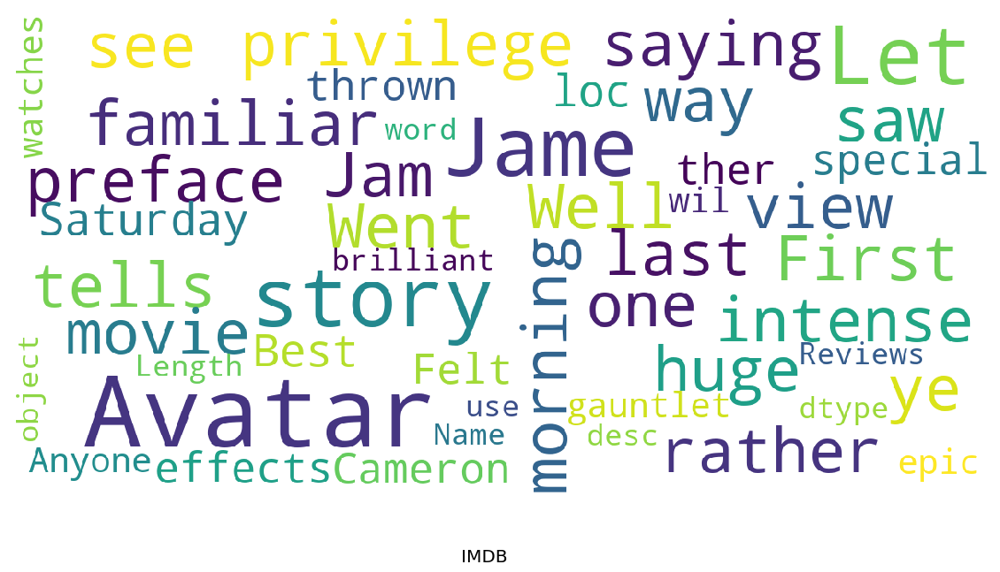

In [49]:
show_wordcloud(imbdPred['Reviews'],'IMDB')

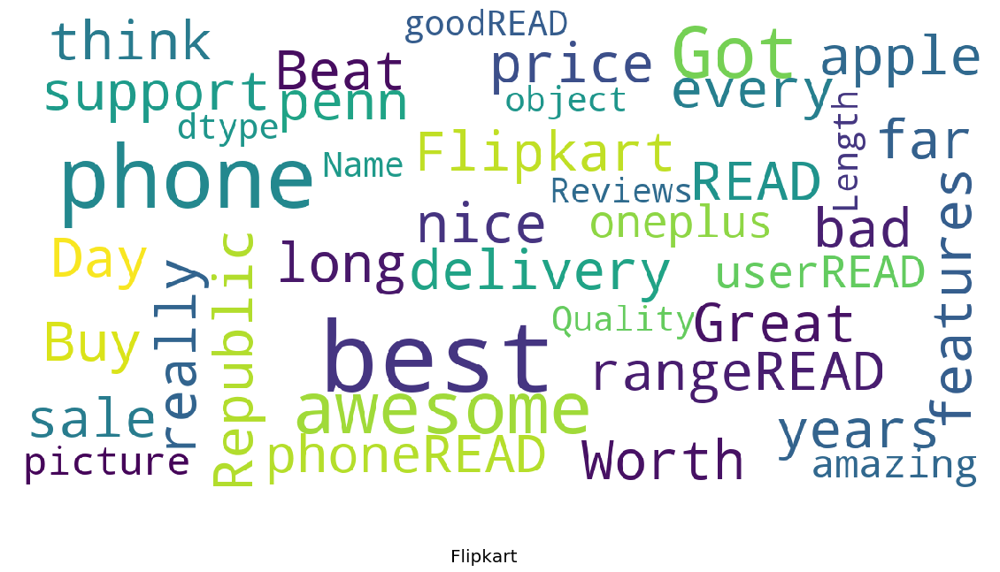

In [50]:
show_wordcloud(flipKartPrediction['Reviews'],'Flipkart')